# DataLoader
You need to make sure the 5328_Assignment.zip is in the your google drive,If not you need to go to the following link to download
https://drive.google.com/file/d/1IAaf3yDa1KaRXNmphLjnb9LJKMF0vbBY/view?usp=sharing

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip /content/drive/MyDrive/2024_A2_datasets.zip -d /content/

Archive:  /content/drive/MyDrive/2024_A2_datasets.zip
   creating: /content/2024_A2_datasets/
  inflating: /content/2024_A2_datasets/FashionMNIST0.3.npz  
  inflating: /content/2024_A2_datasets/FashionMNIST0.6.npz  
  inflating: /content/2024_A2_datasets/CIFAR10.npz  
   creating: /content/2024_A2_datasets/.ipynb_checkpoints/


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch import nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from PIL import Image
import torch.optim as optim
import torch.nn.functional as F
from sklearn.model_selection import train_test_split
import os
from tqdm import tqdm

In [ ]:
from typing_extensions import dataclass_transform
data_path_f3 = "/content/2024_A2_datasets/FashionMNIST0.3.npz"
data_path_f6="/content/2024_A2_datasets/FashionMNIST0.6.npz"
data_path_c10="/content/2024_A2_datasets/CIFAR10.npz"
data_f3=np.load(data_path_f3)
data_f6=np.load(data_path_f6)
data_c10=np.load(data_path_c10)
print(data_f3)
print(data_f6)
print(data_c10)
data_f3_X_tr=data_f3["X_tr"]
data_f3_S_tr=data_f3["S_tr"]
data_f3_X_ts=data_f3["X_ts"]
data_f3_Y_ts=data_f3["Y_ts"]

data_f6_X_tr=data_f6["X_tr"]
data_f6_S_tr=data_f6["S_tr"]
data_f6_X_ts=data_f6["X_ts"]
data_f6_Y_ts=data_f6["Y_ts"]

data_c10_X_tr=data_c10["X_tr"]
data_c10_S_tr=data_c10["S_tr"]
data_c10_X_ts=data_c10["X_ts"]
data_c10_Y_ts=data_c10["Y_ts"]

print(data_f3_X_tr.shape)
print(data_f3_S_tr.shape)
print(np.unique(data_f3_S_tr))
print(data_f3_X_ts.shape)
print(data_f3_Y_ts.shape)
print(np.unique(data_f3_Y_ts))


print(data_f6_X_tr.shape)
print(data_f6_S_tr.shape)
print(np.unique(data_f6_S_tr))
print(data_f6_X_ts.shape)
print(data_f6_Y_ts.shape)
print(np.unique(data_f6_Y_ts))

print(data_c10_X_tr.shape)
print(data_c10_S_tr.shape)
print(np.unique(data_c10_S_tr))
print(data_c10_X_ts.shape)
print(data_c10_Y_ts.shape)
print(np.unique(data_c10_Y_ts))



NpzFile '/content/2024_A2_datasets/FashionMNIST0.3.npz' with keys: X_tr, S_tr, X_ts, Y_ts
NpzFile '/content/2024_A2_datasets/FashionMNIST0.6.npz' with keys: X_tr, S_tr, X_ts, Y_ts
NpzFile '/content/2024_A2_datasets/CIFAR10.npz' with keys: X_tr, S_tr, X_ts, Y_ts
(24000, 28, 28)
(24000,)
[0 1 2 3]
(4000, 28, 28)
(4000,)
[0 1 2 3]
(24000, 28, 28)
(24000,)
[0 1 2 3]
(4000, 28, 28)
(4000,)
[0 1 2 3]
(20000, 32, 32, 3)
(20000,)
[0 1 2 3]
(4000, 32, 32, 3)
(4000,)
[0 1 2 3]


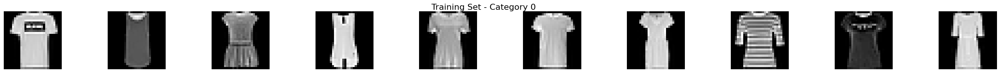

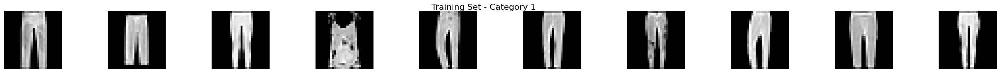

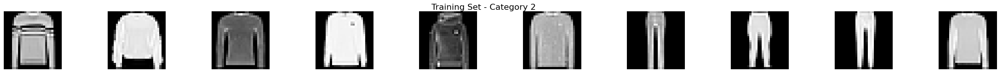

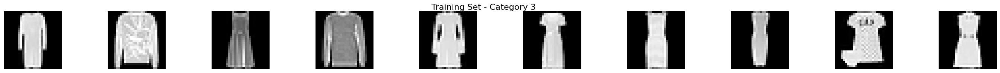

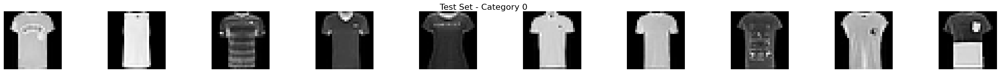

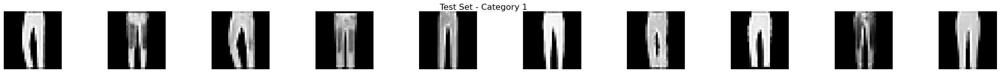

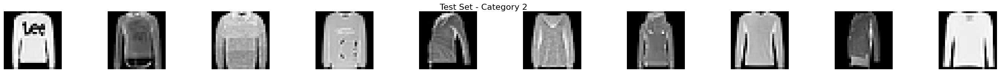

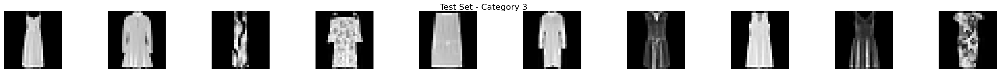

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming your data arrays are NumPy arrays
# data_f3_X_tr: Training images (shape: [num_samples, 28, 28])
# data_f3_S_tr: Training labels/categories (shape: [num_samples])
# data_f3_X_ts: Test images (shape: [num_samples, 28, 28])
# data_f3_Y_ts: Test labels/categories (shape: [num_samples])

# Get the unique categories
categories = np.unique(data_f3_S_tr)

# Function to visualize images
def visualize_images(images, labels, dataset_type):
    for category in categories:
        # Find the indices of images belonging to the current category
        idx = np.where(labels == category)[0][:20]  # Get first 10 indices
        category_images = images[idx]

        # Create a subplot for each image
        fig, axes = plt.subplots(1, 10, figsize=(35, 2))
        for i, ax in enumerate(axes):
            ax.imshow(category_images[i], cmap='gray')
            ax.axis('off')
        plt.suptitle(f'{dataset_type} Set - Category {category}', fontsize=16)
        plt.show()

# Visualize training images
visualize_images(data_f3_X_tr, data_f3_S_tr, 'Training')

# Visualize test images
visualize_images(data_f3_X_ts, data_f3_Y_ts, 'Test')


# Model

## DataLoader

In [ ]:
# Custom Dataset Class
class CustomImageDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels.astype(int)  # Ensure labels are of integer type
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = int(self.labels[idx])  # Ensure label is an integer

        # Check image shape and channels
        if image.ndim == 2:
            # Grayscale image, shape (H, W)
            image_mode = 'L'
        elif image.ndim == 3:
            if image.shape[2] == 1:
                # Single-channel grayscale image, shape (H, W, 1)
                image = image.squeeze(2)
                image_mode = 'L'
            elif image.shape[2] == 3:
                # RGB image, shape (H, W, 3)
                image_mode = 'RGB'
            else:
                raise ValueError(f"Unsupported channel number: {image.shape[2]}")
        else:
            raise ValueError(f"Unsupported image shape: {image.shape}")

        # Convert numpy array to PIL Image
        image = Image.fromarray(image.astype('uint8'), mode=image_mode)

        # Convert grayscale images to RGB if needed
        if image.mode == 'L':
            image = image.convert('RGB')

        if self.transform:
            image = self.transform(image)

        return image, label

## Resnet

In [ ]:
# Define Basic Convolutional Block
class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(
            in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False
        )
        self.bn1 = nn.BatchNorm2d(planes)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(
            planes, planes, kernel_size=3, stride=1, padding=1, bias=False
        )
        self.bn2 = nn.BatchNorm2d(planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != planes * self.expansion:
            #  Adjust dimensions to match residual
            self.shortcut = nn.Sequential(
                nn.Conv2d(
                    in_planes,
                    planes * self.expansion,
                    kernel_size=1,
                    stride=stride,
                    bias=False,
                ),
                nn.BatchNorm2d(planes * self.expansion),
            )

    def forward(self, x):
        out = self.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)  #  Residual connection
        out = self.relu(out)
        return out

# Define ResNet Model
class ResNet(nn.Module):
    def __init__(self, block, num_blocks, num_classes=4, in_channels=3):
        super(ResNet, self).__init__()
        self.in_planes = 64

        # Initial convolutional layer, using a variable number of input channels
        self.conv1 = nn.Conv2d(
            in_channels, 64, kernel_size=3, stride=1, padding=1, bias=False
        )
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)

        # Define residual blocks for four stages
        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)

        # Global average pooling and fully connected layer
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512 * block.expansion, num_classes)
        self.T_revision = nn.Linear(num_classes, num_classes, bias=False)

    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1] * (num_blocks - 1)
        layers = []
        for stride in strides:
            layers.append(
                block(self.in_planes, planes, stride)
            )
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x, revision=False):


        out = self.relu(self.bn1(self.conv1(x)))
        # residual block
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        # Classification layer
        out = self.avgpool(out)
        out = out.view(out.size(0), -1)
        out = self.fc(out)
        if revision:
            return out, self.T_revision.weight
        else:
            return out



# Function to get the custom ResNet model
def get_custom_resnet(num_classes=4, in_channels=3):
    return ResNet(BasicBlock, [2, 2, 2, 2], num_classes=num_classes, in_channels=in_channels)  # ResNet-18



## MLP

In [ ]:
# Define MLP Model
class MLP(nn.Module):
    def __init__(self, input_size=3072, hidden_sizes=[2048, 1024,512], num_classes=4):
        super(MLP, self).__init__()
        layers = []
        in_size = input_size
        for h in hidden_sizes:
            layers.append(nn.Linear(in_size, h))
            layers.append(nn.ReLU())
            layers.append(nn.BatchNorm1d(h))
            layers.append(nn.Dropout(0.2))
            in_size = h
        layers.append(nn.Linear(in_size, num_classes))
        self.net = nn.Sequential(*layers)
        self.T_revision = nn.Linear(num_classes, num_classes, False)

    def forward(self, x,revision=False):
        # x shape: (batch_size, channels, height, width)
        x = x.view(x.size(0), -1)  # Flatten
        out = self.net(x)
        if revision:
          return out, self.T_revision.weight
        else:
          return out

## Loss Function

In [ ]:
# Forward Correction Loss
from torch.autograd import Variable
import torch
import torch.nn as nn
import torch.nn.functional as F

class ForwardCorrectionLoss(nn.Module):
    def __init__(self, T):
        super(ForwardCorrectionLoss, self).__init__()
        if isinstance(T, np.ndarray):
            T = torch.from_numpy(T).float()
        self.T = T


    def forward(self, outputs, targets):
        device = outputs.device
        T = self.T.to(device)

        # Logits output by the model
        logits = outputs
        # Calculate the softmax output of the model
        pyx = F.softmax(logits, dim=1)
        # Calculate the corrected softmax output
        corrected_pyx = torch.matmul(pyx,T)
        #corrected_pyx = torch.matmul(T.t(),pyx.t()).t()

        # Compute log probabilities
        log_corrected_pyx = torch.log(corrected_pyx + 1e-15)
        # Compute loss
        loss = F.nll_loss(log_corrected_pyx, targets)
        return loss


class Reweight_Loss(nn.Module):
    def __init__(self,T):
        super(Reweight_Loss, self).__init__()
        if isinstance(T, np.ndarray):
            T = torch.from_numpy(T).float()
        self.T = T

    def forward(self, out, target):
        device = out.device
        self.T = self.T.to(device)
        loss = 0.
        out_softmax = F.softmax(out, dim=1)
        for i in range(len(target)):
            temp_softmax = out_softmax[i]
            temp = out[i]
            temp = torch.unsqueeze(temp, 0).to(device)
            temp_softmax = torch.unsqueeze(temp_softmax, 0).to(device)
            temp_target = target[i]
            temp_target = torch.unsqueeze(temp_target, 0)
            # Probability of the correct class according to the softmax output
            pro1 = temp_softmax[:, target[i]]

            # Compute the transformed output by applying matrix T
            out_T = torch.matmul(self.T.t(), temp_softmax.t())
            out_T = out_T.t()

            # Probability of the correct class in the transformed output
            pro2 = out_T[:, target[i]]
            # Compute the beta factor, adding a small epsilon to avoid division by zero
            beta = (pro1 / (pro2+ 1e-15))
            beta = Variable(beta, requires_grad=True) # Ensure beta is a variable with gradient tracking

            cross_loss = F.cross_entropy(temp, temp_target)
            # Adjust the loss with the beta factor
            _loss = beta * cross_loss

            loss += _loss
        return loss / len(target)


class Reweighting_Revision_Loss(nn.Module):
    def __init__(self,T):
        super(Reweighting_Revision_Loss, self).__init__()
        if isinstance(T, np.ndarray):
            T = torch.from_numpy(T).float()
        self.T = T

    def forward(self, out, correction, target):
        device = out.device
        self.T = self.T.to(device)
        loss = 0.
        correction = correction.to(device)
        out_softmax = F.softmax(out, dim=1)
        for i in range(len(target)):
            temp_softmax = out_softmax[i]
            temp = out[i]
            temp = torch.unsqueeze(temp, 0).to(device)
            temp_softmax = torch.unsqueeze(temp_softmax, 0).to(device)
            temp_target = target[i]
            temp_target = torch.unsqueeze(temp_target, 0)
            pro1 = temp_softmax[:, target[i]]

            # Adjust transformation matrix T with the correction term and apply softmax for normalization
            T_result = self.T + correction
            T_result=F.softmax(T_result, dim=1)
            out_T = torch.matmul(T_result.t(), temp_softmax.t())
            out_T = out_T.t()
            pro2 = out_T[:, target[i]]
            beta = (pro1 / (pro2+ 1e-15))

            cross_loss = F.cross_entropy(temp, temp_target)
            _loss = beta * cross_loss

            loss += _loss
        return loss / len(target)

class Reweighting_Revision_Loss_v2(nn.Module):
    def __init__(self,T):
        super(Reweighting_Revision_Loss_v2, self).__init__()
        if isinstance(T, np.ndarray):
            T = torch.from_numpy(T).float()
        self.T = T
        self.alpha=0.01 # Scaling factor alpha for the correction term

    def forward(self, out, correction, target):
        device = out.device
        self.T = self.T.to(device)
        loss = 0.
        correction = correction.to(device)
        out_softmax = F.softmax(out, dim=1)

        alpha=self.alpha # Set alpha to the initialized scaling factor

        for i in range(len(target)):
            temp_softmax = out_softmax[i]
            temp = out[i]
            temp = torch.unsqueeze(temp, 0).to(device)
            temp_softmax = torch.unsqueeze(temp_softmax, 0).to(device)
            temp_target = target[i]
            temp_target = torch.unsqueeze(temp_target, 0)
            pro1 = temp_softmax[:, target[i]]

            # Adjust transformation matrix T with the scaled correction term
            T_result = self.T + (alpha*correction)
            out_T = torch.matmul(T_result.t(), temp_softmax.t())
            out_T = out_T.t()
            pro2 = out_T[:, target[i]]
            beta = (pro1 / (pro2+ 1e-15))

            cross_loss = F.cross_entropy(temp, temp_target)
            _loss = beta * cross_loss
            loss += _loss
        return loss / len(target)

## Training in one epoch

In [ ]:
def train(model, train_loader, criterion, optimizer, device, epoch, method):
    loss_func_ce = nn.CrossEntropyLoss()
    model.train()
    running_loss = 0.0
    noise_loss_sum = 0.0
    correct = 0
    total = 0
    with tqdm(total=len(train_loader), desc=f"Epoch {epoch} Training") as pbar:
        for batch_idx, (inputs, targets) in enumerate(train_loader):
            inputs, targets = inputs.to(device), targets.to(device)

            optimizer.zero_grad()
            if method == 't_revision':
                outputs, correction = model(inputs, revision=True)
                loss = criterion(outputs, correction, targets)
                # Obtain the noise transition matrix T and ensure it is on the same device
                T = criterion.T.to(device)
                correction = correction.to(device)
                # Calculate the corrected T
                T_plus_correction = T + correction
                T_plus_correction = F.softmax(T_plus_correction, dim=1)
                # Calculate the softmax probability of the model output
                prob = F.softmax(outputs, dim=1)
                # Correcting output
                out_forward = torch.matmul(T_plus_correction.t(), prob.t()).t()
            elif method == 't_revision_v2':
                outputs, correction = model(inputs, revision=True)
                loss = criterion(outputs, correction, targets)
                # Obtain the noise transition matrix T and ensure it is on the same device
                T = criterion.T.to(device)
                alpha = criterion.alpha
                correction = correction.to(device)
                # Calculate the corrected T
                T_plus_correction = T + alpha*correction
                # Calculate the softmax probability of the model output
                prob = F.softmax(outputs, dim=1)
                # Correcting output
                out_forward = torch.matmul(T_plus_correction.t(), prob.t()).t()
            elif method == 'importance':
                outputs = model(inputs, revision=False)
                loss = criterion(outputs, targets)
                T = criterion.T.to(device)
                prob = F.softmax(outputs, dim=1)
                out_forward = torch.matmul(T.t(), prob.t()).t()
            elif method == 'forward':
                outputs = model(inputs, revision=False)
                loss = criterion(outputs, targets)
                T = criterion.T.to(device)
                prob = F.softmax(outputs, dim=1)
                out_forward = torch.matmul(T.t(), prob.t()).t()

            else:  # baseline
                outputs = model(inputs, revision=False)
                loss = criterion(outputs, targets)
                out_forward = F.softmax(outputs, dim=1)

            loss.backward()
            optimizer.step()

            running_loss += loss.item()

            # calculate accuracy
            _, predicted = torch.max(out_forward.data, 1)

            total += targets.size(0)
            correct += predicted.eq(targets).sum().item()
            noise_loss = loss_func_ce(out_forward, targets)
            noise_loss_sum += noise_loss.item()
            pbar.set_postfix({'Loss': running_loss / (batch_idx + 1), 'Acc': 100. * correct / total,"Noise Loss":noise_loss_sum / (batch_idx + 1)})
            pbar.update(1)
    return running_loss / len(train_loader), 100.0 * correct / total, noise_loss_sum / len(train_loader)


In [ ]:
def validate(model, val_loader, criterion, device, epoch, method):
    loss_func_ce = nn.CrossEntropyLoss()
    model.eval()
    correct = 0
    total = 0
    val_loss = 0.0
    noise_loss_sum = 0.0
    with tqdm(total=len(val_loader), desc=f"Epoch {epoch} Validation") as pbar:
        with torch.no_grad():
            for inputs, targets in val_loader:
                inputs, targets = inputs.to(device), targets.to(device)
                if method == 't_revision':
                    outputs = model(inputs, revision=False)
                    correction = model.T_revision.weight
                    loss = criterion(outputs, correction, targets)
                    # Compute T + correction and apply softmax for normalization
                    T = criterion.T.to(device)
                    correction = correction.to(device)
                    T_plus_correction = T + correction
                    prob = F.softmax(outputs, dim=1)
                    T_plus_correction = F.softmax(T_plus_correction, dim=1)
                    out_forward = torch.matmul(T_plus_correction.t(), prob.t()).t()
                elif method == 't_revision_v2':
                    outputs = model(inputs, revision=False)
                    # Get correction term and alpha value
                    correction = model.T_revision.weight
                    alpha = criterion.alpha
                    loss = criterion(outputs, correction, targets)
                    # Compute T + alpha * correction and apply softmax for normalization
                    T = criterion.T.to(device)
                    correction = correction.to(device)
                    T_plus_correction = T + alpha*correction
                    prob = F.softmax(outputs, dim=1)
                    T_plus_correction = F.softmax(T_plus_correction, dim=1)
                    out_forward = torch.matmul(T_plus_correction.t(), prob.t()).t()
                elif method == 'importance':
                    outputs = model(inputs, revision=False)
                    loss = criterion(outputs, targets)
                    # Use the transformation matrix T for adjusted output
                    T = criterion.T.to(device)
                    prob = F.softmax(outputs, dim=1)
                    out_forward = torch.matmul(T.t(), prob.t()).t()
                elif method == 'forward':
                    outputs = model(inputs, revision=False)
                    loss = criterion(outputs, targets)
                    # Use the transformation matrix T for adjusted output
                    T = criterion.T.to(device)
                    prob = F.softmax(outputs, dim=1)
                    out_forward = torch.matmul(T.t(), prob.t()).t()
                else:  # baseline
                    outputs = model(inputs, revision=False)
                    # Compute standard loss without adjustment
                    loss = criterion(outputs, targets)
                    out_forward = F.softmax(outputs, dim=1)

                 # Accumulate total validation loss
                val_loss += loss.item()
                _, predicted = torch.max(out_forward.data, 1)
                total += targets.size(0)
                correct += predicted.eq(targets).sum().item()
                # Calculate noise loss using cross-entropy between adjusted output and targets
                noise_loss = loss_func_ce(out_forward, targets)
                noise_loss_sum += noise_loss.item()
                pbar.update(1)
    avg_loss = val_loss / len(val_loader)
    accuracy = 100.0 * correct / total
    noise_loss_avg = noise_loss_sum / len(val_loader)

    print(
        'Noisy Loss: %.4f,Validation Loss: %.4f, Accuracy: %.2f%% (%d/%d)'
        % (noise_loss_avg, avg_loss, accuracy, correct, total)
    )
    return avg_loss, accuracy, noise_loss_avg


In [ ]:
import torch
from tqdm import tqdm
import os

def test(model, test_loader, criterion, device, method, save_logits=True, save_path='logits.pt'):

    model.eval()
    correct = 0
    total = 0
    test_loss = 0.0
    if method == "baseline":
      shape = model.T_revision.weight.shape
      T = torch.eye(shape[0], device=model.T_revision.weight.device, dtype=model.T_revision.weight.dtype)
    elif method == "t_revision_v2":
      alpha = criterion.alpha
      T=criterion.T.to(device)
    else:
      T = criterion.T.to(device)
    # Initialize the list to collect logits
    all_logits = []
    criterion = nn.CrossEntropyLoss()
    with tqdm(total=len(test_loader), desc="Testing") as pbar:
        with torch.no_grad():
            for inputs, targets in test_loader:
                inputs, targets = inputs.to(device), targets.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, targets)
                test_loss += loss.item()

                # Calculate predictions to obtain accuracy
                _, predicted = torch.max(outputs.data, 1)
                total += targets.size(0)
                correct += predicted.eq(targets).sum().item()

                # collect logits
                if save_logits:
                    outputs=F.softmax(outputs, dim=1)
                    all_logits.append(outputs.cpu())

                pbar.update(1)
    avg_loss = test_loss / len(test_loader)
    accuracy = 100.0 * correct / total
    print(
        'Test Loss: %.4f, Accuracy: %.2f%% (%d/%d)'
        % (avg_loss, accuracy, correct, total)
    )

    # if logits needs to be saved
    if save_logits:
        # Connect the collected tensor list into a single tensor
        all_logits = torch.cat(all_logits, dim=0)  # shape：(num_samples, num_classes)

        # Save logits tensor using torch.save
        torch.save(all_logits, save_path)


    if method == 't_revision':
      correction = model.T_revision.weight
      T_plus_correction = T + correction
      T_plus_correction = F.softmax(T_plus_correction, dim=1)
    elif method == 't_revision_v2':
      correction = model.T_revision.weight
      T_plus_correction = T + alpha*correction
      T_plus_correction = T_plus_correction / T_plus_correction.sum(axis=1, keepdims=True)
      T_plus_correction[T_plus_correction < 0] = 0

    else:
      T_plus_correction = T
    #if method in ['t_revision','t_revision_v2']:
    #  print(correction)
    return avg_loss, accuracy, all_logits, T_plus_correction


## Estimate T-Matrix

In [ ]:
import numpy as np
def fit(X, num_classes, filter_outlier=True):
    print(X)
    # number of classes
    c = num_classes
    T = np.empty((c, c))
    eta_corr = X
    for i in np.arange(c):
        if not filter_outlier:
            idx_best = np.argmax(eta_corr[:, i])
        else:
            eta_thresh = np.percentile(eta_corr[:, i], 97,interpolation='higher')
            robust_eta = eta_corr[:, i]
            robust_eta[robust_eta >= eta_thresh] = 0.0
            idx_best = np.argmax(robust_eta)
        for j in np.arange(c):
            T[i, j] = eta_corr[idx_best, j]
    print(T)
    return T



## Training process

In [ ]:
def training(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=0.1,
    batch_size=32,
    num_epochs=10,
    method='baseline',        # 'baseline', 'forward', 'importance' or 't_revision'
    T_matrix=None,            # Transition matrix, used for 'forward', 'importance', or as an initial value for 't_revision'
    num_classes=4,            # number of classes
    optimizer_name='adam',     # 'sgd', 'adam' or 'adamw'
    save_model_path='best_model.pth',  # Save the path of the best model
    model_name='mlp',          # 'mlp' or 'resnet'
    estimate_T=True,         # estimate transition matrix or not
    patience=10,
):
    best_epoch = 0
    early_stop_counter = 0
    # Check the shape of the input data, determine the number of channels and image size
    if len(X_train_full.shape) == 4:
        _, image_height, image_width, num_channels = X_train_full.shape
    elif len(X_train_full.shape) == 3:
        _, image_height, image_width = X_train_full.shape
        num_channels = 1  # greyscale image
    else:
        raise ValueError("incorrect input shape，should be (N, H, W, C) 或 (N, H, W)")

    # split training set and test set（8:2）
    X_train, X_val, y_train, y_val = train_test_split(
        X_train_full, y_train_full, test_size=0.2, shuffle=True)

    # Define data transformation
    transform_list = [transforms.Resize((32, 32))]
    if num_channels == 1:
        # If it is a grayscale image, it is necessary to ensure that the output is one channel
        transform_list.append(transforms.Grayscale(num_output_channels=1))
    else:
        # If it is a color image, it is necessary to ensure that the output is 3 channels
        transform_list.append(transforms.Lambda(lambda x: x.convert('RGB')))
    transform_list.append(transforms.ToTensor())

    transform = transforms.Compose(transform_list)

    # Create datasets and data loaders
    train_dataset = CustomImageDataset(X_train, y_train, transform=transform)
    val_dataset = CustomImageDataset(X_val, y_val, transform=transform)
    test_dataset = CustomImageDataset(X_test, y_test, transform=transform)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    # Instantiate model
    if isinstance(model_name, str):
        print(model_name)
        if model_name.lower() == 'mlp':
            input_size = 32 * 32 * num_channels  # Adjust input size based on the number of channels
            model = MLP(input_size=input_size, hidden_sizes=[512, 256], num_classes=num_classes)
        elif model_name.lower() == 'resnet':
            model = get_custom_resnet(num_classes=num_classes, in_channels=num_channels)
    else:
        if isinstance(model_name, MLP):
            model = model_name
            input_size = 32 * 32 * num_channels  # Adjust input size based on the number of channels
        elif isinstance(model_name, ResNet):
            model = model_name
        else:
            print(model_name)
            raise ValueError("invalid model name. choose 'mlp' or 'resnet'。")

    # 检查是否有可用的 GPU
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)

    # 定义损失函数
    if method == 'baseline':
        criterion = nn.CrossEntropyLoss()
    elif method == 'forward':
        if T_matrix is None:
            raise ValueError("T_matrix must be provided for 'forward' method")
        criterion = ForwardCorrectionLoss(T_matrix)
    elif method == 'importance':
        if T_matrix is None:
            raise ValueError("T_matrix must be provided for 'importance' method")
        criterion = Reweight_Loss(T_matrix)
    elif method == 't_revision':
        if T_matrix is None:
            raise ValueError("T_matrix must be provided for 't_revision' method")
        criterion = Reweighting_Revision_Loss(T_matrix)
    elif method == 't_revision_v2':
        if T_matrix is None:
            raise ValueError("T_matrix must be provided for 't_revision_v2' method")
        criterion = Reweighting_Revision_Loss_v2(T_matrix)
    else:
        raise ValueError("invalid method, choose 'baseline', 'forward', 'importance' or 't_revision'")


    params = model.parameters()


    # Choose an optimizer based on optimizer_name
    if optimizer_name.lower() == 'sgd':
        optimizer = optim.SGD(params, lr=learning_rate, momentum=0.99, weight_decay=5e-5)
    elif optimizer_name.lower() == 'adam':
        optimizer = optim.Adam(params, lr=learning_rate, weight_decay=5e-5)
    elif optimizer_name.lower() == 'adamw':
        optimizer = optim.AdamW(params, lr=learning_rate, weight_decay=5e-5)
    else:
        raise ValueError("invalid optimizer, choose 'sgd', 'adam' or 'adamw'")

    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

    train_loss_list = []
    val_loss_list = []
    train_accuracy_list = []
    val_accuracy_list = []
    train_noise_loss_list = []
    val_noise_loss_list = []
    test_loss_list = []
    test_accuracy_list = []
    # start training and validation
    best_val_loss = float('inf')
    for epoch in range(1, num_epochs + 1):
        train_loss,train_accuracy,train_avg_noise_loss=train(model, train_loader, criterion, optimizer, device, epoch, method)
        val_loss, val_accuracy,avg_noise_loss = validate(model, val_loader, criterion, device, epoch, method)
        test_loss, test_accuracy,logits,_ = test(model, test_loader, criterion, device, method)
        scheduler.step()

        # Save the model with the minimum validation loss
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save(model.state_dict(), save_model_path)
            print("Saved Best Model")
            best_epoch = epoch
            early_stop_counter = 0
        else:
            early_stop_counter += 1
            if early_stop_counter >= patience:
                    print(f"Early stopping triggered at epoch {epoch}")
                    break

        train_loss_list.append(train_loss)
        val_loss_list.append(val_loss)
        train_accuracy_list.append(train_accuracy)
        val_accuracy_list.append(val_accuracy)
        train_noise_loss_list.append(train_avg_noise_loss)
        val_noise_loss_list.append(avg_noise_loss)
        test_loss_list.append(test_loss)
        test_accuracy_list.append(test_accuracy)
    torch.save(model.state_dict(), "last_model.pth")

    # test model
    # load best model
    model.load_state_dict(torch.load(save_model_path))
    test_loss, test_accuracy,_,_ = test(model, test_loader, criterion, device, method)
    if estimate_T:
        _,_,_X,_T= test(model, train_loader, criterion, device, method)
        if method == 'baseline':
          T_matrix = fit(_X, num_classes=num_classes)
        else:
          T_matrix = _T
    # return trained model
    return model, train_loss_list, val_loss_list, train_accuracy_list, val_accuracy_list, train_noise_loss_list, val_noise_loss_list, test_loss_list, test_accuracy_list, test_loss, test_accuracy,T_matrix



# Example Estimate Matrix and Training
This is a qiuck example to test our code and estimate transition matrix

## RRE

In [ ]:
def compute_rre_extended(torch_tensor, numpy_array, norm_type='fro'):

    if isinstance(torch_tensor, torch.Tensor):
        matrix_a_np = torch_tensor.detach().cpu().numpy()
    else:
        matrix_a_np = torch_tensor

    if isinstance(numpy_array, torch.Tensor):
        matrix_b_np = numpy_array.detach().cpu().numpy()
    else:
        matrix_b_np = numpy_array


    # Check if the matrix shapes are the same
    if matrix_a_np.shape != matrix_b_np.shape:
        raise ValueError(f"The shapes of two matrices are not the same: matrix_a.shape={matrix_a_np.shape}, matrix_b.shape={matrix_b_np.shape}")

    # Calculate the norm of a specified type
    norm_b = np.linalg.norm(matrix_b_np, ord=norm_type)
    norm_diff = np.linalg.norm(matrix_b_np - matrix_a_np, ord=norm_type)

    if norm_b == 0:
        raise ValueError("The specified norm of the first matrix is zero, making it impossible to calculate RRE.")

    rre = norm_diff / norm_b
    return rre

## Estimate Resnet

### FashionMNIST0.6

In [ ]:
T_matrix = np.array([
    [0.4, 0.2, 0.2, 0.2],
    [0.2, 0.4, 0.2, 0.2],
    [0.2, 0.2, 0.4, 0.2],
    [0.2, 0.2, 0.2, 0.4]
])
T_matrix_ = T_matrix
X_train_full=data_f6_X_tr
y_train_full=data_f6_S_tr
X_test=data_f6_X_ts
y_test=data_f6_Y_ts

In [ ]:
import numpy as np

# Placeholder lists for RRE values and model_baseline_resnet[11] matrices from each run
rre_values = []
model_matrices = []

# Run the training function 10 times and compute RRE for each run
for _ in range(10):
    # Run the training function and get the model
    model_baseline_resnet = training(
        X_train_full,
        y_train_full,
        X_test,
        y_test,
        method='baseline',
        num_classes=4,
        optimizer_name='adam',
        num_epochs=5,
        learning_rate=0.0005,
        batch_size=32,
        estimate_T=True,
        model_name='resnet'
    )

    # Extract the transition matrix from the model and compute RRE
    T_matrix_estimated = model_baseline_resnet[11]
    rre_value = compute_rre_extended(T_matrix_estimated, T_matrix_)
    rre_values.append(rre_value)
    model_matrices.append(T_matrix_estimated)

# Compute mean and variance of RRE values
rre_mean = np.mean(rre_values)
rre_variance = np.var(rre_values)

# Compute the mean matrix across all 10 runs
mean_matrix = np.mean(model_matrices, axis=0)

# Compute RRE for the mean matrix
mean_matrix_rre = compute_rre_extended(mean_matrix, T_matrix_)

# Output the required variables
print("Mean of RRE values:", rre_mean)
print("Variance of RRE values:", rre_variance)
print("Mean of matrices across runs:\n", mean_matrix)
print("RRE of the mean matrix:", mean_matrix_rre)


resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 167.80it/s]


Noisy Loss: 1.3666,Validation Loss: 1.3507, Accuracy: 37.44% (1797/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.62it/s]


Test Loss: 1.0234, Accuracy: 88.33% (3533/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 159.53it/s]


Noisy Loss: 1.3686,Validation Loss: 1.3779, Accuracy: 32.62% (1566/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.80it/s]


Test Loss: 1.0522, Accuracy: 63.30% (2532/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 174.39it/s]


Noisy Loss: 1.3702,Validation Loss: 1.3538, Accuracy: 37.29% (1790/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 167.52it/s]


Test Loss: 1.0771, Accuracy: 89.67% (3587/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 160.58it/s]


Noisy Loss: 1.3680,Validation Loss: 1.3710, Accuracy: 35.27% (1693/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 163.55it/s]


Test Loss: 1.0271, Accuracy: 80.80% (3232/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.91it/s]


Noisy Loss: 1.3684,Validation Loss: 1.3531, Accuracy: 37.81% (1815/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 160.32it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 1.0490, Accuracy: 90.28% (3611/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 173.11it/s]


Test Loss: 1.0234, Accuracy: 88.33% (3533/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 199.42it/s]
<ipython-input-14-809adadbd286>:160: DeprecationWarning: the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)
  T_matrix = fit(_X, num_classes=num_classes)


Test Loss: 1.3466, Accuracy: 37.87% (7271/19200)
tensor([[0.2212, 0.2295, 0.1962, 0.3531],
        [0.2201, 0.2454, 0.2462, 0.2883],
        [0.2840, 0.2155, 0.2816, 0.2189],
        ...,
        [0.1733, 0.3992, 0.2163, 0.2112],
        [0.1418, 0.1884, 0.4308, 0.2390],
        [0.1869, 0.1634, 0.4282, 0.2216]])
[[0.38692573 0.18887775 0.20369953 0.220497  ]
 [0.13434017 0.4077293  0.24049333 0.21743719]
 [0.17168999 0.15661323 0.47736743 0.19432938]
 [0.16593437 0.21919453 0.22870271 0.38616848]]
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 172.01it/s]


Noisy Loss: 1.3712,Validation Loss: 1.3731, Accuracy: 34.75% (1668/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 170.29it/s]


Test Loss: 1.0992, Accuracy: 73.78% (2951/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 172.37it/s]


Noisy Loss: 1.3722,Validation Loss: 1.3656, Accuracy: 36.19% (1737/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 170.24it/s]


Test Loss: 1.1067, Accuracy: 79.83% (3193/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 155.12it/s]


Noisy Loss: 1.3685,Validation Loss: 1.3497, Accuracy: 38.19% (1833/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 163.31it/s]


Test Loss: 1.0600, Accuracy: 89.20% (3568/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 149.84it/s]


Noisy Loss: 1.3674,Validation Loss: 1.3748, Accuracy: 35.12% (1686/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.87it/s]


Test Loss: 1.0471, Accuracy: 74.15% (2966/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 178.48it/s]


Noisy Loss: 1.3656,Validation Loss: 1.3634, Accuracy: 36.15% (1735/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 168.72it/s]


Test Loss: 1.0074, Accuracy: 82.62% (3305/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.26it/s]


Test Loss: 1.0600, Accuracy: 89.20% (3568/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 183.46it/s]


Test Loss: 1.3458, Accuracy: 38.00% (7296/19200)
tensor([[0.3166, 0.1732, 0.2108, 0.2994],
        [0.4066, 0.1706, 0.2163, 0.2065],
        [0.3114, 0.1935, 0.2058, 0.2893],
        ...,
        [0.2347, 0.1778, 0.4005, 0.1870],
        [0.3946, 0.1631, 0.2116, 0.2307],
        [0.2470, 0.1785, 0.2261, 0.3484]])
[[0.41169032 0.15980816 0.20735705 0.22114448]
 [0.22165118 0.37234792 0.1811201  0.22488077]
 [0.22116868 0.17852232 0.42349425 0.17681473]
 [0.24527879 0.15654691 0.24029373 0.35788059]]
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 177.75it/s]


Noisy Loss: 1.3761,Validation Loss: 1.3759, Accuracy: 32.88% (1578/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 164.54it/s]


Test Loss: 1.1458, Accuracy: 72.40% (2896/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 157.29it/s]


Noisy Loss: 1.3730,Validation Loss: 1.3985, Accuracy: 33.33% (1600/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 173.61it/s]


Test Loss: 1.0432, Accuracy: 74.65% (2986/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 169.95it/s]


Noisy Loss: 1.3684,Validation Loss: 1.3540, Accuracy: 36.92% (1772/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 172.72it/s]


Test Loss: 1.0363, Accuracy: 89.15% (3566/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 152.56it/s]


Noisy Loss: 1.3681,Validation Loss: 1.3797, Accuracy: 34.44% (1653/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 169.95it/s]


Test Loss: 1.0229, Accuracy: 73.70% (2948/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 170.23it/s]


Noisy Loss: 1.3672,Validation Loss: 1.3764, Accuracy: 35.94% (1725/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 176.92it/s]


Test Loss: 0.9751, Accuracy: 84.12% (3365/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.06it/s]


Test Loss: 1.0363, Accuracy: 89.15% (3566/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 199.19it/s]


Test Loss: 1.3432, Accuracy: 38.20% (7334/19200)
tensor([[0.2218, 0.3474, 0.1965, 0.2344],
        [0.2046, 0.1798, 0.3858, 0.2298],
        [0.2440, 0.1781, 0.3916, 0.1863],
        ...,
        [0.2270, 0.2220, 0.2929, 0.2581],
        [0.3243, 0.2675, 0.1722, 0.2360],
        [0.4365, 0.1861, 0.1960, 0.1814]])
[[0.45875207 0.16494606 0.20329849 0.17300332]
 [0.22734281 0.35993683 0.19882765 0.21389271]
 [0.2050405  0.18384498 0.39206365 0.21905081]
 [0.19109827 0.17935961 0.17712523 0.45241684]]
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 170.72it/s]


Noisy Loss: 1.3720,Validation Loss: 1.3602, Accuracy: 35.40% (1699/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 162.36it/s]


Test Loss: 1.1082, Accuracy: 78.05% (3122/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 164.12it/s]


Noisy Loss: 1.3654,Validation Loss: 1.3546, Accuracy: 37.42% (1796/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 168.80it/s]


Test Loss: 0.9945, Accuracy: 89.60% (3584/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 170.89it/s]


Noisy Loss: 1.3665,Validation Loss: 1.3698, Accuracy: 36.90% (1771/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 170.48it/s]


Test Loss: 0.9831, Accuracy: 86.67% (3467/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 181.79it/s]


Noisy Loss: 1.3680,Validation Loss: 1.3760, Accuracy: 36.17% (1736/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 179.98it/s]


Test Loss: 1.0057, Accuracy: 83.58% (3343/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 151.46it/s]


Noisy Loss: 1.3689,Validation Loss: 1.3812, Accuracy: 35.46% (1702/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 165.26it/s]


Test Loss: 1.0304, Accuracy: 77.50% (3100/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 156.04it/s]


Test Loss: 0.9945, Accuracy: 89.60% (3584/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 196.85it/s]


Test Loss: 1.3480, Accuracy: 38.25% (7344/19200)
tensor([[0.3133, 0.2626, 0.1455, 0.2786],
        [0.2606, 0.2731, 0.3117, 0.1546],
        [0.4760, 0.2112, 0.1549, 0.1580],
        ...,
        [0.2898, 0.2252, 0.1823, 0.3027],
        [0.1807, 0.1989, 0.1854, 0.4350],
        [0.2824, 0.2104, 0.1708, 0.3364]])
[[0.47898352 0.21613318 0.15417615 0.15070714]
 [0.2531071  0.43292829 0.17104784 0.1429168 ]
 [0.22323595 0.2298767  0.42274454 0.12414271]
 [0.14703161 0.21075313 0.19078963 0.45142564]]
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 174.57it/s]


Noisy Loss: 1.3700,Validation Loss: 1.3716, Accuracy: 34.15% (1639/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 171.55it/s]


Test Loss: 1.0868, Accuracy: 68.12% (2725/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 177.77it/s]


Noisy Loss: 1.3729,Validation Loss: 1.3906, Accuracy: 31.29% (1502/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 158.80it/s]


Test Loss: 1.0936, Accuracy: 58.50% (2340/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 152.96it/s]


Noisy Loss: 1.3656,Validation Loss: 1.3742, Accuracy: 34.69% (1665/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 164.78it/s]


Test Loss: 1.0168, Accuracy: 71.10% (2844/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 160.97it/s]


Noisy Loss: 1.3702,Validation Loss: 1.3858, Accuracy: 34.23% (1643/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 160.50it/s]


Test Loss: 1.0436, Accuracy: 72.83% (2913/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 174.67it/s]


Noisy Loss: 1.3665,Validation Loss: 1.3934, Accuracy: 32.94% (1581/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.19it/s]


Test Loss: 0.9903, Accuracy: 64.03% (2561/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 161.66it/s]


Test Loss: 1.0868, Accuracy: 68.12% (2725/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 197.30it/s]


Test Loss: 1.3695, Accuracy: 34.01% (6530/19200)
tensor([[0.3503, 0.2039, 0.2851, 0.1607],
        [0.2770, 0.2141, 0.2842, 0.2247],
        [0.4028, 0.1746, 0.2757, 0.1468],
        ...,
        [0.2199, 0.2327, 0.2853, 0.2621],
        [0.2014, 0.3614, 0.2555, 0.1818],
        [0.2290, 0.2486, 0.2877, 0.2347]])
[[0.40991607 0.19174294 0.26230496 0.13603602]
 [0.19762883 0.38788238 0.23584202 0.17864677]
 [0.19208805 0.20668127 0.50137889 0.09985178]
 [0.25142699 0.20480411 0.27750358 0.2662653 ]]
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 178.46it/s]


Noisy Loss: 1.3722,Validation Loss: 1.3869, Accuracy: 33.25% (1596/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.43it/s]


Test Loss: 1.1303, Accuracy: 64.55% (2582/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 152.68it/s]


Noisy Loss: 1.3678,Validation Loss: 1.3585, Accuracy: 37.10% (1781/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 160.73it/s]


Test Loss: 1.0579, Accuracy: 82.25% (3290/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 156.47it/s]


Noisy Loss: 1.3710,Validation Loss: 1.4066, Accuracy: 30.02% (1441/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.22it/s]


Test Loss: 1.0724, Accuracy: 50.80% (2032/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.80it/s]


Noisy Loss: 1.3647,Validation Loss: 1.3586, Accuracy: 37.77% (1813/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.16it/s]


Test Loss: 0.9850, Accuracy: 88.38% (3535/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 177.39it/s]


Noisy Loss: 1.3664,Validation Loss: 1.3482, Accuracy: 38.29% (1838/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.69it/s]


Test Loss: 1.0251, Accuracy: 89.60% (3584/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.99it/s]


Test Loss: 1.0251, Accuracy: 89.60% (3584/4000)


Testing: 100%|██████████| 600/600 [00:02<00:00, 206.58it/s]


Test Loss: 1.3405, Accuracy: 38.48% (7388/19200)
tensor([[0.1852, 0.1912, 0.2002, 0.4233],
        [0.1934, 0.4203, 0.1870, 0.1993],
        [0.1873, 0.2754, 0.2532, 0.2841],
        ...,
        [0.1854, 0.2666, 0.3476, 0.2004],
        [0.2025, 0.4549, 0.1488, 0.1939],
        [0.3960, 0.2285, 0.1842, 0.1912]])
[[0.41435659 0.19710431 0.19330178 0.19523731]
 [0.15211347 0.46386927 0.17600378 0.2080134 ]
 [0.20012172 0.23669347 0.35129219 0.21189263]
 [0.16307622 0.21554942 0.18251523 0.43885913]]
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.86it/s]


Noisy Loss: 1.3697,Validation Loss: 1.3818, Accuracy: 34.77% (1669/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 172.65it/s]


Test Loss: 1.0709, Accuracy: 70.75% (2830/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 166.00it/s]


Noisy Loss: 1.3690,Validation Loss: 1.3724, Accuracy: 35.17% (1688/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 167.62it/s]


Test Loss: 1.0419, Accuracy: 79.70% (3188/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 173.52it/s]


Noisy Loss: 1.3694,Validation Loss: 1.3493, Accuracy: 37.60% (1805/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 172.62it/s]


Test Loss: 1.0667, Accuracy: 90.30% (3612/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 167.91it/s]


Noisy Loss: 1.3651,Validation Loss: 1.3500, Accuracy: 37.17% (1784/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 168.55it/s]


Test Loss: 0.9831, Accuracy: 89.33% (3573/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 164.92it/s]


Noisy Loss: 1.3683,Validation Loss: 1.3527, Accuracy: 37.27% (1789/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 159.96it/s]


Test Loss: 1.0423, Accuracy: 88.58% (3543/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.99it/s]


Test Loss: 1.0667, Accuracy: 90.30% (3612/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 195.51it/s]


Test Loss: 1.3436, Accuracy: 38.33% (7360/19200)
tensor([[0.2325, 0.3691, 0.1811, 0.2173],
        [0.1968, 0.2422, 0.3763, 0.1848],
        [0.2331, 0.3705, 0.1767, 0.2197],
        ...,
        [0.2562, 0.2209, 0.2925, 0.2304],
        [0.3573, 0.1881, 0.2161, 0.2385],
        [0.3638, 0.1890, 0.1938, 0.2535]])
[[0.39603248 0.18491857 0.18605182 0.23299712]
 [0.21492298 0.38193798 0.20265388 0.20048511]
 [0.1962944  0.24387905 0.37869462 0.18113191]
 [0.21129172 0.18427832 0.20635904 0.39807087]]
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.03it/s]


Noisy Loss: 1.3719,Validation Loss: 1.3894, Accuracy: 32.31% (1551/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 168.24it/s]


Test Loss: 1.1034, Accuracy: 64.50% (2580/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.04it/s]


Noisy Loss: 1.3704,Validation Loss: 1.3532, Accuracy: 37.52% (1801/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 159.25it/s]


Test Loss: 1.0765, Accuracy: 89.33% (3573/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 174.71it/s]


Noisy Loss: 1.3691,Validation Loss: 1.3712, Accuracy: 35.62% (1710/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 169.08it/s]


Test Loss: 1.0395, Accuracy: 82.80% (3312/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.35it/s]


Noisy Loss: 1.3699,Validation Loss: 1.3629, Accuracy: 35.00% (1680/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 172.49it/s]


Test Loss: 1.0690, Accuracy: 75.80% (3032/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 175.80it/s]


Noisy Loss: 1.3697,Validation Loss: 1.3704, Accuracy: 34.56% (1659/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.43it/s]


Test Loss: 1.0609, Accuracy: 75.33% (3013/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 159.27it/s]


Test Loss: 1.0765, Accuracy: 89.33% (3573/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 191.84it/s]


Test Loss: 1.3439, Accuracy: 38.17% (7328/19200)
tensor([[0.2304, 0.1661, 0.2592, 0.3444],
        [0.1838, 0.1963, 0.2515, 0.3683],
        [0.3360, 0.1597, 0.2572, 0.2470],
        ...,
        [0.2212, 0.3559, 0.1964, 0.2266],
        [0.1995, 0.2067, 0.3851, 0.2088],
        [0.3648, 0.1465, 0.2425, 0.2461]])
[[0.36437258 0.15155707 0.26207858 0.22199173]
 [0.20736589 0.36720702 0.19489372 0.23053338]
 [0.19807245 0.16619307 0.40650138 0.22923309]
 [0.17373487 0.18145591 0.23703142 0.40777776]]
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 174.86it/s]


Noisy Loss: 1.3694,Validation Loss: 1.3697, Accuracy: 33.77% (1621/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.23it/s]


Test Loss: 1.1042, Accuracy: 65.42% (2617/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 176.32it/s]


Noisy Loss: 1.3703,Validation Loss: 1.3717, Accuracy: 32.58% (1564/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 161.42it/s]


Test Loss: 1.0786, Accuracy: 65.05% (2602/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 152.67it/s]


Noisy Loss: 1.3697,Validation Loss: 1.3581, Accuracy: 36.67% (1760/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 164.71it/s]


Test Loss: 1.0921, Accuracy: 80.28% (3211/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 173.28it/s]


Noisy Loss: 1.3680,Validation Loss: 1.3526, Accuracy: 38.31% (1839/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 161.46it/s]


Test Loss: 1.0505, Accuracy: 89.08% (3563/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 150.17it/s]


Noisy Loss: 1.3659,Validation Loss: 1.3527, Accuracy: 38.42% (1844/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 166.27it/s]


Test Loss: 1.0231, Accuracy: 89.75% (3590/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.96it/s]


Test Loss: 1.0505, Accuracy: 89.08% (3563/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 189.20it/s]


Test Loss: 1.3466, Accuracy: 38.16% (7326/19200)
tensor([[0.1924, 0.3223, 0.3266, 0.1587],
        [0.3343, 0.2301, 0.1901, 0.2455],
        [0.3905, 0.2170, 0.1796, 0.2130],
        ...,
        [0.2648, 0.2379, 0.2079, 0.2893],
        [0.2096, 0.2193, 0.2366, 0.3346],
        [0.2103, 0.4821, 0.1351, 0.1726]])
[[0.42997199 0.21952325 0.17371839 0.17678639]
 [0.20687987 0.48320204 0.13270146 0.17721666]
 [0.19408771 0.25040814 0.34821877 0.20728542]
 [0.21558595 0.21649399 0.21906181 0.34885824]]
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 149.88it/s]


Noisy Loss: 1.3678,Validation Loss: 1.3571, Accuracy: 36.54% (1754/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.42it/s]


Test Loss: 1.0552, Accuracy: 79.78% (3191/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 178.03it/s]


Noisy Loss: 1.3654,Validation Loss: 1.3717, Accuracy: 36.81% (1767/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.13it/s]


Test Loss: 0.9680, Accuracy: 86.35% (3454/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 164.19it/s]


Noisy Loss: 1.3692,Validation Loss: 1.3709, Accuracy: 34.02% (1633/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 168.73it/s]


Test Loss: 1.0462, Accuracy: 72.65% (2906/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 176.26it/s]


Noisy Loss: 1.3662,Validation Loss: 1.3609, Accuracy: 37.88% (1818/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 165.64it/s]


Test Loss: 1.0183, Accuracy: 87.22% (3489/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 165.22it/s]


Noisy Loss: 1.3692,Validation Loss: 1.3861, Accuracy: 34.40% (1651/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 168.19it/s]


Test Loss: 1.0024, Accuracy: 78.70% (3148/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 165.48it/s]


Test Loss: 1.0552, Accuracy: 79.78% (3191/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 190.82it/s]

Test Loss: 1.3565, Accuracy: 36.12% (6936/19200)
tensor([[0.1415, 0.2122, 0.3659, 0.2804],
        [0.2865, 0.2101, 0.2215, 0.2819],
        [0.2903, 0.2453, 0.2107, 0.2537],
        ...,
        [0.1528, 0.2209, 0.2601, 0.3662],
        [0.1927, 0.4086, 0.1918, 0.2070],
        [0.1700, 0.4238, 0.2016, 0.2046]])
[[0.31291923 0.2013126  0.21334898 0.27241921]
 [0.17840859 0.43683386 0.19561459 0.18914297]
 [0.13420576 0.19537455 0.41954815 0.25087151]
 [0.13877024 0.19113339 0.21722089 0.45287549]]
Mean of RRE values: 0.13422337540394627
Variance of RRE values: 0.0017027742036727727
Mean of matrices across runs:
 [[0.40639206 0.18759239 0.20593357 0.20008197]
 [0.19937609 0.40938749 0.19291984 0.19831658]
 [0.19360052 0.20480868 0.41213039 0.1894604 ]
 [0.1903229  0.19595693 0.21766033 0.39605983]]
RRE of the mean matrix: 0.0317806231150383


In [ ]:
T_matrix=mean_matrix
model_importance_resnet = training(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    method='importance',
    T_matrix=T_matrix,
    num_classes=4,
    optimizer_name='adam',
    num_epochs=10,
    learning_rate=0.0005,
    batch_size=32,
    estimate_T=False,
    model_name="resnet"
)


resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.08it/s]


Noisy Loss: 1.3696,Validation Loss: 0.3140, Accuracy: 35.35% (1697/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 166.39it/s]


Test Loss: 0.6719, Accuracy: 80.05% (3202/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.86it/s]


Noisy Loss: 1.3665,Validation Loss: 0.2255, Accuracy: 37.08% (1780/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 163.85it/s]


Test Loss: 0.4539, Accuracy: 88.38% (3535/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.49it/s]


Noisy Loss: 1.3663,Validation Loss: 0.2974, Accuracy: 37.25% (1788/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.61it/s]


Test Loss: 0.3559, Accuracy: 89.95% (3598/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.77it/s]


Noisy Loss: 1.3670,Validation Loss: 0.3450, Accuracy: 36.75% (1764/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 162.02it/s]


Test Loss: 0.3479, Accuracy: 89.10% (3564/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.11it/s]


Noisy Loss: 1.3664,Validation Loss: 0.2542, Accuracy: 37.10% (1781/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.07it/s]


Test Loss: 0.3593, Accuracy: 89.15% (3566/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.46it/s]


Noisy Loss: 1.3674,Validation Loss: 0.3373, Accuracy: 36.69% (1761/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 173.40it/s]


Test Loss: 0.4150, Accuracy: 86.30% (3452/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.33it/s]


Noisy Loss: 1.3658,Validation Loss: 0.2273, Accuracy: 37.25% (1788/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 167.23it/s]


Test Loss: 0.3399, Accuracy: 89.62% (3585/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.88it/s]


Noisy Loss: 1.3669,Validation Loss: 0.3266, Accuracy: 37.02% (1777/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 168.55it/s]


Test Loss: 0.3542, Accuracy: 89.28% (3571/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.78it/s]


Noisy Loss: 1.3665,Validation Loss: 0.2997, Accuracy: 37.17% (1784/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 158.64it/s]


Test Loss: 0.3255, Accuracy: 90.15% (3606/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.26it/s]


Noisy Loss: 1.3656,Validation Loss: 0.2386, Accuracy: 37.23% (1787/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 170.72it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.3045, Accuracy: 89.67% (3587/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.41it/s]

Test Loss: 0.4539, Accuracy: 88.38% (3535/4000)


In [ ]:
import copy
# Placeholder lists for RRE values and model_t_revision_resnet[11] matrices from each run
rre_values = []
model_matrices = []

# Run the training function 10 times and compute RRE for each run
for _ in range(10):
    model_importance_resnet_v2 = copy.deepcopy(model_importance_resnet[0])
    # Run the training function with 't_revision_v2' method and ResNet model
    model_t_revision_resnet = training(
        X_train_full,
        y_train_full,
        X_test,
        y_test,
        method='t_revision_v2',
        T_matrix=T_matrix,
        num_classes=4,
        optimizer_name='adam',
        num_epochs=5,
        model_name=model_importance_resnet_v2,  # Using ResNet model
        learning_rate=5e-7,
        batch_size=256,
        estimate_T=True
    )

    # Extract the transition matrix from the model and compute RRE
    T_matrix_estimated = model_t_revision_resnet[11]
    print(T_matrix_estimated)
    rre_value = compute_rre_extended(T_matrix_estimated, T_matrix_)
    rre_values.append(rre_value)
    model_matrices.append(T_matrix_estimated.cpu().detach().numpy())

# Compute mean and variance of RRE values
rre_mean = np.mean(rre_values)
rre_variance = np.var(rre_values)

# Compute the mean matrix across all 10 runs
mean_matrix = np.mean(model_matrices, axis=0)

# Compute RRE for the mean matrix
mean_matrix_rre = compute_rre_extended(mean_matrix, T_matrix_)

# Output the required variables
print("Mean of RRE values:", rre_mean)
print("Variance of RRE values:", rre_variance)
print("Mean of matrices across runs:\n", mean_matrix)
print("RRE of the mean matrix:", mean_matrix_rre)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.08it/s]


Noisy Loss: 1.3797,Validation Loss: 0.2457, Accuracy: 38.25% (1836/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 41.28it/s]


Test Loss: 0.4470, Accuracy: 86.78% (3471/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.40it/s]


Noisy Loss: 1.3797,Validation Loss: 0.2406, Accuracy: 38.44% (1845/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 42.31it/s]


Test Loss: 0.4443, Accuracy: 87.20% (3488/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.16it/s]


Noisy Loss: 1.3797,Validation Loss: 0.2351, Accuracy: 38.50% (1848/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 39.22it/s]


Test Loss: 0.4476, Accuracy: 87.25% (3490/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.37it/s]


Noisy Loss: 1.3797,Validation Loss: 0.2291, Accuracy: 38.48% (1847/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 42.82it/s]


Test Loss: 0.4531, Accuracy: 87.08% (3483/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.56it/s]


Noisy Loss: 1.3797,Validation Loss: 0.2238, Accuracy: 38.52% (1849/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 40.48it/s]


Test Loss: 0.4550, Accuracy: 87.28% (3491/4000)
Saved Best Model


<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(save_model_path))
Testing: 100%|██████████| 16/16 [00:00<

Test Loss: 0.4550, Accuracy: 87.28% (3491/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 66.44it/s]


Test Loss: 4.4329, Accuracy: 37.34% (7170/19200)
tensor([[0.4062, 0.1853, 0.2056, 0.2029],
        [0.1954, 0.4051, 0.1979, 0.2017],
        [0.1962, 0.2053, 0.4121, 0.1864],
        [0.1949, 0.1940, 0.2147, 0.3964]], device='cuda:0',
       grad_fn=<IndexPutBackward0>)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.95it/s]


Noisy Loss: 1.3800,Validation Loss: 0.2478, Accuracy: 37.31% (1791/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 39.29it/s]


Test Loss: 0.4481, Accuracy: 86.40% (3456/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.12it/s]


Noisy Loss: 1.3800,Validation Loss: 0.2403, Accuracy: 37.58% (1804/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.66it/s]


Test Loss: 0.4438, Accuracy: 87.12% (3485/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.40it/s]


Noisy Loss: 1.3799,Validation Loss: 0.2347, Accuracy: 37.58% (1804/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.51it/s]


Test Loss: 0.4478, Accuracy: 87.22% (3489/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.47it/s]


Noisy Loss: 1.3799,Validation Loss: 0.2292, Accuracy: 37.62% (1806/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 43.39it/s]


Test Loss: 0.4467, Accuracy: 87.60% (3504/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.92it/s]


Noisy Loss: 1.3799,Validation Loss: 0.2243, Accuracy: 37.67% (1808/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.83it/s]


Test Loss: 0.4542, Accuracy: 87.35% (3494/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 40.40it/s]


Test Loss: 0.4542, Accuracy: 87.35% (3494/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 71.09it/s]


Test Loss: 4.3814, Accuracy: 37.57% (7213/19200)
tensor([[0.4062, 0.1853, 0.2056, 0.2029],
        [0.1954, 0.4051, 0.1979, 0.2017],
        [0.1962, 0.2053, 0.4121, 0.1864],
        [0.1949, 0.1940, 0.2147, 0.3964]], device='cuda:0',
       grad_fn=<IndexPutBackward0>)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.22it/s]


Noisy Loss: 1.3799,Validation Loss: 0.2475, Accuracy: 38.12% (1830/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.84it/s]


Test Loss: 0.4476, Accuracy: 86.75% (3470/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.37it/s]


Noisy Loss: 1.3799,Validation Loss: 0.2419, Accuracy: 38.06% (1827/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 40.74it/s]


Test Loss: 0.4538, Accuracy: 86.60% (3464/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.19it/s]


Noisy Loss: 1.3799,Validation Loss: 0.2359, Accuracy: 38.12% (1830/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 42.13it/s]


Test Loss: 0.4527, Accuracy: 86.72% (3469/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.47it/s]


Noisy Loss: 1.3799,Validation Loss: 0.2291, Accuracy: 38.10% (1829/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.97it/s]


Test Loss: 0.4552, Accuracy: 87.15% (3486/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.09it/s]


Noisy Loss: 1.3799,Validation Loss: 0.2255, Accuracy: 38.15% (1831/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 39.19it/s]


Test Loss: 0.4511, Accuracy: 87.22% (3489/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 40.13it/s]


Test Loss: 0.4511, Accuracy: 87.22% (3489/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 69.48it/s]


Test Loss: 4.4143, Accuracy: 37.43% (7187/19200)
tensor([[0.4062, 0.1853, 0.2056, 0.2029],
        [0.1954, 0.4051, 0.1979, 0.2017],
        [0.1962, 0.2053, 0.4121, 0.1864],
        [0.1949, 0.1940, 0.2147, 0.3964]], device='cuda:0',
       grad_fn=<IndexPutBackward0>)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.20it/s]


Noisy Loss: 1.3801,Validation Loss: 0.2551, Accuracy: 37.65% (1807/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 42.34it/s]


Test Loss: 0.4512, Accuracy: 86.40% (3456/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.27it/s]


Noisy Loss: 1.3801,Validation Loss: 0.2486, Accuracy: 37.75% (1812/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 40.90it/s]


Test Loss: 0.4554, Accuracy: 86.65% (3466/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.81it/s]


Noisy Loss: 1.3800,Validation Loss: 0.2418, Accuracy: 37.73% (1811/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 40.92it/s]


Test Loss: 0.4532, Accuracy: 87.03% (3481/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.13it/s]


Noisy Loss: 1.3800,Validation Loss: 0.2364, Accuracy: 37.69% (1809/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.37it/s]


Test Loss: 0.4498, Accuracy: 87.42% (3497/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.44it/s]


Noisy Loss: 1.3800,Validation Loss: 0.2307, Accuracy: 37.75% (1812/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 42.18it/s]


Test Loss: 0.4508, Accuracy: 87.62% (3505/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.03it/s]


Test Loss: 0.4508, Accuracy: 87.62% (3505/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 65.54it/s]


Test Loss: 4.4476, Accuracy: 37.60% (7220/19200)
tensor([[0.4062, 0.1853, 0.2056, 0.2029],
        [0.1954, 0.4051, 0.1979, 0.2017],
        [0.1962, 0.2053, 0.4121, 0.1864],
        [0.1949, 0.1940, 0.2147, 0.3964]], device='cuda:0',
       grad_fn=<IndexPutBackward0>)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.30it/s]


Noisy Loss: 1.3797,Validation Loss: 0.2528, Accuracy: 37.69% (1809/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 40.49it/s]


Test Loss: 0.4610, Accuracy: 85.95% (3438/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.32it/s]


Noisy Loss: 1.3797,Validation Loss: 0.2475, Accuracy: 37.79% (1814/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 40.72it/s]


Test Loss: 0.4434, Accuracy: 87.03% (3481/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.50it/s]


Noisy Loss: 1.3797,Validation Loss: 0.2401, Accuracy: 37.77% (1813/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 41.71it/s]


Test Loss: 0.4496, Accuracy: 86.95% (3478/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.22it/s]


Noisy Loss: 1.3797,Validation Loss: 0.2350, Accuracy: 37.83% (1816/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 40.88it/s]


Test Loss: 0.4524, Accuracy: 87.12% (3485/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.14it/s]


Noisy Loss: 1.3797,Validation Loss: 0.2299, Accuracy: 37.83% (1816/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.94it/s]


Test Loss: 0.4546, Accuracy: 87.22% (3489/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 44.17it/s]


Test Loss: 0.4546, Accuracy: 87.22% (3489/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 67.74it/s]


Test Loss: 4.4343, Accuracy: 37.52% (7203/19200)
tensor([[0.4062, 0.1853, 0.2056, 0.2029],
        [0.1954, 0.4051, 0.1979, 0.2017],
        [0.1962, 0.2053, 0.4121, 0.1864],
        [0.1949, 0.1940, 0.2147, 0.3964]], device='cuda:0',
       grad_fn=<IndexPutBackward0>)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.50it/s]


Noisy Loss: 1.3802,Validation Loss: 0.2473, Accuracy: 37.25% (1788/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.82it/s]


Test Loss: 0.4512, Accuracy: 86.40% (3456/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.01it/s]


Noisy Loss: 1.3802,Validation Loss: 0.2393, Accuracy: 37.25% (1788/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.53it/s]


Test Loss: 0.4494, Accuracy: 86.70% (3468/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.12it/s]


Noisy Loss: 1.3802,Validation Loss: 0.2342, Accuracy: 37.15% (1783/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.58it/s]


Test Loss: 0.4590, Accuracy: 86.35% (3454/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.49it/s]


Noisy Loss: 1.3802,Validation Loss: 0.2286, Accuracy: 37.25% (1788/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 39.10it/s]


Test Loss: 0.4543, Accuracy: 87.12% (3485/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.55it/s]


Noisy Loss: 1.3802,Validation Loss: 0.2236, Accuracy: 37.38% (1794/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.52it/s]


Test Loss: 0.4496, Accuracy: 87.55% (3502/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.21it/s]


Test Loss: 0.4496, Accuracy: 87.55% (3502/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 60.77it/s]


Test Loss: 4.3985, Accuracy: 37.65% (7229/19200)
tensor([[0.4062, 0.1853, 0.2056, 0.2029],
        [0.1954, 0.4051, 0.1979, 0.2017],
        [0.1962, 0.2053, 0.4121, 0.1864],
        [0.1949, 0.1940, 0.2147, 0.3964]], device='cuda:0',
       grad_fn=<IndexPutBackward0>)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.05it/s]


Noisy Loss: 1.3791,Validation Loss: 0.2525, Accuracy: 39.29% (1886/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 40.47it/s]


Test Loss: 0.4484, Accuracy: 86.45% (3458/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.38it/s]


Noisy Loss: 1.3791,Validation Loss: 0.2442, Accuracy: 39.35% (1889/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.91it/s]


Test Loss: 0.4518, Accuracy: 86.75% (3470/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.34it/s]


Noisy Loss: 1.3790,Validation Loss: 0.2395, Accuracy: 39.42% (1892/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 39.89it/s]


Test Loss: 0.4480, Accuracy: 87.17% (3487/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.36it/s]


Noisy Loss: 1.3790,Validation Loss: 0.2322, Accuracy: 39.40% (1891/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 40.89it/s]


Test Loss: 0.4584, Accuracy: 87.00% (3480/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.70it/s]


Noisy Loss: 1.3790,Validation Loss: 0.2268, Accuracy: 39.40% (1891/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 41.79it/s]


Test Loss: 0.4521, Accuracy: 87.55% (3502/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 41.34it/s]


Test Loss: 0.4521, Accuracy: 87.55% (3502/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 70.64it/s]


Test Loss: 4.4631, Accuracy: 37.13% (7129/19200)
tensor([[0.4062, 0.1853, 0.2056, 0.2029],
        [0.1954, 0.4051, 0.1979, 0.2017],
        [0.1962, 0.2053, 0.4121, 0.1864],
        [0.1949, 0.1940, 0.2147, 0.3964]], device='cuda:0',
       grad_fn=<IndexPutBackward0>)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.26it/s]


Noisy Loss: 1.3804,Validation Loss: 0.2476, Accuracy: 36.81% (1767/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.41it/s]


Test Loss: 0.4491, Accuracy: 86.53% (3461/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.34it/s]


Noisy Loss: 1.3804,Validation Loss: 0.2419, Accuracy: 36.85% (1769/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 42.22it/s]


Test Loss: 0.4495, Accuracy: 86.72% (3469/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.47it/s]


Noisy Loss: 1.3804,Validation Loss: 0.2331, Accuracy: 36.92% (1772/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 39.61it/s]


Test Loss: 0.4480, Accuracy: 87.25% (3490/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.28it/s]


Noisy Loss: 1.3804,Validation Loss: 0.2282, Accuracy: 36.85% (1769/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.57it/s]


Test Loss: 0.4489, Accuracy: 87.50% (3500/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.45it/s]


Noisy Loss: 1.3804,Validation Loss: 0.2233, Accuracy: 36.85% (1769/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 41.77it/s]


Test Loss: 0.4518, Accuracy: 87.65% (3506/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.62it/s]


Test Loss: 0.4518, Accuracy: 87.65% (3506/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 69.98it/s]


Test Loss: 4.4029, Accuracy: 37.82% (7261/19200)
tensor([[0.4062, 0.1853, 0.2056, 0.2029],
        [0.1954, 0.4051, 0.1979, 0.2017],
        [0.1962, 0.2053, 0.4121, 0.1864],
        [0.1949, 0.1940, 0.2147, 0.3964]], device='cuda:0',
       grad_fn=<IndexPutBackward0>)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.38it/s]


Noisy Loss: 1.3800,Validation Loss: 0.2458, Accuracy: 37.56% (1803/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 41.51it/s]


Test Loss: 0.4463, Accuracy: 86.75% (3470/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.22it/s]


Noisy Loss: 1.3800,Validation Loss: 0.2400, Accuracy: 37.54% (1802/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.80it/s]


Test Loss: 0.4545, Accuracy: 86.58% (3463/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.26it/s]


Noisy Loss: 1.3799,Validation Loss: 0.2347, Accuracy: 37.65% (1807/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 41.18it/s]


Test Loss: 0.4470, Accuracy: 87.28% (3491/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.88it/s]


Noisy Loss: 1.3799,Validation Loss: 0.2289, Accuracy: 37.69% (1809/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.91it/s]


Test Loss: 0.4521, Accuracy: 87.25% (3490/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.30it/s]


Noisy Loss: 1.3799,Validation Loss: 0.2236, Accuracy: 37.69% (1809/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.26it/s]


Test Loss: 0.4466, Accuracy: 87.62% (3505/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 39.04it/s]


Test Loss: 0.4466, Accuracy: 87.62% (3505/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 66.73it/s]


Test Loss: 4.4198, Accuracy: 37.58% (7216/19200)
tensor([[0.4062, 0.1853, 0.2056, 0.2029],
        [0.1954, 0.4051, 0.1979, 0.2017],
        [0.1962, 0.2053, 0.4121, 0.1864],
        [0.1949, 0.1940, 0.2147, 0.3964]], device='cuda:0',
       grad_fn=<IndexPutBackward0>)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.33it/s]


Noisy Loss: 1.3803,Validation Loss: 0.2508, Accuracy: 37.00% (1776/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 41.73it/s]


Test Loss: 0.4468, Accuracy: 86.72% (3469/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.11it/s]


Noisy Loss: 1.3803,Validation Loss: 0.2463, Accuracy: 37.02% (1777/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 41.45it/s]


Test Loss: 0.4496, Accuracy: 86.72% (3469/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.47it/s]


Noisy Loss: 1.3803,Validation Loss: 0.2415, Accuracy: 37.10% (1781/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 41.43it/s]


Test Loss: 0.4450, Accuracy: 87.17% (3487/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.25it/s]


Noisy Loss: 1.3803,Validation Loss: 0.2352, Accuracy: 37.08% (1780/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 40.10it/s]


Test Loss: 0.4484, Accuracy: 87.22% (3489/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.04it/s]


Noisy Loss: 1.3803,Validation Loss: 0.2294, Accuracy: 37.00% (1776/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.77it/s]


Test Loss: 0.4618, Accuracy: 86.92% (3477/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.24it/s]


Test Loss: 0.4618, Accuracy: 86.92% (3477/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 71.40it/s]

Test Loss: 4.3894, Accuracy: 37.73% (7245/19200)
tensor([[0.4062, 0.1853, 0.2056, 0.2029],
        [0.1954, 0.4051, 0.1979, 0.2017],
        [0.1962, 0.2053, 0.4121, 0.1864],
        [0.1949, 0.1940, 0.2147, 0.3964]], device='cuda:0',
       grad_fn=<IndexPutBackward0>)
Mean of RRE values: 0.030112528250011227
Variance of RRE values: 2.543818482630016e-16
Mean of matrices across runs:
 [[0.40619832 0.18531641 0.2055538  0.2029315 ]
 [0.19535027 0.405083   0.19790524 0.20166147]
 [0.1962035  0.20527732 0.41214007 0.18637908]
 [0.19493447 0.19395891 0.21473202 0.3963746 ]]
RRE of the mean matrix: 0.03011251682176307


In [ ]:

# Placeholder lists for RRE values and model_t_revision_resnet[11] matrices from each run
rre_values = []
model_matrices = []

# Run the training function 10 times and compute RRE for each run
for _ in range(10):
    model_importance_resnet_v1=copy.deepcopy(model_importance_resnet[0])
    # Run the training function with 't_revision_v2' method and ResNet model
    model_t_revision_resnet = training(
        X_train_full,
        y_train_full,
        X_test,
        y_test,
        method='t_revision',
        T_matrix=T_matrix,
        num_classes=4,
        optimizer_name='adam',
        num_epochs=5,
        model_name=model_importance_resnet_v1,  # Using ResNet model
        learning_rate=5e-7,
        batch_size=32,
        estimate_T=True
    )

    # Extract the transition matrix from the model and compute RRE
    T_matrix_estimated = model_t_revision_resnet[11]
    rre_value = compute_rre_extended(T_matrix_estimated, T_matrix_)
    rre_values.append(rre_value)
    model_matrices.append(T_matrix_estimated.cpu().detach().numpy())

# Compute mean and variance of RRE values
rre_mean = np.mean(rre_values)
rre_variance = np.var(rre_values)

# Compute the mean matrix across all 10 runs
mean_matrix = np.mean(model_matrices, axis=0)

# Compute RRE for the mean matrix
mean_matrix_rre = compute_rre_extended(mean_matrix, T_matrix_)

# Output the required variables
print("Mean of RRE values:", rre_mean)
print("Variance of RRE values:", rre_variance)
print("Mean of matrices across runs:\n", mean_matrix)
print("RRE of the mean matrix:", mean_matrix_rre)


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.42it/s]


Noisy Loss: 1.3904,Validation Loss: 0.2078, Accuracy: 21.17% (1016/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.38it/s]


Test Loss: 0.4512, Accuracy: 87.83% (3513/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.02it/s]


Noisy Loss: 1.3905,Validation Loss: 0.1850, Accuracy: 21.21% (1018/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.53it/s]


Test Loss: 0.4499, Accuracy: 88.33% (3533/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.54it/s]


Noisy Loss: 1.3906,Validation Loss: 0.1610, Accuracy: 21.12% (1014/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.61it/s]


Test Loss: 0.4746, Accuracy: 88.15% (3526/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.47it/s]


Noisy Loss: 1.3907,Validation Loss: 0.1333, Accuracy: 20.92% (1004/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.97it/s]


Test Loss: 0.4718, Accuracy: 88.75% (3550/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.64it/s]


Noisy Loss: 1.3908,Validation Loss: 0.1069, Accuracy: 20.90% (1003/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.10it/s]


Test Loss: 0.4992, Accuracy: 89.10% (3564/4000)
Saved Best Model


<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(save_model_path))
Testing: 100%|██████████| 125/125 [00:0

Test Loss: 0.4992, Accuracy: 89.10% (3564/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 196.18it/s]


Test Loss: 5.2702, Accuracy: 37.81% (7259/19200)


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 64.72it/s]


Noisy Loss: 1.3899,Validation Loss: 0.2052, Accuracy: 20.56% (987/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.97it/s]


Test Loss: 0.4441, Accuracy: 87.78% (3511/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.02it/s]


Noisy Loss: 1.3899,Validation Loss: 0.1774, Accuracy: 20.52% (985/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.11it/s]


Test Loss: 0.4783, Accuracy: 87.90% (3516/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.09it/s]


Noisy Loss: 1.3902,Validation Loss: 0.1534, Accuracy: 20.50% (984/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 153.77it/s]


Test Loss: 0.4537, Accuracy: 88.70% (3548/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.49it/s]


Noisy Loss: 1.3901,Validation Loss: 0.1321, Accuracy: 20.48% (983/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 158.12it/s]


Test Loss: 0.4763, Accuracy: 88.90% (3556/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 66.02it/s]


Noisy Loss: 1.3902,Validation Loss: 0.1084, Accuracy: 20.56% (987/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.87it/s]


Test Loss: 0.5225, Accuracy: 88.62% (3545/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 159.98it/s]


Test Loss: 0.5225, Accuracy: 88.62% (3545/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 192.81it/s]


Test Loss: 5.3262, Accuracy: 37.58% (7215/19200)


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.04it/s]


Noisy Loss: 1.3901,Validation Loss: 0.2171, Accuracy: 21.02% (1009/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 164.25it/s]


Test Loss: 0.4482, Accuracy: 87.15% (3486/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.05it/s]


Noisy Loss: 1.3902,Validation Loss: 0.1886, Accuracy: 21.00% (1008/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 156.24it/s]


Test Loss: 0.4512, Accuracy: 88.22% (3529/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.37it/s]


Noisy Loss: 1.3901,Validation Loss: 0.1676, Accuracy: 21.15% (1015/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 158.40it/s]


Test Loss: 0.4680, Accuracy: 88.35% (3534/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.94it/s]


Noisy Loss: 1.3901,Validation Loss: 0.1411, Accuracy: 21.08% (1012/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 156.35it/s]


Test Loss: 0.4838, Accuracy: 88.55% (3542/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.56it/s]


Noisy Loss: 1.3900,Validation Loss: 0.1101, Accuracy: 21.25% (1020/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 164.88it/s]


Test Loss: 0.5021, Accuracy: 89.05% (3562/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 164.71it/s]


Test Loss: 0.5021, Accuracy: 89.05% (3562/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 199.92it/s]


Test Loss: 5.2854, Accuracy: 37.87% (7271/19200)


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.99it/s]


Noisy Loss: 1.3894,Validation Loss: 0.2126, Accuracy: 21.33% (1024/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 164.93it/s]


Test Loss: 0.4530, Accuracy: 87.22% (3489/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.71it/s]


Noisy Loss: 1.3896,Validation Loss: 0.1814, Accuracy: 21.38% (1026/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.92it/s]


Test Loss: 0.4543, Accuracy: 88.45% (3538/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.00it/s]


Noisy Loss: 1.3896,Validation Loss: 0.1613, Accuracy: 21.48% (1031/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.38it/s]


Test Loss: 0.4659, Accuracy: 88.45% (3538/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.65it/s]


Noisy Loss: 1.3896,Validation Loss: 0.1378, Accuracy: 21.52% (1033/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 163.71it/s]


Test Loss: 0.4857, Accuracy: 88.58% (3543/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.03it/s]


Noisy Loss: 1.3896,Validation Loss: 0.1039, Accuracy: 21.48% (1031/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 158.38it/s]


Test Loss: 0.4992, Accuracy: 89.00% (3560/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.95it/s]


Test Loss: 0.4992, Accuracy: 89.00% (3560/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 188.51it/s]


Test Loss: 5.3171, Accuracy: 37.68% (7235/19200)


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.22it/s]


Noisy Loss: 1.3896,Validation Loss: 0.2094, Accuracy: 22.02% (1057/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 167.89it/s]


Test Loss: 0.4425, Accuracy: 87.83% (3513/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.27it/s]


Noisy Loss: 1.3896,Validation Loss: 0.1818, Accuracy: 22.04% (1058/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.87it/s]


Test Loss: 0.4585, Accuracy: 88.25% (3530/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.57it/s]


Noisy Loss: 1.3896,Validation Loss: 0.1618, Accuracy: 22.06% (1059/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 166.86it/s]


Test Loss: 0.4664, Accuracy: 88.35% (3534/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.22it/s]


Noisy Loss: 1.3897,Validation Loss: 0.1332, Accuracy: 21.88% (1050/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.54it/s]


Test Loss: 0.4728, Accuracy: 88.72% (3549/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.63it/s]


Noisy Loss: 1.3897,Validation Loss: 0.1074, Accuracy: 21.94% (1053/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 165.17it/s]


Test Loss: 0.5089, Accuracy: 88.92% (3557/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.50it/s]


Test Loss: 0.5089, Accuracy: 88.92% (3557/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 189.00it/s]


Test Loss: 5.3095, Accuracy: 37.96% (7288/19200)


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.31it/s]


Noisy Loss: 1.3901,Validation Loss: 0.2051, Accuracy: 20.98% (1007/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 165.24it/s]


Test Loss: 0.4460, Accuracy: 87.65% (3506/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.27it/s]


Noisy Loss: 1.3902,Validation Loss: 0.1818, Accuracy: 20.98% (1007/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.19it/s]


Test Loss: 0.4577, Accuracy: 88.10% (3524/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.13it/s]


Noisy Loss: 1.3903,Validation Loss: 0.1567, Accuracy: 21.02% (1009/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.34it/s]


Test Loss: 0.4760, Accuracy: 88.12% (3525/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.41it/s]


Noisy Loss: 1.3902,Validation Loss: 0.1331, Accuracy: 21.10% (1013/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 164.94it/s]


Test Loss: 0.4804, Accuracy: 88.85% (3554/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.27it/s]


Noisy Loss: 1.3903,Validation Loss: 0.1019, Accuracy: 20.96% (1006/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.24it/s]


Test Loss: 0.4984, Accuracy: 89.17% (3567/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.97it/s]


Test Loss: 0.4984, Accuracy: 89.17% (3567/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 181.98it/s]


Test Loss: 5.3108, Accuracy: 37.67% (7232/19200)


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.39it/s]


Noisy Loss: 1.3906,Validation Loss: 0.2069, Accuracy: 20.31% (975/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 162.60it/s]


Test Loss: 0.4691, Accuracy: 87.30% (3492/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.00it/s]


Noisy Loss: 1.3908,Validation Loss: 0.1839, Accuracy: 20.35% (977/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 164.95it/s]


Test Loss: 0.4574, Accuracy: 88.15% (3526/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.38it/s]


Noisy Loss: 1.3909,Validation Loss: 0.1594, Accuracy: 20.29% (974/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 158.36it/s]


Test Loss: 0.4615, Accuracy: 88.55% (3542/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.17it/s]


Noisy Loss: 1.3910,Validation Loss: 0.1320, Accuracy: 20.25% (972/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 161.59it/s]


Test Loss: 0.4743, Accuracy: 88.83% (3553/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.23it/s]


Noisy Loss: 1.3910,Validation Loss: 0.1081, Accuracy: 20.23% (971/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.56it/s]


Test Loss: 0.4913, Accuracy: 89.00% (3560/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.38it/s]


Test Loss: 0.4913, Accuracy: 89.00% (3560/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 191.21it/s]


Test Loss: 5.3002, Accuracy: 37.67% (7232/19200)


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.41it/s]


Noisy Loss: 1.3914,Validation Loss: 0.2134, Accuracy: 20.71% (994/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 163.65it/s]


Test Loss: 0.4657, Accuracy: 87.38% (3495/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.64it/s]


Noisy Loss: 1.3916,Validation Loss: 0.1848, Accuracy: 20.65% (991/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.86it/s]


Test Loss: 0.4555, Accuracy: 88.15% (3526/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.53it/s]


Noisy Loss: 1.3915,Validation Loss: 0.1629, Accuracy: 20.77% (997/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.85it/s]


Test Loss: 0.4635, Accuracy: 88.40% (3536/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.10it/s]


Noisy Loss: 1.3916,Validation Loss: 0.1333, Accuracy: 20.67% (992/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.86it/s]


Test Loss: 0.4908, Accuracy: 88.55% (3542/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.09it/s]


Noisy Loss: 1.3915,Validation Loss: 0.1071, Accuracy: 20.83% (1000/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 167.51it/s]


Test Loss: 0.5167, Accuracy: 88.97% (3559/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 161.31it/s]


Test Loss: 0.5167, Accuracy: 88.97% (3559/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 199.46it/s]


Test Loss: 5.4044, Accuracy: 37.81% (7259/19200)


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.88it/s]


Noisy Loss: 1.3900,Validation Loss: 0.2097, Accuracy: 20.65% (991/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.63it/s]


Test Loss: 0.4610, Accuracy: 87.67% (3507/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.84it/s]


Noisy Loss: 1.3900,Validation Loss: 0.1856, Accuracy: 20.60% (989/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.16it/s]


Test Loss: 0.4649, Accuracy: 87.85% (3514/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 64.96it/s]


Noisy Loss: 1.3900,Validation Loss: 0.1676, Accuracy: 20.65% (991/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 162.98it/s]


Test Loss: 0.4627, Accuracy: 88.30% (3532/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.25it/s]


Noisy Loss: 1.3900,Validation Loss: 0.1425, Accuracy: 20.69% (993/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 168.24it/s]


Test Loss: 0.4730, Accuracy: 88.75% (3550/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.97it/s]


Noisy Loss: 1.3900,Validation Loss: 0.1101, Accuracy: 20.56% (987/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 168.93it/s]


Test Loss: 0.4844, Accuracy: 89.15% (3566/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 159.37it/s]


Test Loss: 0.4844, Accuracy: 89.15% (3566/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 185.50it/s]


Test Loss: 5.4017, Accuracy: 37.69% (7236/19200)


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.77it/s]


Noisy Loss: 1.3910,Validation Loss: 0.2027, Accuracy: 21.15% (1015/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 171.21it/s]


Test Loss: 0.4497, Accuracy: 88.03% (3521/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.49it/s]


Noisy Loss: 1.3911,Validation Loss: 0.1806, Accuracy: 21.10% (1013/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.46it/s]


Test Loss: 0.4673, Accuracy: 88.10% (3524/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.86it/s]


Noisy Loss: 1.3911,Validation Loss: 0.1612, Accuracy: 21.12% (1014/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 162.91it/s]


Test Loss: 0.4750, Accuracy: 88.33% (3533/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.09it/s]


Noisy Loss: 1.3911,Validation Loss: 0.1384, Accuracy: 21.02% (1009/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.67it/s]


Test Loss: 0.4841, Accuracy: 88.60% (3544/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.15it/s]


Noisy Loss: 1.3912,Validation Loss: 0.1056, Accuracy: 21.00% (1008/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.68it/s]


Test Loss: 0.5078, Accuracy: 88.90% (3556/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.47it/s]


Test Loss: 0.5078, Accuracy: 88.90% (3556/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 197.91it/s]

Test Loss: 5.3419, Accuracy: 37.80% (7257/19200)
Mean of RRE values: 0.4343836956413279
Variance of RRE values: 5.542524316725221e-12
Mean of matrices across runs:
 [[0.25401807 0.19186729 0.2331355  0.3209791 ]
 [0.1493217  0.17427969 0.36494726 0.31145138]
 [0.30228305 0.24627487 0.2808342  0.17060792]
 [0.3755067  0.19499616 0.1781654  0.25133178]]
RRE of the mean matrix: 0.4343837187547528


### FashionMNIST0.3

In [ ]:
# example T_matrix
T_matrix = np.array([
    [0.7, 0.3, 0.0, 0.0],
    [0.0, 0.7, 0.3, 0.0],
    [0.0, 0.0, 0.7, 0.3],
    [0.3, 0.0, 0.0, 0.7]
])

T_matrix_ = T_matrix
X_train_full=data_f3_X_tr
y_train_full=data_f3_S_tr
X_test=data_f3_X_ts
y_test=data_f3_Y_ts

In [ ]:
import numpy as np

# Placeholder lists for RRE values and model_baseline_resnet[11] matrices from each run
rre_values = []
model_matrices = []

# Run the training function 10 times and compute RRE for each run
for _ in range(10):
    # Run the training function and get the model
    model_baseline_resnet = training(
        X_train_full,
        y_train_full,
        X_test,
        y_test,
        method='baseline',
        num_classes=4,
        optimizer_name='adam',
        num_epochs=10,
        learning_rate=0.0005,
        batch_size=32,
        estimate_T=True,
        model_name='resnet'
    )

    # Extract the transition matrix from the model and compute RRE
    T_matrix_estimated = model_baseline_resnet[11]
    rre_value = compute_rre_extended(T_matrix_estimated, T_matrix_)
    rre_values.append(rre_value)
    model_matrices.append(T_matrix_estimated)

# Compute mean and variance of RRE values
rre_mean = np.mean(rre_values)
rre_variance = np.var(rre_values)

# Compute the mean matrix across all 10 runs
mean_matrix = np.mean(model_matrices, axis=0)

# Compute RRE for the mean matrix
mean_matrix_rre = compute_rre_extended(mean_matrix, T_matrix_)

# Output the required variables
print("Mean of RRE values:", rre_mean)
print("Variance of RRE values:", rre_variance)
print("Mean of model_baseline_resnet[11] matrices across runs:\n", mean_matrix)
print("RRE of the mean matrix:", mean_matrix_rre)

resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 166.88it/s]


Noisy Loss: 1.1533,Validation Loss: 0.7861, Accuracy: 64.56% (3099/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 160.49it/s]


Test Loss: 0.5542, Accuracy: 90.62% (3625/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 168.79it/s]


Noisy Loss: 1.1347,Validation Loss: 0.7011, Accuracy: 67.00% (3216/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.04it/s]


Test Loss: 0.5101, Accuracy: 95.25% (3810/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 166.26it/s]


Noisy Loss: 1.1489,Validation Loss: 0.7273, Accuracy: 66.85% (3209/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.65it/s]


Test Loss: 0.5598, Accuracy: 95.35% (3814/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 153.16it/s]


Noisy Loss: 1.1311,Validation Loss: 0.7254, Accuracy: 66.60% (3197/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 162.35it/s]


Test Loss: 0.4879, Accuracy: 94.15% (3766/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 168.51it/s]


Noisy Loss: 1.1243,Validation Loss: 0.7068, Accuracy: 67.00% (3216/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 163.38it/s]


Test Loss: 0.4670, Accuracy: 95.28% (3811/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 164.37it/s]


Noisy Loss: 1.1286,Validation Loss: 0.7202, Accuracy: 66.50% (3192/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.33it/s]


Test Loss: 0.4963, Accuracy: 93.25% (3730/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 171.12it/s]


Noisy Loss: 1.1279,Validation Loss: 0.7070, Accuracy: 67.42% (3236/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.75it/s]


Test Loss: 0.4713, Accuracy: 95.80% (3832/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.68it/s]


Noisy Loss: 1.1327,Validation Loss: 0.7060, Accuracy: 67.40% (3235/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 168.46it/s]


Test Loss: 0.4919, Accuracy: 95.62% (3825/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 157.68it/s]


Noisy Loss: 1.1157,Validation Loss: 0.7097, Accuracy: 67.40% (3235/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 160.55it/s]


Test Loss: 0.4132, Accuracy: 95.97% (3839/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 161.11it/s]


Noisy Loss: 1.1244,Validation Loss: 0.7032, Accuracy: 67.38% (3234/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.54it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.4806, Accuracy: 95.55% (3822/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 158.34it/s]


Test Loss: 0.5101, Accuracy: 95.25% (3810/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 183.40it/s]
<ipython-input-14-809adadbd286>:160: DeprecationWarning: the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)
  T_matrix = fit(_X, num_classes=num_classes)


Test Loss: 0.6837, Accuracy: 68.39% (13131/19200)
tensor([[2.3136e-03, 1.8501e-03, 6.5204e-01, 3.4380e-01],
        [2.7776e-04, 6.8428e-01, 3.1488e-01, 5.6514e-04],
        [7.1360e-01, 2.8396e-01, 1.3845e-03, 1.0580e-03],
        ...,
        [6.7194e-01, 2.4805e-01, 8.3751e-03, 7.1638e-02],
        [3.6998e-01, 1.1087e-02, 1.2451e-02, 6.0648e-01],
        [3.2890e-04, 6.9441e-01, 3.0444e-01, 8.2295e-04]])
[[7.39068985e-01 2.59274542e-01 8.80835636e-04 7.75594963e-04]
 [1.23809470e-04 7.14593053e-01 2.84961551e-01 3.21593543e-04]
 [1.68135727e-03 2.35024909e-03 6.60190225e-01 3.35778177e-01]
 [3.28983575e-01 5.21805882e-03 3.77585106e-02 6.28039896e-01]]
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 164.31it/s]


Noisy Loss: 1.1205,Validation Loss: 0.7326, Accuracy: 66.90% (3211/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.15it/s]


Test Loss: 0.4514, Accuracy: 92.58% (3703/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 166.36it/s]


Noisy Loss: 1.1326,Validation Loss: 0.7132, Accuracy: 67.33% (3232/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 169.84it/s]


Test Loss: 0.4940, Accuracy: 94.55% (3782/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 161.83it/s]


Noisy Loss: 1.1374,Validation Loss: 0.7179, Accuracy: 65.25% (3132/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 169.40it/s]


Test Loss: 0.5296, Accuracy: 88.40% (3536/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 169.52it/s]


Noisy Loss: 1.1182,Validation Loss: 0.7009, Accuracy: 67.94% (3261/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 165.66it/s]


Test Loss: 0.4349, Accuracy: 95.50% (3820/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 146.94it/s]


Noisy Loss: 1.1312,Validation Loss: 0.7049, Accuracy: 68.02% (3265/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 167.44it/s]


Test Loss: 0.5016, Accuracy: 95.10% (3804/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.91it/s]


Noisy Loss: 1.1238,Validation Loss: 0.7003, Accuracy: 68.46% (3286/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.33it/s]


Test Loss: 0.4690, Accuracy: 95.38% (3815/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 150.51it/s]


Noisy Loss: 1.1386,Validation Loss: 0.7062, Accuracy: 67.46% (3238/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 153.54it/s]


Test Loss: 0.5403, Accuracy: 94.03% (3761/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 145.82it/s]


Noisy Loss: 1.1228,Validation Loss: 0.6930, Accuracy: 68.15% (3271/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 158.74it/s]


Test Loss: 0.4669, Accuracy: 95.17% (3807/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 175.88it/s]


Noisy Loss: 1.1329,Validation Loss: 0.6861, Accuracy: 68.21% (3274/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 168.08it/s]


Test Loss: 0.5249, Accuracy: 94.90% (3796/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 152.05it/s]


Noisy Loss: 1.1254,Validation Loss: 0.7071, Accuracy: 68.10% (3269/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.21it/s]


Test Loss: 0.4766, Accuracy: 95.12% (3805/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.13it/s]


Test Loss: 0.5249, Accuracy: 94.90% (3796/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 191.15it/s]


Test Loss: 0.6397, Accuracy: 70.18% (13474/19200)
tensor([[5.7094e-01, 4.2417e-01, 6.8925e-04, 4.2033e-03],
        [5.2079e-05, 6.5085e-01, 3.4899e-01, 1.0564e-04],
        [9.6170e-05, 6.6576e-01, 3.3398e-01, 1.6424e-04],
        ...,
        [6.0277e-01, 3.9561e-01, 1.2931e-03, 3.2732e-04],
        [1.1496e-05, 6.6121e-01, 3.3875e-01, 2.2073e-05],
        [2.2874e-03, 2.1255e-03, 6.4149e-01, 3.5410e-01]])
[[6.05466068e-01 3.92063946e-01 3.80337442e-04 2.08962872e-03]
 [3.15640609e-05 6.98104262e-01 3.01815659e-01 4.85102610e-05]
 [1.08936511e-03 3.81473190e-04 6.84325516e-01 3.14203590e-01]
 [2.42590517e-01 1.38470121e-02 2.09276564e-02 7.22634792e-01]]
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 145.95it/s]


Noisy Loss: 1.1538,Validation Loss: 0.7649, Accuracy: 58.15% (2791/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.06it/s]


Test Loss: 0.5891, Accuracy: 71.25% (2850/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 159.25it/s]


Noisy Loss: 1.1329,Validation Loss: 0.7468, Accuracy: 67.00% (3216/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 158.94it/s]


Test Loss: 0.5175, Accuracy: 91.33% (3653/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 167.47it/s]


Noisy Loss: 1.1311,Validation Loss: 0.7075, Accuracy: 63.42% (3044/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.84it/s]


Test Loss: 0.5207, Accuracy: 82.83% (3313/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 159.73it/s]


Noisy Loss: 1.1174,Validation Loss: 0.6975, Accuracy: 68.38% (3282/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 153.73it/s]


Test Loss: 0.4283, Accuracy: 96.22% (3849/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 172.96it/s]


Noisy Loss: 1.1342,Validation Loss: 0.7117, Accuracy: 67.77% (3253/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 158.48it/s]


Test Loss: 0.5106, Accuracy: 94.75% (3790/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 166.60it/s]


Noisy Loss: 1.1320,Validation Loss: 0.7024, Accuracy: 67.69% (3249/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 165.03it/s]


Test Loss: 0.5138, Accuracy: 93.65% (3746/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 165.89it/s]


Noisy Loss: 1.1190,Validation Loss: 0.7081, Accuracy: 68.48% (3287/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 162.28it/s]


Test Loss: 0.4599, Accuracy: 95.20% (3808/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 171.46it/s]


Noisy Loss: 1.1262,Validation Loss: 0.7193, Accuracy: 67.02% (3217/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 166.75it/s]


Test Loss: 0.4790, Accuracy: 92.15% (3686/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 154.44it/s]


Noisy Loss: 1.1168,Validation Loss: 0.7008, Accuracy: 68.25% (3276/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 158.03it/s]


Test Loss: 0.4593, Accuracy: 95.45% (3818/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 152.91it/s]


Noisy Loss: 1.1113,Validation Loss: 0.6852, Accuracy: 68.58% (3292/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 159.06it/s]


Test Loss: 0.4281, Accuracy: 95.70% (3828/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 166.09it/s]


Test Loss: 0.4281, Accuracy: 95.70% (3828/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 191.68it/s]


Test Loss: 0.6237, Accuracy: 70.01% (13442/19200)
tensor([[6.0859e-01, 3.9045e-01, 8.2284e-04, 1.4136e-04],
        [6.8586e-01, 2.9929e-01, 1.2380e-02, 2.4649e-03],
        [6.5484e-01, 2.8082e-01, 1.8082e-03, 6.2527e-02],
        ...,
        [3.6791e-02, 3.9745e-03, 8.1144e-01, 1.4779e-01],
        [2.1006e-01, 3.4125e-05, 4.6851e-06, 7.8990e-01],
        [6.4183e-01, 3.5710e-01, 2.5546e-04, 8.1312e-04]])
[[6.89225972e-01 3.10296446e-01 3.46054469e-04 1.31513516e-04]
 [4.52113018e-05 7.49282122e-01 2.50597954e-01 7.47496961e-05]
 [6.11064257e-04 2.10454178e-04 7.74709642e-01 2.24468783e-01]
 [2.24265322e-01 9.99440745e-05 2.84807058e-04 7.75350034e-01]]
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 169.07it/s]


Noisy Loss: 1.1428,Validation Loss: 0.7673, Accuracy: 66.10% (3173/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 159.66it/s]


Test Loss: 0.5235, Accuracy: 92.58% (3703/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 167.95it/s]


Noisy Loss: 1.1329,Validation Loss: 0.7203, Accuracy: 66.33% (3184/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.11it/s]


Test Loss: 0.5144, Accuracy: 90.75% (3630/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 166.48it/s]


Noisy Loss: 1.1292,Validation Loss: 0.7121, Accuracy: 66.60% (3197/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 160.50it/s]


Test Loss: 0.5051, Accuracy: 92.50% (3700/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 146.75it/s]


Noisy Loss: 1.1372,Validation Loss: 0.7250, Accuracy: 65.71% (3154/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.59it/s]


Test Loss: 0.5296, Accuracy: 90.10% (3604/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 167.91it/s]


Noisy Loss: 1.1151,Validation Loss: 0.7125, Accuracy: 67.92% (3260/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 163.05it/s]


Test Loss: 0.4225, Accuracy: 95.75% (3830/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 154.43it/s]


Noisy Loss: 1.1187,Validation Loss: 0.7109, Accuracy: 67.40% (3235/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 159.73it/s]


Test Loss: 0.4412, Accuracy: 94.75% (3790/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 160.59it/s]


Noisy Loss: 1.1198,Validation Loss: 0.6866, Accuracy: 68.15% (3271/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.55it/s]


Test Loss: 0.4572, Accuracy: 95.65% (3826/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 165.07it/s]


Noisy Loss: 1.1152,Validation Loss: 0.6999, Accuracy: 67.90% (3259/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.94it/s]


Test Loss: 0.4239, Accuracy: 95.33% (3813/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 161.58it/s]


Noisy Loss: 1.1208,Validation Loss: 0.7042, Accuracy: 67.44% (3237/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.40it/s]


Test Loss: 0.4376, Accuracy: 95.20% (3808/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 157.22it/s]


Noisy Loss: 1.1251,Validation Loss: 0.7039, Accuracy: 67.88% (3258/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 160.84it/s]


Test Loss: 0.4784, Accuracy: 94.72% (3789/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 159.61it/s]


Test Loss: 0.4572, Accuracy: 95.65% (3826/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 183.60it/s]


Test Loss: 0.6515, Accuracy: 69.35% (13316/19200)
tensor([[6.8168e-01, 3.1777e-01, 3.3435e-04, 2.1989e-04],
        [6.5034e-01, 3.4328e-01, 1.5747e-03, 4.8057e-03],
        [4.5504e-03, 2.1717e-03, 7.3382e-01, 2.5946e-01],
        ...,
        [5.5323e-01, 4.2952e-01, 8.7773e-03, 8.4710e-03],
        [3.8989e-01, 9.2903e-03, 5.5397e-03, 5.9528e-01],
        [6.1205e-05, 6.5233e-01, 3.4746e-01, 1.4507e-04]])
[[6.88481688e-01 3.09491843e-01 1.49350963e-03 5.33006678e-04]
 [5.44582545e-05 6.64234817e-01 3.35611075e-01 9.95824885e-05]
 [9.16919380e-04 8.33214435e-04 8.10497284e-01 1.87752530e-01]
 [2.69054025e-01 7.48320483e-04 8.01764429e-04 7.29395926e-01]]
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 154.10it/s]


Noisy Loss: 1.1333,Validation Loss: 0.7614, Accuracy: 65.17% (3128/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 161.08it/s]


Test Loss: 0.4692, Accuracy: 91.75% (3670/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 161.50it/s]


Noisy Loss: 1.1184,Validation Loss: 0.7093, Accuracy: 67.04% (3218/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 167.08it/s]


Test Loss: 0.4279, Accuracy: 94.20% (3768/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 159.72it/s]


Noisy Loss: 1.1410,Validation Loss: 0.7084, Accuracy: 67.71% (3250/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 165.80it/s]


Test Loss: 0.5376, Accuracy: 95.50% (3820/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 165.65it/s]


Noisy Loss: 1.1175,Validation Loss: 0.7208, Accuracy: 67.25% (3228/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.30it/s]


Test Loss: 0.4178, Accuracy: 94.08% (3763/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 163.13it/s]


Noisy Loss: 1.1271,Validation Loss: 0.7199, Accuracy: 66.08% (3172/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 164.15it/s]


Test Loss: 0.4755, Accuracy: 91.88% (3675/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 160.61it/s]


Noisy Loss: 1.1198,Validation Loss: 0.7202, Accuracy: 67.83% (3256/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.87it/s]


Test Loss: 0.4252, Accuracy: 95.33% (3813/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 166.15it/s]


Noisy Loss: 1.1296,Validation Loss: 0.7116, Accuracy: 67.00% (3216/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.64it/s]


Test Loss: 0.4846, Accuracy: 94.38% (3775/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 142.62it/s]


Noisy Loss: 1.1219,Validation Loss: 0.7105, Accuracy: 67.56% (3243/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 164.34it/s]


Test Loss: 0.4539, Accuracy: 95.65% (3826/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 154.13it/s]


Noisy Loss: 1.1140,Validation Loss: 0.7182, Accuracy: 67.31% (3231/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.79it/s]


Test Loss: 0.4222, Accuracy: 94.55% (3782/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 167.64it/s]


Noisy Loss: 1.1218,Validation Loss: 0.7184, Accuracy: 67.21% (3226/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 163.46it/s]


Test Loss: 0.4488, Accuracy: 94.35% (3774/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.11it/s]


Test Loss: 0.5376, Accuracy: 95.50% (3820/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 190.33it/s]


Test Loss: 0.6803, Accuracy: 68.51% (13153/19200)
tensor([[0.0016, 0.0016, 0.6511, 0.3457],
        [0.6569, 0.3387, 0.0027, 0.0017],
        [0.0105, 0.0049, 0.6119, 0.3728],
        ...,
        [0.3620, 0.0162, 0.0094, 0.6124],
        [0.6395, 0.3576, 0.0016, 0.0012],
        [0.0114, 0.0107, 0.6805, 0.2974]])
[[0.6359024  0.35996771 0.00233026 0.00179962]
 [0.00661379 0.60595363 0.37409303 0.01333958]
 [0.00294007 0.00240469 0.67289704 0.32175821]
 [0.25666255 0.00219886 0.0011284  0.74001026]]
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 166.24it/s]


Noisy Loss: 1.1394,Validation Loss: 0.7436, Accuracy: 59.19% (2841/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 156.18it/s]


Test Loss: 0.5404, Accuracy: 75.03% (3001/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 152.78it/s]


Noisy Loss: 1.1338,Validation Loss: 0.7094, Accuracy: 65.90% (3163/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.65it/s]


Test Loss: 0.5008, Accuracy: 90.90% (3636/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 165.55it/s]


Noisy Loss: 1.1306,Validation Loss: 0.7061, Accuracy: 67.10% (3221/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 161.38it/s]


Test Loss: 0.4841, Accuracy: 94.47% (3779/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 146.98it/s]


Noisy Loss: 1.1271,Validation Loss: 0.7240, Accuracy: 67.67% (3248/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.80it/s]


Test Loss: 0.4711, Accuracy: 95.22% (3809/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.22it/s]


Noisy Loss: 1.1110,Validation Loss: 0.7040, Accuracy: 67.92% (3260/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.58it/s]


Test Loss: 0.3993, Accuracy: 95.53% (3821/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 151.93it/s]


Noisy Loss: 1.1223,Validation Loss: 0.6911, Accuracy: 67.96% (3262/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.82it/s]


Test Loss: 0.4609, Accuracy: 95.80% (3832/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 147.41it/s]


Noisy Loss: 1.1191,Validation Loss: 0.6906, Accuracy: 68.33% (3280/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.23it/s]


Test Loss: 0.4532, Accuracy: 95.58% (3823/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 149.56it/s]


Noisy Loss: 1.1160,Validation Loss: 0.6999, Accuracy: 67.96% (3262/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 158.43it/s]


Test Loss: 0.4333, Accuracy: 94.55% (3782/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.54it/s]


Noisy Loss: 1.1209,Validation Loss: 0.6875, Accuracy: 68.00% (3264/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.50it/s]


Test Loss: 0.4482, Accuracy: 95.88% (3835/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 157.41it/s]


Noisy Loss: 1.1249,Validation Loss: 0.6833, Accuracy: 67.90% (3259/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.19it/s]


Test Loss: 0.4938, Accuracy: 95.53% (3821/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.37it/s]


Test Loss: 0.4938, Accuracy: 95.53% (3821/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 187.91it/s]


Test Loss: 0.6349, Accuracy: 70.05% (13450/19200)
tensor([[1.4197e-03, 4.1954e-04, 7.4508e-01, 2.5308e-01],
        [6.8886e-04, 1.3193e-04, 7.3494e-01, 2.6424e-01],
        [4.2270e-01, 8.0214e-04, 1.0723e-03, 5.7543e-01],
        ...,
        [7.0957e-01, 2.8945e-01, 6.1069e-04, 3.6464e-04],
        [7.2362e-01, 2.7589e-01, 2.3799e-04, 2.5720e-04],
        [7.0214e-01, 2.9680e-01, 6.7390e-04, 3.8193e-04]])
[[7.24678278e-01 2.74940014e-01 2.23303883e-04 1.58406590e-04]
 [1.29636219e-02 6.66253448e-01 3.12445939e-01 8.33699759e-03]
 [3.13894736e-04 2.42431379e-05 7.73653448e-01 2.26008460e-01]
 [3.42295647e-01 7.98535009e-04 1.04121736e-03 6.55864596e-01]]
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 157.67it/s]


Noisy Loss: 1.1256,Validation Loss: 0.7253, Accuracy: 67.12% (3222/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 163.26it/s]


Test Loss: 0.4695, Accuracy: 92.28% (3691/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 146.17it/s]


Noisy Loss: 1.1327,Validation Loss: 0.7071, Accuracy: 63.94% (3069/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.16it/s]


Test Loss: 0.5105, Accuracy: 85.17% (3407/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 147.43it/s]


Noisy Loss: 1.1389,Validation Loss: 0.7046, Accuracy: 68.02% (3265/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.11it/s]


Test Loss: 0.5438, Accuracy: 93.92% (3757/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.77it/s]


Noisy Loss: 1.1116,Validation Loss: 0.6688, Accuracy: 69.06% (3315/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.77it/s]


Test Loss: 0.4220, Accuracy: 96.05% (3842/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 161.33it/s]


Noisy Loss: 1.1130,Validation Loss: 0.6895, Accuracy: 68.23% (3275/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 161.22it/s]


Test Loss: 0.4203, Accuracy: 95.20% (3808/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 161.08it/s]


Noisy Loss: 1.1184,Validation Loss: 0.6857, Accuracy: 68.38% (3282/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 158.86it/s]


Test Loss: 0.4418, Accuracy: 95.38% (3815/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 155.52it/s]


Noisy Loss: 1.1243,Validation Loss: 0.6860, Accuracy: 65.29% (3134/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.61it/s]


Test Loss: 0.4885, Accuracy: 85.95% (3438/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 146.08it/s]


Noisy Loss: 1.1234,Validation Loss: 0.6721, Accuracy: 69.06% (3315/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.56it/s]


Test Loss: 0.4953, Accuracy: 95.53% (3821/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 154.70it/s]


Noisy Loss: 1.1087,Validation Loss: 0.6762, Accuracy: 68.83% (3304/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.05it/s]


Test Loss: 0.4329, Accuracy: 95.22% (3809/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.37it/s]


Noisy Loss: 1.1203,Validation Loss: 0.6880, Accuracy: 68.29% (3278/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.81it/s]


Test Loss: 0.4771, Accuracy: 95.08% (3803/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.25it/s]


Test Loss: 0.4220, Accuracy: 96.05% (3842/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 190.23it/s]


Test Loss: 0.6653, Accuracy: 68.62% (13175/19200)
tensor([[1.3715e-04, 7.2922e-01, 2.7059e-01, 5.3388e-05],
        [3.5067e-01, 1.0256e-02, 7.7890e-03, 6.3128e-01],
        [7.2948e-01, 2.6130e-01, 7.3497e-03, 1.8661e-03],
        ...,
        [2.4384e-04, 6.9715e-01, 3.0246e-01, 1.4604e-04],
        [6.8972e-01, 2.9746e-01, 8.9424e-03, 3.8729e-03],
        [1.6011e-03, 1.0347e-03, 7.6786e-01, 2.2950e-01]])
[[7.53391683e-01 2.45079637e-01 1.12645375e-03 4.02243604e-04]
 [8.60054628e-04 7.21276522e-01 2.77112961e-01 7.50449894e-04]
 [3.55839496e-03 2.01044139e-03 8.02311361e-01 1.92119852e-01]
 [2.88145870e-01 2.10834621e-03 3.80277081e-04 7.09365547e-01]]
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 165.45it/s]


Noisy Loss: 1.1419,Validation Loss: 0.7284, Accuracy: 66.62% (3198/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.39it/s]


Test Loss: 0.5213, Accuracy: 93.67% (3747/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 163.46it/s]


Noisy Loss: 1.1195,Validation Loss: 0.7545, Accuracy: 65.85% (3161/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.74it/s]


Test Loss: 0.4278, Accuracy: 91.00% (3640/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 165.39it/s]


Noisy Loss: 1.1300,Validation Loss: 0.7416, Accuracy: 66.25% (3180/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 156.78it/s]


Test Loss: 0.4988, Accuracy: 92.15% (3686/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 144.63it/s]


Noisy Loss: 1.1275,Validation Loss: 0.7096, Accuracy: 67.38% (3234/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 159.36it/s]


Test Loss: 0.4698, Accuracy: 95.20% (3808/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 160.63it/s]


Noisy Loss: 1.1335,Validation Loss: 0.7079, Accuracy: 67.52% (3241/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 162.85it/s]


Test Loss: 0.5132, Accuracy: 94.83% (3793/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 168.23it/s]


Noisy Loss: 1.1309,Validation Loss: 0.7100, Accuracy: 66.90% (3211/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.00it/s]


Test Loss: 0.5047, Accuracy: 93.35% (3734/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 165.55it/s]


Noisy Loss: 1.1221,Validation Loss: 0.7035, Accuracy: 67.50% (3240/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 165.53it/s]


Test Loss: 0.4448, Accuracy: 95.80% (3832/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 155.95it/s]


Noisy Loss: 1.1334,Validation Loss: 0.7237, Accuracy: 67.08% (3220/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.57it/s]


Test Loss: 0.5102, Accuracy: 94.20% (3768/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.89it/s]


Noisy Loss: 1.1126,Validation Loss: 0.7189, Accuracy: 67.10% (3221/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.72it/s]


Test Loss: 0.4106, Accuracy: 94.62% (3785/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 166.11it/s]


Noisy Loss: 1.1188,Validation Loss: 0.7083, Accuracy: 67.48% (3239/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 161.96it/s]


Test Loss: 0.4408, Accuracy: 95.30% (3812/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.79it/s]


Test Loss: 0.4448, Accuracy: 95.80% (3832/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 188.22it/s]


Test Loss: 0.6544, Accuracy: 69.14% (13275/19200)
tensor([[4.6529e-05, 7.0122e-01, 2.9856e-01, 1.6574e-04],
        [3.1355e-04, 8.9749e-04, 7.6644e-01, 2.3235e-01],
        [3.0768e-01, 1.2622e-04, 3.4539e-04, 6.9185e-01],
        ...,
        [6.8687e-01, 3.1174e-01, 1.1342e-03, 2.5628e-04],
        [5.3515e-03, 7.0460e-03, 7.5153e-01, 2.3607e-01],
        [3.0513e-01, 5.5546e-03, 2.1380e-03, 6.8717e-01]])
[[6.78215325e-01 3.20204288e-01 1.04924431e-03 5.31095953e-04]
 [6.95043302e-04 7.03770757e-01 2.92274654e-01 3.25963367e-03]
 [2.59823428e-04 2.75202678e-04 8.09641778e-01 1.89823210e-01]
 [2.80046165e-01 1.03738166e-04 2.97496852e-04 7.19552636e-01]]
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.07it/s]


Noisy Loss: 1.1264,Validation Loss: 0.7731, Accuracy: 66.17% (3176/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.94it/s]


Test Loss: 0.4600, Accuracy: 92.20% (3688/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 147.22it/s]


Noisy Loss: 1.1188,Validation Loss: 0.7292, Accuracy: 67.71% (3250/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 158.89it/s]


Test Loss: 0.4235, Accuracy: 94.72% (3789/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 145.62it/s]


Noisy Loss: 1.1248,Validation Loss: 0.7198, Accuracy: 67.35% (3233/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 159.52it/s]


Test Loss: 0.4595, Accuracy: 94.78% (3791/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 167.28it/s]


Noisy Loss: 1.1214,Validation Loss: 0.7133, Accuracy: 67.29% (3230/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 156.39it/s]


Test Loss: 0.4517, Accuracy: 94.30% (3772/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 164.94it/s]


Noisy Loss: 1.1266,Validation Loss: 0.7163, Accuracy: 66.71% (3202/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.26it/s]


Test Loss: 0.4822, Accuracy: 93.45% (3738/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 150.44it/s]


Noisy Loss: 1.1307,Validation Loss: 0.7244, Accuracy: 67.62% (3246/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.99it/s]


Test Loss: 0.4700, Accuracy: 95.38% (3815/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 156.31it/s]


Noisy Loss: 1.1210,Validation Loss: 0.7080, Accuracy: 67.50% (3240/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.56it/s]


Test Loss: 0.4508, Accuracy: 94.70% (3788/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.35it/s]


Noisy Loss: 1.1306,Validation Loss: 0.7406, Accuracy: 66.88% (3210/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.73it/s]


Test Loss: 0.4996, Accuracy: 93.65% (3746/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.34it/s]


Noisy Loss: 1.1224,Validation Loss: 0.7037, Accuracy: 67.52% (3241/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 164.21it/s]


Test Loss: 0.4685, Accuracy: 94.67% (3787/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 164.29it/s]


Noisy Loss: 1.1183,Validation Loss: 0.7181, Accuracy: 67.23% (3227/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.14it/s]


Test Loss: 0.4489, Accuracy: 94.50% (3780/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.29it/s]


Test Loss: 0.4685, Accuracy: 94.67% (3787/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 197.98it/s]


Test Loss: 0.6304, Accuracy: 70.15% (13468/19200)
tensor([[6.5775e-04, 6.6575e-04, 6.6604e-01, 3.3264e-01],
        [8.8523e-04, 5.1935e-04, 6.9271e-01, 3.0588e-01],
        [1.2466e-03, 6.3861e-04, 6.7700e-01, 3.2112e-01],
        ...,
        [6.8126e-01, 3.1743e-01, 7.7693e-04, 5.2938e-04],
        [1.6357e-01, 3.5283e-01, 1.5794e-01, 3.2566e-01],
        [1.4622e-03, 8.4803e-04, 6.9430e-01, 3.0339e-01]])
[[7.09791541e-01 2.25974053e-01 6.73107477e-03 5.75033166e-02]
 [2.01501393e-06 7.55800426e-01 2.44175091e-01 2.24133564e-05]
 [4.95974557e-04 8.20000540e-04 7.12564111e-01 2.86119878e-01]
 [2.09128380e-01 9.26179346e-03 3.16531882e-02 7.49956727e-01]]
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 144.12it/s]


Noisy Loss: 1.1369,Validation Loss: 0.7642, Accuracy: 65.75% (3156/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.89it/s]


Test Loss: 0.5022, Accuracy: 92.97% (3719/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 155.06it/s]


Noisy Loss: 1.1192,Validation Loss: 0.7464, Accuracy: 66.54% (3194/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.21it/s]


Test Loss: 0.4161, Accuracy: 94.15% (3766/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 161.45it/s]


Noisy Loss: 1.1226,Validation Loss: 0.7039, Accuracy: 67.12% (3222/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 161.22it/s]


Test Loss: 0.4425, Accuracy: 95.10% (3804/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 142.59it/s]


Noisy Loss: 1.1262,Validation Loss: 0.6958, Accuracy: 67.21% (3226/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 158.34it/s]


Test Loss: 0.4574, Accuracy: 95.65% (3826/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 150.03it/s]


Noisy Loss: 1.1152,Validation Loss: 0.6981, Accuracy: 67.27% (3229/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.43it/s]


Test Loss: 0.4110, Accuracy: 95.60% (3824/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 157.26it/s]


Noisy Loss: 1.1293,Validation Loss: 0.7147, Accuracy: 66.77% (3205/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.96it/s]


Test Loss: 0.4793, Accuracy: 94.80% (3792/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 147.49it/s]


Noisy Loss: 1.1260,Validation Loss: 0.6976, Accuracy: 67.44% (3237/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.95it/s]


Test Loss: 0.4685, Accuracy: 95.55% (3822/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 153.65it/s]


Noisy Loss: 1.1186,Validation Loss: 0.6941, Accuracy: 67.25% (3228/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 161.70it/s]


Test Loss: 0.4295, Accuracy: 95.58% (3823/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 142.64it/s]


Noisy Loss: 1.1206,Validation Loss: 0.7116, Accuracy: 66.88% (3210/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 156.80it/s]


Test Loss: 0.4341, Accuracy: 94.90% (3796/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 144.60it/s]


Noisy Loss: 1.1146,Validation Loss: 0.7321, Accuracy: 67.15% (3223/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 161.10it/s]


Test Loss: 0.4020, Accuracy: 94.97% (3799/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.46it/s]


Test Loss: 0.4295, Accuracy: 95.58% (3823/4000)


Testing: 100%|██████████| 600/600 [00:03<00:00, 199.29it/s]


Test Loss: 0.6445, Accuracy: 69.64% (13370/19200)
tensor([[6.0073e-04, 1.0495e-03, 6.7046e-01, 3.2789e-01],
        [3.4012e-01, 2.0752e-02, 2.0223e-02, 6.1890e-01],
        [7.9222e-01, 2.0283e-01, 2.4908e-03, 2.4593e-03],
        ...,
        [8.4712e-05, 6.6275e-01, 3.3708e-01, 8.0643e-05],
        [1.1657e-03, 1.1346e-03, 6.7682e-01, 3.2088e-01],
        [3.0909e-01, 6.8309e-04, 5.3465e-04, 6.8969e-01]])
[[8.14365804e-01 1.80560216e-01 4.55463392e-04 4.61842632e-03]
 [8.94282221e-06 7.03172863e-01 2.96806544e-01 1.16549445e-05]
 [9.52075294e-04 3.24900495e-03 7.20257759e-01 2.75541157e-01]
 [2.65644073e-01 7.66361598e-04 3.13352386e-04 7.33276188e-01]]
Mean of RRE values: 0.10336215315207664
Variance of RRE values: 0.00013607823608105144
Mean of model_baseline_resnet[11] matrices across runs:
 [[0.70385877 0.28778527 0.00150165 0.00685428]
 [0.00213985 0.69824419 0.29698945 0.00262652]
 [0.00128189 0.0012559  0.74210482 0.25535738]
 [0.27068161 0.0035151  0.00945867 0.71634466]]
RR

In [ ]:
T_matrix=mean_matrix
model_importance_resnet = training(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    method='importance',
    T_matrix=T_matrix,
    num_classes=4,
    optimizer_name='adam',
    num_epochs=10,
    learning_rate=0.0005,
    batch_size=32,
    estimate_T=False,
    # use ResNet model
    model_name="resnet"
)

resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.52it/s]


Noisy Loss: 1.1347,Validation Loss: 0.2215, Accuracy: 66.52% (3193/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 163.88it/s]


Test Loss: 0.2047, Accuracy: 93.70% (3748/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.04it/s]


Noisy Loss: 1.1226,Validation Loss: 0.1296, Accuracy: 67.06% (3219/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.41it/s]


Test Loss: 0.1595, Accuracy: 95.10% (3804/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.09it/s]


Noisy Loss: 1.1281,Validation Loss: 0.1584, Accuracy: 66.46% (3190/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 158.49it/s]


Test Loss: 0.1650, Accuracy: 94.83% (3793/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.68it/s]


Noisy Loss: 1.1232,Validation Loss: 0.1352, Accuracy: 67.35% (3233/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.85it/s]


Test Loss: 0.1665, Accuracy: 94.95% (3798/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.87it/s]


Noisy Loss: 1.1290,Validation Loss: 0.1504, Accuracy: 66.75% (3204/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.96it/s]


Test Loss: 0.1758, Accuracy: 94.10% (3764/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.18it/s]


Noisy Loss: 1.1206,Validation Loss: 0.1295, Accuracy: 67.58% (3244/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 156.67it/s]


Test Loss: 0.1400, Accuracy: 95.72% (3829/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.84it/s]


Noisy Loss: 1.1195,Validation Loss: 0.1121, Accuracy: 67.65% (3247/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.66it/s]


Test Loss: 0.1258, Accuracy: 95.88% (3835/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.50it/s]


Noisy Loss: 1.1200,Validation Loss: 0.1251, Accuracy: 67.71% (3250/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.04it/s]


Test Loss: 0.1273, Accuracy: 96.45% (3858/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.88it/s]


Noisy Loss: 1.1214,Validation Loss: 0.1310, Accuracy: 67.21% (3226/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 159.09it/s]


Test Loss: 0.1317, Accuracy: 95.85% (3834/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.24it/s]


Noisy Loss: 1.1194,Validation Loss: 0.1037, Accuracy: 67.67% (3248/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.80it/s]


Test Loss: 0.1404, Accuracy: 95.58% (3823/4000)
Saved Best Model


<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(save_model_path))
Testing: 100%|██████████| 125/125 [00:0

Test Loss: 0.1404, Accuracy: 95.58% (3823/4000)


In [ ]:

# Placeholder lists for RRE values and model_t_revision_resnet[11] matrices from each run
rre_values = []
model_matrices = []

# Run the training function 10 times and compute RRE for each run
for _ in range(10):
    model_importance_resnet_v2=copy.deepcopy(model_importance_resnet[0])
    # Run the training function with 't_revision_v2' method and ResNet model
    model_t_revision_resnet = training(
        X_train_full,
        y_train_full,
        X_test,
        y_test,
        method='t_revision_v2',
        T_matrix=T_matrix,
        num_classes=4,
        optimizer_name='adam',
        num_epochs=5,
        model_name=model_importance_resnet_v2,  # Using ResNet model
        learning_rate=5e-7,
        batch_size=256,
        estimate_T=True
    )

    # Extract the transition matrix from the model and compute RRE
    T_matrix_estimated = model_t_revision_resnet[11]
    rre_value = compute_rre_extended(T_matrix_estimated, T_matrix_)
    rre_values.append(rre_value)
    model_matrices.append(T_matrix_estimated.cpu().detach().numpy())

# Compute mean and variance of RRE values
rre_mean = np.mean(rre_values)
rre_variance = np.var(rre_values)

# Compute the mean matrix across all 10 runs
mean_matrix = np.mean(model_matrices, axis=0)

# Compute RRE for the mean matrix
mean_matrix_rre = compute_rre_extended(mean_matrix, T_matrix_)

# Output the required variables
print("Mean of RRE values:", rre_mean)
print("Variance of RRE values:", rre_variance)
print("Mean of model_t_revision_resnet[11] matrices across runs:\n", mean_matrix)
print("RRE of the mean matrix:", mean_matrix_rre)

Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.21it/s]


Noisy Loss: 1.3037,Validation Loss: 0.0979, Accuracy: 68.83% (3304/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 40.09it/s]


Test Loss: 0.1410, Accuracy: 95.88% (3835/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.14it/s]


Noisy Loss: 1.3036,Validation Loss: 0.1123, Accuracy: 68.90% (3307/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.09it/s]


Test Loss: 0.1395, Accuracy: 95.78% (3831/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.18it/s]


Noisy Loss: 1.3036,Validation Loss: 0.1609, Accuracy: 68.92% (3308/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 39.18it/s]


Test Loss: 0.1394, Accuracy: 95.75% (3830/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.64it/s]


Noisy Loss: 1.3036,Validation Loss: 0.1110, Accuracy: 68.96% (3310/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.16it/s]


Test Loss: 0.1396, Accuracy: 95.85% (3834/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.16it/s]


Noisy Loss: 1.3035,Validation Loss: 0.0953, Accuracy: 68.96% (3310/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.20it/s]


Test Loss: 0.1390, Accuracy: 95.85% (3834/4000)
Saved Best Model


<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(save_model_path))
Testing: 100%|██████████| 16/16 [00:00<

Test Loss: 0.1390, Accuracy: 95.85% (3834/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 69.10it/s]


Test Loss: 2.5892, Accuracy: 69.11% (13269/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.10it/s]


Noisy Loss: 1.3031,Validation Loss: 0.0875, Accuracy: 69.42% (3332/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 39.50it/s]


Test Loss: 0.1408, Accuracy: 95.78% (3831/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.53it/s]


Noisy Loss: 1.3031,Validation Loss: 0.0866, Accuracy: 69.40% (3331/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.81it/s]


Test Loss: 0.1402, Accuracy: 95.75% (3830/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.12it/s]


Noisy Loss: 1.3031,Validation Loss: 0.0858, Accuracy: 69.42% (3332/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 39.27it/s]


Test Loss: 0.1410, Accuracy: 95.92% (3837/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.36it/s]


Noisy Loss: 1.3031,Validation Loss: 0.0855, Accuracy: 69.42% (3332/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.10it/s]


Test Loss: 0.1396, Accuracy: 95.83% (3833/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.82it/s]


Noisy Loss: 1.3030,Validation Loss: 0.0852, Accuracy: 69.42% (3332/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.22it/s]


Test Loss: 0.1395, Accuracy: 95.85% (3834/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 39.79it/s]


Test Loss: 0.1395, Accuracy: 95.85% (3834/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 66.55it/s]


Test Loss: 2.5920, Accuracy: 68.95% (13238/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.10it/s]


Noisy Loss: 1.3039,Validation Loss: 0.0838, Accuracy: 68.50% (3288/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.23it/s]


Test Loss: 0.1404, Accuracy: 95.78% (3831/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.23it/s]


Noisy Loss: 1.3039,Validation Loss: 0.0828, Accuracy: 68.54% (3290/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 39.49it/s]


Test Loss: 0.1412, Accuracy: 95.85% (3834/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.87it/s]


Noisy Loss: 1.3039,Validation Loss: 0.0832, Accuracy: 68.50% (3288/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 40.22it/s]


Test Loss: 0.1407, Accuracy: 95.83% (3833/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.07it/s]


Noisy Loss: 1.3039,Validation Loss: 0.0826, Accuracy: 68.54% (3290/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.71it/s]


Test Loss: 0.1403, Accuracy: 95.85% (3834/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.34it/s]


Noisy Loss: 1.3038,Validation Loss: 0.0822, Accuracy: 68.54% (3290/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 40.85it/s]


Test Loss: 0.1397, Accuracy: 95.78% (3831/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.76it/s]


Test Loss: 0.1397, Accuracy: 95.78% (3831/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 69.07it/s]


Test Loss: 2.5679, Accuracy: 69.13% (13273/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.83it/s]


Noisy Loss: 1.3035,Validation Loss: 0.0926, Accuracy: 69.04% (3314/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 40.75it/s]


Test Loss: 0.1406, Accuracy: 95.75% (3830/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.20it/s]


Noisy Loss: 1.3035,Validation Loss: 0.0929, Accuracy: 68.98% (3311/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.00it/s]


Test Loss: 0.1407, Accuracy: 95.88% (3835/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.24it/s]


Noisy Loss: 1.3035,Validation Loss: 0.0919, Accuracy: 69.10% (3317/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.53it/s]


Test Loss: 0.1399, Accuracy: 95.78% (3831/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.74it/s]


Noisy Loss: 1.3035,Validation Loss: 0.0918, Accuracy: 68.98% (3311/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.17it/s]


Test Loss: 0.1419, Accuracy: 95.83% (3833/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.35it/s]


Noisy Loss: 1.3035,Validation Loss: 0.0914, Accuracy: 69.00% (3312/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.28it/s]


Test Loss: 0.1410, Accuracy: 95.88% (3835/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.24it/s]


Test Loss: 0.1410, Accuracy: 95.88% (3835/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 68.54it/s]


Test Loss: 2.5702, Accuracy: 69.01% (13250/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.40it/s]


Noisy Loss: 1.3028,Validation Loss: 0.0867, Accuracy: 69.44% (3333/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.06it/s]


Test Loss: 0.1415, Accuracy: 95.83% (3833/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.32it/s]


Noisy Loss: 1.3028,Validation Loss: 0.0853, Accuracy: 69.48% (3335/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.35it/s]


Test Loss: 0.1402, Accuracy: 95.78% (3831/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.95it/s]


Noisy Loss: 1.3028,Validation Loss: 0.0858, Accuracy: 69.48% (3335/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 39.73it/s]


Test Loss: 0.1412, Accuracy: 95.80% (3832/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.38it/s]


Noisy Loss: 1.3028,Validation Loss: 0.0847, Accuracy: 69.52% (3337/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 40.40it/s]


Test Loss: 0.1408, Accuracy: 95.90% (3836/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.14it/s]


Noisy Loss: 1.3028,Validation Loss: 0.0856, Accuracy: 69.48% (3335/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.73it/s]


Test Loss: 0.1405, Accuracy: 95.83% (3833/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.29it/s]


Test Loss: 0.1408, Accuracy: 95.90% (3836/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 66.01it/s]


Test Loss: 2.5759, Accuracy: 68.90% (13229/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.42it/s]


Noisy Loss: 1.3024,Validation Loss: 0.0814, Accuracy: 69.81% (3351/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.80it/s]


Test Loss: 0.1413, Accuracy: 95.88% (3835/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.31it/s]


Noisy Loss: 1.3023,Validation Loss: 0.0809, Accuracy: 69.90% (3355/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.33it/s]


Test Loss: 0.1397, Accuracy: 95.78% (3831/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.74it/s]


Noisy Loss: 1.3023,Validation Loss: 0.0809, Accuracy: 69.94% (3357/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.59it/s]


Test Loss: 0.1406, Accuracy: 95.80% (3832/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.05it/s]


Noisy Loss: 1.3024,Validation Loss: 0.0804, Accuracy: 69.83% (3352/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.80it/s]


Test Loss: 0.1410, Accuracy: 95.88% (3835/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.19it/s]


Noisy Loss: 1.3023,Validation Loss: 0.0801, Accuracy: 69.85% (3353/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.04it/s]


Test Loss: 0.1405, Accuracy: 95.85% (3834/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.20it/s]


Test Loss: 0.1405, Accuracy: 95.85% (3834/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 62.81it/s]


Test Loss: 2.5770, Accuracy: 68.82% (13214/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.73it/s]


Noisy Loss: 1.3038,Validation Loss: 0.0855, Accuracy: 68.83% (3304/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.34it/s]


Test Loss: 0.1406, Accuracy: 95.83% (3833/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.24it/s]


Noisy Loss: 1.3038,Validation Loss: 0.0848, Accuracy: 68.85% (3305/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.31it/s]


Test Loss: 0.1400, Accuracy: 95.83% (3833/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.41it/s]


Noisy Loss: 1.3038,Validation Loss: 0.0850, Accuracy: 68.88% (3306/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.62it/s]


Test Loss: 0.1403, Accuracy: 95.83% (3833/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.88it/s]


Noisy Loss: 1.3038,Validation Loss: 0.0838, Accuracy: 68.88% (3306/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.45it/s]


Test Loss: 0.1396, Accuracy: 95.88% (3835/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.25it/s]


Noisy Loss: 1.3038,Validation Loss: 0.0828, Accuracy: 68.85% (3305/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 40.13it/s]


Test Loss: 0.1407, Accuracy: 95.88% (3835/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 40.14it/s]


Test Loss: 0.1407, Accuracy: 95.88% (3835/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 68.22it/s]


Test Loss: 2.5922, Accuracy: 69.09% (13265/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.18it/s]


Noisy Loss: 1.3040,Validation Loss: 0.0928, Accuracy: 68.46% (3286/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.59it/s]


Test Loss: 0.1400, Accuracy: 95.75% (3830/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.72it/s]


Noisy Loss: 1.3040,Validation Loss: 0.0926, Accuracy: 68.44% (3285/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.71it/s]


Test Loss: 0.1409, Accuracy: 95.83% (3833/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.22it/s]


Noisy Loss: 1.3040,Validation Loss: 0.0923, Accuracy: 68.44% (3285/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 39.20it/s]


Test Loss: 0.1401, Accuracy: 95.83% (3833/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.87it/s]


Noisy Loss: 1.3040,Validation Loss: 0.0924, Accuracy: 68.46% (3286/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 39.27it/s]


Test Loss: 0.1403, Accuracy: 95.78% (3831/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.06it/s]


Noisy Loss: 1.3040,Validation Loss: 0.0913, Accuracy: 68.52% (3289/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.76it/s]


Test Loss: 0.1396, Accuracy: 95.85% (3834/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.96it/s]


Test Loss: 0.1396, Accuracy: 95.85% (3834/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 69.82it/s]


Test Loss: 2.5598, Accuracy: 69.15% (13277/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.13it/s]


Noisy Loss: 1.3045,Validation Loss: 0.1014, Accuracy: 68.15% (3271/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.05it/s]


Test Loss: 0.1402, Accuracy: 95.85% (3834/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.29it/s]


Noisy Loss: 1.3045,Validation Loss: 0.3475, Accuracy: 68.21% (3274/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.67it/s]


Test Loss: 0.1398, Accuracy: 95.78% (3831/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.90it/s]


Noisy Loss: 1.3044,Validation Loss: 1.1780, Accuracy: 68.25% (3276/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.29it/s]


Test Loss: 0.1393, Accuracy: 95.78% (3831/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.01it/s]


Noisy Loss: 1.3044,Validation Loss: 0.1062, Accuracy: 68.25% (3276/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.47it/s]


Test Loss: 0.1391, Accuracy: 95.85% (3834/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.01it/s]


Noisy Loss: 1.3044,Validation Loss: 0.1169, Accuracy: 68.23% (3275/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 39.02it/s]


Test Loss: 0.1393, Accuracy: 95.83% (3833/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 39.01it/s]


Test Loss: 0.1402, Accuracy: 95.85% (3834/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 69.26it/s]


Test Loss: 2.5550, Accuracy: 69.21% (13288/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.10it/s]


Noisy Loss: 1.3056,Validation Loss: 0.1024, Accuracy: 67.27% (3229/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.94it/s]


Test Loss: 0.1419, Accuracy: 95.83% (3833/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.95it/s]


Noisy Loss: 1.3056,Validation Loss: 0.0683, Accuracy: 67.29% (3230/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 39.85it/s]


Test Loss: 0.1397, Accuracy: 95.78% (3831/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.28it/s]


Noisy Loss: 1.3055,Validation Loss: 0.3671, Accuracy: 67.31% (3231/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.41it/s]


Test Loss: 0.1400, Accuracy: 95.80% (3832/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.06it/s]


Noisy Loss: 1.3055,Validation Loss: 0.3254, Accuracy: 67.33% (3232/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 39.58it/s]


Test Loss: 0.1390, Accuracy: 95.83% (3833/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.11it/s]


Noisy Loss: 1.3054,Validation Loss: 0.0419, Accuracy: 67.33% (3232/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.23it/s]


Test Loss: 0.1387, Accuracy: 95.83% (3833/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.97it/s]


Test Loss: 0.1387, Accuracy: 95.83% (3833/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 65.60it/s]

Test Loss: 2.5669, Accuracy: 69.45% (13335/19200)
Mean of RRE values: 0.04692925978533465
Variance of RRE values: 5.17756854706048e-14
Mean of model_t_revision_resnet[11] matrices across runs:
 [[0.70053923 0.28667337 0.00584425 0.00694313]
 [0.00153223 0.696993   0.2991439  0.00233086]
 [0.00541725 0.         0.7391748  0.2569492 ]
 [0.2691573  0.00164259 0.0104782  0.718722  ]]
RRE of the mean matrix: 0.04692926999268847


In [ ]:

# Placeholder lists for RRE values and model_t_revision_resnet[11] matrices from each run
rre_values = []
model_matrices = []

# Run the training function 10 times and compute RRE for each run
for _ in range(10):
    model_importance_resnet_v1=copy.deepcopy(model_importance_resnet[0])
    # Run the training function with 't_revision_v2' method and ResNet model
    model_t_revision_resnet = training(
        X_train_full,
        y_train_full,
        X_test,
        y_test,
        method='t_revision',
        T_matrix=T_matrix,
        num_classes=4,
        optimizer_name='adam',
        num_epochs=5,
        model_name=model_importance_resnet_v1,  # Using ResNet model
        learning_rate=5e-7,
        batch_size=256,
        estimate_T=True
    )

    # Extract the transition matrix from the model and compute RRE
    T_matrix_estimated = model_t_revision_resnet[11]
    rre_value = compute_rre_extended(T_matrix_estimated, T_matrix_)
    rre_values.append(rre_value)
    model_matrices.append(T_matrix_estimated.cpu().detach().numpy())

# Compute mean and variance of RRE values
rre_mean = np.mean(rre_values)
rre_variance = np.var(rre_values)

# Compute the mean matrix across all 10 runs
mean_matrix = np.mean(model_matrices, axis=0)

# Compute RRE for the mean matrix
mean_matrix_rre = compute_rre_extended(mean_matrix, T_matrix_)

# Output the required variables
print("Mean of RRE values:", rre_mean)
print("Variance of RRE values:", rre_variance)
print("Mean of model_t_revision_resnet[11] matrices across runs:\n", mean_matrix)
print("RRE of the mean matrix:", mean_matrix_rre)

Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.37it/s]


Noisy Loss: 1.3121,Validation Loss: 0.0856, Accuracy: 51.71% (2482/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.03it/s]


Test Loss: 0.1410, Accuracy: 95.80% (3832/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.14it/s]


Noisy Loss: 1.3120,Validation Loss: 0.0834, Accuracy: 51.71% (2482/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 39.09it/s]


Test Loss: 0.1414, Accuracy: 95.78% (3831/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.20it/s]


Noisy Loss: 1.3120,Validation Loss: 0.0830, Accuracy: 51.77% (2485/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.21it/s]


Test Loss: 0.1405, Accuracy: 95.75% (3830/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.07it/s]


Noisy Loss: 1.3119,Validation Loss: 0.0816, Accuracy: 51.77% (2485/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.54it/s]


Test Loss: 0.1412, Accuracy: 95.83% (3833/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.26it/s]


Noisy Loss: 1.3118,Validation Loss: 0.0799, Accuracy: 51.81% (2487/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.04it/s]


Test Loss: 0.1400, Accuracy: 95.83% (3833/4000)
Saved Best Model


<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(save_model_path))
Testing: 100%|██████████| 16/16 [00:00<

Test Loss: 0.1400, Accuracy: 95.83% (3833/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 68.78it/s]


Test Loss: 2.5953, Accuracy: 69.05% (13257/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.81it/s]


Noisy Loss: 1.3145,Validation Loss: 0.0966, Accuracy: 50.65% (2431/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.57it/s]


Test Loss: 0.1412, Accuracy: 95.85% (3834/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.24it/s]


Noisy Loss: 1.3145,Validation Loss: 0.0948, Accuracy: 50.60% (2429/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.40it/s]


Test Loss: 0.1423, Accuracy: 95.80% (3832/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.35it/s]


Noisy Loss: 1.3144,Validation Loss: 0.0926, Accuracy: 50.67% (2432/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.68it/s]


Test Loss: 0.1403, Accuracy: 95.72% (3829/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.85it/s]


Noisy Loss: 1.3143,Validation Loss: 0.0917, Accuracy: 50.62% (2430/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.27it/s]


Test Loss: 0.1414, Accuracy: 95.83% (3833/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.86it/s]


Noisy Loss: 1.3143,Validation Loss: 0.0907, Accuracy: 50.65% (2431/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.33it/s]


Test Loss: 0.1408, Accuracy: 95.80% (3832/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.02it/s]


Test Loss: 0.1408, Accuracy: 95.80% (3832/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 60.09it/s]


Test Loss: 2.5905, Accuracy: 69.29% (13304/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.23it/s]


Noisy Loss: 1.3124,Validation Loss: 0.0953, Accuracy: 51.29% (2462/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.86it/s]


Test Loss: 0.1401, Accuracy: 95.83% (3833/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.91it/s]


Noisy Loss: 1.3125,Validation Loss: 0.0941, Accuracy: 51.29% (2462/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.98it/s]


Test Loss: 0.1405, Accuracy: 95.75% (3830/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.20it/s]


Noisy Loss: 1.3124,Validation Loss: 0.0919, Accuracy: 51.25% (2460/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.20it/s]


Test Loss: 0.1405, Accuracy: 95.83% (3833/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.16it/s]


Noisy Loss: 1.3124,Validation Loss: 0.0909, Accuracy: 51.31% (2463/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.77it/s]


Test Loss: 0.1408, Accuracy: 95.78% (3831/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.73it/s]


Noisy Loss: 1.3123,Validation Loss: 0.0898, Accuracy: 51.33% (2464/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 39.75it/s]


Test Loss: 0.1407, Accuracy: 95.83% (3833/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.83it/s]


Test Loss: 0.1407, Accuracy: 95.83% (3833/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 67.02it/s]


Test Loss: 2.5947, Accuracy: 69.24% (13295/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.97it/s]


Noisy Loss: 1.3118,Validation Loss: 0.0942, Accuracy: 51.92% (2492/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.88it/s]


Test Loss: 0.1403, Accuracy: 95.80% (3832/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.16it/s]


Noisy Loss: 1.3117,Validation Loss: 0.0929, Accuracy: 51.90% (2491/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.79it/s]


Test Loss: 0.1399, Accuracy: 95.75% (3830/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.88it/s]


Noisy Loss: 1.3116,Validation Loss: 0.0911, Accuracy: 51.92% (2492/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.71it/s]


Test Loss: 0.1399, Accuracy: 95.88% (3835/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.80it/s]


Noisy Loss: 1.3116,Validation Loss: 0.0893, Accuracy: 51.96% (2494/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.33it/s]


Test Loss: 0.1407, Accuracy: 95.80% (3832/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.28it/s]


Noisy Loss: 1.3115,Validation Loss: 0.0884, Accuracy: 52.02% (2497/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.12it/s]


Test Loss: 0.1393, Accuracy: 95.80% (3832/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.56it/s]


Test Loss: 0.1393, Accuracy: 95.80% (3832/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 64.02it/s]


Test Loss: 2.5878, Accuracy: 69.15% (13277/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.36it/s]


Noisy Loss: 1.3135,Validation Loss: 0.0968, Accuracy: 51.40% (2467/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.79it/s]


Test Loss: 0.1416, Accuracy: 95.83% (3833/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.08it/s]


Noisy Loss: 1.3135,Validation Loss: 0.0956, Accuracy: 51.44% (2469/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.63it/s]


Test Loss: 0.1417, Accuracy: 95.80% (3832/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.89it/s]


Noisy Loss: 1.3134,Validation Loss: 0.0942, Accuracy: 51.46% (2470/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.30it/s]


Test Loss: 0.1406, Accuracy: 95.80% (3832/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.89it/s]


Noisy Loss: 1.3133,Validation Loss: 0.0927, Accuracy: 51.44% (2469/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.41it/s]


Test Loss: 0.1397, Accuracy: 95.78% (3831/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.70it/s]


Noisy Loss: 1.3133,Validation Loss: 0.0913, Accuracy: 51.42% (2468/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.48it/s]


Test Loss: 0.1393, Accuracy: 95.80% (3832/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.93it/s]


Test Loss: 0.1393, Accuracy: 95.80% (3832/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 63.40it/s]


Test Loss: 2.5881, Accuracy: 69.30% (13306/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.20it/s]


Noisy Loss: 1.3109,Validation Loss: 0.0940, Accuracy: 52.15% (2503/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.23it/s]


Test Loss: 0.1406, Accuracy: 95.78% (3831/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.67it/s]


Noisy Loss: 1.3109,Validation Loss: 0.0920, Accuracy: 52.15% (2503/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.51it/s]


Test Loss: 0.1409, Accuracy: 95.83% (3833/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.17it/s]


Noisy Loss: 1.3108,Validation Loss: 0.0895, Accuracy: 52.10% (2501/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.55it/s]


Test Loss: 0.1407, Accuracy: 95.80% (3832/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.15it/s]


Noisy Loss: 1.3108,Validation Loss: 0.0891, Accuracy: 52.17% (2504/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.83it/s]


Test Loss: 0.1415, Accuracy: 95.85% (3834/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.23it/s]


Noisy Loss: 1.3108,Validation Loss: 0.0878, Accuracy: 52.15% (2503/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.78it/s]


Test Loss: 0.1411, Accuracy: 95.83% (3833/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.48it/s]


Test Loss: 0.1411, Accuracy: 95.83% (3833/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 62.01it/s]


Test Loss: 2.6220, Accuracy: 68.93% (13234/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.90it/s]


Noisy Loss: 1.3111,Validation Loss: 0.0916, Accuracy: 52.58% (2524/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.02it/s]


Test Loss: 0.1413, Accuracy: 95.85% (3834/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.16it/s]


Noisy Loss: 1.3111,Validation Loss: 0.0897, Accuracy: 52.56% (2523/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.61it/s]


Test Loss: 0.1404, Accuracy: 95.85% (3834/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.17it/s]


Noisy Loss: 1.3110,Validation Loss: 0.0878, Accuracy: 52.60% (2525/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.18it/s]


Test Loss: 0.1409, Accuracy: 95.80% (3832/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.21it/s]


Noisy Loss: 1.3110,Validation Loss: 0.0863, Accuracy: 52.62% (2526/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.67it/s]


Test Loss: 0.1403, Accuracy: 95.78% (3831/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.05it/s]


Noisy Loss: 1.3108,Validation Loss: 0.0848, Accuracy: 52.65% (2527/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.73it/s]


Test Loss: 0.1396, Accuracy: 95.88% (3835/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.49it/s]


Test Loss: 0.1396, Accuracy: 95.88% (3835/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 60.11it/s]


Test Loss: 2.6071, Accuracy: 69.08% (13263/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.10it/s]


Noisy Loss: 1.3090,Validation Loss: 0.0937, Accuracy: 52.56% (2523/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.86it/s]


Test Loss: 0.1412, Accuracy: 95.83% (3833/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.30it/s]


Noisy Loss: 1.3089,Validation Loss: 0.0914, Accuracy: 52.54% (2522/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 39.01it/s]


Test Loss: 0.1406, Accuracy: 95.78% (3831/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.12it/s]


Noisy Loss: 1.3089,Validation Loss: 0.0902, Accuracy: 52.56% (2523/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.16it/s]


Test Loss: 0.1399, Accuracy: 95.80% (3832/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.18it/s]


Noisy Loss: 1.3089,Validation Loss: 0.0882, Accuracy: 52.60% (2525/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.52it/s]


Test Loss: 0.1413, Accuracy: 95.83% (3833/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.01it/s]


Noisy Loss: 1.3088,Validation Loss: 0.0872, Accuracy: 52.56% (2523/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 39.05it/s]


Test Loss: 0.1398, Accuracy: 95.83% (3833/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.16it/s]


Test Loss: 0.1398, Accuracy: 95.83% (3833/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 70.40it/s]


Test Loss: 2.6319, Accuracy: 68.88% (13225/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.76it/s]


Noisy Loss: 1.3098,Validation Loss: 0.0926, Accuracy: 52.69% (2529/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.83it/s]


Test Loss: 0.1397, Accuracy: 95.75% (3830/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.82it/s]


Noisy Loss: 1.3098,Validation Loss: 0.0907, Accuracy: 52.69% (2529/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.82it/s]


Test Loss: 0.1404, Accuracy: 95.78% (3831/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.33it/s]


Noisy Loss: 1.3097,Validation Loss: 0.0882, Accuracy: 52.71% (2530/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.04it/s]


Test Loss: 0.1404, Accuracy: 95.80% (3832/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.90it/s]


Noisy Loss: 1.3096,Validation Loss: 0.0878, Accuracy: 52.67% (2528/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.32it/s]


Test Loss: 0.1410, Accuracy: 95.88% (3835/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.33it/s]


Noisy Loss: 1.3096,Validation Loss: 0.0863, Accuracy: 52.69% (2529/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.95it/s]


Test Loss: 0.1410, Accuracy: 95.85% (3834/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.30it/s]


Test Loss: 0.1410, Accuracy: 95.85% (3834/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 70.07it/s]


Test Loss: 2.6438, Accuracy: 68.84% (13218/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.30it/s]


Noisy Loss: 1.3108,Validation Loss: 0.0979, Accuracy: 52.52% (2521/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.04it/s]


Test Loss: 0.1407, Accuracy: 95.80% (3832/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.82it/s]


Noisy Loss: 1.3108,Validation Loss: 0.0970, Accuracy: 52.50% (2520/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.21it/s]


Test Loss: 0.1410, Accuracy: 95.80% (3832/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.98it/s]


Noisy Loss: 1.3107,Validation Loss: 0.0952, Accuracy: 52.54% (2522/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.70it/s]


Test Loss: 0.1406, Accuracy: 95.78% (3831/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.88it/s]


Noisy Loss: 1.3107,Validation Loss: 0.0935, Accuracy: 52.54% (2522/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.54it/s]


Test Loss: 0.1404, Accuracy: 95.80% (3832/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.98it/s]


Noisy Loss: 1.3106,Validation Loss: 0.0917, Accuracy: 52.54% (2522/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.59it/s]


Test Loss: 0.1405, Accuracy: 95.80% (3832/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.90it/s]


Test Loss: 0.1405, Accuracy: 95.80% (3832/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 69.98it/s]

Test Loss: 2.6244, Accuracy: 69.01% (13249/19200)
Mean of RRE values: 0.5889918469541955
Variance of RRE values: 2.357300838165946e-13
Mean of model_t_revision_resnet[11] matrices across runs:
 [[0.2789004  0.22919476 0.29685277 0.19505206]
 [0.1444287  0.4036213  0.30281776 0.14913222]
 [0.28201148 0.14098056 0.29425493 0.28275305]
 [0.19168943 0.13184178 0.17752013 0.49894863]]
RRE of the mean matrix: 0.588991853806377


### CIFAR10

In [ ]:

X_train_full = data_c10_X_tr
y_train_full = data_c10_S_tr
X_test = data_c10_X_ts
y_test = data_c10_Y_ts

In [ ]:
import numpy as np

# Placeholder lists for RRE values and model_baseline_resnet[11] matrices from each run
rre_values = []
model_matrices = []

# Run the training function 10 times and compute RRE for each run
for _ in range(10):
    # Run the training function and get the model
    model_baseline_resnet = training(
        X_train_full,
        y_train_full,
        X_test,
        y_test,
        method='baseline',
        num_classes=4,
        optimizer_name='adam',
        num_epochs=10,
        learning_rate=0.0005,
        batch_size=32,
        estimate_T=True,
        model_name='resnet'
    )

    # Extract the transition matrix from the model and compute RRE
    T_matrix_estimated = model_baseline_resnet[11]
    model_matrices.append(T_matrix_estimated)



# Compute the mean matrix across all 10 runs
mean_matrix = np.mean(model_matrices, axis=0)
print("Mean of model_baseline_resnet[11] matrices across runs:\n", mean_matrix)


resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 137.10it/s]


Noisy Loss: 1.2313,Validation Loss: 1.0336, Accuracy: 56.70% (2268/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 156.03it/s]


Test Loss: 0.9530, Accuracy: 63.00% (2520/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 138.76it/s]


Noisy Loss: 1.1642,Validation Loss: 0.8837, Accuracy: 63.50% (2540/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.49it/s]


Test Loss: 0.7349, Accuracy: 71.95% (2878/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 150.99it/s]


Noisy Loss: 1.1175,Validation Loss: 0.7984, Accuracy: 69.80% (2792/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 153.96it/s]


Test Loss: 0.6579, Accuracy: 79.08% (3163/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 148.14it/s]


Noisy Loss: 1.1011,Validation Loss: 0.7700, Accuracy: 71.03% (2841/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.88it/s]


Test Loss: 0.5597, Accuracy: 81.60% (3264/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.14it/s]


Noisy Loss: 1.0837,Validation Loss: 0.7799, Accuracy: 70.47% (2819/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.87it/s]


Test Loss: 0.5466, Accuracy: 81.08% (3243/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 145.20it/s]


Noisy Loss: 1.0711,Validation Loss: 0.7735, Accuracy: 71.60% (2864/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.07it/s]


Test Loss: 0.4985, Accuracy: 82.62% (3305/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 138.34it/s]


Noisy Loss: 1.0707,Validation Loss: 0.7941, Accuracy: 71.17% (2847/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.04it/s]


Test Loss: 0.5438, Accuracy: 82.75% (3310/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 149.20it/s]


Noisy Loss: 1.0767,Validation Loss: 0.8178, Accuracy: 71.67% (2867/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.56it/s]


Test Loss: 0.6160, Accuracy: 82.22% (3289/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 143.34it/s]


Noisy Loss: 1.0669,Validation Loss: 0.8380, Accuracy: 71.12% (2845/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 153.90it/s]


Test Loss: 0.5740, Accuracy: 81.30% (3252/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 149.15it/s]


Noisy Loss: 1.0644,Validation Loss: 0.8499, Accuracy: 71.62% (2865/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.18it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.6085, Accuracy: 80.97% (3239/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.99it/s]


Test Loss: 0.5597, Accuracy: 81.60% (3264/4000)


Testing: 100%|██████████| 500/500 [00:02<00:00, 186.08it/s]
<ipython-input-14-809adadbd286>:160: DeprecationWarning: the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)
  T_matrix = fit(_X, num_classes=num_classes)


Test Loss: 0.6763, Accuracy: 74.81% (11970/16000)
tensor([[2.3467e-01, 3.5290e-01, 2.0197e-01, 2.1045e-01],
        [4.1998e-01, 2.1404e-02, 2.5411e-02, 5.3320e-01],
        [1.7276e-02, 2.2553e-04, 8.7771e-01, 1.0479e-01],
        ...,
        [1.2390e-02, 8.3231e-01, 1.5321e-01, 2.0908e-03],
        [1.7513e-01, 4.0486e-02, 6.4761e-01, 1.3678e-01],
        [7.6514e-01, 1.4318e-01, 6.3598e-02, 2.8078e-02]])
[[9.18955207e-01 6.05775565e-02 9.72848572e-03 1.07387677e-02]
 [3.82486060e-02 8.14745963e-01 1.45747036e-01 1.25849468e-03]
 [1.00334790e-02 7.06606894e-04 9.31736588e-01 5.75234070e-02]
 [1.58608347e-01 3.08255112e-04 2.34070774e-02 8.17676365e-01]]
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 147.83it/s]


Noisy Loss: 1.1415,Validation Loss: 0.8966, Accuracy: 64.83% (2593/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.23it/s]


Test Loss: 0.6915, Accuracy: 72.58% (2903/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 132.12it/s]


Noisy Loss: 1.1311,Validation Loss: 0.8549, Accuracy: 66.42% (2657/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 153.68it/s]


Test Loss: 0.6391, Accuracy: 75.67% (3027/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 143.26it/s]


Noisy Loss: 1.1207,Validation Loss: 0.8378, Accuracy: 66.70% (2668/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.41it/s]


Test Loss: 0.6548, Accuracy: 74.50% (2980/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 149.54it/s]


Noisy Loss: 1.0932,Validation Loss: 0.7841, Accuracy: 70.50% (2820/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.36it/s]


Test Loss: 0.5898, Accuracy: 80.15% (3206/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 154.33it/s]


Noisy Loss: 1.0774,Validation Loss: 0.7044, Accuracy: 73.12% (2925/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.90it/s]


Test Loss: 0.5009, Accuracy: 84.67% (3387/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 143.11it/s]


Noisy Loss: 1.0613,Validation Loss: 0.7641, Accuracy: 72.78% (2911/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.18it/s]


Test Loss: 0.4736, Accuracy: 83.30% (3332/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 147.22it/s]


Noisy Loss: 1.0957,Validation Loss: 0.8484, Accuracy: 67.80% (2712/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.03it/s]


Test Loss: 0.5828, Accuracy: 79.03% (3161/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 156.15it/s]


Noisy Loss: 1.0576,Validation Loss: 0.7411, Accuracy: 72.75% (2910/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.90it/s]


Test Loss: 0.5077, Accuracy: 82.85% (3314/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 151.45it/s]


Noisy Loss: 1.0621,Validation Loss: 0.7837, Accuracy: 70.95% (2838/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.27it/s]


Test Loss: 0.5580, Accuracy: 80.67% (3227/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 144.02it/s]


Noisy Loss: 1.0639,Validation Loss: 0.8340, Accuracy: 70.80% (2832/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.91it/s]


Test Loss: 0.5715, Accuracy: 80.78% (3231/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.85it/s]


Test Loss: 0.5009, Accuracy: 84.67% (3387/4000)


Testing: 100%|██████████| 500/500 [00:02<00:00, 178.98it/s]


Test Loss: 0.6145, Accuracy: 77.28% (12365/16000)
tensor([[2.7292e-02, 6.5914e-03, 7.9513e-01, 1.7099e-01],
        [1.4062e-02, 7.9555e-01, 1.7499e-01, 1.5400e-02],
        [6.8911e-01, 1.2781e-01, 4.6447e-02, 1.3664e-01],
        ...,
        [1.4044e-01, 9.0109e-03, 1.8552e-01, 6.6504e-01],
        [1.8252e-03, 8.8356e-01, 1.1435e-01, 2.6982e-04],
        [9.2896e-01, 6.6858e-02, 3.7443e-03, 4.4217e-04]])
[[0.91820693 0.06587993 0.00948908 0.00642406]
 [0.00689776 0.87697279 0.11450269 0.00162671]
 [0.01718696 0.0018698  0.87892896 0.10201427]
 [0.13153371 0.00101701 0.01173034 0.85571891]]
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 133.71it/s]


Noisy Loss: 1.1758,Validation Loss: 0.9395, Accuracy: 60.35% (2414/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.12it/s]


Test Loss: 0.7966, Accuracy: 67.47% (2699/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 153.12it/s]


Noisy Loss: 1.1402,Validation Loss: 0.8430, Accuracy: 66.92% (2677/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.96it/s]


Test Loss: 0.6844, Accuracy: 75.95% (3038/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 150.58it/s]


Noisy Loss: 1.1316,Validation Loss: 0.8320, Accuracy: 66.75% (2670/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.74it/s]


Test Loss: 0.6701, Accuracy: 75.40% (3016/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 144.06it/s]


Noisy Loss: 1.1093,Validation Loss: 0.7626, Accuracy: 68.78% (2751/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.59it/s]


Test Loss: 0.6057, Accuracy: 78.53% (3141/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.25it/s]


Noisy Loss: 1.0788,Validation Loss: 0.7835, Accuracy: 70.55% (2822/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.92it/s]


Test Loss: 0.5626, Accuracy: 80.47% (3219/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 143.49it/s]


Noisy Loss: 1.0894,Validation Loss: 0.7440, Accuracy: 71.50% (2860/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.90it/s]


Test Loss: 0.5458, Accuracy: 82.58% (3303/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 146.46it/s]


Noisy Loss: 1.0614,Validation Loss: 0.7504, Accuracy: 72.40% (2896/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.95it/s]


Test Loss: 0.4814, Accuracy: 83.62% (3345/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 143.12it/s]


Noisy Loss: 1.0587,Validation Loss: 0.7465, Accuracy: 72.90% (2916/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.21it/s]


Test Loss: 0.4951, Accuracy: 82.97% (3319/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 140.14it/s]


Noisy Loss: 1.0732,Validation Loss: 0.7882, Accuracy: 71.50% (2860/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.66it/s]


Test Loss: 0.5690, Accuracy: 81.38% (3255/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 134.42it/s]


Noisy Loss: 1.0471,Validation Loss: 0.7523, Accuracy: 73.33% (2933/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.52it/s]


Test Loss: 0.5121, Accuracy: 83.75% (3350/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.09it/s]


Test Loss: 0.5458, Accuracy: 82.58% (3303/4000)


Testing: 100%|██████████| 500/500 [00:02<00:00, 172.16it/s]


Test Loss: 0.6179, Accuracy: 77.03% (12324/16000)
tensor([[2.1753e-01, 6.9345e-01, 8.7319e-02, 1.7025e-03],
        [2.6830e-03, 1.3786e-04, 8.8085e-01, 1.1633e-01],
        [2.6561e-03, 8.3730e-01, 1.5964e-01, 4.1235e-04],
        ...,
        [6.5202e-02, 1.6686e-03, 9.0450e-03, 9.2408e-01],
        [4.6808e-02, 1.6774e-03, 1.7107e-02, 9.3441e-01],
        [6.2501e-01, 3.4858e-01, 2.6274e-02, 1.3104e-04]])
[[8.29505563e-01 1.42705590e-01 1.12884473e-02 1.65003520e-02]
 [4.18359035e-04 8.47098768e-01 1.52090594e-01 3.92297079e-04]
 [4.56034718e-03 2.33188868e-04 8.94139349e-01 1.01067118e-01]
 [4.80786785e-02 3.59408354e-04 4.52128276e-02 9.06349182e-01]]
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 139.50it/s]


Noisy Loss: 1.1823,Validation Loss: 0.9829, Accuracy: 60.73% (2429/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.53it/s]


Test Loss: 0.7939, Accuracy: 70.47% (2819/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 153.02it/s]


Noisy Loss: 1.1460,Validation Loss: 0.8754, Accuracy: 62.88% (2515/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.32it/s]


Test Loss: 0.6969, Accuracy: 70.25% (2810/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 139.22it/s]


Noisy Loss: 1.1181,Validation Loss: 0.8423, Accuracy: 66.88% (2675/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.04it/s]


Test Loss: 0.6247, Accuracy: 77.12% (3085/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 130.63it/s]


Noisy Loss: 1.1033,Validation Loss: 0.7780, Accuracy: 70.67% (2827/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.64it/s]


Test Loss: 0.5575, Accuracy: 80.97% (3239/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 138.81it/s]


Noisy Loss: 1.0904,Validation Loss: 0.7895, Accuracy: 69.80% (2792/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.64it/s]


Test Loss: 0.5208, Accuracy: 81.05% (3242/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 144.70it/s]


Noisy Loss: 1.0884,Validation Loss: 0.7250, Accuracy: 72.65% (2906/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.91it/s]


Test Loss: 0.5042, Accuracy: 84.55% (3382/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 141.58it/s]


Noisy Loss: 1.0605,Validation Loss: 0.7163, Accuracy: 73.90% (2956/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.70it/s]


Test Loss: 0.4486, Accuracy: 85.65% (3426/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 148.61it/s]


Noisy Loss: 1.0842,Validation Loss: 0.7839, Accuracy: 70.03% (2801/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.19it/s]


Test Loss: 0.5963, Accuracy: 79.78% (3191/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 134.93it/s]


Noisy Loss: 1.0611,Validation Loss: 0.7682, Accuracy: 72.53% (2901/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.42it/s]


Test Loss: 0.5002, Accuracy: 82.90% (3316/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 151.70it/s]


Noisy Loss: 1.0631,Validation Loss: 0.7326, Accuracy: 73.42% (2937/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.60it/s]


Test Loss: 0.4940, Accuracy: 84.58% (3383/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.55it/s]


Test Loss: 0.4486, Accuracy: 85.65% (3426/4000)


Testing: 100%|██████████| 500/500 [00:03<00:00, 163.95it/s]


Test Loss: 0.5619, Accuracy: 80.44% (12871/16000)
tensor([[7.5967e-01, 3.4710e-02, 3.7674e-02, 1.6795e-01],
        [9.6366e-06, 9.7011e-01, 2.9881e-02, 9.8642e-07],
        [1.0587e-01, 6.2591e-03, 3.3239e-02, 8.5464e-01],
        ...,
        [1.2447e-02, 7.5703e-01, 2.1384e-01, 1.6686e-02],
        [7.9478e-02, 3.7988e-02, 6.2723e-01, 2.5531e-01],
        [1.6052e-01, 5.2888e-02, 1.8652e-02, 7.6794e-01]])
[[8.51815879e-01 9.73756388e-02 1.40217543e-02 3.67867537e-02]
 [1.80546374e-06 9.79129612e-01 2.08678190e-02 6.48923958e-07]
 [4.20031324e-03 3.76126752e-03 9.08148050e-01 8.38903934e-02]
 [7.99223706e-02 9.38606448e-03 2.52249055e-02 8.85466695e-01]]
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 149.80it/s]


Noisy Loss: 1.1879,Validation Loss: 1.0600, Accuracy: 57.88% (2315/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.35it/s]


Test Loss: 0.8511, Accuracy: 66.58% (2663/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 145.12it/s]


Noisy Loss: 1.1279,Validation Loss: 0.8572, Accuracy: 66.00% (2640/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.51it/s]


Test Loss: 0.6888, Accuracy: 74.72% (2989/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 148.57it/s]


Noisy Loss: 1.1105,Validation Loss: 0.8090, Accuracy: 69.12% (2765/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.07it/s]


Test Loss: 0.5899, Accuracy: 78.35% (3134/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 144.08it/s]


Noisy Loss: 1.0827,Validation Loss: 0.7603, Accuracy: 71.08% (2843/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.79it/s]


Test Loss: 0.5638, Accuracy: 79.95% (3198/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 150.52it/s]


Noisy Loss: 1.0889,Validation Loss: 0.7335, Accuracy: 72.10% (2884/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.92it/s]


Test Loss: 0.5442, Accuracy: 82.28% (3291/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 139.44it/s]


Noisy Loss: 1.0877,Validation Loss: 0.7694, Accuracy: 71.80% (2872/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.22it/s]


Test Loss: 0.5685, Accuracy: 82.30% (3292/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 152.72it/s]


Noisy Loss: 1.0562,Validation Loss: 0.7395, Accuracy: 72.97% (2919/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.18it/s]


Test Loss: 0.4721, Accuracy: 84.00% (3360/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 142.61it/s]


Noisy Loss: 1.0602,Validation Loss: 0.7368, Accuracy: 72.25% (2890/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.73it/s]


Test Loss: 0.5011, Accuracy: 82.78% (3311/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 137.40it/s]


Noisy Loss: 1.0603,Validation Loss: 0.7574, Accuracy: 72.62% (2905/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.74it/s]


Test Loss: 0.5445, Accuracy: 82.00% (3280/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 137.51it/s]


Noisy Loss: 1.0485,Validation Loss: 0.8003, Accuracy: 73.10% (2924/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.25it/s]


Test Loss: 0.5730, Accuracy: 81.92% (3277/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.00it/s]


Test Loss: 0.5442, Accuracy: 82.28% (3291/4000)


Testing: 100%|██████████| 500/500 [00:02<00:00, 182.60it/s]


Test Loss: 0.6482, Accuracy: 75.20% (12032/16000)
tensor([[6.2540e-01, 1.7377e-01, 1.4530e-01, 5.5530e-02],
        [1.0443e-02, 2.1827e-03, 8.4212e-01, 1.4525e-01],
        [1.3042e-02, 7.6638e-04, 6.6031e-01, 3.2588e-01],
        ...,
        [2.1416e-02, 2.1836e-03, 7.8132e-01, 1.9508e-01],
        [2.2037e-02, 1.1891e-03, 7.5085e-01, 2.2593e-01],
        [2.5798e-08, 9.0310e-01, 9.6899e-02, 5.7054e-08]])
[[8.40846717e-01 1.49015233e-01 8.69538728e-03 1.44267292e-03]
 [3.38072539e-03 9.09020185e-01 8.66356418e-02 9.63464903e-04]
 [4.12997417e-03 1.53934944e-03 8.93994153e-01 1.00336559e-01]
 [6.46438524e-02 5.42460068e-04 9.10953507e-02 8.43718410e-01]]
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 148.89it/s]


Noisy Loss: 1.1491,Validation Loss: 0.8718, Accuracy: 65.08% (2603/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.66it/s]


Test Loss: 0.6793, Accuracy: 73.97% (2959/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 143.13it/s]


Noisy Loss: 1.1553,Validation Loss: 0.8741, Accuracy: 64.72% (2589/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.58it/s]


Test Loss: 0.6817, Accuracy: 75.62% (3025/4000)


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 156.31it/s]


Noisy Loss: 1.1096,Validation Loss: 0.8232, Accuracy: 68.25% (2730/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.18it/s]


Test Loss: 0.5905, Accuracy: 78.75% (3150/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 149.57it/s]


Noisy Loss: 1.1103,Validation Loss: 0.8015, Accuracy: 67.58% (2703/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.62it/s]


Test Loss: 0.5794, Accuracy: 78.95% (3158/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 147.95it/s]


Noisy Loss: 1.0780,Validation Loss: 0.7536, Accuracy: 71.80% (2872/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.79it/s]


Test Loss: 0.5393, Accuracy: 81.83% (3273/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 148.31it/s]


Noisy Loss: 1.1017,Validation Loss: 0.8262, Accuracy: 67.12% (2685/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.01it/s]


Test Loss: 0.5948, Accuracy: 77.10% (3084/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 143.16it/s]


Noisy Loss: 1.0705,Validation Loss: 0.7498, Accuracy: 71.90% (2876/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.56it/s]


Test Loss: 0.5157, Accuracy: 83.45% (3338/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 151.23it/s]


Noisy Loss: 1.0534,Validation Loss: 0.7564, Accuracy: 73.17% (2927/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.53it/s]


Test Loss: 0.4676, Accuracy: 82.97% (3319/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 149.96it/s]


Noisy Loss: 1.0788,Validation Loss: 0.8674, Accuracy: 70.12% (2805/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.63it/s]


Test Loss: 0.6309, Accuracy: 79.85% (3194/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 145.16it/s]


Noisy Loss: 1.0762,Validation Loss: 0.8608, Accuracy: 70.22% (2809/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.40it/s]


Test Loss: 0.6365, Accuracy: 78.03% (3121/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.92it/s]


Test Loss: 0.5157, Accuracy: 83.45% (3338/4000)


Testing: 100%|██████████| 500/500 [00:02<00:00, 179.80it/s]


Test Loss: 0.5343, Accuracy: 80.53% (12884/16000)
tensor([[8.2453e-02, 7.2256e-01, 1.7589e-01, 1.9099e-02],
        [1.6361e-02, 2.6945e-03, 7.2519e-01, 2.5576e-01],
        [9.3182e-02, 2.7072e-03, 2.3654e-03, 9.0175e-01],
        ...,
        [1.2970e-02, 8.4945e-04, 9.2496e-01, 6.1224e-02],
        [3.1876e-02, 3.3965e-05, 6.9880e-05, 9.6802e-01],
        [6.5375e-01, 4.4232e-02, 1.3872e-02, 2.8815e-01]])
[[8.83937538e-01 1.02846749e-01 8.14406481e-03 5.07155713e-03]
 [2.23348361e-05 9.55269217e-01 4.46530841e-02 5.53147947e-05]
 [3.60756810e-03 9.91455163e-04 9.34436381e-01 6.09645657e-02]
 [9.50411111e-02 9.01874009e-05 4.79572045e-04 9.04389143e-01]]
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 140.52it/s]


Noisy Loss: 1.1580,Validation Loss: 0.8723, Accuracy: 64.62% (2585/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.39it/s]


Test Loss: 0.7233, Accuracy: 72.62% (2905/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 138.87it/s]


Noisy Loss: 1.1444,Validation Loss: 0.8462, Accuracy: 66.53% (2661/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.59it/s]


Test Loss: 0.6489, Accuracy: 76.50% (3060/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 143.67it/s]


Noisy Loss: 1.1450,Validation Loss: 0.8895, Accuracy: 65.10% (2604/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.71it/s]


Test Loss: 0.7227, Accuracy: 74.55% (2982/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 149.35it/s]


Noisy Loss: 1.1142,Validation Loss: 0.8340, Accuracy: 68.17% (2727/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.85it/s]


Test Loss: 0.6315, Accuracy: 78.35% (3134/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 150.29it/s]


Noisy Loss: 1.0753,Validation Loss: 0.7374, Accuracy: 72.20% (2888/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.45it/s]


Test Loss: 0.5058, Accuracy: 83.10% (3324/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 134.94it/s]


Noisy Loss: 1.0878,Validation Loss: 0.7744, Accuracy: 70.45% (2818/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.82it/s]


Test Loss: 0.5858, Accuracy: 79.67% (3187/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 153.88it/s]


Noisy Loss: 1.0761,Validation Loss: 0.7418, Accuracy: 72.15% (2886/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.97it/s]


Test Loss: 0.4839, Accuracy: 83.92% (3357/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 139.36it/s]


Noisy Loss: 1.0761,Validation Loss: 0.8038, Accuracy: 69.83% (2793/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 153.85it/s]


Test Loss: 0.5313, Accuracy: 80.72% (3229/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 133.05it/s]


Noisy Loss: 1.0502,Validation Loss: 0.7743, Accuracy: 72.62% (2905/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.34it/s]


Test Loss: 0.5084, Accuracy: 83.35% (3334/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 143.30it/s]


Noisy Loss: 1.0866,Validation Loss: 0.8455, Accuracy: 68.70% (2748/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.57it/s]


Test Loss: 0.6412, Accuracy: 78.80% (3152/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.15it/s]


Test Loss: 0.5058, Accuracy: 83.10% (3324/4000)


Testing: 100%|██████████| 500/500 [00:02<00:00, 173.62it/s]


Test Loss: 0.6154, Accuracy: 76.72% (12276/16000)
tensor([[9.9339e-04, 8.8551e-01, 1.1264e-01, 8.6033e-04],
        [5.3519e-06, 9.2345e-01, 7.6505e-02, 4.2494e-05],
        [8.0217e-01, 1.6161e-01, 2.7016e-02, 9.2006e-03],
        ...,
        [2.4255e-01, 5.2658e-03, 2.3688e-01, 5.1530e-01],
        [2.7152e-01, 2.3338e-02, 3.0622e-02, 6.7452e-01],
        [2.2724e-01, 5.1020e-02, 4.3761e-02, 6.7798e-01]])
[[9.10821915e-01 6.90752640e-02 1.62586700e-02 3.84417409e-03]
 [1.64592304e-04 9.22159851e-01 7.73593113e-02 3.16265330e-04]
 [3.26981163e-03 3.53195181e-04 9.35473084e-01 6.09039403e-02]
 [9.42706391e-02 4.39173635e-03 4.13153246e-02 8.60022247e-01]]
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 134.89it/s]


Noisy Loss: 1.1955,Validation Loss: 1.0305, Accuracy: 58.35% (2334/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.88it/s]


Test Loss: 0.8929, Accuracy: 66.30% (2652/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 134.93it/s]


Noisy Loss: 1.1252,Validation Loss: 0.8195, Accuracy: 67.62% (2705/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.65it/s]


Test Loss: 0.5878, Accuracy: 79.42% (3177/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 137.59it/s]


Noisy Loss: 1.1114,Validation Loss: 0.7754, Accuracy: 70.28% (2811/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.01it/s]


Test Loss: 0.5769, Accuracy: 80.53% (3221/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 144.66it/s]


Noisy Loss: 1.1082,Validation Loss: 0.7507, Accuracy: 71.12% (2845/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.75it/s]


Test Loss: 0.5701, Accuracy: 82.60% (3304/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 151.13it/s]


Noisy Loss: 1.0654,Validation Loss: 0.7582, Accuracy: 72.30% (2892/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.25it/s]


Test Loss: 0.4905, Accuracy: 82.40% (3296/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 152.66it/s]


Noisy Loss: 1.0670,Validation Loss: 0.7408, Accuracy: 71.95% (2878/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.24it/s]


Test Loss: 0.4884, Accuracy: 83.12% (3325/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 144.72it/s]


Noisy Loss: 1.0687,Validation Loss: 0.7524, Accuracy: 71.83% (2873/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.56it/s]


Test Loss: 0.5141, Accuracy: 82.00% (3280/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.78it/s]


Noisy Loss: 1.0388,Validation Loss: 0.7230, Accuracy: 74.08% (2963/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.64it/s]


Test Loss: 0.4335, Accuracy: 84.92% (3397/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.42it/s]


Noisy Loss: 1.0523,Validation Loss: 0.7965, Accuracy: 72.42% (2897/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.44it/s]


Test Loss: 0.5157, Accuracy: 82.33% (3293/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 143.45it/s]


Noisy Loss: 1.0509,Validation Loss: 0.8572, Accuracy: 71.67% (2867/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.48it/s]


Test Loss: 0.5623, Accuracy: 82.10% (3284/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.22it/s]


Test Loss: 0.4335, Accuracy: 84.92% (3397/4000)


Testing: 100%|██████████| 500/500 [00:02<00:00, 183.77it/s]


Test Loss: 0.4594, Accuracy: 82.92% (13267/16000)
tensor([[2.6251e-03, 1.2789e-04, 9.0330e-01, 9.3947e-02],
        [1.4013e-04, 8.8946e-01, 1.0999e-01, 4.1538e-04],
        [4.6793e-04, 8.9933e-01, 9.9840e-02, 3.5780e-04],
        ...,
        [3.5660e-02, 5.0025e-03, 8.7790e-01, 8.1439e-02],
        [8.1995e-01, 1.2123e-01, 4.4103e-02, 1.4715e-02],
        [9.5424e-01, 2.7363e-02, 1.7113e-02, 1.2862e-03]])
[[9.43291664e-01 4.84997407e-02 7.72271119e-03 4.85922297e-04]
 [1.71721240e-06 9.53254044e-01 4.66859154e-02 5.83060428e-05]
 [8.52051098e-03 3.77155084e-04 9.64831293e-01 2.62709912e-02]
 [4.97799404e-02 4.51688701e-03 1.45008904e-03 9.44253147e-01]]
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 138.14it/s]


Noisy Loss: 1.1582,Validation Loss: 0.8930, Accuracy: 64.92% (2597/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.76it/s]


Test Loss: 0.7256, Accuracy: 74.15% (2966/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 150.43it/s]


Noisy Loss: 1.1563,Validation Loss: 0.9340, Accuracy: 63.62% (2545/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.79it/s]


Test Loss: 0.7939, Accuracy: 72.62% (2905/4000)


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.65it/s]


Noisy Loss: 1.0978,Validation Loss: 0.7870, Accuracy: 69.80% (2792/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.28it/s]


Test Loss: 0.5763, Accuracy: 78.25% (3130/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 139.53it/s]


Noisy Loss: 1.1015,Validation Loss: 0.7549, Accuracy: 70.38% (2815/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.76it/s]


Test Loss: 0.5498, Accuracy: 81.97% (3279/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 146.51it/s]


Noisy Loss: 1.0836,Validation Loss: 0.7337, Accuracy: 72.08% (2883/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.76it/s]


Test Loss: 0.5063, Accuracy: 82.85% (3314/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 140.48it/s]


Noisy Loss: 1.1127,Validation Loss: 0.8551, Accuracy: 68.17% (2727/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.23it/s]


Test Loss: 0.5925, Accuracy: 80.30% (3212/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 151.70it/s]


Noisy Loss: 1.0892,Validation Loss: 0.7328, Accuracy: 72.65% (2906/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.42it/s]


Test Loss: 0.5265, Accuracy: 83.67% (3347/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 137.95it/s]


Noisy Loss: 1.0675,Validation Loss: 0.7353, Accuracy: 72.38% (2895/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.87it/s]


Test Loss: 0.4933, Accuracy: 83.25% (3330/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 134.20it/s]


Noisy Loss: 1.0975,Validation Loss: 0.8914, Accuracy: 68.38% (2735/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.78it/s]


Test Loss: 0.5681, Accuracy: 80.20% (3208/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 138.81it/s]


Noisy Loss: 1.1178,Validation Loss: 0.9738, Accuracy: 65.15% (2606/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.83it/s]


Test Loss: 0.7403, Accuracy: 73.67% (2947/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.17it/s]


Test Loss: 0.5265, Accuracy: 83.67% (3347/4000)


Testing: 100%|██████████| 500/500 [00:02<00:00, 176.24it/s]


Test Loss: 0.5357, Accuracy: 81.31% (13009/16000)
tensor([[9.0915e-01, 8.0944e-02, 6.9530e-03, 2.9529e-03],
        [8.9692e-01, 9.6416e-02, 3.8648e-03, 2.7956e-03],
        [5.9263e-02, 4.5956e-03, 5.2789e-02, 8.8335e-01],
        ...,
        [9.5496e-01, 4.2346e-02, 2.5219e-03, 1.7343e-04],
        [2.1922e-04, 6.5247e-01, 3.4502e-01, 2.2915e-03],
        [5.7927e-04, 7.3680e-01, 2.6171e-01, 9.0573e-04]])
[[9.22047436e-01 7.25423694e-02 3.62469396e-03 1.78540382e-03]
 [2.15200504e-04 7.94369340e-01 1.99957997e-01 5.45746274e-03]
 [3.45756253e-03 4.21148259e-04 9.02745306e-01 9.33760107e-02]
 [1.04430810e-01 1.27344858e-04 1.10492101e-02 8.84392619e-01]]
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 141.32it/s]


Noisy Loss: 1.1929,Validation Loss: 0.9693, Accuracy: 61.15% (2446/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.19it/s]


Test Loss: 0.8025, Accuracy: 69.83% (2793/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 145.79it/s]


Noisy Loss: 1.1456,Validation Loss: 0.8378, Accuracy: 66.95% (2678/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.97it/s]


Test Loss: 0.6860, Accuracy: 75.12% (3005/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 154.77it/s]


Noisy Loss: 1.1140,Validation Loss: 0.7977, Accuracy: 69.88% (2795/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.73it/s]


Test Loss: 0.5835, Accuracy: 80.28% (3211/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 150.57it/s]


Noisy Loss: 1.0922,Validation Loss: 0.7836, Accuracy: 70.15% (2806/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.71it/s]


Test Loss: 0.5610, Accuracy: 80.30% (3212/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 142.59it/s]


Noisy Loss: 1.1037,Validation Loss: 0.7534, Accuracy: 70.78% (2831/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.95it/s]


Test Loss: 0.5504, Accuracy: 82.42% (3297/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 146.46it/s]


Noisy Loss: 1.1069,Validation Loss: 0.8058, Accuracy: 69.03% (2761/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.80it/s]


Test Loss: 0.5661, Accuracy: 79.83% (3193/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.91it/s]


Noisy Loss: 1.0677,Validation Loss: 0.7178, Accuracy: 73.00% (2920/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.35it/s]


Test Loss: 0.4858, Accuracy: 83.40% (3336/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 134.32it/s]


Noisy Loss: 1.0535,Validation Loss: 0.7499, Accuracy: 72.78% (2911/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.93it/s]


Test Loss: 0.4809, Accuracy: 83.55% (3342/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 142.52it/s]


Noisy Loss: 1.0526,Validation Loss: 0.7118, Accuracy: 73.55% (2942/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.34it/s]


Test Loss: 0.4681, Accuracy: 85.00% (3400/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 146.44it/s]


Noisy Loss: 1.0742,Validation Loss: 0.7875, Accuracy: 71.28% (2851/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.27it/s]


Test Loss: 0.5387, Accuracy: 82.42% (3297/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.12it/s]


Test Loss: 0.4681, Accuracy: 85.00% (3400/4000)


Testing: 100%|██████████| 500/500 [00:02<00:00, 182.71it/s]

Test Loss: 0.4674, Accuracy: 83.88% (13421/16000)
tensor([[2.2160e-02, 1.0383e-04, 9.3970e-04, 9.7680e-01],
        [2.2623e-02, 9.3052e-04, 7.0816e-01, 2.6829e-01],
        [8.4506e-01, 1.5406e-01, 6.1364e-04, 2.6608e-04],
        ...,
        [6.6416e-01, 2.3924e-01, 7.8100e-02, 1.8501e-02],
        [2.1900e-02, 8.3926e-03, 8.7133e-01, 9.8382e-02],
        [8.0750e-01, 1.4095e-01, 4.0327e-02, 1.1222e-02]])
[[8.62936676e-01 1.33233741e-01 2.76240846e-03 1.06719800e-03]
 [5.22713606e-07 9.71826017e-01 2.81705000e-02 2.94791380e-06]
 [1.91638456e-03 8.99516162e-05 9.02482450e-01 9.55111831e-02]
 [6.19814433e-02 1.42331191e-04 2.80745735e-04 9.37595487e-01]]
Mean of model_baseline_resnet[11] matrices across runs:
 [[0.88823655 0.09417518 0.00917357 0.00841469]
 [0.00493516 0.90238458 0.09166706 0.00101319]
 [0.00608829 0.00103431 0.91469156 0.07818584]
 [0.08882909 0.00208817 0.02512454 0.88395822]]


In [ ]:
T_matrix=mean_matrix
model_importance_resnet = training(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    method='importance',
    T_matrix=T_matrix,
    num_classes=4,
    optimizer_name='adam',
    num_epochs=10,
    learning_rate=0.0005,
    batch_size=32,
    estimate_T=False,
    # use ResNet model
    model_name="resnet"
)


resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 68.13it/s]


Noisy Loss: 1.1689,Validation Loss: 0.7324, Accuracy: 60.40% (2416/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.45it/s]


Test Loss: 0.8098, Accuracy: 69.25% (2770/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 73.87it/s]


Noisy Loss: 1.1350,Validation Loss: 0.6310, Accuracy: 66.97% (2679/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.89it/s]


Test Loss: 0.5726, Accuracy: 76.88% (3075/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 74.21it/s]


Noisy Loss: 1.1331,Validation Loss: 0.5949, Accuracy: 65.05% (2602/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.59it/s]


Test Loss: 0.6431, Accuracy: 73.28% (2931/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 72.02it/s]


Noisy Loss: 1.1053,Validation Loss: 0.5467, Accuracy: 69.90% (2796/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.82it/s]


Test Loss: 0.5008, Accuracy: 80.42% (3217/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 70.39it/s]


Noisy Loss: 1.1044,Validation Loss: 0.5287, Accuracy: 68.88% (2755/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.71it/s]


Test Loss: 0.4879, Accuracy: 80.70% (3228/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 72.14it/s]


Noisy Loss: 1.0669,Validation Loss: 0.4146, Accuracy: 72.75% (2910/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.24it/s]


Test Loss: 0.4054, Accuracy: 84.70% (3388/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.08it/s]


Noisy Loss: 1.0845,Validation Loss: 0.4865, Accuracy: 71.00% (2840/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.18it/s]


Test Loss: 0.4935, Accuracy: 81.42% (3257/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 70.48it/s]


Noisy Loss: 1.0648,Validation Loss: 0.4170, Accuracy: 72.22% (2889/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.03it/s]


Test Loss: 0.4104, Accuracy: 84.83% (3393/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 70.33it/s]


Noisy Loss: 1.0581,Validation Loss: 0.3907, Accuracy: 73.58% (2943/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.94it/s]


Test Loss: 0.4115, Accuracy: 84.97% (3399/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.75it/s]


Noisy Loss: 1.0741,Validation Loss: 0.4051, Accuracy: 70.33% (2813/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.06it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.6027, Accuracy: 80.92% (3237/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.83it/s]

Test Loss: 0.4115, Accuracy: 84.97% (3399/4000)


In [ ]:

rre_values = []
model_matrices = []

# Run the training function 10 times and compute RRE for each run
for _ in range(10):
    model_importance_resnet_v2=copy.deepcopy(model_importance_resnet[0])
    # Run the training function with 't_revision_v2' method and ResNet model
    model_t_revision_resnet = training(
        X_train_full,
        y_train_full,
        X_test,
        y_test,
        method='t_revision_v2',
        T_matrix=T_matrix,
        num_classes=4,
        optimizer_name='adam',
        num_epochs=5,
        model_name=model_importance_resnet_v2,  # Using ResNet model
        learning_rate=5e-7,
        batch_size=256,
        estimate_T=True
    )

    # Extract the transition matrix from the model and compute RRE
    T_matrix_estimated = model_t_revision_resnet[11]

    model_matrices.append(T_matrix_estimated.cpu().detach().numpy())



# Compute the mean matrix across all 10 runs
mean_matrix_cifar = np.mean(model_matrices, axis=0)
print("Mean of matrices across runs:\n", mean_matrix_cifar)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.59it/s]


Noisy Loss: 1.2574,Validation Loss: 0.2483, Accuracy: 81.67% (3267/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.68it/s]


Test Loss: 0.4035, Accuracy: 85.17% (3407/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.82it/s]


Noisy Loss: 1.2573,Validation Loss: 0.2470, Accuracy: 81.65% (3266/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.12it/s]


Test Loss: 0.4018, Accuracy: 85.22% (3409/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.57it/s]


Noisy Loss: 1.2569,Validation Loss: 0.2428, Accuracy: 81.65% (3266/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.48it/s]


Test Loss: 0.3976, Accuracy: 85.25% (3410/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.78it/s]


Noisy Loss: 1.2567,Validation Loss: 0.2416, Accuracy: 81.78% (3271/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.75it/s]


Test Loss: 0.3999, Accuracy: 85.12% (3405/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.44it/s]


Noisy Loss: 1.2566,Validation Loss: 0.2406, Accuracy: 81.75% (3270/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.11it/s]


Test Loss: 0.3962, Accuracy: 85.33% (3413/4000)
Saved Best Model


<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(save_model_path))
Testing: 100%|██████████| 16/16 [00:00<

Test Loss: 0.3962, Accuracy: 85.33% (3413/4000)


Testing: 100%|██████████| 63/63 [00:00<00:00, 65.98it/s]


Test Loss: 0.8473, Accuracy: 81.48% (13037/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.76it/s]


Noisy Loss: 1.2584,Validation Loss: 0.2520, Accuracy: 81.03% (3241/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.72it/s]


Test Loss: 0.3999, Accuracy: 85.22% (3409/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.21it/s]


Noisy Loss: 1.2583,Validation Loss: 0.2509, Accuracy: 81.00% (3240/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.36it/s]


Test Loss: 0.4004, Accuracy: 85.30% (3412/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.29it/s]


Noisy Loss: 1.2581,Validation Loss: 0.2489, Accuracy: 80.97% (3239/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.00it/s]


Test Loss: 0.4004, Accuracy: 85.20% (3408/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.73it/s]


Noisy Loss: 1.2578,Validation Loss: 0.2462, Accuracy: 81.12% (3245/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.59it/s]


Test Loss: 0.3971, Accuracy: 85.35% (3414/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.70it/s]


Noisy Loss: 1.2576,Validation Loss: 0.2435, Accuracy: 81.20% (3248/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.36it/s]


Test Loss: 0.3937, Accuracy: 85.40% (3416/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.87it/s]


Test Loss: 0.3937, Accuracy: 85.40% (3416/4000)


Testing: 100%|██████████| 63/63 [00:00<00:00, 65.26it/s]


Test Loss: 0.8380, Accuracy: 81.71% (13074/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.80it/s]


Noisy Loss: 1.2568,Validation Loss: 0.2439, Accuracy: 81.75% (3270/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.17it/s]


Test Loss: 0.4026, Accuracy: 85.15% (3406/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.44it/s]


Noisy Loss: 1.2566,Validation Loss: 0.2421, Accuracy: 81.72% (3269/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.00it/s]


Test Loss: 0.4010, Accuracy: 85.22% (3409/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.77it/s]


Noisy Loss: 1.2564,Validation Loss: 0.2404, Accuracy: 81.92% (3277/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.32it/s]


Test Loss: 0.3997, Accuracy: 85.22% (3409/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.55it/s]


Noisy Loss: 1.2563,Validation Loss: 0.2400, Accuracy: 81.95% (3278/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.73it/s]


Test Loss: 0.3982, Accuracy: 85.17% (3407/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.62it/s]


Noisy Loss: 1.2563,Validation Loss: 0.2393, Accuracy: 81.95% (3278/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.21it/s]


Test Loss: 0.3982, Accuracy: 85.05% (3402/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.73it/s]


Test Loss: 0.3982, Accuracy: 85.05% (3402/4000)


Testing: 100%|██████████| 63/63 [00:00<00:00, 64.30it/s]


Test Loss: 0.8454, Accuracy: 81.41% (13025/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.81it/s]


Noisy Loss: 1.2575,Validation Loss: 0.2534, Accuracy: 81.80% (3272/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.35it/s]


Test Loss: 0.4061, Accuracy: 85.10% (3404/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.57it/s]


Noisy Loss: 1.2575,Validation Loss: 0.2538, Accuracy: 81.80% (3272/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.54it/s]


Test Loss: 0.4049, Accuracy: 85.08% (3403/4000)


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.69it/s]


Noisy Loss: 1.2575,Validation Loss: 0.2534, Accuracy: 81.72% (3269/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.84it/s]


Test Loss: 0.4034, Accuracy: 85.22% (3409/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.40it/s]


Noisy Loss: 1.2576,Validation Loss: 0.2545, Accuracy: 81.62% (3265/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.84it/s]


Test Loss: 0.4052, Accuracy: 85.15% (3406/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.56it/s]


Noisy Loss: 1.2574,Validation Loss: 0.2525, Accuracy: 81.78% (3271/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.99it/s]


Test Loss: 0.4031, Accuracy: 85.33% (3413/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.21it/s]


Test Loss: 0.4031, Accuracy: 85.33% (3413/4000)


Testing: 100%|██████████| 63/63 [00:00<00:00, 67.38it/s]


Test Loss: 0.8491, Accuracy: 81.28% (13005/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.75it/s]


Noisy Loss: 1.2572,Validation Loss: 0.2536, Accuracy: 81.67% (3267/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.28it/s]


Test Loss: 0.4016, Accuracy: 85.17% (3407/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.82it/s]


Noisy Loss: 1.2568,Validation Loss: 0.2504, Accuracy: 81.75% (3270/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.54it/s]


Test Loss: 0.4018, Accuracy: 85.20% (3408/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.79it/s]


Noisy Loss: 1.2568,Validation Loss: 0.2499, Accuracy: 82.00% (3280/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.49it/s]


Test Loss: 0.4015, Accuracy: 85.15% (3406/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.28it/s]


Noisy Loss: 1.2567,Validation Loss: 0.2490, Accuracy: 81.83% (3273/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.99it/s]


Test Loss: 0.3984, Accuracy: 85.35% (3414/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.62it/s]


Noisy Loss: 1.2562,Validation Loss: 0.2447, Accuracy: 82.00% (3280/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.77it/s]


Test Loss: 0.3959, Accuracy: 85.28% (3411/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.91it/s]


Test Loss: 0.3959, Accuracy: 85.28% (3411/4000)


Testing: 100%|██████████| 63/63 [00:00<00:00, 66.03it/s]


Test Loss: 0.8574, Accuracy: 81.46% (13033/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.42it/s]


Noisy Loss: 1.2590,Validation Loss: 0.2556, Accuracy: 81.08% (3243/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.67it/s]


Test Loss: 0.4032, Accuracy: 85.28% (3411/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.69it/s]


Noisy Loss: 1.2587,Validation Loss: 0.2530, Accuracy: 81.12% (3245/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.62it/s]


Test Loss: 0.4020, Accuracy: 85.22% (3409/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.69it/s]


Noisy Loss: 1.2584,Validation Loss: 0.2502, Accuracy: 81.25% (3250/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.29it/s]


Test Loss: 0.4008, Accuracy: 85.12% (3405/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.86it/s]


Noisy Loss: 1.2582,Validation Loss: 0.2487, Accuracy: 81.33% (3253/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.84it/s]


Test Loss: 0.3998, Accuracy: 85.33% (3413/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 12.00it/s]


Noisy Loss: 1.2581,Validation Loss: 0.2471, Accuracy: 81.28% (3251/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.26it/s]


Test Loss: 0.3991, Accuracy: 85.28% (3411/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.88it/s]


Test Loss: 0.3991, Accuracy: 85.28% (3411/4000)


Testing: 100%|██████████| 63/63 [00:00<00:00, 64.74it/s]


Test Loss: 0.8431, Accuracy: 81.58% (13053/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.60it/s]


Noisy Loss: 1.2586,Validation Loss: 0.2580, Accuracy: 81.25% (3250/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.46it/s]


Test Loss: 0.4012, Accuracy: 85.15% (3406/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.66it/s]


Noisy Loss: 1.2585,Validation Loss: 0.2575, Accuracy: 81.33% (3253/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.09it/s]


Test Loss: 0.4022, Accuracy: 85.28% (3411/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.09it/s]


Noisy Loss: 1.2583,Validation Loss: 0.2552, Accuracy: 81.35% (3254/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.19it/s]


Test Loss: 0.3990, Accuracy: 85.15% (3406/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.57it/s]


Noisy Loss: 1.2583,Validation Loss: 0.2554, Accuracy: 81.30% (3252/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.70it/s]


Test Loss: 0.4001, Accuracy: 85.25% (3410/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.68it/s]


Noisy Loss: 1.2580,Validation Loss: 0.2525, Accuracy: 81.40% (3256/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.10it/s]


Test Loss: 0.4000, Accuracy: 85.15% (3406/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.59it/s]


Test Loss: 0.4000, Accuracy: 85.15% (3406/4000)


Testing: 100%|██████████| 63/63 [00:00<00:00, 65.66it/s]


Test Loss: 0.8491, Accuracy: 81.53% (13045/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.34it/s]


Noisy Loss: 1.2585,Validation Loss: 0.2575, Accuracy: 81.53% (3261/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.38it/s]


Test Loss: 0.4015, Accuracy: 85.22% (3409/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.61it/s]


Noisy Loss: 1.2583,Validation Loss: 0.2558, Accuracy: 81.30% (3252/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.59it/s]


Test Loss: 0.4020, Accuracy: 85.05% (3402/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.42it/s]


Noisy Loss: 1.2582,Validation Loss: 0.2553, Accuracy: 81.47% (3259/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.60it/s]


Test Loss: 0.4005, Accuracy: 85.28% (3411/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.80it/s]


Noisy Loss: 1.2581,Validation Loss: 0.2543, Accuracy: 81.47% (3259/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.16it/s]


Test Loss: 0.3979, Accuracy: 85.33% (3413/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.81it/s]


Noisy Loss: 1.2579,Validation Loss: 0.2524, Accuracy: 81.62% (3265/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.33it/s]


Test Loss: 0.3995, Accuracy: 85.25% (3410/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.24it/s]


Test Loss: 0.3995, Accuracy: 85.25% (3410/4000)


Testing: 100%|██████████| 63/63 [00:00<00:00, 63.69it/s]


Test Loss: 0.8429, Accuracy: 81.47% (13035/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.57it/s]


Noisy Loss: 1.2562,Validation Loss: 0.2525, Accuracy: 81.80% (3272/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.33it/s]


Test Loss: 0.4024, Accuracy: 85.25% (3410/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.74it/s]


Noisy Loss: 1.2559,Validation Loss: 0.2498, Accuracy: 81.85% (3274/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.46it/s]


Test Loss: 0.4011, Accuracy: 85.25% (3410/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 10.90it/s]


Noisy Loss: 1.2558,Validation Loss: 0.2494, Accuracy: 81.85% (3274/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.78it/s]


Test Loss: 0.3986, Accuracy: 85.17% (3407/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.79it/s]


Noisy Loss: 1.2557,Validation Loss: 0.2482, Accuracy: 81.88% (3275/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.81it/s]


Test Loss: 0.3995, Accuracy: 85.17% (3407/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.53it/s]


Noisy Loss: 1.2554,Validation Loss: 0.2457, Accuracy: 82.05% (3282/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.16it/s]


Test Loss: 0.3957, Accuracy: 85.33% (3413/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.23it/s]


Test Loss: 0.3957, Accuracy: 85.33% (3413/4000)


Testing: 100%|██████████| 63/63 [00:01<00:00, 62.70it/s]


Test Loss: 0.8547, Accuracy: 81.39% (13023/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.67it/s]


Noisy Loss: 1.2579,Validation Loss: 0.2565, Accuracy: 81.45% (3258/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.51it/s]


Test Loss: 0.4039, Accuracy: 85.20% (3408/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.64it/s]


Noisy Loss: 1.2575,Validation Loss: 0.2531, Accuracy: 81.40% (3256/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.00it/s]


Test Loss: 0.4017, Accuracy: 85.20% (3408/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.37it/s]


Noisy Loss: 1.2573,Validation Loss: 0.2514, Accuracy: 81.42% (3257/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.12it/s]


Test Loss: 0.4014, Accuracy: 85.12% (3405/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.79it/s]


Noisy Loss: 1.2571,Validation Loss: 0.2498, Accuracy: 81.53% (3261/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.91it/s]


Test Loss: 0.3999, Accuracy: 85.22% (3409/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.62it/s]


Noisy Loss: 1.2569,Validation Loss: 0.2478, Accuracy: 81.55% (3262/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.14it/s]


Test Loss: 0.3993, Accuracy: 85.10% (3404/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.17it/s]


Test Loss: 0.3993, Accuracy: 85.10% (3404/4000)


Testing: 100%|██████████| 63/63 [00:00<00:00, 65.77it/s]

Test Loss: 0.8543, Accuracy: 81.52% (13043/16000)
Mean of matrices across runs:
 [[0.88578737 0.09624667 0.00779205 0.01017386]
 [0.00580611 0.90526044 0.08999731 0.        ]
 [0.0030428  0.         0.92190444 0.07856871]
 [0.09064659 0.         0.02474496 0.8854081 ]]


In [ ]:

# Placeholder lists for RRE values and model_t_revision_resnet[11] matrices from each run
rre_values = []
model_matrices = []

# Run the training function 10 times and compute RRE for each run
for _ in range(10):
    model_importance_resnet_v1=copy.deepcopy(model_importance_resnet[0])
    # Run the training function with 't_revision_v2' method and ResNet model
    model_t_revision_resnet = training(
        X_train_full,
        y_train_full,
        X_test,
        y_test,
        method='t_revision',
        T_matrix=T_matrix,
        num_classes=4,
        optimizer_name='adam',
        num_epochs=5,
        model_name=model_importance_resnet_v1,  # Using ResNet model
        learning_rate=5e-7,
        batch_size=256,
        estimate_T=True
    )

    # Extract the transition matrix from the model and compute RRE
    T_matrix_estimated = model_t_revision_resnet[11]
    model_matrices.append(T_matrix_estimated.cpu().detach().numpy())



# Compute the mean matrix across all 10 runs
mean_matrix = np.mean(model_matrices, axis=0)

print("Mean of model_t_revision_resnet[11] matrices across runs:\n", mean_matrix)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.53it/s]


Noisy Loss: 1.2529,Validation Loss: 0.2661, Accuracy: 80.72% (3229/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.37it/s]


Test Loss: 0.4027, Accuracy: 85.03% (3401/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.65it/s]


Noisy Loss: 1.2527,Validation Loss: 0.2627, Accuracy: 80.85% (3234/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.50it/s]


Test Loss: 0.4034, Accuracy: 85.20% (3408/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.76it/s]


Noisy Loss: 1.2523,Validation Loss: 0.2569, Accuracy: 81.15% (3246/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.12it/s]


Test Loss: 0.4028, Accuracy: 85.15% (3406/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.74it/s]


Noisy Loss: 1.2518,Validation Loss: 0.2545, Accuracy: 81.15% (3246/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.93it/s]


Test Loss: 0.3970, Accuracy: 85.30% (3412/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.47it/s]


Noisy Loss: 1.2516,Validation Loss: 0.2520, Accuracy: 81.08% (3243/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.50it/s]


Test Loss: 0.3964, Accuracy: 85.45% (3418/4000)
Saved Best Model


<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(save_model_path))
Testing: 100%|██████████| 16/16 [00:00<

Test Loss: 0.3964, Accuracy: 85.45% (3418/4000)


Testing: 100%|██████████| 63/63 [00:00<00:00, 66.54it/s]


Test Loss: 0.8502, Accuracy: 81.47% (13035/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.83it/s]


Noisy Loss: 1.2518,Validation Loss: 0.2564, Accuracy: 81.67% (3267/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.70it/s]


Test Loss: 0.4031, Accuracy: 85.20% (3408/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.80it/s]


Noisy Loss: 1.2513,Validation Loss: 0.2529, Accuracy: 81.75% (3270/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.02it/s]


Test Loss: 0.4020, Accuracy: 85.30% (3412/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.57it/s]


Noisy Loss: 1.2511,Validation Loss: 0.2493, Accuracy: 81.75% (3270/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.03it/s]


Test Loss: 0.4031, Accuracy: 85.25% (3410/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.53it/s]


Noisy Loss: 1.2507,Validation Loss: 0.2454, Accuracy: 81.72% (3269/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.42it/s]


Test Loss: 0.3996, Accuracy: 85.25% (3410/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.62it/s]


Noisy Loss: 1.2506,Validation Loss: 0.2445, Accuracy: 81.70% (3268/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.02it/s]


Test Loss: 0.4011, Accuracy: 85.33% (3413/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.79it/s]


Test Loss: 0.4011, Accuracy: 85.33% (3413/4000)


Testing: 100%|██████████| 63/63 [00:00<00:00, 66.17it/s]


Test Loss: 0.8588, Accuracy: 81.39% (13023/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.76it/s]


Noisy Loss: 1.2501,Validation Loss: 0.2602, Accuracy: 81.80% (3272/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.72it/s]


Test Loss: 0.4024, Accuracy: 85.33% (3413/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.66it/s]


Noisy Loss: 1.2495,Validation Loss: 0.2553, Accuracy: 81.85% (3274/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.99it/s]


Test Loss: 0.3997, Accuracy: 85.28% (3411/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.48it/s]


Noisy Loss: 1.2494,Validation Loss: 0.2523, Accuracy: 81.90% (3276/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.70it/s]


Test Loss: 0.4027, Accuracy: 85.25% (3410/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.59it/s]


Noisy Loss: 1.2489,Validation Loss: 0.2485, Accuracy: 81.90% (3276/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.83it/s]


Test Loss: 0.3971, Accuracy: 85.35% (3414/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.59it/s]


Noisy Loss: 1.2488,Validation Loss: 0.2471, Accuracy: 82.08% (3283/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.38it/s]


Test Loss: 0.3949, Accuracy: 85.47% (3419/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.96it/s]


Test Loss: 0.3949, Accuracy: 85.47% (3419/4000)


Testing: 100%|██████████| 63/63 [00:00<00:00, 64.82it/s]


Test Loss: 0.8546, Accuracy: 81.34% (13015/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.33it/s]


Noisy Loss: 1.2493,Validation Loss: 0.2619, Accuracy: 81.55% (3262/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.06it/s]


Test Loss: 0.4020, Accuracy: 85.22% (3409/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.60it/s]


Noisy Loss: 1.2491,Validation Loss: 0.2594, Accuracy: 81.62% (3265/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.33it/s]


Test Loss: 0.4029, Accuracy: 85.25% (3410/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.50it/s]


Noisy Loss: 1.2489,Validation Loss: 0.2571, Accuracy: 81.62% (3265/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.50it/s]


Test Loss: 0.4018, Accuracy: 85.25% (3410/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.50it/s]


Noisy Loss: 1.2485,Validation Loss: 0.2522, Accuracy: 81.83% (3273/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.12it/s]


Test Loss: 0.3991, Accuracy: 85.38% (3415/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.29it/s]


Noisy Loss: 1.2482,Validation Loss: 0.2508, Accuracy: 81.72% (3269/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.50it/s]


Test Loss: 0.3962, Accuracy: 85.35% (3414/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.62it/s]


Test Loss: 0.3962, Accuracy: 85.35% (3414/4000)


Testing: 100%|██████████| 63/63 [00:00<00:00, 64.80it/s]


Test Loss: 0.8597, Accuracy: 81.33% (13012/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.26it/s]


Noisy Loss: 1.2514,Validation Loss: 0.2617, Accuracy: 81.53% (3261/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.54it/s]


Test Loss: 0.4046, Accuracy: 85.17% (3407/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.74it/s]


Noisy Loss: 1.2509,Validation Loss: 0.2585, Accuracy: 81.60% (3264/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.79it/s]


Test Loss: 0.4004, Accuracy: 85.33% (3413/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.39it/s]


Noisy Loss: 1.2505,Validation Loss: 0.2533, Accuracy: 81.62% (3265/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.27it/s]


Test Loss: 0.3996, Accuracy: 85.40% (3416/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.69it/s]


Noisy Loss: 1.2504,Validation Loss: 0.2506, Accuracy: 81.60% (3264/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.51it/s]


Test Loss: 0.3999, Accuracy: 85.38% (3415/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.69it/s]


Noisy Loss: 1.2498,Validation Loss: 0.2466, Accuracy: 81.80% (3272/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.14it/s]


Test Loss: 0.3982, Accuracy: 85.25% (3410/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.98it/s]


Test Loss: 0.3982, Accuracy: 85.25% (3410/4000)


Testing: 100%|██████████| 63/63 [00:00<00:00, 64.24it/s]


Test Loss: 0.8614, Accuracy: 81.50% (13040/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.69it/s]


Noisy Loss: 1.2519,Validation Loss: 0.2618, Accuracy: 81.42% (3257/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.57it/s]


Test Loss: 0.4072, Accuracy: 85.08% (3403/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.60it/s]


Noisy Loss: 1.2513,Validation Loss: 0.2592, Accuracy: 81.38% (3255/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.97it/s]


Test Loss: 0.4015, Accuracy: 85.28% (3411/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.68it/s]


Noisy Loss: 1.2512,Validation Loss: 0.2566, Accuracy: 81.53% (3261/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.35it/s]


Test Loss: 0.4026, Accuracy: 85.22% (3409/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.55it/s]


Noisy Loss: 1.2508,Validation Loss: 0.2528, Accuracy: 81.58% (3263/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.42it/s]


Test Loss: 0.3990, Accuracy: 85.38% (3415/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.50it/s]


Noisy Loss: 1.2503,Validation Loss: 0.2488, Accuracy: 81.53% (3261/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.08it/s]


Test Loss: 0.3951, Accuracy: 85.40% (3416/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.14it/s]


Test Loss: 0.3951, Accuracy: 85.40% (3416/4000)


Testing: 100%|██████████| 63/63 [00:00<00:00, 64.52it/s]


Test Loss: 0.8570, Accuracy: 81.42% (13027/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.82it/s]


Noisy Loss: 1.2487,Validation Loss: 0.2561, Accuracy: 81.90% (3276/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.05it/s]


Test Loss: 0.4053, Accuracy: 85.12% (3405/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.59it/s]


Noisy Loss: 1.2482,Validation Loss: 0.2521, Accuracy: 81.97% (3279/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.80it/s]


Test Loss: 0.4019, Accuracy: 85.25% (3410/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.19it/s]


Noisy Loss: 1.2480,Validation Loss: 0.2499, Accuracy: 82.12% (3285/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.26it/s]


Test Loss: 0.3995, Accuracy: 85.38% (3415/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.82it/s]


Noisy Loss: 1.2478,Validation Loss: 0.2463, Accuracy: 82.00% (3280/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.88it/s]


Test Loss: 0.4013, Accuracy: 85.35% (3414/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.76it/s]


Noisy Loss: 1.2472,Validation Loss: 0.2428, Accuracy: 82.17% (3287/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.94it/s]


Test Loss: 0.3950, Accuracy: 85.40% (3416/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.81it/s]


Test Loss: 0.3950, Accuracy: 85.40% (3416/4000)


Testing: 100%|██████████| 63/63 [00:01<00:00, 56.37it/s]


Test Loss: 0.8657, Accuracy: 81.32% (13011/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.85it/s]


Noisy Loss: 1.2491,Validation Loss: 0.2537, Accuracy: 81.90% (3276/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.97it/s]


Test Loss: 0.4041, Accuracy: 85.22% (3409/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.57it/s]


Noisy Loss: 1.2488,Validation Loss: 0.2510, Accuracy: 81.97% (3279/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.96it/s]


Test Loss: 0.4014, Accuracy: 85.20% (3408/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.47it/s]


Noisy Loss: 1.2487,Validation Loss: 0.2488, Accuracy: 82.05% (3282/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.34it/s]


Test Loss: 0.3979, Accuracy: 85.35% (3414/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.55it/s]


Noisy Loss: 1.2484,Validation Loss: 0.2456, Accuracy: 82.03% (3281/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.39it/s]


Test Loss: 0.4004, Accuracy: 85.40% (3416/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.60it/s]


Noisy Loss: 1.2479,Validation Loss: 0.2419, Accuracy: 82.15% (3286/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.80it/s]


Test Loss: 0.3947, Accuracy: 85.47% (3419/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.75it/s]


Test Loss: 0.3947, Accuracy: 85.47% (3419/4000)


Testing: 100%|██████████| 63/63 [00:00<00:00, 65.50it/s]


Test Loss: 0.8591, Accuracy: 81.30% (13008/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.41it/s]


Noisy Loss: 1.2552,Validation Loss: 0.2755, Accuracy: 79.40% (3176/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.93it/s]


Test Loss: 0.4052, Accuracy: 85.12% (3405/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.76it/s]


Noisy Loss: 1.2548,Validation Loss: 0.2712, Accuracy: 79.47% (3179/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.31it/s]


Test Loss: 0.4035, Accuracy: 85.08% (3403/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.45it/s]


Noisy Loss: 1.2545,Validation Loss: 0.2685, Accuracy: 79.53% (3181/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.78it/s]


Test Loss: 0.3993, Accuracy: 85.30% (3412/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.83it/s]


Noisy Loss: 1.2544,Validation Loss: 0.2677, Accuracy: 79.42% (3177/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.82it/s]


Test Loss: 0.4007, Accuracy: 85.25% (3410/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.69it/s]


Noisy Loss: 1.2539,Validation Loss: 0.2626, Accuracy: 79.50% (3180/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.82it/s]


Test Loss: 0.3969, Accuracy: 85.40% (3416/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.55it/s]


Test Loss: 0.3969, Accuracy: 85.40% (3416/4000)


Testing: 100%|██████████| 63/63 [00:00<00:00, 67.85it/s]


Test Loss: 0.8372, Accuracy: 81.95% (13112/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.58it/s]


Noisy Loss: 1.2536,Validation Loss: 0.2641, Accuracy: 80.03% (3201/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.57it/s]


Test Loss: 0.4073, Accuracy: 85.03% (3401/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.40it/s]


Noisy Loss: 1.2532,Validation Loss: 0.2602, Accuracy: 80.03% (3201/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.61it/s]


Test Loss: 0.4029, Accuracy: 85.35% (3414/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.81it/s]


Noisy Loss: 1.2529,Validation Loss: 0.2574, Accuracy: 80.12% (3205/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.13it/s]


Test Loss: 0.3995, Accuracy: 85.35% (3414/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.63it/s]


Noisy Loss: 1.2526,Validation Loss: 0.2556, Accuracy: 80.05% (3202/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.57it/s]


Test Loss: 0.3990, Accuracy: 85.25% (3410/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.63it/s]


Noisy Loss: 1.2523,Validation Loss: 0.2502, Accuracy: 80.17% (3207/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.27it/s]


Test Loss: 0.3979, Accuracy: 85.42% (3417/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.61it/s]


Test Loss: 0.3979, Accuracy: 85.42% (3417/4000)


Testing: 100%|██████████| 63/63 [00:01<00:00, 62.70it/s]

Test Loss: 0.8405, Accuracy: 81.75% (13080/16000)
Mean of model_t_revision_resnet[11] matrices across runs:
 [[0.4038051  0.23768672 0.15135849 0.2071497 ]
 [0.24387364 0.38027066 0.1940547  0.18180105]
 [0.15801623 0.1360546  0.4822023  0.22372684]
 [0.19962238 0.11120713 0.14738528 0.5417852 ]]


## Estimate MLP

### FashionMNIST0.3

In [ ]:
# Example T-Matrix (needs to be set according to your data)
T_matrix = np.array([
    [0.7, 0.3, 0.0, 0.0],
    [0.0, 0.7, 0.3, 0.0],
    [0.0, 0.0, 0.7, 0.3],
    [0.3, 0.0, 0.0, 0.7]
])
T_matrix_ = T_matrix
X_train_full=data_f3_X_tr
y_train_full=data_f3_S_tr
X_test=data_f3_X_ts
y_test=data_f3_Y_ts

In [ ]:
# Placeholder lists for RRE values and model_baseline_mlp[11] matrices from each run
rre_values = []
model_matrices = []

# Run the training function 10 times and compute RRE for each run
for _ in range(10):
    # Run the training function with 'baseline' method and MLP model
    model_baseline_mlp = training(
        X_train_full,
        y_train_full,
        X_test,
        y_test,
        method='baseline',
        num_classes=4,
        optimizer_name='adam',
        num_epochs=10,
        learning_rate=0.0005,
        batch_size=32,
        estimate_T=True,
        model_name='mlp'  # Using MLP model
    )

    # Extract the transition matrix from the model and compute RRE
    T_matrix_estimated = model_baseline_mlp[11]
    rre_value = compute_rre_extended(T_matrix_estimated, T_matrix_)
    rre_values.append(rre_value)
    model_matrices.append(T_matrix_estimated)

# Compute mean and variance of RRE values
rre_mean = np.mean(rre_values)
rre_variance = np.var(rre_values)

# Compute the mean matrix across all 10 runs
mean_matrix = np.mean(model_matrices, axis=0)

# Compute RRE for the mean matrix
mean_matrix_rre = compute_rre_extended(mean_matrix, T_matrix_)

# Output the required variables
print("Mean of RRE values:", rre_mean)
print("Variance of RRE values:", rre_variance)
print("Mean of matrices across runs:\n", mean_matrix)
print("RRE of the mean matrix:", mean_matrix_rre)


mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 256.13it/s]


Noisy Loss: 1.1433,Validation Loss: 0.7757, Accuracy: 64.96% (3118/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 232.24it/s]


Test Loss: 0.5103, Accuracy: 90.65% (3626/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 244.16it/s]


Noisy Loss: 1.1438,Validation Loss: 0.7520, Accuracy: 65.73% (3155/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 229.47it/s]


Test Loss: 0.5371, Accuracy: 91.08% (3643/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 257.48it/s]


Noisy Loss: 1.1332,Validation Loss: 0.7636, Accuracy: 65.98% (3167/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 250.34it/s]


Test Loss: 0.4731, Accuracy: 92.00% (3680/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 258.97it/s]


Noisy Loss: 1.1346,Validation Loss: 0.7567, Accuracy: 65.85% (3161/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 206.42it/s]


Test Loss: 0.4744, Accuracy: 92.72% (3709/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 250.25it/s]


Noisy Loss: 1.1414,Validation Loss: 0.7488, Accuracy: 66.12% (3174/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 233.29it/s]


Test Loss: 0.5204, Accuracy: 92.78% (3711/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 255.99it/s]


Noisy Loss: 1.1479,Validation Loss: 0.7492, Accuracy: 66.50% (3192/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 245.19it/s]


Test Loss: 0.5556, Accuracy: 93.30% (3732/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 236.74it/s]


Noisy Loss: 1.1347,Validation Loss: 0.7584, Accuracy: 66.12% (3174/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 209.69it/s]


Test Loss: 0.5330, Accuracy: 92.95% (3718/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 256.55it/s]


Noisy Loss: 1.1283,Validation Loss: 0.7486, Accuracy: 66.44% (3189/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 228.87it/s]


Test Loss: 0.5251, Accuracy: 93.45% (3738/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 256.87it/s]


Noisy Loss: 1.1277,Validation Loss: 0.7388, Accuracy: 66.38% (3186/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 244.83it/s]


Test Loss: 0.5307, Accuracy: 93.62% (3745/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 248.37it/s]


Noisy Loss: 1.1513,Validation Loss: 1.9761, Accuracy: 63.67% (3056/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 234.60it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 2.2277, Accuracy: 86.80% (3472/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 234.71it/s]


Test Loss: 0.5307, Accuracy: 93.62% (3745/4000)


Testing: 100%|██████████| 600/600 [00:01<00:00, 375.78it/s]
<ipython-input-14-809adadbd286>:160: DeprecationWarning: the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)
  T_matrix = fit(_X, num_classes=num_classes)


Test Loss: 0.7436, Accuracy: 67.52% (12963/19200)
tensor([[0.2993, 0.0147, 0.0039, 0.6821],
        [0.6662, 0.3321, 0.0009, 0.0009],
        [0.3319, 0.1693, 0.0587, 0.4400],
        ...,
        [0.0058, 0.0014, 0.7294, 0.2633],
        [0.0266, 0.7497, 0.1595, 0.0642],
        [0.2060, 0.0039, 0.0008, 0.7893]])
[[7.10531175e-01 2.87582308e-01 1.62152853e-03 2.64949980e-04]
 [3.56627832e-04 7.36389756e-01 2.62508094e-01 7.45550147e-04]
 [2.29422329e-03 1.88734487e-03 8.33986163e-01 1.61832333e-01]
 [2.35018834e-01 2.70370184e-03 1.05982390e-03 7.61217654e-01]]
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 256.04it/s]


Noisy Loss: 1.1531,Validation Loss: 0.7971, Accuracy: 62.92% (3020/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 255.49it/s]


Test Loss: 0.5645, Accuracy: 85.88% (3435/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 223.23it/s]


Noisy Loss: 1.1418,Validation Loss: 0.7675, Accuracy: 65.25% (3132/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 224.09it/s]


Test Loss: 0.4970, Accuracy: 92.72% (3709/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 260.00it/s]


Noisy Loss: 1.1432,Validation Loss: 0.7530, Accuracy: 65.48% (3143/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 229.95it/s]


Test Loss: 0.5055, Accuracy: 93.22% (3729/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 259.14it/s]


Noisy Loss: 1.1284,Validation Loss: 0.7777, Accuracy: 65.48% (3143/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 227.59it/s]


Test Loss: 0.4277, Accuracy: 92.97% (3719/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 259.44it/s]


Noisy Loss: 1.1382,Validation Loss: 0.7419, Accuracy: 65.54% (3146/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 224.48it/s]


Test Loss: 0.4913, Accuracy: 93.50% (3740/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 251.16it/s]


Noisy Loss: 1.1419,Validation Loss: 0.7423, Accuracy: 65.02% (3121/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 233.05it/s]


Test Loss: 0.5252, Accuracy: 92.47% (3699/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 258.12it/s]


Noisy Loss: 1.1348,Validation Loss: 0.7377, Accuracy: 65.90% (3163/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 222.47it/s]


Test Loss: 0.4850, Accuracy: 93.83% (3753/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 240.88it/s]


Noisy Loss: 1.1428,Validation Loss: 0.7685, Accuracy: 65.44% (3141/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 227.05it/s]


Test Loss: 0.5343, Accuracy: 93.47% (3739/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 248.40it/s]


Noisy Loss: 1.1446,Validation Loss: 0.8034, Accuracy: 64.77% (3109/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 220.05it/s]


Test Loss: 0.5291, Accuracy: 92.20% (3688/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 232.13it/s]


Noisy Loss: 1.1358,Validation Loss: 0.7416, Accuracy: 65.60% (3149/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 209.59it/s]


Test Loss: 0.5217, Accuracy: 92.75% (3710/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 230.28it/s]


Test Loss: 0.4850, Accuracy: 93.83% (3753/4000)


Testing: 100%|██████████| 600/600 [00:01<00:00, 381.75it/s]


Test Loss: 0.7049, Accuracy: 67.75% (13008/19200)
tensor([[1.2893e-03, 2.6089e-03, 6.6600e-01, 3.3010e-01],
        [2.3455e-04, 2.0647e-03, 7.2741e-01, 2.7029e-01],
        [1.0366e-03, 7.8606e-01, 2.1113e-01, 1.7740e-03],
        ...,
        [1.2127e-02, 7.4696e-01, 2.2566e-01, 1.5260e-02],
        [7.9595e-04, 7.7844e-01, 2.2005e-01, 7.0986e-04],
        [7.3535e-04, 7.8156e-01, 2.1658e-01, 1.1257e-03]])
[[7.34897912e-01 2.63850302e-01 1.03642535e-03 2.15401509e-04]
 [4.60658048e-04 8.00400674e-01 1.98783636e-01 3.55066411e-04]
 [7.16926443e-05 1.73344291e-04 7.43478417e-01 2.56276548e-01]
 [3.15780967e-01 2.32778909e-03 1.85989728e-03 6.80031300e-01]]
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 242.91it/s]


Noisy Loss: 1.1449,Validation Loss: 0.7757, Accuracy: 64.62% (3102/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 239.81it/s]


Test Loss: 0.5223, Accuracy: 90.75% (3630/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 242.06it/s]


Noisy Loss: 1.1524,Validation Loss: 0.7713, Accuracy: 63.27% (3037/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 218.57it/s]


Test Loss: 0.5573, Accuracy: 86.95% (3478/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 255.29it/s]


Noisy Loss: 1.1548,Validation Loss: 0.7610, Accuracy: 64.58% (3100/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 234.86it/s]


Test Loss: 0.5904, Accuracy: 88.65% (3546/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 276.02it/s]


Noisy Loss: 1.1274,Validation Loss: 0.7582, Accuracy: 65.67% (3152/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 221.92it/s]


Test Loss: 0.4323, Accuracy: 93.47% (3739/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 232.18it/s]


Noisy Loss: 1.1277,Validation Loss: 0.7425, Accuracy: 65.85% (3161/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 215.68it/s]


Test Loss: 0.4547, Accuracy: 92.65% (3706/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 262.06it/s]


Noisy Loss: 1.1436,Validation Loss: 0.7506, Accuracy: 64.60% (3101/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 241.73it/s]


Test Loss: 0.5166, Accuracy: 89.83% (3593/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 258.92it/s]


Noisy Loss: 1.1502,Validation Loss: 0.7459, Accuracy: 65.46% (3142/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 244.26it/s]


Test Loss: 0.5581, Accuracy: 92.62% (3705/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 231.02it/s]


Noisy Loss: 1.1329,Validation Loss: 0.7401, Accuracy: 65.56% (3147/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 225.59it/s]


Test Loss: 0.4696, Accuracy: 93.08% (3723/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 246.99it/s]


Noisy Loss: 1.1307,Validation Loss: 0.7363, Accuracy: 65.75% (3156/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 221.28it/s]


Test Loss: 0.4592, Accuracy: 93.03% (3721/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 253.20it/s]


Noisy Loss: 1.1423,Validation Loss: 0.7685, Accuracy: 65.54% (3146/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 228.06it/s]


Test Loss: 0.5530, Accuracy: 93.03% (3721/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 222.36it/s]


Test Loss: 0.4592, Accuracy: 93.03% (3721/4000)


Testing: 100%|██████████| 600/600 [00:01<00:00, 329.87it/s]


Test Loss: 0.7096, Accuracy: 67.71% (13001/19200)
tensor([[2.2186e-03, 3.4456e-03, 6.6832e-01, 3.2601e-01],
        [3.5615e-01, 2.8697e-02, 2.2372e-02, 5.9278e-01],
        [3.3040e-01, 2.5813e-03, 1.0414e-02, 6.5661e-01],
        ...,
        [7.5325e-01, 2.4499e-01, 1.1769e-03, 5.7989e-04],
        [7.7917e-03, 7.3299e-01, 2.5258e-01, 6.6442e-03],
        [6.9755e-02, 1.4760e-02, 7.4378e-01, 1.7171e-01]])
[[7.96777725e-01 2.02411368e-01 6.50189118e-04 1.60735377e-04]
 [1.48978332e-04 8.35370898e-01 1.64292902e-01 1.87220110e-04]
 [8.48061871e-03 4.41281172e-03 7.44004786e-01 2.43101761e-01]
 [2.54355550e-01 2.69552041e-03 9.06988233e-03 7.33879030e-01]]
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 242.13it/s]


Noisy Loss: 1.1369,Validation Loss: 0.7452, Accuracy: 66.54% (3194/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 225.98it/s]


Test Loss: 0.5178, Accuracy: 90.60% (3624/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 244.83it/s]


Noisy Loss: 1.1608,Validation Loss: 0.7711, Accuracy: 62.31% (2991/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 230.82it/s]


Test Loss: 0.6214, Accuracy: 80.47% (3219/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 252.52it/s]


Noisy Loss: 1.1348,Validation Loss: 0.7389, Accuracy: 67.25% (3228/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 232.38it/s]


Test Loss: 0.5029, Accuracy: 91.62% (3665/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 241.17it/s]


Noisy Loss: 1.1383,Validation Loss: 0.7344, Accuracy: 67.75% (3252/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 225.57it/s]


Test Loss: 0.5134, Accuracy: 93.10% (3724/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 259.98it/s]


Noisy Loss: 1.1385,Validation Loss: 0.7341, Accuracy: 67.27% (3229/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 213.71it/s]


Test Loss: 0.5309, Accuracy: 92.60% (3704/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 250.20it/s]


Noisy Loss: 1.1296,Validation Loss: 0.7494, Accuracy: 67.83% (3256/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 230.71it/s]


Test Loss: 0.4987, Accuracy: 93.17% (3727/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 261.36it/s]


Noisy Loss: 1.1358,Validation Loss: 0.7924, Accuracy: 67.42% (3236/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 205.79it/s]


Test Loss: 0.5701, Accuracy: 92.60% (3704/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 235.94it/s]


Noisy Loss: 1.1469,Validation Loss: 0.7591, Accuracy: 67.21% (3226/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 217.75it/s]


Test Loss: 0.5860, Accuracy: 92.38% (3695/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 255.02it/s]


Noisy Loss: 1.1368,Validation Loss: 0.7711, Accuracy: 67.31% (3231/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 240.06it/s]


Test Loss: 0.5702, Accuracy: 92.40% (3696/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 240.44it/s]


Noisy Loss: 1.1303,Validation Loss: 0.7816, Accuracy: 67.27% (3229/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 250.80it/s]


Test Loss: 0.5299, Accuracy: 92.75% (3710/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 225.93it/s]


Test Loss: 0.5309, Accuracy: 92.60% (3704/4000)


Testing: 100%|██████████| 600/600 [00:01<00:00, 362.62it/s]


Test Loss: 0.7197, Accuracy: 66.84% (12834/19200)
tensor([[2.2115e-03, 4.5588e-03, 6.7385e-01, 3.1938e-01],
        [3.8298e-01, 3.4258e-04, 1.8759e-03, 6.1480e-01],
        [7.8566e-01, 2.1406e-01, 1.5627e-04, 1.2494e-04],
        ...,
        [2.1202e-03, 6.7493e-03, 7.1312e-01, 2.7801e-01],
        [5.9537e-01, 3.5251e-01, 3.4211e-02, 1.7910e-02],
        [6.9238e-01, 3.0594e-01, 1.0673e-03, 6.1737e-04]])
[[7.64752686e-01 2.34196365e-01 6.96203322e-04 3.54706572e-04]
 [9.68303939e-04 7.70966649e-01 2.26973042e-01 1.09203544e-03]
 [1.85158383e-02 1.45835001e-02 6.93533599e-01 2.73366988e-01]
 [3.16625357e-01 1.07912617e-02 9.13844630e-03 6.63444877e-01]]
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 262.19it/s]


Noisy Loss: 1.1482,Validation Loss: 0.7537, Accuracy: 66.46% (3190/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 245.83it/s]


Test Loss: 0.5426, Accuracy: 91.83% (3673/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 255.33it/s]


Noisy Loss: 1.1431,Validation Loss: 0.7450, Accuracy: 66.79% (3206/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 229.10it/s]


Test Loss: 0.5298, Accuracy: 92.05% (3682/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 239.77it/s]


Noisy Loss: 1.1392,Validation Loss: 0.7411, Accuracy: 66.77% (3205/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 202.22it/s]


Test Loss: 0.5167, Accuracy: 91.95% (3678/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 262.24it/s]


Noisy Loss: 1.1405,Validation Loss: 0.7442, Accuracy: 66.42% (3188/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 229.80it/s]


Test Loss: 0.5181, Accuracy: 92.12% (3685/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 244.81it/s]


Noisy Loss: 1.1385,Validation Loss: 0.7329, Accuracy: 66.40% (3187/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 225.31it/s]


Test Loss: 0.5322, Accuracy: 91.62% (3665/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 219.90it/s]


Noisy Loss: 1.1261,Validation Loss: 0.7450, Accuracy: 67.04% (3218/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 224.43it/s]


Test Loss: 0.4640, Accuracy: 93.35% (3734/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 249.10it/s]


Noisy Loss: 1.1375,Validation Loss: 0.8474, Accuracy: 67.27% (3229/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 240.78it/s]


Test Loss: 0.5374, Accuracy: 93.20% (3728/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 249.83it/s]


Noisy Loss: 1.1323,Validation Loss: 0.7468, Accuracy: 66.48% (3191/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 244.27it/s]


Test Loss: 0.5355, Accuracy: 91.50% (3660/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 253.23it/s]


Noisy Loss: 1.1362,Validation Loss: 0.7388, Accuracy: 67.40% (3235/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 230.18it/s]


Test Loss: 0.5407, Accuracy: 93.45% (3738/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 247.09it/s]


Noisy Loss: 1.1396,Validation Loss: 0.7292, Accuracy: 67.71% (3250/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 224.10it/s]


Test Loss: 0.5598, Accuracy: 93.60% (3744/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 230.22it/s]


Test Loss: 0.5598, Accuracy: 93.60% (3744/4000)


Testing: 100%|██████████| 600/600 [00:01<00:00, 371.78it/s]


Test Loss: 0.7289, Accuracy: 67.30% (12921/19200)
tensor([[3.6952e-03, 6.5969e-01, 3.3274e-01, 3.8790e-03],
        [9.8996e-02, 5.0307e-01, 2.6232e-01, 1.3562e-01],
        [5.8874e-01, 3.9667e-01, 8.7162e-03, 5.8750e-03],
        ...,
        [2.8515e-01, 8.8708e-04, 4.1257e-04, 7.1356e-01],
        [3.6829e-04, 7.1023e-01, 2.8897e-01, 4.3923e-04],
        [2.5697e-01, 6.3375e-03, 2.9887e-03, 7.3370e-01]])
[[6.56971335e-01 3.41402888e-01 1.35967694e-03 2.66128685e-04]
 [6.15241705e-04 7.38352120e-01 2.60684878e-01 3.47723486e-04]
 [1.23654976e-02 5.68039855e-03 6.97004616e-01 2.84949452e-01]
 [2.60399878e-01 1.49664218e-02 7.12220417e-03 7.17511535e-01]]
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 228.05it/s]


Noisy Loss: 1.1333,Validation Loss: 0.7621, Accuracy: 66.08% (3172/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 231.50it/s]


Test Loss: 0.4868, Accuracy: 91.50% (3660/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 267.07it/s]


Noisy Loss: 1.1544,Validation Loss: 0.7544, Accuracy: 66.19% (3177/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 227.31it/s]


Test Loss: 0.5891, Accuracy: 90.62% (3625/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 260.50it/s]


Noisy Loss: 1.1420,Validation Loss: 0.7643, Accuracy: 66.77% (3205/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 241.34it/s]


Test Loss: 0.5198, Accuracy: 92.78% (3711/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 248.63it/s]


Noisy Loss: 1.1365,Validation Loss: 0.7420, Accuracy: 67.19% (3225/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 221.65it/s]


Test Loss: 0.4996, Accuracy: 93.65% (3746/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 248.29it/s]


Noisy Loss: 1.1387,Validation Loss: 0.7460, Accuracy: 67.10% (3221/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 227.69it/s]


Test Loss: 0.5200, Accuracy: 93.35% (3734/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 226.10it/s]


Noisy Loss: 1.1357,Validation Loss: 0.7859, Accuracy: 65.96% (3166/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 228.67it/s]


Test Loss: 0.4931, Accuracy: 91.70% (3668/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 249.12it/s]


Noisy Loss: 1.1280,Validation Loss: 0.7435, Accuracy: 67.33% (3232/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 237.36it/s]


Test Loss: 0.4812, Accuracy: 93.90% (3756/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 240.42it/s]


Noisy Loss: 1.1336,Validation Loss: 0.7167, Accuracy: 67.42% (3236/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 244.15it/s]


Test Loss: 0.5063, Accuracy: 93.70% (3748/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 235.70it/s]


Noisy Loss: 1.1378,Validation Loss: 0.7197, Accuracy: 67.23% (3227/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 214.74it/s]


Test Loss: 0.5365, Accuracy: 93.08% (3723/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 240.57it/s]


Noisy Loss: 1.1336,Validation Loss: 0.7268, Accuracy: 67.35% (3233/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 250.37it/s]


Test Loss: 0.5163, Accuracy: 93.45% (3738/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 229.50it/s]


Test Loss: 0.5063, Accuracy: 93.70% (3748/4000)


Testing: 100%|██████████| 600/600 [00:01<00:00, 370.96it/s]


Test Loss: 0.7074, Accuracy: 67.59% (12977/19200)
tensor([[2.8468e-01, 9.9001e-03, 2.6635e-02, 6.7878e-01],
        [3.1199e-01, 3.0202e-03, 2.4209e-03, 6.8257e-01],
        [3.1343e-04, 7.0097e-01, 2.9803e-01, 6.8881e-04],
        ...,
        [2.9891e-01, 2.0964e-02, 1.1222e-02, 6.6890e-01],
        [4.6093e-04, 6.9696e-01, 3.0214e-01, 4.3936e-04],
        [3.2683e-03, 7.0443e-01, 2.8920e-01, 3.1021e-03]])
[[6.79019451e-01 3.18107694e-01 1.74715545e-03 1.12568622e-03]
 [4.26391693e-04 7.60781407e-01 2.38330498e-01 4.61688760e-04]
 [4.99794669e-02 8.24488979e-03 6.82924628e-01 2.58850962e-01]
 [2.33094975e-01 1.03309937e-02 1.97410490e-02 7.36833036e-01]]
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 243.27it/s]


Noisy Loss: 1.1663,Validation Loss: 0.7882, Accuracy: 63.75% (3060/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 217.78it/s]


Test Loss: 0.5997, Accuracy: 88.55% (3542/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 240.25it/s]


Noisy Loss: 1.1489,Validation Loss: 0.7676, Accuracy: 64.71% (3106/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 235.92it/s]


Test Loss: 0.5221, Accuracy: 90.67% (3627/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 243.84it/s]


Noisy Loss: 1.1409,Validation Loss: 0.7570, Accuracy: 65.46% (3142/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 218.00it/s]


Test Loss: 0.4903, Accuracy: 93.00% (3720/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 237.44it/s]


Noisy Loss: 1.1437,Validation Loss: 0.7585, Accuracy: 65.50% (3144/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 218.73it/s]


Test Loss: 0.5071, Accuracy: 93.05% (3722/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 253.74it/s]


Noisy Loss: 1.1524,Validation Loss: 0.7591, Accuracy: 64.85% (3113/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 243.72it/s]


Test Loss: 0.5517, Accuracy: 91.70% (3668/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 264.24it/s]


Noisy Loss: 1.1464,Validation Loss: 0.7482, Accuracy: 65.67% (3152/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 235.54it/s]


Test Loss: 0.5302, Accuracy: 94.00% (3760/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 243.44it/s]


Noisy Loss: 1.1430,Validation Loss: 0.7671, Accuracy: 64.69% (3105/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 224.75it/s]


Test Loss: 0.5194, Accuracy: 90.70% (3628/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 265.79it/s]


Noisy Loss: 1.1384,Validation Loss: 0.7578, Accuracy: 66.02% (3169/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 218.74it/s]


Test Loss: 0.4962, Accuracy: 93.20% (3728/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 242.32it/s]


Noisy Loss: 1.1452,Validation Loss: 0.7629, Accuracy: 65.02% (3121/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 218.62it/s]


Test Loss: 0.5379, Accuracy: 92.75% (3710/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 239.11it/s]


Noisy Loss: 1.1387,Validation Loss: 0.7559, Accuracy: 65.94% (3165/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 236.58it/s]


Test Loss: 0.5274, Accuracy: 93.40% (3736/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 224.04it/s]


Test Loss: 0.5302, Accuracy: 94.00% (3760/4000)


Testing: 100%|██████████| 600/600 [00:01<00:00, 386.56it/s]


Test Loss: 0.7179, Accuracy: 67.49% (12958/19200)
tensor([[4.5331e-01, 1.0512e-01, 1.0856e-02, 4.3072e-01],
        [7.8012e-04, 5.6949e-04, 6.7732e-01, 3.2133e-01],
        [2.6131e-01, 2.4029e-02, 7.3482e-03, 7.0732e-01],
        ...,
        [6.9259e-04, 6.5956e-01, 3.3924e-01, 5.0961e-04],
        [6.7027e-01, 3.2601e-01, 2.3145e-03, 1.4011e-03],
        [6.4232e-01, 3.5186e-01, 3.6481e-03, 2.1722e-03]])
[[6.79345369e-01 3.14609468e-01 1.90463429e-03 4.14050557e-03]
 [1.10532437e-03 7.05016732e-01 2.93167651e-01 7.10238295e-04]
 [1.15888184e-02 1.03122098e-02 6.87056005e-01 2.91042954e-01]
 [2.37809509e-01 7.59353209e-03 9.60794801e-04 7.53636181e-01]]
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 245.11it/s]


Noisy Loss: 1.1509,Validation Loss: 0.7750, Accuracy: 64.92% (3116/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 232.35it/s]


Test Loss: 0.5364, Accuracy: 91.12% (3645/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 260.61it/s]


Noisy Loss: 1.1428,Validation Loss: 0.7780, Accuracy: 65.65% (3151/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 232.57it/s]


Test Loss: 0.4922, Accuracy: 91.17% (3647/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 235.90it/s]


Noisy Loss: 1.1520,Validation Loss: 0.7540, Accuracy: 65.29% (3134/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 230.15it/s]


Test Loss: 0.5460, Accuracy: 91.25% (3650/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 231.87it/s]


Noisy Loss: 1.1401,Validation Loss: 0.7593, Accuracy: 65.08% (3124/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 219.13it/s]


Test Loss: 0.5098, Accuracy: 90.28% (3611/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 241.51it/s]


Noisy Loss: 1.1358,Validation Loss: 0.7464, Accuracy: 66.44% (3189/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 239.41it/s]


Test Loss: 0.4883, Accuracy: 92.55% (3702/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 246.92it/s]


Noisy Loss: 1.1405,Validation Loss: 0.7486, Accuracy: 66.23% (3179/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 226.30it/s]


Test Loss: 0.5119, Accuracy: 92.55% (3702/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 234.74it/s]


Noisy Loss: 1.1355,Validation Loss: 0.7429, Accuracy: 66.62% (3198/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 205.49it/s]


Test Loss: 0.5103, Accuracy: 92.92% (3717/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 241.96it/s]


Noisy Loss: 1.1339,Validation Loss: 0.7549, Accuracy: 66.33% (3184/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 234.06it/s]


Test Loss: 0.5033, Accuracy: 93.30% (3732/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 244.76it/s]


Noisy Loss: 1.1310,Validation Loss: 0.7302, Accuracy: 66.81% (3207/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 239.86it/s]


Test Loss: 0.4862, Accuracy: 93.58% (3743/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 237.33it/s]


Noisy Loss: 1.1309,Validation Loss: 0.7432, Accuracy: 66.65% (3199/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 231.60it/s]


Test Loss: 0.4898, Accuracy: 93.75% (3750/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 219.84it/s]


Test Loss: 0.4862, Accuracy: 93.58% (3743/4000)


Testing: 100%|██████████| 600/600 [00:01<00:00, 377.22it/s]


Test Loss: 0.7063, Accuracy: 67.72% (13003/19200)
tensor([[1.1359e-02, 6.5305e-01, 3.2224e-01, 1.3344e-02],
        [7.0352e-01, 2.9559e-01, 3.4111e-04, 5.5136e-04],
        [4.3752e-04, 1.2980e-03, 7.3741e-01, 2.6085e-01],
        ...,
        [3.0503e-01, 2.7911e-02, 2.0822e-02, 6.4623e-01],
        [1.9579e-02, 5.3549e-03, 7.2293e-01, 2.5214e-01],
        [7.6303e-01, 2.2448e-01, 2.1136e-03, 1.0379e-02]])
[[7.61162341e-01 2.38334134e-01 1.28728978e-04 3.74735071e-04]
 [3.09636438e-04 7.25277066e-01 2.73663312e-01 7.50013802e-04]
 [4.86716116e-03 4.21267888e-03 7.34222353e-01 2.56697863e-01]
 [2.32164264e-01 4.70450800e-03 2.02757143e-03 7.61103690e-01]]
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 262.48it/s]


Noisy Loss: 1.1395,Validation Loss: 0.7842, Accuracy: 65.19% (3129/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 219.15it/s]


Test Loss: 0.4816, Accuracy: 92.40% (3696/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 221.08it/s]


Noisy Loss: 1.1398,Validation Loss: 0.7719, Accuracy: 65.06% (3123/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 220.02it/s]


Test Loss: 0.5042, Accuracy: 91.75% (3670/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 239.93it/s]


Noisy Loss: 1.1411,Validation Loss: 0.7504, Accuracy: 65.60% (3149/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 219.66it/s]


Test Loss: 0.5162, Accuracy: 92.85% (3714/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 254.90it/s]


Noisy Loss: 1.1399,Validation Loss: 0.7382, Accuracy: 65.90% (3163/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 236.52it/s]


Test Loss: 0.5159, Accuracy: 92.85% (3714/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 256.59it/s]


Noisy Loss: 1.1319,Validation Loss: 0.7508, Accuracy: 65.94% (3165/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 225.49it/s]


Test Loss: 0.4780, Accuracy: 93.55% (3742/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 251.90it/s]


Noisy Loss: 1.1471,Validation Loss: 0.7411, Accuracy: 65.85% (3161/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 228.61it/s]


Test Loss: 0.5406, Accuracy: 93.42% (3737/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 237.58it/s]


Noisy Loss: 1.1410,Validation Loss: 0.7571, Accuracy: 65.52% (3145/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 219.30it/s]


Test Loss: 0.5152, Accuracy: 92.97% (3719/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 252.53it/s]


Noisy Loss: 1.1453,Validation Loss: 0.7581, Accuracy: 65.67% (3152/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 243.32it/s]


Test Loss: 0.5309, Accuracy: 92.90% (3716/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 253.20it/s]


Noisy Loss: 1.1357,Validation Loss: 0.7359, Accuracy: 65.90% (3163/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 229.39it/s]


Test Loss: 0.4810, Accuracy: 93.85% (3754/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 231.66it/s]


Noisy Loss: 1.1431,Validation Loss: 0.7628, Accuracy: 64.77% (3109/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 214.84it/s]


Test Loss: 0.5356, Accuracy: 90.40% (3616/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 226.62it/s]


Test Loss: 0.4810, Accuracy: 93.85% (3754/4000)


Testing: 100%|██████████| 600/600 [00:01<00:00, 380.25it/s]


Test Loss: 0.6979, Accuracy: 68.08% (13071/19200)
tensor([[0.2968, 0.0311, 0.0182, 0.6538],
        [0.2753, 0.0162, 0.0030, 0.7056],
        [0.2553, 0.0355, 0.0084, 0.7008],
        ...,
        [0.0038, 0.0037, 0.6594, 0.3330],
        [0.0046, 0.0025, 0.7386, 0.2543],
        [0.0042, 0.7250, 0.2651, 0.0058]])
[[7.29309797e-01 2.61677057e-01 1.88419106e-03 7.12895812e-03]
 [3.75371572e-04 7.30236113e-01 2.68821985e-01 5.66566072e-04]
 [4.91400773e-04 3.69298359e-04 7.42055714e-01 2.57083595e-01]
 [2.25729525e-01 2.21670680e-02 5.43429563e-03 7.46669054e-01]]
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 247.81it/s]


Noisy Loss: 1.1561,Validation Loss: 0.7863, Accuracy: 63.21% (3034/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 227.50it/s]


Test Loss: 0.5687, Accuracy: 88.12% (3525/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 230.37it/s]


Noisy Loss: 1.1426,Validation Loss: 0.7630, Accuracy: 66.17% (3176/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 215.43it/s]


Test Loss: 0.5102, Accuracy: 92.53% (3701/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 252.06it/s]


Noisy Loss: 1.1371,Validation Loss: 0.7576, Accuracy: 66.29% (3182/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 226.30it/s]


Test Loss: 0.4960, Accuracy: 93.05% (3722/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 244.82it/s]


Noisy Loss: 1.1444,Validation Loss: 0.7775, Accuracy: 65.60% (3149/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 243.03it/s]


Test Loss: 0.5023, Accuracy: 92.35% (3694/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 224.34it/s]


Noisy Loss: 1.1342,Validation Loss: 0.7468, Accuracy: 66.52% (3193/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 228.75it/s]


Test Loss: 0.4813, Accuracy: 93.47% (3739/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 259.33it/s]


Noisy Loss: 1.1340,Validation Loss: 0.7463, Accuracy: 66.50% (3192/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 230.11it/s]


Test Loss: 0.4803, Accuracy: 93.40% (3736/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 247.91it/s]


Noisy Loss: 1.1493,Validation Loss: 0.7388, Accuracy: 66.25% (3180/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 223.34it/s]


Test Loss: 0.5814, Accuracy: 92.88% (3715/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 251.35it/s]


Noisy Loss: 1.1290,Validation Loss: 0.7606, Accuracy: 66.02% (3169/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 218.74it/s]


Test Loss: 0.4651, Accuracy: 92.95% (3718/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 262.87it/s]


Noisy Loss: 1.1433,Validation Loss: 0.7678, Accuracy: 66.04% (3170/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 223.68it/s]


Test Loss: 0.5333, Accuracy: 93.30% (3732/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 228.29it/s]


Noisy Loss: 1.1449,Validation Loss: 0.7640, Accuracy: 66.08% (3172/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 209.07it/s]


Test Loss: 0.5686, Accuracy: 93.05% (3722/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 207.80it/s]


Test Loss: 0.5814, Accuracy: 92.88% (3715/4000)


Testing: 100%|██████████| 600/600 [00:01<00:00, 337.68it/s]


Test Loss: 0.7165, Accuracy: 67.29% (12919/19200)
tensor([[4.2918e-01, 1.4661e-02, 3.2231e-02, 5.2393e-01],
        [8.8406e-04, 2.5775e-03, 6.4524e-01, 3.5130e-01],
        [2.5518e-01, 7.8138e-04, 6.6615e-04, 7.4337e-01],
        ...,
        [7.0032e-04, 2.7693e-03, 6.6526e-01, 3.3127e-01],
        [7.8365e-04, 6.0299e-04, 6.6154e-01, 3.3708e-01],
        [2.5285e-01, 2.4543e-04, 2.3809e-04, 7.4667e-01]])
[[6.74988866e-01 3.19193065e-01 3.08315898e-03 2.73483922e-03]
 [5.92308585e-04 6.21918023e-01 3.76553059e-01 9.36610275e-04]
 [4.42080107e-03 3.83749581e-03 6.68968081e-01 3.22773606e-01]
 [2.77132720e-01 1.11741398e-03 1.00526703e-03 7.20744610e-01]]
Mean of RRE values: 0.09871249612347545
Variance of RRE values: 0.0010214892302707827
Mean of matrices across runs:
 [[7.18775666e-01 2.78136465e-01 1.41118920e-03 1.67666463e-03]
 [5.35884251e-04 7.42470944e-01 2.56377906e-01 6.15271280e-04]
 [1.13075519e-02 5.37139722e-03 7.22723436e-01 2.60597606e-01]
 [2.58811158e-01 7.93982105e-

In [ ]:
T_matrix=mean_matrix
model_importance_mlp = training(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    method='importance',
    T_matrix=T_matrix,
    num_classes=4,
    optimizer_name='adam',
    num_epochs=10,
    learning_rate=0.0005,
    batch_size=32,
    estimate_T=False,
    # use MLP model
    model_name="mlp"
)


mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 91.76it/s] 


Noisy Loss: 1.1360,Validation Loss: 0.2255, Accuracy: 66.15% (3175/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 227.66it/s]


Test Loss: 0.2496, Accuracy: 92.65% (3706/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 87.42it/s]


Noisy Loss: 1.1345,Validation Loss: 0.1946, Accuracy: 65.71% (3154/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 237.14it/s]


Test Loss: 0.2381, Accuracy: 92.45% (3698/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 94.26it/s] 


Noisy Loss: 1.1311,Validation Loss: 0.1871, Accuracy: 66.23% (3179/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 227.10it/s]


Test Loss: 0.2149, Accuracy: 93.38% (3735/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 91.70it/s] 


Noisy Loss: 1.1345,Validation Loss: 0.2176, Accuracy: 65.85% (3161/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 224.12it/s]


Test Loss: 0.2751, Accuracy: 92.42% (3697/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 86.07it/s] 


Noisy Loss: 1.1278,Validation Loss: 0.1797, Accuracy: 66.71% (3202/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 213.89it/s]


Test Loss: 0.2394, Accuracy: 93.62% (3745/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 91.25it/s] 


Noisy Loss: 1.1274,Validation Loss: 0.1744, Accuracy: 66.65% (3199/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 225.90it/s]


Test Loss: 0.2254, Accuracy: 93.72% (3749/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 93.99it/s] 


Noisy Loss: 1.1282,Validation Loss: 0.1827, Accuracy: 66.46% (3190/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 230.06it/s]


Test Loss: 0.2189, Accuracy: 93.65% (3746/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 90.54it/s] 


Noisy Loss: 1.1282,Validation Loss: 0.1685, Accuracy: 66.44% (3189/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 224.42it/s]


Test Loss: 0.2428, Accuracy: 93.12% (3725/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 92.53it/s] 


Noisy Loss: 1.1292,Validation Loss: 0.1874, Accuracy: 66.44% (3189/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 233.47it/s]


Test Loss: 0.2351, Accuracy: 93.05% (3722/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 85.48it/s]


Noisy Loss: 1.1258,Validation Loss: 0.1812, Accuracy: 66.71% (3202/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 232.24it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.2246, Accuracy: 93.83% (3753/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 232.36it/s]

Test Loss: 0.2428, Accuracy: 93.12% (3725/4000)


In [ ]:
# Placeholder lists for RRE values and model_t_revision_mlp[11] matrices from each run
rre_values = []
model_matrices = []

# Run the training function 10 times and compute RRE for each run
for _ in range(10):
    # Run the training function with 't_revision_v2' method and MLP model
    model_importance_mlp_v2 = copy.deepcopy(model_importance_mlp[0])
    model_t_revision_mlp = training(
        X_train_full,
        y_train_full,
        X_test,
        y_test,
        method='t_revision_v2',
        T_matrix=T_matrix,
        num_classes=4,
        optimizer_name='adam',
        num_epochs=5,
        model_name=model_importance_mlp_v2,  # Using MLP model
        learning_rate=5e-7,
        batch_size=256,
        estimate_T=True
    )

    # Extract the transition matrix from the model and compute RRE
    T_matrix_estimated = model_t_revision_mlp[11]
    rre_value = compute_rre_extended(T_matrix_estimated, T_matrix_)
    rre_values.append(rre_value)
    model_matrices.append(T_matrix_estimated.cpu().detach().numpy())

# Compute mean and variance of RRE values
rre_mean = np.mean(rre_values)
rre_variance = np.var(rre_values)

# Compute the mean matrix across all 10 runs
mean_matrix = np.mean(model_matrices, axis=0)

# Compute RRE for the mean matrix
mean_matrix_rre = compute_rre_extended(mean_matrix, T_matrix_)

# Output the required variables
print("Mean of RRE values:", rre_mean)
print("Variance of RRE values:", rre_variance)
print("Mean of  matrices across runs:\n", mean_matrix)
print("RRE of the mean matrix:", mean_matrix_rre)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.89it/s]


Noisy Loss: 1.3063,Validation Loss: 0.1659, Accuracy: 67.17% (3224/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.25it/s]


Test Loss: 0.2255, Accuracy: 93.80% (3752/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.68it/s]


Noisy Loss: 1.3064,Validation Loss: 0.1660, Accuracy: 67.08% (3220/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.89it/s]


Test Loss: 0.2229, Accuracy: 93.85% (3754/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.58it/s]


Noisy Loss: 1.3063,Validation Loss: 0.1666, Accuracy: 67.15% (3223/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.73it/s]


Test Loss: 0.2219, Accuracy: 93.90% (3756/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.31it/s]


Noisy Loss: 1.3063,Validation Loss: 0.1625, Accuracy: 67.21% (3226/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.92it/s]


Test Loss: 0.2246, Accuracy: 93.97% (3759/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.68it/s]


Noisy Loss: 1.3062,Validation Loss: 0.1639, Accuracy: 67.15% (3223/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.03it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(

Test Loss: 0.2261, Accuracy: 93.90% (3756/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.58it/s]


Test Loss: 0.2246, Accuracy: 93.97% (3759/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 62.96it/s]


Test Loss: 2.0102, Accuracy: 67.70% (12998/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.04it/s]


Noisy Loss: 1.3052,Validation Loss: 0.1616, Accuracy: 68.04% (3266/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.34it/s]


Test Loss: 0.2279, Accuracy: 93.80% (3752/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.88it/s]


Noisy Loss: 1.3052,Validation Loss: 0.1605, Accuracy: 68.04% (3266/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.08it/s]


Test Loss: 0.2239, Accuracy: 93.90% (3756/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.03it/s]


Noisy Loss: 1.3052,Validation Loss: 0.1622, Accuracy: 68.04% (3266/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.55it/s]


Test Loss: 0.2236, Accuracy: 93.80% (3752/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.89it/s]


Noisy Loss: 1.3052,Validation Loss: 0.1591, Accuracy: 67.94% (3261/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.65it/s]


Test Loss: 0.2262, Accuracy: 93.92% (3757/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.02it/s]


Noisy Loss: 1.3053,Validation Loss: 0.1645, Accuracy: 67.92% (3260/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 38.10it/s]


Test Loss: 0.2227, Accuracy: 93.80% (3752/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.33it/s]


Test Loss: 0.2262, Accuracy: 93.92% (3757/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 65.05it/s]


Test Loss: 2.0216, Accuracy: 67.46% (12953/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.13it/s]


Noisy Loss: 1.3064,Validation Loss: 0.1599, Accuracy: 67.17% (3224/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.44it/s]


Test Loss: 0.2238, Accuracy: 93.88% (3755/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.76it/s]


Noisy Loss: 1.3063,Validation Loss: 0.1571, Accuracy: 67.15% (3223/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.13it/s]


Test Loss: 0.2258, Accuracy: 93.90% (3756/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.03it/s]


Noisy Loss: 1.3063,Validation Loss: 0.1560, Accuracy: 67.17% (3224/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.57it/s]


Test Loss: 0.2231, Accuracy: 93.90% (3756/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.85it/s]


Noisy Loss: 1.3063,Validation Loss: 0.1571, Accuracy: 67.12% (3222/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.24it/s]


Test Loss: 0.2244, Accuracy: 93.85% (3754/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.67it/s]


Noisy Loss: 1.3063,Validation Loss: 0.1578, Accuracy: 67.15% (3223/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.73it/s]


Test Loss: 0.2204, Accuracy: 93.85% (3754/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.84it/s]


Test Loss: 0.2231, Accuracy: 93.90% (3756/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 65.90it/s]


Test Loss: 2.0050, Accuracy: 67.67% (12993/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.89it/s]


Noisy Loss: 1.3045,Validation Loss: 0.1495, Accuracy: 68.52% (3289/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.07it/s]


Test Loss: 0.2227, Accuracy: 93.90% (3756/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.06it/s]


Noisy Loss: 1.3045,Validation Loss: 0.1492, Accuracy: 68.52% (3289/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.74it/s]


Test Loss: 0.2244, Accuracy: 93.88% (3755/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.17it/s]


Noisy Loss: 1.3047,Validation Loss: 0.1547, Accuracy: 68.58% (3292/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.97it/s]


Test Loss: 0.2231, Accuracy: 93.88% (3755/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.02it/s]


Noisy Loss: 1.3045,Validation Loss: 0.1513, Accuracy: 68.58% (3292/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.54it/s]


Test Loss: 0.2226, Accuracy: 93.80% (3752/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.01it/s]


Noisy Loss: 1.3045,Validation Loss: 0.1509, Accuracy: 68.56% (3291/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.45it/s]


Test Loss: 0.2207, Accuracy: 93.80% (3752/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.18it/s]


Test Loss: 0.2244, Accuracy: 93.88% (3755/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 63.78it/s]


Test Loss: 2.0064, Accuracy: 67.31% (12923/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.79it/s]


Noisy Loss: 1.3072,Validation Loss: 0.1658, Accuracy: 66.60% (3197/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.65it/s]


Test Loss: 0.2218, Accuracy: 93.83% (3753/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.12it/s]


Noisy Loss: 1.3073,Validation Loss: 0.1638, Accuracy: 66.58% (3196/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.87it/s]


Test Loss: 0.2229, Accuracy: 93.88% (3755/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.97it/s]


Noisy Loss: 1.3072,Validation Loss: 0.1600, Accuracy: 66.62% (3198/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.54it/s]


Test Loss: 0.2263, Accuracy: 93.92% (3757/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.74it/s]


Noisy Loss: 1.3071,Validation Loss: 0.1610, Accuracy: 66.62% (3198/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.28it/s]


Test Loss: 0.2231, Accuracy: 93.90% (3756/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.17it/s]


Noisy Loss: 1.3072,Validation Loss: 0.1624, Accuracy: 66.54% (3194/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.45it/s]


Test Loss: 0.2196, Accuracy: 93.85% (3754/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.88it/s]


Test Loss: 0.2263, Accuracy: 93.92% (3757/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 65.84it/s]


Test Loss: 1.9773, Accuracy: 67.71% (13001/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.83it/s]


Noisy Loss: 1.3055,Validation Loss: 0.1673, Accuracy: 67.75% (3252/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.40it/s]


Test Loss: 0.2252, Accuracy: 93.90% (3756/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.01it/s]


Noisy Loss: 1.3053,Validation Loss: 0.1648, Accuracy: 67.88% (3258/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.09it/s]


Test Loss: 0.2217, Accuracy: 93.83% (3753/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.21it/s]


Noisy Loss: 1.3054,Validation Loss: 0.1650, Accuracy: 67.83% (3256/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.57it/s]


Test Loss: 0.2231, Accuracy: 93.78% (3751/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.09it/s]


Noisy Loss: 1.3053,Validation Loss: 0.1619, Accuracy: 67.81% (3255/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.10it/s]


Test Loss: 0.2239, Accuracy: 93.95% (3758/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.21it/s]


Noisy Loss: 1.3053,Validation Loss: 0.1633, Accuracy: 67.83% (3256/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.77it/s]


Test Loss: 0.2225, Accuracy: 93.85% (3754/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.93it/s]


Test Loss: 0.2239, Accuracy: 93.95% (3758/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 65.99it/s]


Test Loss: 2.0251, Accuracy: 67.40% (12941/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.08it/s]


Noisy Loss: 1.3059,Validation Loss: 0.1547, Accuracy: 67.42% (3236/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.45it/s]


Test Loss: 0.2220, Accuracy: 93.80% (3752/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.74it/s]


Noisy Loss: 1.3058,Validation Loss: 0.1534, Accuracy: 67.46% (3238/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.95it/s]


Test Loss: 0.2218, Accuracy: 93.78% (3751/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.11it/s]


Noisy Loss: 1.3058,Validation Loss: 0.1529, Accuracy: 67.50% (3240/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.41it/s]


Test Loss: 0.2192, Accuracy: 93.97% (3759/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.07it/s]


Noisy Loss: 1.3058,Validation Loss: 0.1523, Accuracy: 67.46% (3238/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.39it/s]


Test Loss: 0.2231, Accuracy: 94.00% (3760/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.09it/s]


Noisy Loss: 1.3058,Validation Loss: 0.1544, Accuracy: 67.50% (3240/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.88it/s]


Test Loss: 0.2160, Accuracy: 93.85% (3754/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.29it/s]


Test Loss: 0.2231, Accuracy: 94.00% (3760/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 66.32it/s]


Test Loss: 1.9948, Accuracy: 67.54% (12968/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.86it/s]


Noisy Loss: 1.3061,Validation Loss: 0.1671, Accuracy: 67.44% (3237/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.36it/s]


Test Loss: 0.2256, Accuracy: 93.85% (3754/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.86it/s]


Noisy Loss: 1.3061,Validation Loss: 0.1679, Accuracy: 67.25% (3228/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.32it/s]


Test Loss: 0.2250, Accuracy: 93.78% (3751/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.40it/s]


Noisy Loss: 1.3061,Validation Loss: 0.1655, Accuracy: 67.33% (3232/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.27it/s]


Test Loss: 0.2248, Accuracy: 93.85% (3754/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.05it/s]


Noisy Loss: 1.3062,Validation Loss: 0.1698, Accuracy: 67.29% (3230/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.00it/s]


Test Loss: 0.2208, Accuracy: 93.75% (3750/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.25it/s]


Noisy Loss: 1.3060,Validation Loss: 0.1640, Accuracy: 67.40% (3235/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.54it/s]


Test Loss: 0.2206, Accuracy: 93.85% (3754/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.09it/s]


Test Loss: 0.2206, Accuracy: 93.85% (3754/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 68.32it/s]


Test Loss: 2.0248, Accuracy: 67.62% (12983/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.10it/s]


Noisy Loss: 1.3066,Validation Loss: 0.1610, Accuracy: 67.04% (3218/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.25it/s]


Test Loss: 0.2226, Accuracy: 93.78% (3751/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.89it/s]


Noisy Loss: 1.3067,Validation Loss: 0.1613, Accuracy: 67.06% (3219/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.84it/s]


Test Loss: 0.2209, Accuracy: 93.83% (3753/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.86it/s]


Noisy Loss: 1.3065,Validation Loss: 0.1566, Accuracy: 67.15% (3223/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.87it/s]


Test Loss: 0.2194, Accuracy: 93.88% (3755/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.94it/s]


Noisy Loss: 1.3065,Validation Loss: 0.1556, Accuracy: 67.10% (3221/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.94it/s]


Test Loss: 0.2326, Accuracy: 93.83% (3753/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.65it/s]


Noisy Loss: 1.3065,Validation Loss: 0.1579, Accuracy: 67.21% (3226/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.62it/s]


Test Loss: 0.2213, Accuracy: 93.95% (3758/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.14it/s]


Test Loss: 0.2326, Accuracy: 93.83% (3753/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 62.74it/s]


Test Loss: 2.0187, Accuracy: 67.66% (12991/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.87it/s]


Noisy Loss: 1.3066,Validation Loss: 0.1485, Accuracy: 67.25% (3228/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.90it/s]


Test Loss: 0.2238, Accuracy: 93.92% (3757/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.05it/s]


Noisy Loss: 1.3068,Validation Loss: 0.1559, Accuracy: 67.10% (3221/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.84it/s]


Test Loss: 0.2234, Accuracy: 93.88% (3755/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.92it/s]


Noisy Loss: 1.3065,Validation Loss: 0.1459, Accuracy: 67.17% (3224/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.68it/s]


Test Loss: 0.2251, Accuracy: 93.85% (3754/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.58it/s]


Noisy Loss: 1.3066,Validation Loss: 0.1484, Accuracy: 67.21% (3226/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.61it/s]


Test Loss: 0.2225, Accuracy: 93.95% (3758/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.76it/s]


Noisy Loss: 1.3065,Validation Loss: 0.1477, Accuracy: 67.25% (3228/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.89it/s]


Test Loss: 0.2231, Accuracy: 93.83% (3753/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.57it/s]


Test Loss: 0.2251, Accuracy: 93.85% (3754/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 65.54it/s]

Test Loss: 2.0051, Accuracy: 67.68% (12994/19200)
Mean of RRE values: 0.06207211466500665
Variance of RRE values: 6.190439773012652e-14
Mean of  matrices across runs:
 [[7.17774153e-01 2.84015894e-01 0.00000000e+00 2.26086268e-04]
 [0.00000000e+00 7.43616104e-01 2.61075437e-01 0.00000000e+00]
 [1.13258315e-02 8.11518449e-03 7.19974458e-01 2.60584533e-01]
 [2.58940846e-01 3.94198252e-03 4.18908149e-03 7.32928157e-01]]
RRE of the mean matrix: 0.06207213330836641


In [ ]:
# Placeholder lists for RRE values and model_t_revision_mlp[11] matrices from each run
rre_values = []
model_matrices = []

# Run the training function 10 times and compute RRE for each run
for _ in range(10):
    # Run the training function with 't_revision_v1' method and MLP model
    model_importance_mlp_v1 = copy.deepcopy(model_importance_mlp[0])
    model_t_revision_mlp = training(
        X_train_full,
        y_train_full,
        X_test,
        y_test,
        method='t_revision',
        T_matrix=T_matrix,
        num_classes=4,
        optimizer_name='adam',
        num_epochs=5,
        model_name=model_importance_mlp_v1,  # Using MLP model
        learning_rate=5e-7,
        batch_size=256,
        estimate_T=True
    )

    # Extract the transition matrix from the model and compute RRE
    T_matrix_estimated = model_t_revision_mlp[11]
    rre_value = compute_rre_extended(T_matrix_estimated, T_matrix_)
    rre_values.append(rre_value)
    model_matrices.append(T_matrix_estimated.cpu().detach().numpy())

# Compute mean and variance of RRE values
rre_mean = np.mean(rre_values)
rre_variance = np.var(rre_values)

# Compute the mean matrix across all 10 runs
mean_matrix = np.mean(model_matrices, axis=0)

# Compute RRE for the mean matrix
mean_matrix_rre = compute_rre_extended(mean_matrix, T_matrix_)

# Output the required variables
print("Mean of RRE values:", rre_mean)
print("Variance of RRE values:", rre_variance)
print("Mean of matrices across runs:\n", mean_matrix)
print("RRE of the mean matrix:", mean_matrix_rre)

Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.07it/s]


Noisy Loss: 1.2873,Validation Loss: 0.1760, Accuracy: 57.08% (2740/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.22it/s]


Test Loss: 0.2289, Accuracy: 93.78% (3751/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.43it/s]


Noisy Loss: 1.2871,Validation Loss: 0.1754, Accuracy: 57.08% (2740/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.45it/s]


Test Loss: 0.2188, Accuracy: 93.85% (3754/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.02it/s]


Noisy Loss: 1.2871,Validation Loss: 0.1751, Accuracy: 57.12% (2742/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.68it/s]


Test Loss: 0.2246, Accuracy: 93.85% (3754/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.93it/s]


Noisy Loss: 1.2870,Validation Loss: 0.1718, Accuracy: 57.15% (2743/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.56it/s]


Test Loss: 0.2270, Accuracy: 93.83% (3753/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.99it/s]


Noisy Loss: 1.2868,Validation Loss: 0.1694, Accuracy: 57.10% (2741/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.42it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(

Test Loss: 0.2246, Accuracy: 93.90% (3756/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.99it/s]


Test Loss: 0.2246, Accuracy: 93.90% (3756/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 67.06it/s]


Test Loss: 2.0510, Accuracy: 67.59% (12977/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.76it/s]


Noisy Loss: 1.2874,Validation Loss: 0.1732, Accuracy: 56.67% (2720/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.67it/s]


Test Loss: 0.2195, Accuracy: 93.95% (3758/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.46it/s]


Noisy Loss: 1.2873,Validation Loss: 0.1705, Accuracy: 56.67% (2720/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.05it/s]


Test Loss: 0.2230, Accuracy: 93.83% (3753/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.92it/s]


Noisy Loss: 1.2872,Validation Loss: 0.1676, Accuracy: 56.71% (2722/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.77it/s]


Test Loss: 0.2211, Accuracy: 93.83% (3753/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.90it/s]


Noisy Loss: 1.2871,Validation Loss: 0.1656, Accuracy: 56.69% (2721/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.30it/s]


Test Loss: 0.2256, Accuracy: 93.85% (3754/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.08it/s]


Noisy Loss: 1.2872,Validation Loss: 0.1680, Accuracy: 56.65% (2719/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.95it/s]


Test Loss: 0.2161, Accuracy: 93.83% (3753/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.98it/s]


Test Loss: 0.2256, Accuracy: 93.85% (3754/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 61.41it/s]


Test Loss: 2.0292, Accuracy: 67.70% (12999/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.91it/s]


Noisy Loss: 1.2883,Validation Loss: 0.1891, Accuracy: 56.69% (2721/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.00it/s]


Test Loss: 0.2263, Accuracy: 93.88% (3755/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.04it/s]


Noisy Loss: 1.2881,Validation Loss: 0.1840, Accuracy: 56.73% (2723/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.66it/s]


Test Loss: 0.2248, Accuracy: 93.80% (3752/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.91it/s]


Noisy Loss: 1.2879,Validation Loss: 0.1797, Accuracy: 56.71% (2722/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.42it/s]


Test Loss: 0.2235, Accuracy: 93.83% (3753/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.11it/s]


Noisy Loss: 1.2879,Validation Loss: 0.1823, Accuracy: 56.71% (2722/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.75it/s]


Test Loss: 0.2226, Accuracy: 93.88% (3755/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.92it/s]


Noisy Loss: 1.2878,Validation Loss: 0.1782, Accuracy: 56.71% (2722/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.15it/s]


Test Loss: 0.2193, Accuracy: 93.80% (3752/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.90it/s]


Test Loss: 0.2193, Accuracy: 93.80% (3752/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 64.62it/s]


Test Loss: 2.0061, Accuracy: 67.71% (13001/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.76it/s]


Noisy Loss: 1.2875,Validation Loss: 0.1792, Accuracy: 56.81% (2727/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.04it/s]


Test Loss: 0.2209, Accuracy: 93.75% (3750/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.98it/s]


Noisy Loss: 1.2875,Validation Loss: 0.1788, Accuracy: 56.75% (2724/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.51it/s]


Test Loss: 0.2223, Accuracy: 93.83% (3753/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.07it/s]


Noisy Loss: 1.2875,Validation Loss: 0.1803, Accuracy: 56.81% (2727/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.00it/s]


Test Loss: 0.2214, Accuracy: 93.85% (3754/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.87it/s]


Noisy Loss: 1.2872,Validation Loss: 0.1735, Accuracy: 56.85% (2729/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.91it/s]


Test Loss: 0.2301, Accuracy: 93.83% (3753/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.47it/s]


Noisy Loss: 1.2872,Validation Loss: 0.1729, Accuracy: 56.83% (2728/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.93it/s]


Test Loss: 0.2259, Accuracy: 93.95% (3758/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.70it/s]


Test Loss: 0.2259, Accuracy: 93.95% (3758/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 59.77it/s]


Test Loss: 2.0376, Accuracy: 67.41% (12943/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.85it/s]


Noisy Loss: 1.2837,Validation Loss: 0.1789, Accuracy: 59.12% (2838/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.65it/s]


Test Loss: 0.2291, Accuracy: 93.85% (3754/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.76it/s]


Noisy Loss: 1.2834,Validation Loss: 0.1738, Accuracy: 59.17% (2840/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.03it/s]


Test Loss: 0.2233, Accuracy: 93.95% (3758/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.24it/s]


Noisy Loss: 1.2834,Validation Loss: 0.1723, Accuracy: 59.17% (2840/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.76it/s]


Test Loss: 0.2208, Accuracy: 93.80% (3752/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.75it/s]


Noisy Loss: 1.2836,Validation Loss: 0.1753, Accuracy: 59.12% (2838/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.65it/s]


Test Loss: 0.2236, Accuracy: 93.85% (3754/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.86it/s]


Noisy Loss: 1.2835,Validation Loss: 0.1710, Accuracy: 59.10% (2837/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.33it/s]


Test Loss: 0.2259, Accuracy: 93.72% (3749/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.67it/s]


Test Loss: 0.2259, Accuracy: 93.72% (3749/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 65.88it/s]


Test Loss: 2.0432, Accuracy: 67.34% (12929/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.98it/s]


Noisy Loss: 1.2869,Validation Loss: 0.1770, Accuracy: 57.02% (2737/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.09it/s]


Test Loss: 0.2206, Accuracy: 93.88% (3755/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.72it/s]


Noisy Loss: 1.2870,Validation Loss: 0.1781, Accuracy: 57.02% (2737/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.97it/s]


Test Loss: 0.2193, Accuracy: 93.85% (3754/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.24it/s]


Noisy Loss: 1.2871,Validation Loss: 0.1777, Accuracy: 57.15% (2743/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.92it/s]


Test Loss: 0.2194, Accuracy: 93.75% (3750/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.10it/s]


Noisy Loss: 1.2868,Validation Loss: 0.1706, Accuracy: 57.15% (2743/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.32it/s]


Test Loss: 0.2183, Accuracy: 93.83% (3753/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.79it/s]


Noisy Loss: 1.2868,Validation Loss: 0.1721, Accuracy: 57.12% (2742/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.68it/s]


Test Loss: 0.2200, Accuracy: 93.85% (3754/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.72it/s]


Test Loss: 0.2183, Accuracy: 93.83% (3753/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 62.45it/s]


Test Loss: 2.0495, Accuracy: 67.53% (12965/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.06it/s]


Noisy Loss: 1.2875,Validation Loss: 0.1799, Accuracy: 57.10% (2741/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.19it/s]


Test Loss: 0.2241, Accuracy: 93.83% (3753/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.00it/s]


Noisy Loss: 1.2874,Validation Loss: 0.1776, Accuracy: 57.12% (2742/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.77it/s]


Test Loss: 0.2243, Accuracy: 93.83% (3753/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.26it/s]


Noisy Loss: 1.2876,Validation Loss: 0.1796, Accuracy: 57.10% (2741/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.68it/s]


Test Loss: 0.2241, Accuracy: 93.90% (3756/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.33it/s]


Noisy Loss: 1.2874,Validation Loss: 0.1765, Accuracy: 57.15% (2743/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.46it/s]


Test Loss: 0.2270, Accuracy: 93.85% (3754/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.06it/s]


Noisy Loss: 1.2873,Validation Loss: 0.1719, Accuracy: 57.17% (2744/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.96it/s]


Test Loss: 0.2208, Accuracy: 93.83% (3753/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.78it/s]


Test Loss: 0.2208, Accuracy: 93.83% (3753/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 63.98it/s]


Test Loss: 2.0278, Accuracy: 67.78% (13014/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.40it/s]


Noisy Loss: 1.2887,Validation Loss: 0.1771, Accuracy: 56.77% (2725/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.29it/s]


Test Loss: 0.2266, Accuracy: 93.83% (3753/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.80it/s]


Noisy Loss: 1.2886,Validation Loss: 0.1739, Accuracy: 56.75% (2724/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.07it/s]


Test Loss: 0.2239, Accuracy: 93.97% (3759/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.98it/s]


Noisy Loss: 1.2886,Validation Loss: 0.1748, Accuracy: 56.77% (2725/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.25it/s]


Test Loss: 0.2211, Accuracy: 93.90% (3756/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.12it/s]


Noisy Loss: 1.2886,Validation Loss: 0.1740, Accuracy: 56.75% (2724/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.32it/s]


Test Loss: 0.2216, Accuracy: 93.92% (3757/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.16it/s]


Noisy Loss: 1.2886,Validation Loss: 0.1733, Accuracy: 56.77% (2725/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 37.12it/s]


Test Loss: 0.2205, Accuracy: 93.78% (3751/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.11it/s]


Test Loss: 0.2205, Accuracy: 93.78% (3751/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 65.76it/s]


Test Loss: 2.0208, Accuracy: 67.54% (12968/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.96it/s]


Noisy Loss: 1.2869,Validation Loss: 0.1761, Accuracy: 57.12% (2742/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.84it/s]


Test Loss: 0.2249, Accuracy: 93.80% (3752/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.22it/s]


Noisy Loss: 1.2869,Validation Loss: 0.1756, Accuracy: 57.17% (2744/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.01it/s]


Test Loss: 0.2258, Accuracy: 93.92% (3757/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.34it/s]


Noisy Loss: 1.2867,Validation Loss: 0.1719, Accuracy: 57.12% (2742/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.24it/s]


Test Loss: 0.2280, Accuracy: 93.83% (3753/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.96it/s]


Noisy Loss: 1.2866,Validation Loss: 0.1717, Accuracy: 57.15% (2743/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.49it/s]


Test Loss: 0.2292, Accuracy: 93.92% (3757/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.03it/s]


Noisy Loss: 1.2866,Validation Loss: 0.1711, Accuracy: 57.21% (2746/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.90it/s]


Test Loss: 0.2223, Accuracy: 93.83% (3753/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.02it/s]


Test Loss: 0.2223, Accuracy: 93.83% (3753/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 60.93it/s]


Test Loss: 2.0258, Accuracy: 67.46% (12953/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.89it/s]


Noisy Loss: 1.2861,Validation Loss: 0.1759, Accuracy: 57.56% (2763/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.48it/s]


Test Loss: 0.2265, Accuracy: 93.88% (3755/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.66it/s]


Noisy Loss: 1.2861,Validation Loss: 0.1753, Accuracy: 57.67% (2768/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.36it/s]


Test Loss: 0.2206, Accuracy: 93.85% (3754/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.23it/s]


Noisy Loss: 1.2858,Validation Loss: 0.1698, Accuracy: 57.65% (2767/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.09it/s]


Test Loss: 0.2223, Accuracy: 93.92% (3757/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.75it/s]


Noisy Loss: 1.2859,Validation Loss: 0.1718, Accuracy: 57.62% (2766/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.79it/s]


Test Loss: 0.2202, Accuracy: 93.83% (3753/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.88it/s]


Noisy Loss: 1.2859,Validation Loss: 0.1705, Accuracy: 57.60% (2765/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.60it/s]


Test Loss: 0.2203, Accuracy: 93.85% (3754/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 36.39it/s]


Test Loss: 0.2223, Accuracy: 93.92% (3757/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 64.17it/s]

Test Loss: 2.0086, Accuracy: 67.77% (13012/19200)
Mean of RRE values: 0.5090053353261536
Variance of RRE values: 6.03915473757872e-11
Mean of matrices across runs:
 [[0.26206836 0.4178006  0.1443615  0.17576951]
 [0.11544613 0.4017716  0.3478212  0.13496107]
 [0.14633378 0.19046275 0.4287302  0.23447326]
 [0.21837695 0.12284166 0.1565098  0.50227153]]
RRE of the mean matrix: 0.50900535457143


### FashionMNIST0.6

In [ ]:
T_matrix = np.array([
    [0.4, 0.2, 0.2, 0.2],
    [0.2, 0.4, 0.2, 0.2],
    [0.2, 0.2, 0.4, 0.2],
    [0.2, 0.2, 0.2, 0.4]
])
T_matrix_ = T_matrix
X_train_full=data_f6_X_tr
y_train_full=data_f6_S_tr
X_test=data_f6_X_ts
y_test=data_f6_Y_ts

In [ ]:
# Placeholder lists for RRE values and model_baseline_mlp[11] matrices from each run
rre_values = []
model_matrices = []

# Run the training function 10 times and compute RRE for each run
for _ in range(10):
    # Run the training function with 'baseline' method and MLP model
    model_baseline_mlp = training(
        X_train_full,
        y_train_full,
        X_test,
        y_test,
        method='baseline',
        num_classes=4,
        optimizer_name='adam',
        num_epochs=10,
        learning_rate=0.0005,
        batch_size=32,
        estimate_T=True,
        model_name='mlp'  # Using MLP model
    )

    # Extract the transition matrix from the model and compute RRE
    T_matrix_estimated = model_baseline_mlp[11]
    rre_value = compute_rre_extended(T_matrix_estimated, T_matrix_)
    rre_values.append(rre_value)
    model_matrices.append(T_matrix_estimated)

# Compute mean and variance of RRE values
rre_mean = np.mean(rre_values)
rre_variance = np.var(rre_values)

# Compute the mean matrix across all 10 runs
mean_matrix = np.mean(model_matrices, axis=0)

# Compute RRE for the mean matrix
mean_matrix_rre = compute_rre_extended(mean_matrix, T_matrix_)

# Output the required variables
print("Mean of RRE values:", rre_mean)
print("Variance of RRE values:", rre_variance)
print("Mean of matrices across runs:\n", mean_matrix)
print("RRE of the mean matrix:", mean_matrix_rre)

mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 225.77it/s]


Noisy Loss: 1.3704,Validation Loss: 1.3699, Accuracy: 35.17% (1688/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 205.24it/s]


Test Loss: 1.0755, Accuracy: 75.95% (3038/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 242.52it/s]


Noisy Loss: 1.3689,Validation Loss: 1.3572, Accuracy: 36.90% (1771/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 218.90it/s]


Test Loss: 1.0630, Accuracy: 85.33% (3413/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 232.62it/s]


Noisy Loss: 1.3643,Validation Loss: 1.3514, Accuracy: 37.67% (1808/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 229.86it/s]


Test Loss: 0.9884, Accuracy: 88.60% (3544/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 220.50it/s]


Noisy Loss: 1.3681,Validation Loss: 1.3501, Accuracy: 37.56% (1803/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 209.56it/s]


Test Loss: 1.0475, Accuracy: 88.08% (3523/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 246.88it/s]


Noisy Loss: 1.3660,Validation Loss: 1.3577, Accuracy: 37.50% (1800/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 227.23it/s]


Test Loss: 1.0130, Accuracy: 87.38% (3495/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 236.33it/s]


Noisy Loss: 1.3703,Validation Loss: 1.3511, Accuracy: 37.79% (1814/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 226.95it/s]


Test Loss: 1.0898, Accuracy: 87.88% (3515/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 238.99it/s]


Noisy Loss: 1.3670,Validation Loss: 1.3554, Accuracy: 37.21% (1786/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 212.84it/s]


Test Loss: 1.0214, Accuracy: 87.72% (3509/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 245.01it/s]


Noisy Loss: 1.3713,Validation Loss: 1.3548, Accuracy: 36.90% (1771/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 226.33it/s]


Test Loss: 1.0976, Accuracy: 86.78% (3471/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 225.78it/s]


Noisy Loss: 1.3673,Validation Loss: 1.3508, Accuracy: 37.77% (1813/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 205.30it/s]


Test Loss: 1.0404, Accuracy: 87.75% (3510/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 231.51it/s]


Noisy Loss: 1.3711,Validation Loss: 1.3547, Accuracy: 37.00% (1776/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 221.59it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 1.1116, Accuracy: 85.10% (3404/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 230.48it/s]


Test Loss: 1.0475, Accuracy: 88.08% (3523/4000)


Testing: 100%|██████████| 600/600 [00:01<00:00, 394.19it/s]
<ipython-input-14-809adadbd286>:160: DeprecationWarning: the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)
  T_matrix = fit(_X, num_classes=num_classes)


Test Loss: 1.3406, Accuracy: 38.20% (7334/19200)
tensor([[0.2081, 0.1885, 0.4082, 0.1952],
        [0.1935, 0.1715, 0.2983, 0.3367],
        [0.2017, 0.2192, 0.3434, 0.2357],
        ...,
        [0.2148, 0.2221, 0.3354, 0.2276],
        [0.2448, 0.1630, 0.1728, 0.4194],
        [0.2514, 0.4071, 0.1325, 0.2091]])
[[0.4197253  0.18251757 0.20714764 0.19060946]
 [0.21244401 0.43932742 0.15039398 0.19783461]
 [0.17605886 0.20356378 0.40233862 0.21803872]
 [0.18302765 0.19474439 0.24956186 0.37266609]]
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 235.33it/s]


Noisy Loss: 1.3660,Validation Loss: 1.3655, Accuracy: 36.94% (1773/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 220.88it/s]


Test Loss: 1.0070, Accuracy: 85.30% (3412/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 237.86it/s]


Noisy Loss: 1.3660,Validation Loss: 1.3598, Accuracy: 37.79% (1814/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 235.25it/s]


Test Loss: 0.9963, Accuracy: 88.03% (3521/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 251.29it/s]


Noisy Loss: 1.3688,Validation Loss: 1.3553, Accuracy: 37.58% (1804/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 222.94it/s]


Test Loss: 1.0479, Accuracy: 88.03% (3521/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 218.74it/s]


Noisy Loss: 1.3666,Validation Loss: 1.3555, Accuracy: 37.96% (1822/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 204.55it/s]


Test Loss: 1.0153, Accuracy: 88.95% (3558/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 237.22it/s]


Noisy Loss: 1.3716,Validation Loss: 1.3570, Accuracy: 38.12% (1830/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 221.95it/s]


Test Loss: 1.0988, Accuracy: 88.22% (3529/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 238.27it/s]


Noisy Loss: 1.3688,Validation Loss: 1.3594, Accuracy: 38.10% (1829/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 224.55it/s]


Test Loss: 1.0568, Accuracy: 88.35% (3534/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 216.73it/s]


Noisy Loss: 1.3677,Validation Loss: 1.3552, Accuracy: 37.92% (1820/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 207.73it/s]


Test Loss: 1.0288, Accuracy: 88.55% (3542/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 250.47it/s]


Noisy Loss: 1.3679,Validation Loss: 1.3535, Accuracy: 38.00% (1824/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 224.38it/s]


Test Loss: 1.0367, Accuracy: 88.28% (3531/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 239.67it/s]


Noisy Loss: 1.3713,Validation Loss: 1.3576, Accuracy: 36.29% (1742/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 227.39it/s]


Test Loss: 1.0962, Accuracy: 83.47% (3339/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 240.58it/s]


Noisy Loss: 1.3671,Validation Loss: 1.3626, Accuracy: 36.79% (1766/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 217.73it/s]


Test Loss: 1.0028, Accuracy: 86.95% (3478/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 226.41it/s]


Test Loss: 1.0367, Accuracy: 88.28% (3531/4000)


Testing: 100%|██████████| 600/600 [00:01<00:00, 364.52it/s]


Test Loss: 1.3382, Accuracy: 38.16% (7326/19200)
tensor([[0.3696, 0.2450, 0.2255, 0.1598],
        [0.2121, 0.3852, 0.1949, 0.2078],
        [0.2336, 0.3432, 0.2000, 0.2232],
        ...,
        [0.1699, 0.2057, 0.3868, 0.2376],
        [0.2394, 0.3922, 0.1893, 0.1791],
        [0.2166, 0.2178, 0.1954, 0.3702]])
[[0.41678417 0.19258371 0.1694954  0.2211367 ]
 [0.21326777 0.43804139 0.20023687 0.14845406]
 [0.19502559 0.18782991 0.43192959 0.18521492]
 [0.21929584 0.16479976 0.20760864 0.40829569]]
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 223.52it/s]


Noisy Loss: 1.3706,Validation Loss: 1.3615, Accuracy: 36.73% (1763/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 225.54it/s]


Test Loss: 1.0891, Accuracy: 82.88% (3315/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 210.74it/s]


Noisy Loss: 1.3703,Validation Loss: 1.3559, Accuracy: 37.44% (1797/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 229.49it/s]


Test Loss: 1.0805, Accuracy: 88.53% (3541/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 236.46it/s]


Noisy Loss: 1.3648,Validation Loss: 1.3550, Accuracy: 37.15% (1783/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 217.57it/s]


Test Loss: 0.9867, Accuracy: 86.62% (3465/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 234.75it/s]


Noisy Loss: 1.3698,Validation Loss: 1.3554, Accuracy: 35.73% (1715/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 204.40it/s]


Test Loss: 1.0905, Accuracy: 78.25% (3130/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 228.14it/s]


Noisy Loss: 1.3713,Validation Loss: 1.3512, Accuracy: 37.46% (1798/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 225.95it/s]


Test Loss: 1.1149, Accuracy: 85.30% (3412/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 231.23it/s]


Noisy Loss: 1.3685,Validation Loss: 1.3572, Accuracy: 38.08% (1828/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 228.22it/s]


Test Loss: 1.0561, Accuracy: 87.95% (3518/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 216.16it/s]


Noisy Loss: 1.3677,Validation Loss: 1.3525, Accuracy: 37.54% (1802/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 206.30it/s]


Test Loss: 1.0454, Accuracy: 88.22% (3529/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 240.90it/s]


Noisy Loss: 1.3712,Validation Loss: 1.3564, Accuracy: 36.71% (1762/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 222.97it/s]


Test Loss: 1.1016, Accuracy: 83.50% (3340/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 248.25it/s]


Noisy Loss: 1.3667,Validation Loss: 1.3513, Accuracy: 37.50% (1800/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 221.37it/s]


Test Loss: 1.0303, Accuracy: 88.45% (3538/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 235.16it/s]


Noisy Loss: 1.3686,Validation Loss: 1.3631, Accuracy: 36.27% (1741/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 224.03it/s]


Test Loss: 1.0423, Accuracy: 83.67% (3347/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 231.29it/s]


Test Loss: 1.1149, Accuracy: 85.30% (3412/4000)


Testing: 100%|██████████| 600/600 [00:01<00:00, 371.24it/s]


Test Loss: 1.3438, Accuracy: 37.69% (7237/19200)
tensor([[0.2244, 0.2660, 0.3127, 0.1968],
        [0.3767, 0.2104, 0.2057, 0.2073],
        [0.2208, 0.2430, 0.3180, 0.2181],
        ...,
        [0.1633, 0.2205, 0.2498, 0.3664],
        [0.2746, 0.1957, 0.2367, 0.2930],
        [0.2057, 0.2120, 0.2246, 0.3578]])
[[0.41099545 0.17382149 0.2370649  0.17811821]
 [0.22661684 0.39869887 0.18553525 0.18914904]
 [0.21800831 0.18917198 0.39865652 0.19416319]
 [0.18283129 0.24101689 0.20727679 0.36887497]]
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 247.83it/s]


Noisy Loss: 1.3756,Validation Loss: 1.3808, Accuracy: 32.71% (1570/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 231.52it/s]


Test Loss: 1.1500, Accuracy: 66.65% (2666/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 222.10it/s]


Noisy Loss: 1.3667,Validation Loss: 1.3699, Accuracy: 36.12% (1734/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 210.19it/s]


Test Loss: 0.9798, Accuracy: 84.83% (3393/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 231.22it/s]


Noisy Loss: 1.3676,Validation Loss: 1.3740, Accuracy: 35.60% (1709/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 204.24it/s]


Test Loss: 0.9942, Accuracy: 83.50% (3340/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 229.21it/s]


Noisy Loss: 1.3702,Validation Loss: 1.3613, Accuracy: 36.42% (1748/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 210.89it/s]


Test Loss: 1.0424, Accuracy: 88.50% (3540/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 224.03it/s]


Noisy Loss: 1.3701,Validation Loss: 1.3611, Accuracy: 36.06% (1731/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 220.50it/s]


Test Loss: 1.0629, Accuracy: 85.88% (3435/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 237.30it/s]


Noisy Loss: 1.3669,Validation Loss: 1.3606, Accuracy: 36.33% (1744/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 228.94it/s]


Test Loss: 0.9814, Accuracy: 89.72% (3589/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 222.15it/s]


Noisy Loss: 1.3705,Validation Loss: 1.3670, Accuracy: 35.81% (1719/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 208.85it/s]


Test Loss: 1.0444, Accuracy: 84.35% (3374/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 243.32it/s]


Noisy Loss: 1.3683,Validation Loss: 1.3626, Accuracy: 36.27% (1741/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 213.38it/s]


Test Loss: 1.0127, Accuracy: 88.03% (3521/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 239.88it/s]


Noisy Loss: 1.3721,Validation Loss: 1.3629, Accuracy: 34.40% (1651/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 224.92it/s]


Test Loss: 1.0833, Accuracy: 80.45% (3218/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 212.78it/s]


Noisy Loss: 1.3686,Validation Loss: 1.3610, Accuracy: 36.21% (1738/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 220.90it/s]


Test Loss: 1.0191, Accuracy: 89.00% (3560/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 223.46it/s]


Test Loss: 0.9814, Accuracy: 89.72% (3589/4000)


Testing: 100%|██████████| 600/600 [00:01<00:00, 374.34it/s]


Test Loss: 1.3377, Accuracy: 38.83% (7455/19200)
tensor([[0.1851, 0.2028, 0.4413, 0.1707],
        [0.1674, 0.1460, 0.5070, 0.1796],
        [0.2184, 0.4552, 0.1518, 0.1746],
        ...,
        [0.2573, 0.1733, 0.3911, 0.1783],
        [0.2012, 0.4236, 0.1845, 0.1907],
        [0.1979, 0.1976, 0.2046, 0.3998]])
[[0.44202906 0.17376241 0.22067106 0.16353744]
 [0.21714757 0.45435253 0.16307712 0.16542274]
 [0.2025288  0.16485274 0.47710821 0.15551026]
 [0.15142804 0.18051481 0.20618308 0.46187404]]
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 241.81it/s]


Noisy Loss: 1.3633,Validation Loss: 1.3647, Accuracy: 36.58% (1756/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 218.58it/s]


Test Loss: 0.9747, Accuracy: 82.50% (3300/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 214.74it/s]


Noisy Loss: 1.3685,Validation Loss: 1.3514, Accuracy: 37.40% (1795/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 205.51it/s]


Test Loss: 1.0656, Accuracy: 87.50% (3500/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 252.11it/s]


Noisy Loss: 1.3663,Validation Loss: 1.3503, Accuracy: 37.56% (1803/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 215.65it/s]


Test Loss: 1.0290, Accuracy: 87.90% (3516/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 232.70it/s]


Noisy Loss: 1.3665,Validation Loss: 1.3473, Accuracy: 38.02% (1825/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 221.49it/s]


Test Loss: 1.0320, Accuracy: 89.17% (3567/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 250.45it/s]


Noisy Loss: 1.3667,Validation Loss: 1.3465, Accuracy: 38.40% (1843/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 234.07it/s]


Test Loss: 1.0332, Accuracy: 90.08% (3603/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 226.70it/s]


Noisy Loss: 1.3670,Validation Loss: 1.3550, Accuracy: 37.06% (1779/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 236.02it/s]


Test Loss: 1.0590, Accuracy: 84.72% (3389/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 227.67it/s]


Noisy Loss: 1.3689,Validation Loss: 1.3564, Accuracy: 37.21% (1786/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 203.46it/s]


Test Loss: 1.0611, Accuracy: 85.80% (3432/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 240.95it/s]


Noisy Loss: 1.3669,Validation Loss: 1.3530, Accuracy: 37.83% (1816/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 242.08it/s]


Test Loss: 1.0297, Accuracy: 87.28% (3491/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 241.47it/s]


Noisy Loss: 1.3673,Validation Loss: 1.3545, Accuracy: 37.04% (1778/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 210.09it/s]


Test Loss: 1.0396, Accuracy: 86.10% (3444/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 219.53it/s]


Noisy Loss: 1.3708,Validation Loss: 1.3534, Accuracy: 37.15% (1783/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 198.46it/s]


Test Loss: 1.1111, Accuracy: 87.20% (3488/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 205.85it/s]


Test Loss: 1.0332, Accuracy: 90.08% (3603/4000)


Testing: 100%|██████████| 600/600 [00:01<00:00, 380.25it/s]


Test Loss: 1.3400, Accuracy: 38.30% (7354/19200)
tensor([[0.2370, 0.1776, 0.3547, 0.2307],
        [0.2142, 0.2209, 0.1701, 0.3947],
        [0.1977, 0.1976, 0.2911, 0.3136],
        ...,
        [0.2571, 0.2062, 0.1888, 0.3478],
        [0.2139, 0.2192, 0.3308, 0.2362],
        [0.1820, 0.4164, 0.1931, 0.2085]])
[[0.39818847 0.20593297 0.23879151 0.157087  ]
 [0.18118063 0.46279377 0.17747894 0.17854668]
 [0.22535247 0.16638194 0.37539634 0.23286924]
 [0.17711887 0.22703639 0.17136176 0.42448303]]
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 220.40it/s]


Noisy Loss: 1.3662,Validation Loss: 1.3517, Accuracy: 37.31% (1791/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 215.49it/s]


Test Loss: 1.0259, Accuracy: 88.15% (3526/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 225.61it/s]


Noisy Loss: 1.3638,Validation Loss: 1.3665, Accuracy: 36.56% (1755/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 207.37it/s]


Test Loss: 0.9700, Accuracy: 86.72% (3469/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 242.58it/s]


Noisy Loss: 1.3735,Validation Loss: 1.3635, Accuracy: 36.10% (1733/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 215.25it/s]


Test Loss: 1.1206, Accuracy: 82.28% (3291/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 238.18it/s]


Noisy Loss: 1.3656,Validation Loss: 1.3527, Accuracy: 37.67% (1808/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 223.13it/s]


Test Loss: 1.0052, Accuracy: 88.72% (3549/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 218.26it/s]


Noisy Loss: 1.3669,Validation Loss: 1.3548, Accuracy: 37.25% (1788/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 225.91it/s]


Test Loss: 1.0392, Accuracy: 86.78% (3471/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 246.68it/s]


Noisy Loss: 1.3721,Validation Loss: 1.3592, Accuracy: 36.94% (1773/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 224.81it/s]


Test Loss: 1.1166, Accuracy: 84.85% (3394/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 246.58it/s]


Noisy Loss: 1.3672,Validation Loss: 1.3560, Accuracy: 37.15% (1783/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 196.21it/s]


Test Loss: 1.0251, Accuracy: 87.47% (3499/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 237.89it/s]


Noisy Loss: 1.3612,Validation Loss: 1.3520, Accuracy: 37.94% (1821/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 217.82it/s]


Test Loss: 0.9300, Accuracy: 91.12% (3645/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 240.76it/s]


Noisy Loss: 1.3669,Validation Loss: 1.3559, Accuracy: 37.58% (1804/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 224.20it/s]


Test Loss: 1.0094, Accuracy: 89.03% (3561/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 231.42it/s]


Noisy Loss: 1.3691,Validation Loss: 1.3609, Accuracy: 36.73% (1763/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 197.94it/s]


Test Loss: 1.0463, Accuracy: 87.60% (3504/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 203.47it/s]


Test Loss: 1.0259, Accuracy: 88.15% (3526/4000)


Testing: 100%|██████████| 600/600 [00:01<00:00, 373.36it/s]


Test Loss: 1.3470, Accuracy: 38.03% (7302/19200)
tensor([[0.2524, 0.2078, 0.2466, 0.2932],
        [0.2814, 0.1825, 0.2793, 0.2567],
        [0.1317, 0.2212, 0.1802, 0.4669],
        ...,
        [0.1689, 0.1839, 0.4342, 0.2130],
        [0.3581, 0.1647, 0.2627, 0.2144],
        [0.1577, 0.1908, 0.4787, 0.1728]])
[[0.42846927 0.18587291 0.20998557 0.17567225]
 [0.23419295 0.40338326 0.15353948 0.20888434]
 [0.14717774 0.19794904 0.47012475 0.18474852]
 [0.12705415 0.2163637  0.2065976  0.44998452]]
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 232.48it/s]


Noisy Loss: 1.3649,Validation Loss: 1.3619, Accuracy: 37.02% (1777/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 230.24it/s]


Test Loss: 0.9752, Accuracy: 86.72% (3469/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 245.29it/s]


Noisy Loss: 1.3665,Validation Loss: 1.3528, Accuracy: 37.65% (1807/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 209.79it/s]


Test Loss: 1.0140, Accuracy: 90.17% (3607/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 236.83it/s]


Noisy Loss: 1.3674,Validation Loss: 1.3555, Accuracy: 37.17% (1784/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 218.27it/s]


Test Loss: 1.0310, Accuracy: 86.15% (3446/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 224.52it/s]


Noisy Loss: 1.3697,Validation Loss: 1.3596, Accuracy: 36.29% (1742/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 218.85it/s]


Test Loss: 1.0557, Accuracy: 84.67% (3387/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 218.27it/s]


Noisy Loss: 1.3679,Validation Loss: 1.3535, Accuracy: 37.92% (1820/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 215.90it/s]


Test Loss: 1.0389, Accuracy: 89.65% (3586/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 238.05it/s]


Noisy Loss: 1.3687,Validation Loss: 1.3607, Accuracy: 36.00% (1728/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 224.09it/s]


Test Loss: 1.0362, Accuracy: 85.92% (3437/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 248.38it/s]


Noisy Loss: 1.3653,Validation Loss: 1.3594, Accuracy: 37.67% (1808/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 226.19it/s]


Test Loss: 0.9878, Accuracy: 89.25% (3570/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 251.54it/s]


Noisy Loss: 1.3669,Validation Loss: 1.3589, Accuracy: 37.25% (1788/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 223.23it/s]


Test Loss: 1.0063, Accuracy: 86.95% (3478/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 257.69it/s]


Noisy Loss: 1.3704,Validation Loss: 1.3596, Accuracy: 37.29% (1790/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 211.56it/s]


Test Loss: 1.0733, Accuracy: 87.55% (3502/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 214.36it/s]


Noisy Loss: 1.3662,Validation Loss: 1.3549, Accuracy: 37.67% (1808/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 209.23it/s]


Test Loss: 1.0011, Accuracy: 89.70% (3588/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 199.94it/s]


Test Loss: 1.0140, Accuracy: 90.17% (3607/4000)


Testing: 100%|██████████| 600/600 [00:01<00:00, 358.69it/s]


Test Loss: 1.3434, Accuracy: 38.22% (7339/19200)
tensor([[0.2318, 0.1721, 0.4124, 0.1836],
        [0.1477, 0.1068, 0.6422, 0.1033],
        [0.2108, 0.3783, 0.1792, 0.2317],
        ...,
        [0.2477, 0.2370, 0.1885, 0.3267],
        [0.2230, 0.3617, 0.1815, 0.2338],
        [0.2578, 0.2571, 0.1561, 0.3290]])
[[0.4550184  0.20747888 0.19419141 0.14331123]
 [0.19688186 0.38630676 0.17754482 0.23926651]
 [0.20223506 0.13764317 0.50082248 0.15929931]
 [0.20210591 0.21822809 0.16276331 0.41690263]]
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 245.66it/s]


Noisy Loss: 1.3727,Validation Loss: 1.3652, Accuracy: 34.12% (1638/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 222.42it/s]


Test Loss: 1.0969, Accuracy: 79.15% (3166/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 219.87it/s]


Noisy Loss: 1.3711,Validation Loss: 1.3760, Accuracy: 34.33% (1648/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 201.57it/s]


Test Loss: 1.0499, Accuracy: 79.72% (3189/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 234.33it/s]


Noisy Loss: 1.3714,Validation Loss: 1.3613, Accuracy: 35.79% (1718/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 227.85it/s]


Test Loss: 1.0622, Accuracy: 85.92% (3437/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 228.54it/s]


Noisy Loss: 1.3707,Validation Loss: 1.3576, Accuracy: 36.38% (1746/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 219.60it/s]


Test Loss: 1.0623, Accuracy: 89.30% (3572/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 214.34it/s]


Noisy Loss: 1.3663,Validation Loss: 1.3726, Accuracy: 35.48% (1703/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 222.80it/s]


Test Loss: 0.9677, Accuracy: 85.03% (3401/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 240.59it/s]


Noisy Loss: 1.3690,Validation Loss: 1.3684, Accuracy: 35.69% (1713/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 220.50it/s]


Test Loss: 1.0142, Accuracy: 85.00% (3400/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 221.04it/s]


Noisy Loss: 1.3706,Validation Loss: 1.3775, Accuracy: 35.52% (1705/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 210.88it/s]


Test Loss: 1.0298, Accuracy: 84.08% (3363/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 238.14it/s]


Noisy Loss: 1.3667,Validation Loss: 1.3638, Accuracy: 36.62% (1758/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 221.61it/s]


Test Loss: 0.9741, Accuracy: 89.30% (3572/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 246.05it/s]


Noisy Loss: 1.3673,Validation Loss: 1.3643, Accuracy: 36.54% (1754/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 226.18it/s]


Test Loss: 0.9850, Accuracy: 89.95% (3598/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 226.75it/s]


Noisy Loss: 1.3688,Validation Loss: 1.3573, Accuracy: 36.81% (1767/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 204.43it/s]


Test Loss: 1.0211, Accuracy: 90.33% (3613/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 200.58it/s]


Test Loss: 1.0211, Accuracy: 90.33% (3613/4000)


Testing: 100%|██████████| 600/600 [00:01<00:00, 369.40it/s]


Test Loss: 1.3333, Accuracy: 39.04% (7495/19200)
tensor([[0.2654, 0.2334, 0.2496, 0.2515],
        [0.1869, 0.2044, 0.4396, 0.1692],
        [0.2103, 0.2094, 0.4011, 0.1792],
        ...,
        [0.2290, 0.4208, 0.1851, 0.1651],
        [0.2174, 0.4054, 0.1927, 0.1845],
        [0.2076, 0.4090, 0.2042, 0.1791]])
[[0.39417958 0.23269367 0.15886627 0.21426052]
 [0.22277047 0.42004955 0.18455653 0.17262344]
 [0.18537237 0.18077053 0.45628262 0.1775745 ]
 [0.19382977 0.21485864 0.17607169 0.41523993]]
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 220.38it/s]


Noisy Loss: 1.3727,Validation Loss: 1.3682, Accuracy: 35.56% (1707/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 213.49it/s]


Test Loss: 1.1120, Accuracy: 78.22% (3129/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 217.36it/s]


Noisy Loss: 1.3749,Validation Loss: 1.3790, Accuracy: 32.75% (1572/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 203.43it/s]


Test Loss: 1.1501, Accuracy: 64.90% (2596/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 236.20it/s]


Noisy Loss: 1.3691,Validation Loss: 1.3527, Accuracy: 38.02% (1825/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 222.64it/s]


Test Loss: 1.0719, Accuracy: 89.10% (3564/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 227.59it/s]


Noisy Loss: 1.3648,Validation Loss: 1.3531, Accuracy: 37.75% (1812/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 204.33it/s]


Test Loss: 0.9978, Accuracy: 87.60% (3504/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 207.74it/s]


Noisy Loss: 1.3704,Validation Loss: 1.3584, Accuracy: 36.54% (1754/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 211.58it/s]


Test Loss: 1.0885, Accuracy: 80.17% (3207/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 231.94it/s]


Noisy Loss: 1.3695,Validation Loss: 1.3491, Accuracy: 37.81% (1815/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 218.11it/s]


Test Loss: 1.0785, Accuracy: 90.55% (3622/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 244.08it/s]


Noisy Loss: 1.3661,Validation Loss: 1.3504, Accuracy: 37.92% (1820/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 216.28it/s]


Test Loss: 1.0211, Accuracy: 88.97% (3559/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 222.42it/s]


Noisy Loss: 1.3664,Validation Loss: 1.3553, Accuracy: 37.19% (1785/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 223.06it/s]


Test Loss: 1.0192, Accuracy: 85.22% (3409/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 240.77it/s]


Noisy Loss: 1.3698,Validation Loss: 1.3512, Accuracy: 37.90% (1819/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 213.88it/s]


Test Loss: 1.0763, Accuracy: 88.67% (3547/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 216.28it/s]


Noisy Loss: 1.3667,Validation Loss: 1.3509, Accuracy: 38.10% (1829/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 200.54it/s]


Test Loss: 1.0223, Accuracy: 90.35% (3614/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 207.91it/s]


Test Loss: 1.0785, Accuracy: 90.55% (3622/4000)


Testing: 100%|██████████| 600/600 [00:01<00:00, 378.15it/s]


Test Loss: 1.3392, Accuracy: 38.55% (7402/19200)
tensor([[0.3079, 0.1824, 0.2189, 0.2908],
        [0.2083, 0.1852, 0.2302, 0.3763],
        [0.1924, 0.1896, 0.4009, 0.2172],
        ...,
        [0.2531, 0.1867, 0.3320, 0.2282],
        [0.3538, 0.1806, 0.1880, 0.2777],
        [0.1655, 0.2197, 0.3846, 0.2301]])
[[0.42752969 0.21308418 0.17862299 0.18076316]
 [0.24166308 0.37778571 0.21605647 0.16449469]
 [0.19348432 0.18999512 0.39059725 0.22592331]
 [0.19128144 0.20591627 0.2181623  0.38464001]]
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 239.81it/s]


Noisy Loss: 1.3712,Validation Loss: 1.3644, Accuracy: 36.19% (1737/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 211.46it/s]


Test Loss: 1.0778, Accuracy: 82.80% (3312/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 218.70it/s]


Noisy Loss: 1.3664,Validation Loss: 1.3609, Accuracy: 36.67% (1760/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 199.76it/s]


Test Loss: 0.9939, Accuracy: 87.60% (3504/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 239.10it/s]


Noisy Loss: 1.3676,Validation Loss: 1.3540, Accuracy: 36.90% (1771/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 212.51it/s]


Test Loss: 1.0206, Accuracy: 88.85% (3554/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 242.54it/s]


Noisy Loss: 1.3687,Validation Loss: 1.3575, Accuracy: 36.23% (1739/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 209.32it/s]


Test Loss: 1.0366, Accuracy: 87.53% (3501/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 212.81it/s]


Noisy Loss: 1.3703,Validation Loss: 1.3649, Accuracy: 34.54% (1658/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 209.90it/s]


Test Loss: 1.0703, Accuracy: 74.97% (2999/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 244.18it/s]


Noisy Loss: 1.3694,Validation Loss: 1.3612, Accuracy: 36.77% (1765/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 220.98it/s]


Test Loss: 1.0427, Accuracy: 88.75% (3550/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 243.71it/s]


Noisy Loss: 1.3689,Validation Loss: 1.3577, Accuracy: 36.94% (1773/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 203.79it/s]


Test Loss: 1.0325, Accuracy: 88.88% (3555/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 247.50it/s]


Noisy Loss: 1.3696,Validation Loss: 1.3638, Accuracy: 36.42% (1748/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 223.92it/s]


Test Loss: 1.0358, Accuracy: 86.05% (3442/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 224.36it/s]


Noisy Loss: 1.3679,Validation Loss: 1.3563, Accuracy: 37.21% (1786/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 227.65it/s]


Test Loss: 1.0192, Accuracy: 89.83% (3593/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 219.70it/s]


Noisy Loss: 1.3676,Validation Loss: 1.3584, Accuracy: 37.52% (1801/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 203.76it/s]


Test Loss: 1.0008, Accuracy: 90.35% (3614/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 195.43it/s]


Test Loss: 1.0206, Accuracy: 88.85% (3554/4000)


Testing: 100%|██████████| 600/600 [00:01<00:00, 355.79it/s]

Test Loss: 1.3414, Accuracy: 38.18% (7331/19200)
tensor([[0.2623, 0.2032, 0.1717, 0.3627],
        [0.2330, 0.1827, 0.4209, 0.1633],
        [0.3798, 0.1966, 0.2316, 0.1920],
        ...,
        [0.2376, 0.2373, 0.1731, 0.3520],
        [0.2816, 0.1780, 0.2719, 0.2685],
        [0.2897, 0.1929, 0.3493, 0.1680]])
[[0.39977613 0.20034209 0.19588844 0.20399326]
 [0.2033063  0.42656869 0.20165572 0.16846935]
 [0.15277407 0.20021792 0.4114655  0.23554257]
 [0.25874865 0.14701223 0.14671384 0.44752532]]
Mean of RRE values: 0.11168886442982959
Variance of RRE values: 0.0007269957097357052
Mean of matrices across runs:
 [[0.41926955 0.19680899 0.20107252 0.18284892]
 [0.21494715 0.42073079 0.18100752 0.18331455]
 [0.18980176 0.18183761 0.43147219 0.19688845]
 [0.18867216 0.20104912 0.19523009 0.41504862]]
RRE of the mean matrix: 0.058108582432310305


In [ ]:
model_importance_mlp = training(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    method='importance',
    T_matrix=T_matrix,
    num_classes=4,
    optimizer_name='adam',
    num_epochs=10,
    learning_rate=0.0005,
    batch_size=32,
    estimate_T=False,
    # use MLP model
    model_name="mlp"
)


mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 92.72it/s] 


Noisy Loss: 1.3675,Validation Loss: 0.2928, Accuracy: 36.75% (1764/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 213.01it/s]


Test Loss: 0.3190, Accuracy: 89.75% (3590/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 85.08it/s]


Noisy Loss: 1.3674,Validation Loss: 0.2539, Accuracy: 36.85% (1769/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 214.87it/s]


Test Loss: 0.3496, Accuracy: 88.55% (3542/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 90.91it/s] 


Noisy Loss: 1.3665,Validation Loss: 0.2171, Accuracy: 37.17% (1784/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 225.28it/s]


Test Loss: 0.3259, Accuracy: 90.62% (3625/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 82.22it/s]


Noisy Loss: 1.3671,Validation Loss: 0.2305, Accuracy: 36.90% (1771/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 210.78it/s]


Test Loss: 0.3090, Accuracy: 90.58% (3623/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 90.52it/s] 


Noisy Loss: 1.3666,Validation Loss: 0.1880, Accuracy: 37.19% (1785/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 212.21it/s]


Test Loss: 0.2922, Accuracy: 91.10% (3644/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 86.19it/s] 


Noisy Loss: 1.3674,Validation Loss: 0.2119, Accuracy: 36.58% (1756/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 198.43it/s]


Test Loss: 0.3232, Accuracy: 89.47% (3579/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 92.50it/s] 


Noisy Loss: 1.3662,Validation Loss: 0.1675, Accuracy: 37.15% (1783/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 225.74it/s]


Test Loss: 0.3096, Accuracy: 90.60% (3624/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 91.01it/s] 


Noisy Loss: 1.3665,Validation Loss: 0.1843, Accuracy: 37.08% (1780/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 224.37it/s]


Test Loss: 0.3424, Accuracy: 90.20% (3608/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 90.57it/s] 


Noisy Loss: 1.3667,Validation Loss: 0.1967, Accuracy: 36.83% (1768/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 217.55it/s]


Test Loss: 0.3186, Accuracy: 90.33% (3613/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 88.69it/s] 


Noisy Loss: 1.3665,Validation Loss: 0.1705, Accuracy: 36.94% (1773/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 212.27it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.3383, Accuracy: 89.75% (3590/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 220.89it/s]

Test Loss: 0.3096, Accuracy: 90.60% (3624/4000)


In [ ]:
# Placeholder lists for RRE values and model_t_revision_mlp[11] matrices from each run
rre_values = []
model_matrices = []

# Run the training function 10 times and compute RRE for each run
for _ in range(10):
    # Run the training function with 't_revision_v2' method and MLP model
    model_importance_mlp_v1 = copy.deepcopy(model_importance_mlp[0])
    model_t_revision_mlp = training(
        X_train_full,
        y_train_full,
        X_test,
        y_test,
        method='t_revision',
        T_matrix=T_matrix,
        num_classes=4,
        optimizer_name='adam',
        num_epochs=5,
        model_name=model_importance_mlp_v1,  # Using MLP model
        learning_rate=5e-7,
        batch_size=256,
        estimate_T=True
    )

    # Extract the transition matrix from the model and compute RRE
    T_matrix_estimated = model_t_revision_mlp[11]
    rre_value = compute_rre_extended(T_matrix_estimated, T_matrix_)
    rre_values.append(rre_value)
    model_matrices.append(T_matrix_estimated.cpu().detach().numpy())

# Compute mean and variance of RRE values
rre_mean = np.mean(rre_values)
rre_variance = np.var(rre_values)

# Compute the mean matrix across all 10 runs
mean_matrix = np.mean(model_matrices, axis=0)

# Compute RRE for the mean matrix
mean_matrix_rre = compute_rre_extended(mean_matrix, T_matrix_)

# Output the required variables
print("Mean of RRE values:", rre_mean)
print("Variance of RRE values:", rre_variance)
print("Mean of  matrices across runs:\n", mean_matrix)
print("RRE of the mean matrix:", mean_matrix_rre)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.53it/s]


Noisy Loss: 1.3866,Validation Loss: 0.1965, Accuracy: 30.50% (1464/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.36it/s]


Test Loss: 0.3031, Accuracy: 90.60% (3624/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.53it/s]


Noisy Loss: 1.3866,Validation Loss: 0.1936, Accuracy: 30.52% (1465/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.91it/s]


Test Loss: 0.3119, Accuracy: 90.55% (3622/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.52it/s]


Noisy Loss: 1.3865,Validation Loss: 0.1918, Accuracy: 30.56% (1467/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.16it/s]


Test Loss: 0.3118, Accuracy: 90.35% (3614/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.00it/s]


Noisy Loss: 1.3866,Validation Loss: 0.1889, Accuracy: 30.54% (1466/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.91it/s]


Test Loss: 0.3115, Accuracy: 90.50% (3620/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.78it/s]


Noisy Loss: 1.3865,Validation Loss: 0.1880, Accuracy: 30.52% (1465/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.18it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(

Test Loss: 0.3106, Accuracy: 90.45% (3618/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.15it/s]


Test Loss: 0.3106, Accuracy: 90.45% (3618/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 63.33it/s]


Test Loss: 4.3108, Accuracy: 38.54% (7400/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.81it/s]


Noisy Loss: 1.3864,Validation Loss: 0.1802, Accuracy: 30.31% (1455/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.19it/s]


Test Loss: 0.3122, Accuracy: 90.35% (3614/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.77it/s]


Noisy Loss: 1.3864,Validation Loss: 0.1824, Accuracy: 30.27% (1453/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.82it/s]


Test Loss: 0.3045, Accuracy: 90.53% (3621/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.71it/s]


Noisy Loss: 1.3864,Validation Loss: 0.1800, Accuracy: 30.12% (1446/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.49it/s]


Test Loss: 0.3072, Accuracy: 90.58% (3623/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.82it/s]


Noisy Loss: 1.3864,Validation Loss: 0.1762, Accuracy: 30.23% (1451/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.71it/s]


Test Loss: 0.3078, Accuracy: 90.50% (3620/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.59it/s]


Noisy Loss: 1.3864,Validation Loss: 0.1771, Accuracy: 30.25% (1452/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.77it/s]


Test Loss: 0.3109, Accuracy: 90.38% (3615/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.66it/s]


Test Loss: 0.3078, Accuracy: 90.50% (3620/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 60.94it/s]


Test Loss: 4.3072, Accuracy: 38.66% (7423/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.96it/s]


Noisy Loss: 1.3875,Validation Loss: 0.1919, Accuracy: 30.46% (1462/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.66it/s]


Test Loss: 0.3108, Accuracy: 90.55% (3622/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.88it/s]


Noisy Loss: 1.3875,Validation Loss: 0.1932, Accuracy: 30.44% (1461/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.07it/s]


Test Loss: 0.3112, Accuracy: 90.58% (3623/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.95it/s]


Noisy Loss: 1.3875,Validation Loss: 0.1927, Accuracy: 30.44% (1461/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.24it/s]


Test Loss: 0.3120, Accuracy: 90.62% (3625/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.93it/s]


Noisy Loss: 1.3875,Validation Loss: 0.1922, Accuracy: 30.46% (1462/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.02it/s]


Test Loss: 0.3105, Accuracy: 90.55% (3622/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.97it/s]


Noisy Loss: 1.3875,Validation Loss: 0.1900, Accuracy: 30.42% (1460/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.90it/s]


Test Loss: 0.3129, Accuracy: 90.28% (3611/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.66it/s]


Test Loss: 0.3129, Accuracy: 90.28% (3611/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 66.04it/s]


Test Loss: 4.2804, Accuracy: 38.85% (7460/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.56it/s]


Noisy Loss: 1.3865,Validation Loss: 0.1861, Accuracy: 30.69% (1473/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.74it/s]


Test Loss: 0.3106, Accuracy: 90.42% (3617/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.92it/s]


Noisy Loss: 1.3865,Validation Loss: 0.1874, Accuracy: 30.71% (1474/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.92it/s]


Test Loss: 0.3091, Accuracy: 90.30% (3612/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.76it/s]


Noisy Loss: 1.3865,Validation Loss: 0.1854, Accuracy: 30.71% (1474/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.13it/s]


Test Loss: 0.3134, Accuracy: 90.47% (3619/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.76it/s]


Noisy Loss: 1.3865,Validation Loss: 0.1834, Accuracy: 30.65% (1471/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.95it/s]


Test Loss: 0.3126, Accuracy: 90.25% (3610/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.61it/s]


Noisy Loss: 1.3865,Validation Loss: 0.1841, Accuracy: 30.65% (1471/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.17it/s]


Test Loss: 0.3145, Accuracy: 90.33% (3613/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.73it/s]


Test Loss: 0.3126, Accuracy: 90.25% (3610/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 62.12it/s]


Test Loss: 4.2995, Accuracy: 38.45% (7383/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.71it/s]


Noisy Loss: 1.3875,Validation Loss: 0.1909, Accuracy: 28.44% (1365/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.30it/s]


Test Loss: 0.3060, Accuracy: 90.58% (3623/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.67it/s]


Noisy Loss: 1.3875,Validation Loss: 0.1891, Accuracy: 28.44% (1365/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.08it/s]


Test Loss: 0.3089, Accuracy: 90.50% (3620/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.82it/s]


Noisy Loss: 1.3875,Validation Loss: 0.1904, Accuracy: 28.46% (1366/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.85it/s]


Test Loss: 0.3073, Accuracy: 90.55% (3622/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.45it/s]


Noisy Loss: 1.3875,Validation Loss: 0.1886, Accuracy: 28.44% (1365/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.61it/s]


Test Loss: 0.3116, Accuracy: 90.58% (3623/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.76it/s]


Noisy Loss: 1.3875,Validation Loss: 0.1857, Accuracy: 28.42% (1364/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.63it/s]


Test Loss: 0.3142, Accuracy: 90.35% (3614/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.00it/s]


Test Loss: 0.3142, Accuracy: 90.35% (3614/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 65.18it/s]


Test Loss: 4.3094, Accuracy: 38.84% (7458/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.82it/s]


Noisy Loss: 1.3880,Validation Loss: 0.2049, Accuracy: 28.50% (1368/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.18it/s]


Test Loss: 0.3109, Accuracy: 90.47% (3619/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.05it/s]


Noisy Loss: 1.3880,Validation Loss: 0.2031, Accuracy: 28.46% (1366/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.25it/s]


Test Loss: 0.3084, Accuracy: 90.60% (3624/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.62it/s]


Noisy Loss: 1.3880,Validation Loss: 0.2015, Accuracy: 28.50% (1368/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.72it/s]


Test Loss: 0.3140, Accuracy: 90.53% (3621/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.54it/s]


Noisy Loss: 1.3880,Validation Loss: 0.2024, Accuracy: 28.52% (1369/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.43it/s]


Test Loss: 0.3100, Accuracy: 90.55% (3622/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.90it/s]


Noisy Loss: 1.3880,Validation Loss: 0.1991, Accuracy: 28.44% (1365/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.58it/s]


Test Loss: 0.3100, Accuracy: 90.60% (3624/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.43it/s]


Test Loss: 0.3100, Accuracy: 90.60% (3624/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 66.02it/s]


Test Loss: 4.2713, Accuracy: 39.03% (7493/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.08it/s]


Noisy Loss: 1.3872,Validation Loss: 0.2010, Accuracy: 29.96% (1438/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.29it/s]


Test Loss: 0.3072, Accuracy: 90.58% (3623/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.84it/s]


Noisy Loss: 1.3873,Validation Loss: 0.2000, Accuracy: 29.94% (1437/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.17it/s]


Test Loss: 0.3069, Accuracy: 90.60% (3624/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.89it/s]


Noisy Loss: 1.3872,Validation Loss: 0.1976, Accuracy: 29.98% (1439/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.35it/s]


Test Loss: 0.3092, Accuracy: 90.62% (3625/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.64it/s]


Noisy Loss: 1.3872,Validation Loss: 0.1993, Accuracy: 30.02% (1441/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.37it/s]


Test Loss: 0.3093, Accuracy: 90.47% (3619/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.76it/s]


Noisy Loss: 1.3872,Validation Loss: 0.1950, Accuracy: 30.02% (1441/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.05it/s]


Test Loss: 0.3140, Accuracy: 90.33% (3613/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.90it/s]


Test Loss: 0.3140, Accuracy: 90.33% (3613/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 60.00it/s]


Test Loss: 4.2753, Accuracy: 38.81% (7451/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.87it/s]


Noisy Loss: 1.3871,Validation Loss: 0.1860, Accuracy: 30.31% (1455/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.97it/s]


Test Loss: 0.3115, Accuracy: 90.60% (3624/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.49it/s]


Noisy Loss: 1.3871,Validation Loss: 0.1879, Accuracy: 30.33% (1456/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.10it/s]


Test Loss: 0.3121, Accuracy: 90.33% (3613/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.68it/s]


Noisy Loss: 1.3871,Validation Loss: 0.1868, Accuracy: 30.29% (1454/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.39it/s]


Test Loss: 0.3102, Accuracy: 90.55% (3622/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.69it/s]


Noisy Loss: 1.3871,Validation Loss: 0.1880, Accuracy: 30.27% (1453/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.35it/s]


Test Loss: 0.3124, Accuracy: 90.60% (3624/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.80it/s]


Noisy Loss: 1.3871,Validation Loss: 0.1841, Accuracy: 30.33% (1456/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.63it/s]


Test Loss: 0.3102, Accuracy: 90.45% (3618/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.33it/s]


Test Loss: 0.3102, Accuracy: 90.45% (3618/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 61.44it/s]


Test Loss: 4.2761, Accuracy: 38.83% (7456/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.72it/s]


Noisy Loss: 1.3851,Validation Loss: 0.1933, Accuracy: 30.98% (1487/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.91it/s]


Test Loss: 0.3102, Accuracy: 90.45% (3618/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.74it/s]


Noisy Loss: 1.3851,Validation Loss: 0.1931, Accuracy: 31.02% (1489/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.78it/s]


Test Loss: 0.3072, Accuracy: 90.50% (3620/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.83it/s]


Noisy Loss: 1.3850,Validation Loss: 0.1910, Accuracy: 31.08% (1492/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.52it/s]


Test Loss: 0.3081, Accuracy: 90.62% (3625/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.90it/s]


Noisy Loss: 1.3850,Validation Loss: 0.1879, Accuracy: 31.04% (1490/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.57it/s]


Test Loss: 0.3100, Accuracy: 90.72% (3629/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.36it/s]


Noisy Loss: 1.3850,Validation Loss: 0.1883, Accuracy: 31.06% (1491/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.87it/s]


Test Loss: 0.3091, Accuracy: 90.45% (3618/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.29it/s]


Test Loss: 0.3100, Accuracy: 90.72% (3629/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 65.12it/s]


Test Loss: 4.3006, Accuracy: 38.76% (7441/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.43it/s]


Noisy Loss: 1.3881,Validation Loss: 0.1982, Accuracy: 29.67% (1424/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.54it/s]


Test Loss: 0.3104, Accuracy: 90.33% (3613/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.38it/s]


Noisy Loss: 1.3881,Validation Loss: 0.1942, Accuracy: 29.69% (1425/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.94it/s]


Test Loss: 0.3140, Accuracy: 90.53% (3621/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.53it/s]


Noisy Loss: 1.3881,Validation Loss: 0.1942, Accuracy: 29.65% (1423/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.53it/s]


Test Loss: 0.3109, Accuracy: 90.50% (3620/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.57it/s]


Noisy Loss: 1.3881,Validation Loss: 0.1928, Accuracy: 29.67% (1424/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.09it/s]


Test Loss: 0.3158, Accuracy: 90.30% (3612/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.14it/s]


Noisy Loss: 1.3881,Validation Loss: 0.1922, Accuracy: 29.71% (1426/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.91it/s]


Test Loss: 0.3114, Accuracy: 90.30% (3612/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.71it/s]


Test Loss: 0.3114, Accuracy: 90.30% (3612/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 62.00it/s]

Test Loss: 4.2803, Accuracy: 39.01% (7489/19200)
Mean of RRE values: 0.38374659103735537
Variance of RRE values: 5.643040603429104e-11
Mean of  matrices across runs:
 [[0.19003473 0.27619293 0.3443994  0.18937293]
 [0.2953625  0.19639318 0.24207146 0.26617283]
 [0.16469398 0.23753877 0.30031    0.29745728]
 [0.15726115 0.24860127 0.27150586 0.3226317 ]]
RRE of the mean matrix: 0.383746595922535


In [ ]:
# Placeholder lists for RRE values and model_t_revision_mlp[11] matrices from each run
rre_values = []
model_matrices = []

# Run the training function 10 times and compute RRE for each run
for _ in range(10):
    # Run the training function with 't_revision_v2' method and MLP model
    model_importance_mlp_v2 = copy.deepcopy(model_importance_mlp[0])
    model_t_revision_mlp = training(
        X_train_full,
        y_train_full,
        X_test,
        y_test,
        method='t_revision_v2',
        T_matrix=T_matrix,
        num_classes=4,
        optimizer_name='adam',
        num_epochs=5,
        model_name=model_importance_mlp_v2,  # Using MLP model
        learning_rate=5e-7,
        batch_size=256,
        estimate_T=True
    )

    # Extract the transition matrix from the model and compute RRE
    T_matrix_estimated = model_t_revision_mlp[11]
    rre_value = compute_rre_extended(T_matrix_estimated, T_matrix_)
    rre_values.append(rre_value)
    model_matrices.append(T_matrix_estimated.cpu().detach().numpy())

# Compute mean and variance of RRE values
rre_mean = np.mean(rre_values)
rre_variance = np.var(rre_values)

# Compute the mean matrix across all 10 runs
mean_matrix = np.mean(model_matrices, axis=0)

# Compute RRE for the mean matrix
mean_matrix_rre = compute_rre_extended(mean_matrix, T_matrix_)

# Output the required variables
print("Mean of RRE values:", rre_mean)
print("Variance of RRE values:", rre_variance)
print("Mean of  matrices across runs:\n", mean_matrix)
print("RRE of the mean matrix:", mean_matrix_rre)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.55it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1639, Accuracy: 38.94% (1869/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.86it/s]


Test Loss: 0.3095, Accuracy: 90.65% (3626/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.73it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1654, Accuracy: 39.02% (1873/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.09it/s]


Test Loss: 0.3105, Accuracy: 90.35% (3614/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.67it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1647, Accuracy: 38.98% (1871/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.70it/s]


Test Loss: 0.3064, Accuracy: 90.62% (3625/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.67it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1650, Accuracy: 38.96% (1870/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.29it/s]


Test Loss: 0.3095, Accuracy: 90.42% (3617/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.81it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1619, Accuracy: 38.94% (1869/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.35it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(

Test Loss: 0.3129, Accuracy: 90.33% (3613/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 35.24it/s]


Test Loss: 0.3129, Accuracy: 90.33% (3613/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 61.64it/s]


Test Loss: 4.2886, Accuracy: 38.67% (7424/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.42it/s]


Noisy Loss: 1.3797,Validation Loss: 0.1770, Accuracy: 38.33% (1840/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.73it/s]


Test Loss: 0.3136, Accuracy: 90.45% (3618/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.74it/s]


Noisy Loss: 1.3797,Validation Loss: 0.1746, Accuracy: 38.38% (1842/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.96it/s]


Test Loss: 0.3104, Accuracy: 90.58% (3623/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.53it/s]


Noisy Loss: 1.3797,Validation Loss: 0.1724, Accuracy: 38.35% (1841/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.85it/s]


Test Loss: 0.3157, Accuracy: 90.55% (3622/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.54it/s]


Noisy Loss: 1.3797,Validation Loss: 0.1755, Accuracy: 38.38% (1842/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.35it/s]


Test Loss: 0.3120, Accuracy: 90.35% (3614/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.66it/s]


Noisy Loss: 1.3797,Validation Loss: 0.1724, Accuracy: 38.40% (1843/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.56it/s]


Test Loss: 0.3107, Accuracy: 90.38% (3615/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.26it/s]


Test Loss: 0.3107, Accuracy: 90.38% (3615/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 61.42it/s]


Test Loss: 4.2700, Accuracy: 38.79% (7447/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.92it/s]


Noisy Loss: 1.3802,Validation Loss: 0.1763, Accuracy: 37.71% (1810/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.39it/s]


Test Loss: 0.3089, Accuracy: 90.55% (3622/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.45it/s]


Noisy Loss: 1.3802,Validation Loss: 0.1725, Accuracy: 37.71% (1810/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.99it/s]


Test Loss: 0.3109, Accuracy: 90.45% (3618/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.75it/s]


Noisy Loss: 1.3801,Validation Loss: 0.1702, Accuracy: 37.69% (1809/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.81it/s]


Test Loss: 0.3164, Accuracy: 90.40% (3616/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.77it/s]


Noisy Loss: 1.3801,Validation Loss: 0.1719, Accuracy: 37.73% (1811/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.84it/s]


Test Loss: 0.3063, Accuracy: 90.65% (3626/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.52it/s]


Noisy Loss: 1.3802,Validation Loss: 0.1702, Accuracy: 37.56% (1803/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.39it/s]


Test Loss: 0.3111, Accuracy: 90.25% (3610/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.73it/s]


Test Loss: 0.3111, Accuracy: 90.25% (3610/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 62.44it/s]


Test Loss: 4.2424, Accuracy: 38.98% (7485/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.52it/s]


Noisy Loss: 1.3798,Validation Loss: 0.1659, Accuracy: 38.31% (1839/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.67it/s]


Test Loss: 0.3117, Accuracy: 90.40% (3616/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.85it/s]


Noisy Loss: 1.3798,Validation Loss: 0.1659, Accuracy: 38.27% (1837/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.55it/s]


Test Loss: 0.3091, Accuracy: 90.53% (3621/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.36it/s]


Noisy Loss: 1.3798,Validation Loss: 0.1645, Accuracy: 38.31% (1839/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.69it/s]


Test Loss: 0.3050, Accuracy: 90.67% (3627/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.73it/s]


Noisy Loss: 1.3798,Validation Loss: 0.1634, Accuracy: 38.21% (1834/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 29.83it/s]


Test Loss: 0.3152, Accuracy: 90.33% (3613/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.60it/s]


Noisy Loss: 1.3798,Validation Loss: 0.1632, Accuracy: 38.23% (1835/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.11it/s]


Test Loss: 0.3144, Accuracy: 90.30% (3612/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.91it/s]


Test Loss: 0.3144, Accuracy: 90.30% (3612/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 61.56it/s]


Test Loss: 4.2691, Accuracy: 38.84% (7457/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.52it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1674, Accuracy: 38.98% (1871/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.81it/s]


Test Loss: 0.3106, Accuracy: 90.60% (3624/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.64it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1697, Accuracy: 38.90% (1867/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.26it/s]


Test Loss: 0.3052, Accuracy: 90.58% (3623/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.48it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1620, Accuracy: 38.94% (1869/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.63it/s]


Test Loss: 0.3145, Accuracy: 90.45% (3618/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.45it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1638, Accuracy: 39.00% (1872/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.32it/s]


Test Loss: 0.3130, Accuracy: 90.38% (3615/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.71it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1633, Accuracy: 38.96% (1870/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.38it/s]


Test Loss: 0.3175, Accuracy: 90.33% (3613/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.13it/s]


Test Loss: 0.3145, Accuracy: 90.45% (3618/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 58.64it/s]


Test Loss: 4.2940, Accuracy: 38.66% (7423/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.55it/s]


Noisy Loss: 1.3792,Validation Loss: 0.1653, Accuracy: 39.40% (1891/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.61it/s]


Test Loss: 0.3111, Accuracy: 90.35% (3614/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.81it/s]


Noisy Loss: 1.3792,Validation Loss: 0.1662, Accuracy: 39.52% (1897/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.52it/s]


Test Loss: 0.3111, Accuracy: 90.58% (3623/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.68it/s]


Noisy Loss: 1.3792,Validation Loss: 0.1652, Accuracy: 39.56% (1899/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.36it/s]


Test Loss: 0.3094, Accuracy: 90.50% (3620/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.78it/s]


Noisy Loss: 1.3793,Validation Loss: 0.1628, Accuracy: 39.40% (1891/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.60it/s]


Test Loss: 0.3121, Accuracy: 90.22% (3609/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 13.02it/s]


Noisy Loss: 1.3792,Validation Loss: 0.1624, Accuracy: 39.42% (1892/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.90it/s]


Test Loss: 0.3118, Accuracy: 90.33% (3613/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.65it/s]


Test Loss: 0.3118, Accuracy: 90.33% (3613/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 66.75it/s]


Test Loss: 4.3009, Accuracy: 38.54% (7400/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.27it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1765, Accuracy: 39.23% (1883/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.05it/s]


Test Loss: 0.3058, Accuracy: 90.72% (3629/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.39it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1719, Accuracy: 39.12% (1878/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.89it/s]


Test Loss: 0.3083, Accuracy: 90.70% (3628/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.69it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1720, Accuracy: 39.17% (1880/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.60it/s]


Test Loss: 0.3058, Accuracy: 90.65% (3626/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.13it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1731, Accuracy: 39.17% (1880/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.26it/s]


Test Loss: 0.3049, Accuracy: 90.53% (3621/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.45it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1666, Accuracy: 39.12% (1878/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.02it/s]


Test Loss: 0.3157, Accuracy: 90.45% (3618/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.50it/s]


Test Loss: 0.3157, Accuracy: 90.45% (3618/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 61.85it/s]


Test Loss: 4.3507, Accuracy: 38.66% (7422/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.26it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1730, Accuracy: 38.96% (1870/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.55it/s]


Test Loss: 0.3064, Accuracy: 90.58% (3623/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.31it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1720, Accuracy: 39.00% (1872/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.72it/s]


Test Loss: 0.3041, Accuracy: 90.70% (3628/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.57it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1701, Accuracy: 38.92% (1868/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.10it/s]


Test Loss: 0.3094, Accuracy: 90.35% (3614/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.29it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1657, Accuracy: 38.90% (1867/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.23it/s]


Test Loss: 0.3150, Accuracy: 90.47% (3619/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.65it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1698, Accuracy: 38.88% (1866/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.77it/s]


Test Loss: 0.3120, Accuracy: 90.40% (3616/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.53it/s]


Test Loss: 0.3150, Accuracy: 90.47% (3619/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 61.36it/s]


Test Loss: 4.3179, Accuracy: 38.69% (7428/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.39it/s]


Noisy Loss: 1.3798,Validation Loss: 0.1713, Accuracy: 38.50% (1848/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.92it/s]


Test Loss: 0.3113, Accuracy: 90.28% (3611/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.48it/s]


Noisy Loss: 1.3798,Validation Loss: 0.1682, Accuracy: 38.50% (1848/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.96it/s]


Test Loss: 0.3151, Accuracy: 90.47% (3619/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.41it/s]


Noisy Loss: 1.3798,Validation Loss: 0.1681, Accuracy: 38.52% (1849/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.27it/s]


Test Loss: 0.3144, Accuracy: 90.30% (3612/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.57it/s]


Noisy Loss: 1.3798,Validation Loss: 0.1668, Accuracy: 38.46% (1846/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.44it/s]


Test Loss: 0.3128, Accuracy: 90.40% (3616/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.55it/s]


Noisy Loss: 1.3798,Validation Loss: 0.1666, Accuracy: 38.46% (1846/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.81it/s]


Test Loss: 0.3120, Accuracy: 90.50% (3620/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.37it/s]


Test Loss: 0.3120, Accuracy: 90.50% (3620/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 64.70it/s]


Test Loss: 4.2850, Accuracy: 38.82% (7453/19200)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.72it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1708, Accuracy: 39.15% (1879/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.35it/s]


Test Loss: 0.3101, Accuracy: 90.35% (3614/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.86it/s]


Noisy Loss: 1.3794,Validation Loss: 0.1680, Accuracy: 39.25% (1884/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.21it/s]


Test Loss: 0.3100, Accuracy: 90.55% (3622/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.98it/s]


Noisy Loss: 1.3794,Validation Loss: 0.1656, Accuracy: 39.29% (1886/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.63it/s]


Test Loss: 0.3079, Accuracy: 90.55% (3622/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.88it/s]


Noisy Loss: 1.3794,Validation Loss: 0.1644, Accuracy: 39.17% (1880/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.79it/s]


Test Loss: 0.3125, Accuracy: 90.30% (3612/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 12.79it/s]


Noisy Loss: 1.3794,Validation Loss: 0.1655, Accuracy: 39.15% (1879/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 34.00it/s]


Test Loss: 0.3134, Accuracy: 90.38% (3615/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.35it/s]


Test Loss: 0.3125, Accuracy: 90.30% (3612/4000)


Testing: 100%|██████████| 75/75 [00:01<00:00, 62.35it/s]

Test Loss: 4.2845, Accuracy: 38.57% (7405/19200)
Mean of RRE values: 0.008810045870854282
Variance of RRE values: 7.402241869309094e-15
Mean of  matrices across runs:
 [[0.3967088  0.20162244 0.20383894 0.19782984]
 [0.20210187 0.3967324  0.20010683 0.20105891]
 [0.19701155 0.20064862 0.39945948 0.20288034]
 [0.19618201 0.2007654  0.20164697 0.40140563]]
RRE of the mean matrix: 0.008810027415445192


### CIFAR10

In [ ]:

X_train_full = data_c10_X_tr
y_train_full = data_c10_S_tr
X_test = data_c10_X_ts
y_test = data_c10_Y_ts

In [ ]:
# Placeholder lists for RRE values and model_baseline_mlp[11] matrices from each run
rre_values = []
model_matrices = []

# Run the training function 10 times and compute RRE for each run
for _ in range(10):
    # Run the training function with 'baseline' method and MLP model
    model_baseline_mlp = training(
        X_train_full,
        y_train_full,
        X_test,
        y_test,
        method='baseline',
        num_classes=4,
        optimizer_name='adam',
        num_epochs=10,
        learning_rate=0.0005,
        batch_size=32,
        estimate_T=True,
        model_name='mlp'  # Using MLP model
    )

    # Extract the transition matrix from the model and compute RRE
    T_matrix_estimated = model_baseline_mlp[11]
    model_matrices.append(T_matrix_estimated)



# Compute the mean matrix across all 10 runs
mean_matrix = np.mean(model_matrices, axis=0)

print("Mean of matrices across runs:\n", mean_matrix)


mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 210.67it/s]


Noisy Loss: 1.2665,Validation Loss: 1.1224, Accuracy: 53.42% (2137/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 208.10it/s]


Test Loss: 0.9921, Accuracy: 62.58% (2503/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 207.37it/s]


Noisy Loss: 1.2611,Validation Loss: 1.1522, Accuracy: 52.48% (2099/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 210.81it/s]


Test Loss: 0.9991, Accuracy: 59.65% (2386/4000)


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 212.19it/s]


Noisy Loss: 1.2434,Validation Loss: 1.1156, Accuracy: 56.62% (2265/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 194.06it/s]


Test Loss: 0.9553, Accuracy: 63.67% (2547/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 202.97it/s]


Noisy Loss: 1.2395,Validation Loss: 1.1215, Accuracy: 56.88% (2275/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 218.79it/s]


Test Loss: 0.9176, Accuracy: 65.72% (2629/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 201.77it/s]


Noisy Loss: 1.2457,Validation Loss: 1.1163, Accuracy: 56.12% (2245/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 211.74it/s]


Test Loss: 0.9938, Accuracy: 63.85% (2554/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 201.73it/s]


Noisy Loss: 1.2367,Validation Loss: 1.1404, Accuracy: 55.88% (2235/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 204.45it/s]


Test Loss: 1.0884, Accuracy: 64.55% (2582/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 215.54it/s]


Noisy Loss: 1.2370,Validation Loss: 1.1866, Accuracy: 55.17% (2207/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 215.49it/s]


Test Loss: 1.2830, Accuracy: 63.00% (2520/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 201.75it/s]


Noisy Loss: 1.2351,Validation Loss: 1.1873, Accuracy: 56.90% (2276/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 214.01it/s]


Test Loss: 0.9679, Accuracy: 65.53% (2621/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 206.44it/s]


Noisy Loss: 1.2404,Validation Loss: 1.1932, Accuracy: 54.25% (2170/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 207.15it/s]


Test Loss: 1.2949, Accuracy: 62.23% (2489/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 211.86it/s]


Noisy Loss: 1.2262,Validation Loss: 1.2320, Accuracy: 56.45% (2258/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 216.66it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 1.0978, Accuracy: 66.00% (2640/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 212.20it/s]


Test Loss: 0.9553, Accuracy: 63.67% (2547/4000)


Testing: 100%|██████████| 500/500 [00:01<00:00, 356.42it/s]
<ipython-input-14-809adadbd286>:160: DeprecationWarning: the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)
  T_matrix = fit(_X, num_classes=num_classes)


Test Loss: 1.0575, Accuracy: 59.18% (9469/16000)
tensor([[0.0395, 0.0174, 0.7649, 0.1782],
        [0.6566, 0.2618, 0.0713, 0.0104],
        [0.1676, 0.0198, 0.0281, 0.7845],
        ...,
        [0.1889, 0.1633, 0.0350, 0.6127],
        [0.5977, 0.3071, 0.0682, 0.0270],
        [0.0222, 0.9461, 0.0124, 0.0193]])
[[0.75610054 0.19215901 0.04842831 0.00331217]
 [0.02639196 0.85248852 0.08803466 0.0330849 ]
 [0.08722798 0.03524433 0.61478847 0.26273924]
 [0.15676515 0.05467037 0.04427407 0.74429041]]
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 210.69it/s]


Noisy Loss: 1.2549,Validation Loss: 1.1164, Accuracy: 54.75% (2190/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 216.10it/s]


Test Loss: 0.9883, Accuracy: 61.48% (2459/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 203.88it/s]


Noisy Loss: 1.2341,Validation Loss: 1.0798, Accuracy: 56.15% (2246/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 208.69it/s]


Test Loss: 0.9682, Accuracy: 61.95% (2478/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 214.40it/s]


Noisy Loss: 1.2481,Validation Loss: 1.0798, Accuracy: 57.17% (2287/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 214.67it/s]


Test Loss: 0.9484, Accuracy: 64.80% (2592/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 213.27it/s]


Noisy Loss: 1.2399,Validation Loss: 1.0853, Accuracy: 56.50% (2260/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 216.58it/s]


Test Loss: 0.9415, Accuracy: 64.58% (2583/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 205.60it/s]


Noisy Loss: 1.2325,Validation Loss: 1.0832, Accuracy: 57.62% (2305/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 203.82it/s]


Test Loss: 0.9390, Accuracy: 65.28% (2611/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 211.28it/s]


Noisy Loss: 1.2286,Validation Loss: 1.1655, Accuracy: 58.40% (2336/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 218.29it/s]


Test Loss: 0.9467, Accuracy: 65.78% (2631/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 207.26it/s]


Noisy Loss: 1.2258,Validation Loss: 1.0420, Accuracy: 59.08% (2363/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 205.94it/s]


Test Loss: 0.9105, Accuracy: 67.30% (2692/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 197.08it/s]


Noisy Loss: 1.2200,Validation Loss: 1.4632, Accuracy: 56.75% (2270/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 212.56it/s]


Test Loss: 1.1743, Accuracy: 65.97% (2639/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 211.61it/s]


Noisy Loss: 1.2152,Validation Loss: 1.2712, Accuracy: 57.52% (2301/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 206.97it/s]


Test Loss: 1.1132, Accuracy: 64.03% (2561/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 210.37it/s]


Noisy Loss: 1.2214,Validation Loss: 1.2220, Accuracy: 57.73% (2309/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 212.11it/s]


Test Loss: 1.0713, Accuracy: 64.33% (2573/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 201.48it/s]


Test Loss: 0.9105, Accuracy: 67.30% (2692/4000)


Testing: 100%|██████████| 500/500 [00:01<00:00, 343.82it/s]


Test Loss: 1.0442, Accuracy: 62.23% (9957/16000)
tensor([[0.5708, 0.1333, 0.2295, 0.0663],
        [0.0976, 0.6492, 0.1635, 0.0897],
        [0.0795, 0.7830, 0.1214, 0.0161],
        ...,
        [0.0887, 0.0767, 0.5879, 0.2466],
        [0.1557, 0.5899, 0.1904, 0.0640],
        [0.0972, 0.0323, 0.4450, 0.4255]])
[[0.67133486 0.26206025 0.04309233 0.02351251]
 [0.04556357 0.87847978 0.07068972 0.00526697]
 [0.04933234 0.01565933 0.67423123 0.26077709]
 [0.12585038 0.09668664 0.04858457 0.72887838]]
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 203.70it/s]


Noisy Loss: 1.2376,Validation Loss: 1.0891, Accuracy: 56.02% (2241/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 214.12it/s]


Test Loss: 0.9616, Accuracy: 62.38% (2495/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 216.87it/s]


Noisy Loss: 1.2437,Validation Loss: 1.1615, Accuracy: 54.40% (2176/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 215.24it/s]


Test Loss: 0.9870, Accuracy: 61.50% (2460/4000)


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 196.89it/s]


Noisy Loss: 1.2378,Validation Loss: 1.1964, Accuracy: 56.17% (2247/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 193.48it/s]


Test Loss: 0.9505, Accuracy: 62.83% (2513/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 207.69it/s]


Noisy Loss: 1.2305,Validation Loss: 1.2512, Accuracy: 57.50% (2300/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 214.16it/s]


Test Loss: 0.9618, Accuracy: 63.23% (2529/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 216.34it/s]


Noisy Loss: 1.2348,Validation Loss: 1.1994, Accuracy: 57.45% (2298/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 211.82it/s]


Test Loss: 0.9650, Accuracy: 64.00% (2560/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 201.54it/s]


Noisy Loss: 1.2265,Validation Loss: 1.2060, Accuracy: 56.70% (2268/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 195.44it/s]


Test Loss: 0.9705, Accuracy: 63.92% (2557/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 214.92it/s]


Noisy Loss: 1.2284,Validation Loss: 1.1631, Accuracy: 56.20% (2248/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 214.86it/s]


Test Loss: 0.9661, Accuracy: 63.40% (2536/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 206.74it/s]


Noisy Loss: 1.2207,Validation Loss: 1.4452, Accuracy: 56.62% (2265/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 208.92it/s]


Test Loss: 0.9619, Accuracy: 64.53% (2581/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 196.66it/s]


Noisy Loss: 1.2129,Validation Loss: 1.2977, Accuracy: 58.83% (2353/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 195.44it/s]


Test Loss: 1.0026, Accuracy: 65.33% (2613/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 211.34it/s]


Noisy Loss: 1.2135,Validation Loss: 2.6554, Accuracy: 56.15% (2246/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 208.33it/s]


Test Loss: 1.1263, Accuracy: 63.55% (2542/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 202.23it/s]


Test Loss: 0.9616, Accuracy: 62.38% (2495/4000)


Testing: 100%|██████████| 500/500 [00:01<00:00, 344.68it/s]


Test Loss: 1.0663, Accuracy: 56.68% (9069/16000)
tensor([[0.1250, 0.2480, 0.3523, 0.2746],
        [0.0778, 0.0372, 0.0851, 0.8000],
        [0.1278, 0.1946, 0.3086, 0.3691],
        ...,
        [0.7780, 0.0947, 0.0719, 0.0554],
        [0.4510, 0.2387, 0.1192, 0.1911],
        [0.0725, 0.8662, 0.0453, 0.0160]])
[[0.722076   0.20851947 0.0484857  0.02091889]
 [0.06588591 0.86125356 0.05429517 0.01856536]
 [0.08971117 0.10823908 0.69065011 0.11139965]
 [0.0454298  0.03168526 0.13461345 0.78827149]]
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 209.62it/s]


Noisy Loss: 1.2564,Validation Loss: 1.1142, Accuracy: 53.95% (2158/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 199.57it/s]


Test Loss: 0.9897, Accuracy: 61.58% (2463/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 220.23it/s]


Noisy Loss: 1.2392,Validation Loss: 1.1046, Accuracy: 56.25% (2250/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 211.89it/s]


Test Loss: 0.9466, Accuracy: 64.17% (2567/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 213.73it/s]


Noisy Loss: 1.2368,Validation Loss: 1.1706, Accuracy: 57.00% (2280/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 208.81it/s]


Test Loss: 0.9624, Accuracy: 64.60% (2584/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 215.15it/s]


Noisy Loss: 1.2358,Validation Loss: 1.1800, Accuracy: 57.27% (2291/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 206.87it/s]


Test Loss: 0.9458, Accuracy: 65.35% (2614/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 212.67it/s]


Noisy Loss: 1.2278,Validation Loss: 1.2355, Accuracy: 56.40% (2256/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 212.61it/s]


Test Loss: 0.9273, Accuracy: 64.78% (2591/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 217.96it/s]


Noisy Loss: 1.2332,Validation Loss: 1.2632, Accuracy: 57.50% (2300/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 208.79it/s]


Test Loss: 0.9810, Accuracy: 66.20% (2648/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 200.98it/s]


Noisy Loss: 1.2254,Validation Loss: 1.3940, Accuracy: 58.00% (2320/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 207.22it/s]


Test Loss: 1.0520, Accuracy: 65.88% (2635/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 207.66it/s]


Noisy Loss: 1.2343,Validation Loss: 1.3043, Accuracy: 57.08% (2283/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 213.80it/s]


Test Loss: 0.9669, Accuracy: 64.53% (2581/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 219.51it/s]


Noisy Loss: 1.2278,Validation Loss: 1.5034, Accuracy: 56.65% (2266/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 205.26it/s]


Test Loss: 1.0483, Accuracy: 64.80% (2592/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 202.65it/s]


Noisy Loss: 1.2243,Validation Loss: 1.3240, Accuracy: 57.30% (2292/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 200.37it/s]


Test Loss: 0.9529, Accuracy: 65.55% (2622/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 197.69it/s]


Test Loss: 0.9466, Accuracy: 64.17% (2567/4000)


Testing: 100%|██████████| 500/500 [00:01<00:00, 319.59it/s]


Test Loss: 1.0405, Accuracy: 58.39% (9343/16000)
tensor([[0.3393, 0.1063, 0.0768, 0.4776],
        [0.0562, 0.0551, 0.6543, 0.2345],
        [0.3509, 0.4824, 0.1575, 0.0092],
        ...,
        [0.1305, 0.3052, 0.3155, 0.2488],
        [0.2864, 0.1065, 0.2018, 0.4054],
        [0.0483, 0.4154, 0.2023, 0.3341]])
[[0.82866096 0.11636899 0.03713537 0.01783464]
 [0.07183301 0.79350567 0.08330882 0.05135254]
 [0.05011593 0.02284984 0.66748643 0.25954783]
 [0.04930134 0.03923532 0.2164332  0.69503015]]
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 206.84it/s]


Noisy Loss: 1.2499,Validation Loss: 1.0961, Accuracy: 55.12% (2205/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 211.48it/s]


Test Loss: 0.9633, Accuracy: 62.98% (2519/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 204.77it/s]


Noisy Loss: 1.2704,Validation Loss: 1.2410, Accuracy: 48.83% (1953/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 210.68it/s]


Test Loss: 1.0796, Accuracy: 56.48% (2259/4000)


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 204.33it/s]


Noisy Loss: 1.2373,Validation Loss: 1.0882, Accuracy: 56.38% (2255/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 222.89it/s]


Test Loss: 0.9542, Accuracy: 64.60% (2584/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 209.74it/s]


Noisy Loss: 1.2302,Validation Loss: 1.0852, Accuracy: 56.98% (2279/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 216.01it/s]


Test Loss: 0.9697, Accuracy: 64.10% (2564/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 208.71it/s]


Noisy Loss: 1.2281,Validation Loss: 1.0833, Accuracy: 57.55% (2302/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 222.34it/s]


Test Loss: 0.9269, Accuracy: 66.35% (2654/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 200.19it/s]


Noisy Loss: 1.2213,Validation Loss: 1.1540, Accuracy: 57.75% (2310/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 212.29it/s]


Test Loss: 1.0442, Accuracy: 65.95% (2638/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 206.44it/s]


Noisy Loss: 1.2436,Validation Loss: 1.3216, Accuracy: 54.35% (2174/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 220.99it/s]


Test Loss: 1.0773, Accuracy: 63.17% (2527/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 207.16it/s]


Noisy Loss: 1.2316,Validation Loss: 1.2803, Accuracy: 57.25% (2290/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 212.53it/s]


Test Loss: 1.0020, Accuracy: 65.17% (2607/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 205.40it/s]


Noisy Loss: 1.2323,Validation Loss: 1.3176, Accuracy: 55.70% (2228/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 209.74it/s]


Test Loss: 1.1101, Accuracy: 63.65% (2546/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 207.32it/s]


Noisy Loss: 1.2202,Validation Loss: 1.7038, Accuracy: 57.23% (2289/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 216.37it/s]


Test Loss: 1.4329, Accuracy: 66.05% (2642/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 208.83it/s]


Test Loss: 0.9269, Accuracy: 66.35% (2654/4000)


Testing: 100%|██████████| 500/500 [00:01<00:00, 346.62it/s]


Test Loss: 1.0096, Accuracy: 60.85% (9736/16000)
tensor([[0.0351, 0.8363, 0.1160, 0.0126],
        [0.7078, 0.0759, 0.1866, 0.0297],
        [0.2180, 0.1701, 0.2312, 0.3807],
        ...,
        [0.4449, 0.1325, 0.3569, 0.0656],
        [0.4139, 0.1690, 0.2008, 0.2163],
        [0.8613, 0.1185, 0.0193, 0.0009]])
[[0.79013038 0.13845116 0.06839436 0.0030241 ]
 [0.02610875 0.84716046 0.10296341 0.02376737]
 [0.04644882 0.06941856 0.63616085 0.24797174]
 [0.12852643 0.01718096 0.1007411  0.75355154]]
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 202.41it/s]


Noisy Loss: 1.2578,Validation Loss: 1.1421, Accuracy: 53.33% (2133/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 200.44it/s]


Test Loss: 1.0302, Accuracy: 58.38% (2335/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 201.48it/s]


Noisy Loss: 1.2451,Validation Loss: 1.0857, Accuracy: 56.35% (2254/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 215.01it/s]


Test Loss: 0.9509, Accuracy: 64.03% (2561/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 201.10it/s]


Noisy Loss: 1.2317,Validation Loss: 1.0988, Accuracy: 56.08% (2243/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 206.62it/s]


Test Loss: 0.9360, Accuracy: 64.55% (2582/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 203.57it/s]


Noisy Loss: 1.2409,Validation Loss: 1.0944, Accuracy: 56.35% (2254/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 190.31it/s]


Test Loss: 0.9606, Accuracy: 63.23% (2529/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 191.83it/s]


Noisy Loss: 1.2321,Validation Loss: 1.1173, Accuracy: 57.23% (2289/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 208.69it/s]


Test Loss: 0.9503, Accuracy: 64.60% (2584/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 205.03it/s]


Noisy Loss: 1.2351,Validation Loss: 1.1356, Accuracy: 55.17% (2207/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 210.60it/s]


Test Loss: 0.9656, Accuracy: 63.75% (2550/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 189.01it/s]


Noisy Loss: 1.2333,Validation Loss: 1.1124, Accuracy: 55.40% (2216/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 199.43it/s]


Test Loss: 0.9375, Accuracy: 63.10% (2524/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 202.01it/s]


Noisy Loss: 1.2313,Validation Loss: 1.1800, Accuracy: 55.80% (2232/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 216.68it/s]


Test Loss: 1.0124, Accuracy: 62.77% (2511/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 210.72it/s]


Noisy Loss: 1.2218,Validation Loss: 1.1277, Accuracy: 55.58% (2223/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 217.40it/s]


Test Loss: 0.9505, Accuracy: 63.50% (2540/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 198.33it/s]


Noisy Loss: 1.2180,Validation Loss: 1.4497, Accuracy: 57.85% (2314/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 212.10it/s]


Test Loss: 1.4086, Accuracy: 67.17% (2687/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 206.78it/s]


Test Loss: 0.9509, Accuracy: 64.03% (2561/4000)


Testing: 100%|██████████| 500/500 [00:01<00:00, 355.54it/s]


Test Loss: 1.0445, Accuracy: 58.83% (9413/16000)
tensor([[0.0883, 0.0317, 0.6165, 0.2634],
        [0.1754, 0.0596, 0.3070, 0.4580],
        [0.5605, 0.2461, 0.1535, 0.0399],
        ...,
        [0.0883, 0.2403, 0.3905, 0.2808],
        [0.0373, 0.0242, 0.7898, 0.1487],
        [0.0493, 0.9207, 0.0154, 0.0146]])
[[0.66865021 0.21378063 0.0739361  0.04363302]
 [0.07183031 0.80346709 0.08578488 0.03891774]
 [0.03893046 0.01310889 0.66752499 0.28043562]
 [0.0717329  0.03626003 0.15208365 0.73992342]]
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 196.42it/s]


Noisy Loss: 1.2501,Validation Loss: 1.0878, Accuracy: 56.88% (2275/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 217.55it/s]


Test Loss: 0.9851, Accuracy: 61.38% (2455/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 195.86it/s]


Noisy Loss: 1.2541,Validation Loss: 1.1135, Accuracy: 55.05% (2202/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 195.81it/s]


Test Loss: 1.0016, Accuracy: 60.83% (2433/4000)


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 208.23it/s]


Noisy Loss: 1.2348,Validation Loss: 1.0764, Accuracy: 58.25% (2330/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 213.95it/s]


Test Loss: 0.9436, Accuracy: 63.67% (2547/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 198.40it/s]


Noisy Loss: 1.2331,Validation Loss: 1.1052, Accuracy: 56.08% (2243/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 219.43it/s]


Test Loss: 0.9998, Accuracy: 61.02% (2441/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 203.44it/s]


Noisy Loss: 1.2451,Validation Loss: 1.1151, Accuracy: 55.15% (2206/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 204.68it/s]


Test Loss: 0.9888, Accuracy: 61.40% (2456/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 203.66it/s]


Noisy Loss: 1.2198,Validation Loss: 1.0996, Accuracy: 59.25% (2370/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 214.29it/s]


Test Loss: 0.9496, Accuracy: 65.72% (2629/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 211.02it/s]


Noisy Loss: 1.2088,Validation Loss: 1.1592, Accuracy: 58.17% (2327/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 210.07it/s]


Test Loss: 0.9311, Accuracy: 65.10% (2604/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 197.11it/s]


Noisy Loss: 1.2116,Validation Loss: 1.0376, Accuracy: 60.45% (2418/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 197.98it/s]


Test Loss: 0.9061, Accuracy: 67.67% (2707/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 208.94it/s]


Noisy Loss: 1.2126,Validation Loss: 1.1631, Accuracy: 58.67% (2347/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 211.17it/s]


Test Loss: 0.9494, Accuracy: 65.62% (2625/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 197.46it/s]


Noisy Loss: 1.2239,Validation Loss: 1.1685, Accuracy: 58.12% (2325/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 203.31it/s]


Test Loss: 1.0629, Accuracy: 64.95% (2598/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 210.31it/s]


Test Loss: 0.9061, Accuracy: 67.67% (2707/4000)


Testing: 100%|██████████| 500/500 [00:01<00:00, 340.70it/s]


Test Loss: 0.9915, Accuracy: 61.90% (9904/16000)
tensor([[0.2084, 0.5370, 0.1712, 0.0834],
        [0.3373, 0.3466, 0.2593, 0.0567],
        [0.2403, 0.1047, 0.1757, 0.4793],
        ...,
        [0.2645, 0.0214, 0.0263, 0.6879],
        [0.5854, 0.1108, 0.2686, 0.0352],
        [0.0435, 0.0532, 0.6728, 0.2306]])
[[0.82150978 0.12140059 0.04838319 0.00870641]
 [0.14487995 0.8233127  0.02457958 0.00722776]
 [0.03306015 0.05259274 0.70417291 0.21017422]
 [0.10568393 0.09790783 0.05294017 0.74346805]]
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 202.25it/s]


Noisy Loss: 1.2471,Validation Loss: 1.1184, Accuracy: 55.55% (2222/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 209.61it/s]


Test Loss: 0.9927, Accuracy: 62.10% (2484/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 206.01it/s]


Noisy Loss: 1.2319,Validation Loss: 1.0799, Accuracy: 56.88% (2275/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 199.80it/s]


Test Loss: 0.9450, Accuracy: 63.33% (2533/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 197.11it/s]


Noisy Loss: 1.2411,Validation Loss: 1.0767, Accuracy: 59.42% (2377/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 191.10it/s]


Test Loss: 0.9757, Accuracy: 65.55% (2622/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 213.51it/s]


Noisy Loss: 1.2289,Validation Loss: 1.0964, Accuracy: 58.52% (2341/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 213.12it/s]


Test Loss: 0.9544, Accuracy: 64.75% (2590/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 211.49it/s]


Noisy Loss: 1.2276,Validation Loss: 1.1100, Accuracy: 55.67% (2227/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 208.10it/s]


Test Loss: 0.9526, Accuracy: 63.02% (2521/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 197.83it/s]


Noisy Loss: 1.2501,Validation Loss: 1.2102, Accuracy: 54.15% (2166/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 190.53it/s]


Test Loss: 1.0542, Accuracy: 59.38% (2375/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 212.31it/s]


Noisy Loss: 1.2245,Validation Loss: 1.1446, Accuracy: 58.10% (2324/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 208.14it/s]


Test Loss: 1.0684, Accuracy: 64.38% (2575/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 208.91it/s]


Noisy Loss: 1.2126,Validation Loss: 1.2112, Accuracy: 59.38% (2375/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 218.75it/s]


Test Loss: 1.1695, Accuracy: 65.67% (2627/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 196.63it/s]


Noisy Loss: 1.2327,Validation Loss: 1.1297, Accuracy: 56.60% (2264/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 204.37it/s]


Test Loss: 1.1127, Accuracy: 61.40% (2456/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 203.96it/s]


Noisy Loss: 1.2101,Validation Loss: 1.0680, Accuracy: 58.77% (2351/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 209.63it/s]


Test Loss: 1.0314, Accuracy: 66.50% (2660/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 210.50it/s]


Test Loss: 1.0314, Accuracy: 66.50% (2660/4000)


Testing: 100%|██████████| 500/500 [00:01<00:00, 349.99it/s]


Test Loss: 1.0354, Accuracy: 60.83% (9732/16000)
tensor([[0.2073, 0.4070, 0.1947, 0.1909],
        [0.1619, 0.2092, 0.2500, 0.3789],
        [0.0334, 0.9082, 0.0545, 0.0038],
        ...,
        [0.1648, 0.1604, 0.4447, 0.2301],
        [0.1347, 0.7525, 0.0925, 0.0203],
        [0.5242, 0.0553, 0.2821, 0.1383]])
[[0.77808547 0.14671545 0.05687716 0.01832192]
 [0.06077614 0.87418056 0.03428725 0.03075605]
 [0.02875337 0.01004615 0.77941728 0.18178314]
 [0.07564311 0.04709446 0.12539354 0.75186896]]
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 213.79it/s]


Noisy Loss: 1.2597,Validation Loss: 1.2045, Accuracy: 49.42% (1977/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 204.72it/s]


Test Loss: 1.0835, Accuracy: 54.10% (2164/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 203.29it/s]


Noisy Loss: 1.2405,Validation Loss: 1.0940, Accuracy: 55.50% (2220/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 198.51it/s]


Test Loss: 0.9853, Accuracy: 61.08% (2443/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 212.50it/s]


Noisy Loss: 1.2310,Validation Loss: 1.0647, Accuracy: 58.02% (2321/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 208.03it/s]


Test Loss: 0.9420, Accuracy: 65.67% (2627/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 209.64it/s]


Noisy Loss: 1.2325,Validation Loss: 1.0635, Accuracy: 57.48% (2299/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 208.76it/s]


Test Loss: 0.9388, Accuracy: 65.28% (2611/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 198.26it/s]


Noisy Loss: 1.2552,Validation Loss: 1.2040, Accuracy: 55.33% (2213/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 217.01it/s]


Test Loss: 1.0308, Accuracy: 61.62% (2465/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 211.85it/s]


Noisy Loss: 1.2291,Validation Loss: 1.8858, Accuracy: 57.55% (2302/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 201.00it/s]


Test Loss: 1.3151, Accuracy: 64.85% (2594/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 201.24it/s]


Noisy Loss: 1.2218,Validation Loss: 1.2381, Accuracy: 57.15% (2286/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 209.85it/s]


Test Loss: 1.0797, Accuracy: 63.42% (2537/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 213.69it/s]


Noisy Loss: 1.2318,Validation Loss: 1.2277, Accuracy: 56.42% (2257/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 212.66it/s]


Test Loss: 1.0780, Accuracy: 64.05% (2562/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 205.82it/s]


Noisy Loss: 1.2261,Validation Loss: 1.2728, Accuracy: 57.05% (2282/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 210.81it/s]


Test Loss: 1.0423, Accuracy: 64.20% (2568/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 204.15it/s]


Noisy Loss: 1.2218,Validation Loss: 1.4235, Accuracy: 56.90% (2276/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 210.03it/s]


Test Loss: 1.1101, Accuracy: 63.98% (2559/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 200.40it/s]


Test Loss: 0.9388, Accuracy: 65.28% (2611/4000)


Testing: 100%|██████████| 500/500 [00:01<00:00, 323.02it/s]


Test Loss: 1.0710, Accuracy: 59.91% (9585/16000)
tensor([[0.1854, 0.0517, 0.2290, 0.5338],
        [0.2193, 0.2108, 0.2929, 0.2770],
        [0.2418, 0.6236, 0.1008, 0.0338],
        ...,
        [0.6148, 0.1125, 0.2279, 0.0448],
        [0.6379, 0.1040, 0.1677, 0.0903],
        [0.2264, 0.2047, 0.1177, 0.4511]])
[[0.77986127 0.10891505 0.08906123 0.02216246]
 [0.03070529 0.83606184 0.11192972 0.02130321]
 [0.04142049 0.01103509 0.6888057  0.25873873]
 [0.16982879 0.03826381 0.09243865 0.69946879]]
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 211.49it/s]


Noisy Loss: 1.2735,Validation Loss: 1.1231, Accuracy: 53.48% (2139/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 208.72it/s]


Test Loss: 1.0300, Accuracy: 59.60% (2384/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 211.25it/s]


Noisy Loss: 1.2462,Validation Loss: 1.0957, Accuracy: 55.42% (2217/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 212.06it/s]


Test Loss: 0.9651, Accuracy: 63.98% (2559/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 191.83it/s]


Noisy Loss: 1.2373,Validation Loss: 1.0823, Accuracy: 57.33% (2293/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 206.69it/s]


Test Loss: 0.9602, Accuracy: 64.53% (2581/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 201.85it/s]


Noisy Loss: 1.2369,Validation Loss: 1.0825, Accuracy: 57.55% (2302/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 209.18it/s]


Test Loss: 0.9998, Accuracy: 64.55% (2582/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 199.66it/s]


Noisy Loss: 1.2372,Validation Loss: 1.1225, Accuracy: 55.55% (2222/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 212.67it/s]


Test Loss: 1.0241, Accuracy: 61.58% (2463/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 201.49it/s]


Noisy Loss: 1.2262,Validation Loss: 1.1142, Accuracy: 58.40% (2336/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 208.69it/s]


Test Loss: 0.9590, Accuracy: 65.55% (2622/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 203.99it/s]


Noisy Loss: 1.2140,Validation Loss: 1.1415, Accuracy: 58.35% (2334/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 211.96it/s]


Test Loss: 0.9445, Accuracy: 66.53% (2661/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 215.12it/s]


Noisy Loss: 1.2405,Validation Loss: 1.1354, Accuracy: 55.62% (2225/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 213.41it/s]


Test Loss: 1.0833, Accuracy: 63.17% (2527/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 209.82it/s]


Noisy Loss: 1.2216,Validation Loss: 1.0740, Accuracy: 58.70% (2348/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 197.43it/s]


Test Loss: 1.1487, Accuracy: 67.20% (2688/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 201.77it/s]


Noisy Loss: 1.2229,Validation Loss: 1.1328, Accuracy: 60.05% (2402/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 209.27it/s]


Test Loss: 1.4179, Accuracy: 67.58% (2703/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 213.58it/s]


Test Loss: 1.1487, Accuracy: 67.20% (2688/4000)


Testing: 100%|██████████| 500/500 [00:01<00:00, 347.33it/s]

Test Loss: 1.3437, Accuracy: 61.31% (9809/16000)
tensor([[0.0482, 0.0300, 0.7546, 0.1673],
        [0.2483, 0.2065, 0.1341, 0.4112],
        [0.0846, 0.6268, 0.2485, 0.0401],
        ...,
        [0.3474, 0.4074, 0.0670, 0.1782],
        [0.0712, 0.0566, 0.6181, 0.2540],
        [0.6542, 0.0690, 0.2164, 0.0604]])
[[0.75098842 0.14614147 0.09860936 0.00426078]
 [0.09253057 0.82900983 0.06871538 0.00974418]
 [0.09159505 0.03841233 0.71846896 0.15152362]
 [0.16281207 0.02765173 0.06881525 0.74072093]]
Mean of matrices across runs:
 [[0.75673979 0.16545121 0.06124031 0.01656869]
 [0.06365055 0.839892   0.07245886 0.02399861]
 [0.05565958 0.03766063 0.68417069 0.22250909]
 [0.10915739 0.04866364 0.10363177 0.73854721]]


In [ ]:
# Using the reweighting method ('importance ') and MLP model
T_matrix=mean_matrix
model_importance_mlp = training(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    method='importance',
    T_matrix=T_matrix,
    num_classes=4,
    optimizer_name='adam',
    num_epochs=10,
    learning_rate=0.0005,
    batch_size=32,
    estimate_T=False,
    #use MLP model
    model_name="mlp"
)


mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 84.71it/s] 


Noisy Loss: 1.2420,Validation Loss: 0.7499, Accuracy: 55.17% (2207/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 209.17it/s]


Test Loss: 0.9982, Accuracy: 63.08% (2523/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 86.39it/s] 


Noisy Loss: 1.2332,Validation Loss: 0.6821, Accuracy: 56.62% (2265/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 202.65it/s]


Test Loss: 1.0014, Accuracy: 63.20% (2528/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 87.48it/s] 


Noisy Loss: 1.2329,Validation Loss: 0.7127, Accuracy: 56.35% (2254/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 214.85it/s]


Test Loss: 1.0388, Accuracy: 62.98% (2519/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 87.74it/s] 


Noisy Loss: 1.2363,Validation Loss: 0.6962, Accuracy: 56.23% (2249/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 212.43it/s]


Test Loss: 1.0073, Accuracy: 63.10% (2524/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 84.73it/s] 


Noisy Loss: 1.2235,Validation Loss: 0.6671, Accuracy: 56.88% (2275/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 209.42it/s]


Test Loss: 0.9874, Accuracy: 64.22% (2569/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 85.38it/s] 


Noisy Loss: 1.2189,Validation Loss: 0.6629, Accuracy: 58.60% (2344/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 203.78it/s]


Test Loss: 0.9875, Accuracy: 66.28% (2651/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 87.27it/s] 


Noisy Loss: 1.2258,Validation Loss: 0.6626, Accuracy: 56.42% (2257/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 209.54it/s]


Test Loss: 1.1656, Accuracy: 63.48% (2539/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 82.61it/s]


Noisy Loss: 1.2251,Validation Loss: 0.6890, Accuracy: 57.88% (2315/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 215.08it/s]


Test Loss: 1.1319, Accuracy: 64.90% (2596/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 85.50it/s] 


Noisy Loss: 1.2212,Validation Loss: 0.6816, Accuracy: 58.35% (2334/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 212.37it/s]


Test Loss: 0.9438, Accuracy: 65.38% (2615/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 86.45it/s] 


Noisy Loss: 1.2180,Validation Loss: 0.6384, Accuracy: 58.45% (2338/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 218.22it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 1.0220, Accuracy: 66.08% (2643/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 212.43it/s]

Test Loss: 1.0220, Accuracy: 66.08% (2643/4000)


In [ ]:
# Placeholder lists for RRE values and model_t_revision_mlp[11] matrices from each run
rre_values = []
model_matrices = []

# Run the training function 10 times and compute RRE for each run
for _ in range(10):
    # Run the training function with 't_revision_v2' method and MLP model
    model_importance_mlp_v1 = copy.deepcopy(model_importance_mlp[0])
    model_t_revision_mlp = training(
        X_train_full,
        y_train_full,
        X_test,
        y_test,
        method='t_revision',
        T_matrix=T_matrix,
        num_classes=4,
        optimizer_name='adam',
        num_epochs=5,
        model_name=model_importance_mlp_v1,  # Using MLP model
        learning_rate=5e-7,
        batch_size=256,
        estimate_T=True
    )

    # Extract the transition matrix from the model and compute RRE
    T_matrix_estimated = model_t_revision_mlp[11]
    model_matrices.append(T_matrix_estimated.cpu().detach().numpy())


# Compute the mean matrix across all 10 runs
mean_matrix = np.mean(model_matrices, axis=0)
print("Mean of  matrices across runs:\n", mean_matrix)

Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 12.37it/s]


Noisy Loss: 1.3200,Validation Loss: 0.6517, Accuracy: 62.50% (2500/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.67it/s]


Test Loss: 0.9238, Accuracy: 66.95% (2678/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.93it/s]


Noisy Loss: 1.3197,Validation Loss: 0.6507, Accuracy: 62.52% (2501/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.88it/s]


Test Loss: 0.9232, Accuracy: 67.33% (2693/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.73it/s]


Noisy Loss: 1.3197,Validation Loss: 0.6509, Accuracy: 62.58% (2503/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.43it/s]


Test Loss: 0.9104, Accuracy: 67.33% (2693/4000)


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.85it/s]


Noisy Loss: 1.3195,Validation Loss: 0.6468, Accuracy: 62.45% (2498/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.55it/s]


Test Loss: 0.9174, Accuracy: 67.22% (2689/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 12.22it/s]


Noisy Loss: 1.3197,Validation Loss: 0.6510, Accuracy: 62.62% (2505/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.65it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(

Test Loss: 0.9021, Accuracy: 67.15% (2686/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.82it/s]


Test Loss: 0.9174, Accuracy: 67.22% (2689/4000)


Testing: 100%|██████████| 63/63 [00:00<00:00, 63.10it/s]


Test Loss: 1.2669, Accuracy: 61.49% (9839/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.32it/s]


Noisy Loss: 1.3254,Validation Loss: 0.6666, Accuracy: 59.80% (2392/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.69it/s]


Test Loss: 0.9293, Accuracy: 66.55% (2662/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.93it/s]


Noisy Loss: 1.3252,Validation Loss: 0.6663, Accuracy: 59.90% (2396/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.89it/s]


Test Loss: 0.9174, Accuracy: 66.85% (2674/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.80it/s]


Noisy Loss: 1.3245,Validation Loss: 0.6573, Accuracy: 59.95% (2398/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.87it/s]


Test Loss: 0.9137, Accuracy: 67.30% (2692/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 12.02it/s]


Noisy Loss: 1.3253,Validation Loss: 0.6684, Accuracy: 59.67% (2387/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.76it/s]


Test Loss: 0.9146, Accuracy: 66.90% (2676/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.85it/s]


Noisy Loss: 1.3248,Validation Loss: 0.6618, Accuracy: 59.80% (2392/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.39it/s]


Test Loss: 0.9124, Accuracy: 66.97% (2679/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.38it/s]


Test Loss: 0.9137, Accuracy: 67.30% (2692/4000)


Testing: 100%|██████████| 63/63 [00:01<00:00, 62.14it/s]


Test Loss: 1.2972, Accuracy: 62.24% (9959/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.81it/s]


Noisy Loss: 1.3196,Validation Loss: 0.6340, Accuracy: 62.40% (2496/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.45it/s]


Test Loss: 0.9397, Accuracy: 67.03% (2681/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 12.31it/s]


Noisy Loss: 1.3203,Validation Loss: 0.6512, Accuracy: 62.27% (2491/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.81it/s]


Test Loss: 0.9106, Accuracy: 67.40% (2696/4000)


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.38it/s]


Noisy Loss: 1.3197,Validation Loss: 0.6374, Accuracy: 62.17% (2487/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.51it/s]


Test Loss: 0.9394, Accuracy: 67.15% (2686/4000)


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.92it/s]


Noisy Loss: 1.3200,Validation Loss: 0.6367, Accuracy: 62.17% (2487/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.90it/s]


Test Loss: 0.9264, Accuracy: 66.97% (2679/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 12.08it/s]


Noisy Loss: 1.3192,Validation Loss: 0.6271, Accuracy: 62.30% (2492/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.59it/s]


Test Loss: 0.9425, Accuracy: 67.40% (2696/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.58it/s]


Test Loss: 0.9425, Accuracy: 67.40% (2696/4000)


Testing: 100%|██████████| 63/63 [00:01<00:00, 60.37it/s]


Test Loss: 1.2821, Accuracy: 61.56% (9850/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.48it/s]


Noisy Loss: 1.3213,Validation Loss: 0.6418, Accuracy: 62.08% (2483/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.00it/s]


Test Loss: 0.9302, Accuracy: 67.30% (2692/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.94it/s]


Noisy Loss: 1.3211,Validation Loss: 0.6391, Accuracy: 62.15% (2486/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.98it/s]


Test Loss: 0.9428, Accuracy: 67.25% (2690/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.99it/s]


Noisy Loss: 1.3224,Validation Loss: 0.6674, Accuracy: 61.92% (2477/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.23it/s]


Test Loss: 0.8900, Accuracy: 67.38% (2695/4000)


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.98it/s]


Noisy Loss: 1.3214,Validation Loss: 0.6425, Accuracy: 62.35% (2494/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.41it/s]


Test Loss: 0.9428, Accuracy: 66.97% (2679/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 12.17it/s]


Noisy Loss: 1.3220,Validation Loss: 0.6514, Accuracy: 61.90% (2476/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.68it/s]


Test Loss: 0.9137, Accuracy: 66.80% (2672/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.53it/s]


Test Loss: 0.9428, Accuracy: 67.25% (2690/4000)


Testing: 100%|██████████| 63/63 [00:00<00:00, 63.72it/s]


Test Loss: 1.3301, Accuracy: 61.57% (9851/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 12.02it/s]


Noisy Loss: 1.3222,Validation Loss: 0.6735, Accuracy: 61.65% (2466/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.75it/s]


Test Loss: 0.8872, Accuracy: 66.95% (2678/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 12.10it/s]


Noisy Loss: 1.3209,Validation Loss: 0.6495, Accuracy: 61.73% (2469/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.14it/s]


Test Loss: 0.9091, Accuracy: 67.28% (2691/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.54it/s]


Noisy Loss: 1.3205,Validation Loss: 0.6417, Accuracy: 62.10% (2484/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.65it/s]


Test Loss: 0.9281, Accuracy: 67.30% (2692/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 12.09it/s]


Noisy Loss: 1.3205,Validation Loss: 0.6403, Accuracy: 61.92% (2477/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.64it/s]


Test Loss: 0.9318, Accuracy: 67.47% (2699/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 12.29it/s]


Noisy Loss: 1.3211,Validation Loss: 0.6525, Accuracy: 61.92% (2477/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.75it/s]


Test Loss: 0.8911, Accuracy: 67.53% (2701/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.75it/s]


Test Loss: 0.9318, Accuracy: 67.47% (2699/4000)


Testing: 100%|██████████| 63/63 [00:00<00:00, 66.50it/s]


Test Loss: 1.3867, Accuracy: 61.70% (9872/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.19it/s]


Noisy Loss: 1.3223,Validation Loss: 0.6507, Accuracy: 60.67% (2427/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.72it/s]


Test Loss: 0.9309, Accuracy: 67.30% (2692/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 12.02it/s]


Noisy Loss: 1.3219,Validation Loss: 0.6427, Accuracy: 60.80% (2432/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.22it/s]


Test Loss: 0.9269, Accuracy: 67.40% (2696/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 12.21it/s]


Noisy Loss: 1.3221,Validation Loss: 0.6480, Accuracy: 61.02% (2441/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.47it/s]


Test Loss: 0.9335, Accuracy: 67.22% (2689/4000)


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.81it/s]


Noisy Loss: 1.3218,Validation Loss: 0.6401, Accuracy: 60.77% (2431/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.52it/s]


Test Loss: 0.9424, Accuracy: 67.22% (2689/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.90it/s]


Noisy Loss: 1.3227,Validation Loss: 0.6590, Accuracy: 60.73% (2429/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.90it/s]


Test Loss: 0.9055, Accuracy: 66.83% (2673/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.62it/s]


Test Loss: 0.9424, Accuracy: 67.22% (2689/4000)


Testing: 100%|██████████| 63/63 [00:00<00:00, 65.18it/s]


Test Loss: 1.3468, Accuracy: 61.94% (9910/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.89it/s]


Noisy Loss: 1.3194,Validation Loss: 0.6541, Accuracy: 63.42% (2537/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.54it/s]


Test Loss: 0.8997, Accuracy: 67.12% (2685/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.91it/s]


Noisy Loss: 1.3185,Validation Loss: 0.6385, Accuracy: 63.65% (2546/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.99it/s]


Test Loss: 0.9444, Accuracy: 66.95% (2678/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.65it/s]


Noisy Loss: 1.3186,Validation Loss: 0.6392, Accuracy: 63.58% (2543/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.01it/s]


Test Loss: 0.9225, Accuracy: 66.80% (2672/4000)


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 12.01it/s]


Noisy Loss: 1.3185,Validation Loss: 0.6387, Accuracy: 63.73% (2549/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 29.93it/s]


Test Loss: 0.9283, Accuracy: 66.97% (2679/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 12.13it/s]


Noisy Loss: 1.3188,Validation Loss: 0.6435, Accuracy: 63.48% (2539/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.77it/s]


Test Loss: 0.9152, Accuracy: 67.22% (2689/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.34it/s]


Test Loss: 0.9444, Accuracy: 66.95% (2678/4000)


Testing: 100%|██████████| 63/63 [00:01<00:00, 59.03it/s]


Test Loss: 1.4117, Accuracy: 61.21% (9794/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.10it/s]


Noisy Loss: 1.3204,Validation Loss: 0.6567, Accuracy: 62.33% (2493/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.36it/s]


Test Loss: 0.9087, Accuracy: 66.92% (2677/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.89it/s]


Noisy Loss: 1.3195,Validation Loss: 0.6399, Accuracy: 62.10% (2484/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.55it/s]


Test Loss: 0.9281, Accuracy: 67.22% (2689/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 12.00it/s]


Noisy Loss: 1.3197,Validation Loss: 0.6484, Accuracy: 61.98% (2479/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.19it/s]


Test Loss: 0.9136, Accuracy: 67.08% (2683/4000)


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.97it/s]


Noisy Loss: 1.3188,Validation Loss: 0.6305, Accuracy: 62.23% (2489/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.68it/s]


Test Loss: 0.9317, Accuracy: 67.28% (2691/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.75it/s]


Noisy Loss: 1.3202,Validation Loss: 0.6519, Accuracy: 62.05% (2482/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.40it/s]


Test Loss: 0.9017, Accuracy: 67.15% (2686/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.41it/s]


Test Loss: 0.9317, Accuracy: 67.28% (2691/4000)


Testing: 100%|██████████| 63/63 [00:00<00:00, 63.44it/s]


Test Loss: 1.3579, Accuracy: 61.61% (9857/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.81it/s]


Noisy Loss: 1.3212,Validation Loss: 0.6455, Accuracy: 61.62% (2465/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.99it/s]


Test Loss: 0.9200, Accuracy: 67.05% (2682/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.65it/s]


Noisy Loss: 1.3217,Validation Loss: 0.6612, Accuracy: 61.55% (2462/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 29.64it/s]


Test Loss: 0.8979, Accuracy: 67.12% (2685/4000)


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.88it/s]


Noisy Loss: 1.3213,Validation Loss: 0.6504, Accuracy: 61.62% (2465/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.98it/s]


Test Loss: 0.9190, Accuracy: 67.22% (2689/4000)


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.99it/s]


Noisy Loss: 1.3213,Validation Loss: 0.6506, Accuracy: 61.67% (2467/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.31it/s]


Test Loss: 0.9160, Accuracy: 67.05% (2682/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.83it/s]


Noisy Loss: 1.3207,Validation Loss: 0.6371, Accuracy: 61.77% (2471/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.34it/s]


Test Loss: 0.9296, Accuracy: 67.03% (2681/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.57it/s]


Test Loss: 0.9296, Accuracy: 67.03% (2681/4000)


Testing: 100%|██████████| 63/63 [00:01<00:00, 60.25it/s]


Test Loss: 1.3313, Accuracy: 61.62% (9860/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 10.87it/s]


Noisy Loss: 1.3192,Validation Loss: 0.6391, Accuracy: 62.77% (2511/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.17it/s]


Test Loss: 0.9273, Accuracy: 66.83% (2673/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.89it/s]


Noisy Loss: 1.3187,Validation Loss: 0.6320, Accuracy: 62.83% (2513/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.17it/s]


Test Loss: 0.9277, Accuracy: 66.92% (2677/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 12.14it/s]


Noisy Loss: 1.3188,Validation Loss: 0.6332, Accuracy: 62.75% (2510/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.56it/s]


Test Loss: 0.9401, Accuracy: 67.22% (2689/4000)


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.47it/s]


Noisy Loss: 1.3184,Validation Loss: 0.6299, Accuracy: 62.80% (2512/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 29.86it/s]


Test Loss: 0.9109, Accuracy: 67.33% (2693/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 12.25it/s]


Noisy Loss: 1.3188,Validation Loss: 0.6329, Accuracy: 62.73% (2509/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.41it/s]


Test Loss: 0.9283, Accuracy: 66.95% (2678/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.28it/s]


Test Loss: 0.9109, Accuracy: 67.33% (2693/4000)


Testing: 100%|██████████| 63/63 [00:01<00:00, 60.81it/s]

Test Loss: 1.3221, Accuracy: 61.56% (9850/16000)
Mean of  matrices across runs:
 [[0.389271   0.20778914 0.23568189 0.16725795]
 [0.26243564 0.4163309  0.17719641 0.14403707]
 [0.21423316 0.17285971 0.40862808 0.20427904]
 [0.16582343 0.21087489 0.14400622 0.47929543]]


In [ ]:
# Placeholder lists for RRE values and model_t_revision_mlp[11] matrices from each run
rre_values = []
model_matrices = []

# Run the training function 10 times and compute RRE for each run
for _ in range(10):
    # Run the training function with 't_revision_v2' method and MLP model
    model_importance_mlp_v2 = copy.deepcopy(model_importance_mlp[0])
    model_t_revision_mlp = training(
        X_train_full,
        y_train_full,
        X_test,
        y_test,
        method='t_revision_v2',
        T_matrix=T_matrix,
        num_classes=4,
        optimizer_name='adam',
        num_epochs=5,
        model_name=model_importance_mlp_v2,  # Using MLP model
        learning_rate=5e-7,
        batch_size=256,
        estimate_T=True
    )

    # Extract the transition matrix from the model and compute RRE
    T_matrix_estimated = model_t_revision_mlp[11]
    model_matrices.append(T_matrix_estimated.cpu().detach().numpy())


# Compute the mean matrix across all 10 runs
mean_matrix = np.mean(model_matrices, axis=0)
print("Mean of  matrices across runs:\n", mean_matrix)

Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.74it/s]


Noisy Loss: 1.3301,Validation Loss: 0.6313, Accuracy: 61.65% (2466/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.90it/s]


Test Loss: 0.9049, Accuracy: 66.83% (2673/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.52it/s]


Noisy Loss: 1.3296,Validation Loss: 0.6223, Accuracy: 61.65% (2466/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.53it/s]


Test Loss: 0.9040, Accuracy: 67.00% (2680/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 12.03it/s]


Noisy Loss: 1.3292,Validation Loss: 0.6117, Accuracy: 61.85% (2474/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.93it/s]


Test Loss: 0.9397, Accuracy: 66.70% (2668/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 12.13it/s]


Noisy Loss: 1.3290,Validation Loss: 0.6103, Accuracy: 61.85% (2474/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.25it/s]


Test Loss: 0.9136, Accuracy: 67.10% (2684/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.70it/s]


Noisy Loss: 1.3290,Validation Loss: 0.6163, Accuracy: 62.00% (2480/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.18it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(

Test Loss: 0.8865, Accuracy: 67.38% (2695/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.46it/s]


Test Loss: 0.9136, Accuracy: 67.10% (2684/4000)


Testing: 100%|██████████| 63/63 [00:01<00:00, 57.38it/s]


Test Loss: 1.3400, Accuracy: 61.77% (9884/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.90it/s]


Noisy Loss: 1.3278,Validation Loss: 0.6166, Accuracy: 63.17% (2527/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.25it/s]


Test Loss: 0.8953, Accuracy: 67.25% (2690/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.69it/s]


Noisy Loss: 1.3278,Validation Loss: 0.6125, Accuracy: 62.73% (2509/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.76it/s]


Test Loss: 0.9178, Accuracy: 66.78% (2671/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.71it/s]


Noisy Loss: 1.3270,Validation Loss: 0.6028, Accuracy: 63.30% (2532/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.91it/s]


Test Loss: 0.9114, Accuracy: 67.17% (2687/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.47it/s]


Noisy Loss: 1.3267,Validation Loss: 0.5977, Accuracy: 63.15% (2526/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.44it/s]


Test Loss: 0.9173, Accuracy: 67.35% (2694/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.99it/s]


Noisy Loss: 1.3272,Validation Loss: 0.6084, Accuracy: 63.23% (2529/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.92it/s]


Test Loss: 0.9028, Accuracy: 67.28% (2691/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.30it/s]


Test Loss: 0.9173, Accuracy: 67.35% (2694/4000)


Testing: 100%|██████████| 63/63 [00:01<00:00, 60.38it/s]


Test Loss: 1.3123, Accuracy: 61.60% (9856/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 12.04it/s]


Noisy Loss: 1.3292,Validation Loss: 0.6233, Accuracy: 61.42% (2457/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.45it/s]


Test Loss: 0.9228, Accuracy: 67.08% (2683/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.98it/s]


Noisy Loss: 1.3289,Validation Loss: 0.6165, Accuracy: 61.12% (2445/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.31it/s]


Test Loss: 0.9695, Accuracy: 66.88% (2675/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.54it/s]


Noisy Loss: 1.3293,Validation Loss: 0.6209, Accuracy: 60.95% (2438/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.69it/s]


Test Loss: 0.9410, Accuracy: 66.75% (2670/4000)


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.71it/s]


Noisy Loss: 1.3295,Validation Loss: 0.6247, Accuracy: 61.15% (2446/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.76it/s]


Test Loss: 0.9209, Accuracy: 67.05% (2682/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.80it/s]


Noisy Loss: 1.3288,Validation Loss: 0.6117, Accuracy: 61.17% (2447/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.19it/s]


Test Loss: 0.9572, Accuracy: 67.10% (2684/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 29.87it/s]


Test Loss: 0.9572, Accuracy: 67.10% (2684/4000)


Testing: 100%|██████████| 63/63 [00:01<00:00, 59.95it/s]


Test Loss: 1.3209, Accuracy: 61.78% (9885/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.81it/s]


Noisy Loss: 1.3289,Validation Loss: 0.6167, Accuracy: 62.05% (2482/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 33.05it/s]


Test Loss: 0.9221, Accuracy: 66.70% (2668/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.81it/s]


Noisy Loss: 1.3287,Validation Loss: 0.6155, Accuracy: 62.40% (2496/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.42it/s]


Test Loss: 0.9167, Accuracy: 66.97% (2679/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.28it/s]


Noisy Loss: 1.3282,Validation Loss: 0.6056, Accuracy: 62.27% (2491/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.13it/s]


Test Loss: 0.9394, Accuracy: 66.72% (2669/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 12.08it/s]


Noisy Loss: 1.3281,Validation Loss: 0.6071, Accuracy: 62.42% (2497/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.78it/s]


Test Loss: 0.9273, Accuracy: 67.08% (2683/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.87it/s]


Noisy Loss: 1.3281,Validation Loss: 0.6070, Accuracy: 62.35% (2494/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.54it/s]


Test Loss: 0.9229, Accuracy: 67.17% (2687/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.32it/s]


Test Loss: 0.9394, Accuracy: 66.72% (2669/4000)


Testing: 100%|██████████| 63/63 [00:01<00:00, 62.97it/s]


Test Loss: 1.3078, Accuracy: 61.42% (9828/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.54it/s]


Noisy Loss: 1.3299,Validation Loss: 0.6258, Accuracy: 61.58% (2463/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.25it/s]


Test Loss: 0.8982, Accuracy: 66.85% (2674/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.95it/s]


Noisy Loss: 1.3296,Validation Loss: 0.6237, Accuracy: 61.73% (2469/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.95it/s]


Test Loss: 0.8953, Accuracy: 66.90% (2676/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.72it/s]


Noisy Loss: 1.3292,Validation Loss: 0.6144, Accuracy: 61.90% (2476/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.18it/s]


Test Loss: 0.9271, Accuracy: 67.12% (2685/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.88it/s]


Noisy Loss: 1.3289,Validation Loss: 0.6114, Accuracy: 61.95% (2478/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.98it/s]


Test Loss: 0.9200, Accuracy: 67.25% (2690/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.22it/s]


Noisy Loss: 1.3288,Validation Loss: 0.6086, Accuracy: 61.88% (2475/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 29.02it/s]


Test Loss: 0.9168, Accuracy: 67.20% (2688/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.31it/s]


Test Loss: 0.9168, Accuracy: 67.20% (2688/4000)


Testing: 100%|██████████| 63/63 [00:01<00:00, 62.10it/s]


Test Loss: 1.3090, Accuracy: 61.78% (9885/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.94it/s]


Noisy Loss: 1.3262,Validation Loss: 0.6013, Accuracy: 63.02% (2521/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.26it/s]


Test Loss: 0.9183, Accuracy: 67.25% (2690/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.89it/s]


Noisy Loss: 1.3271,Validation Loss: 0.6161, Accuracy: 63.08% (2523/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.53it/s]


Test Loss: 0.8919, Accuracy: 66.90% (2676/4000)


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.74it/s]


Noisy Loss: 1.3271,Validation Loss: 0.6148, Accuracy: 62.90% (2516/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.75it/s]


Test Loss: 0.9101, Accuracy: 66.75% (2670/4000)


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.52it/s]


Noisy Loss: 1.3268,Validation Loss: 0.6076, Accuracy: 63.02% (2521/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.80it/s]


Test Loss: 0.9324, Accuracy: 66.85% (2674/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.77it/s]


Noisy Loss: 1.3264,Validation Loss: 0.6037, Accuracy: 63.08% (2523/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.54it/s]


Test Loss: 0.9173, Accuracy: 67.08% (2683/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.13it/s]


Test Loss: 0.9183, Accuracy: 67.25% (2690/4000)


Testing: 100%|██████████| 63/63 [00:01<00:00, 60.19it/s]


Test Loss: 1.3570, Accuracy: 61.27% (9803/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.71it/s]


Noisy Loss: 1.3287,Validation Loss: 0.6138, Accuracy: 62.45% (2498/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 29.57it/s]


Test Loss: 0.9293, Accuracy: 66.88% (2675/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.73it/s]


Noisy Loss: 1.3291,Validation Loss: 0.6195, Accuracy: 62.33% (2493/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.16it/s]


Test Loss: 0.9052, Accuracy: 66.75% (2670/4000)


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.90it/s]


Noisy Loss: 1.3284,Validation Loss: 0.6084, Accuracy: 62.50% (2500/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.44it/s]


Test Loss: 0.9216, Accuracy: 67.12% (2685/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.94it/s]


Noisy Loss: 1.3282,Validation Loss: 0.6082, Accuracy: 62.27% (2491/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.67it/s]


Test Loss: 0.9152, Accuracy: 66.97% (2679/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.37it/s]


Noisy Loss: 1.3281,Validation Loss: 0.6047, Accuracy: 62.48% (2499/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 28.97it/s]


Test Loss: 0.9531, Accuracy: 67.03% (2681/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.46it/s]


Test Loss: 0.9531, Accuracy: 67.03% (2681/4000)


Testing: 100%|██████████| 63/63 [00:00<00:00, 64.65it/s]


Test Loss: 1.3645, Accuracy: 61.60% (9856/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.87it/s]


Noisy Loss: 1.3283,Validation Loss: 0.6146, Accuracy: 61.92% (2477/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 29.40it/s]


Test Loss: 0.9169, Accuracy: 66.92% (2677/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.73it/s]


Noisy Loss: 1.3280,Validation Loss: 0.6083, Accuracy: 62.00% (2480/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.76it/s]


Test Loss: 0.9376, Accuracy: 67.08% (2683/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.25it/s]


Noisy Loss: 1.3283,Validation Loss: 0.6104, Accuracy: 62.00% (2480/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 29.59it/s]


Test Loss: 0.9192, Accuracy: 66.80% (2672/4000)


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.79it/s]


Noisy Loss: 1.3281,Validation Loss: 0.6122, Accuracy: 62.45% (2498/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.78it/s]


Test Loss: 0.9065, Accuracy: 66.97% (2679/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.98it/s]


Noisy Loss: 1.3283,Validation Loss: 0.6130, Accuracy: 62.25% (2490/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 29.97it/s]


Test Loss: 0.8981, Accuracy: 67.22% (2689/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 29.86it/s]


Test Loss: 0.9376, Accuracy: 67.08% (2683/4000)


Testing: 100%|██████████| 63/63 [00:01<00:00, 61.29it/s]


Test Loss: 1.3630, Accuracy: 61.37% (9819/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.52it/s]


Noisy Loss: 1.3280,Validation Loss: 0.6003, Accuracy: 62.40% (2496/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.03it/s]


Test Loss: 0.9275, Accuracy: 66.83% (2673/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.67it/s]


Noisy Loss: 1.3283,Validation Loss: 0.6080, Accuracy: 62.00% (2480/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.16it/s]


Test Loss: 0.9218, Accuracy: 66.88% (2675/4000)


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 12.12it/s]


Noisy Loss: 1.3282,Validation Loss: 0.6073, Accuracy: 62.23% (2489/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.13it/s]


Test Loss: 0.9278, Accuracy: 67.03% (2681/4000)


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.93it/s]


Noisy Loss: 1.3282,Validation Loss: 0.6041, Accuracy: 62.35% (2494/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.02it/s]


Test Loss: 0.9233, Accuracy: 66.92% (2677/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.08it/s]


Noisy Loss: 1.3278,Validation Loss: 0.6024, Accuracy: 62.35% (2494/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.32it/s]


Test Loss: 0.9161, Accuracy: 67.30% (2692/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.56it/s]


Test Loss: 0.9275, Accuracy: 66.83% (2673/4000)


Testing: 100%|██████████| 63/63 [00:01<00:00, 62.59it/s]


Test Loss: 1.3630, Accuracy: 61.49% (9838/16000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.75it/s]


Noisy Loss: 1.3298,Validation Loss: 0.6262, Accuracy: 61.45% (2458/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 30.74it/s]


Test Loss: 0.9160, Accuracy: 66.83% (2673/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.66it/s]


Noisy Loss: 1.3292,Validation Loss: 0.6228, Accuracy: 61.70% (2468/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.28it/s]


Test Loss: 0.9104, Accuracy: 67.25% (2690/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.10it/s]


Noisy Loss: 1.3287,Validation Loss: 0.6115, Accuracy: 61.70% (2468/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.49it/s]


Test Loss: 0.9181, Accuracy: 67.10% (2684/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.75it/s]


Noisy Loss: 1.3289,Validation Loss: 0.6162, Accuracy: 61.62% (2465/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 31.54it/s]


Test Loss: 0.9227, Accuracy: 67.25% (2690/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 11.74it/s]


Noisy Loss: 1.3289,Validation Loss: 0.6158, Accuracy: 61.55% (2462/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.48it/s]


Test Loss: 0.9271, Accuracy: 67.20% (2688/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 32.20it/s]


Test Loss: 0.9181, Accuracy: 67.10% (2684/4000)


Testing: 100%|██████████| 63/63 [00:01<00:00, 61.06it/s]

Test Loss: 1.3029, Accuracy: 61.85% (9896/16000)
Mean of  matrices across runs:
 [[0.7597414  0.1644291  0.06188925 0.01394018]
 [0.06787135 0.83662117 0.07263679 0.02287064]
 [0.05912711 0.03941863 0.67973816 0.22171609]
 [0.10776445 0.05031969 0.10088699 0.7410289 ]]


# Experiments

## Functions

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_with_shaded_area(ax, data_train, data_val, label, color_train, color_val,num_epochs=10):
    data_train_array = np.array(data_train)
    mean_train = np.mean(data_train_array, axis=0)
    min_train = np.min(data_train_array, axis=0)
    max_train = np.max(data_train_array, axis=0)

    data_val_array = np.array(data_val)
    mean_val = np.mean(data_val_array, axis=0)
    min_val = np.min(data_val_array, axis=0)
    max_val = np.max(data_val_array, axis=0)

    # Plot for train data
    ax.plot(mean_train, label=f"Train {label}", color=color_train, linewidth=2)
    ax.fill_between(range(num_epochs), min_train, max_train, color=color_train, alpha=0.3)

    # Plot for val data
    ax.plot(mean_val, label=f"Val {label}", color=color_val, linewidth=2)
    ax.fill_between(range(num_epochs), min_val, max_val, color=color_val, alpha=0.3)

In [ ]:
import numpy as np
import pandas as pd

def save_metrics_with_statistics(
    min_train_loss_list,
    min_val_loss_list,
    min_train_accuracy_list,
    min_val_accuracy_list,
    min_test_loss_list,
    min_test_accuracy_list,
    csv_path='metrics_with_statistics.csv'
):
    """
    This function calculates the mean and standard deviation for the provided metric lists
    and saves the original data along with the statistics to a CSV file.

    Args:
        min_train_loss_list (list): Minimum training loss values.
        min_val_loss_list (list): Minimum validation loss values.
        min_train_accuracy_list (list): Minimum training accuracy values.
        min_val_accuracy_list (list): Minimum validation accuracy values.
        min_test_loss_list (list): Minimum test loss values.
        min_test_accuracy_list (list): Minimum test accuracy values.
        csv_path (str): Path to save the CSV file. Default is 'metrics_with_statistics.csv'.

    Returns:
        None
    """

    # Calculate mean and standard deviation for each list
    statistics = {
        "min_train_loss_mean": [np.mean(min_train_loss_list)],
        "min_train_loss_std": [np.std(min_train_loss_list)],
        "min_val_loss_mean": [np.mean(min_val_loss_list)],
        "min_val_loss_std": [np.std(min_val_loss_list)],
        "min_train_accuracy_mean": [np.mean(min_train_accuracy_list)],
        "min_train_accuracy_std": [np.std(min_train_accuracy_list)],
        "min_val_accuracy_mean": [np.mean(min_val_accuracy_list)],
        "min_val_accuracy_std": [np.std(min_val_accuracy_list)],
        "min_test_loss_mean": [np.mean(min_test_loss_list)],
        "min_test_loss_std": [np.std(min_test_loss_list)],
        "min_test_accuracy_mean": [np.mean(min_test_accuracy_list)],
        "min_test_accuracy_std": [np.std(min_test_accuracy_list)]
    }

    # Create a DataFrame with original data
    data = {
        "min_train_loss": min_train_loss_list,
        "min_val_loss": min_val_loss_list,
        "min_train_accuracy": min_train_accuracy_list,
        "min_val_accuracy": min_val_accuracy_list,
        "min_test_loss": min_test_loss_list,
        "min_test_accuracy": min_test_accuracy_list
    }

    df = pd.DataFrame(data)
    stats_df = pd.DataFrame(statistics)

    # Concatenate original data and statistics
    final_df = pd.concat([df, stats_df], axis=1)

    # Save to CSV
    final_df.to_csv(csv_path, index=False)

    print(f"Data saved to {csv_path}")

# Example usage:
# save_metrics_with_statistics(min_train_loss_list, min_val_loss_list, min_train_accuracy_list, min_val_accuracy_list, min_test_loss_list, min_test_accuracy_list)


In [ ]:


def do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=0.0005,
    batch_size=32,
    num_epochs=10,
    method='baseline',
    T_matrix=T_matrix,
    num_classes=4,
    optimizer_name='adam',
    times=10,
    model_name='resnet',
    estimate_T=True,
    csv_path='metrics_with_statistics.csv'

):
  model_list=[]
  train_loss_list_list=[]
  val_loss_list_list=[]
  train_accuracy_list_list=[]
  val_accuracy_list_list=[]
  train_noise_loss_list_list=[]
  val_noise_loss_list_list=[]
  test_loss_list_list=[]
  test_accuracy_list_list=[]
  final_test_loss_list=[]
  final_test_accuracy_list=[]

  min_train_loss_list=[]
  min_val_loss_list=[]
  min_train_accuracy_list=[]
  min_val_accuracy_list=[]
  min_train_noise_loss_list=[]
  min_val_noise_loss_list=[]
  min_test_loss_list=[]
  min_test_accuracy_list=[]
  if method in ['t_revision','t_revision_v2']:
      # Pretrain
      importance_model_, train_loss_list, val_loss_list, train_accuracy_list, val_accuracy_list, train_noise_loss_list, val_noise_loss_list, test_loss_list, test_accuracy_list, test_loss, test_accuracy, T_matrix_=training(
          X_train_full,
          y_train_full,
          X_test,
          y_test,
          method="importance",
          T_matrix=T_matrix,
          num_classes=num_classes,
          optimizer_name=optimizer_name,
          num_epochs=10,
          learning_rate=0.0005,
          batch_size=32,
          estimate_T = False,
          model_name= model_name,
      )

  for i in range(times):
    if method in ['t_revision','t_revision_v2']:
      model_name=importance_model_
    model, train_loss_list, val_loss_list, train_accuracy_list, val_accuracy_list, train_noise_loss_list, val_noise_loss_list, test_loss_list, test_accuracy_list, test_loss, test_accuracy, T_matrix_=training(
          X_train_full,
          y_train_full,
          X_test,
          y_test,
          method=method,
          T_matrix=T_matrix,
          num_classes=num_classes,
          optimizer_name=optimizer_name,
          num_epochs=num_epochs,
          learning_rate=learning_rate,
          batch_size=batch_size,
          estimate_T = False,
          model_name= model_name,
      )



    min_value = min(val_loss_list)
    min_index = val_loss_list.index(min_value)
    min_train_loss = train_loss_list[min_index]
    min_val_loss = val_loss_list[min_index]
    min_train_accuracy = train_accuracy_list[min_index]
    min_val_accuracy = val_accuracy_list[min_index]
    min_train_noise_loss = train_noise_loss_list[min_index]
    min_val_noise_loss = val_noise_loss_list[min_index]
    min_test_loss = test_loss_list[min_index]
    min_test_accuracy = test_accuracy_list[min_index]

    model_list.append(model)
    train_loss_list_list.append(train_loss_list)
    val_loss_list_list.append(val_loss_list)
    train_accuracy_list_list.append(train_accuracy_list)
    val_accuracy_list_list.append(val_accuracy_list)
    train_noise_loss_list_list.append(train_noise_loss_list)
    val_noise_loss_list_list.append(val_noise_loss_list)
    test_loss_list_list.append(test_loss_list)
    test_accuracy_list_list.append(test_accuracy_list)
    final_test_loss_list.append(test_loss)
    final_test_accuracy_list.append(test_accuracy)

    min_train_loss_list.append(min_train_loss)
    min_val_loss_list.append(min_val_loss)
    min_train_accuracy_list.append(min_train_accuracy)
    min_val_accuracy_list.append(min_val_accuracy)
    min_train_noise_loss_list.append(min_train_noise_loss)
    min_val_noise_loss_list.append(min_val_noise_loss)
    min_test_loss_list.append(min_test_loss)
    min_test_accuracy_list.append(min_test_accuracy)
    print("finished ",i+1," epoch")



  print("min_train_loss",min_train_loss_list)
  print("min_val_loss",min_val_loss_list)
  print("min_train_accuracy",min_train_accuracy_list)
  print("min_val_accuracy",min_val_accuracy_list)
  print("min_train_noise_loss",min_train_noise_loss_list)
  print("min_val_noise_loss",min_val_noise_loss_list)
  print("min_test_loss",min_test_loss_list)
  print("min_test_accuracy",min_test_accuracy_list)

  print("train_loss_list",train_loss_list_list)
  print("val_loss_list",val_loss_list_list)
  print("train_accuracy_list",train_accuracy_list_list)
  print("val_accuracy_list",val_accuracy_list_list)
  print("train_noise_loss_list",train_noise_loss_list_list)
  print("val_noise_loss_list",val_noise_loss_list_list)
  print("test_loss_list",test_loss_list_list)
  print("test_accuracy_list",test_accuracy_list_list)
  print("test_loss",final_test_loss_list)
  print("test_accuracy",final_test_accuracy_list)

  # Plot configuration for train, validation, and test (accuracy and loss) in a 2x2 layout
  fig, axes = plt.subplots(2, 2, figsize=(12, 10))

  # Train and Validation Loss
  plot_with_shaded_area(axes[0, 0], train_loss_list_list, val_loss_list_list, "Loss", "blue", "green",num_epochs)
  axes[0, 0].set_title("Train and Val Loss", fontsize=18)
  axes[0, 0].set_xlabel("Epochs", fontsize=18)
  axes[0, 0].set_ylabel("Loss", fontsize=18)
  axes[0, 0].legend()

  # Train and Validation Accuracy
  plot_with_shaded_area(axes[0, 1], train_accuracy_list_list, val_accuracy_list_list, "Accuracy", "red", "purple",num_epochs)
  axes[0, 1].set_title("Train and Val Accuracy", fontsize=18)
  axes[0, 1].set_xlabel("Epochs", fontsize=18)
  axes[0, 1].set_ylabel("Accuracy", fontsize=18)
  axes[0, 1].legend()

  # Test Loss with shading (same style as above)
  test_loss_array = np.array(test_loss_list_list)
  mean_test_loss = np.mean(test_loss_array, axis=0)
  min_test_loss = np.min(test_loss_array, axis=0)
  max_test_loss = np.max(test_loss_array, axis=0)

  axes[1, 0].plot(mean_test_loss, label="Test Loss", color="orange", linewidth=2)
  axes[1, 0].fill_between(range(num_epochs), min_test_loss, max_test_loss, color="orange", alpha=0.3)
  axes[1, 0].set_title("Test Loss", fontsize=18)
  axes[1, 0].set_xlabel("Epochs", fontsize=18)
  axes[1, 0].set_ylabel("Loss", fontsize=18)
  axes[1, 0].legend()

  # Test Accuracy with shading (same style as above)
  test_accuracy_array = np.array(test_accuracy_list_list)
  mean_test_accuracy = np.mean(test_accuracy_array, axis=0)
  min_test_accuracy = np.min(test_accuracy_array, axis=0)
  max_test_accuracy = np.max(test_accuracy_array, axis=0)

  axes[1, 1].plot(mean_test_accuracy, label="Test Accuracy", color="brown", linewidth=2)
  axes[1, 1].fill_between(range(num_epochs), min_test_accuracy, max_test_accuracy, color="brown", alpha=0.3)
  axes[1, 1].set_title("Test Accuracy", fontsize=18)
  axes[1, 1].set_xlabel("Epochs", fontsize=18)
  axes[1, 1].set_ylabel("Accuracy", fontsize=18)
  axes[1, 1].legend()

  # Adjust layout and save figure with 300dpi
  plt.tight_layout()
  fig.savefig("metrics_2x2_layout.png", dpi=300)

  # Show the plot
  plt.show()
  save_metrics_with_statistics(min_train_loss_list, min_val_loss_list, min_train_accuracy_list, min_val_accuracy_list, min_test_loss_list, min_test_accuracy_list,csv_path)
  #return min_train_loss_list,min_val_loss_list,min_train_accuracy_list,min_val_accuracy_list,min_test_loss_list,min_test_accuracy_list


## ResNet

### FashionMNIST0.3

In [ ]:

T_matrix = np.array([
    [0.7, 0.3, 0.0, 0.0],
    [0.0, 0.7, 0.3, 0.0],
    [0.0, 0.0, 0.7, 0.3],
    [0.3, 0.0, 0.0, 0.7]
])

X_train_full=data_f3_X_tr
y_train_full=data_f3_S_tr
X_test=data_f3_X_ts
y_test=data_f3_Y_ts


resnet


Epoch 1 Validation: 100%|██████████| 38/38 [00:00<00:00, 60.82it/s]


Noisy Loss: 1.1139,Validation Loss: 0.7127, Accuracy: 68.02% (3265/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 57.94it/s]


Test Loss: 0.4166, Accuracy: 94.38% (3775/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 38/38 [00:00<00:00, 59.97it/s]


Noisy Loss: 1.1233,Validation Loss: 0.7170, Accuracy: 67.94% (3261/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.51it/s]


Test Loss: 0.4659, Accuracy: 94.45% (3778/4000)


Epoch 3 Validation: 100%|██████████| 38/38 [00:00<00:00, 61.80it/s]


Noisy Loss: 1.1222,Validation Loss: 0.7108, Accuracy: 67.58% (3244/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 57.20it/s]


Test Loss: 0.4621, Accuracy: 93.60% (3744/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.18it/s]


Noisy Loss: 1.1353,Validation Loss: 0.7376, Accuracy: 63.15% (3031/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 56.35it/s]


Test Loss: 0.5475, Accuracy: 82.65% (3306/4000)


Epoch 5 Validation: 100%|██████████| 38/38 [00:00<00:00, 65.22it/s]


Noisy Loss: 1.1113,Validation Loss: 0.6942, Accuracy: 68.04% (3266/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 61.03it/s]


Test Loss: 0.4110, Accuracy: 95.38% (3815/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 38/38 [00:00<00:00, 59.86it/s]


Noisy Loss: 1.1282,Validation Loss: 0.7282, Accuracy: 67.19% (3225/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 55.14it/s]


Test Loss: 0.5043, Accuracy: 92.20% (3688/4000)


Epoch 7 Validation: 100%|██████████| 38/38 [00:00<00:00, 65.35it/s]


Noisy Loss: 1.1298,Validation Loss: 0.7158, Accuracy: 67.19% (3225/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 60.38it/s]


Test Loss: 0.5092, Accuracy: 92.80% (3712/4000)


Epoch 8 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.89it/s]


Noisy Loss: 1.1132,Validation Loss: 0.7189, Accuracy: 66.83% (3208/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.90it/s]


Test Loss: 0.4325, Accuracy: 93.25% (3730/4000)


Epoch 9 Validation: 100%|██████████| 38/38 [00:00<00:00, 57.42it/s]


Noisy Loss: 1.1335,Validation Loss: 0.7664, Accuracy: 64.94% (3117/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 54.20it/s]


Test Loss: 0.5190, Accuracy: 89.55% (3582/4000)


Epoch 10 Validation: 100%|██████████| 38/38 [00:00<00:00, 63.99it/s]


Noisy Loss: 1.1275,Validation Loss: 0.7636, Accuracy: 66.58% (3196/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 57.97it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(

Test Loss: 0.5021, Accuracy: 91.72% (3669/4000)


Testing: 100%|██████████| 32/32 [00:00<00:00, 59.66it/s]


Test Loss: 0.4110, Accuracy: 95.38% (3815/4000)
finished  1  epoch
resnet


Epoch 1 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.18it/s]


Noisy Loss: 1.1222,Validation Loss: 0.7140, Accuracy: 67.17% (3224/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.83it/s]


Test Loss: 0.4488, Accuracy: 93.50% (3740/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 38/38 [00:00<00:00, 63.77it/s]


Noisy Loss: 1.1123,Validation Loss: 0.7140, Accuracy: 67.90% (3259/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 57.68it/s]


Test Loss: 0.4128, Accuracy: 94.17% (3767/4000)


Epoch 3 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.87it/s]


Noisy Loss: 1.1285,Validation Loss: 0.7026, Accuracy: 68.42% (3284/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 60.67it/s]


Test Loss: 0.4896, Accuracy: 95.45% (3818/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 38/38 [00:00<00:00, 63.71it/s]


Noisy Loss: 1.1250,Validation Loss: 0.6930, Accuracy: 68.27% (3277/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 56.07it/s]


Test Loss: 0.4829, Accuracy: 94.88% (3795/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 38/38 [00:00<00:00, 62.33it/s]


Noisy Loss: 1.1183,Validation Loss: 0.7027, Accuracy: 68.00% (3264/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 56.15it/s]


Test Loss: 0.4619, Accuracy: 94.47% (3779/4000)


Epoch 6 Validation: 100%|██████████| 38/38 [00:00<00:00, 62.16it/s]


Noisy Loss: 1.1150,Validation Loss: 0.6888, Accuracy: 67.90% (3259/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 56.50it/s]


Test Loss: 0.4404, Accuracy: 95.08% (3803/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 38/38 [00:00<00:00, 60.53it/s]


Noisy Loss: 1.1286,Validation Loss: 0.7198, Accuracy: 66.27% (3181/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 57.04it/s]


Test Loss: 0.5132, Accuracy: 91.05% (3642/4000)


Epoch 8 Validation: 100%|██████████| 38/38 [00:00<00:00, 63.47it/s]


Noisy Loss: 1.1191,Validation Loss: 0.7260, Accuracy: 66.69% (3201/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.70it/s]


Test Loss: 0.4644, Accuracy: 92.45% (3698/4000)


Epoch 9 Validation: 100%|██████████| 38/38 [00:00<00:00, 65.70it/s]


Noisy Loss: 1.1202,Validation Loss: 0.7443, Accuracy: 65.29% (3134/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 59.94it/s]


Test Loss: 0.4847, Accuracy: 87.38% (3495/4000)


Epoch 10 Validation: 100%|██████████| 38/38 [00:00<00:00, 62.74it/s]


Noisy Loss: 1.1257,Validation Loss: 0.7579, Accuracy: 65.67% (3152/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 53.93it/s]


Test Loss: 0.4977, Accuracy: 90.12% (3605/4000)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.25it/s]


Test Loss: 0.4404, Accuracy: 95.08% (3803/4000)
finished  2  epoch
resnet


Epoch 1 Validation: 100%|██████████| 38/38 [00:00<00:00, 65.08it/s]


Noisy Loss: 1.1347,Validation Loss: 0.7452, Accuracy: 66.40% (3187/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 59.99it/s]


Test Loss: 0.4713, Accuracy: 93.80% (3752/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 38/38 [00:00<00:00, 62.00it/s]


Noisy Loss: 1.1244,Validation Loss: 0.7310, Accuracy: 66.79% (3206/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.13it/s]


Test Loss: 0.4612, Accuracy: 93.83% (3753/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 38/38 [00:00<00:00, 59.54it/s]


Noisy Loss: 1.1178,Validation Loss: 0.7122, Accuracy: 67.08% (3220/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 59.98it/s]


Test Loss: 0.4174, Accuracy: 94.92% (3797/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.92it/s]


Noisy Loss: 1.1181,Validation Loss: 0.7032, Accuracy: 67.27% (3229/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 60.58it/s]


Test Loss: 0.4331, Accuracy: 95.30% (3812/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 38/38 [00:00<00:00, 65.71it/s]


Noisy Loss: 1.1119,Validation Loss: 0.7144, Accuracy: 67.44% (3237/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 56.09it/s]


Test Loss: 0.4029, Accuracy: 95.65% (3826/4000)


Epoch 6 Validation: 100%|██████████| 38/38 [00:00<00:00, 61.37it/s]


Noisy Loss: 1.1230,Validation Loss: 0.7141, Accuracy: 67.31% (3231/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 57.82it/s]


Test Loss: 0.4605, Accuracy: 94.95% (3798/4000)


Epoch 7 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.65it/s]


Noisy Loss: 1.1179,Validation Loss: 0.7188, Accuracy: 67.17% (3224/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 57.18it/s]


Test Loss: 0.4298, Accuracy: 95.55% (3822/4000)


Epoch 8 Validation: 100%|██████████| 38/38 [00:00<00:00, 61.07it/s]


Noisy Loss: 1.1251,Validation Loss: 0.7442, Accuracy: 66.27% (3181/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 57.28it/s]


Test Loss: 0.4784, Accuracy: 92.30% (3692/4000)


Epoch 9 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.75it/s]


Noisy Loss: 1.1302,Validation Loss: 0.7538, Accuracy: 64.60% (3101/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.53it/s]


Test Loss: 0.5002, Accuracy: 89.17% (3567/4000)


Epoch 10 Validation: 100%|██████████| 38/38 [00:00<00:00, 65.18it/s]


Noisy Loss: 1.1145,Validation Loss: 0.7602, Accuracy: 66.48% (3191/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 55.87it/s]


Test Loss: 0.4306, Accuracy: 93.15% (3726/4000)


Testing: 100%|██████████| 32/32 [00:00<00:00, 56.71it/s]


Test Loss: 0.4331, Accuracy: 95.30% (3812/4000)
finished  3  epoch
resnet


Epoch 1 Validation: 100%|██████████| 38/38 [00:00<00:00, 59.77it/s]


Noisy Loss: 1.1513,Validation Loss: 0.7882, Accuracy: 64.23% (3083/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 56.35it/s]


Test Loss: 0.5422, Accuracy: 89.17% (3567/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 38/38 [00:00<00:00, 63.76it/s]


Noisy Loss: 1.1224,Validation Loss: 0.7567, Accuracy: 65.29% (3134/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 59.26it/s]


Test Loss: 0.4417, Accuracy: 91.35% (3654/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 38/38 [00:00<00:00, 62.85it/s]


Noisy Loss: 1.1250,Validation Loss: 0.7237, Accuracy: 67.00% (3216/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 59.78it/s]


Test Loss: 0.4496, Accuracy: 95.45% (3818/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.03it/s]


Noisy Loss: 1.1272,Validation Loss: 0.7451, Accuracy: 66.25% (3180/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 59.19it/s]


Test Loss: 0.4593, Accuracy: 93.90% (3756/4000)


Epoch 5 Validation: 100%|██████████| 38/38 [00:00<00:00, 63.58it/s]


Noisy Loss: 1.1291,Validation Loss: 0.7312, Accuracy: 66.94% (3213/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 57.86it/s]


Test Loss: 0.4778, Accuracy: 94.85% (3794/4000)


Epoch 6 Validation: 100%|██████████| 38/38 [00:00<00:00, 60.66it/s]


Noisy Loss: 1.1211,Validation Loss: 0.7303, Accuracy: 66.96% (3214/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 59.10it/s]


Test Loss: 0.4472, Accuracy: 94.40% (3776/4000)


Epoch 7 Validation: 100%|██████████| 38/38 [00:00<00:00, 63.40it/s]


Noisy Loss: 1.1206,Validation Loss: 0.7240, Accuracy: 66.77% (3205/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 57.73it/s]


Test Loss: 0.4393, Accuracy: 94.65% (3786/4000)


Epoch 8 Validation: 100%|██████████| 38/38 [00:00<00:00, 65.11it/s]


Noisy Loss: 1.1270,Validation Loss: 0.7289, Accuracy: 66.33% (3184/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 57.82it/s]


Test Loss: 0.4680, Accuracy: 94.03% (3761/4000)


Epoch 9 Validation: 100%|██████████| 38/38 [00:00<00:00, 66.82it/s]


Noisy Loss: 1.1155,Validation Loss: 0.7634, Accuracy: 67.12% (3222/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 56.85it/s]


Test Loss: 0.4203, Accuracy: 94.67% (3787/4000)


Epoch 10 Validation: 100%|██████████| 38/38 [00:00<00:00, 63.66it/s]


Noisy Loss: 1.1285,Validation Loss: 0.7930, Accuracy: 64.65% (3103/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 57.16it/s]


Test Loss: 0.5061, Accuracy: 89.55% (3582/4000)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.83it/s]


Test Loss: 0.4496, Accuracy: 95.45% (3818/4000)
finished  4  epoch
resnet


Epoch 1 Validation: 100%|██████████| 38/38 [00:00<00:00, 65.59it/s]


Noisy Loss: 1.1405,Validation Loss: 0.7709, Accuracy: 64.67% (3104/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 59.99it/s]


Test Loss: 0.4832, Accuracy: 92.08% (3683/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 38/38 [00:00<00:00, 62.36it/s]


Noisy Loss: 1.1269,Validation Loss: 0.7404, Accuracy: 66.27% (3181/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 54.54it/s]


Test Loss: 0.4402, Accuracy: 94.97% (3799/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 38/38 [00:00<00:00, 66.53it/s]


Noisy Loss: 1.1203,Validation Loss: 0.6994, Accuracy: 67.12% (3222/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.26it/s]


Test Loss: 0.4344, Accuracy: 95.62% (3825/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 38/38 [00:00<00:00, 65.14it/s]


Noisy Loss: 1.1207,Validation Loss: 0.7355, Accuracy: 66.56% (3195/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.63it/s]


Test Loss: 0.4066, Accuracy: 95.72% (3829/4000)


Epoch 5 Validation: 100%|██████████| 38/38 [00:00<00:00, 58.39it/s]


Noisy Loss: 1.1243,Validation Loss: 0.7182, Accuracy: 66.71% (3202/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.64it/s]


Test Loss: 0.4520, Accuracy: 95.17% (3807/4000)


Epoch 6 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.88it/s]


Noisy Loss: 1.1250,Validation Loss: 0.7232, Accuracy: 66.69% (3201/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 55.91it/s]


Test Loss: 0.4450, Accuracy: 94.90% (3796/4000)


Epoch 7 Validation: 100%|██████████| 38/38 [00:00<00:00, 63.46it/s]


Noisy Loss: 1.1245,Validation Loss: 0.7195, Accuracy: 65.85% (3161/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 57.13it/s]


Test Loss: 0.4579, Accuracy: 93.25% (3730/4000)


Epoch 8 Validation: 100%|██████████| 38/38 [00:00<00:00, 60.82it/s]


Noisy Loss: 1.1149,Validation Loss: 0.7248, Accuracy: 66.79% (3206/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.86it/s]


Test Loss: 0.4209, Accuracy: 94.62% (3785/4000)


Epoch 9 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.94it/s]


Noisy Loss: 1.1186,Validation Loss: 0.7216, Accuracy: 66.83% (3208/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 56.40it/s]


Test Loss: 0.4302, Accuracy: 94.88% (3795/4000)


Epoch 10 Validation: 100%|██████████| 38/38 [00:00<00:00, 63.05it/s]


Noisy Loss: 1.1278,Validation Loss: 0.7524, Accuracy: 65.90% (3163/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 57.47it/s]


Test Loss: 0.5023, Accuracy: 92.42% (3697/4000)


Testing: 100%|██████████| 32/32 [00:00<00:00, 55.04it/s]


Test Loss: 0.4344, Accuracy: 95.62% (3825/4000)
finished  5  epoch
resnet


Epoch 1 Validation: 100%|██████████| 38/38 [00:00<00:00, 61.62it/s]


Noisy Loss: 1.1326,Validation Loss: 0.7384, Accuracy: 64.08% (3076/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 57.74it/s]


Test Loss: 0.5089, Accuracy: 84.62% (3385/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 38/38 [00:00<00:00, 65.99it/s]


Noisy Loss: 1.1367,Validation Loss: 0.7424, Accuracy: 67.42% (3236/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.40it/s]


Test Loss: 0.5027, Accuracy: 93.22% (3729/4000)


Epoch 3 Validation: 100%|██████████| 38/38 [00:00<00:00, 59.05it/s]


Noisy Loss: 1.1170,Validation Loss: 0.6985, Accuracy: 68.29% (3278/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 49.80it/s]


Test Loss: 0.4434, Accuracy: 94.65% (3786/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 38/38 [00:00<00:00, 63.90it/s]


Noisy Loss: 1.1157,Validation Loss: 0.7118, Accuracy: 68.52% (3289/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.81it/s]


Test Loss: 0.4378, Accuracy: 95.20% (3808/4000)


Epoch 5 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.10it/s]


Noisy Loss: 1.1227,Validation Loss: 0.6854, Accuracy: 68.48% (3287/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 56.95it/s]


Test Loss: 0.4789, Accuracy: 94.80% (3792/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 38/38 [00:00<00:00, 63.71it/s]


Noisy Loss: 1.1239,Validation Loss: 0.6888, Accuracy: 68.17% (3272/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 60.11it/s]


Test Loss: 0.4960, Accuracy: 94.28% (3771/4000)


Epoch 7 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.04it/s]


Noisy Loss: 1.1130,Validation Loss: 0.6898, Accuracy: 68.40% (3283/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 56.48it/s]


Test Loss: 0.4413, Accuracy: 94.53% (3781/4000)


Epoch 8 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.56it/s]


Noisy Loss: 1.1187,Validation Loss: 0.6943, Accuracy: 67.88% (3258/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.55it/s]


Test Loss: 0.4711, Accuracy: 93.92% (3757/4000)


Epoch 9 Validation: 100%|██████████| 38/38 [00:00<00:00, 60.23it/s]


Noisy Loss: 1.1272,Validation Loss: 0.7111, Accuracy: 66.19% (3177/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 57.56it/s]


Test Loss: 0.5182, Accuracy: 89.83% (3593/4000)


Epoch 10 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.31it/s]


Noisy Loss: 1.1195,Validation Loss: 0.7202, Accuracy: 67.08% (3220/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.74it/s]


Test Loss: 0.5100, Accuracy: 89.60% (3584/4000)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.10it/s]


Test Loss: 0.4789, Accuracy: 94.80% (3792/4000)
finished  6  epoch
resnet


Epoch 1 Validation: 100%|██████████| 38/38 [00:00<00:00, 61.81it/s]


Noisy Loss: 1.1401,Validation Loss: 0.7810, Accuracy: 63.88% (3066/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 56.05it/s]


Test Loss: 0.5159, Accuracy: 88.35% (3534/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 38/38 [00:00<00:00, 61.03it/s]


Noisy Loss: 1.1480,Validation Loss: 0.7310, Accuracy: 65.75% (3156/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.67it/s]


Test Loss: 0.5632, Accuracy: 92.22% (3689/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.29it/s]


Noisy Loss: 1.1338,Validation Loss: 0.7298, Accuracy: 64.46% (3094/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 53.97it/s]


Test Loss: 0.4988, Accuracy: 87.50% (3500/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 38/38 [00:00<00:00, 60.79it/s]


Noisy Loss: 1.1245,Validation Loss: 0.7420, Accuracy: 65.77% (3157/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 53.40it/s]


Test Loss: 0.4447, Accuracy: 93.40% (3736/4000)


Epoch 5 Validation: 100%|██████████| 38/38 [00:00<00:00, 63.18it/s]


Noisy Loss: 1.1217,Validation Loss: 0.7141, Accuracy: 66.71% (3202/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.04it/s]


Test Loss: 0.4435, Accuracy: 95.00% (3800/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.13it/s]


Noisy Loss: 1.1333,Validation Loss: 0.7226, Accuracy: 60.90% (2923/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 57.61it/s]


Test Loss: 0.5125, Accuracy: 78.62% (3145/4000)


Epoch 7 Validation: 100%|██████████| 38/38 [00:00<00:00, 58.49it/s]


Noisy Loss: 1.1259,Validation Loss: 0.7509, Accuracy: 65.92% (3164/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.57it/s]


Test Loss: 0.4717, Accuracy: 92.95% (3718/4000)


Epoch 8 Validation: 100%|██████████| 38/38 [00:00<00:00, 66.06it/s]


Noisy Loss: 1.1102,Validation Loss: 0.7223, Accuracy: 66.96% (3214/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 60.83it/s]


Test Loss: 0.3912, Accuracy: 95.60% (3824/4000)


Epoch 9 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.84it/s]


Noisy Loss: 1.1276,Validation Loss: 0.7749, Accuracy: 65.04% (3122/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 48.27it/s]


Test Loss: 0.5290, Accuracy: 90.58% (3623/4000)


Epoch 10 Validation: 100%|██████████| 38/38 [00:00<00:00, 60.89it/s]


Noisy Loss: 1.1253,Validation Loss: 0.7387, Accuracy: 66.15% (3175/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 59.53it/s]


Test Loss: 0.4865, Accuracy: 91.88% (3675/4000)


Testing: 100%|██████████| 32/32 [00:00<00:00, 55.25it/s]


Test Loss: 0.4435, Accuracy: 95.00% (3800/4000)
finished  7  epoch
resnet


Epoch 1 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.98it/s]


Noisy Loss: 1.1203,Validation Loss: 0.7398, Accuracy: 66.62% (3198/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 56.06it/s]


Test Loss: 0.4323, Accuracy: 93.58% (3743/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 38/38 [00:00<00:00, 60.81it/s]


Noisy Loss: 1.1255,Validation Loss: 0.7334, Accuracy: 66.94% (3213/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 55.69it/s]


Test Loss: 0.4677, Accuracy: 93.78% (3751/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.58it/s]


Noisy Loss: 1.1300,Validation Loss: 0.7101, Accuracy: 67.17% (3224/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 56.36it/s]


Test Loss: 0.5047, Accuracy: 94.17% (3767/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.14it/s]


Noisy Loss: 1.1230,Validation Loss: 0.7136, Accuracy: 67.25% (3228/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 56.59it/s]


Test Loss: 0.4521, Accuracy: 93.62% (3745/4000)


Epoch 5 Validation: 100%|██████████| 38/38 [00:00<00:00, 56.21it/s]


Noisy Loss: 1.1332,Validation Loss: 0.7169, Accuracy: 65.94% (3165/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 55.08it/s]


Test Loss: 0.5237, Accuracy: 89.95% (3598/4000)


Epoch 6 Validation: 100%|██████████| 38/38 [00:00<00:00, 65.36it/s]


Noisy Loss: 1.1223,Validation Loss: 0.7220, Accuracy: 66.75% (3204/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 56.80it/s]


Test Loss: 0.4572, Accuracy: 94.40% (3776/4000)


Epoch 7 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.17it/s]


Noisy Loss: 1.1194,Validation Loss: 0.7147, Accuracy: 67.23% (3227/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 59.42it/s]


Test Loss: 0.4656, Accuracy: 93.65% (3746/4000)


Epoch 8 Validation: 100%|██████████| 38/38 [00:00<00:00, 62.27it/s]


Noisy Loss: 1.1191,Validation Loss: 0.7582, Accuracy: 66.17% (3176/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 55.36it/s]


Test Loss: 0.4379, Accuracy: 93.80% (3752/4000)


Epoch 9 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.53it/s]


Noisy Loss: 1.1175,Validation Loss: 0.7280, Accuracy: 66.81% (3207/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.89it/s]


Test Loss: 0.4609, Accuracy: 92.55% (3702/4000)


Epoch 10 Validation: 100%|██████████| 38/38 [00:00<00:00, 62.22it/s]


Noisy Loss: 1.1241,Validation Loss: 0.7481, Accuracy: 65.27% (3133/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 56.22it/s]


Test Loss: 0.4901, Accuracy: 89.95% (3598/4000)


Testing: 100%|██████████| 32/32 [00:00<00:00, 53.98it/s]


Test Loss: 0.5047, Accuracy: 94.17% (3767/4000)
finished  8  epoch
resnet


Epoch 1 Validation: 100%|██████████| 38/38 [00:00<00:00, 62.28it/s]


Noisy Loss: 1.1393,Validation Loss: 0.7225, Accuracy: 66.94% (3213/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 55.72it/s]


Test Loss: 0.5319, Accuracy: 92.70% (3708/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 38/38 [00:00<00:00, 62.84it/s]


Noisy Loss: 1.1355,Validation Loss: 0.7402, Accuracy: 66.25% (3180/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 54.18it/s]


Test Loss: 0.5010, Accuracy: 92.72% (3709/4000)


Epoch 3 Validation: 100%|██████████| 38/38 [00:00<00:00, 60.92it/s]


Noisy Loss: 1.1177,Validation Loss: 0.7086, Accuracy: 67.69% (3249/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 55.46it/s]


Test Loss: 0.4346, Accuracy: 94.83% (3793/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 38/38 [00:00<00:00, 60.97it/s]


Noisy Loss: 1.1185,Validation Loss: 0.7105, Accuracy: 67.27% (3229/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.97it/s]


Test Loss: 0.4372, Accuracy: 94.60% (3784/4000)


Epoch 5 Validation: 100%|██████████| 38/38 [00:00<00:00, 65.16it/s]


Noisy Loss: 1.1355,Validation Loss: 0.6953, Accuracy: 67.06% (3219/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 54.07it/s]


Test Loss: 0.5380, Accuracy: 94.20% (3768/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 38/38 [00:00<00:00, 61.25it/s]


Noisy Loss: 1.1082,Validation Loss: 0.7072, Accuracy: 67.85% (3257/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 53.21it/s]


Test Loss: 0.4009, Accuracy: 95.10% (3804/4000)


Epoch 7 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.20it/s]


Noisy Loss: 1.1226,Validation Loss: 0.7026, Accuracy: 67.40% (3235/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 57.62it/s]


Test Loss: 0.4779, Accuracy: 93.88% (3755/4000)


Epoch 8 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.33it/s]


Noisy Loss: 1.1105,Validation Loss: 0.7160, Accuracy: 67.69% (3249/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 55.89it/s]


Test Loss: 0.4081, Accuracy: 94.90% (3796/4000)


Epoch 9 Validation: 100%|██████████| 38/38 [00:00<00:00, 58.67it/s]


Noisy Loss: 1.1271,Validation Loss: 0.7260, Accuracy: 65.83% (3160/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.37it/s]


Test Loss: 0.5120, Accuracy: 90.60% (3624/4000)


Epoch 10 Validation: 100%|██████████| 38/38 [00:00<00:00, 61.12it/s]


Noisy Loss: 1.1290,Validation Loss: 0.7533, Accuracy: 65.25% (3132/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.51it/s]


Test Loss: 0.4909, Accuracy: 90.00% (3600/4000)


Testing: 100%|██████████| 32/32 [00:00<00:00, 56.24it/s]


Test Loss: 0.5380, Accuracy: 94.20% (3768/4000)
finished  9  epoch
resnet


Epoch 1 Validation: 100%|██████████| 38/38 [00:00<00:00, 59.33it/s]


Noisy Loss: 1.1513,Validation Loss: 0.7522, Accuracy: 59.75% (2868/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.12it/s]


Test Loss: 0.5674, Accuracy: 79.05% (3162/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.60it/s]


Noisy Loss: 1.1450,Validation Loss: 0.7333, Accuracy: 65.79% (3158/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 56.74it/s]


Test Loss: 0.5353, Accuracy: 93.53% (3741/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 38/38 [00:00<00:00, 64.04it/s]


Noisy Loss: 1.1113,Validation Loss: 0.7109, Accuracy: 67.12% (3222/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 55.15it/s]


Test Loss: 0.3801, Accuracy: 95.88% (3835/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 38/38 [00:00<00:00, 61.62it/s]


Noisy Loss: 1.1139,Validation Loss: 0.7299, Accuracy: 66.67% (3200/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 51.92it/s]


Test Loss: 0.3855, Accuracy: 95.53% (3821/4000)


Epoch 5 Validation: 100%|██████████| 38/38 [00:00<00:00, 63.27it/s]


Noisy Loss: 1.1142,Validation Loss: 0.7236, Accuracy: 66.94% (3213/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 54.88it/s]


Test Loss: 0.3936, Accuracy: 95.47% (3819/4000)


Epoch 6 Validation: 100%|██████████| 38/38 [00:00<00:00, 63.35it/s]


Noisy Loss: 1.1281,Validation Loss: 0.7188, Accuracy: 66.83% (3208/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 59.04it/s]


Test Loss: 0.4611, Accuracy: 94.97% (3799/4000)


Epoch 7 Validation: 100%|██████████| 38/38 [00:00<00:00, 62.44it/s]


Noisy Loss: 1.1185,Validation Loss: 0.7472, Accuracy: 65.71% (3154/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 58.15it/s]


Test Loss: 0.4229, Accuracy: 93.12% (3725/4000)


Epoch 8 Validation: 100%|██████████| 38/38 [00:00<00:00, 60.68it/s]


Noisy Loss: 1.1304,Validation Loss: 0.7425, Accuracy: 65.35% (3137/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 55.05it/s]


Test Loss: 0.5021, Accuracy: 91.05% (3642/4000)


Epoch 9 Validation: 100%|██████████| 38/38 [00:00<00:00, 61.64it/s]


Noisy Loss: 1.1177,Validation Loss: 0.7327, Accuracy: 66.21% (3178/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 55.57it/s]


Test Loss: 0.4372, Accuracy: 93.65% (3746/4000)


Epoch 10 Validation: 100%|██████████| 38/38 [00:00<00:00, 63.17it/s]


Noisy Loss: 1.1220,Validation Loss: 0.7561, Accuracy: 65.73% (3155/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 54.82it/s]


Test Loss: 0.4598, Accuracy: 92.67% (3707/4000)


Testing: 100%|██████████| 32/32 [00:00<00:00, 56.55it/s]


Test Loss: 0.3801, Accuracy: 95.88% (3835/4000)
finished  10  epoch
min_train_loss [0.6777626037597656, 0.6636301485697428, 0.6812015803654988, 0.6987005277474722, 0.69340433994929, 0.6772453169027964, 0.6767883086204529, 0.6947651628653209, 0.672448962132136, 0.7013623289267222]
min_val_loss [0.6941627326764559, 0.6888022250250766, 0.7032495799817537, 0.7237283509028586, 0.6993511758352581, 0.6854409355866281, 0.7141469215091906, 0.7100591737973062, 0.6952940931445674, 0.7109347205413016]
min_train_accuracy [68.10416666666667, 68.55729166666667, 68.16145833333333, 67.53125, 67.77604166666667, 67.96354166666667, 68.22916666666667, 67.64583333333333, 68.546875, 67.28645833333333]
min_val_accuracy [68.04166666666667, 67.89583333333333, 67.27083333333333, 67.0, 67.125, 68.47916666666667, 66.70833333333333, 67.16666666666667, 67.0625, 67.125]
min_train_noise_loss [1.1152901506423951, 1.1097481417655946, 1.1154794692993164, 1.1215882182121277, 1.120440263748169, 1.115325162410736, 1.1144675

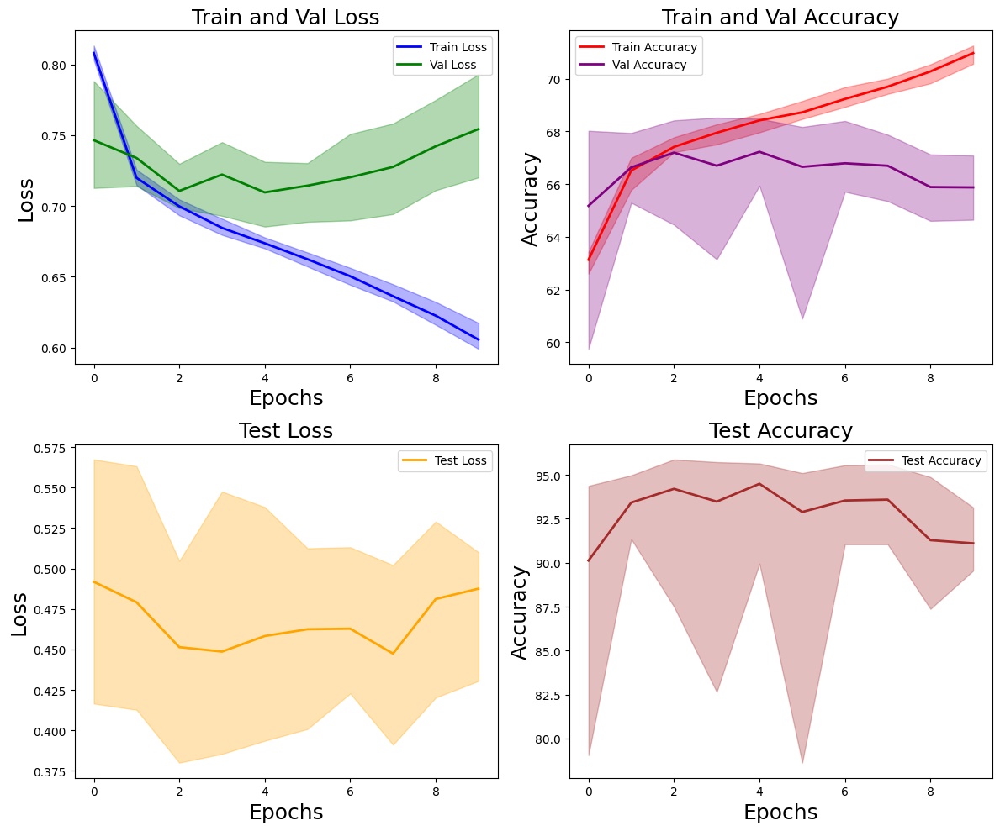

Data saved to baseline_f3_resnet.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=0.0005,
    batch_size=128,
    num_epochs=10,
    times=10,
    method='baseline',
    T_matrix=T_matrix,
    model_name='resnet',
    csv_path='baseline_f3_resnet.csv'
)

resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 139.89it/s]


Noisy Loss: 1.1290,Validation Loss: 0.7073, Accuracy: 66.96% (3214/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.04it/s]


Test Loss: 0.1732, Accuracy: 94.60% (3784/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 130.88it/s]


Noisy Loss: 1.1266,Validation Loss: 0.6995, Accuracy: 67.33% (3232/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.41it/s]


Test Loss: 0.1547, Accuracy: 94.80% (3792/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 135.46it/s]


Noisy Loss: 1.1259,Validation Loss: 0.7025, Accuracy: 67.35% (3233/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.38it/s]


Test Loss: 0.1654, Accuracy: 94.70% (3788/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 130.36it/s]


Noisy Loss: 1.1214,Validation Loss: 0.6873, Accuracy: 67.69% (3249/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.69it/s]


Test Loss: 0.1278, Accuracy: 95.80% (3832/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 141.37it/s]


Noisy Loss: 1.1267,Validation Loss: 0.6953, Accuracy: 67.52% (3241/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.13it/s]


Test Loss: 0.1410, Accuracy: 95.70% (3828/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 133.40it/s]


Noisy Loss: 1.1201,Validation Loss: 0.6849, Accuracy: 67.90% (3259/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.48it/s]


Test Loss: 0.1329, Accuracy: 95.70% (3828/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.62it/s]


Noisy Loss: 1.1190,Validation Loss: 0.6808, Accuracy: 68.04% (3266/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.97it/s]


Test Loss: 0.1292, Accuracy: 96.00% (3840/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 137.86it/s]


Noisy Loss: 1.1215,Validation Loss: 0.7014, Accuracy: 67.65% (3247/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.59it/s]


Test Loss: 0.1443, Accuracy: 95.75% (3830/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 140.68it/s]


Noisy Loss: 1.1173,Validation Loss: 0.6814, Accuracy: 67.96% (3262/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.71it/s]


Test Loss: 0.1222, Accuracy: 96.05% (3842/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.62it/s]


Noisy Loss: 1.1192,Validation Loss: 0.6828, Accuracy: 67.73% (3251/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.61it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.1275, Accuracy: 95.60% (3824/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.66it/s]


Test Loss: 0.1292, Accuracy: 96.00% (3840/4000)
finished  1  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 141.65it/s]


Noisy Loss: 1.1265,Validation Loss: 0.7115, Accuracy: 67.00% (3216/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.82it/s]


Test Loss: 0.1644, Accuracy: 95.05% (3802/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 128.95it/s]


Noisy Loss: 1.1284,Validation Loss: 0.7035, Accuracy: 67.08% (3220/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.96it/s]


Test Loss: 0.1461, Accuracy: 95.12% (3805/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 135.71it/s]


Noisy Loss: 1.1234,Validation Loss: 0.7003, Accuracy: 67.48% (3239/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.90it/s]


Test Loss: 0.1434, Accuracy: 95.80% (3832/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 133.23it/s]


Noisy Loss: 1.1220,Validation Loss: 0.6997, Accuracy: 67.44% (3237/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.23it/s]


Test Loss: 0.1234, Accuracy: 95.95% (3838/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 124.19it/s]


Noisy Loss: 1.1219,Validation Loss: 0.7001, Accuracy: 67.54% (3242/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.32it/s]


Test Loss: 0.1277, Accuracy: 95.90% (3836/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 136.81it/s]


Noisy Loss: 1.1231,Validation Loss: 0.7008, Accuracy: 67.50% (3240/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.46it/s]


Test Loss: 0.1341, Accuracy: 95.72% (3829/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 129.60it/s]


Noisy Loss: 1.1224,Validation Loss: 0.7004, Accuracy: 67.75% (3252/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.97it/s]


Test Loss: 0.1391, Accuracy: 95.60% (3824/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 126.71it/s]


Noisy Loss: 1.1204,Validation Loss: 0.6954, Accuracy: 67.71% (3250/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.30it/s]


Test Loss: 0.1154, Accuracy: 96.20% (3848/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 142.22it/s]


Noisy Loss: 1.1205,Validation Loss: 0.6916, Accuracy: 67.67% (3248/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.67it/s]


Test Loss: 0.1200, Accuracy: 96.38% (3855/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 139.18it/s]


Noisy Loss: 1.1213,Validation Loss: 0.7065, Accuracy: 67.52% (3241/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.17it/s]


Test Loss: 0.1649, Accuracy: 95.03% (3801/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.37it/s]


Test Loss: 0.1200, Accuracy: 96.38% (3855/4000)
finished  2  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 134.47it/s]


Noisy Loss: 1.1278,Validation Loss: 0.7079, Accuracy: 67.40% (3235/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.42it/s]


Test Loss: 0.1673, Accuracy: 94.70% (3788/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 138.71it/s]


Noisy Loss: 1.1238,Validation Loss: 0.6912, Accuracy: 67.52% (3241/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.02it/s]


Test Loss: 0.1424, Accuracy: 95.47% (3819/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 127.41it/s]


Noisy Loss: 1.1227,Validation Loss: 0.6931, Accuracy: 67.60% (3245/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.25it/s]


Test Loss: 0.1406, Accuracy: 95.20% (3808/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 137.40it/s]


Noisy Loss: 1.1242,Validation Loss: 0.6874, Accuracy: 67.42% (3236/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.91it/s]


Test Loss: 0.1306, Accuracy: 95.88% (3835/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 140.60it/s]


Noisy Loss: 1.1212,Validation Loss: 0.6896, Accuracy: 67.71% (3250/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.65it/s]


Test Loss: 0.1303, Accuracy: 95.88% (3835/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 141.24it/s]


Noisy Loss: 1.1202,Validation Loss: 0.6876, Accuracy: 67.56% (3243/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.25it/s]


Test Loss: 0.1203, Accuracy: 96.22% (3849/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 130.12it/s]


Noisy Loss: 1.1213,Validation Loss: 0.7005, Accuracy: 67.62% (3246/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.29it/s]


Test Loss: 0.1439, Accuracy: 95.92% (3837/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 129.56it/s]


Noisy Loss: 1.1216,Validation Loss: 0.6821, Accuracy: 67.79% (3254/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.57it/s]


Test Loss: 0.1182, Accuracy: 96.15% (3846/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 137.01it/s]


Noisy Loss: 1.1223,Validation Loss: 0.6915, Accuracy: 67.56% (3243/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.79it/s]


Test Loss: 0.1366, Accuracy: 95.58% (3823/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 136.52it/s]


Noisy Loss: 1.1203,Validation Loss: 0.6831, Accuracy: 67.81% (3255/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.18it/s]


Test Loss: 0.1236, Accuracy: 96.30% (3852/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.82it/s]


Test Loss: 0.1182, Accuracy: 96.15% (3846/4000)
finished  3  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 137.20it/s]


Noisy Loss: 1.1267,Validation Loss: 0.7168, Accuracy: 67.88% (3258/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.08it/s]


Test Loss: 0.1913, Accuracy: 93.83% (3753/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 134.02it/s]


Noisy Loss: 1.1225,Validation Loss: 0.6900, Accuracy: 68.62% (3294/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.19it/s]


Test Loss: 0.1439, Accuracy: 95.45% (3818/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.18it/s]


Noisy Loss: 1.1172,Validation Loss: 0.6832, Accuracy: 69.04% (3314/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.21it/s]


Test Loss: 0.1293, Accuracy: 95.38% (3815/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 140.43it/s]


Noisy Loss: 1.1175,Validation Loss: 0.6848, Accuracy: 68.90% (3307/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.59it/s]


Test Loss: 0.1331, Accuracy: 95.50% (3820/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 134.99it/s]


Noisy Loss: 1.1151,Validation Loss: 0.6799, Accuracy: 68.75% (3300/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.01it/s]


Test Loss: 0.1281, Accuracy: 96.00% (3840/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 142.44it/s]


Noisy Loss: 1.1138,Validation Loss: 0.6771, Accuracy: 69.10% (3317/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.00it/s]


Test Loss: 0.1197, Accuracy: 96.38% (3855/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 136.53it/s]


Noisy Loss: 1.1155,Validation Loss: 0.6755, Accuracy: 69.02% (3313/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.99it/s]


Test Loss: 0.1212, Accuracy: 96.15% (3846/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 138.33it/s]


Noisy Loss: 1.1144,Validation Loss: 0.6855, Accuracy: 68.88% (3306/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.19it/s]


Test Loss: 0.1321, Accuracy: 95.83% (3833/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 136.11it/s]


Noisy Loss: 1.1156,Validation Loss: 0.6798, Accuracy: 68.96% (3310/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.29it/s]


Test Loss: 0.1292, Accuracy: 96.00% (3840/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 129.42it/s]


Noisy Loss: 1.1170,Validation Loss: 0.6918, Accuracy: 68.50% (3288/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.02it/s]


Test Loss: 0.1420, Accuracy: 95.88% (3835/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.03it/s]


Test Loss: 0.1212, Accuracy: 96.15% (3846/4000)
finished  4  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 133.45it/s]


Noisy Loss: 1.1357,Validation Loss: 0.7205, Accuracy: 66.10% (3173/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.77it/s]


Test Loss: 0.1822, Accuracy: 94.10% (3764/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 129.68it/s]


Noisy Loss: 1.1379,Validation Loss: 0.7243, Accuracy: 66.27% (3181/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.07it/s]


Test Loss: 0.2158, Accuracy: 93.12% (3725/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 140.90it/s]


Noisy Loss: 1.1263,Validation Loss: 0.7065, Accuracy: 66.77% (3205/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.64it/s]


Test Loss: 0.1551, Accuracy: 94.67% (3787/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 140.61it/s]


Noisy Loss: 1.1225,Validation Loss: 0.6905, Accuracy: 67.33% (3232/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.59it/s]


Test Loss: 0.1313, Accuracy: 95.97% (3839/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 142.58it/s]


Noisy Loss: 1.1243,Validation Loss: 0.6993, Accuracy: 67.23% (3227/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.76it/s]


Test Loss: 0.1413, Accuracy: 95.38% (3815/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 137.33it/s]


Noisy Loss: 1.1273,Validation Loss: 0.7003, Accuracy: 67.04% (3218/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.05it/s]


Test Loss: 0.1383, Accuracy: 95.83% (3833/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.10it/s]


Noisy Loss: 1.1210,Validation Loss: 0.6860, Accuracy: 67.62% (3246/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.11it/s]


Test Loss: 0.1252, Accuracy: 95.92% (3837/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 137.73it/s]


Noisy Loss: 1.1234,Validation Loss: 0.6932, Accuracy: 67.10% (3221/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.03it/s]


Test Loss: 0.1276, Accuracy: 95.75% (3830/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 133.29it/s]


Noisy Loss: 1.1197,Validation Loss: 0.6852, Accuracy: 67.67% (3248/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.26it/s]


Test Loss: 0.1189, Accuracy: 96.58% (3863/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 126.52it/s]


Noisy Loss: 1.1244,Validation Loss: 0.7045, Accuracy: 67.00% (3216/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.70it/s]


Test Loss: 0.1566, Accuracy: 95.38% (3815/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.56it/s]


Test Loss: 0.1189, Accuracy: 96.58% (3863/4000)
finished  5  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 137.82it/s]


Noisy Loss: 1.1599,Validation Loss: 0.8045, Accuracy: 63.52% (3049/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.27it/s]


Test Loss: 0.3577, Accuracy: 87.35% (3494/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 138.27it/s]


Noisy Loss: 1.1241,Validation Loss: 0.7041, Accuracy: 67.90% (3259/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.08it/s]


Test Loss: 0.1557, Accuracy: 95.28% (3811/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 144.36it/s]


Noisy Loss: 1.1255,Validation Loss: 0.7038, Accuracy: 67.65% (3247/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.35it/s]


Test Loss: 0.1588, Accuracy: 94.92% (3797/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 141.55it/s]


Noisy Loss: 1.1215,Validation Loss: 0.7043, Accuracy: 67.96% (3262/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.96it/s]


Test Loss: 0.1465, Accuracy: 95.33% (3813/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 137.47it/s]


Noisy Loss: 1.1201,Validation Loss: 0.6907, Accuracy: 68.10% (3269/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.97it/s]


Test Loss: 0.1245, Accuracy: 96.10% (3844/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 132.23it/s]


Noisy Loss: 1.1195,Validation Loss: 0.6904, Accuracy: 68.08% (3268/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.37it/s]


Test Loss: 0.1222, Accuracy: 96.08% (3843/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 138.39it/s]


Noisy Loss: 1.1199,Validation Loss: 0.6885, Accuracy: 68.52% (3289/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.52it/s]


Test Loss: 0.1191, Accuracy: 96.12% (3845/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 138.39it/s]


Noisy Loss: 1.1191,Validation Loss: 0.6882, Accuracy: 68.29% (3278/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.04it/s]


Test Loss: 0.1191, Accuracy: 96.20% (3848/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 134.56it/s]


Noisy Loss: 1.1197,Validation Loss: 0.6919, Accuracy: 68.04% (3266/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.30it/s]


Test Loss: 0.1364, Accuracy: 95.80% (3832/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 133.14it/s]


Noisy Loss: 1.1247,Validation Loss: 0.7183, Accuracy: 67.46% (3238/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.10it/s]


Test Loss: 0.1629, Accuracy: 95.05% (3802/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.52it/s]


Test Loss: 0.1191, Accuracy: 96.20% (3848/4000)
finished  6  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 126.83it/s]


Noisy Loss: 1.1360,Validation Loss: 0.7308, Accuracy: 66.38% (3186/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.65it/s]


Test Loss: 0.1920, Accuracy: 93.90% (3756/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 123.89it/s]


Noisy Loss: 1.1250,Validation Loss: 0.7111, Accuracy: 67.33% (3232/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.37it/s]


Test Loss: 0.1656, Accuracy: 95.00% (3800/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 139.11it/s]


Noisy Loss: 1.1270,Validation Loss: 0.6967, Accuracy: 67.31% (3231/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.72it/s]


Test Loss: 0.1507, Accuracy: 95.33% (3813/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 134.64it/s]


Noisy Loss: 1.1205,Validation Loss: 0.6897, Accuracy: 67.71% (3250/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.79it/s]


Test Loss: 0.1365, Accuracy: 95.67% (3827/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 133.38it/s]


Noisy Loss: 1.1211,Validation Loss: 0.6879, Accuracy: 67.50% (3240/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.38it/s]


Test Loss: 0.1303, Accuracy: 96.08% (3843/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 127.78it/s]


Noisy Loss: 1.1205,Validation Loss: 0.6819, Accuracy: 67.77% (3253/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.23it/s]


Test Loss: 0.1159, Accuracy: 96.00% (3840/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 124.65it/s]


Noisy Loss: 1.1242,Validation Loss: 0.7035, Accuracy: 67.21% (3226/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.80it/s]


Test Loss: 0.1304, Accuracy: 95.90% (3836/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 137.41it/s]


Noisy Loss: 1.1228,Validation Loss: 0.6919, Accuracy: 67.40% (3235/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.76it/s]


Test Loss: 0.1365, Accuracy: 95.60% (3824/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 134.82it/s]


Noisy Loss: 1.1176,Validation Loss: 0.6805, Accuracy: 68.08% (3268/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.21it/s]


Test Loss: 0.1213, Accuracy: 96.28% (3851/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 132.02it/s]


Noisy Loss: 1.1238,Validation Loss: 0.6876, Accuracy: 67.50% (3240/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.84it/s]


Test Loss: 0.1529, Accuracy: 95.12% (3805/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.91it/s]


Test Loss: 0.1213, Accuracy: 96.28% (3851/4000)
finished  7  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 132.47it/s]


Noisy Loss: 1.1308,Validation Loss: 0.7104, Accuracy: 67.31% (3231/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.31it/s]


Test Loss: 0.1963, Accuracy: 93.83% (3753/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 122.46it/s]


Noisy Loss: 1.1273,Validation Loss: 0.6926, Accuracy: 67.83% (3256/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.13it/s]


Test Loss: 0.1531, Accuracy: 94.88% (3795/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 130.68it/s]


Noisy Loss: 1.1239,Validation Loss: 0.6887, Accuracy: 67.92% (3260/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.77it/s]


Test Loss: 0.1561, Accuracy: 94.97% (3799/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 132.71it/s]


Noisy Loss: 1.1206,Validation Loss: 0.6885, Accuracy: 68.02% (3265/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.96it/s]


Test Loss: 0.1446, Accuracy: 95.17% (3807/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 134.61it/s]


Noisy Loss: 1.1190,Validation Loss: 0.6816, Accuracy: 68.04% (3266/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.13it/s]


Test Loss: 0.1386, Accuracy: 95.17% (3807/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 139.88it/s]


Noisy Loss: 1.1189,Validation Loss: 0.6776, Accuracy: 68.52% (3289/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.72it/s]


Test Loss: 0.1267, Accuracy: 96.08% (3843/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 136.91it/s]


Noisy Loss: 1.1188,Validation Loss: 0.6791, Accuracy: 68.38% (3282/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.90it/s]


Test Loss: 0.1313, Accuracy: 96.00% (3840/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 124.75it/s]


Noisy Loss: 1.1197,Validation Loss: 0.6842, Accuracy: 68.25% (3276/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.51it/s]


Test Loss: 0.1409, Accuracy: 95.67% (3827/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 133.86it/s]


Noisy Loss: 1.1188,Validation Loss: 0.6756, Accuracy: 68.56% (3291/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.45it/s]


Test Loss: 0.1391, Accuracy: 95.62% (3825/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 132.80it/s]


Noisy Loss: 1.1195,Validation Loss: 0.6885, Accuracy: 67.92% (3260/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.86it/s]


Test Loss: 0.1668, Accuracy: 95.25% (3810/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.00it/s]


Test Loss: 0.1391, Accuracy: 95.62% (3825/4000)
finished  8  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 133.94it/s]


Noisy Loss: 1.1243,Validation Loss: 0.6941, Accuracy: 67.83% (3256/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.62it/s]


Test Loss: 0.1568, Accuracy: 94.65% (3786/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 135.95it/s]


Noisy Loss: 1.1209,Validation Loss: 0.6851, Accuracy: 68.02% (3265/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.08it/s]


Test Loss: 0.1384, Accuracy: 95.53% (3821/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 137.18it/s]


Noisy Loss: 1.1191,Validation Loss: 0.6808, Accuracy: 68.23% (3275/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.03it/s]


Test Loss: 0.1282, Accuracy: 95.62% (3825/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 129.76it/s]


Noisy Loss: 1.1184,Validation Loss: 0.6844, Accuracy: 68.25% (3276/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.82it/s]


Test Loss: 0.1289, Accuracy: 95.97% (3839/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 133.40it/s]


Noisy Loss: 1.1184,Validation Loss: 0.6795, Accuracy: 68.33% (3280/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.91it/s]


Test Loss: 0.1256, Accuracy: 96.05% (3842/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 139.79it/s]


Noisy Loss: 1.1190,Validation Loss: 0.6837, Accuracy: 67.92% (3260/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.90it/s]


Test Loss: 0.1499, Accuracy: 95.33% (3813/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 135.38it/s]


Noisy Loss: 1.1194,Validation Loss: 0.6848, Accuracy: 68.00% (3264/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.81it/s]


Test Loss: 0.1400, Accuracy: 95.62% (3825/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.70it/s]


Noisy Loss: 1.1186,Validation Loss: 0.6804, Accuracy: 68.15% (3271/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.94it/s]


Test Loss: 0.1215, Accuracy: 95.92% (3837/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 129.98it/s]


Noisy Loss: 1.1161,Validation Loss: 0.6769, Accuracy: 68.44% (3285/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.89it/s]


Test Loss: 0.1176, Accuracy: 96.33% (3853/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 132.01it/s]


Noisy Loss: 1.1209,Validation Loss: 0.6976, Accuracy: 67.77% (3253/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.58it/s]


Test Loss: 0.1573, Accuracy: 95.42% (3817/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.06it/s]


Test Loss: 0.1176, Accuracy: 96.33% (3853/4000)
finished  9  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 126.69it/s]


Noisy Loss: 1.1327,Validation Loss: 0.7365, Accuracy: 66.02% (3169/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.98it/s]


Test Loss: 0.1792, Accuracy: 94.67% (3787/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 138.72it/s]


Noisy Loss: 1.1243,Validation Loss: 0.6971, Accuracy: 67.08% (3220/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.50it/s]


Test Loss: 0.1319, Accuracy: 95.72% (3829/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 141.12it/s]


Noisy Loss: 1.1246,Validation Loss: 0.6903, Accuracy: 66.83% (3208/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.54it/s]


Test Loss: 0.1222, Accuracy: 95.85% (3834/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 125.54it/s]


Noisy Loss: 1.1250,Validation Loss: 0.6925, Accuracy: 67.00% (3216/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.97it/s]


Test Loss: 0.1266, Accuracy: 96.00% (3840/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 134.71it/s]


Noisy Loss: 1.1204,Validation Loss: 0.6854, Accuracy: 67.40% (3235/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.76it/s]


Test Loss: 0.1171, Accuracy: 96.12% (3845/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 133.87it/s]


Noisy Loss: 1.1245,Validation Loss: 0.7004, Accuracy: 66.69% (3201/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.97it/s]


Test Loss: 0.1345, Accuracy: 95.53% (3821/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 141.11it/s]


Noisy Loss: 1.1224,Validation Loss: 0.6889, Accuracy: 67.12% (3222/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.68it/s]


Test Loss: 0.1228, Accuracy: 96.15% (3846/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 130.01it/s]


Noisy Loss: 1.1229,Validation Loss: 0.6864, Accuracy: 67.29% (3230/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.14it/s]


Test Loss: 0.1180, Accuracy: 96.00% (3840/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 130.97it/s]


Noisy Loss: 1.1244,Validation Loss: 0.6973, Accuracy: 66.71% (3202/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.04it/s]


Test Loss: 0.1391, Accuracy: 95.55% (3822/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 134.85it/s]


Noisy Loss: 1.1318,Validation Loss: 0.7416, Accuracy: 66.35% (3185/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.09it/s]


Test Loss: 0.1789, Accuracy: 94.50% (3780/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.17it/s]


Test Loss: 0.1171, Accuracy: 96.12% (3845/4000)
finished  10  epoch
min_train_loss [0.6736835577587287, 0.6594682222108046, 0.6701783959567547, 0.6740478978057702, 0.665495240141948, 0.6696583651999632, 0.6666335429747899, 0.6655157225330671, 0.6618091810246308, 0.6787920946876208]
min_val_loss [0.6807965658108394, 0.6915845628579458, 0.6821303464969, 0.6755145998795827, 0.6851700520515442, 0.6881595520178477, 0.6805448389053345, 0.6756134128570557, 0.6769307227929433, 0.6853608649969101]
min_train_accuracy [68.41145833333333, 68.75520833333333, 68.46354166666667, 68.078125, 68.67708333333333, 68.48958333333333, 68.54166666666667, 68.390625, 68.74479166666667, 68.36458333333333]
min_val_accuracy [68.04166666666667, 67.66666666666667, 67.79166666666667, 69.02083333333333, 67.66666666666667, 68.29166666666667, 68.08333333333333, 68.5625, 68.4375, 67.39583333333333]
min_train_noise_loss [1.1179834642012914, 1.1139816904067994, 1.1172475345929465, 1.1186390141646068, 1.1157099773486456, 1.

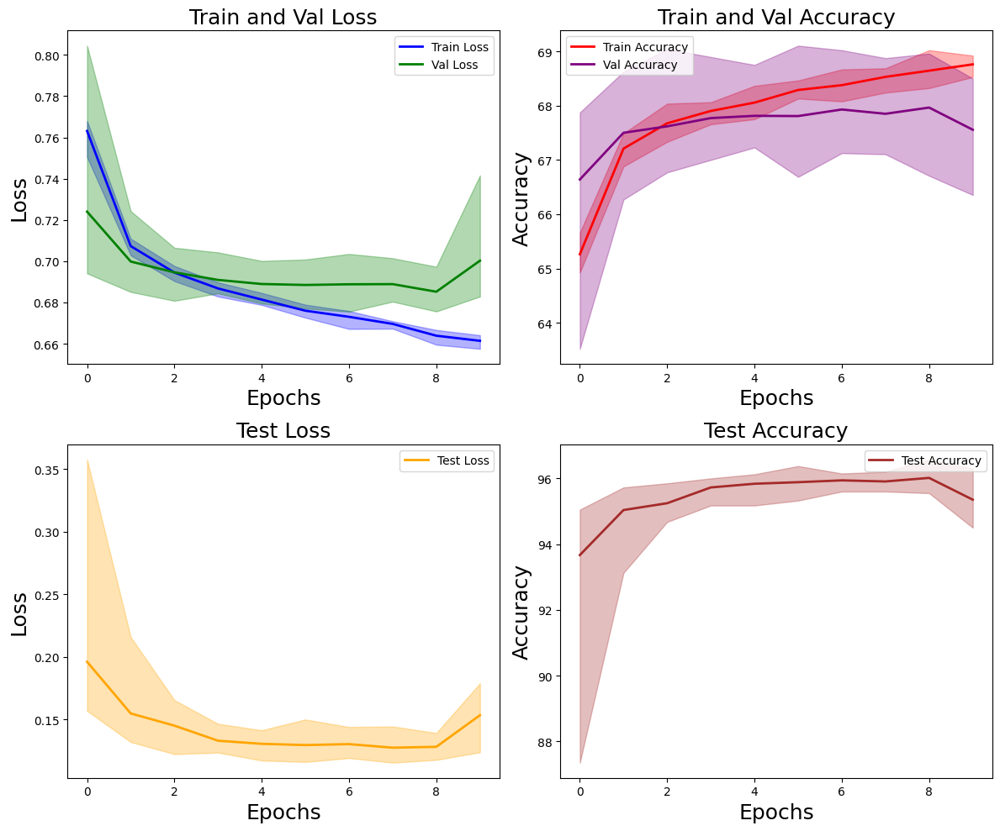

Data saved to forward_f3_resnet.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=0.0005,
    batch_size=32,
    num_epochs=10,
    times=10,
    method='forward',
    T_matrix=T_matrix,
    model_name='resnet',
    csv_path='forward_f3_resnet.csv'
)

resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.90it/s]


Noisy Loss: 1.1297,Validation Loss: 0.2061, Accuracy: 67.90% (3259/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.78it/s]


Test Loss: 0.1990, Accuracy: 93.40% (3736/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.12it/s]


Noisy Loss: 1.1242,Validation Loss: 0.1556, Accuracy: 68.04% (3266/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.76it/s]


Test Loss: 0.1858, Accuracy: 94.08% (3763/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.11it/s]


Noisy Loss: 1.1203,Validation Loss: 0.1536, Accuracy: 68.52% (3289/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.73it/s]


Test Loss: 0.1501, Accuracy: 95.35% (3814/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.66it/s]


Noisy Loss: 1.1282,Validation Loss: 0.1559, Accuracy: 67.35% (3233/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.95it/s]


Test Loss: 0.2030, Accuracy: 92.90% (3716/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.41it/s]


Noisy Loss: 1.1202,Validation Loss: 0.1470, Accuracy: 68.62% (3294/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.53it/s]


Test Loss: 0.1452, Accuracy: 95.47% (3819/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.16it/s]


Noisy Loss: 1.1169,Validation Loss: 0.1225, Accuracy: 68.69% (3297/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.76it/s]


Test Loss: 0.1272, Accuracy: 95.83% (3833/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 66.70it/s]


Noisy Loss: 1.1193,Validation Loss: 0.1380, Accuracy: 68.77% (3301/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.06it/s]


Test Loss: 0.1333, Accuracy: 95.35% (3814/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.54it/s]


Noisy Loss: 1.1189,Validation Loss: 0.1450, Accuracy: 68.56% (3291/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.85it/s]


Test Loss: 0.1443, Accuracy: 95.40% (3816/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.78it/s]


Noisy Loss: 1.1262,Validation Loss: 0.1434, Accuracy: 68.17% (3272/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.15it/s]


Test Loss: 0.1554, Accuracy: 95.20% (3808/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.71it/s]


Noisy Loss: 1.1185,Validation Loss: 0.1389, Accuracy: 68.81% (3303/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.55it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.1404, Accuracy: 95.33% (3813/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.60it/s]


Test Loss: 0.1272, Accuracy: 95.83% (3833/4000)
finished  1  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 65.81it/s]


Noisy Loss: 1.1350,Validation Loss: 0.1901, Accuracy: 66.33% (3184/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.57it/s]


Test Loss: 0.2141, Accuracy: 93.12% (3725/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.66it/s]


Noisy Loss: 1.1313,Validation Loss: 0.1946, Accuracy: 67.29% (3230/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.62it/s]


Test Loss: 0.1638, Accuracy: 94.90% (3796/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.89it/s]


Noisy Loss: 1.1258,Validation Loss: 0.1434, Accuracy: 67.56% (3243/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.44it/s]


Test Loss: 0.1622, Accuracy: 94.55% (3782/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.11it/s]


Noisy Loss: 1.1244,Validation Loss: 0.1451, Accuracy: 67.92% (3260/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.05it/s]


Test Loss: 0.1378, Accuracy: 95.25% (3810/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.76it/s]


Noisy Loss: 1.1399,Validation Loss: 0.1939, Accuracy: 66.27% (3181/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.75it/s]


Test Loss: 0.2043, Accuracy: 93.10% (3724/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.28it/s]


Noisy Loss: 1.1219,Validation Loss: 0.1409, Accuracy: 67.73% (3251/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.82it/s]


Test Loss: 0.1297, Accuracy: 96.08% (3843/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.97it/s]


Noisy Loss: 1.1245,Validation Loss: 0.1419, Accuracy: 67.69% (3249/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.72it/s]


Test Loss: 0.1341, Accuracy: 95.78% (3831/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.63it/s]


Noisy Loss: 1.1201,Validation Loss: 0.1254, Accuracy: 67.98% (3263/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.25it/s]


Test Loss: 0.1181, Accuracy: 96.55% (3862/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.72it/s]


Noisy Loss: 1.1216,Validation Loss: 0.1276, Accuracy: 67.73% (3251/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.02it/s]


Test Loss: 0.1234, Accuracy: 96.08% (3843/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.97it/s]


Noisy Loss: 1.1236,Validation Loss: 0.1552, Accuracy: 67.71% (3250/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.09it/s]


Test Loss: 0.1328, Accuracy: 96.05% (3842/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.84it/s]


Test Loss: 0.1181, Accuracy: 96.55% (3862/4000)
finished  2  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.56it/s]


Noisy Loss: 1.1288,Validation Loss: 0.1739, Accuracy: 67.40% (3235/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.93it/s]


Test Loss: 0.1832, Accuracy: 94.20% (3768/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.84it/s]


Noisy Loss: 1.1229,Validation Loss: 0.1529, Accuracy: 68.27% (3277/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.43it/s]


Test Loss: 0.1587, Accuracy: 95.22% (3809/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.09it/s]


Noisy Loss: 1.1219,Validation Loss: 0.1482, Accuracy: 68.17% (3272/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.67it/s]


Test Loss: 0.1450, Accuracy: 95.53% (3821/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.51it/s]


Noisy Loss: 1.1194,Validation Loss: 0.1328, Accuracy: 68.50% (3288/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.28it/s]


Test Loss: 0.1393, Accuracy: 95.58% (3823/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.02it/s]


Noisy Loss: 1.1161,Validation Loss: 0.1235, Accuracy: 68.83% (3304/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.31it/s]


Test Loss: 0.1414, Accuracy: 95.38% (3815/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.94it/s]


Noisy Loss: 1.1322,Validation Loss: 0.1873, Accuracy: 67.21% (3226/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.57it/s]


Test Loss: 0.2066, Accuracy: 93.00% (3720/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.71it/s]


Noisy Loss: 1.1177,Validation Loss: 0.1251, Accuracy: 68.54% (3290/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.00it/s]


Test Loss: 0.1371, Accuracy: 95.53% (3821/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.08it/s]


Noisy Loss: 1.1177,Validation Loss: 0.1161, Accuracy: 68.46% (3286/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.92it/s]


Test Loss: 0.1367, Accuracy: 95.58% (3823/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.69it/s]


Noisy Loss: 1.1173,Validation Loss: 0.1265, Accuracy: 68.90% (3307/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.39it/s]


Test Loss: 0.1378, Accuracy: 95.85% (3834/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.74it/s]


Noisy Loss: 1.1191,Validation Loss: 0.1271, Accuracy: 68.56% (3291/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.19it/s]


Test Loss: 0.1500, Accuracy: 95.30% (3812/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.22it/s]


Test Loss: 0.1367, Accuracy: 95.58% (3823/4000)
finished  3  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.09it/s]


Noisy Loss: 1.1292,Validation Loss: 0.1645, Accuracy: 66.62% (3198/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.81it/s]


Test Loss: 0.1947, Accuracy: 93.53% (3741/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.21it/s]


Noisy Loss: 1.1326,Validation Loss: 0.1959, Accuracy: 67.02% (3217/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.89it/s]


Test Loss: 0.1994, Accuracy: 93.67% (3747/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.24it/s]


Noisy Loss: 1.1222,Validation Loss: 0.1227, Accuracy: 67.94% (3261/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.85it/s]


Test Loss: 0.1423, Accuracy: 95.30% (3812/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.07it/s]


Noisy Loss: 1.1256,Validation Loss: 0.1530, Accuracy: 67.88% (3258/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.45it/s]


Test Loss: 0.1531, Accuracy: 95.00% (3800/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.58it/s]


Noisy Loss: 1.1196,Validation Loss: 0.1128, Accuracy: 67.90% (3259/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.82it/s]


Test Loss: 0.1374, Accuracy: 95.78% (3831/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.85it/s]


Noisy Loss: 1.1192,Validation Loss: 0.1193, Accuracy: 68.10% (3269/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.85it/s]


Test Loss: 0.1278, Accuracy: 95.95% (3838/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.50it/s]


Noisy Loss: 1.1196,Validation Loss: 0.1355, Accuracy: 68.40% (3283/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.82it/s]


Test Loss: 0.1326, Accuracy: 95.72% (3829/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 65.93it/s]


Noisy Loss: 1.1301,Validation Loss: 0.1930, Accuracy: 66.73% (3203/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.75it/s]


Test Loss: 0.1820, Accuracy: 94.47% (3779/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.03it/s]


Noisy Loss: 1.1228,Validation Loss: 0.1528, Accuracy: 67.90% (3259/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.97it/s]


Test Loss: 0.1598, Accuracy: 94.95% (3798/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.65it/s]


Noisy Loss: 1.1244,Validation Loss: 0.1476, Accuracy: 67.71% (3250/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.57it/s]


Test Loss: 0.1720, Accuracy: 94.15% (3766/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.97it/s]


Test Loss: 0.1374, Accuracy: 95.78% (3831/4000)
finished  4  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 63.40it/s]


Noisy Loss: 1.1433,Validation Loss: 0.2424, Accuracy: 65.58% (3148/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.23it/s]


Test Loss: 0.2466, Accuracy: 91.70% (3668/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 65.99it/s]


Noisy Loss: 1.1272,Validation Loss: 0.1503, Accuracy: 67.81% (3255/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.64it/s]


Test Loss: 0.1596, Accuracy: 94.55% (3782/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.08it/s]


Noisy Loss: 1.1546,Validation Loss: 0.2365, Accuracy: 63.65% (3055/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.73it/s]


Test Loss: 0.3103, Accuracy: 88.75% (3550/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.69it/s]


Noisy Loss: 1.1275,Validation Loss: 0.1377, Accuracy: 67.56% (3243/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.68it/s]


Test Loss: 0.1653, Accuracy: 94.60% (3784/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 66.56it/s]


Noisy Loss: 1.1208,Validation Loss: 0.1261, Accuracy: 67.85% (3257/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.31it/s]


Test Loss: 0.1346, Accuracy: 96.00% (3840/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.63it/s]


Noisy Loss: 1.1262,Validation Loss: 0.1353, Accuracy: 67.23% (3227/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.32it/s]


Test Loss: 0.1642, Accuracy: 94.45% (3778/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.73it/s]


Noisy Loss: 1.1192,Validation Loss: 0.1008, Accuracy: 67.75% (3252/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.23it/s]


Test Loss: 0.1365, Accuracy: 95.55% (3822/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.78it/s]


Noisy Loss: 1.1235,Validation Loss: 0.1485, Accuracy: 67.67% (3248/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.57it/s]


Test Loss: 0.1401, Accuracy: 95.62% (3825/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.24it/s]


Noisy Loss: 1.1214,Validation Loss: 0.1133, Accuracy: 67.77% (3253/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.40it/s]


Test Loss: 0.1425, Accuracy: 95.60% (3824/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.21it/s]


Noisy Loss: 1.1197,Validation Loss: 0.1107, Accuracy: 67.77% (3253/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.82it/s]


Test Loss: 0.1357, Accuracy: 95.75% (3830/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.19it/s]


Test Loss: 0.1365, Accuracy: 95.55% (3822/4000)
finished  5  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.55it/s]


Noisy Loss: 1.1304,Validation Loss: 0.1578, Accuracy: 66.73% (3203/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.49it/s]


Test Loss: 0.1843, Accuracy: 93.50% (3740/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.58it/s]


Noisy Loss: 1.1254,Validation Loss: 0.1236, Accuracy: 67.00% (3216/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.76it/s]


Test Loss: 0.1489, Accuracy: 94.92% (3797/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.88it/s]


Noisy Loss: 1.1256,Validation Loss: 0.1206, Accuracy: 67.40% (3235/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.05it/s]


Test Loss: 0.1405, Accuracy: 95.33% (3813/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.63it/s]


Noisy Loss: 1.1240,Validation Loss: 0.1292, Accuracy: 67.46% (3238/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.76it/s]


Test Loss: 0.1340, Accuracy: 95.85% (3834/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.61it/s]


Noisy Loss: 1.1282,Validation Loss: 0.1384, Accuracy: 67.00% (3216/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.39it/s]


Test Loss: 0.1673, Accuracy: 94.62% (3785/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.21it/s]


Noisy Loss: 1.1246,Validation Loss: 0.1229, Accuracy: 67.50% (3240/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.63it/s]


Test Loss: 0.1361, Accuracy: 95.47% (3819/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.58it/s]


Noisy Loss: 1.1290,Validation Loss: 0.1483, Accuracy: 67.06% (3219/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.87it/s]


Test Loss: 0.1693, Accuracy: 94.15% (3766/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.09it/s]


Noisy Loss: 1.1227,Validation Loss: 0.1306, Accuracy: 67.42% (3236/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.34it/s]


Test Loss: 0.1369, Accuracy: 95.72% (3829/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.11it/s]


Noisy Loss: 1.1229,Validation Loss: 0.1203, Accuracy: 67.31% (3231/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.32it/s]


Test Loss: 0.1450, Accuracy: 95.65% (3826/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.92it/s]


Noisy Loss: 1.1214,Validation Loss: 0.1152, Accuracy: 67.58% (3244/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.64it/s]


Test Loss: 0.1292, Accuracy: 96.28% (3851/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.95it/s]


Test Loss: 0.1292, Accuracy: 96.28% (3851/4000)
finished  6  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.49it/s]


Noisy Loss: 1.1283,Validation Loss: 0.1489, Accuracy: 67.21% (3226/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.66it/s]


Test Loss: 0.1919, Accuracy: 93.12% (3725/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.60it/s]


Noisy Loss: 1.1267,Validation Loss: 0.1602, Accuracy: 67.69% (3249/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.41it/s]


Test Loss: 0.1795, Accuracy: 93.90% (3756/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.78it/s]


Noisy Loss: 1.1300,Validation Loss: 0.1767, Accuracy: 67.48% (3239/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.10it/s]


Test Loss: 0.2078, Accuracy: 93.50% (3740/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.60it/s]


Noisy Loss: 1.1258,Validation Loss: 0.1772, Accuracy: 68.06% (3267/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.57it/s]


Test Loss: 0.1490, Accuracy: 94.95% (3798/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.77it/s]


Noisy Loss: 1.1185,Validation Loss: 0.1282, Accuracy: 68.44% (3285/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.08it/s]


Test Loss: 0.1386, Accuracy: 95.55% (3822/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 64.63it/s]


Noisy Loss: 1.1179,Validation Loss: 0.1144, Accuracy: 68.65% (3295/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.57it/s]


Test Loss: 0.1412, Accuracy: 95.50% (3820/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.22it/s]


Noisy Loss: 1.1211,Validation Loss: 0.1490, Accuracy: 68.31% (3279/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.57it/s]


Test Loss: 0.1321, Accuracy: 95.55% (3822/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.64it/s]


Noisy Loss: 1.1172,Validation Loss: 0.1285, Accuracy: 68.60% (3293/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.39it/s]


Test Loss: 0.1236, Accuracy: 96.12% (3845/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.47it/s]


Noisy Loss: 1.1196,Validation Loss: 0.1256, Accuracy: 68.12% (3270/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.57it/s]


Test Loss: 0.1574, Accuracy: 95.08% (3803/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.97it/s]


Noisy Loss: 1.1220,Validation Loss: 0.1355, Accuracy: 67.83% (3256/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.85it/s]


Test Loss: 0.1559, Accuracy: 94.92% (3797/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.64it/s]


Test Loss: 0.1412, Accuracy: 95.50% (3820/4000)
finished  7  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.65it/s]


Noisy Loss: 1.1373,Validation Loss: 0.2121, Accuracy: 66.81% (3207/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.30it/s]


Test Loss: 0.2264, Accuracy: 92.45% (3698/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.80it/s]


Noisy Loss: 1.1272,Validation Loss: 0.1684, Accuracy: 68.17% (3272/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.16it/s]


Test Loss: 0.1540, Accuracy: 94.92% (3797/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.09it/s]


Noisy Loss: 1.1233,Validation Loss: 0.1506, Accuracy: 68.17% (3272/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.03it/s]


Test Loss: 0.1547, Accuracy: 95.03% (3801/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.13it/s]


Noisy Loss: 1.1271,Validation Loss: 0.1745, Accuracy: 67.88% (3258/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.71it/s]


Test Loss: 0.1539, Accuracy: 94.65% (3786/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.54it/s]


Noisy Loss: 1.1207,Validation Loss: 0.1303, Accuracy: 68.50% (3288/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.16it/s]


Test Loss: 0.1321, Accuracy: 95.62% (3825/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 66.82it/s]


Noisy Loss: 1.1259,Validation Loss: 0.1650, Accuracy: 67.71% (3250/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.25it/s]


Test Loss: 0.1820, Accuracy: 94.08% (3763/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.51it/s]


Noisy Loss: 1.1198,Validation Loss: 0.1273, Accuracy: 68.50% (3288/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.82it/s]


Test Loss: 0.1371, Accuracy: 95.60% (3824/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.31it/s]


Noisy Loss: 1.1300,Validation Loss: 0.2046, Accuracy: 67.44% (3237/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.91it/s]


Test Loss: 0.1938, Accuracy: 94.05% (3762/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.66it/s]


Noisy Loss: 1.1219,Validation Loss: 0.1405, Accuracy: 68.60% (3293/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.34it/s]


Test Loss: 0.1435, Accuracy: 95.85% (3834/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.99it/s]


Noisy Loss: 1.1268,Validation Loss: 0.1623, Accuracy: 67.50% (3240/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.36it/s]


Test Loss: 0.1646, Accuracy: 94.55% (3782/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.07it/s]


Test Loss: 0.1371, Accuracy: 95.60% (3824/4000)
finished  8  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.44it/s]


Noisy Loss: 1.1366,Validation Loss: 0.1798, Accuracy: 65.98% (3167/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.37it/s]


Test Loss: 0.2762, Accuracy: 90.78% (3631/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.30it/s]


Noisy Loss: 1.1267,Validation Loss: 0.1929, Accuracy: 67.98% (3263/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.61it/s]


Test Loss: 0.1682, Accuracy: 94.55% (3782/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 65.45it/s]


Noisy Loss: 1.1226,Validation Loss: 0.1458, Accuracy: 68.23% (3275/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.11it/s]


Test Loss: 0.1392, Accuracy: 95.62% (3825/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.79it/s]


Noisy Loss: 1.1273,Validation Loss: 0.1699, Accuracy: 68.15% (3271/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.19it/s]


Test Loss: 0.1556, Accuracy: 94.85% (3794/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.76it/s]


Noisy Loss: 1.1215,Validation Loss: 0.1310, Accuracy: 68.19% (3273/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.18it/s]


Test Loss: 0.1552, Accuracy: 94.90% (3796/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 66.41it/s]


Noisy Loss: 1.1220,Validation Loss: 0.1355, Accuracy: 68.08% (3268/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.29it/s]


Test Loss: 0.1403, Accuracy: 95.38% (3815/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.43it/s]


Noisy Loss: 1.1233,Validation Loss: 0.1448, Accuracy: 68.06% (3267/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.67it/s]


Test Loss: 0.1486, Accuracy: 94.97% (3799/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 65.92it/s]


Noisy Loss: 1.1201,Validation Loss: 0.1210, Accuracy: 68.08% (3268/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.00it/s]


Test Loss: 0.1541, Accuracy: 95.10% (3804/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.04it/s]


Noisy Loss: 1.1210,Validation Loss: 0.1401, Accuracy: 68.25% (3276/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.99it/s]


Test Loss: 0.1239, Accuracy: 96.33% (3853/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.77it/s]


Noisy Loss: 1.1281,Validation Loss: 0.1832, Accuracy: 67.52% (3241/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.91it/s]


Test Loss: 0.1846, Accuracy: 93.90% (3756/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.70it/s]


Test Loss: 0.1541, Accuracy: 95.10% (3804/4000)
finished  9  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.56it/s]


Noisy Loss: 1.1259,Validation Loss: 0.1677, Accuracy: 67.88% (3258/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.06it/s]


Test Loss: 0.1799, Accuracy: 94.33% (3773/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 66.13it/s]


Noisy Loss: 1.1247,Validation Loss: 0.1438, Accuracy: 67.50% (3240/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.00it/s]


Test Loss: 0.1697, Accuracy: 94.62% (3785/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.99it/s]


Noisy Loss: 1.1294,Validation Loss: 0.1631, Accuracy: 67.58% (3244/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.79it/s]


Test Loss: 0.1746, Accuracy: 94.15% (3766/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.36it/s]


Noisy Loss: 1.1210,Validation Loss: 0.1338, Accuracy: 68.21% (3274/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.59it/s]


Test Loss: 0.1556, Accuracy: 95.15% (3806/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.84it/s]


Noisy Loss: 1.1225,Validation Loss: 0.1588, Accuracy: 68.42% (3284/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.54it/s]


Test Loss: 0.1421, Accuracy: 95.78% (3831/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.95it/s]


Noisy Loss: 1.1204,Validation Loss: 0.1356, Accuracy: 68.35% (3281/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.86it/s]


Test Loss: 0.1386, Accuracy: 95.67% (3827/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.99it/s]


Noisy Loss: 1.1187,Validation Loss: 0.1211, Accuracy: 68.38% (3282/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.53it/s]


Test Loss: 0.1270, Accuracy: 95.67% (3827/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.56it/s]


Noisy Loss: 1.1201,Validation Loss: 0.1306, Accuracy: 68.35% (3281/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.51it/s]


Test Loss: 0.1222, Accuracy: 96.30% (3852/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.71it/s]


Noisy Loss: 1.1214,Validation Loss: 0.1468, Accuracy: 68.08% (3268/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.73it/s]


Test Loss: 0.1269, Accuracy: 95.92% (3837/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 63.58it/s]


Noisy Loss: 1.1226,Validation Loss: 0.1600, Accuracy: 68.17% (3272/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.46it/s]


Test Loss: 0.1468, Accuracy: 95.20% (3808/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.38it/s]


Test Loss: 0.1270, Accuracy: 95.67% (3827/4000)
finished  10  epoch
min_train_loss [0.1304475311275261, 0.11680962942385426, 0.11603932884677003, 0.14174617127515377, 0.12512896231530854, 0.11403822707943619, 0.12013490130892024, 0.12437663645483553, 0.11785869727066407, 0.12261974840114515]
min_val_loss [0.12245427057767908, 0.1254436898045242, 0.116050160266459, 0.11279322702127198, 0.1008218191191554, 0.11517893847698966, 0.11442130204290152, 0.12725724800179403, 0.12096978572197259, 0.12108274007216097]
min_train_accuracy [67.94791666666667, 68.421875, 68.28645833333333, 67.81770833333333, 68.39583333333333, 68.97395833333333, 67.97916666666667, 68.359375, 68.55729166666667, 68.296875]
min_val_accuracy [68.6875, 67.97916666666667, 68.45833333333333, 67.89583333333333, 67.75, 67.58333333333333, 68.64583333333333, 68.5, 68.08333333333333, 68.375]
min_train_noise_loss [1.1226793052752813, 1.1189366507530212, 1.1189174560705821, 1.1232957720756531, 1.1197931436697641, 1.116446327368418

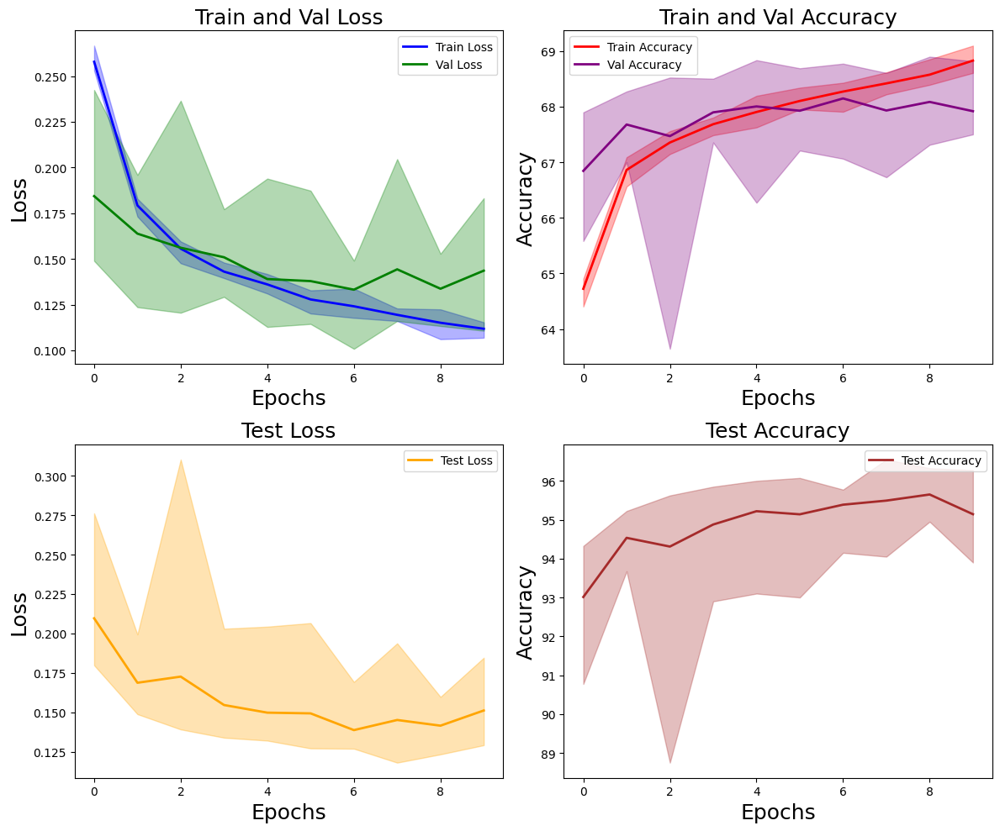

Data saved to importance_f3_resnet.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=0.0005,
    batch_size=32,
    num_epochs=10,
    times=10,
    method='importance',
    T_matrix=T_matrix,
    model_name='resnet',
    csv_path='importance_f3_resnet.csv'
)

resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.14it/s]


Noisy Loss: 1.1348,Validation Loss: 0.1922, Accuracy: 66.12% (3174/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.06it/s]


Test Loss: 0.2119, Accuracy: 92.28% (3691/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.41it/s]


Noisy Loss: 1.1341,Validation Loss: 0.1770, Accuracy: 66.77% (3205/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.19it/s]


Test Loss: 0.1760, Accuracy: 94.10% (3764/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.53it/s]


Noisy Loss: 1.1305,Validation Loss: 0.1706, Accuracy: 67.19% (3225/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.49it/s]


Test Loss: 0.1764, Accuracy: 93.90% (3756/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.09it/s]


Noisy Loss: 1.1221,Validation Loss: 0.1189, Accuracy: 67.58% (3244/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.57it/s]


Test Loss: 0.1378, Accuracy: 95.47% (3819/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.20it/s]


Noisy Loss: 1.1248,Validation Loss: 0.1493, Accuracy: 67.71% (3250/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.95it/s]


Test Loss: 0.1543, Accuracy: 94.83% (3793/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.74it/s]


Noisy Loss: 1.1241,Validation Loss: 0.1510, Accuracy: 67.48% (3239/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.34it/s]


Test Loss: 0.1387, Accuracy: 95.30% (3812/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.66it/s]


Noisy Loss: 1.1219,Validation Loss: 0.1183, Accuracy: 67.52% (3241/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.53it/s]


Test Loss: 0.1434, Accuracy: 95.33% (3813/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.42it/s]


Noisy Loss: 1.1244,Validation Loss: 0.1319, Accuracy: 67.58% (3244/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.38it/s]


Test Loss: 0.1421, Accuracy: 95.60% (3824/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 65.67it/s]


Noisy Loss: 1.1220,Validation Loss: 0.1346, Accuracy: 67.73% (3251/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.10it/s]


Test Loss: 0.1362, Accuracy: 95.78% (3831/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.09it/s]


Noisy Loss: 1.1239,Validation Loss: 0.1549, Accuracy: 67.56% (3243/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.59it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.1592, Accuracy: 95.12% (3805/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.93it/s]


Test Loss: 0.1434, Accuracy: 95.33% (3813/4000)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.89it/s]


Noisy Loss: 1.2979,Validation Loss: 0.0925, Accuracy: 60.12% (2886/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 28.39it/s]


Test Loss: 0.1430, Accuracy: 95.28% (3811/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.60it/s]


Noisy Loss: 1.2979,Validation Loss: 0.0904, Accuracy: 60.08% (2884/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 28.18it/s]


Test Loss: 0.1421, Accuracy: 95.30% (3812/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.06it/s]


Noisy Loss: 1.2978,Validation Loss: 0.0882, Accuracy: 60.15% (2887/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 28.33it/s]


Test Loss: 0.1416, Accuracy: 95.40% (3816/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.22it/s]


Noisy Loss: 1.2977,Validation Loss: 0.0865, Accuracy: 60.08% (2884/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.59it/s]


Test Loss: 0.1415, Accuracy: 95.38% (3815/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.31it/s]


Noisy Loss: 1.2977,Validation Loss: 0.0849, Accuracy: 60.15% (2887/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.13it/s]


Test Loss: 0.1411, Accuracy: 95.40% (3816/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.67it/s]


Test Loss: 0.1411, Accuracy: 95.40% (3816/4000)
finished  1  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.11it/s]


Noisy Loss: 1.2991,Validation Loss: 0.0817, Accuracy: 59.08% (2836/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.85it/s]


Test Loss: 0.1414, Accuracy: 95.42% (3817/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.15it/s]


Noisy Loss: 1.2991,Validation Loss: 0.0805, Accuracy: 59.12% (2838/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 28.08it/s]


Test Loss: 0.1405, Accuracy: 95.38% (3815/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.14it/s]


Noisy Loss: 1.2990,Validation Loss: 0.0789, Accuracy: 59.12% (2838/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.31it/s]


Test Loss: 0.1407, Accuracy: 95.38% (3815/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.83it/s]


Noisy Loss: 1.2990,Validation Loss: 0.0774, Accuracy: 59.10% (2837/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.17it/s]


Test Loss: 0.1408, Accuracy: 95.40% (3816/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.13it/s]


Noisy Loss: 1.2990,Validation Loss: 0.0764, Accuracy: 59.12% (2838/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.63it/s]


Test Loss: 0.1407, Accuracy: 95.45% (3818/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.30it/s]


Test Loss: 0.1407, Accuracy: 95.45% (3818/4000)
finished  2  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.08it/s]


Noisy Loss: 1.2988,Validation Loss: 0.0705, Accuracy: 59.33% (2848/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.02it/s]


Test Loss: 0.1406, Accuracy: 95.42% (3817/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.76it/s]


Noisy Loss: 1.2988,Validation Loss: 0.0688, Accuracy: 59.29% (2846/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.80it/s]


Test Loss: 0.1409, Accuracy: 95.47% (3819/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.04it/s]


Noisy Loss: 1.2987,Validation Loss: 0.0692, Accuracy: 59.31% (2847/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.54it/s]


Test Loss: 0.1405, Accuracy: 95.45% (3818/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.11it/s]


Noisy Loss: 1.2987,Validation Loss: 0.0674, Accuracy: 59.31% (2847/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 28.26it/s]


Test Loss: 0.1403, Accuracy: 95.50% (3820/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.01it/s]


Noisy Loss: 1.2987,Validation Loss: 0.0669, Accuracy: 59.33% (2848/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.85it/s]


Test Loss: 0.1405, Accuracy: 95.55% (3822/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.56it/s]


Test Loss: 0.1405, Accuracy: 95.55% (3822/4000)
finished  3  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.01it/s]


Noisy Loss: 1.2995,Validation Loss: 0.0686, Accuracy: 59.10% (2837/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.29it/s]


Test Loss: 0.1409, Accuracy: 95.47% (3819/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.07it/s]


Noisy Loss: 1.2995,Validation Loss: 0.0680, Accuracy: 59.10% (2837/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.24it/s]


Test Loss: 0.1405, Accuracy: 95.45% (3818/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.05it/s]


Noisy Loss: 1.2994,Validation Loss: 0.0670, Accuracy: 59.15% (2839/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 28.48it/s]


Test Loss: 0.1408, Accuracy: 95.50% (3820/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.62it/s]


Noisy Loss: 1.2994,Validation Loss: 0.0656, Accuracy: 59.15% (2839/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 28.39it/s]


Test Loss: 0.1416, Accuracy: 95.65% (3826/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.17it/s]


Noisy Loss: 1.2994,Validation Loss: 0.0653, Accuracy: 59.15% (2839/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.17it/s]


Test Loss: 0.1413, Accuracy: 95.62% (3825/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.33it/s]


Test Loss: 0.1413, Accuracy: 95.62% (3825/4000)
finished  4  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.90it/s]


Noisy Loss: 1.2990,Validation Loss: 0.0642, Accuracy: 59.19% (2841/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 28.52it/s]


Test Loss: 0.1413, Accuracy: 95.55% (3822/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:02<00:00,  8.91it/s]


Noisy Loss: 1.2990,Validation Loss: 0.0634, Accuracy: 59.19% (2841/4800)


Testing: 100%|██████████| 16/16 [00:01<00:00, 15.69it/s]


Test Loss: 0.1416, Accuracy: 95.60% (3824/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.24it/s]


Noisy Loss: 1.2990,Validation Loss: 0.0629, Accuracy: 59.19% (2841/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.85it/s]


Test Loss: 0.1417, Accuracy: 95.58% (3823/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.14it/s]


Noisy Loss: 1.2990,Validation Loss: 0.0624, Accuracy: 59.21% (2842/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.94it/s]


Test Loss: 0.1412, Accuracy: 95.60% (3824/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.86it/s]


Noisy Loss: 1.2990,Validation Loss: 0.0617, Accuracy: 59.19% (2841/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 28.34it/s]


Test Loss: 0.1416, Accuracy: 95.62% (3825/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.08it/s]


Test Loss: 0.1416, Accuracy: 95.62% (3825/4000)
finished  5  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.73it/s]


Noisy Loss: 1.2987,Validation Loss: 0.0604, Accuracy: 59.35% (2849/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.97it/s]


Test Loss: 0.1414, Accuracy: 95.58% (3823/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.84it/s]


Noisy Loss: 1.2987,Validation Loss: 0.0591, Accuracy: 59.38% (2850/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.80it/s]


Test Loss: 0.1423, Accuracy: 95.58% (3823/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.17it/s]


Noisy Loss: 1.2987,Validation Loss: 0.0588, Accuracy: 59.38% (2850/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.61it/s]


Test Loss: 0.1421, Accuracy: 95.62% (3825/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.93it/s]


Noisy Loss: 1.2986,Validation Loss: 0.0577, Accuracy: 59.38% (2850/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.48it/s]


Test Loss: 0.1429, Accuracy: 95.65% (3826/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.78it/s]


Noisy Loss: 1.2987,Validation Loss: 0.0571, Accuracy: 59.38% (2850/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.07it/s]


Test Loss: 0.1432, Accuracy: 95.62% (3825/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 28.44it/s]


Test Loss: 0.1432, Accuracy: 95.62% (3825/4000)
finished  6  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.20it/s]


Noisy Loss: 1.2980,Validation Loss: 0.0561, Accuracy: 59.79% (2870/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.21it/s]


Test Loss: 0.1424, Accuracy: 95.67% (3827/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.16it/s]


Noisy Loss: 1.2980,Validation Loss: 0.0555, Accuracy: 59.79% (2870/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.39it/s]


Test Loss: 0.1430, Accuracy: 95.70% (3828/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.78it/s]


Noisy Loss: 1.2979,Validation Loss: 0.0548, Accuracy: 59.81% (2871/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.82it/s]


Test Loss: 0.1432, Accuracy: 95.72% (3829/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.20it/s]


Noisy Loss: 1.2979,Validation Loss: 0.0544, Accuracy: 59.79% (2870/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.10it/s]


Test Loss: 0.1430, Accuracy: 95.70% (3828/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.92it/s]


Noisy Loss: 1.2979,Validation Loss: 0.0537, Accuracy: 59.79% (2870/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.29it/s]


Test Loss: 0.1438, Accuracy: 95.72% (3829/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.73it/s]


Test Loss: 0.1438, Accuracy: 95.72% (3829/4000)
finished  7  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.84it/s]


Noisy Loss: 1.2965,Validation Loss: 0.0553, Accuracy: 60.88% (2922/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.93it/s]


Test Loss: 0.1432, Accuracy: 95.72% (3829/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.62it/s]


Noisy Loss: 1.2965,Validation Loss: 0.0549, Accuracy: 60.90% (2923/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.66it/s]


Test Loss: 0.1431, Accuracy: 95.70% (3828/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.88it/s]


Noisy Loss: 1.2965,Validation Loss: 0.0543, Accuracy: 60.92% (2924/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.25it/s]


Test Loss: 0.1438, Accuracy: 95.75% (3830/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.00it/s]


Noisy Loss: 1.2965,Validation Loss: 0.0539, Accuracy: 60.90% (2923/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.77it/s]


Test Loss: 0.1440, Accuracy: 95.75% (3830/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.31it/s]


Noisy Loss: 1.2965,Validation Loss: 0.0533, Accuracy: 60.85% (2921/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.36it/s]


Test Loss: 0.1456, Accuracy: 95.75% (3830/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.74it/s]


Test Loss: 0.1456, Accuracy: 95.75% (3830/4000)
finished  8  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.88it/s]


Noisy Loss: 1.2996,Validation Loss: 0.0486, Accuracy: 58.88% (2826/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.63it/s]


Test Loss: 0.1457, Accuracy: 95.67% (3827/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.08it/s]


Noisy Loss: 1.2996,Validation Loss: 0.0482, Accuracy: 58.88% (2826/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.08it/s]


Test Loss: 0.1458, Accuracy: 95.72% (3829/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.07it/s]


Noisy Loss: 1.2996,Validation Loss: 0.0477, Accuracy: 58.90% (2827/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.44it/s]


Test Loss: 0.1464, Accuracy: 95.70% (3828/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.92it/s]


Noisy Loss: 1.2996,Validation Loss: 0.0473, Accuracy: 58.90% (2827/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.74it/s]


Test Loss: 0.1466, Accuracy: 95.70% (3828/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.04it/s]


Noisy Loss: 1.2996,Validation Loss: 0.0469, Accuracy: 58.92% (2828/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.77it/s]


Test Loss: 0.1464, Accuracy: 95.78% (3831/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.87it/s]


Test Loss: 0.1464, Accuracy: 95.78% (3831/4000)
finished  9  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.87it/s]


Noisy Loss: 1.2982,Validation Loss: 0.0499, Accuracy: 59.73% (2867/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.87it/s]


Test Loss: 0.1466, Accuracy: 95.80% (3832/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.48it/s]


Noisy Loss: 1.2982,Validation Loss: 0.0497, Accuracy: 59.71% (2866/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.14it/s]


Test Loss: 0.1462, Accuracy: 95.80% (3832/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.92it/s]


Noisy Loss: 1.2981,Validation Loss: 0.0492, Accuracy: 59.73% (2867/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.62it/s]


Test Loss: 0.1460, Accuracy: 95.80% (3832/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.11it/s]


Noisy Loss: 1.2981,Validation Loss: 0.0490, Accuracy: 59.71% (2866/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.31it/s]


Test Loss: 0.1460, Accuracy: 95.83% (3833/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.17it/s]


Noisy Loss: 1.2981,Validation Loss: 0.0488, Accuracy: 59.71% (2866/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.90it/s]


Test Loss: 0.1458, Accuracy: 95.85% (3834/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.21it/s]


Test Loss: 0.1458, Accuracy: 95.85% (3834/4000)
finished  10  epoch
min_train_loss [0.08213644867142042, 0.07466230317950248, 0.07042652845382691, 0.06464430426557859, 0.06077978457013766, 0.05799291988213857, 0.055269566675027214, 0.05245737962424755, 0.05100034927328428, 0.048024280096093816]
min_val_loss [0.08489066009458743, 0.07642640624391406, 0.06691753766254376, 0.06526720563047811, 0.06167077959368104, 0.05712175957466427, 0.05372225238304389, 0.05328187405278808, 0.04690709543463431, 0.04878582197584604]
min_train_accuracy [59.109375, 59.385416666666664, 59.359375, 59.458333333333336, 59.416666666666664, 59.369791666666664, 59.302083333333336, 59.036458333333336, 59.526041666666664, 59.354166666666664]
min_val_accuracy [60.145833333333336, 59.125, 59.333333333333336, 59.145833333333336, 59.1875, 59.375, 59.791666666666664, 60.854166666666664, 58.916666666666664, 59.708333333333336]
min_train_noise_loss [1.2999252812067668, 1.2993234729766845, 1.2992183860143025, 1.29878541469

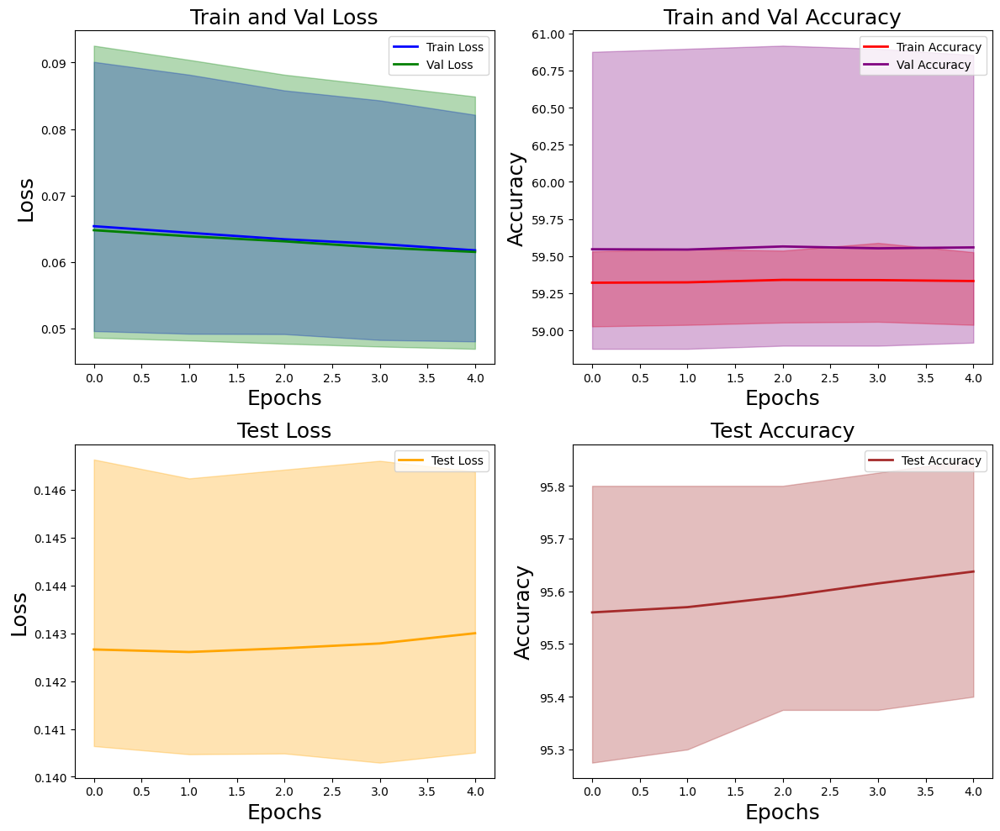

Data saved to t_revision_f3_resnet.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=5e-7,
    batch_size=256,
    num_epochs=5,
    method='t_revision',
    T_matrix=T_matrix,
    num_classes=4,
    optimizer_name='adam',
    times=10,
    model_name='resnet',
    csv_path='t_revision_f3_resnet.csv',
    estimate_T=False,)

resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.87it/s]


Noisy Loss: 1.1378,Validation Loss: 0.1866, Accuracy: 65.42% (3140/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.33it/s]


Test Loss: 0.2308, Accuracy: 92.30% (3692/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.15it/s]


Noisy Loss: 1.1265,Validation Loss: 0.1389, Accuracy: 66.96% (3214/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.62it/s]


Test Loss: 0.1558, Accuracy: 95.17% (3807/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 65.46it/s]


Noisy Loss: 1.1281,Validation Loss: 0.1445, Accuracy: 67.21% (3226/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.20it/s]


Test Loss: 0.1624, Accuracy: 94.90% (3796/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.51it/s]


Noisy Loss: 1.1247,Validation Loss: 0.1436, Accuracy: 67.42% (3236/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.04it/s]


Test Loss: 0.1464, Accuracy: 95.45% (3818/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.96it/s]


Noisy Loss: 1.1280,Validation Loss: 0.1465, Accuracy: 67.00% (3216/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.96it/s]


Test Loss: 0.1543, Accuracy: 95.00% (3800/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.27it/s]


Noisy Loss: 1.1261,Validation Loss: 0.1229, Accuracy: 67.08% (3220/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.44it/s]


Test Loss: 0.1496, Accuracy: 95.28% (3811/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.90it/s]


Noisy Loss: 1.1271,Validation Loss: 0.1541, Accuracy: 66.96% (3214/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.84it/s]


Test Loss: 0.1602, Accuracy: 95.33% (3813/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.90it/s]


Noisy Loss: 1.1247,Validation Loss: 0.1247, Accuracy: 67.40% (3235/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.06it/s]


Test Loss: 0.1501, Accuracy: 95.00% (3800/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 62.64it/s]


Noisy Loss: 1.1293,Validation Loss: 0.1672, Accuracy: 67.08% (3220/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.59it/s]


Test Loss: 0.1643, Accuracy: 94.58% (3783/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.82it/s]


Noisy Loss: 1.1221,Validation Loss: 0.1368, Accuracy: 67.60% (3245/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.96it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.1287, Accuracy: 95.92% (3837/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.61it/s]


Test Loss: 0.1496, Accuracy: 95.28% (3811/4000)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.55it/s]


Noisy Loss: 1.3069,Validation Loss: 0.0948, Accuracy: 68.29% (3278/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.45it/s]


Test Loss: 0.1404, Accuracy: 95.28% (3811/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.86it/s]


Noisy Loss: 1.3069,Validation Loss: 0.0962, Accuracy: 68.27% (3277/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 28.52it/s]


Test Loss: 0.1411, Accuracy: 95.30% (3812/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.80it/s]


Noisy Loss: 1.3069,Validation Loss: 0.0954, Accuracy: 68.29% (3278/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.89it/s]


Test Loss: 0.1402, Accuracy: 95.30% (3812/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.85it/s]


Noisy Loss: 1.3069,Validation Loss: 0.0948, Accuracy: 68.29% (3278/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.86it/s]


Test Loss: 0.1402, Accuracy: 95.35% (3814/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.04it/s]


Noisy Loss: 1.3069,Validation Loss: 0.0957, Accuracy: 68.29% (3278/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 28.11it/s]


Test Loss: 0.1407, Accuracy: 95.33% (3813/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.83it/s]


Test Loss: 0.1404, Accuracy: 95.28% (3811/4000)
finished  1  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.54it/s]


Noisy Loss: 1.3077,Validation Loss: 0.0870, Accuracy: 67.98% (3263/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.21it/s]


Test Loss: 0.1387, Accuracy: 95.35% (3814/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.94it/s]


Noisy Loss: 1.3077,Validation Loss: 0.0871, Accuracy: 67.94% (3261/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.14it/s]


Test Loss: 0.1383, Accuracy: 95.35% (3814/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.95it/s]


Noisy Loss: 1.3078,Validation Loss: 0.0881, Accuracy: 67.92% (3260/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.20it/s]


Test Loss: 0.1396, Accuracy: 95.25% (3810/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.77it/s]


Noisy Loss: 1.3077,Validation Loss: 0.0874, Accuracy: 67.96% (3262/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.22it/s]


Test Loss: 0.1387, Accuracy: 95.35% (3814/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.96it/s]


Noisy Loss: 1.3077,Validation Loss: 0.0870, Accuracy: 67.94% (3261/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 28.01it/s]


Test Loss: 0.1385, Accuracy: 95.33% (3813/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.53it/s]


Test Loss: 0.1385, Accuracy: 95.33% (3813/4000)
finished  2  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.89it/s]


Noisy Loss: 1.3067,Validation Loss: 0.0973, Accuracy: 68.42% (3284/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.41it/s]


Test Loss: 0.1383, Accuracy: 95.35% (3814/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.98it/s]


Noisy Loss: 1.3067,Validation Loss: 0.0967, Accuracy: 68.42% (3284/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 28.28it/s]


Test Loss: 0.1379, Accuracy: 95.38% (3815/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.94it/s]


Noisy Loss: 1.3067,Validation Loss: 0.0970, Accuracy: 68.44% (3285/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.57it/s]


Test Loss: 0.1383, Accuracy: 95.35% (3814/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.12it/s]


Noisy Loss: 1.3068,Validation Loss: 0.0977, Accuracy: 68.42% (3284/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.45it/s]


Test Loss: 0.1389, Accuracy: 95.38% (3815/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.14it/s]


Noisy Loss: 1.3067,Validation Loss: 0.0970, Accuracy: 68.42% (3284/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.46it/s]


Test Loss: 0.1387, Accuracy: 95.35% (3814/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.26it/s]


Test Loss: 0.1379, Accuracy: 95.38% (3815/4000)
finished  3  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.16it/s]


Noisy Loss: 1.3063,Validation Loss: 0.0998, Accuracy: 68.98% (3311/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.92it/s]


Test Loss: 0.1391, Accuracy: 95.35% (3814/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.20it/s]


Noisy Loss: 1.3063,Validation Loss: 0.0998, Accuracy: 68.98% (3311/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.02it/s]


Test Loss: 0.1384, Accuracy: 95.35% (3814/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.02it/s]


Noisy Loss: 1.3063,Validation Loss: 0.0995, Accuracy: 68.98% (3311/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.28it/s]


Test Loss: 0.1376, Accuracy: 95.40% (3816/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.77it/s]


Noisy Loss: 1.3063,Validation Loss: 0.0998, Accuracy: 68.98% (3311/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.51it/s]


Test Loss: 0.1376, Accuracy: 95.40% (3816/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.95it/s]


Noisy Loss: 1.3063,Validation Loss: 0.0999, Accuracy: 69.02% (3313/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.61it/s]


Test Loss: 0.1386, Accuracy: 95.35% (3814/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.53it/s]


Test Loss: 0.1376, Accuracy: 95.40% (3816/4000)
finished  4  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.72it/s]


Noisy Loss: 1.3078,Validation Loss: 0.1012, Accuracy: 67.75% (3252/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.36it/s]


Test Loss: 0.1378, Accuracy: 95.42% (3817/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.04it/s]


Noisy Loss: 1.3078,Validation Loss: 0.1011, Accuracy: 67.71% (3250/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.86it/s]


Test Loss: 0.1382, Accuracy: 95.38% (3815/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.73it/s]


Noisy Loss: 1.3079,Validation Loss: 0.1018, Accuracy: 67.73% (3251/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.28it/s]


Test Loss: 0.1382, Accuracy: 95.42% (3817/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.77it/s]


Noisy Loss: 1.3078,Validation Loss: 0.1008, Accuracy: 67.71% (3250/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.46it/s]


Test Loss: 0.1377, Accuracy: 95.38% (3815/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.77it/s]


Noisy Loss: 1.3078,Validation Loss: 0.1008, Accuracy: 67.67% (3248/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.39it/s]


Test Loss: 0.1376, Accuracy: 95.38% (3815/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.64it/s]


Test Loss: 0.1376, Accuracy: 95.38% (3815/4000)
finished  5  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.74it/s]


Noisy Loss: 1.3075,Validation Loss: 0.0807, Accuracy: 68.06% (3267/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.19it/s]


Test Loss: 0.1360, Accuracy: 95.50% (3820/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.70it/s]


Noisy Loss: 1.3074,Validation Loss: 0.0680, Accuracy: 68.08% (3268/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.83it/s]


Test Loss: 0.1352, Accuracy: 95.50% (3820/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.09it/s]


Noisy Loss: 1.3076,Validation Loss: 0.0519, Accuracy: 68.04% (3266/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.00it/s]


Test Loss: 0.1373, Accuracy: 95.42% (3817/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.72it/s]


Noisy Loss: 1.3075,Validation Loss: 0.0830, Accuracy: 68.06% (3267/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.40it/s]


Test Loss: 0.1361, Accuracy: 95.47% (3819/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.17it/s]


Noisy Loss: 1.3075,Validation Loss: 0.0803, Accuracy: 68.02% (3265/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.68it/s]


Test Loss: 0.1371, Accuracy: 95.47% (3819/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.18it/s]


Test Loss: 0.1373, Accuracy: 95.42% (3817/4000)
finished  6  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.04it/s]


Noisy Loss: 1.3066,Validation Loss: 0.0869, Accuracy: 68.29% (3278/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.34it/s]


Test Loss: 0.1368, Accuracy: 95.50% (3820/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.54it/s]


Noisy Loss: 1.3067,Validation Loss: 0.0872, Accuracy: 68.29% (3278/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.09it/s]


Test Loss: 0.1370, Accuracy: 95.45% (3818/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.64it/s]


Noisy Loss: 1.3066,Validation Loss: 0.0865, Accuracy: 68.33% (3280/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.48it/s]


Test Loss: 0.1354, Accuracy: 95.47% (3819/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.75it/s]


Noisy Loss: 1.3066,Validation Loss: 0.0868, Accuracy: 68.33% (3280/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.88it/s]


Test Loss: 0.1358, Accuracy: 95.50% (3820/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.95it/s]


Noisy Loss: 1.3066,Validation Loss: 0.0866, Accuracy: 68.31% (3279/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.38it/s]


Test Loss: 0.1358, Accuracy: 95.45% (3818/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.90it/s]


Test Loss: 0.1354, Accuracy: 95.47% (3819/4000)
finished  7  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.91it/s]


Noisy Loss: 1.3059,Validation Loss: 0.0647, Accuracy: 69.10% (3317/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.24it/s]


Test Loss: 0.1350, Accuracy: 95.55% (3822/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.24it/s]


Noisy Loss: 1.3058,Validation Loss: 0.0490, Accuracy: 69.08% (3316/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.28it/s]


Test Loss: 0.1347, Accuracy: 95.53% (3821/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.50it/s]


Noisy Loss: 1.3058,Validation Loss: -0.1636, Accuracy: 69.17% (3320/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.72it/s]


Test Loss: 0.1340, Accuracy: 95.53% (3821/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.81it/s]


Noisy Loss: 1.3058,Validation Loss: 0.0597, Accuracy: 69.12% (3318/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.98it/s]


Test Loss: 0.1347, Accuracy: 95.50% (3820/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.98it/s]


Noisy Loss: 1.3059,Validation Loss: -1.4491, Accuracy: 69.15% (3319/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.95it/s]


Test Loss: 0.1346, Accuracy: 95.47% (3819/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.02it/s]


Test Loss: 0.1346, Accuracy: 95.47% (3819/4000)
finished  8  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.98it/s]


Noisy Loss: 1.3052,Validation Loss: 0.2100, Accuracy: 69.69% (3345/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.48it/s]


Test Loss: 0.1342, Accuracy: 95.53% (3821/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.77it/s]


Noisy Loss: 1.3052,Validation Loss: 0.0142, Accuracy: 69.73% (3347/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.09it/s]


Test Loss: 0.1345, Accuracy: 95.47% (3819/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.24it/s]


Noisy Loss: 1.3052,Validation Loss: 0.0781, Accuracy: 69.75% (3348/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.54it/s]


Test Loss: 0.1353, Accuracy: 95.55% (3822/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.01it/s]


Noisy Loss: 1.3051,Validation Loss: 0.1170, Accuracy: 69.69% (3345/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.37it/s]


Test Loss: 0.1335, Accuracy: 95.50% (3820/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.73it/s]


Noisy Loss: 1.3052,Validation Loss: 0.3909, Accuracy: 69.75% (3348/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.89it/s]


Test Loss: 0.1349, Accuracy: 95.55% (3822/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.05it/s]


Test Loss: 0.1345, Accuracy: 95.47% (3819/4000)
finished  9  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.90it/s]


Noisy Loss: 1.3062,Validation Loss: 0.0939, Accuracy: 68.90% (3307/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.88it/s]


Test Loss: 0.1343, Accuracy: 95.50% (3820/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.86it/s]


Noisy Loss: 1.3061,Validation Loss: 0.0937, Accuracy: 68.96% (3310/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.74it/s]


Test Loss: 0.1339, Accuracy: 95.50% (3820/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.83it/s]


Noisy Loss: 1.3061,Validation Loss: 0.0922, Accuracy: 68.96% (3310/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.32it/s]


Test Loss: 0.1330, Accuracy: 95.50% (3820/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.65it/s]


Noisy Loss: 1.3061,Validation Loss: 0.0924, Accuracy: 68.94% (3309/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.74it/s]


Test Loss: 0.1338, Accuracy: 95.53% (3821/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.88it/s]


Noisy Loss: 1.3062,Validation Loss: 0.0919, Accuracy: 68.88% (3306/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 27.00it/s]


Test Loss: 0.1348, Accuracy: 95.50% (3820/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.27it/s]


Test Loss: 0.1348, Accuracy: 95.50% (3820/4000)
finished  10  epoch
min_train_loss [0.1250399157901605, 0.09755285506447156, 0.05918098914126555, 0.10046090180675189, 0.09035971820354462, 0.10008109980573257, 0.09763322412967682, 0.10229575231671334, 0.09554126247297973, 0.09724938414990902]
min_val_loss [0.09475411026199397, 0.08700823646626975, 0.0966893132579954, 0.09950854060681243, 0.10081781113618299, 0.05191632899406709, 0.0864864954430806, -1.44906006910299, 0.014232764902867769, 0.09186675595609765]
min_train_accuracy [68.5625, 68.68229166666667, 68.5625, 68.41666666666667, 68.734375, 68.72916666666667, 68.63020833333333, 68.47916666666667, 68.421875, 68.52604166666667]
min_val_accuracy [68.29166666666667, 67.9375, 68.41666666666667, 68.97916666666667, 67.66666666666667, 68.04166666666667, 68.33333333333333, 69.14583333333333, 69.72916666666667, 68.875]
min_train_noise_loss [1.119395162264506, 1.1184053325653076, 1.119020315806071, 1.1192139530181884, 1.117937264442444, 1.1179

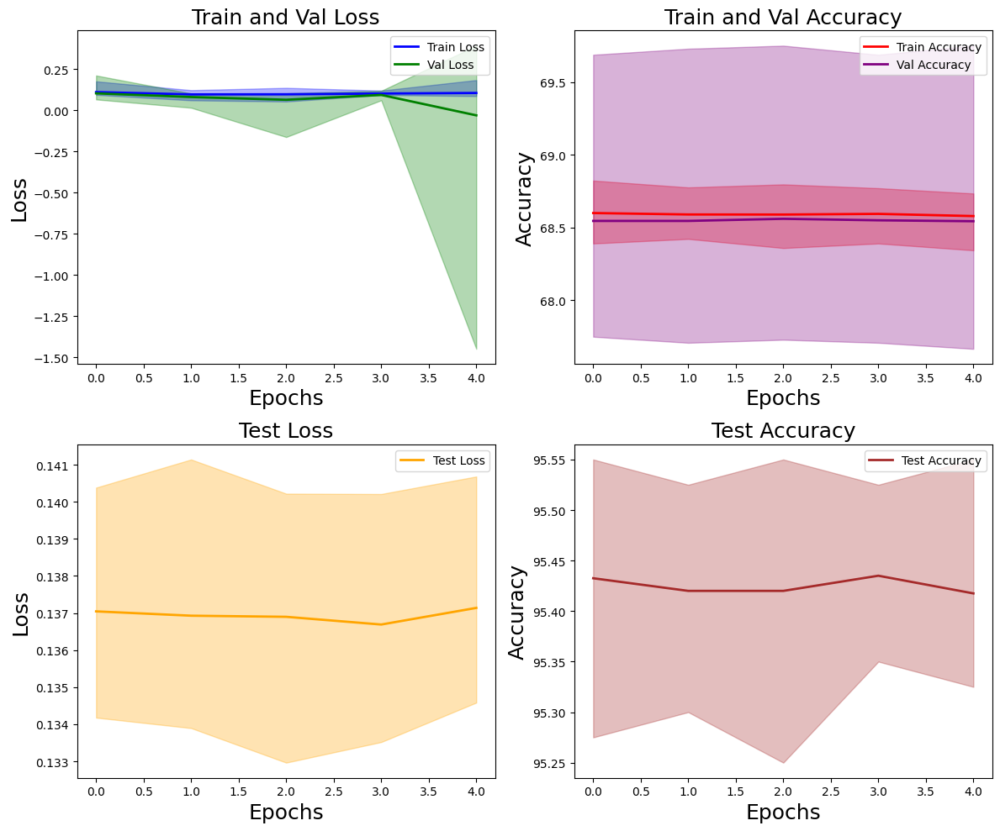

Data saved to t_revision_v2_f3_resnet.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=5e-7,
    batch_size=256,
    num_epochs=5,
    method='t_revision_v2',
    T_matrix=T_matrix,
    num_classes=4,
    optimizer_name='adam',
    times=10,
    model_name='resnet',
    csv_path='t_revision_v2_f3_resnet.csv',
    estimate_T=False,)

### FashionMNIST0.6

In [ ]:
T_matrix = np.array([
    [0.4, 0.2, 0.2, 0.2],
    [0.2, 0.4, 0.2, 0.2],
    [0.2, 0.2, 0.4, 0.2],
    [0.2, 0.2, 0.2, 0.4]
])
X_train_full=data_f6_X_tr
y_train_full=data_f6_S_tr
X_test=data_f6_X_ts
y_test=data_f6_Y_ts

resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 135.30it/s]


Noisy Loss: 1.3732,Validation Loss: 1.3711, Accuracy: 33.46% (1606/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.75it/s]


Test Loss: 1.1443, Accuracy: 64.08% (2563/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 129.88it/s]


Noisy Loss: 1.3703,Validation Loss: 1.3767, Accuracy: 34.46% (1654/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.40it/s]


Test Loss: 1.0705, Accuracy: 71.75% (2870/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 135.74it/s]


Noisy Loss: 1.3690,Validation Loss: 1.3501, Accuracy: 38.17% (1832/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.59it/s]


Test Loss: 1.0682, Accuracy: 89.35% (3574/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 125.04it/s]


Noisy Loss: 1.3665,Validation Loss: 1.3437, Accuracy: 38.69% (1857/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.91it/s]


Test Loss: 1.0393, Accuracy: 89.10% (3564/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.76it/s]


Noisy Loss: 1.3673,Validation Loss: 1.3642, Accuracy: 36.71% (1762/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.72it/s]


Test Loss: 1.0239, Accuracy: 79.78% (3191/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 129.35it/s]


Noisy Loss: 1.3670,Validation Loss: 1.3524, Accuracy: 37.85% (1817/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.56it/s]


Test Loss: 1.0371, Accuracy: 88.05% (3522/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 134.08it/s]


Noisy Loss: 1.3680,Validation Loss: 1.3598, Accuracy: 37.08% (1780/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.37it/s]


Test Loss: 1.0555, Accuracy: 84.05% (3362/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 128.90it/s]


Noisy Loss: 1.3681,Validation Loss: 1.3535, Accuracy: 37.79% (1814/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.43it/s]


Test Loss: 1.0447, Accuracy: 87.58% (3503/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 132.95it/s]


Noisy Loss: 1.3672,Validation Loss: 1.3527, Accuracy: 38.15% (1831/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.72it/s]


Test Loss: 1.0432, Accuracy: 86.10% (3444/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 130.88it/s]


Noisy Loss: 1.3640,Validation Loss: 1.3458, Accuracy: 38.54% (1850/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.00it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 1.0056, Accuracy: 88.90% (3556/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.02it/s]


Test Loss: 1.0393, Accuracy: 89.10% (3564/4000)
finished  1  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 125.08it/s]


Noisy Loss: 1.3699,Validation Loss: 1.3552, Accuracy: 37.38% (1794/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.85it/s]


Test Loss: 1.0936, Accuracy: 83.00% (3320/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 129.72it/s]


Noisy Loss: 1.3684,Validation Loss: 1.3667, Accuracy: 34.40% (1651/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.22it/s]


Test Loss: 1.0704, Accuracy: 72.40% (2896/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 138.61it/s]


Noisy Loss: 1.3644,Validation Loss: 1.3436, Accuracy: 37.73% (1811/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.44it/s]


Test Loss: 1.0263, Accuracy: 86.17% (3447/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 130.53it/s]


Noisy Loss: 1.3623,Validation Loss: 1.3562, Accuracy: 37.94% (1821/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.64it/s]


Test Loss: 0.9721, Accuracy: 88.53% (3541/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 138.29it/s]


Noisy Loss: 1.3667,Validation Loss: 1.3527, Accuracy: 38.35% (1841/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.80it/s]


Test Loss: 1.0445, Accuracy: 86.05% (3442/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 141.70it/s]


Noisy Loss: 1.3669,Validation Loss: 1.3505, Accuracy: 38.15% (1831/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.71it/s]


Test Loss: 1.0494, Accuracy: 85.97% (3439/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 138.50it/s]


Noisy Loss: 1.3670,Validation Loss: 1.3524, Accuracy: 38.04% (1826/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.77it/s]


Test Loss: 1.0312, Accuracy: 88.28% (3531/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 126.55it/s]


Noisy Loss: 1.3725,Validation Loss: 1.4123, Accuracy: 31.19% (1497/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.57it/s]


Test Loss: 1.1504, Accuracy: 52.65% (2106/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 136.29it/s]


Noisy Loss: 1.3634,Validation Loss: 1.3636, Accuracy: 36.52% (1753/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.17it/s]


Test Loss: 0.9915, Accuracy: 80.00% (3200/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 124.09it/s]


Noisy Loss: 1.3664,Validation Loss: 1.3485, Accuracy: 38.02% (1825/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.23it/s]


Test Loss: 1.0459, Accuracy: 87.25% (3490/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.93it/s]


Test Loss: 1.0263, Accuracy: 86.17% (3447/4000)
finished  2  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.56it/s]


Noisy Loss: 1.3740,Validation Loss: 1.3775, Accuracy: 30.35% (1457/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.44it/s]


Test Loss: 1.1215, Accuracy: 56.10% (2244/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 132.98it/s]


Noisy Loss: 1.3673,Validation Loss: 1.3521, Accuracy: 37.90% (1819/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.01it/s]


Test Loss: 1.0368, Accuracy: 88.70% (3548/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 136.16it/s]


Noisy Loss: 1.3699,Validation Loss: 1.3526, Accuracy: 37.90% (1819/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.01it/s]


Test Loss: 1.0814, Accuracy: 89.72% (3589/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 121.80it/s]


Noisy Loss: 1.3717,Validation Loss: 1.3709, Accuracy: 33.19% (1593/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.22it/s]


Test Loss: 1.1182, Accuracy: 66.42% (2657/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.23it/s]


Noisy Loss: 1.3679,Validation Loss: 1.3683, Accuracy: 35.71% (1714/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.64it/s]


Test Loss: 1.0145, Accuracy: 80.42% (3217/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 142.51it/s]


Noisy Loss: 1.3664,Validation Loss: 1.3527, Accuracy: 38.08% (1828/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.09it/s]


Test Loss: 1.0164, Accuracy: 91.28% (3651/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 132.25it/s]


Noisy Loss: 1.3686,Validation Loss: 1.3566, Accuracy: 38.06% (1827/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.75it/s]


Test Loss: 1.0373, Accuracy: 88.60% (3544/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 134.37it/s]


Noisy Loss: 1.3683,Validation Loss: 1.3622, Accuracy: 35.90% (1723/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.02it/s]


Test Loss: 1.0425, Accuracy: 80.90% (3236/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 127.81it/s]


Noisy Loss: 1.3677,Validation Loss: 1.3540, Accuracy: 37.90% (1819/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.09it/s]


Test Loss: 1.0232, Accuracy: 90.33% (3613/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 130.13it/s]


Noisy Loss: 1.3700,Validation Loss: 1.3691, Accuracy: 36.00% (1728/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.40it/s]


Test Loss: 1.0494, Accuracy: 81.38% (3255/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.66it/s]


Test Loss: 1.0368, Accuracy: 88.70% (3548/4000)
finished  3  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 130.35it/s]


Noisy Loss: 1.3730,Validation Loss: 1.3761, Accuracy: 30.46% (1462/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.47it/s]


Test Loss: 1.1313, Accuracy: 53.08% (2123/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 136.94it/s]


Noisy Loss: 1.3676,Validation Loss: 1.3771, Accuracy: 34.85% (1673/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.26it/s]


Test Loss: 1.0516, Accuracy: 75.12% (3005/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 139.49it/s]


Noisy Loss: 1.3696,Validation Loss: 1.3509, Accuracy: 37.81% (1815/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.54it/s]


Test Loss: 1.0832, Accuracy: 87.97% (3519/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 138.84it/s]


Noisy Loss: 1.3664,Validation Loss: 1.3469, Accuracy: 38.48% (1847/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.25it/s]


Test Loss: 1.0278, Accuracy: 90.67% (3627/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.44it/s]


Noisy Loss: 1.3673,Validation Loss: 1.3654, Accuracy: 36.92% (1772/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.16it/s]


Test Loss: 1.0420, Accuracy: 83.17% (3327/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 124.56it/s]


Noisy Loss: 1.3676,Validation Loss: 1.3493, Accuracy: 38.44% (1845/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.53it/s]


Test Loss: 1.0427, Accuracy: 90.55% (3622/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 123.05it/s]


Noisy Loss: 1.3643,Validation Loss: 1.3435, Accuracy: 38.48% (1847/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.21it/s]


Test Loss: 0.9989, Accuracy: 90.90% (3636/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.63it/s]


Noisy Loss: 1.3663,Validation Loss: 1.3661, Accuracy: 36.67% (1760/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.04it/s]


Test Loss: 1.0359, Accuracy: 84.62% (3385/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 130.71it/s]


Noisy Loss: 1.3653,Validation Loss: 1.3450, Accuracy: 38.54% (1850/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.76it/s]


Test Loss: 1.0154, Accuracy: 90.60% (3624/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 136.51it/s]


Noisy Loss: 1.3693,Validation Loss: 1.3705, Accuracy: 34.71% (1666/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.27it/s]


Test Loss: 1.0700, Accuracy: 71.22% (2849/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.20it/s]


Test Loss: 0.9989, Accuracy: 90.90% (3636/4000)
finished  4  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 123.32it/s]


Noisy Loss: 1.3715,Validation Loss: 1.3899, Accuracy: 33.15% (1591/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.93it/s]


Test Loss: 1.0605, Accuracy: 70.05% (2802/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 145.27it/s]


Noisy Loss: 1.3766,Validation Loss: 1.4107, Accuracy: 27.58% (1324/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.81it/s]


Test Loss: 1.1577, Accuracy: 41.77% (1671/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 127.57it/s]


Noisy Loss: 1.3680,Validation Loss: 1.3634, Accuracy: 36.33% (1744/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.60it/s]


Test Loss: 1.0487, Accuracy: 83.35% (3334/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.12it/s]


Noisy Loss: 1.3651,Validation Loss: 1.3486, Accuracy: 38.25% (1836/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.81it/s]


Test Loss: 1.0155, Accuracy: 88.35% (3534/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 133.45it/s]


Noisy Loss: 1.3719,Validation Loss: 1.3840, Accuracy: 30.92% (1484/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.74it/s]


Test Loss: 1.1161, Accuracy: 55.65% (2226/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 126.09it/s]


Noisy Loss: 1.3696,Validation Loss: 1.3771, Accuracy: 33.23% (1595/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.28it/s]


Test Loss: 1.0636, Accuracy: 65.17% (2607/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 128.43it/s]


Noisy Loss: 1.3692,Validation Loss: 1.3586, Accuracy: 36.04% (1730/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.29it/s]


Test Loss: 1.0750, Accuracy: 81.12% (3245/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.54it/s]


Noisy Loss: 1.3721,Validation Loss: 1.3659, Accuracy: 35.98% (1727/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.41it/s]


Test Loss: 1.0888, Accuracy: 82.40% (3296/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 134.94it/s]


Noisy Loss: 1.3691,Validation Loss: 1.3809, Accuracy: 34.67% (1664/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.01it/s]


Test Loss: 1.0309, Accuracy: 75.65% (3026/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 122.45it/s]


Noisy Loss: 1.3679,Validation Loss: 1.3608, Accuracy: 36.81% (1767/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.53it/s]


Test Loss: 1.0235, Accuracy: 84.42% (3377/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.29it/s]


Test Loss: 1.0155, Accuracy: 88.35% (3534/4000)
finished  5  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 137.69it/s]


Noisy Loss: 1.3714,Validation Loss: 1.4024, Accuracy: 32.90% (1579/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.81it/s]


Test Loss: 1.1031, Accuracy: 63.00% (2520/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 138.60it/s]


Noisy Loss: 1.3660,Validation Loss: 1.3539, Accuracy: 37.83% (1816/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.63it/s]


Test Loss: 1.0165, Accuracy: 87.65% (3506/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 140.44it/s]


Noisy Loss: 1.3689,Validation Loss: 1.3657, Accuracy: 35.88% (1722/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.76it/s]


Test Loss: 1.0788, Accuracy: 79.53% (3181/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 133.10it/s]


Noisy Loss: 1.3669,Validation Loss: 1.3610, Accuracy: 36.54% (1754/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.99it/s]


Test Loss: 1.0455, Accuracy: 80.30% (3212/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 135.93it/s]


Noisy Loss: 1.3700,Validation Loss: 1.3770, Accuracy: 34.81% (1671/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.30it/s]


Test Loss: 1.0784, Accuracy: 72.45% (2898/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 137.20it/s]


Noisy Loss: 1.3654,Validation Loss: 1.3467, Accuracy: 38.21% (1834/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.84it/s]


Test Loss: 1.0176, Accuracy: 88.60% (3544/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 139.31it/s]


Noisy Loss: 1.3642,Validation Loss: 1.3570, Accuracy: 38.12% (1830/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.27it/s]


Test Loss: 0.9934, Accuracy: 87.92% (3517/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 132.07it/s]


Noisy Loss: 1.3670,Validation Loss: 1.3543, Accuracy: 37.31% (1791/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.29it/s]


Test Loss: 1.0493, Accuracy: 81.95% (3278/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 127.61it/s]


Noisy Loss: 1.3633,Validation Loss: 1.3507, Accuracy: 38.52% (1849/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.18it/s]


Test Loss: 0.9803, Accuracy: 90.65% (3626/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 139.03it/s]


Noisy Loss: 1.3623,Validation Loss: 1.3527, Accuracy: 38.04% (1826/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.77it/s]


Test Loss: 0.9587, Accuracy: 88.85% (3554/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.14it/s]


Test Loss: 1.0176, Accuracy: 88.60% (3544/4000)
finished  6  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 137.74it/s]


Noisy Loss: 1.3670,Validation Loss: 1.3897, Accuracy: 35.75% (1716/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.75it/s]


Test Loss: 1.0360, Accuracy: 76.05% (3042/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.86it/s]


Noisy Loss: 1.3730,Validation Loss: 1.3913, Accuracy: 34.83% (1672/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.87it/s]


Test Loss: 1.1153, Accuracy: 71.92% (2877/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 137.66it/s]


Noisy Loss: 1.3753,Validation Loss: 1.3732, Accuracy: 33.52% (1609/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.57it/s]


Test Loss: 1.1735, Accuracy: 71.05% (2842/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 132.81it/s]


Noisy Loss: 1.3649,Validation Loss: 1.3593, Accuracy: 37.48% (1799/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.35it/s]


Test Loss: 1.0078, Accuracy: 88.40% (3536/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 137.27it/s]


Noisy Loss: 1.3776,Validation Loss: 1.4173, Accuracy: 33.71% (1618/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.64it/s]


Test Loss: 1.2032, Accuracy: 67.42% (2697/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 133.35it/s]


Noisy Loss: 1.3707,Validation Loss: 1.3533, Accuracy: 37.65% (1807/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.99it/s]


Test Loss: 1.0935, Accuracy: 87.00% (3480/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 138.04it/s]


Noisy Loss: 1.3710,Validation Loss: 1.3507, Accuracy: 37.62% (1806/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.70it/s]


Test Loss: 1.1027, Accuracy: 88.28% (3531/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 125.74it/s]


Noisy Loss: 1.3620,Validation Loss: 1.3658, Accuracy: 37.83% (1816/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.38it/s]


Test Loss: 0.9551, Accuracy: 88.75% (3550/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 132.03it/s]


Noisy Loss: 1.3689,Validation Loss: 1.3518, Accuracy: 37.27% (1789/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.76it/s]


Test Loss: 1.0700, Accuracy: 84.80% (3392/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.39it/s]


Noisy Loss: 1.3644,Validation Loss: 1.3498, Accuracy: 38.38% (1842/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.76it/s]


Test Loss: 1.0004, Accuracy: 91.10% (3644/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.35it/s]


Test Loss: 1.0004, Accuracy: 91.10% (3644/4000)
finished  7  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 125.62it/s]


Noisy Loss: 1.3661,Validation Loss: 1.3501, Accuracy: 37.90% (1819/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.54it/s]


Test Loss: 1.0212, Accuracy: 89.12% (3565/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 134.47it/s]


Noisy Loss: 1.3652,Validation Loss: 1.3681, Accuracy: 36.44% (1749/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.00it/s]


Test Loss: 1.0028, Accuracy: 80.10% (3204/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 129.97it/s]


Noisy Loss: 1.3718,Validation Loss: 1.3637, Accuracy: 36.04% (1730/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.09it/s]


Test Loss: 1.0911, Accuracy: 79.97% (3199/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 138.04it/s]


Noisy Loss: 1.3655,Validation Loss: 1.3710, Accuracy: 34.69% (1665/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.69it/s]


Test Loss: 1.0301, Accuracy: 70.78% (2831/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 124.27it/s]


Noisy Loss: 1.3687,Validation Loss: 1.3495, Accuracy: 38.06% (1827/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.44it/s]


Test Loss: 1.0563, Accuracy: 90.10% (3604/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 137.59it/s]


Noisy Loss: 1.3734,Validation Loss: 1.3667, Accuracy: 34.65% (1663/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.71it/s]


Test Loss: 1.1193, Accuracy: 72.50% (2900/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 124.60it/s]


Noisy Loss: 1.3641,Validation Loss: 1.3462, Accuracy: 38.48% (1847/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.21it/s]


Test Loss: 0.9809, Accuracy: 92.03% (3681/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 129.28it/s]


Noisy Loss: 1.3690,Validation Loss: 1.3811, Accuracy: 35.23% (1691/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.51it/s]


Test Loss: 1.0191, Accuracy: 76.05% (3042/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 135.52it/s]


Noisy Loss: 1.3719,Validation Loss: 1.4000, Accuracy: 32.96% (1582/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.97it/s]


Test Loss: 1.0566, Accuracy: 67.10% (2684/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 139.89it/s]


Noisy Loss: 1.3693,Validation Loss: 1.3661, Accuracy: 35.79% (1718/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.84it/s]


Test Loss: 1.0532, Accuracy: 78.78% (3151/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.57it/s]


Test Loss: 0.9809, Accuracy: 92.03% (3681/4000)
finished  8  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 132.38it/s]


Noisy Loss: 1.3674,Validation Loss: 1.3580, Accuracy: 36.85% (1769/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.55it/s]


Test Loss: 1.0529, Accuracy: 81.95% (3278/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 136.24it/s]


Noisy Loss: 1.3680,Validation Loss: 1.3823, Accuracy: 35.27% (1693/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.95it/s]


Test Loss: 1.0227, Accuracy: 73.55% (2942/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 127.73it/s]


Noisy Loss: 1.3678,Validation Loss: 1.3594, Accuracy: 38.06% (1827/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.13it/s]


Test Loss: 1.0319, Accuracy: 88.85% (3554/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 130.10it/s]


Noisy Loss: 1.3696,Validation Loss: 1.3582, Accuracy: 34.79% (1670/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.38it/s]


Test Loss: 1.0792, Accuracy: 73.83% (2953/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 130.43it/s]


Noisy Loss: 1.3677,Validation Loss: 1.3571, Accuracy: 36.77% (1765/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.93it/s]


Test Loss: 1.0506, Accuracy: 81.47% (3259/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.75it/s]


Noisy Loss: 1.3654,Validation Loss: 1.3781, Accuracy: 32.96% (1582/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.77it/s]


Test Loss: 1.0120, Accuracy: 69.28% (2771/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 132.29it/s]


Noisy Loss: 1.3660,Validation Loss: 1.3520, Accuracy: 37.69% (1809/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.25it/s]


Test Loss: 1.0143, Accuracy: 86.97% (3479/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 135.54it/s]


Noisy Loss: 1.3647,Validation Loss: 1.3474, Accuracy: 38.21% (1834/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.02it/s]


Test Loss: 0.9967, Accuracy: 90.08% (3603/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 135.96it/s]


Noisy Loss: 1.3673,Validation Loss: 1.3453, Accuracy: 38.33% (1840/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.83it/s]


Test Loss: 1.0447, Accuracy: 91.17% (3647/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 133.40it/s]


Noisy Loss: 1.3683,Validation Loss: 1.3534, Accuracy: 36.81% (1767/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.54it/s]


Test Loss: 1.0504, Accuracy: 87.75% (3510/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.72it/s]


Test Loss: 1.0447, Accuracy: 91.17% (3647/4000)
finished  9  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 140.62it/s]


Noisy Loss: 1.3748,Validation Loss: 1.3905, Accuracy: 31.27% (1501/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.58it/s]


Test Loss: 1.1422, Accuracy: 58.77% (2351/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 125.61it/s]


Noisy Loss: 1.3708,Validation Loss: 1.3921, Accuracy: 34.00% (1632/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.97it/s]


Test Loss: 1.0476, Accuracy: 74.67% (2987/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 129.61it/s]


Noisy Loss: 1.3650,Validation Loss: 1.3587, Accuracy: 37.25% (1788/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.48it/s]


Test Loss: 0.9676, Accuracy: 89.17% (3567/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 133.85it/s]


Noisy Loss: 1.3729,Validation Loss: 1.3911, Accuracy: 32.83% (1576/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.04it/s]


Test Loss: 1.0914, Accuracy: 68.12% (2725/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 133.09it/s]


Noisy Loss: 1.3699,Validation Loss: 1.3664, Accuracy: 35.19% (1689/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.20it/s]


Test Loss: 1.0535, Accuracy: 80.08% (3203/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 129.95it/s]


Noisy Loss: 1.3707,Validation Loss: 1.3596, Accuracy: 35.69% (1713/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.21it/s]


Test Loss: 1.0784, Accuracy: 80.50% (3220/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 130.97it/s]


Noisy Loss: 1.3717,Validation Loss: 1.3626, Accuracy: 35.79% (1718/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.90it/s]


Test Loss: 1.0743, Accuracy: 80.95% (3238/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 136.80it/s]


Noisy Loss: 1.3653,Validation Loss: 1.3563, Accuracy: 37.52% (1801/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.99it/s]


Test Loss: 0.9732, Accuracy: 90.40% (3616/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 136.68it/s]


Noisy Loss: 1.3703,Validation Loss: 1.3689, Accuracy: 34.98% (1679/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.12it/s]


Test Loss: 1.0669, Accuracy: 80.33% (3213/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 127.04it/s]


Noisy Loss: 1.3664,Validation Loss: 1.3732, Accuracy: 35.69% (1713/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.46it/s]


Test Loss: 0.9913, Accuracy: 83.40% (3336/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.31it/s]


Test Loss: 0.9732, Accuracy: 90.40% (3616/4000)
finished  10  epoch
min_train_loss [1.3598511930306751, 1.362525461713473, 1.3670067660013834, 1.3532964924971262, 1.3543318345149358, 1.3512533154090245, 1.3481657419602076, 1.3506866548458736, 1.350709622502327, 1.3475022093454996]
min_val_loss [1.3437375283241273, 1.3436127853393556, 1.352102127869924, 1.343468902905782, 1.348597366809845, 1.3467336678504944, 1.3498182201385498, 1.346220174630483, 1.345290649731954, 1.3562858565648397]
min_train_accuracy [36.005208333333336, 35.911458333333336, 35.619791666666664, 37.166666666666664, 36.505208333333336, 37.192708333333336, 37.723958333333336, 37.5625, 37.661458333333336, 37.619791666666664]
min_val_accuracy [38.6875, 37.729166666666664, 37.895833333333336, 38.479166666666664, 38.25, 38.208333333333336, 38.375, 38.479166666666664, 38.333333333333336, 37.520833333333336]
min_train_noise_loss [1.3674823464949926, 1.3684221255779265, 1.370458011229833, 1.366109640399615, 1.3656338850657146

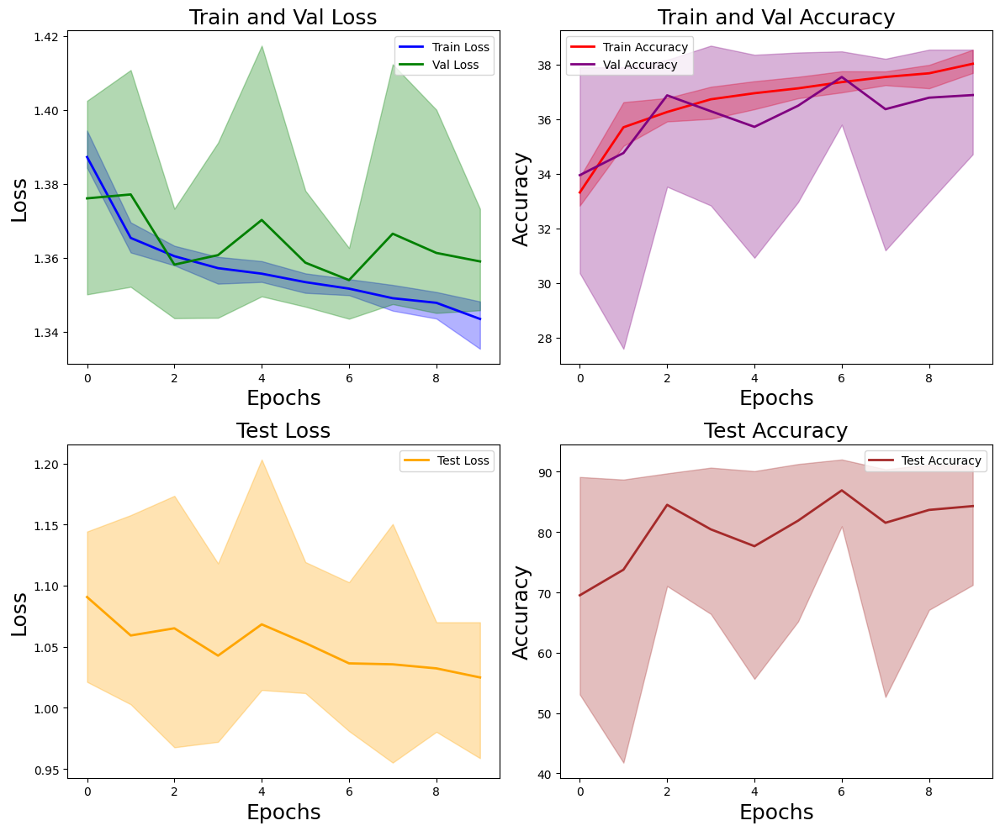

Data saved to baseline_f6_resnet.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=0.0005,
    batch_size=32,
    num_epochs=10,
    times=10,
    method='baseline',
    T_matrix=T_matrix,
    model_name='resnet',
    csv_path='baseline_f6_resnet.csv'
)

resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 121.33it/s]


Noisy Loss: 1.3677,Validation Loss: 1.3498, Accuracy: 36.94% (1773/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.48it/s]


Test Loss: 0.5236, Accuracy: 87.17% (3487/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 132.81it/s]


Noisy Loss: 1.3671,Validation Loss: 1.3465, Accuracy: 37.35% (1793/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.32it/s]


Test Loss: 0.3523, Accuracy: 89.70% (3588/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 134.84it/s]


Noisy Loss: 1.3662,Validation Loss: 1.3457, Accuracy: 37.58% (1804/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.49it/s]


Test Loss: 0.3357, Accuracy: 88.97% (3559/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 122.56it/s]


Noisy Loss: 1.3672,Validation Loss: 1.3468, Accuracy: 37.60% (1805/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.25it/s]


Test Loss: 0.4258, Accuracy: 86.75% (3470/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 121.82it/s]


Noisy Loss: 1.3664,Validation Loss: 1.3460, Accuracy: 37.58% (1804/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.68it/s]


Test Loss: 0.3292, Accuracy: 89.17% (3567/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 122.43it/s]


Noisy Loss: 1.3657,Validation Loss: 1.3450, Accuracy: 37.71% (1810/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 109.41it/s]


Test Loss: 0.3373, Accuracy: 89.70% (3588/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 125.26it/s]


Noisy Loss: 1.3660,Validation Loss: 1.3451, Accuracy: 37.69% (1809/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.14it/s]


Test Loss: 0.3617, Accuracy: 89.08% (3563/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 128.87it/s]


Noisy Loss: 1.3684,Validation Loss: 1.3488, Accuracy: 36.92% (1772/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.23it/s]


Test Loss: 0.3873, Accuracy: 87.47% (3499/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.69it/s]


Noisy Loss: 1.3702,Validation Loss: 1.3554, Accuracy: 35.44% (1701/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.59it/s]


Test Loss: 0.5387, Accuracy: 83.12% (3325/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 136.61it/s]


Noisy Loss: 1.3718,Validation Loss: 1.3573, Accuracy: 35.00% (1680/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.08it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.6891, Accuracy: 73.22% (2929/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.72it/s]


Test Loss: 0.3373, Accuracy: 89.70% (3588/4000)
finished  1  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 127.54it/s]


Noisy Loss: 1.3732,Validation Loss: 1.3662, Accuracy: 34.02% (1633/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.16it/s]


Test Loss: 0.8837, Accuracy: 75.90% (3036/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 129.70it/s]


Noisy Loss: 1.3686,Validation Loss: 1.3539, Accuracy: 36.46% (1750/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.60it/s]


Test Loss: 0.6201, Accuracy: 88.33% (3533/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.69it/s]


Noisy Loss: 1.3678,Validation Loss: 1.3527, Accuracy: 36.67% (1760/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.23it/s]


Test Loss: 0.4552, Accuracy: 87.55% (3502/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 125.22it/s]


Noisy Loss: 1.3673,Validation Loss: 1.3509, Accuracy: 36.81% (1767/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.34it/s]


Test Loss: 0.4618, Accuracy: 89.12% (3565/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 134.33it/s]


Noisy Loss: 1.3665,Validation Loss: 1.3498, Accuracy: 37.04% (1778/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.41it/s]


Test Loss: 0.4141, Accuracy: 88.53% (3541/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 134.55it/s]


Noisy Loss: 1.3683,Validation Loss: 1.3528, Accuracy: 36.52% (1753/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.64it/s]


Test Loss: 0.4297, Accuracy: 87.10% (3484/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 129.63it/s]


Noisy Loss: 1.3688,Validation Loss: 1.3523, Accuracy: 36.77% (1765/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.17it/s]


Test Loss: 0.3760, Accuracy: 88.53% (3541/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 121.12it/s]


Noisy Loss: 1.3678,Validation Loss: 1.3515, Accuracy: 36.54% (1754/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.48it/s]


Test Loss: 0.3552, Accuracy: 89.10% (3564/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 128.25it/s]


Noisy Loss: 1.3680,Validation Loss: 1.3508, Accuracy: 36.75% (1764/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.75it/s]


Test Loss: 0.3645, Accuracy: 88.78% (3551/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 124.17it/s]


Noisy Loss: 1.3672,Validation Loss: 1.3497, Accuracy: 37.17% (1784/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.92it/s]


Test Loss: 0.3694, Accuracy: 89.58% (3583/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:01<00:00, 112.76it/s]


Test Loss: 0.3694, Accuracy: 89.58% (3583/4000)
finished  2  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 122.56it/s]


Noisy Loss: 1.3692,Validation Loss: 1.3527, Accuracy: 36.23% (1739/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.56it/s]


Test Loss: 0.4754, Accuracy: 85.65% (3426/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 128.53it/s]


Noisy Loss: 1.3667,Validation Loss: 1.3489, Accuracy: 36.85% (1769/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.99it/s]


Test Loss: 0.4689, Accuracy: 87.45% (3498/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 134.70it/s]


Noisy Loss: 1.3679,Validation Loss: 1.3509, Accuracy: 36.52% (1753/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.74it/s]


Test Loss: 0.5457, Accuracy: 80.15% (3206/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.63it/s]


Noisy Loss: 1.3668,Validation Loss: 1.3494, Accuracy: 37.02% (1777/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.00it/s]


Test Loss: 0.3259, Accuracy: 89.30% (3572/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 123.26it/s]


Noisy Loss: 1.3665,Validation Loss: 1.3476, Accuracy: 37.31% (1791/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.86it/s]


Test Loss: 0.3351, Accuracy: 89.33% (3573/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 125.92it/s]


Noisy Loss: 1.3677,Validation Loss: 1.3520, Accuracy: 36.52% (1753/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.14it/s]


Test Loss: 0.3411, Accuracy: 88.85% (3554/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 123.97it/s]


Noisy Loss: 1.3670,Validation Loss: 1.3489, Accuracy: 36.69% (1761/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.86it/s]


Test Loss: 0.3461, Accuracy: 88.88% (3555/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 122.04it/s]


Noisy Loss: 1.3668,Validation Loss: 1.3467, Accuracy: 37.29% (1790/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.43it/s]


Test Loss: 0.2936, Accuracy: 90.85% (3634/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 128.02it/s]


Noisy Loss: 1.3667,Validation Loss: 1.3461, Accuracy: 37.40% (1795/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.47it/s]


Test Loss: 0.3277, Accuracy: 89.88% (3595/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 125.11it/s]


Noisy Loss: 1.3661,Validation Loss: 1.3456, Accuracy: 37.48% (1799/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.27it/s]


Test Loss: 0.2916, Accuracy: 91.08% (3643/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.60it/s]


Test Loss: 0.2916, Accuracy: 91.08% (3643/4000)
finished  3  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 124.33it/s]


Noisy Loss: 1.3677,Validation Loss: 1.3495, Accuracy: 36.79% (1766/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.51it/s]


Test Loss: 0.5091, Accuracy: 83.95% (3358/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 133.55it/s]


Noisy Loss: 1.3677,Validation Loss: 1.3463, Accuracy: 37.56% (1803/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.97it/s]


Test Loss: 0.3648, Accuracy: 89.58% (3583/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 120.44it/s]


Noisy Loss: 1.3707,Validation Loss: 1.3505, Accuracy: 36.71% (1762/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.29it/s]


Test Loss: 0.5096, Accuracy: 83.47% (3339/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 132.06it/s]


Noisy Loss: 1.3668,Validation Loss: 1.3459, Accuracy: 37.44% (1797/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.43it/s]


Test Loss: 0.3715, Accuracy: 87.53% (3501/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 135.62it/s]


Noisy Loss: 1.3660,Validation Loss: 1.3437, Accuracy: 37.98% (1823/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.31it/s]


Test Loss: 0.3165, Accuracy: 89.72% (3589/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 134.06it/s]


Noisy Loss: 1.3665,Validation Loss: 1.3452, Accuracy: 37.48% (1799/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.32it/s]


Test Loss: 0.3426, Accuracy: 88.83% (3553/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.53it/s]


Noisy Loss: 1.3678,Validation Loss: 1.3505, Accuracy: 36.71% (1762/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.38it/s]


Test Loss: 0.4230, Accuracy: 87.15% (3486/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 118.84it/s]


Noisy Loss: 1.3660,Validation Loss: 1.3450, Accuracy: 37.62% (1806/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.49it/s]


Test Loss: 0.3294, Accuracy: 89.92% (3597/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 117.20it/s]


Noisy Loss: 1.3665,Validation Loss: 1.3446, Accuracy: 38.02% (1825/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.09it/s]


Test Loss: 0.3212, Accuracy: 90.30% (3612/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 120.94it/s]


Noisy Loss: 1.3646,Validation Loss: 1.3433, Accuracy: 38.08% (1828/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.67it/s]


Test Loss: 0.2866, Accuracy: 91.72% (3669/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.43it/s]


Test Loss: 0.2866, Accuracy: 91.72% (3669/4000)
finished  4  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 121.38it/s]


Noisy Loss: 1.3654,Validation Loss: 1.3414, Accuracy: 38.21% (1834/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.42it/s]


Test Loss: 0.4103, Accuracy: 89.12% (3565/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.47it/s]


Noisy Loss: 1.3670,Validation Loss: 1.3457, Accuracy: 36.88% (1770/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.12it/s]


Test Loss: 0.4786, Accuracy: 84.33% (3373/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 132.48it/s]


Noisy Loss: 1.3644,Validation Loss: 1.3394, Accuracy: 38.52% (1849/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.92it/s]


Test Loss: 0.4426, Accuracy: 88.90% (3556/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 124.15it/s]


Noisy Loss: 1.3647,Validation Loss: 1.3394, Accuracy: 38.58% (1852/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.82it/s]


Test Loss: 0.2948, Accuracy: 90.78% (3631/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 132.96it/s]


Noisy Loss: 1.3692,Validation Loss: 1.3513, Accuracy: 36.19% (1737/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.81it/s]


Test Loss: 0.5314, Accuracy: 78.67% (3147/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 119.39it/s]


Noisy Loss: 1.3666,Validation Loss: 1.3465, Accuracy: 36.96% (1774/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.03it/s]


Test Loss: 0.5509, Accuracy: 82.47% (3299/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 119.43it/s]


Noisy Loss: 1.3654,Validation Loss: 1.3431, Accuracy: 37.88% (1818/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.66it/s]


Test Loss: 0.3214, Accuracy: 88.85% (3554/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 128.19it/s]


Noisy Loss: 1.3649,Validation Loss: 1.3400, Accuracy: 38.19% (1833/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.04it/s]


Test Loss: 0.3396, Accuracy: 88.42% (3537/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 130.49it/s]


Noisy Loss: 1.3660,Validation Loss: 1.3413, Accuracy: 38.27% (1837/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.33it/s]


Test Loss: 0.4036, Accuracy: 87.10% (3484/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 122.59it/s]


Noisy Loss: 1.3641,Validation Loss: 1.3380, Accuracy: 38.90% (1867/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.06it/s]


Test Loss: 0.2631, Accuracy: 91.05% (3642/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.68it/s]


Test Loss: 0.2631, Accuracy: 91.05% (3642/4000)
finished  5  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 136.03it/s]


Noisy Loss: 1.3689,Validation Loss: 1.3523, Accuracy: 36.40% (1747/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.96it/s]


Test Loss: 0.8244, Accuracy: 79.30% (3172/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 128.78it/s]


Noisy Loss: 1.3660,Validation Loss: 1.3438, Accuracy: 37.69% (1809/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.34it/s]


Test Loss: 0.4247, Accuracy: 87.92% (3517/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.90it/s]


Noisy Loss: 1.3675,Validation Loss: 1.3495, Accuracy: 37.25% (1788/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.70it/s]


Test Loss: 0.5712, Accuracy: 85.92% (3437/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 123.63it/s]


Noisy Loss: 1.3653,Validation Loss: 1.3415, Accuracy: 38.31% (1839/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.94it/s]


Test Loss: 0.4190, Accuracy: 88.78% (3551/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 136.52it/s]


Noisy Loss: 1.3651,Validation Loss: 1.3418, Accuracy: 38.00% (1824/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.52it/s]


Test Loss: 0.3878, Accuracy: 89.10% (3564/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 127.95it/s]


Noisy Loss: 1.3662,Validation Loss: 1.3453, Accuracy: 37.42% (1796/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.61it/s]


Test Loss: 0.4065, Accuracy: 86.40% (3456/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 133.35it/s]


Noisy Loss: 1.3650,Validation Loss: 1.3418, Accuracy: 38.12% (1830/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.12it/s]


Test Loss: 0.3433, Accuracy: 90.15% (3606/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.42it/s]


Noisy Loss: 1.3662,Validation Loss: 1.3433, Accuracy: 37.77% (1813/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.36it/s]


Test Loss: 0.3375, Accuracy: 89.03% (3561/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 123.18it/s]


Noisy Loss: 1.3660,Validation Loss: 1.3431, Accuracy: 38.02% (1825/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.25it/s]


Test Loss: 0.3687, Accuracy: 88.22% (3529/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 127.51it/s]


Noisy Loss: 1.3663,Validation Loss: 1.3429, Accuracy: 38.62% (1854/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.01it/s]


Test Loss: 0.3657, Accuracy: 89.15% (3566/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.23it/s]


Test Loss: 0.4190, Accuracy: 88.78% (3551/4000)
finished  6  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 123.06it/s]


Noisy Loss: 1.3677,Validation Loss: 1.3416, Accuracy: 38.83% (1864/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.22it/s]


Test Loss: 0.4686, Accuracy: 86.15% (3446/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 123.09it/s]


Noisy Loss: 1.3642,Validation Loss: 1.3379, Accuracy: 38.75% (1860/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.85it/s]


Test Loss: 0.4474, Accuracy: 85.30% (3412/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 119.50it/s]


Noisy Loss: 1.3630,Validation Loss: 1.3337, Accuracy: 39.60% (1901/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.65it/s]


Test Loss: 0.3466, Accuracy: 89.05% (3562/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 114.33it/s]


Noisy Loss: 1.3644,Validation Loss: 1.3351, Accuracy: 39.35% (1889/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.44it/s]


Test Loss: 0.3630, Accuracy: 88.42% (3537/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.10it/s]


Noisy Loss: 1.3645,Validation Loss: 1.3383, Accuracy: 38.71% (1858/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.34it/s]


Test Loss: 0.4794, Accuracy: 84.38% (3375/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 125.41it/s]


Noisy Loss: 1.3641,Validation Loss: 1.3350, Accuracy: 39.29% (1886/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.06it/s]


Test Loss: 0.3319, Accuracy: 89.45% (3578/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 133.87it/s]


Noisy Loss: 1.3629,Validation Loss: 1.3329, Accuracy: 39.48% (1895/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.36it/s]


Test Loss: 0.3085, Accuracy: 90.08% (3603/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 124.22it/s]


Noisy Loss: 1.3661,Validation Loss: 1.3387, Accuracy: 38.46% (1846/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.83it/s]


Test Loss: 0.3942, Accuracy: 86.92% (3477/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 118.81it/s]


Noisy Loss: 1.3659,Validation Loss: 1.3381, Accuracy: 38.79% (1862/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.52it/s]


Test Loss: 0.3806, Accuracy: 87.97% (3519/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 123.30it/s]


Noisy Loss: 1.3643,Validation Loss: 1.3353, Accuracy: 39.54% (1898/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.88it/s]


Test Loss: 0.3352, Accuracy: 89.92% (3597/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.34it/s]


Test Loss: 0.3085, Accuracy: 90.08% (3603/4000)
finished  7  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 126.15it/s]


Noisy Loss: 1.3684,Validation Loss: 1.3537, Accuracy: 35.98% (1727/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.81it/s]


Test Loss: 0.4364, Accuracy: 85.83% (3433/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.65it/s]


Noisy Loss: 1.3684,Validation Loss: 1.3551, Accuracy: 35.92% (1724/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.69it/s]


Test Loss: 0.4956, Accuracy: 86.15% (3446/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 122.86it/s]


Noisy Loss: 1.3676,Validation Loss: 1.3511, Accuracy: 36.46% (1750/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.69it/s]


Test Loss: 0.4035, Accuracy: 87.58% (3503/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 126.19it/s]


Noisy Loss: 1.3687,Validation Loss: 1.3522, Accuracy: 36.65% (1759/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.49it/s]


Test Loss: 0.6132, Accuracy: 83.45% (3338/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 134.83it/s]


Noisy Loss: 1.3693,Validation Loss: 1.3536, Accuracy: 35.85% (1721/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.69it/s]


Test Loss: 0.5046, Accuracy: 83.65% (3346/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 123.85it/s]


Noisy Loss: 1.3678,Validation Loss: 1.3526, Accuracy: 36.50% (1752/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.72it/s]


Test Loss: 0.3912, Accuracy: 88.00% (3520/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 133.95it/s]


Noisy Loss: 1.3671,Validation Loss: 1.3471, Accuracy: 37.35% (1793/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.67it/s]


Test Loss: 0.2912, Accuracy: 91.62% (3665/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 129.64it/s]


Noisy Loss: 1.3678,Validation Loss: 1.3503, Accuracy: 36.92% (1772/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.41it/s]


Test Loss: 0.3741, Accuracy: 87.45% (3498/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 126.61it/s]


Noisy Loss: 1.3667,Validation Loss: 1.3457, Accuracy: 37.62% (1806/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.21it/s]


Test Loss: 0.3040, Accuracy: 90.60% (3624/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 118.64it/s]


Noisy Loss: 1.3667,Validation Loss: 1.3470, Accuracy: 37.31% (1791/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.36it/s]


Test Loss: 0.2913, Accuracy: 91.08% (3643/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.37it/s]


Test Loss: 0.3040, Accuracy: 90.60% (3624/4000)
finished  8  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 125.36it/s]


Noisy Loss: 1.3660,Validation Loss: 1.3424, Accuracy: 37.94% (1821/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.21it/s]


Test Loss: 0.4232, Accuracy: 87.45% (3498/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 135.19it/s]


Noisy Loss: 1.3678,Validation Loss: 1.3465, Accuracy: 36.96% (1774/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.64it/s]


Test Loss: 0.5471, Accuracy: 80.65% (3226/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 133.19it/s]


Noisy Loss: 1.3662,Validation Loss: 1.3426, Accuracy: 37.58% (1804/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.38it/s]


Test Loss: 0.3954, Accuracy: 86.65% (3466/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 136.89it/s]


Noisy Loss: 1.3660,Validation Loss: 1.3414, Accuracy: 38.17% (1832/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.08it/s]


Test Loss: 0.3554, Accuracy: 88.33% (3533/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 125.22it/s]


Noisy Loss: 1.3653,Validation Loss: 1.3404, Accuracy: 38.31% (1839/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.72it/s]


Test Loss: 0.3526, Accuracy: 88.78% (3551/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 128.56it/s]


Noisy Loss: 1.3642,Validation Loss: 1.3382, Accuracy: 38.73% (1859/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.61it/s]


Test Loss: 0.3269, Accuracy: 90.08% (3603/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 117.78it/s]


Noisy Loss: 1.3674,Validation Loss: 1.3470, Accuracy: 36.79% (1766/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.39it/s]


Test Loss: 0.5092, Accuracy: 82.20% (3288/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 135.69it/s]


Noisy Loss: 1.3644,Validation Loss: 1.3394, Accuracy: 38.52% (1849/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.05it/s]


Test Loss: 0.3317, Accuracy: 88.95% (3558/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 127.57it/s]


Noisy Loss: 1.3642,Validation Loss: 1.3372, Accuracy: 39.00% (1872/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.44it/s]


Test Loss: 0.2745, Accuracy: 91.38% (3655/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 130.59it/s]


Noisy Loss: 1.3646,Validation Loss: 1.3391, Accuracy: 38.79% (1862/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.87it/s]


Test Loss: 0.3256, Accuracy: 90.20% (3608/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.03it/s]


Test Loss: 0.2745, Accuracy: 91.38% (3655/4000)
finished  9  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 126.77it/s]


Noisy Loss: 1.3706,Validation Loss: 1.3585, Accuracy: 34.98% (1679/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.54it/s]


Test Loss: 0.9083, Accuracy: 71.10% (2844/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.05it/s]


Noisy Loss: 1.3660,Validation Loss: 1.3427, Accuracy: 37.96% (1822/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.33it/s]


Test Loss: 0.3926, Accuracy: 88.17% (3527/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 124.20it/s]


Noisy Loss: 1.3663,Validation Loss: 1.3462, Accuracy: 37.60% (1805/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.69it/s]


Test Loss: 0.3944, Accuracy: 87.67% (3507/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 121.84it/s]


Noisy Loss: 1.3676,Validation Loss: 1.3500, Accuracy: 37.19% (1785/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.43it/s]


Test Loss: 0.6426, Accuracy: 84.15% (3366/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 129.46it/s]


Noisy Loss: 1.3656,Validation Loss: 1.3427, Accuracy: 37.83% (1816/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.28it/s]


Test Loss: 0.3431, Accuracy: 88.97% (3559/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 131.22it/s]


Noisy Loss: 1.3666,Validation Loss: 1.3463, Accuracy: 37.12% (1782/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.74it/s]


Test Loss: 0.4131, Accuracy: 85.47% (3419/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 120.67it/s]


Noisy Loss: 1.3656,Validation Loss: 1.3413, Accuracy: 38.35% (1841/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.71it/s]


Test Loss: 0.3107, Accuracy: 90.92% (3637/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 120.01it/s]


Noisy Loss: 1.3680,Validation Loss: 1.3463, Accuracy: 37.35% (1793/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.80it/s]


Test Loss: 0.4120, Accuracy: 85.60% (3424/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 125.71it/s]


Noisy Loss: 1.3669,Validation Loss: 1.3435, Accuracy: 37.92% (1820/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.72it/s]


Test Loss: 0.3601, Accuracy: 87.75% (3510/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 129.45it/s]


Noisy Loss: 1.3651,Validation Loss: 1.3424, Accuracy: 37.81% (1815/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.81it/s]


Test Loss: 0.2875, Accuracy: 90.17% (3607/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.64it/s]


Test Loss: 0.3107, Accuracy: 90.92% (3637/4000)
finished  10  epoch
min_train_loss [1.3445832691589992, 1.3432889990011851, 1.3412496318419775, 1.342153883377711, 1.3437997275590896, 1.3478655682007472, 1.3471484917402268, 1.3426813805103301, 1.344929944674174, 1.3447249549627305]
min_val_loss [1.3450352613131205, 1.3496597282091776, 1.3456427001953124, 1.3433082795143128, 1.3379917685190836, 1.3414781165122986, 1.3329334878921508, 1.3456507182121278, 1.3371961092948914, 1.3412792134284972]
min_train_accuracy [37.59375, 37.859375, 38.223958333333336, 37.932291666666664, 37.869791666666664, 37.244791666666664, 37.229166666666664, 38.078125, 37.734375, 37.567708333333336]
min_val_accuracy [37.708333333333336, 37.166666666666664, 37.479166666666664, 38.083333333333336, 38.895833333333336, 38.3125, 39.479166666666664, 37.625, 39.0, 38.354166666666664]
min_train_noise_loss [1.3663974060614903, 1.3662167992194494, 1.3649554550647736, 1.3657422683636347, 1.3661257793505988, 1.3670344016949336

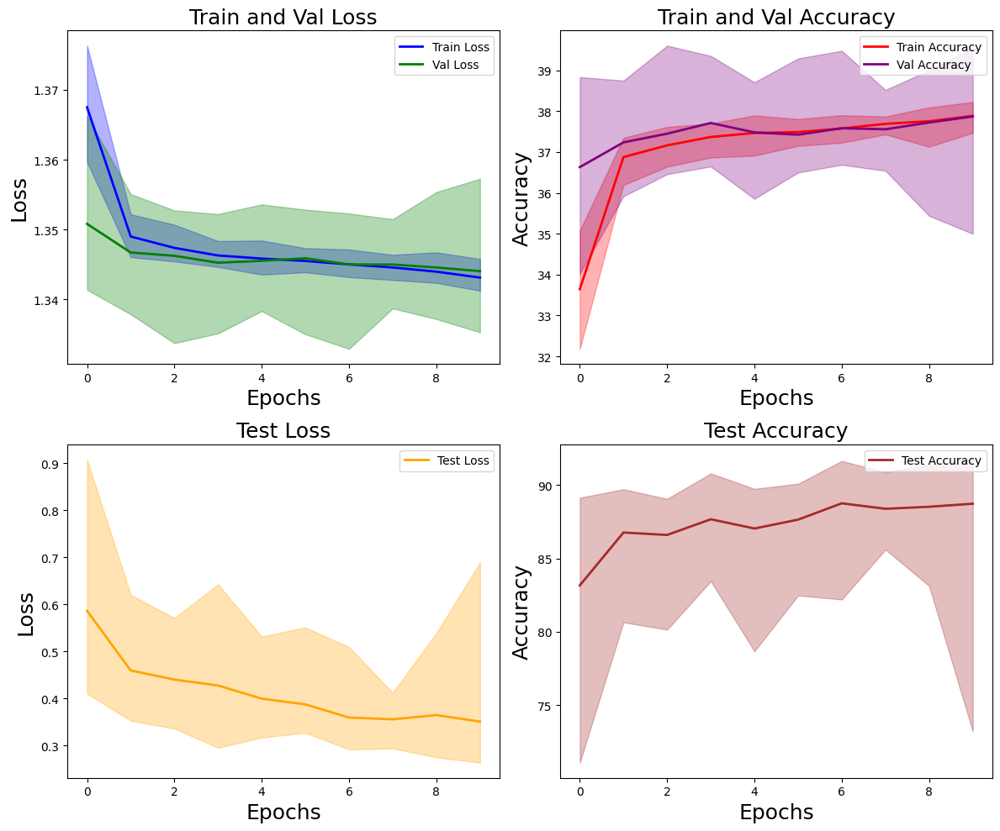

Data saved to forward_f6_resnet.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=0.0005,
    batch_size=32,
    num_epochs=10,
    times=10,
    method='forward',
    T_matrix=T_matrix,
    model_name='resnet',
    csv_path='forward_f6_resnet.csv'
)

resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.10it/s]


Noisy Loss: 1.3670,Validation Loss: 0.3345, Accuracy: 37.60% (1805/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.69it/s]


Test Loss: 0.4172, Accuracy: 88.10% (3524/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 66.23it/s]


Noisy Loss: 1.3679,Validation Loss: 0.3203, Accuracy: 36.88% (1770/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.42it/s]


Test Loss: 0.4156, Accuracy: 85.90% (3436/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 65.26it/s]


Noisy Loss: 1.3653,Validation Loss: 0.2078, Accuracy: 37.96% (1822/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.19it/s]


Test Loss: 0.3093, Accuracy: 90.22% (3609/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.64it/s]


Noisy Loss: 1.3664,Validation Loss: 0.2527, Accuracy: 37.31% (1791/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.68it/s]


Test Loss: 0.3436, Accuracy: 89.60% (3584/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.13it/s]


Noisy Loss: 1.3658,Validation Loss: 0.2446, Accuracy: 37.83% (1816/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.01it/s]


Test Loss: 0.3304, Accuracy: 90.85% (3634/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.59it/s]


Noisy Loss: 1.3662,Validation Loss: 0.2309, Accuracy: 37.50% (1800/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.18it/s]


Test Loss: 0.3619, Accuracy: 89.85% (3594/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.14it/s]


Noisy Loss: 1.3649,Validation Loss: 0.1964, Accuracy: 38.08% (1828/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.72it/s]


Test Loss: 0.3187, Accuracy: 90.33% (3613/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.90it/s]


Noisy Loss: 1.3664,Validation Loss: 0.2761, Accuracy: 37.54% (1802/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.35it/s]


Test Loss: 0.3213, Accuracy: 89.15% (3566/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.95it/s]


Noisy Loss: 1.3655,Validation Loss: 0.2423, Accuracy: 37.73% (1811/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.86it/s]


Test Loss: 0.2697, Accuracy: 92.33% (3693/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.83it/s]


Noisy Loss: 1.3666,Validation Loss: 0.3041, Accuracy: 37.42% (1796/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.51it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.3382, Accuracy: 89.55% (3582/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.25it/s]


Test Loss: 0.3187, Accuracy: 90.33% (3613/4000)
finished  1  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 64.97it/s]


Noisy Loss: 1.3661,Validation Loss: 0.2348, Accuracy: 37.62% (1806/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.86it/s]


Test Loss: 0.5623, Accuracy: 88.55% (3542/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 64.89it/s]


Noisy Loss: 1.3682,Validation Loss: 0.2597, Accuracy: 36.08% (1732/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.39it/s]


Test Loss: 0.5325, Accuracy: 83.58% (3343/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.73it/s]


Noisy Loss: 1.3661,Validation Loss: 0.2501, Accuracy: 37.90% (1819/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.14it/s]


Test Loss: 0.4317, Accuracy: 88.05% (3522/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.74it/s]


Noisy Loss: 1.3656,Validation Loss: 0.2643, Accuracy: 37.85% (1817/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.44it/s]


Test Loss: 0.4049, Accuracy: 89.08% (3563/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.71it/s]


Noisy Loss: 1.3654,Validation Loss: 0.2078, Accuracy: 37.69% (1809/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.33it/s]


Test Loss: 0.4371, Accuracy: 89.12% (3565/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.51it/s]


Noisy Loss: 1.3648,Validation Loss: 0.1814, Accuracy: 38.08% (1828/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.57it/s]


Test Loss: 0.3621, Accuracy: 89.20% (3568/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.37it/s]


Noisy Loss: 1.3657,Validation Loss: 0.2566, Accuracy: 37.85% (1817/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.45it/s]


Test Loss: 0.3523, Accuracy: 88.90% (3556/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.25it/s]


Noisy Loss: 1.3665,Validation Loss: 0.2566, Accuracy: 37.38% (1794/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.34it/s]


Test Loss: 0.4645, Accuracy: 87.78% (3511/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 66.89it/s]


Noisy Loss: 1.3649,Validation Loss: 0.2559, Accuracy: 38.02% (1825/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.87it/s]


Test Loss: 0.3645, Accuracy: 89.95% (3598/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.76it/s]


Noisy Loss: 1.3651,Validation Loss: 0.2347, Accuracy: 38.04% (1826/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.90it/s]


Test Loss: 0.4549, Accuracy: 88.38% (3535/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.69it/s]


Test Loss: 0.3621, Accuracy: 89.20% (3568/4000)
finished  2  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.48it/s]


Noisy Loss: 1.3662,Validation Loss: 0.2221, Accuracy: 37.60% (1805/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.68it/s]


Test Loss: 0.3564, Accuracy: 89.50% (3580/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 66.79it/s]


Noisy Loss: 1.3695,Validation Loss: 0.2877, Accuracy: 35.73% (1715/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.31it/s]


Test Loss: 0.7350, Accuracy: 79.80% (3192/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 65.98it/s]


Noisy Loss: 1.3664,Validation Loss: 0.2511, Accuracy: 37.25% (1788/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.61it/s]


Test Loss: 0.3692, Accuracy: 88.45% (3538/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 64.96it/s]


Noisy Loss: 1.3660,Validation Loss: 0.2117, Accuracy: 37.62% (1806/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.08it/s]


Test Loss: 0.3212, Accuracy: 90.65% (3626/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.57it/s]


Noisy Loss: 1.3656,Validation Loss: 0.1288, Accuracy: 37.54% (1802/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.08it/s]


Test Loss: 0.3347, Accuracy: 90.90% (3636/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 65.23it/s]


Noisy Loss: 1.3709,Validation Loss: 0.2853, Accuracy: 34.75% (1668/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.76it/s]


Test Loss: 0.5464, Accuracy: 82.10% (3284/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.14it/s]


Noisy Loss: 1.3691,Validation Loss: 0.2933, Accuracy: 35.88% (1722/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.59it/s]


Test Loss: 0.5312, Accuracy: 83.58% (3343/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.56it/s]


Noisy Loss: 1.3657,Validation Loss: 0.1967, Accuracy: 37.60% (1805/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.04it/s]


Test Loss: 0.2940, Accuracy: 91.55% (3662/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.98it/s]


Noisy Loss: 1.3651,Validation Loss: 0.1572, Accuracy: 37.88% (1818/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.56it/s]


Test Loss: 0.3241, Accuracy: 91.90% (3676/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.41it/s]


Noisy Loss: 1.3664,Validation Loss: 0.1996, Accuracy: 37.06% (1779/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.97it/s]


Test Loss: 0.4098, Accuracy: 88.75% (3550/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.66it/s]


Test Loss: 0.3347, Accuracy: 90.90% (3636/4000)
finished  3  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 66.15it/s]


Noisy Loss: 1.3688,Validation Loss: 0.3410, Accuracy: 36.60% (1757/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.93it/s]


Test Loss: 0.7000, Accuracy: 85.67% (3427/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.03it/s]


Noisy Loss: 1.3687,Validation Loss: 0.2639, Accuracy: 36.25% (1740/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.76it/s]


Test Loss: 0.5819, Accuracy: 87.38% (3495/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 65.14it/s]


Noisy Loss: 1.3762,Validation Loss: 0.6742, Accuracy: 32.29% (1550/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.60it/s]


Test Loss: 1.3268, Accuracy: 59.48% (2379/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 66.77it/s]


Noisy Loss: 1.3668,Validation Loss: 0.1957, Accuracy: 37.10% (1781/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.28it/s]


Test Loss: 0.3990, Accuracy: 90.58% (3623/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.51it/s]


Noisy Loss: 1.3677,Validation Loss: 0.1791, Accuracy: 36.40% (1747/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.40it/s]


Test Loss: 0.4323, Accuracy: 87.88% (3515/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.00it/s]


Noisy Loss: 1.3667,Validation Loss: 0.2101, Accuracy: 37.33% (1792/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.01it/s]


Test Loss: 0.3554, Accuracy: 90.33% (3613/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 64.01it/s]


Noisy Loss: 1.3667,Validation Loss: 0.2149, Accuracy: 37.02% (1777/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.72it/s]


Test Loss: 0.3234, Accuracy: 90.70% (3628/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.38it/s]


Noisy Loss: 1.3680,Validation Loss: 0.2834, Accuracy: 36.85% (1769/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.77it/s]


Test Loss: 0.4222, Accuracy: 89.75% (3590/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 65.51it/s]


Noisy Loss: 1.3670,Validation Loss: 0.2050, Accuracy: 36.83% (1768/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.55it/s]


Test Loss: 0.3604, Accuracy: 89.53% (3581/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.73it/s]


Noisy Loss: 1.3670,Validation Loss: 0.2123, Accuracy: 36.69% (1761/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.31it/s]


Test Loss: 0.3703, Accuracy: 89.45% (3578/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.69it/s]


Test Loss: 0.4323, Accuracy: 87.88% (3515/4000)
finished  4  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 65.91it/s]


Noisy Loss: 1.3655,Validation Loss: 0.2088, Accuracy: 37.54% (1802/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.29it/s]


Test Loss: 0.4355, Accuracy: 89.33% (3573/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.01it/s]


Noisy Loss: 1.3642,Validation Loss: 0.1662, Accuracy: 38.02% (1825/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.63it/s]


Test Loss: 0.4212, Accuracy: 89.33% (3573/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.36it/s]


Noisy Loss: 1.3641,Validation Loss: 0.2206, Accuracy: 38.46% (1846/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.75it/s]


Test Loss: 0.3540, Accuracy: 90.67% (3627/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 65.26it/s]


Noisy Loss: 1.3645,Validation Loss: 0.2508, Accuracy: 38.08% (1828/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.85it/s]


Test Loss: 0.3245, Accuracy: 89.58% (3583/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.18it/s]


Noisy Loss: 1.3637,Validation Loss: 0.1868, Accuracy: 38.79% (1862/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.07it/s]


Test Loss: 0.3297, Accuracy: 90.80% (3632/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.42it/s]


Noisy Loss: 1.3637,Validation Loss: 0.1639, Accuracy: 38.40% (1843/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.56it/s]


Test Loss: 0.3107, Accuracy: 90.38% (3615/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.46it/s]


Noisy Loss: 1.3642,Validation Loss: 0.2566, Accuracy: 38.75% (1860/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 112.67it/s]


Test Loss: 0.2996, Accuracy: 91.83% (3673/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.44it/s]


Noisy Loss: 1.3647,Validation Loss: 0.1942, Accuracy: 38.08% (1828/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.92it/s]


Test Loss: 0.3351, Accuracy: 90.35% (3614/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 65.43it/s]


Noisy Loss: 1.3639,Validation Loss: 0.1561, Accuracy: 38.21% (1834/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.75it/s]


Test Loss: 0.2960, Accuracy: 91.05% (3642/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 64.45it/s]


Noisy Loss: 1.3651,Validation Loss: 0.1986, Accuracy: 37.62% (1806/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.29it/s]


Test Loss: 0.4488, Accuracy: 87.83% (3513/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.48it/s]


Test Loss: 0.2960, Accuracy: 91.05% (3642/4000)
finished  5  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.70it/s]


Noisy Loss: 1.3711,Validation Loss: 0.3449, Accuracy: 34.52% (1657/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.96it/s]


Test Loss: 0.6624, Accuracy: 79.35% (3174/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.99it/s]


Noisy Loss: 1.3675,Validation Loss: 0.2431, Accuracy: 36.56% (1755/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.05it/s]


Test Loss: 0.3758, Accuracy: 87.62% (3505/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.03it/s]


Noisy Loss: 1.3685,Validation Loss: 0.3060, Accuracy: 36.35% (1745/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.48it/s]


Test Loss: 0.3900, Accuracy: 88.25% (3530/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.01it/s]


Noisy Loss: 1.3669,Validation Loss: 0.2321, Accuracy: 36.85% (1769/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.66it/s]


Test Loss: 0.3167, Accuracy: 89.95% (3598/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.67it/s]


Noisy Loss: 1.3670,Validation Loss: 0.2451, Accuracy: 37.19% (1785/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.33it/s]


Test Loss: 0.3582, Accuracy: 90.20% (3608/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 62.62it/s]


Noisy Loss: 1.3706,Validation Loss: 0.4055, Accuracy: 34.96% (1678/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.79it/s]


Test Loss: 0.5324, Accuracy: 81.00% (3240/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.70it/s]


Noisy Loss: 1.3665,Validation Loss: 0.2203, Accuracy: 37.15% (1783/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.26it/s]


Test Loss: 0.3011, Accuracy: 91.22% (3649/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 66.68it/s]


Noisy Loss: 1.3668,Validation Loss: 0.1972, Accuracy: 36.96% (1774/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.27it/s]


Test Loss: 0.3391, Accuracy: 90.25% (3610/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 64.45it/s]


Noisy Loss: 1.3673,Validation Loss: 0.2107, Accuracy: 36.73% (1763/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.76it/s]


Test Loss: 0.3261, Accuracy: 90.25% (3610/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 66.33it/s]


Noisy Loss: 1.3663,Validation Loss: 0.2605, Accuracy: 37.54% (1802/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.10it/s]


Test Loss: 0.2967, Accuracy: 91.67% (3667/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.15it/s]


Test Loss: 0.3391, Accuracy: 90.25% (3610/4000)
finished  6  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.76it/s]


Noisy Loss: 1.3668,Validation Loss: 0.3024, Accuracy: 36.98% (1775/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.68it/s]


Test Loss: 0.3717, Accuracy: 88.17% (3527/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.19it/s]


Noisy Loss: 1.3665,Validation Loss: 0.2022, Accuracy: 37.02% (1777/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.20it/s]


Test Loss: 0.4248, Accuracy: 87.78% (3511/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.99it/s]


Noisy Loss: 1.3658,Validation Loss: 0.2529, Accuracy: 37.52% (1801/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.45it/s]


Test Loss: 0.3172, Accuracy: 88.95% (3558/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.45it/s]


Noisy Loss: 1.3655,Validation Loss: 0.2170, Accuracy: 37.81% (1815/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.46it/s]


Test Loss: 0.3074, Accuracy: 90.12% (3605/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 64.34it/s]


Noisy Loss: 1.3663,Validation Loss: 0.2707, Accuracy: 37.38% (1794/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.79it/s]


Test Loss: 0.3468, Accuracy: 87.80% (3512/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.24it/s]


Noisy Loss: 1.3654,Validation Loss: 0.2493, Accuracy: 38.40% (1843/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.58it/s]


Test Loss: 0.3159, Accuracy: 90.72% (3629/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.25it/s]


Noisy Loss: 1.3675,Validation Loss: 0.2733, Accuracy: 36.62% (1758/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.32it/s]


Test Loss: 0.4465, Accuracy: 85.65% (3426/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.43it/s]


Noisy Loss: 1.3666,Validation Loss: 0.3463, Accuracy: 37.50% (1800/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 83.97it/s]


Test Loss: 0.3073, Accuracy: 89.85% (3594/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.34it/s]


Noisy Loss: 1.3652,Validation Loss: 0.2104, Accuracy: 37.73% (1811/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.64it/s]


Test Loss: 0.2770, Accuracy: 91.00% (3640/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 62.77it/s]


Noisy Loss: 1.3644,Validation Loss: 0.1589, Accuracy: 37.90% (1819/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.00it/s]


Test Loss: 0.2568, Accuracy: 91.95% (3678/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.26it/s]


Test Loss: 0.2568, Accuracy: 91.95% (3678/4000)
finished  7  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.45it/s]


Noisy Loss: 1.3639,Validation Loss: 0.1674, Accuracy: 38.52% (1849/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.99it/s]


Test Loss: 0.4367, Accuracy: 89.03% (3561/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 65.24it/s]


Noisy Loss: 1.3652,Validation Loss: 0.3104, Accuracy: 38.40% (1843/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.56it/s]


Test Loss: 0.3808, Accuracy: 89.15% (3566/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 65.03it/s]


Noisy Loss: 1.3655,Validation Loss: 0.2819, Accuracy: 37.83% (1816/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.55it/s]


Test Loss: 0.3435, Accuracy: 89.03% (3561/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.85it/s]


Noisy Loss: 1.3686,Validation Loss: 0.3629, Accuracy: 36.40% (1747/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.19it/s]


Test Loss: 0.6249, Accuracy: 80.80% (3232/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 66.65it/s]


Noisy Loss: 1.3651,Validation Loss: 0.2939, Accuracy: 38.35% (1841/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.18it/s]


Test Loss: 0.3151, Accuracy: 90.10% (3604/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.79it/s]


Noisy Loss: 1.3654,Validation Loss: 0.2729, Accuracy: 38.17% (1832/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.44it/s]


Test Loss: 0.4160, Accuracy: 86.97% (3479/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 65.52it/s]


Noisy Loss: 1.3659,Validation Loss: 0.3132, Accuracy: 37.85% (1817/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.19it/s]


Test Loss: 0.3459, Accuracy: 88.50% (3540/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.98it/s]


Noisy Loss: 1.3661,Validation Loss: 0.2583, Accuracy: 37.25% (1788/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.75it/s]


Test Loss: 0.4105, Accuracy: 85.33% (3413/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 65.10it/s]


Noisy Loss: 1.3645,Validation Loss: 0.2106, Accuracy: 38.19% (1833/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.02it/s]


Test Loss: 0.3164, Accuracy: 90.62% (3625/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.68it/s]


Noisy Loss: 1.3643,Validation Loss: 0.2277, Accuracy: 38.48% (1847/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.43it/s]


Test Loss: 0.2772, Accuracy: 91.03% (3641/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.78it/s]


Test Loss: 0.4367, Accuracy: 89.03% (3561/4000)
finished  8  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.77it/s]


Noisy Loss: 1.3675,Validation Loss: 0.2730, Accuracy: 37.06% (1779/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.55it/s]


Test Loss: 1.0958, Accuracy: 84.75% (3390/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.57it/s]


Noisy Loss: 1.3659,Validation Loss: 0.3447, Accuracy: 37.83% (1816/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 109.07it/s]


Test Loss: 0.3784, Accuracy: 89.12% (3565/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 65.26it/s]


Noisy Loss: 1.3664,Validation Loss: 0.2906, Accuracy: 37.46% (1798/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.37it/s]


Test Loss: 0.4317, Accuracy: 87.15% (3486/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.88it/s]


Noisy Loss: 1.3670,Validation Loss: 0.4350, Accuracy: 38.10% (1829/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.52it/s]


Test Loss: 0.3991, Accuracy: 88.45% (3538/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.16it/s]


Noisy Loss: 1.3662,Validation Loss: 0.2619, Accuracy: 37.75% (1812/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.68it/s]


Test Loss: 0.4351, Accuracy: 88.08% (3523/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 64.66it/s]


Noisy Loss: 1.3639,Validation Loss: 0.2078, Accuracy: 38.71% (1858/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.45it/s]


Test Loss: 0.3161, Accuracy: 90.72% (3629/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 65.87it/s]


Noisy Loss: 1.3653,Validation Loss: 0.2509, Accuracy: 37.85% (1817/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.79it/s]


Test Loss: 0.3945, Accuracy: 89.17% (3567/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.37it/s]


Noisy Loss: 1.3657,Validation Loss: 0.2592, Accuracy: 37.92% (1820/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 112.14it/s]


Test Loss: 0.4526, Accuracy: 87.90% (3516/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.20it/s]


Noisy Loss: 1.3650,Validation Loss: 0.3104, Accuracy: 38.44% (1845/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.40it/s]


Test Loss: 0.3275, Accuracy: 90.22% (3609/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 66.61it/s]


Noisy Loss: 1.3647,Validation Loss: 0.2407, Accuracy: 38.17% (1832/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.07it/s]


Test Loss: 0.3092, Accuracy: 90.53% (3621/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.30it/s]


Test Loss: 0.3161, Accuracy: 90.72% (3629/4000)
finished  9  epoch
resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.91it/s]


Noisy Loss: 1.3719,Validation Loss: 0.3446, Accuracy: 34.25% (1644/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.38it/s]


Test Loss: 1.0813, Accuracy: 72.38% (2895/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.11it/s]


Noisy Loss: 1.3672,Validation Loss: 0.3488, Accuracy: 37.15% (1783/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.01it/s]


Test Loss: 0.3913, Accuracy: 86.75% (3470/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.56it/s]


Noisy Loss: 1.3652,Validation Loss: 0.1934, Accuracy: 37.96% (1822/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 106.56it/s]


Test Loss: 0.3628, Accuracy: 89.58% (3583/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.86it/s]


Noisy Loss: 1.3659,Validation Loss: 0.1997, Accuracy: 37.35% (1793/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.47it/s]


Test Loss: 0.3666, Accuracy: 89.47% (3579/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 64.97it/s]


Noisy Loss: 1.3650,Validation Loss: 0.1406, Accuracy: 37.79% (1814/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 124.64it/s]


Test Loss: 0.3305, Accuracy: 90.55% (3622/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 63.03it/s]


Noisy Loss: 1.3668,Validation Loss: 0.3050, Accuracy: 36.94% (1773/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.88it/s]


Test Loss: 0.4322, Accuracy: 86.17% (3447/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.23it/s]


Noisy Loss: 1.3652,Validation Loss: 0.2347, Accuracy: 38.15% (1831/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.98it/s]


Test Loss: 0.2942, Accuracy: 90.85% (3634/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.31it/s]


Noisy Loss: 1.3650,Validation Loss: 0.2537, Accuracy: 38.35% (1841/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.63it/s]


Test Loss: 0.2749, Accuracy: 91.30% (3652/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.29it/s]


Noisy Loss: 1.3656,Validation Loss: 0.2342, Accuracy: 37.40% (1795/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.96it/s]


Test Loss: 0.3247, Accuracy: 89.78% (3591/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 59.76it/s]


Noisy Loss: 1.3645,Validation Loss: 0.1568, Accuracy: 38.29% (1838/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.66it/s]


Test Loss: 0.2749, Accuracy: 91.83% (3673/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.57it/s]


Test Loss: 0.3305, Accuracy: 90.55% (3622/4000)
finished  10  epoch
min_train_loss [0.25754815662900604, 0.21217115152006347, 0.20552350113478798, 0.2639529438689351, 0.22616782441735267, 0.25695717648913463, 0.23584771553675335, 0.43665898056079944, 0.2980869995802641, 0.2525898608006537]
min_val_loss [0.19641009996334713, 0.1813567590713501, 0.12875744891663393, 0.17910343969861667, 0.15613313590486844, 0.19715153540174166, 0.15891416355967522, 0.16743491893013318, 0.20779170180360476, 0.1405954058965047]
min_train_accuracy [38.291666666666664, 37.708333333333336, 37.953125, 37.864583333333336, 37.9375, 38.302083333333336, 38.536458333333336, 33.192708333333336, 37.703125, 37.760416666666664]
min_val_accuracy [38.083333333333336, 38.083333333333336, 37.541666666666664, 36.395833333333336, 38.208333333333336, 36.958333333333336, 37.895833333333336, 38.520833333333336, 38.708333333333336, 37.791666666666664]
min_train_noise_loss [1.3648031187057494, 1.3654770638545355, 1.36494551797707

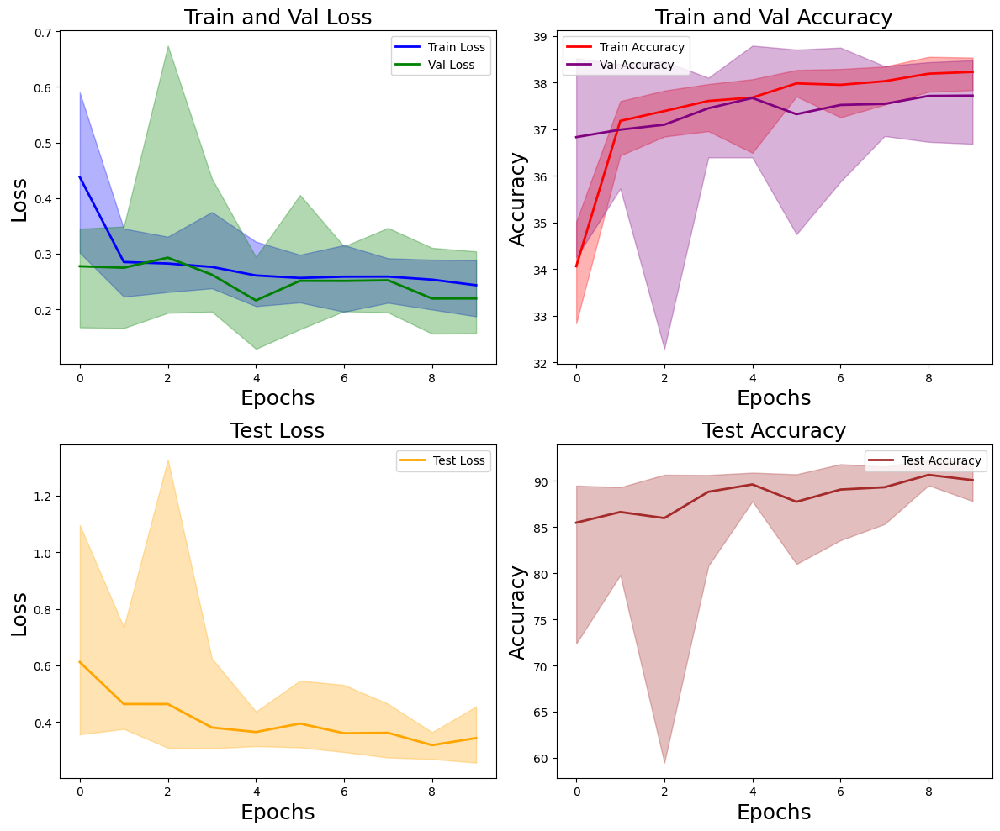

Data saved to importance_f6_resnet.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=0.0005,
    batch_size=32,
    num_epochs=10,
    times=10,
    method='importance',
    T_matrix=T_matrix,
    model_name='resnet',
    csv_path="importance_f6_resnet.csv"
)

resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 64.58it/s]


Noisy Loss: 1.3698,Validation Loss: 0.3437, Accuracy: 35.35% (1697/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 111.56it/s]


Test Loss: 0.5349, Accuracy: 81.00% (3240/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 61.66it/s]


Noisy Loss: 1.3661,Validation Loss: 0.2245, Accuracy: 37.48% (1799/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.09it/s]


Test Loss: 0.3361, Accuracy: 90.67% (3627/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.50it/s]


Noisy Loss: 1.3665,Validation Loss: 0.2098, Accuracy: 37.00% (1776/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.24it/s]


Test Loss: 0.3198, Accuracy: 89.75% (3590/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 65.89it/s]


Noisy Loss: 1.3687,Validation Loss: 0.3409, Accuracy: 36.38% (1746/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.43it/s]


Test Loss: 0.4395, Accuracy: 85.08% (3403/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.77it/s]


Noisy Loss: 1.3702,Validation Loss: 0.3724, Accuracy: 34.96% (1678/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.97it/s]


Test Loss: 0.4663, Accuracy: 82.38% (3295/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.56it/s]


Noisy Loss: 1.3661,Validation Loss: 0.1880, Accuracy: 37.27% (1789/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.97it/s]


Test Loss: 0.2868, Accuracy: 91.55% (3662/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 64.35it/s]


Noisy Loss: 1.3663,Validation Loss: 0.2567, Accuracy: 37.62% (1806/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.66it/s]


Test Loss: 0.3077, Accuracy: 90.05% (3602/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.88it/s]


Noisy Loss: 1.3663,Validation Loss: 0.2322, Accuracy: 37.54% (1802/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 112.22it/s]


Test Loss: 0.2818, Accuracy: 91.10% (3644/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 65.82it/s]


Noisy Loss: 1.3661,Validation Loss: 0.2579, Accuracy: 37.44% (1797/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.82it/s]


Test Loss: 0.2804, Accuracy: 91.00% (3640/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 66.00it/s]


Noisy Loss: 1.3657,Validation Loss: 0.2238, Accuracy: 37.50% (1800/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.19it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.2519, Accuracy: 92.53% (3701/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.38it/s]


Test Loss: 0.2868, Accuracy: 91.55% (3662/4000)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.39it/s]


Noisy Loss: 1.3854,Validation Loss: 0.1992, Accuracy: 24.54% (1178/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.16it/s]


Test Loss: 0.2936, Accuracy: 91.30% (3652/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.61it/s]


Noisy Loss: 1.3855,Validation Loss: 0.1940, Accuracy: 24.54% (1178/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.70it/s]


Test Loss: 0.2888, Accuracy: 91.38% (3655/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.48it/s]


Noisy Loss: 1.3854,Validation Loss: 0.1901, Accuracy: 24.56% (1179/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.26it/s]


Test Loss: 0.2914, Accuracy: 91.35% (3654/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.66it/s]


Noisy Loss: 1.3855,Validation Loss: 0.1881, Accuracy: 24.56% (1179/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.58it/s]


Test Loss: 0.2906, Accuracy: 91.35% (3654/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.72it/s]


Noisy Loss: 1.3855,Validation Loss: 0.1836, Accuracy: 24.60% (1181/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.87it/s]


Test Loss: 0.2909, Accuracy: 91.38% (3655/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.96it/s]


Test Loss: 0.2909, Accuracy: 91.38% (3655/4000)
finished  1  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.76it/s]


Noisy Loss: 1.3842,Validation Loss: 0.1832, Accuracy: 26.10% (1253/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.67it/s]


Test Loss: 0.2930, Accuracy: 91.42% (3657/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.70it/s]


Noisy Loss: 1.3843,Validation Loss: 0.1802, Accuracy: 26.12% (1254/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.12it/s]


Test Loss: 0.2903, Accuracy: 91.45% (3658/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.54it/s]


Noisy Loss: 1.3843,Validation Loss: 0.1775, Accuracy: 26.08% (1252/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.21it/s]


Test Loss: 0.2919, Accuracy: 91.47% (3659/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.63it/s]


Noisy Loss: 1.3843,Validation Loss: 0.1745, Accuracy: 26.12% (1254/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.86it/s]


Test Loss: 0.2932, Accuracy: 91.47% (3659/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.62it/s]


Noisy Loss: 1.3843,Validation Loss: 0.1709, Accuracy: 26.15% (1255/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.04it/s]


Test Loss: 0.2920, Accuracy: 91.50% (3660/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.02it/s]


Test Loss: 0.2920, Accuracy: 91.50% (3660/4000)
finished  2  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.03it/s]


Noisy Loss: 1.3848,Validation Loss: 0.1643, Accuracy: 25.15% (1207/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.59it/s]


Test Loss: 0.2958, Accuracy: 91.53% (3661/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.87it/s]


Noisy Loss: 1.3848,Validation Loss: 0.1604, Accuracy: 25.12% (1206/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.92it/s]


Test Loss: 0.2942, Accuracy: 91.65% (3666/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.67it/s]


Noisy Loss: 1.3848,Validation Loss: 0.1577, Accuracy: 25.10% (1205/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.44it/s]


Test Loss: 0.2954, Accuracy: 91.70% (3668/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.54it/s]


Noisy Loss: 1.3848,Validation Loss: 0.1550, Accuracy: 25.10% (1205/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.71it/s]


Test Loss: 0.2973, Accuracy: 91.67% (3667/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.42it/s]


Noisy Loss: 1.3848,Validation Loss: 0.1531, Accuracy: 25.12% (1206/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.11it/s]


Test Loss: 0.3001, Accuracy: 91.62% (3665/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.86it/s]


Test Loss: 0.3001, Accuracy: 91.62% (3665/4000)
finished  3  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.76it/s]


Noisy Loss: 1.3848,Validation Loss: 0.1491, Accuracy: 25.33% (1216/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.54it/s]


Test Loss: 0.2982, Accuracy: 91.65% (3666/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.76it/s]


Noisy Loss: 1.3848,Validation Loss: 0.1458, Accuracy: 25.31% (1215/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.55it/s]


Test Loss: 0.2992, Accuracy: 91.67% (3667/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.75it/s]


Noisy Loss: 1.3848,Validation Loss: 0.1437, Accuracy: 25.29% (1214/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.06it/s]


Test Loss: 0.2990, Accuracy: 91.62% (3665/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.48it/s]


Noisy Loss: 1.3848,Validation Loss: 0.1420, Accuracy: 25.27% (1213/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.85it/s]


Test Loss: 0.3003, Accuracy: 91.65% (3666/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.76it/s]


Noisy Loss: 1.3848,Validation Loss: 0.1390, Accuracy: 25.25% (1212/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.20it/s]


Test Loss: 0.3016, Accuracy: 91.67% (3667/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.48it/s]


Test Loss: 0.3016, Accuracy: 91.67% (3667/4000)
finished  4  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.66it/s]


Noisy Loss: 1.3847,Validation Loss: 0.1453, Accuracy: 25.40% (1219/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.02it/s]


Test Loss: 0.3039, Accuracy: 91.55% (3662/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.41it/s]


Noisy Loss: 1.3846,Validation Loss: 0.1413, Accuracy: 25.42% (1220/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.53it/s]


Test Loss: 0.2994, Accuracy: 91.70% (3668/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.72it/s]


Noisy Loss: 1.3847,Validation Loss: 0.1401, Accuracy: 25.42% (1220/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.92it/s]


Test Loss: 0.3024, Accuracy: 91.75% (3670/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.72it/s]


Noisy Loss: 1.3847,Validation Loss: 0.1376, Accuracy: 25.46% (1222/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.68it/s]


Test Loss: 0.3038, Accuracy: 91.67% (3667/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.65it/s]


Noisy Loss: 1.3847,Validation Loss: 0.1353, Accuracy: 25.38% (1218/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.18it/s]


Test Loss: 0.3077, Accuracy: 91.72% (3669/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.60it/s]


Test Loss: 0.3077, Accuracy: 91.72% (3669/4000)
finished  5  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.63it/s]


Noisy Loss: 1.3835,Validation Loss: 0.1325, Accuracy: 26.27% (1261/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.58it/s]


Test Loss: 0.3076, Accuracy: 91.72% (3669/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.74it/s]


Noisy Loss: 1.3835,Validation Loss: 0.1305, Accuracy: 26.29% (1262/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.07it/s]


Test Loss: 0.3121, Accuracy: 91.70% (3668/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.53it/s]


Noisy Loss: 1.3835,Validation Loss: 0.1286, Accuracy: 26.27% (1261/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.32it/s]


Test Loss: 0.3121, Accuracy: 91.75% (3670/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.65it/s]


Noisy Loss: 1.3835,Validation Loss: 0.1269, Accuracy: 26.31% (1263/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.22it/s]


Test Loss: 0.3120, Accuracy: 91.90% (3676/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.82it/s]


Noisy Loss: 1.3835,Validation Loss: 0.1246, Accuracy: 26.21% (1258/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.02it/s]


Test Loss: 0.3110, Accuracy: 91.83% (3673/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.72it/s]


Test Loss: 0.3110, Accuracy: 91.83% (3673/4000)
finished  6  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.56it/s]


Noisy Loss: 1.3854,Validation Loss: 0.1154, Accuracy: 24.75% (1188/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.65it/s]


Test Loss: 0.3172, Accuracy: 91.75% (3670/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.71it/s]


Noisy Loss: 1.3854,Validation Loss: 0.1141, Accuracy: 24.73% (1187/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.11it/s]


Test Loss: 0.3154, Accuracy: 91.78% (3671/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.40it/s]


Noisy Loss: 1.3854,Validation Loss: 0.1122, Accuracy: 24.77% (1189/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.42it/s]


Test Loss: 0.3185, Accuracy: 91.80% (3672/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.83it/s]


Noisy Loss: 1.3854,Validation Loss: 0.1112, Accuracy: 24.77% (1189/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.73it/s]


Test Loss: 0.3198, Accuracy: 91.78% (3671/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.98it/s]


Noisy Loss: 1.3854,Validation Loss: 0.1091, Accuracy: 24.73% (1187/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.03it/s]


Test Loss: 0.3226, Accuracy: 91.88% (3675/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.27it/s]


Test Loss: 0.3226, Accuracy: 91.88% (3675/4000)
finished  7  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.96it/s]


Noisy Loss: 1.3845,Validation Loss: 0.1114, Accuracy: 25.23% (1211/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.59it/s]


Test Loss: 0.3224, Accuracy: 91.92% (3677/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.67it/s]


Noisy Loss: 1.3845,Validation Loss: 0.1101, Accuracy: 25.27% (1213/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.94it/s]


Test Loss: 0.3242, Accuracy: 91.78% (3671/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.91it/s]


Noisy Loss: 1.3845,Validation Loss: 0.1084, Accuracy: 25.21% (1210/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.01it/s]


Test Loss: 0.3252, Accuracy: 91.90% (3676/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.69it/s]


Noisy Loss: 1.3845,Validation Loss: 0.1066, Accuracy: 25.17% (1208/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.88it/s]


Test Loss: 0.3284, Accuracy: 91.97% (3679/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.60it/s]


Noisy Loss: 1.3845,Validation Loss: 0.1059, Accuracy: 25.17% (1208/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.04it/s]


Test Loss: 0.3284, Accuracy: 91.92% (3677/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.15it/s]


Test Loss: 0.3284, Accuracy: 91.92% (3677/4000)
finished  8  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.89it/s]


Noisy Loss: 1.3855,Validation Loss: 0.1084, Accuracy: 25.15% (1207/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.94it/s]


Test Loss: 0.3303, Accuracy: 91.92% (3677/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.83it/s]


Noisy Loss: 1.3855,Validation Loss: 0.1064, Accuracy: 25.12% (1206/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.56it/s]


Test Loss: 0.3323, Accuracy: 91.97% (3679/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.73it/s]


Noisy Loss: 1.3855,Validation Loss: 0.1052, Accuracy: 25.12% (1206/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.94it/s]


Test Loss: 0.3351, Accuracy: 91.97% (3679/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.73it/s]


Noisy Loss: 1.3855,Validation Loss: 0.1033, Accuracy: 25.15% (1207/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.77it/s]


Test Loss: 0.3382, Accuracy: 91.83% (3673/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.70it/s]


Noisy Loss: 1.3855,Validation Loss: 0.1030, Accuracy: 25.15% (1207/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.30it/s]


Test Loss: 0.3366, Accuracy: 92.05% (3682/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.43it/s]


Test Loss: 0.3366, Accuracy: 92.05% (3682/4000)
finished  9  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.91it/s]


Noisy Loss: 1.3845,Validation Loss: 0.0932, Accuracy: 25.40% (1219/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.26it/s]


Test Loss: 0.3400, Accuracy: 91.97% (3679/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.77it/s]


Noisy Loss: 1.3845,Validation Loss: 0.0923, Accuracy: 25.42% (1220/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.00it/s]


Test Loss: 0.3409, Accuracy: 92.03% (3681/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.64it/s]


Noisy Loss: 1.3845,Validation Loss: 0.0908, Accuracy: 25.38% (1218/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.91it/s]


Test Loss: 0.3419, Accuracy: 91.92% (3677/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.70it/s]


Noisy Loss: 1.3845,Validation Loss: 0.0899, Accuracy: 25.35% (1217/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.18it/s]


Test Loss: 0.3445, Accuracy: 92.00% (3680/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.04it/s]


Noisy Loss: 1.3845,Validation Loss: 0.0883, Accuracy: 25.44% (1221/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.94it/s]


Test Loss: 0.3469, Accuracy: 91.97% (3679/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 26.10it/s]


Test Loss: 0.3469, Accuracy: 91.97% (3679/4000)
finished  10  epoch
min_train_loss [0.19126654982566835, 0.17375806450843811, 0.16120007822910945, 0.14798852334419887, 0.13555314789215725, 0.1259779390692711, 0.1184718303879102, 0.1087137990196546, 0.10081177085638046, 0.09579240386684736]
min_val_loss [0.1835818212283285, 0.1709093263274745, 0.15312622565972178, 0.1390378530088224, 0.13526140114194468, 0.1246234762825464, 0.10909358372813777, 0.10593760288075398, 0.10299725948195708, 0.08830458847315688]
min_train_accuracy [25.395833333333332, 25.052083333333332, 25.291666666666668, 25.302083333333332, 25.208333333333332, 25.0, 25.333333333333332, 25.182291666666668, 25.208333333333332, 25.151041666666668]
min_val_accuracy [24.604166666666668, 26.145833333333332, 25.125, 25.25, 25.375, 26.208333333333332, 24.729166666666668, 25.166666666666668, 25.145833333333332, 25.4375]
min_train_noise_loss [1.3847199583053589, 1.3850235430399578, 1.3849320316314697, 1.3848872502644858, 1.384966796

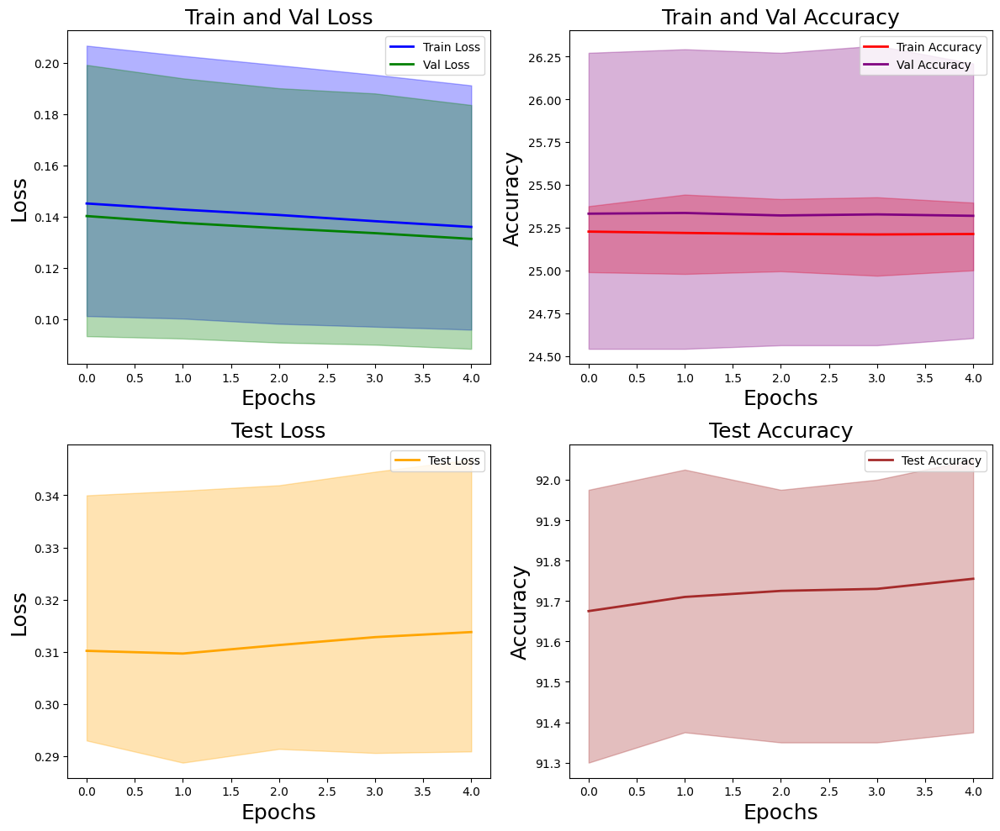

Data saved to t_revision_f6_resnet.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=5e-7,
    batch_size=256,
    num_epochs=5,
    method='t_revision',
    T_matrix=T_matrix,
    num_classes=4,
    optimizer_name='adam',
    times=10,
    model_name='resnet',
    csv_path='t_revision_f6_resnet.csv',
    )

resnet


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 62.67it/s]


Noisy Loss: 1.3684,Validation Loss: 0.3094, Accuracy: 36.12% (1734/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 111.24it/s]


Test Loss: 0.5682, Accuracy: 84.10% (3364/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.16it/s]


Noisy Loss: 1.3676,Validation Loss: 0.1998, Accuracy: 36.29% (1742/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.30it/s]


Test Loss: 0.4757, Accuracy: 84.47% (3379/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.26it/s]


Noisy Loss: 1.3660,Validation Loss: 0.2981, Accuracy: 37.58% (1804/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.00it/s]


Test Loss: 0.3108, Accuracy: 90.55% (3622/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 64.12it/s]


Noisy Loss: 1.3654,Validation Loss: 0.2111, Accuracy: 37.75% (1812/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 112.73it/s]


Test Loss: 0.3201, Accuracy: 90.17% (3607/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.62it/s]


Noisy Loss: 1.3687,Validation Loss: 0.3945, Accuracy: 36.54% (1754/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.74it/s]


Test Loss: 0.5278, Accuracy: 81.97% (3279/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 68.32it/s]


Noisy Loss: 1.3660,Validation Loss: 0.2224, Accuracy: 37.48% (1799/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.16it/s]


Test Loss: 0.4084, Accuracy: 88.33% (3533/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.12it/s]


Noisy Loss: 1.3656,Validation Loss: 0.2544, Accuracy: 37.58% (1804/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.81it/s]


Test Loss: 0.3830, Accuracy: 87.72% (3509/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:02<00:00, 65.47it/s]


Noisy Loss: 1.3659,Validation Loss: 0.2611, Accuracy: 37.33% (1792/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 110.98it/s]


Test Loss: 0.2858, Accuracy: 90.58% (3623/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 67.54it/s]


Noisy Loss: 1.3646,Validation Loss: 0.1512, Accuracy: 38.04% (1826/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.51it/s]


Test Loss: 0.2999, Accuracy: 91.00% (3640/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 62.82it/s]


Noisy Loss: 1.3666,Validation Loss: 0.2840, Accuracy: 37.10% (1781/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.70it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.4686, Accuracy: 85.67% (3427/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.44it/s]


Test Loss: 0.2999, Accuracy: 91.00% (3640/4000)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.59it/s]


Noisy Loss: 1.3801,Validation Loss: 0.1718, Accuracy: 37.54% (1802/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.09it/s]


Test Loss: 0.2764, Accuracy: 91.33% (3653/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.68it/s]


Noisy Loss: 1.3801,Validation Loss: 0.1691, Accuracy: 37.60% (1805/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.02it/s]


Test Loss: 0.2763, Accuracy: 91.38% (3655/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.83it/s]


Noisy Loss: 1.3801,Validation Loss: 0.1696, Accuracy: 37.56% (1803/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.44it/s]


Test Loss: 0.2754, Accuracy: 91.38% (3655/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.68it/s]


Noisy Loss: 1.3801,Validation Loss: 0.1645, Accuracy: 37.56% (1803/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.29it/s]


Test Loss: 0.2789, Accuracy: 91.35% (3654/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.45it/s]


Noisy Loss: 1.3801,Validation Loss: 0.1619, Accuracy: 37.56% (1803/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.14it/s]


Test Loss: 0.2797, Accuracy: 91.30% (3652/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.54it/s]


Test Loss: 0.2797, Accuracy: 91.30% (3652/4000)
finished  1  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.71it/s]


Noisy Loss: 1.3796,Validation Loss: 0.1603, Accuracy: 38.62% (1854/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.05it/s]


Test Loss: 0.2759, Accuracy: 91.40% (3656/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.82it/s]


Noisy Loss: 1.3796,Validation Loss: 0.1567, Accuracy: 38.65% (1855/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.96it/s]


Test Loss: 0.2786, Accuracy: 91.42% (3657/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.50it/s]


Noisy Loss: 1.3796,Validation Loss: 0.1541, Accuracy: 38.60% (1853/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.75it/s]


Test Loss: 0.2808, Accuracy: 91.35% (3654/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.49it/s]


Noisy Loss: 1.3796,Validation Loss: 0.1514, Accuracy: 38.60% (1853/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.79it/s]


Test Loss: 0.2790, Accuracy: 91.42% (3657/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.80it/s]


Noisy Loss: 1.3796,Validation Loss: 0.1491, Accuracy: 38.62% (1854/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.56it/s]


Test Loss: 0.2816, Accuracy: 91.45% (3658/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.84it/s]


Test Loss: 0.2816, Accuracy: 91.45% (3658/4000)
finished  2  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.79it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1505, Accuracy: 38.79% (1862/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.58it/s]


Test Loss: 0.2786, Accuracy: 91.47% (3659/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.40it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1472, Accuracy: 38.75% (1860/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.92it/s]


Test Loss: 0.2816, Accuracy: 91.45% (3658/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.67it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1461, Accuracy: 38.75% (1860/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.88it/s]


Test Loss: 0.2795, Accuracy: 91.50% (3660/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.64it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1431, Accuracy: 38.73% (1859/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.48it/s]


Test Loss: 0.2819, Accuracy: 91.53% (3661/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.57it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1413, Accuracy: 38.71% (1858/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.87it/s]


Test Loss: 0.2841, Accuracy: 91.45% (3658/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.54it/s]


Test Loss: 0.2841, Accuracy: 91.45% (3658/4000)
finished  3  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.40it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1370, Accuracy: 38.58% (1852/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.48it/s]


Test Loss: 0.2853, Accuracy: 91.42% (3657/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.75it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1360, Accuracy: 38.60% (1853/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.16it/s]


Test Loss: 0.2839, Accuracy: 91.50% (3660/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.46it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1333, Accuracy: 38.65% (1855/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.69it/s]


Test Loss: 0.2872, Accuracy: 91.47% (3659/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.65it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1329, Accuracy: 38.65% (1855/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.96it/s]


Test Loss: 0.2844, Accuracy: 91.58% (3663/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.58it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1305, Accuracy: 38.62% (1854/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.18it/s]


Test Loss: 0.2864, Accuracy: 91.53% (3661/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.72it/s]


Test Loss: 0.2864, Accuracy: 91.53% (3661/4000)
finished  4  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.64it/s]


Noisy Loss: 1.3797,Validation Loss: 0.1327, Accuracy: 38.29% (1838/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.59it/s]


Test Loss: 0.2863, Accuracy: 91.58% (3663/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.73it/s]


Noisy Loss: 1.3797,Validation Loss: 0.1299, Accuracy: 38.29% (1838/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.77it/s]


Test Loss: 0.2899, Accuracy: 91.47% (3659/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.05it/s]


Noisy Loss: 1.3797,Validation Loss: 0.1288, Accuracy: 38.27% (1837/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.64it/s]


Test Loss: 0.2891, Accuracy: 91.55% (3662/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.39it/s]


Noisy Loss: 1.3797,Validation Loss: 0.1278, Accuracy: 38.21% (1834/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.76it/s]


Test Loss: 0.2890, Accuracy: 91.58% (3663/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.63it/s]


Noisy Loss: 1.3797,Validation Loss: 0.1249, Accuracy: 38.27% (1837/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.67it/s]


Test Loss: 0.2923, Accuracy: 91.53% (3661/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.22it/s]


Test Loss: 0.2923, Accuracy: 91.53% (3661/4000)
finished  5  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.56it/s]


Noisy Loss: 1.3799,Validation Loss: 0.1216, Accuracy: 37.81% (1815/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.37it/s]


Test Loss: 0.2903, Accuracy: 91.72% (3669/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.37it/s]


Noisy Loss: 1.3799,Validation Loss: 0.1191, Accuracy: 37.79% (1814/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.44it/s]


Test Loss: 0.2936, Accuracy: 91.58% (3663/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.64it/s]


Noisy Loss: 1.3799,Validation Loss: 0.1171, Accuracy: 37.75% (1812/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.76it/s]


Test Loss: 0.2949, Accuracy: 91.60% (3664/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.65it/s]


Noisy Loss: 1.3799,Validation Loss: 0.1164, Accuracy: 37.73% (1811/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.30it/s]


Test Loss: 0.2952, Accuracy: 91.60% (3664/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.34it/s]


Noisy Loss: 1.3799,Validation Loss: 0.1154, Accuracy: 37.75% (1812/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.42it/s]


Test Loss: 0.2951, Accuracy: 91.65% (3666/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.78it/s]


Test Loss: 0.2951, Accuracy: 91.65% (3666/4000)
finished  6  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.70it/s]


Noisy Loss: 1.3793,Validation Loss: 0.1168, Accuracy: 39.17% (1880/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.18it/s]


Test Loss: 0.2956, Accuracy: 91.67% (3667/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.92it/s]


Noisy Loss: 1.3793,Validation Loss: 0.1142, Accuracy: 39.00% (1872/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.41it/s]


Test Loss: 0.2995, Accuracy: 91.58% (3663/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.69it/s]


Noisy Loss: 1.3793,Validation Loss: 0.1129, Accuracy: 39.04% (1874/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.75it/s]


Test Loss: 0.2993, Accuracy: 91.65% (3666/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.63it/s]


Noisy Loss: 1.3793,Validation Loss: 0.1123, Accuracy: 38.98% (1871/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.93it/s]


Test Loss: 0.3002, Accuracy: 91.62% (3665/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.72it/s]


Noisy Loss: 1.3793,Validation Loss: 0.1094, Accuracy: 39.08% (1876/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.57it/s]


Test Loss: 0.3040, Accuracy: 91.55% (3662/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.85it/s]


Test Loss: 0.3040, Accuracy: 91.55% (3662/4000)
finished  7  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.63it/s]


Noisy Loss: 1.3791,Validation Loss: 0.1045, Accuracy: 39.21% (1882/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.32it/s]


Test Loss: 0.3023, Accuracy: 91.67% (3667/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.44it/s]


Noisy Loss: 1.3791,Validation Loss: 0.1039, Accuracy: 39.23% (1883/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.35it/s]


Test Loss: 0.3020, Accuracy: 91.65% (3666/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.62it/s]


Noisy Loss: 1.3791,Validation Loss: 0.1024, Accuracy: 39.27% (1885/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.45it/s]


Test Loss: 0.3036, Accuracy: 91.62% (3665/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.81it/s]


Noisy Loss: 1.3791,Validation Loss: 0.1003, Accuracy: 39.25% (1884/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.54it/s]


Test Loss: 0.3074, Accuracy: 91.55% (3662/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.76it/s]


Noisy Loss: 1.3791,Validation Loss: 0.1000, Accuracy: 39.23% (1883/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.29it/s]


Test Loss: 0.3069, Accuracy: 91.62% (3665/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.71it/s]


Test Loss: 0.3069, Accuracy: 91.62% (3665/4000)
finished  8  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.51it/s]


Noisy Loss: 1.3800,Validation Loss: 0.0944, Accuracy: 37.60% (1805/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.51it/s]


Test Loss: 0.3089, Accuracy: 91.72% (3669/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.87it/s]


Noisy Loss: 1.3800,Validation Loss: 0.0939, Accuracy: 37.62% (1806/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.72it/s]


Test Loss: 0.3101, Accuracy: 91.62% (3665/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.51it/s]


Noisy Loss: 1.3800,Validation Loss: 0.0925, Accuracy: 37.62% (1806/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.56it/s]


Test Loss: 0.3106, Accuracy: 91.67% (3667/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.41it/s]


Noisy Loss: 1.3800,Validation Loss: 0.0924, Accuracy: 37.62% (1806/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.87it/s]


Test Loss: 0.3120, Accuracy: 91.65% (3666/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.87it/s]


Noisy Loss: 1.3800,Validation Loss: 0.0904, Accuracy: 37.62% (1806/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.86it/s]


Test Loss: 0.3128, Accuracy: 91.65% (3666/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.12it/s]


Test Loss: 0.3128, Accuracy: 91.65% (3666/4000)
finished  9  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.75it/s]


Noisy Loss: 1.3793,Validation Loss: 0.0946, Accuracy: 39.06% (1875/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.34it/s]


Test Loss: 0.3161, Accuracy: 91.65% (3666/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.53it/s]


Noisy Loss: 1.3793,Validation Loss: 0.0950, Accuracy: 39.10% (1877/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 25.57it/s]


Test Loss: 0.3148, Accuracy: 91.80% (3672/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.56it/s]


Noisy Loss: 1.3793,Validation Loss: 0.0928, Accuracy: 39.08% (1876/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.82it/s]


Test Loss: 0.3178, Accuracy: 91.70% (3668/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.79it/s]


Noisy Loss: 1.3793,Validation Loss: 0.0916, Accuracy: 39.08% (1876/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.43it/s]


Test Loss: 0.3196, Accuracy: 91.58% (3663/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.67it/s]


Noisy Loss: 1.3793,Validation Loss: 0.0902, Accuracy: 39.04% (1874/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.09it/s]


Test Loss: 0.3229, Accuracy: 91.65% (3666/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 24.28it/s]


Test Loss: 0.3229, Accuracy: 91.65% (3666/4000)
finished  10  epoch
min_train_loss [0.16430482844511668, 0.15331346581379574, 0.1418757891654968, 0.13270848671595256, 0.1228488822778066, 0.11513650953769684, 0.10699948092301687, 0.1015889557202657, 0.09616732239723205, 0.08903209726015726]
min_val_loss [0.161896408780625, 0.14913546568468997, 0.14133235576905703, 0.1305065868716491, 0.12488717821083571, 0.11542416599236037, 0.10935935417288228, 0.10001543634816219, 0.09042250012096606, 0.09021468205671561]
min_train_accuracy [38.84375, 38.494791666666664, 38.557291666666664, 38.572916666666664, 38.661458333333336, 38.78125, 38.447916666666664, 38.416666666666664, 38.932291666666664, 38.494791666666664]
min_val_accuracy [37.5625, 38.625, 38.708333333333336, 38.625, 38.270833333333336, 37.75, 39.083333333333336, 39.229166666666664, 37.625, 39.041666666666664]
min_train_noise_loss [1.3629993422826132, 1.3634403657913208, 1.3634112326304118, 1.3633795102437338, 1.363069748878479, 1.3628521

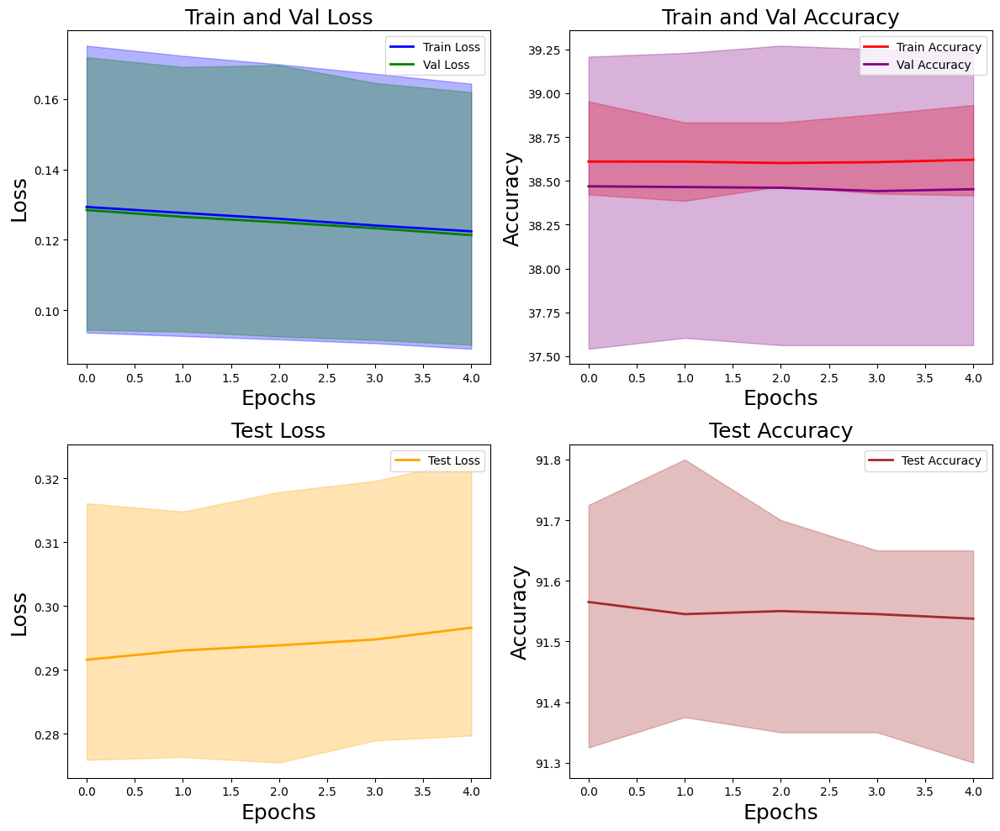

Data saved to t_revision_v2_f6_resnet.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=5e-7,
    batch_size=256,
    num_epochs=5,
    method='t_revision_v2',
    T_matrix=T_matrix,
    num_classes=4,
    optimizer_name='adam',
    times=10,
    model_name='resnet',
    csv_path='t_revision_v2_f6_resnet.csv',
    )

### CIFAR10

In [ ]:
T_matrix = np.array([
 [9.52139080e-01, 3.86619456e-02, 5.37598040e-03, 3.82294622e-03],
 [1.18309450e-04, 8.60177219e-01, 1.39142320e-01, 5.62156376e-04],
 [2.76456047e-02, 9.84724145e-04, 9.51853216e-01, 1.95164680e-02],
 [7.55449161e-02, 1.50617501e-02, 1.49769271e-02, 8.94416392e-01]
])
T_matrix = mean_matrix_cifar
print(T_matrix)
X_train_full = data_c10_X_tr
y_train_full = data_c10_S_tr
X_test = data_c10_X_ts
y_test = data_c10_Y_ts

[[0.88578737 0.09624667 0.00779205 0.01017386]
 [0.00580611 0.90526044 0.08999731 0.        ]
 [0.0030428  0.         0.92190444 0.07856871]
 [0.09064659 0.         0.02474496 0.8854081 ]]


resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 115.22it/s]


Noisy Loss: 1.1472,Validation Loss: 0.8770, Accuracy: 64.90% (2596/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.74it/s]


Test Loss: 0.7162, Accuracy: 72.97% (2919/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 114.22it/s]


Noisy Loss: 1.1521,Validation Loss: 0.8702, Accuracy: 65.55% (2622/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.44it/s]


Test Loss: 0.6830, Accuracy: 75.05% (3002/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 111.90it/s]


Noisy Loss: 1.1091,Validation Loss: 0.7908, Accuracy: 68.22% (2729/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.10it/s]


Test Loss: 0.6265, Accuracy: 77.80% (3112/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 119.10it/s]


Noisy Loss: 1.0914,Validation Loss: 0.7362, Accuracy: 71.97% (2879/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.91it/s]


Test Loss: 0.5289, Accuracy: 82.38% (3295/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 119.79it/s]


Noisy Loss: 1.0969,Validation Loss: 0.7638, Accuracy: 70.15% (2806/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.06it/s]


Test Loss: 0.5726, Accuracy: 80.15% (3206/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 111.83it/s]


Noisy Loss: 1.0727,Validation Loss: 0.7371, Accuracy: 72.33% (2893/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.93it/s]


Test Loss: 0.5612, Accuracy: 81.80% (3272/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 109.00it/s]


Noisy Loss: 1.0667,Validation Loss: 0.7245, Accuracy: 72.10% (2884/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.02it/s]


Test Loss: 0.5241, Accuracy: 81.92% (3277/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 121.07it/s]


Noisy Loss: 1.0479,Validation Loss: 0.7379, Accuracy: 73.03% (2921/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.54it/s]


Test Loss: 0.4930, Accuracy: 83.50% (3340/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 121.05it/s]


Noisy Loss: 1.0901,Validation Loss: 0.8469, Accuracy: 68.20% (2728/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.63it/s]


Test Loss: 0.5991, Accuracy: 78.45% (3138/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 115.94it/s]


Noisy Loss: 1.0872,Validation Loss: 0.8206, Accuracy: 70.67% (2827/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.57it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.6553, Accuracy: 78.65% (3146/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.26it/s]


Test Loss: 0.5241, Accuracy: 81.92% (3277/4000)
finished  1  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 116.16it/s]


Noisy Loss: 1.1470,Validation Loss: 0.9013, Accuracy: 62.58% (2503/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.80it/s]


Test Loss: 0.7276, Accuracy: 70.92% (2837/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 115.70it/s]


Noisy Loss: 1.1629,Validation Loss: 0.9659, Accuracy: 62.02% (2481/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 111.68it/s]


Test Loss: 0.8404, Accuracy: 68.47% (2739/4000)


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 121.47it/s]


Noisy Loss: 1.0893,Validation Loss: 0.7698, Accuracy: 71.17% (2847/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.63it/s]


Test Loss: 0.5422, Accuracy: 81.22% (3249/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 118.52it/s]


Noisy Loss: 1.0928,Validation Loss: 0.7583, Accuracy: 70.78% (2831/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.47it/s]


Test Loss: 0.5317, Accuracy: 82.47% (3299/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 115.73it/s]


Noisy Loss: 1.0915,Validation Loss: 0.7704, Accuracy: 71.00% (2840/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.42it/s]


Test Loss: 0.5829, Accuracy: 80.92% (3237/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 110.41it/s]


Noisy Loss: 1.0627,Validation Loss: 0.7077, Accuracy: 74.08% (2963/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.21it/s]


Test Loss: 0.4847, Accuracy: 83.95% (3358/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 118.36it/s]


Noisy Loss: 1.0651,Validation Loss: 0.7518, Accuracy: 72.05% (2882/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.62it/s]


Test Loss: 0.5156, Accuracy: 82.80% (3312/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 113.42it/s]


Noisy Loss: 1.0678,Validation Loss: 0.7872, Accuracy: 71.60% (2864/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.50it/s]


Test Loss: 0.5801, Accuracy: 81.38% (3255/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 115.76it/s]


Noisy Loss: 1.0616,Validation Loss: 0.7692, Accuracy: 72.42% (2897/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.71it/s]


Test Loss: 0.5005, Accuracy: 83.72% (3349/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 113.07it/s]


Noisy Loss: 1.0482,Validation Loss: 0.7936, Accuracy: 72.20% (2888/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 112.02it/s]


Test Loss: 0.5620, Accuracy: 81.28% (3251/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.48it/s]


Test Loss: 0.4847, Accuracy: 83.95% (3358/4000)
finished  2  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 113.72it/s]


Noisy Loss: 1.1717,Validation Loss: 0.9083, Accuracy: 64.17% (2567/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.08it/s]


Test Loss: 0.7552, Accuracy: 71.55% (2862/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 110.35it/s]


Noisy Loss: 1.1218,Validation Loss: 0.8123, Accuracy: 68.72% (2749/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.70it/s]


Test Loss: 0.6003, Accuracy: 78.80% (3152/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 119.97it/s]


Noisy Loss: 1.1226,Validation Loss: 0.8256, Accuracy: 68.10% (2724/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.72it/s]


Test Loss: 0.6046, Accuracy: 77.33% (3093/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 120.60it/s]


Noisy Loss: 1.1040,Validation Loss: 0.7724, Accuracy: 70.58% (2823/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.37it/s]


Test Loss: 0.5737, Accuracy: 81.38% (3255/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 116.34it/s]


Noisy Loss: 1.1006,Validation Loss: 0.7278, Accuracy: 73.30% (2932/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.56it/s]


Test Loss: 0.5643, Accuracy: 82.95% (3318/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 120.87it/s]


Noisy Loss: 1.0662,Validation Loss: 0.7780, Accuracy: 72.05% (2882/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 110.14it/s]


Test Loss: 0.5662, Accuracy: 80.70% (3228/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 120.07it/s]


Noisy Loss: 1.0714,Validation Loss: 0.7010, Accuracy: 73.58% (2943/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.85it/s]


Test Loss: 0.5302, Accuracy: 83.30% (3332/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 112.79it/s]


Noisy Loss: 1.0377,Validation Loss: 0.7235, Accuracy: 74.75% (2990/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.23it/s]


Test Loss: 0.4773, Accuracy: 83.90% (3356/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 119.19it/s]


Noisy Loss: 1.0580,Validation Loss: 0.7403, Accuracy: 72.58% (2903/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.57it/s]


Test Loss: 0.5297, Accuracy: 81.95% (3278/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 116.61it/s]


Noisy Loss: 1.0412,Validation Loss: 0.8095, Accuracy: 72.75% (2910/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.41it/s]


Test Loss: 0.5648, Accuracy: 81.70% (3268/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.50it/s]


Test Loss: 0.5302, Accuracy: 83.30% (3332/4000)
finished  3  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 112.15it/s]


Noisy Loss: 1.1556,Validation Loss: 0.8778, Accuracy: 64.65% (2586/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.76it/s]


Test Loss: 0.6995, Accuracy: 74.45% (2978/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 120.20it/s]


Noisy Loss: 1.1356,Validation Loss: 0.8323, Accuracy: 68.00% (2720/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.17it/s]


Test Loss: 0.6554, Accuracy: 77.15% (3086/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 114.24it/s]


Noisy Loss: 1.1005,Validation Loss: 0.7771, Accuracy: 69.75% (2790/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 108.16it/s]


Test Loss: 0.5965, Accuracy: 78.45% (3138/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 118.17it/s]


Noisy Loss: 1.1089,Validation Loss: 0.7686, Accuracy: 70.15% (2806/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.33it/s]


Test Loss: 0.5809, Accuracy: 80.12% (3205/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 110.48it/s]


Noisy Loss: 1.0972,Validation Loss: 0.7578, Accuracy: 70.90% (2836/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.02it/s]


Test Loss: 0.5301, Accuracy: 83.08% (3323/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 116.49it/s]


Noisy Loss: 1.0820,Validation Loss: 0.7307, Accuracy: 72.97% (2919/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.84it/s]


Test Loss: 0.5281, Accuracy: 83.55% (3342/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 110.09it/s]


Noisy Loss: 1.0759,Validation Loss: 0.7520, Accuracy: 72.03% (2881/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 123.50it/s]


Test Loss: 0.5026, Accuracy: 83.25% (3330/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 120.57it/s]


Noisy Loss: 1.0677,Validation Loss: 0.7472, Accuracy: 73.00% (2920/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.10it/s]


Test Loss: 0.5078, Accuracy: 84.30% (3372/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 106.85it/s]


Noisy Loss: 1.0462,Validation Loss: 0.7369, Accuracy: 73.42% (2937/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 110.68it/s]


Test Loss: 0.4615, Accuracy: 84.85% (3394/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 115.51it/s]


Noisy Loss: 1.0674,Validation Loss: 0.8805, Accuracy: 69.95% (2798/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.03it/s]


Test Loss: 0.6360, Accuracy: 79.55% (3182/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 110.90it/s]


Test Loss: 0.5281, Accuracy: 83.55% (3342/4000)
finished  4  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 116.23it/s]


Noisy Loss: 1.1748,Validation Loss: 0.9206, Accuracy: 63.55% (2542/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.05it/s]


Test Loss: 0.7936, Accuracy: 70.42% (2817/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 114.51it/s]


Noisy Loss: 1.1251,Validation Loss: 0.8370, Accuracy: 67.85% (2714/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.17it/s]


Test Loss: 0.6422, Accuracy: 76.28% (3051/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 117.77it/s]


Noisy Loss: 1.1203,Validation Loss: 0.8374, Accuracy: 67.38% (2695/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.78it/s]


Test Loss: 0.6274, Accuracy: 78.67% (3147/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 111.95it/s]


Noisy Loss: 1.0830,Validation Loss: 0.7613, Accuracy: 70.85% (2834/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.35it/s]


Test Loss: 0.5368, Accuracy: 81.33% (3253/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 120.22it/s]


Noisy Loss: 1.0810,Validation Loss: 0.7561, Accuracy: 70.60% (2824/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.58it/s]


Test Loss: 0.5023, Accuracy: 82.50% (3300/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 111.02it/s]


Noisy Loss: 1.1130,Validation Loss: 0.7830, Accuracy: 70.45% (2818/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.24it/s]


Test Loss: 0.6071, Accuracy: 79.62% (3185/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 118.09it/s]


Noisy Loss: 1.0760,Validation Loss: 0.7457, Accuracy: 71.58% (2863/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 110.72it/s]


Test Loss: 0.5321, Accuracy: 82.85% (3314/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 120.24it/s]


Noisy Loss: 1.0631,Validation Loss: 0.7413, Accuracy: 72.88% (2915/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.84it/s]


Test Loss: 0.4981, Accuracy: 83.28% (3331/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 114.49it/s]


Noisy Loss: 1.0612,Validation Loss: 0.8152, Accuracy: 71.42% (2857/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.44it/s]


Test Loss: 0.5562, Accuracy: 81.78% (3271/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 115.73it/s]


Noisy Loss: 1.0909,Validation Loss: 1.0185, Accuracy: 67.92% (2717/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.50it/s]


Test Loss: 0.7129, Accuracy: 77.53% (3101/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.07it/s]


Test Loss: 0.4981, Accuracy: 83.28% (3331/4000)
finished  5  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 120.87it/s]


Noisy Loss: 1.2002,Validation Loss: 1.0050, Accuracy: 58.67% (2347/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.13it/s]


Test Loss: 0.8575, Accuracy: 65.53% (2621/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 117.76it/s]


Noisy Loss: 1.1268,Validation Loss: 0.8240, Accuracy: 67.60% (2704/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.98it/s]


Test Loss: 0.6609, Accuracy: 74.40% (2976/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 114.32it/s]


Noisy Loss: 1.1172,Validation Loss: 0.7823, Accuracy: 69.20% (2768/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.16it/s]


Test Loss: 0.6140, Accuracy: 78.20% (3128/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 119.98it/s]


Noisy Loss: 1.1059,Validation Loss: 0.7554, Accuracy: 70.95% (2838/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.37it/s]


Test Loss: 0.6150, Accuracy: 79.58% (3183/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 112.21it/s]


Noisy Loss: 1.0945,Validation Loss: 0.7395, Accuracy: 72.00% (2880/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.54it/s]


Test Loss: 0.5708, Accuracy: 81.45% (3258/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 122.82it/s]


Noisy Loss: 1.0641,Validation Loss: 0.7165, Accuracy: 73.50% (2940/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.27it/s]


Test Loss: 0.5109, Accuracy: 83.08% (3323/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 116.05it/s]


Noisy Loss: 1.0656,Validation Loss: 0.7027, Accuracy: 74.28% (2971/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.06it/s]


Test Loss: 0.4837, Accuracy: 84.15% (3366/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 113.11it/s]


Noisy Loss: 1.0648,Validation Loss: 0.7053, Accuracy: 73.75% (2950/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 110.81it/s]


Test Loss: 0.4995, Accuracy: 83.92% (3357/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 118.04it/s]


Noisy Loss: 1.0490,Validation Loss: 0.7278, Accuracy: 73.62% (2945/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.77it/s]


Test Loss: 0.4922, Accuracy: 83.90% (3356/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 118.74it/s]


Noisy Loss: 1.0675,Validation Loss: 0.7925, Accuracy: 72.53% (2901/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.23it/s]


Test Loss: 0.6014, Accuracy: 81.55% (3262/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.78it/s]


Test Loss: 0.4837, Accuracy: 84.15% (3366/4000)
finished  6  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 112.08it/s]


Noisy Loss: 1.1840,Validation Loss: 0.9009, Accuracy: 64.12% (2565/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 110.96it/s]


Test Loss: 0.7749, Accuracy: 71.80% (2872/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 116.88it/s]


Noisy Loss: 1.1388,Validation Loss: 0.8311, Accuracy: 67.97% (2719/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 110.06it/s]


Test Loss: 0.6455, Accuracy: 77.83% (3113/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 116.35it/s]


Noisy Loss: 1.1225,Validation Loss: 0.7677, Accuracy: 71.10% (2844/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.05it/s]


Test Loss: 0.5850, Accuracy: 82.12% (3285/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 119.04it/s]


Noisy Loss: 1.1157,Validation Loss: 0.8042, Accuracy: 68.78% (2751/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.20it/s]


Test Loss: 0.6273, Accuracy: 78.15% (3126/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 113.86it/s]


Noisy Loss: 1.0763,Validation Loss: 0.7179, Accuracy: 72.38% (2895/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.93it/s]


Test Loss: 0.5064, Accuracy: 82.95% (3318/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 109.10it/s]


Noisy Loss: 1.0854,Validation Loss: 0.7339, Accuracy: 72.47% (2899/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.94it/s]


Test Loss: 0.5202, Accuracy: 82.58% (3303/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 118.60it/s]


Noisy Loss: 1.0819,Validation Loss: 0.8054, Accuracy: 70.45% (2818/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.52it/s]


Test Loss: 0.6160, Accuracy: 80.03% (3201/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 114.79it/s]


Noisy Loss: 1.0440,Validation Loss: 0.6948, Accuracy: 74.88% (2995/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.46it/s]


Test Loss: 0.4719, Accuracy: 84.65% (3386/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 114.66it/s]


Noisy Loss: 1.0562,Validation Loss: 0.7652, Accuracy: 72.83% (2913/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.63it/s]


Test Loss: 0.5088, Accuracy: 82.30% (3292/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 111.48it/s]


Noisy Loss: 1.0477,Validation Loss: 0.7840, Accuracy: 73.25% (2930/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.99it/s]


Test Loss: 0.5115, Accuracy: 83.72% (3349/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.60it/s]


Test Loss: 0.4719, Accuracy: 84.65% (3386/4000)
finished  7  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 115.72it/s]


Noisy Loss: 1.1727,Validation Loss: 0.9421, Accuracy: 62.42% (2497/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.62it/s]


Test Loss: 0.7501, Accuracy: 71.83% (2873/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 108.89it/s]


Noisy Loss: 1.1394,Validation Loss: 0.8324, Accuracy: 67.00% (2680/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.53it/s]


Test Loss: 0.6432, Accuracy: 77.10% (3084/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 122.79it/s]


Noisy Loss: 1.1077,Validation Loss: 0.8025, Accuracy: 68.58% (2743/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.34it/s]


Test Loss: 0.5706, Accuracy: 80.53% (3221/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 119.99it/s]


Noisy Loss: 1.1009,Validation Loss: 0.7733, Accuracy: 69.75% (2790/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 111.10it/s]


Test Loss: 0.5488, Accuracy: 81.40% (3256/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 120.69it/s]


Noisy Loss: 1.0847,Validation Loss: 0.7742, Accuracy: 70.90% (2836/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 112.26it/s]


Test Loss: 0.5381, Accuracy: 81.17% (3247/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 119.74it/s]


Noisy Loss: 1.0797,Validation Loss: 0.7536, Accuracy: 71.08% (2843/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.65it/s]


Test Loss: 0.5117, Accuracy: 82.58% (3303/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 115.64it/s]


Noisy Loss: 1.0749,Validation Loss: 0.8246, Accuracy: 69.80% (2792/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 112.85it/s]


Test Loss: 0.5957, Accuracy: 79.65% (3186/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 115.81it/s]


Noisy Loss: 1.0634,Validation Loss: 0.7413, Accuracy: 73.20% (2928/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.46it/s]


Test Loss: 0.5177, Accuracy: 84.10% (3364/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 116.05it/s]


Noisy Loss: 1.0473,Validation Loss: 0.7417, Accuracy: 73.45% (2938/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.93it/s]


Test Loss: 0.4460, Accuracy: 85.35% (3414/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 111.48it/s]


Noisy Loss: 1.0502,Validation Loss: 0.7522, Accuracy: 73.90% (2956/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 112.64it/s]


Test Loss: 0.4719, Accuracy: 83.90% (3356/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.65it/s]


Test Loss: 0.5177, Accuracy: 84.10% (3364/4000)
finished  8  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 117.29it/s]


Noisy Loss: 1.1628,Validation Loss: 0.8955, Accuracy: 64.47% (2579/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 111.99it/s]


Test Loss: 0.7265, Accuracy: 72.70% (2908/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 121.67it/s]


Noisy Loss: 1.1419,Validation Loss: 0.8573, Accuracy: 66.35% (2654/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.80it/s]


Test Loss: 0.7132, Accuracy: 74.30% (2972/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 120.14it/s]


Noisy Loss: 1.1217,Validation Loss: 0.8548, Accuracy: 66.12% (2645/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.01it/s]


Test Loss: 0.7005, Accuracy: 74.20% (2968/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 113.31it/s]


Noisy Loss: 1.0850,Validation Loss: 0.7373, Accuracy: 72.62% (2905/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.42it/s]


Test Loss: 0.5289, Accuracy: 83.53% (3341/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 113.80it/s]


Noisy Loss: 1.1009,Validation Loss: 0.7850, Accuracy: 70.30% (2812/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.31it/s]


Test Loss: 0.5812, Accuracy: 80.08% (3203/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 117.48it/s]


Noisy Loss: 1.0670,Validation Loss: 0.7514, Accuracy: 71.97% (2879/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 112.87it/s]


Test Loss: 0.4736, Accuracy: 83.22% (3329/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 117.00it/s]


Noisy Loss: 1.0756,Validation Loss: 0.7842, Accuracy: 70.67% (2827/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.94it/s]


Test Loss: 0.5352, Accuracy: 79.88% (3195/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 118.13it/s]


Noisy Loss: 1.0880,Validation Loss: 0.7340, Accuracy: 72.85% (2914/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.11it/s]


Test Loss: 0.5477, Accuracy: 83.17% (3327/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 120.77it/s]


Noisy Loss: 1.0941,Validation Loss: 0.8492, Accuracy: 68.95% (2758/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.32it/s]


Test Loss: 0.6254, Accuracy: 77.88% (3115/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 109.14it/s]


Noisy Loss: 1.0721,Validation Loss: 0.8056, Accuracy: 70.95% (2838/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.10it/s]


Test Loss: 0.5781, Accuracy: 79.95% (3198/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 109.07it/s]


Test Loss: 0.5477, Accuracy: 83.17% (3327/4000)
finished  9  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 113.27it/s]


Noisy Loss: 1.1644,Validation Loss: 0.9132, Accuracy: 62.27% (2491/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 110.38it/s]


Test Loss: 0.7395, Accuracy: 71.03% (2841/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 120.01it/s]


Noisy Loss: 1.1434,Validation Loss: 0.8774, Accuracy: 64.28% (2571/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.00it/s]


Test Loss: 0.7071, Accuracy: 74.95% (2998/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 111.88it/s]


Noisy Loss: 1.1123,Validation Loss: 0.8557, Accuracy: 67.03% (2681/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 109.98it/s]


Test Loss: 0.6187, Accuracy: 76.95% (3078/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 118.60it/s]


Noisy Loss: 1.1074,Validation Loss: 0.7805, Accuracy: 69.70% (2788/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 110.09it/s]


Test Loss: 0.5649, Accuracy: 81.65% (3266/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 119.23it/s]


Noisy Loss: 1.1094,Validation Loss: 0.7832, Accuracy: 68.90% (2756/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 109.15it/s]


Test Loss: 0.5581, Accuracy: 81.85% (3274/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 107.35it/s]


Noisy Loss: 1.1008,Validation Loss: 0.7394, Accuracy: 71.72% (2869/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.89it/s]


Test Loss: 0.5280, Accuracy: 84.35% (3374/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 118.97it/s]


Noisy Loss: 1.0885,Validation Loss: 0.7271, Accuracy: 72.85% (2914/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.28it/s]


Test Loss: 0.5284, Accuracy: 83.50% (3340/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 120.26it/s]


Noisy Loss: 1.1135,Validation Loss: 0.7960, Accuracy: 69.35% (2774/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.50it/s]


Test Loss: 0.5843, Accuracy: 81.03% (3241/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 117.62it/s]


Noisy Loss: 1.0930,Validation Loss: 0.7502, Accuracy: 72.30% (2892/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.32it/s]


Test Loss: 0.5721, Accuracy: 82.35% (3294/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 113.09it/s]


Noisy Loss: 1.0632,Validation Loss: 0.7425, Accuracy: 72.70% (2908/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.96it/s]


Test Loss: 0.5116, Accuracy: 82.80% (3312/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.36it/s]


Test Loss: 0.5284, Accuracy: 83.50% (3340/4000)
finished  10  epoch
min_train_loss [0.6359303461313248, 0.6507540323138237, 0.6216328218579292, 0.6602071681022644, 0.5697282345294953, 0.6543422254920006, 0.5865387133955956, 0.6025933683216572, 0.5904536194801331, 0.6480350524187088]
min_val_loss [0.7245384886264801, 0.7076924593448639, 0.7010337014198303, 0.7307493081092834, 0.7412951946258545, 0.702702022075653, 0.6947763283252716, 0.7413153712749481, 0.7340149571895599, 0.7270519671440124]
min_train_accuracy [76.2875, 76.025, 76.81875, 75.29375, 78.76875, 75.48125, 78.04375, 77.4875, 77.90625, 75.875]
min_val_accuracy [72.1, 74.075, 73.575, 72.975, 72.875, 74.275, 74.875, 73.2, 72.85, 72.85]
min_train_noise_loss [1.0455825687646867, 1.0522599707841873, 1.039305325627327, 1.0559438482522965, 1.016750302672386, 1.0547318453788757, 1.025099106311798, 1.0310855317115784, 1.0258730642795564, 1.0508919975757598]
min_val_noise_loss [1.0667114701271057, 1.062667534828186, 1.0713729305267334,

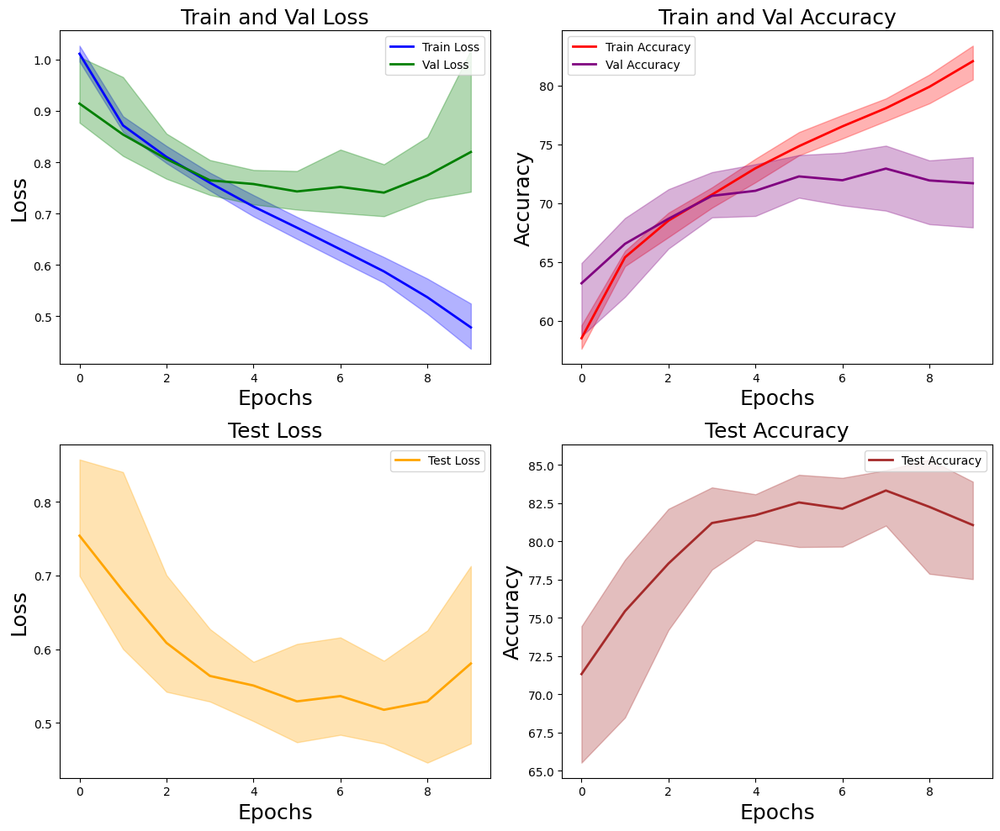

Data saved to baseline_c10_resnet.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=0.0005,
    batch_size=32,
    num_epochs=10,
    times=10,
    method='baseline',
    T_matrix=T_matrix,
    csv_path='baseline_c10_resnet.csv',
    model_name='resnet',
)

resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 111.99it/s]


Noisy Loss: 1.1538,Validation Loss: 0.8978, Accuracy: 64.45% (2578/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 112.00it/s]


Test Loss: 0.6588, Accuracy: 73.00% (2920/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 113.57it/s]


Noisy Loss: 1.1405,Validation Loss: 0.9485, Accuracy: 63.12% (2525/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.23it/s]


Test Loss: 0.8325, Accuracy: 69.53% (2781/4000)


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 113.87it/s]


Noisy Loss: 1.1414,Validation Loss: 0.9977, Accuracy: 62.65% (2506/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 112.59it/s]


Test Loss: 0.8824, Accuracy: 70.75% (2830/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 110.53it/s]


Noisy Loss: 1.0928,Validation Loss: 0.7775, Accuracy: 70.28% (2811/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.33it/s]


Test Loss: 0.5062, Accuracy: 80.38% (3215/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 117.41it/s]


Noisy Loss: 1.0852,Validation Loss: 0.7757, Accuracy: 69.78% (2791/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.64it/s]


Test Loss: 0.5133, Accuracy: 80.53% (3221/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 105.80it/s]


Noisy Loss: 1.0694,Validation Loss: 0.7208, Accuracy: 73.15% (2926/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 108.83it/s]


Test Loss: 0.4403, Accuracy: 83.25% (3330/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 113.57it/s]


Noisy Loss: 1.0623,Validation Loss: 0.7343, Accuracy: 72.88% (2915/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 112.79it/s]


Test Loss: 0.4293, Accuracy: 84.75% (3390/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 114.41it/s]


Noisy Loss: 1.0666,Validation Loss: 0.7214, Accuracy: 72.92% (2917/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.88it/s]


Test Loss: 0.4361, Accuracy: 83.33% (3333/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 115.38it/s]


Noisy Loss: 1.0633,Validation Loss: 0.7476, Accuracy: 72.55% (2902/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.53it/s]


Test Loss: 0.4593, Accuracy: 84.08% (3363/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 113.70it/s]


Noisy Loss: 1.0513,Validation Loss: 0.7393, Accuracy: 73.25% (2930/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.04it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.4830, Accuracy: 83.97% (3359/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 108.82it/s]


Test Loss: 0.4403, Accuracy: 83.25% (3330/4000)
finished  1  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 105.64it/s]


Noisy Loss: 1.1606,Validation Loss: 0.8993, Accuracy: 63.50% (2540/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.39it/s]


Test Loss: 0.6969, Accuracy: 71.92% (2877/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 112.24it/s]


Noisy Loss: 1.1428,Validation Loss: 0.8760, Accuracy: 65.05% (2602/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 106.49it/s]


Test Loss: 0.6427, Accuracy: 73.90% (2956/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 111.98it/s]


Noisy Loss: 1.1226,Validation Loss: 0.8450, Accuracy: 66.58% (2663/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.80it/s]


Test Loss: 0.5878, Accuracy: 77.20% (3088/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 105.26it/s]


Noisy Loss: 1.0985,Validation Loss: 0.8025, Accuracy: 69.08% (2763/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.06it/s]


Test Loss: 0.5637, Accuracy: 78.65% (3146/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 107.14it/s]


Noisy Loss: 1.0858,Validation Loss: 0.7770, Accuracy: 70.17% (2807/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.40it/s]


Test Loss: 0.5430, Accuracy: 80.20% (3208/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 109.10it/s]


Noisy Loss: 1.0724,Validation Loss: 0.7514, Accuracy: 71.65% (2866/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.96it/s]


Test Loss: 0.4572, Accuracy: 82.85% (3314/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 107.35it/s]


Noisy Loss: 1.0637,Validation Loss: 0.7122, Accuracy: 72.85% (2914/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.40it/s]


Test Loss: 0.4371, Accuracy: 83.50% (3340/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 117.76it/s]


Noisy Loss: 1.0499,Validation Loss: 0.6816, Accuracy: 74.42% (2977/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 110.30it/s]


Test Loss: 0.3780, Accuracy: 85.12% (3405/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 116.31it/s]


Noisy Loss: 1.0536,Validation Loss: 0.7287, Accuracy: 73.65% (2946/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.07it/s]


Test Loss: 0.4365, Accuracy: 84.25% (3370/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 105.41it/s]


Noisy Loss: 1.0419,Validation Loss: 0.6987, Accuracy: 74.58% (2983/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 107.90it/s]


Test Loss: 0.4270, Accuracy: 85.12% (3405/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.63it/s]


Test Loss: 0.3780, Accuracy: 85.12% (3405/4000)
finished  2  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 116.21it/s]


Noisy Loss: 1.1542,Validation Loss: 0.9160, Accuracy: 64.17% (2567/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.62it/s]


Test Loss: 0.6891, Accuracy: 72.53% (2901/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 110.82it/s]


Noisy Loss: 1.1277,Validation Loss: 0.8316, Accuracy: 66.95% (2678/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 106.60it/s]


Test Loss: 0.5880, Accuracy: 76.38% (3055/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 101.64it/s]


Noisy Loss: 1.1788,Validation Loss: 1.0795, Accuracy: 58.35% (2334/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 111.51it/s]


Test Loss: 0.9894, Accuracy: 67.10% (2684/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 118.60it/s]


Noisy Loss: 1.0913,Validation Loss: 0.7496, Accuracy: 70.78% (2831/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.79it/s]


Test Loss: 0.4759, Accuracy: 80.95% (3238/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 111.29it/s]


Noisy Loss: 1.1024,Validation Loss: 0.8113, Accuracy: 69.08% (2763/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.59it/s]


Test Loss: 0.5190, Accuracy: 80.45% (3218/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 115.67it/s]


Noisy Loss: 1.0692,Validation Loss: 0.7124, Accuracy: 72.60% (2904/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.06it/s]


Test Loss: 0.4262, Accuracy: 83.85% (3354/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 106.99it/s]


Noisy Loss: 1.0629,Validation Loss: 0.6924, Accuracy: 73.80% (2952/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.24it/s]


Test Loss: 0.3855, Accuracy: 85.35% (3414/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 110.29it/s]


Noisy Loss: 1.0557,Validation Loss: 0.7049, Accuracy: 73.72% (2949/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 112.18it/s]


Test Loss: 0.4180, Accuracy: 84.65% (3386/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 115.81it/s]


Noisy Loss: 1.0605,Validation Loss: 0.7079, Accuracy: 72.92% (2917/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.97it/s]


Test Loss: 0.4486, Accuracy: 82.90% (3316/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 113.39it/s]


Noisy Loss: 1.0417,Validation Loss: 0.6929, Accuracy: 74.72% (2989/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.23it/s]


Test Loss: 0.4538, Accuracy: 84.88% (3395/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.82it/s]


Test Loss: 0.3855, Accuracy: 85.35% (3414/4000)
finished  3  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 109.68it/s]


Noisy Loss: 1.1483,Validation Loss: 0.8901, Accuracy: 64.67% (2587/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.36it/s]


Test Loss: 0.6519, Accuracy: 73.35% (2934/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 106.27it/s]


Noisy Loss: 1.1501,Validation Loss: 0.8822, Accuracy: 63.98% (2559/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 107.54it/s]


Test Loss: 0.6400, Accuracy: 72.88% (2915/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 108.17it/s]


Noisy Loss: 1.1552,Validation Loss: 0.9163, Accuracy: 63.77% (2551/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.57it/s]


Test Loss: 0.6984, Accuracy: 72.33% (2893/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 110.32it/s]


Noisy Loss: 1.0920,Validation Loss: 0.7636, Accuracy: 70.70% (2828/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.46it/s]


Test Loss: 0.4808, Accuracy: 80.83% (3233/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 117.97it/s]


Noisy Loss: 1.0866,Validation Loss: 0.7361, Accuracy: 72.08% (2883/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.50it/s]


Test Loss: 0.4413, Accuracy: 83.05% (3322/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 111.50it/s]


Noisy Loss: 1.0796,Validation Loss: 0.7676, Accuracy: 71.28% (2851/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.70it/s]


Test Loss: 0.5114, Accuracy: 80.95% (3238/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 113.68it/s]


Noisy Loss: 1.0543,Validation Loss: 0.6926, Accuracy: 74.08% (2963/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.88it/s]


Test Loss: 0.4158, Accuracy: 84.05% (3362/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 110.90it/s]


Noisy Loss: 1.0568,Validation Loss: 0.7109, Accuracy: 74.00% (2960/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.41it/s]


Test Loss: 0.4114, Accuracy: 84.60% (3384/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 114.13it/s]


Noisy Loss: 1.0799,Validation Loss: 0.8350, Accuracy: 70.50% (2820/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 109.35it/s]


Test Loss: 0.6508, Accuracy: 79.47% (3179/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 112.73it/s]


Noisy Loss: 1.0765,Validation Loss: 0.7968, Accuracy: 70.70% (2828/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.01it/s]


Test Loss: 0.5735, Accuracy: 80.58% (3223/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 112.25it/s]


Test Loss: 0.4158, Accuracy: 84.05% (3362/4000)
finished  4  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 116.69it/s]


Noisy Loss: 1.1464,Validation Loss: 0.8951, Accuracy: 63.42% (2537/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 107.41it/s]


Test Loss: 0.6895, Accuracy: 71.45% (2858/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 113.67it/s]


Noisy Loss: 1.1434,Validation Loss: 0.8466, Accuracy: 66.67% (2667/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.77it/s]


Test Loss: 0.6441, Accuracy: 73.72% (2949/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 114.22it/s]


Noisy Loss: 1.1312,Validation Loss: 0.8725, Accuracy: 66.00% (2640/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.75it/s]


Test Loss: 0.6599, Accuracy: 75.38% (3015/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 111.19it/s]


Noisy Loss: 1.1004,Validation Loss: 0.7695, Accuracy: 70.47% (2819/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 112.36it/s]


Test Loss: 0.5053, Accuracy: 79.10% (3164/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 117.48it/s]


Noisy Loss: 1.1022,Validation Loss: 0.8043, Accuracy: 67.50% (2700/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.53it/s]


Test Loss: 0.5368, Accuracy: 77.15% (3086/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 114.61it/s]


Noisy Loss: 1.0691,Validation Loss: 0.7227, Accuracy: 72.75% (2910/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.45it/s]


Test Loss: 0.4038, Accuracy: 83.95% (3358/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 116.99it/s]


Noisy Loss: 1.0704,Validation Loss: 0.7548, Accuracy: 71.67% (2867/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.54it/s]


Test Loss: 0.4570, Accuracy: 82.45% (3298/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 110.49it/s]


Noisy Loss: 1.0616,Validation Loss: 0.7142, Accuracy: 73.10% (2924/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.49it/s]


Test Loss: 0.4389, Accuracy: 83.70% (3348/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 110.88it/s]


Noisy Loss: 1.0525,Validation Loss: 0.7580, Accuracy: 73.08% (2923/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 109.69it/s]


Test Loss: 0.5443, Accuracy: 83.67% (3347/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 111.44it/s]


Noisy Loss: 1.0800,Validation Loss: 0.8239, Accuracy: 69.58% (2783/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.12it/s]


Test Loss: 0.5237, Accuracy: 81.42% (3257/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 110.88it/s]


Test Loss: 0.4389, Accuracy: 83.70% (3348/4000)
finished  5  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 107.88it/s]


Noisy Loss: 1.1545,Validation Loss: 0.8885, Accuracy: 64.88% (2595/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.94it/s]


Test Loss: 0.6367, Accuracy: 74.17% (2967/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 116.16it/s]


Noisy Loss: 1.1292,Validation Loss: 0.8469, Accuracy: 67.17% (2687/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.46it/s]


Test Loss: 0.6152, Accuracy: 74.38% (2975/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 115.20it/s]


Noisy Loss: 1.1110,Validation Loss: 0.8161, Accuracy: 68.08% (2723/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.11it/s]


Test Loss: 0.5802, Accuracy: 77.00% (3080/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 108.63it/s]


Noisy Loss: 1.0927,Validation Loss: 0.7920, Accuracy: 69.95% (2798/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.27it/s]


Test Loss: 0.5172, Accuracy: 79.70% (3188/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 110.04it/s]


Noisy Loss: 1.0972,Validation Loss: 0.8139, Accuracy: 68.58% (2743/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.68it/s]


Test Loss: 0.5648, Accuracy: 78.35% (3134/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 111.28it/s]


Noisy Loss: 1.0576,Validation Loss: 0.7156, Accuracy: 73.33% (2933/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.92it/s]


Test Loss: 0.3955, Accuracy: 84.03% (3361/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 115.63it/s]


Noisy Loss: 1.0701,Validation Loss: 0.7390, Accuracy: 72.05% (2882/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.62it/s]


Test Loss: 0.4368, Accuracy: 82.47% (3299/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 107.11it/s]


Noisy Loss: 1.0504,Validation Loss: 0.7143, Accuracy: 74.17% (2967/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.44it/s]


Test Loss: 0.4121, Accuracy: 85.40% (3416/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 109.13it/s]


Noisy Loss: 1.0548,Validation Loss: 0.7383, Accuracy: 72.92% (2917/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 111.01it/s]


Test Loss: 0.4918, Accuracy: 82.92% (3317/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 111.29it/s]


Noisy Loss: 1.0417,Validation Loss: 0.7072, Accuracy: 74.45% (2978/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.96it/s]


Test Loss: 0.4657, Accuracy: 83.92% (3357/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:01<00:00, 110.91it/s]


Test Loss: 0.4657, Accuracy: 83.92% (3357/4000)
finished  6  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 116.84it/s]


Noisy Loss: 1.1590,Validation Loss: 0.9008, Accuracy: 64.42% (2577/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.98it/s]


Test Loss: 0.6485, Accuracy: 73.70% (2948/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 106.29it/s]


Noisy Loss: 1.1320,Validation Loss: 0.8485, Accuracy: 67.00% (2680/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.36it/s]


Test Loss: 0.5754, Accuracy: 76.08% (3043/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 108.17it/s]


Noisy Loss: 1.1394,Validation Loss: 0.8744, Accuracy: 65.30% (2612/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.53it/s]


Test Loss: 0.6192, Accuracy: 74.50% (2980/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 104.24it/s]


Noisy Loss: 1.1061,Validation Loss: 0.8179, Accuracy: 68.40% (2736/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 112.53it/s]


Test Loss: 0.5290, Accuracy: 79.03% (3161/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 117.06it/s]


Noisy Loss: 1.0961,Validation Loss: 0.7697, Accuracy: 70.72% (2829/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 110.05it/s]


Test Loss: 0.4773, Accuracy: 82.28% (3291/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 115.01it/s]


Noisy Loss: 1.0856,Validation Loss: 0.7428, Accuracy: 72.42% (2897/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.19it/s]


Test Loss: 0.4463, Accuracy: 82.83% (3313/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 114.68it/s]


Noisy Loss: 1.0792,Validation Loss: 0.7804, Accuracy: 70.80% (2832/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.62it/s]


Test Loss: 0.4741, Accuracy: 82.53% (3301/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 116.00it/s]


Noisy Loss: 1.1077,Validation Loss: 0.9440, Accuracy: 66.80% (2672/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 107.82it/s]


Test Loss: 0.7223, Accuracy: 77.15% (3086/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 111.14it/s]


Noisy Loss: 1.0838,Validation Loss: 0.8210, Accuracy: 69.50% (2780/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.77it/s]


Test Loss: 0.5794, Accuracy: 80.67% (3227/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 112.54it/s]


Noisy Loss: 1.0591,Validation Loss: 0.7305, Accuracy: 73.45% (2938/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.81it/s]


Test Loss: 0.4244, Accuracy: 84.22% (3369/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:01<00:00, 105.70it/s]


Test Loss: 0.4244, Accuracy: 84.22% (3369/4000)
finished  7  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 109.09it/s]


Noisy Loss: 1.2037,Validation Loss: 1.0553, Accuracy: 56.05% (2242/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.16it/s]


Test Loss: 0.8873, Accuracy: 63.05% (2522/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 114.26it/s]


Noisy Loss: 1.1578,Validation Loss: 1.0080, Accuracy: 60.62% (2425/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.95it/s]


Test Loss: 0.8246, Accuracy: 68.92% (2757/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 117.87it/s]


Noisy Loss: 1.1488,Validation Loss: 0.9509, Accuracy: 62.35% (2494/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.21it/s]


Test Loss: 0.7096, Accuracy: 72.08% (2883/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 116.82it/s]


Noisy Loss: 1.1036,Validation Loss: 0.7857, Accuracy: 70.00% (2800/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 108.47it/s]


Test Loss: 0.4625, Accuracy: 81.95% (3278/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 105.92it/s]


Noisy Loss: 1.1018,Validation Loss: 0.7955, Accuracy: 69.40% (2776/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 111.18it/s]


Test Loss: 0.5023, Accuracy: 80.28% (3211/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 101.95it/s]


Noisy Loss: 1.0721,Validation Loss: 0.7402, Accuracy: 71.65% (2866/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 108.97it/s]


Test Loss: 0.3995, Accuracy: 84.75% (3390/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 113.19it/s]


Noisy Loss: 1.0701,Validation Loss: 0.7490, Accuracy: 71.55% (2862/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.55it/s]


Test Loss: 0.4155, Accuracy: 84.38% (3375/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 116.08it/s]


Noisy Loss: 1.0738,Validation Loss: 0.7582, Accuracy: 71.95% (2878/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.76it/s]


Test Loss: 0.4536, Accuracy: 83.45% (3338/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 109.60it/s]


Noisy Loss: 1.0707,Validation Loss: 0.8113, Accuracy: 70.35% (2814/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.42it/s]


Test Loss: 0.4995, Accuracy: 82.65% (3306/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 113.26it/s]


Noisy Loss: 1.0576,Validation Loss: 0.7489, Accuracy: 72.42% (2897/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 110.89it/s]


Test Loss: 0.4602, Accuracy: 84.83% (3393/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.42it/s]


Test Loss: 0.3995, Accuracy: 84.75% (3390/4000)
finished  8  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 108.71it/s]


Noisy Loss: 1.1603,Validation Loss: 0.9004, Accuracy: 64.00% (2560/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.76it/s]


Test Loss: 0.6697, Accuracy: 73.53% (2941/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 112.17it/s]


Noisy Loss: 1.1244,Validation Loss: 0.8408, Accuracy: 66.83% (2673/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.93it/s]


Test Loss: 0.6084, Accuracy: 75.17% (3007/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 110.07it/s]


Noisy Loss: 1.1173,Validation Loss: 0.8182, Accuracy: 68.38% (2735/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.57it/s]


Test Loss: 0.5508, Accuracy: 79.42% (3177/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 107.35it/s]


Noisy Loss: 1.1077,Validation Loss: 0.8281, Accuracy: 67.60% (2704/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.03it/s]


Test Loss: 0.5785, Accuracy: 77.80% (3112/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 109.83it/s]


Noisy Loss: 1.0930,Validation Loss: 0.7617, Accuracy: 71.05% (2842/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.42it/s]


Test Loss: 0.5009, Accuracy: 81.03% (3241/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 114.23it/s]


Noisy Loss: 1.0631,Validation Loss: 0.6954, Accuracy: 73.58% (2943/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.70it/s]


Test Loss: 0.4049, Accuracy: 84.92% (3397/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 109.52it/s]


Noisy Loss: 1.0634,Validation Loss: 0.7133, Accuracy: 72.92% (2917/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.43it/s]


Test Loss: 0.4604, Accuracy: 83.17% (3327/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 105.11it/s]


Noisy Loss: 1.0848,Validation Loss: 0.8300, Accuracy: 68.62% (2745/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.18it/s]


Test Loss: 0.6334, Accuracy: 78.85% (3154/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 115.16it/s]


Noisy Loss: 1.0521,Validation Loss: 0.7127, Accuracy: 72.90% (2916/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.09it/s]


Test Loss: 0.4439, Accuracy: 83.83% (3353/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 111.31it/s]


Noisy Loss: 1.0657,Validation Loss: 0.7660, Accuracy: 71.92% (2877/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 108.04it/s]


Test Loss: 0.5363, Accuracy: 81.92% (3277/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.69it/s]


Test Loss: 0.4049, Accuracy: 84.92% (3397/4000)
finished  9  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 113.52it/s]


Noisy Loss: 1.1629,Validation Loss: 0.9179, Accuracy: 62.90% (2516/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.76it/s]


Test Loss: 0.6948, Accuracy: 70.45% (2818/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 105.29it/s]


Noisy Loss: 1.1213,Validation Loss: 0.8410, Accuracy: 67.10% (2684/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.86it/s]


Test Loss: 0.5948, Accuracy: 76.08% (3043/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 115.87it/s]


Noisy Loss: 1.1272,Validation Loss: 0.8503, Accuracy: 66.10% (2644/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.42it/s]


Test Loss: 0.5991, Accuracy: 75.15% (3006/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 108.64it/s]


Noisy Loss: 1.1106,Validation Loss: 0.8162, Accuracy: 68.00% (2720/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.45it/s]


Test Loss: 0.5202, Accuracy: 78.72% (3149/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 101.55it/s]


Noisy Loss: 1.0883,Validation Loss: 0.7655, Accuracy: 70.47% (2819/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.17it/s]


Test Loss: 0.4691, Accuracy: 81.58% (3263/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 112.81it/s]


Noisy Loss: 1.1155,Validation Loss: 0.8407, Accuracy: 67.40% (2696/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.05it/s]


Test Loss: 0.5688, Accuracy: 77.83% (3113/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 115.73it/s]


Noisy Loss: 1.0806,Validation Loss: 0.7636, Accuracy: 71.15% (2846/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.99it/s]


Test Loss: 0.4968, Accuracy: 82.25% (3290/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 115.67it/s]


Noisy Loss: 1.0717,Validation Loss: 0.7658, Accuracy: 71.47% (2859/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.80it/s]


Test Loss: 0.5165, Accuracy: 81.53% (3261/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 117.02it/s]


Noisy Loss: 1.0802,Validation Loss: 0.8169, Accuracy: 69.95% (2798/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.43it/s]


Test Loss: 0.5780, Accuracy: 81.12% (3245/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 105.70it/s]


Noisy Loss: 1.0754,Validation Loss: 0.8167, Accuracy: 70.10% (2804/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 112.66it/s]


Test Loss: 0.5140, Accuracy: 81.12% (3245/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 110.15it/s]


Test Loss: 0.4968, Accuracy: 82.25% (3290/4000)
finished  10  epoch
min_train_loss [0.6832040590047836, 0.6312439792752266, 0.652095633983612, 0.6601177560687065, 0.5994507774114609, 0.5340822792947292, 0.5585953538119793, 0.6881760708093643, 0.6741841725111007, 0.6624924218356609]
min_val_loss [0.7208256149291992, 0.6816117918491363, 0.6924096603393555, 0.6926278080940247, 0.7142231755256653, 0.707162929058075, 0.7305339775085449, 0.7402209646701813, 0.6954496016502381, 0.7636131644248962]
min_train_accuracy [74.2375, 76.74375, 75.725, 75.34375, 78.08125, 81.1125, 79.94375, 74.075, 74.8875, 75.2375]
min_val_accuracy [73.15, 74.425, 73.8, 74.075, 73.1, 74.45, 73.45, 71.65, 73.575, 71.15]
min_train_noise_loss [1.0591269326210022, 1.035619577050209, 1.0454665464162827, 1.0493620800971986, 1.022903650522232, 0.9939037635326385, 1.0045605636835098, 1.0612435958385467, 1.054394944548607, 1.0502194902896882]
min_val_noise_loss [1.0693906779289246, 1.0499323716163635, 1.0629193420410157, 1.05

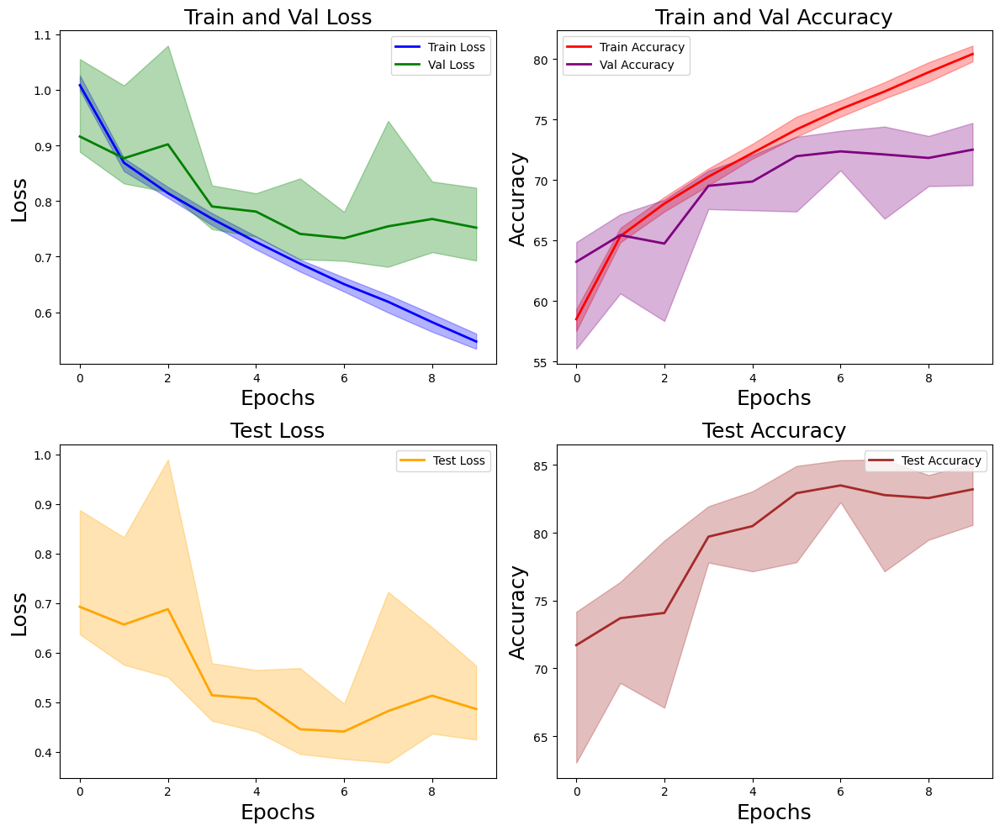

Data saved to forward_c10_resnet.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=0.0005,
    batch_size=32,
    num_epochs=10,
    times=10,
    method='forward',
    T_matrix=T_matrix,
    model_name='resnet',
    csv_path='forward_c10_resnet.csv',
)

resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 65.12it/s]


Noisy Loss: 1.1884,Validation Loss: 0.8301, Accuracy: 58.10% (2324/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 110.97it/s]


Test Loss: 0.8625, Accuracy: 66.38% (2655/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.45it/s]


Noisy Loss: 1.1278,Validation Loss: 0.6229, Accuracy: 67.75% (2710/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.05it/s]


Test Loss: 0.5763, Accuracy: 77.53% (3101/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.66it/s]


Noisy Loss: 1.1336,Validation Loss: 0.6116, Accuracy: 67.08% (2683/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 106.84it/s]


Test Loss: 0.6136, Accuracy: 74.67% (2987/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.28it/s]


Noisy Loss: 1.1160,Validation Loss: 0.5791, Accuracy: 69.12% (2765/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.77it/s]


Test Loss: 0.5474, Accuracy: 78.03% (3121/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.81it/s]


Noisy Loss: 1.0912,Validation Loss: 0.5247, Accuracy: 70.72% (2829/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.95it/s]


Test Loss: 0.5108, Accuracy: 80.38% (3215/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.17it/s]


Noisy Loss: 1.0761,Validation Loss: 0.5030, Accuracy: 73.53% (2941/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.13it/s]


Test Loss: 0.4367, Accuracy: 84.20% (3368/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.47it/s]


Noisy Loss: 1.0880,Validation Loss: 0.4876, Accuracy: 70.95% (2838/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.50it/s]


Test Loss: 0.5073, Accuracy: 80.95% (3238/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 65.15it/s]


Noisy Loss: 1.0593,Validation Loss: 0.4349, Accuracy: 74.20% (2968/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.41it/s]


Test Loss: 0.4027, Accuracy: 85.08% (3403/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.91it/s]


Noisy Loss: 1.0658,Validation Loss: 0.4227, Accuracy: 72.15% (2886/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.52it/s]


Test Loss: 0.4451, Accuracy: 83.17% (3327/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.68it/s]


Noisy Loss: 1.0658,Validation Loss: 0.4577, Accuracy: 73.17% (2927/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.21it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.4749, Accuracy: 83.85% (3354/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 106.37it/s]


Test Loss: 0.4451, Accuracy: 83.17% (3327/4000)
finished  1  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:02<00:00, 59.21it/s]


Noisy Loss: 1.1807,Validation Loss: 0.7999, Accuracy: 61.85% (2474/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 111.99it/s]


Test Loss: 0.7500, Accuracy: 68.53% (2741/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.46it/s]


Noisy Loss: 1.1260,Validation Loss: 0.6439, Accuracy: 68.42% (2737/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.48it/s]


Test Loss: 0.5589, Accuracy: 78.35% (3134/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:02<00:00, 58.58it/s]


Noisy Loss: 1.1140,Validation Loss: 0.5882, Accuracy: 69.05% (2762/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.70it/s]


Test Loss: 0.5242, Accuracy: 79.30% (3172/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.20it/s]


Noisy Loss: 1.1220,Validation Loss: 0.5898, Accuracy: 66.78% (2671/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.09it/s]


Test Loss: 0.6072, Accuracy: 74.92% (2997/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 65.70it/s]


Noisy Loss: 1.0836,Validation Loss: 0.5124, Accuracy: 72.30% (2892/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.64it/s]


Test Loss: 0.4491, Accuracy: 83.05% (3322/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:02<00:00, 61.07it/s]


Noisy Loss: 1.0797,Validation Loss: 0.4796, Accuracy: 71.88% (2875/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.12it/s]


Test Loss: 0.4778, Accuracy: 82.47% (3299/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.31it/s]


Noisy Loss: 1.0659,Validation Loss: 0.4459, Accuracy: 73.83% (2953/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.17it/s]


Test Loss: 0.3937, Accuracy: 84.62% (3385/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:02<00:00, 62.45it/s]


Noisy Loss: 1.0682,Validation Loss: 0.4727, Accuracy: 73.65% (2946/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.51it/s]


Test Loss: 0.4227, Accuracy: 84.30% (3372/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.36it/s]


Noisy Loss: 1.0485,Validation Loss: 0.3859, Accuracy: 74.10% (2964/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.76it/s]


Test Loss: 0.4086, Accuracy: 85.08% (3403/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.11it/s]


Noisy Loss: 1.0717,Validation Loss: 0.4396, Accuracy: 70.42% (2817/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.19it/s]


Test Loss: 0.5976, Accuracy: 80.95% (3238/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.56it/s]


Test Loss: 0.4086, Accuracy: 85.08% (3403/4000)
finished  2  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.47it/s]


Noisy Loss: 1.1682,Validation Loss: 0.7066, Accuracy: 63.80% (2552/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.09it/s]


Test Loss: 0.7143, Accuracy: 70.05% (2802/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.39it/s]


Noisy Loss: 1.1851,Validation Loss: 0.7582, Accuracy: 57.02% (2281/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.10it/s]


Test Loss: 0.8880, Accuracy: 62.52% (2501/4000)


Epoch 3 Validation: 100%|██████████| 125/125 [00:02<00:00, 56.89it/s]


Noisy Loss: 1.1121,Validation Loss: 0.5558, Accuracy: 68.97% (2759/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.36it/s]


Test Loss: 0.5587, Accuracy: 77.22% (3089/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:02<00:00, 61.94it/s]


Noisy Loss: 1.1050,Validation Loss: 0.5413, Accuracy: 70.47% (2819/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.21it/s]


Test Loss: 0.5171, Accuracy: 80.40% (3216/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.52it/s]


Noisy Loss: 1.0974,Validation Loss: 0.5078, Accuracy: 69.95% (2798/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.97it/s]


Test Loss: 0.5297, Accuracy: 79.03% (3161/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.30it/s]


Noisy Loss: 1.0854,Validation Loss: 0.5046, Accuracy: 71.55% (2862/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.40it/s]


Test Loss: 0.4523, Accuracy: 83.47% (3339/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:02<00:00, 62.41it/s]


Noisy Loss: 1.0695,Validation Loss: 0.4441, Accuracy: 72.60% (2904/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 109.48it/s]


Test Loss: 0.4368, Accuracy: 83.35% (3334/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:02<00:00, 60.92it/s]


Noisy Loss: 1.0618,Validation Loss: 0.4041, Accuracy: 73.30% (2932/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 108.81it/s]


Test Loss: 0.4067, Accuracy: 84.75% (3390/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 65.79it/s]


Noisy Loss: 1.0587,Validation Loss: 0.3953, Accuracy: 73.08% (2923/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.89it/s]


Test Loss: 0.4354, Accuracy: 83.47% (3339/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.43it/s]


Noisy Loss: 1.0572,Validation Loss: 0.3897, Accuracy: 73.10% (2924/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.17it/s]


Test Loss: 0.4312, Accuracy: 84.00% (3360/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.69it/s]


Test Loss: 0.4312, Accuracy: 84.00% (3360/4000)
finished  3  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.47it/s]


Noisy Loss: 1.1463,Validation Loss: 0.6744, Accuracy: 63.88% (2555/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.66it/s]


Test Loss: 0.7013, Accuracy: 70.38% (2815/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:02<00:00, 61.48it/s]


Noisy Loss: 1.1415,Validation Loss: 0.6860, Accuracy: 65.85% (2634/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.42it/s]


Test Loss: 0.6408, Accuracy: 74.45% (2978/4000)


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.14it/s]


Noisy Loss: 1.1118,Validation Loss: 0.5900, Accuracy: 69.95% (2798/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 108.55it/s]


Test Loss: 0.5333, Accuracy: 79.05% (3162/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 62.98it/s]


Noisy Loss: 1.1234,Validation Loss: 0.6243, Accuracy: 67.42% (2697/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.47it/s]


Test Loss: 0.5980, Accuracy: 75.97% (3039/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.01it/s]


Noisy Loss: 1.0977,Validation Loss: 0.5394, Accuracy: 70.90% (2836/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.50it/s]


Test Loss: 0.5110, Accuracy: 79.88% (3195/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.47it/s]


Noisy Loss: 1.0716,Validation Loss: 0.4694, Accuracy: 72.30% (2892/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 108.58it/s]


Test Loss: 0.4673, Accuracy: 82.38% (3295/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:02<00:00, 61.87it/s]


Noisy Loss: 1.0683,Validation Loss: 0.4358, Accuracy: 72.00% (2880/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 120.41it/s]


Test Loss: 0.4557, Accuracy: 82.65% (3306/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.43it/s]


Noisy Loss: 1.0591,Validation Loss: 0.4298, Accuracy: 73.72% (2949/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.65it/s]


Test Loss: 0.4104, Accuracy: 84.55% (3382/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:02<00:00, 59.29it/s]


Noisy Loss: 1.0741,Validation Loss: 0.4397, Accuracy: 71.10% (2844/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.68it/s]


Test Loss: 0.5050, Accuracy: 82.17% (3287/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.21it/s]


Noisy Loss: 1.0972,Validation Loss: 0.5336, Accuracy: 67.75% (2710/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.05it/s]


Test Loss: 0.7101, Accuracy: 76.53% (3061/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.72it/s]


Test Loss: 0.4104, Accuracy: 84.55% (3382/4000)
finished  4  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.12it/s]


Noisy Loss: 1.1627,Validation Loss: 0.7132, Accuracy: 61.90% (2476/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.95it/s]


Test Loss: 0.7155, Accuracy: 68.72% (2749/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.90it/s]


Noisy Loss: 1.1440,Validation Loss: 0.6663, Accuracy: 66.60% (2664/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.39it/s]


Test Loss: 0.5886, Accuracy: 77.65% (3106/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.43it/s]


Noisy Loss: 1.1186,Validation Loss: 0.5618, Accuracy: 66.97% (2679/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.84it/s]


Test Loss: 0.5540, Accuracy: 77.15% (3086/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 65.04it/s]


Noisy Loss: 1.0952,Validation Loss: 0.5098, Accuracy: 70.85% (2834/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.06it/s]


Test Loss: 0.4814, Accuracy: 81.55% (3262/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:02<00:00, 62.37it/s]


Noisy Loss: 1.0835,Validation Loss: 0.4804, Accuracy: 71.55% (2862/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 108.29it/s]


Test Loss: 0.4382, Accuracy: 83.28% (3331/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 62.65it/s]


Noisy Loss: 1.0913,Validation Loss: 0.5085, Accuracy: 70.00% (2800/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.05it/s]


Test Loss: 0.4723, Accuracy: 81.40% (3256/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:02<00:00, 62.28it/s]


Noisy Loss: 1.0790,Validation Loss: 0.4565, Accuracy: 70.33% (2813/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.19it/s]


Test Loss: 0.4703, Accuracy: 81.88% (3275/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 62.76it/s]


Noisy Loss: 1.0737,Validation Loss: 0.4387, Accuracy: 71.00% (2840/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.41it/s]


Test Loss: 0.4743, Accuracy: 82.65% (3306/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 65.55it/s]


Noisy Loss: 1.0630,Validation Loss: 0.4038, Accuracy: 71.97% (2879/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.42it/s]


Test Loss: 0.4134, Accuracy: 84.90% (3396/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.02it/s]


Noisy Loss: 1.0628,Validation Loss: 0.3702, Accuracy: 71.85% (2874/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 112.50it/s]


Test Loss: 0.5160, Accuracy: 83.03% (3321/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.30it/s]


Test Loss: 0.5160, Accuracy: 83.03% (3321/4000)
finished  5  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 65.26it/s]


Noisy Loss: 1.1874,Validation Loss: 0.7774, Accuracy: 61.10% (2444/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.72it/s]


Test Loss: 0.7265, Accuracy: 69.78% (2791/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.32it/s]


Noisy Loss: 1.1345,Validation Loss: 0.6358, Accuracy: 67.22% (2689/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.85it/s]


Test Loss: 0.6064, Accuracy: 76.72% (3069/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 65.06it/s]


Noisy Loss: 1.1607,Validation Loss: 0.7443, Accuracy: 61.05% (2442/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.80it/s]


Test Loss: 0.8043, Accuracy: 70.08% (2803/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:02<00:00, 61.40it/s]


Noisy Loss: 1.1036,Validation Loss: 0.5466, Accuracy: 69.20% (2768/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.95it/s]


Test Loss: 0.5566, Accuracy: 78.12% (3125/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 62.60it/s]


Noisy Loss: 1.0966,Validation Loss: 0.5494, Accuracy: 70.92% (2837/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.25it/s]


Test Loss: 0.4993, Accuracy: 81.22% (3249/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 65.07it/s]


Noisy Loss: 1.0840,Validation Loss: 0.4665, Accuracy: 69.80% (2792/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 109.20it/s]


Test Loss: 0.5177, Accuracy: 80.03% (3201/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 62.62it/s]


Noisy Loss: 1.0738,Validation Loss: 0.4718, Accuracy: 72.03% (2881/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.14it/s]


Test Loss: 0.4670, Accuracy: 82.40% (3296/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:02<00:00, 62.49it/s]


Noisy Loss: 1.0846,Validation Loss: 0.4836, Accuracy: 70.40% (2816/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 109.00it/s]


Test Loss: 0.4987, Accuracy: 80.08% (3203/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:02<00:00, 61.22it/s]


Noisy Loss: 1.0604,Validation Loss: 0.4338, Accuracy: 73.40% (2936/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 111.40it/s]


Test Loss: 0.4428, Accuracy: 84.08% (3363/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.72it/s]


Noisy Loss: 1.0525,Validation Loss: 0.3982, Accuracy: 73.97% (2959/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.37it/s]


Test Loss: 0.4279, Accuracy: 84.35% (3374/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.82it/s]


Test Loss: 0.4279, Accuracy: 84.35% (3374/4000)
finished  6  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.75it/s]


Noisy Loss: 1.1668,Validation Loss: 0.7341, Accuracy: 62.33% (2493/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 111.39it/s]


Test Loss: 0.6519, Accuracy: 72.88% (2915/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.02it/s]


Noisy Loss: 1.1155,Validation Loss: 0.5658, Accuracy: 67.72% (2709/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.89it/s]


Test Loss: 0.5513, Accuracy: 78.25% (3130/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.06it/s]


Noisy Loss: 1.1136,Validation Loss: 0.5768, Accuracy: 68.42% (2737/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.69it/s]


Test Loss: 0.5124, Accuracy: 79.62% (3185/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:02<00:00, 60.47it/s]


Noisy Loss: 1.1131,Validation Loss: 0.5729, Accuracy: 66.78% (2671/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.98it/s]


Test Loss: 0.5152, Accuracy: 79.60% (3184/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.77it/s]


Noisy Loss: 1.1046,Validation Loss: 0.5358, Accuracy: 67.78% (2711/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.45it/s]


Test Loss: 0.5319, Accuracy: 79.92% (3197/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:02<00:00, 61.64it/s]


Noisy Loss: 1.0780,Validation Loss: 0.4617, Accuracy: 71.17% (2847/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 108.58it/s]


Test Loss: 0.4205, Accuracy: 83.83% (3353/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.12it/s]


Noisy Loss: 1.0703,Validation Loss: 0.4277, Accuracy: 71.92% (2877/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.30it/s]


Test Loss: 0.4128, Accuracy: 84.90% (3396/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 62.69it/s]


Noisy Loss: 1.0718,Validation Loss: 0.4585, Accuracy: 71.60% (2864/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 111.45it/s]


Test Loss: 0.4075, Accuracy: 84.40% (3376/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.58it/s]


Noisy Loss: 1.0945,Validation Loss: 0.4767, Accuracy: 68.15% (2726/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.41it/s]


Test Loss: 0.5858, Accuracy: 79.38% (3175/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:02<00:00, 61.85it/s]


Noisy Loss: 1.0667,Validation Loss: 0.3964, Accuracy: 71.25% (2850/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.59it/s]


Test Loss: 0.4794, Accuracy: 84.40% (3376/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.86it/s]


Test Loss: 0.4794, Accuracy: 84.40% (3376/4000)
finished  7  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 65.33it/s]


Noisy Loss: 1.1498,Validation Loss: 0.6854, Accuracy: 64.67% (2587/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.23it/s]


Test Loss: 0.6406, Accuracy: 74.17% (2967/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:02<00:00, 59.69it/s]


Noisy Loss: 1.1257,Validation Loss: 0.6214, Accuracy: 67.00% (2680/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.30it/s]


Test Loss: 0.5720, Accuracy: 77.47% (3099/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:02<00:00, 61.35it/s]


Noisy Loss: 1.1093,Validation Loss: 0.5693, Accuracy: 68.67% (2747/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.23it/s]


Test Loss: 0.5124, Accuracy: 79.88% (3195/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.24it/s]


Noisy Loss: 1.0941,Validation Loss: 0.5273, Accuracy: 71.40% (2856/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.52it/s]


Test Loss: 0.4570, Accuracy: 82.85% (3314/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.16it/s]


Noisy Loss: 1.0868,Validation Loss: 0.4860, Accuracy: 70.90% (2836/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.46it/s]


Test Loss: 0.5089, Accuracy: 80.65% (3226/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.58it/s]


Noisy Loss: 1.0748,Validation Loss: 0.4700, Accuracy: 71.85% (2874/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 111.26it/s]


Test Loss: 0.4499, Accuracy: 82.72% (3309/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.61it/s]


Noisy Loss: 1.0638,Validation Loss: 0.4330, Accuracy: 72.95% (2918/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.49it/s]


Test Loss: 0.4265, Accuracy: 84.00% (3360/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.08it/s]


Noisy Loss: 1.0576,Validation Loss: 0.4009, Accuracy: 73.38% (2935/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.77it/s]


Test Loss: 0.4019, Accuracy: 84.38% (3375/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.78it/s]


Noisy Loss: 1.0732,Validation Loss: 0.4527, Accuracy: 71.22% (2849/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.84it/s]


Test Loss: 0.5328, Accuracy: 81.33% (3253/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.70it/s]


Noisy Loss: 1.0648,Validation Loss: 0.4099, Accuracy: 71.10% (2844/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.03it/s]


Test Loss: 0.5250, Accuracy: 83.17% (3327/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.07it/s]


Test Loss: 0.4019, Accuracy: 84.38% (3375/4000)
finished  8  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.22it/s]


Noisy Loss: 1.1511,Validation Loss: 0.6938, Accuracy: 62.65% (2506/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 106.88it/s]


Test Loss: 0.7024, Accuracy: 71.03% (2841/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:02<00:00, 60.96it/s]


Noisy Loss: 1.1259,Validation Loss: 0.5936, Accuracy: 67.33% (2693/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.74it/s]


Test Loss: 0.5636, Accuracy: 77.53% (3101/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.15it/s]


Noisy Loss: 1.1127,Validation Loss: 0.5856, Accuracy: 68.75% (2750/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.97it/s]


Test Loss: 0.5410, Accuracy: 79.17% (3167/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 62.74it/s]


Noisy Loss: 1.1023,Validation Loss: 0.5313, Accuracy: 68.42% (2737/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.06it/s]


Test Loss: 0.5402, Accuracy: 78.72% (3149/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:02<00:00, 60.75it/s]


Noisy Loss: 1.0786,Validation Loss: 0.4679, Accuracy: 71.85% (2874/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 109.83it/s]


Test Loss: 0.4281, Accuracy: 83.53% (3341/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.59it/s]


Noisy Loss: 1.0712,Validation Loss: 0.4400, Accuracy: 71.65% (2866/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.47it/s]


Test Loss: 0.4644, Accuracy: 82.17% (3287/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:02<00:00, 62.39it/s]


Noisy Loss: 1.0704,Validation Loss: 0.4455, Accuracy: 72.45% (2898/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 108.49it/s]


Test Loss: 0.5053, Accuracy: 81.47% (3259/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.47it/s]


Noisy Loss: 1.0557,Validation Loss: 0.3903, Accuracy: 73.22% (2929/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 109.09it/s]


Test Loss: 0.4708, Accuracy: 82.70% (3308/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:02<00:00, 59.76it/s]


Noisy Loss: 1.0519,Validation Loss: 0.3873, Accuracy: 73.90% (2956/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.41it/s]


Test Loss: 0.4272, Accuracy: 85.10% (3404/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.88it/s]


Noisy Loss: 1.0611,Validation Loss: 0.3909, Accuracy: 72.17% (2887/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.05it/s]


Test Loss: 0.5717, Accuracy: 82.60% (3304/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.25it/s]


Test Loss: 0.4272, Accuracy: 85.10% (3404/4000)
finished  9  epoch
resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:02<00:00, 61.36it/s]


Noisy Loss: 1.1586,Validation Loss: 0.7163, Accuracy: 65.78% (2631/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 108.35it/s]


Test Loss: 0.6691, Accuracy: 73.45% (2938/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.62it/s]


Noisy Loss: 1.1223,Validation Loss: 0.6053, Accuracy: 67.88% (2715/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.03it/s]


Test Loss: 0.5783, Accuracy: 76.88% (3075/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:02<00:00, 60.67it/s]


Noisy Loss: 1.1158,Validation Loss: 0.5871, Accuracy: 69.08% (2763/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.19it/s]


Test Loss: 0.5746, Accuracy: 77.67% (3107/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:02<00:00, 61.41it/s]


Noisy Loss: 1.0991,Validation Loss: 0.5363, Accuracy: 70.30% (2812/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 116.06it/s]


Test Loss: 0.4930, Accuracy: 80.45% (3218/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 66.22it/s]


Noisy Loss: 1.0899,Validation Loss: 0.5286, Accuracy: 70.58% (2823/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 111.58it/s]


Test Loss: 0.5266, Accuracy: 80.12% (3205/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 65.21it/s]


Noisy Loss: 1.0668,Validation Loss: 0.4548, Accuracy: 72.45% (2898/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.19it/s]


Test Loss: 0.4912, Accuracy: 81.42% (3257/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 65.30it/s]


Noisy Loss: 1.0550,Validation Loss: 0.4057, Accuracy: 74.12% (2965/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 119.52it/s]


Test Loss: 0.4144, Accuracy: 84.30% (3372/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.12it/s]


Noisy Loss: 1.0635,Validation Loss: 0.4519, Accuracy: 74.17% (2967/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.47it/s]


Test Loss: 0.4136, Accuracy: 84.10% (3364/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 62.57it/s]


Noisy Loss: 1.0537,Validation Loss: 0.3928, Accuracy: 73.65% (2946/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 117.10it/s]


Test Loss: 0.4464, Accuracy: 84.25% (3370/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.48it/s]


Noisy Loss: 1.0573,Validation Loss: 0.4165, Accuracy: 72.78% (2911/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 112.32it/s]


Test Loss: 0.4797, Accuracy: 82.75% (3310/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 106.40it/s]


Test Loss: 0.4464, Accuracy: 84.25% (3370/4000)
finished  10  epoch
min_train_loss [0.34708013001084326, 0.33444569012522696, 0.2935472222715616, 0.35903930966556075, 0.2788573261797428, 0.3089071956127882, 0.25616941912472246, 0.3527287636399269, 0.28050407794117926, 0.344501624584198]
min_val_loss [0.42274143803119657, 0.3858899527788162, 0.3896524008512497, 0.42975400710105893, 0.3702313368320465, 0.398197206735611, 0.3963809230327606, 0.4009446355104446, 0.38730747818946837, 0.39281028747558594]
min_train_accuracy [78.1, 78.86875, 79.78125, 77.9375, 80.725, 79.95, 81.9125, 77.79375, 80.44375, 78.83125]
min_val_accuracy [72.15, 74.1, 73.1, 73.725, 71.85, 73.975, 71.25, 73.375, 73.9, 73.65]
min_train_noise_loss [1.0251641926765442, 1.0177578642368317, 1.0065692222118379, 1.0285616818666459, 0.9970145425796508, 1.0087683720588685, 0.9879345571994782, 1.0279074442386626, 0.99957870221138, 1.021664710521698]
min_val_noise_loss [1.0657649912834168, 1.048452145576477, 1.057173867225647, 1

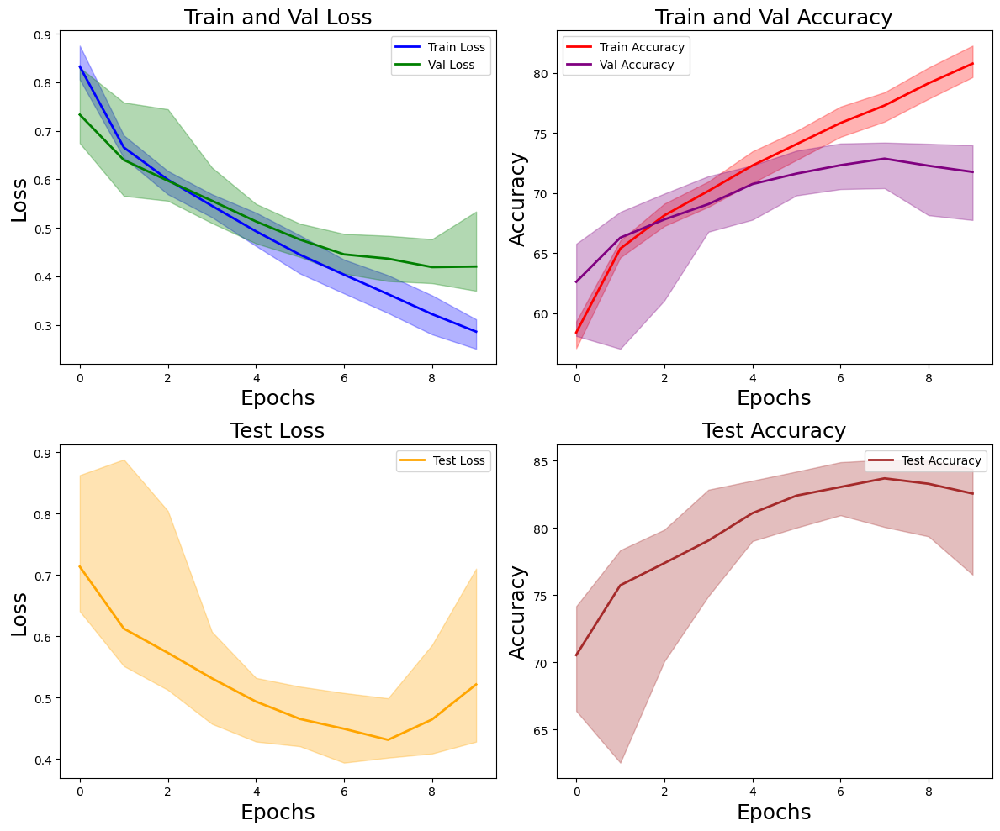

Data saved to importance_c10_resnet.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=0.0005,
    batch_size=32,
    num_epochs=10,
    times=10,
    method='importance',
    T_matrix=T_matrix,
    model_name='resnet',
    csv_path='importance_c10_resnet.csv',
)

resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.45it/s]


Noisy Loss: 1.1750,Validation Loss: 0.7539, Accuracy: 61.98% (2479/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 121.14it/s]


Test Loss: 0.7227, Accuracy: 70.17% (2807/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:02<00:00, 62.11it/s]


Noisy Loss: 1.1579,Validation Loss: 0.6589, Accuracy: 60.30% (2412/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.63it/s]


Test Loss: 0.8423, Accuracy: 69.35% (2774/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.22it/s]


Noisy Loss: 1.1227,Validation Loss: 0.6072, Accuracy: 67.10% (2684/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 108.10it/s]


Test Loss: 0.6017, Accuracy: 77.12% (3085/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:02<00:00, 61.61it/s]


Noisy Loss: 1.1029,Validation Loss: 0.5420, Accuracy: 69.00% (2760/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 107.92it/s]


Test Loss: 0.5246, Accuracy: 80.25% (3210/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.09it/s]


Noisy Loss: 1.0967,Validation Loss: 0.5103, Accuracy: 68.97% (2759/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 111.92it/s]


Test Loss: 0.4766, Accuracy: 81.00% (3240/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:02<00:00, 61.60it/s]


Noisy Loss: 1.0895,Validation Loss: 0.5041, Accuracy: 70.35% (2814/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.27it/s]


Test Loss: 0.4432, Accuracy: 82.47% (3299/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 65.25it/s]


Noisy Loss: 1.0832,Validation Loss: 0.4929, Accuracy: 70.90% (2836/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.80it/s]


Test Loss: 0.4574, Accuracy: 83.08% (3323/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.90it/s]


Noisy Loss: 1.0738,Validation Loss: 0.4474, Accuracy: 71.15% (2846/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.56it/s]


Test Loss: 0.4832, Accuracy: 83.03% (3321/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 62.87it/s]


Noisy Loss: 1.0704,Validation Loss: 0.4236, Accuracy: 71.75% (2870/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.90it/s]


Test Loss: 0.4777, Accuracy: 82.20% (3288/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 125/125 [00:02<00:00, 61.55it/s]


Noisy Loss: 1.0460,Validation Loss: 0.3398, Accuracy: 74.08% (2963/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 118.11it/s]


Test Loss: 0.4072, Accuracy: 85.38% (3415/4000)
Saved Best Model


<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(save_model_path))
Testing: 100%|██████████| 125/125 [00:0

Test Loss: 0.4072, Accuracy: 85.38% (3415/4000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.85it/s]


Noisy Loss: 1.2354,Validation Loss: 0.2214, Accuracy: 82.95% (3318/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.63it/s]


Test Loss: 0.3989, Accuracy: 85.60% (3424/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.83it/s]


Noisy Loss: 1.2352,Validation Loss: 0.2182, Accuracy: 82.97% (3319/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.43it/s]


Test Loss: 0.3992, Accuracy: 85.38% (3415/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.43it/s]


Noisy Loss: 1.2349,Validation Loss: 0.2149, Accuracy: 83.00% (3320/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.72it/s]


Test Loss: 0.3996, Accuracy: 85.65% (3426/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.84it/s]


Noisy Loss: 1.2347,Validation Loss: 0.2125, Accuracy: 83.03% (3321/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.30it/s]


Test Loss: 0.3999, Accuracy: 85.55% (3422/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.45it/s]


Noisy Loss: 1.2344,Validation Loss: 0.2104, Accuracy: 83.03% (3321/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.54it/s]


Test Loss: 0.3981, Accuracy: 85.62% (3425/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.88it/s]


Test Loss: 0.3981, Accuracy: 85.62% (3425/4000)
finished  1  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.96it/s]


Noisy Loss: 1.2365,Validation Loss: 0.2100, Accuracy: 82.15% (3286/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.55it/s]


Test Loss: 0.3981, Accuracy: 85.72% (3429/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.96it/s]


Noisy Loss: 1.2364,Validation Loss: 0.2090, Accuracy: 82.10% (3284/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.16it/s]


Test Loss: 0.3972, Accuracy: 85.72% (3429/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 10.14it/s]


Noisy Loss: 1.2362,Validation Loss: 0.2069, Accuracy: 82.10% (3284/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.07it/s]


Test Loss: 0.3976, Accuracy: 85.70% (3428/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.56it/s]


Noisy Loss: 1.2359,Validation Loss: 0.2032, Accuracy: 82.30% (3292/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.82it/s]


Test Loss: 0.3991, Accuracy: 85.78% (3431/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.76it/s]


Noisy Loss: 1.2358,Validation Loss: 0.2028, Accuracy: 82.17% (3287/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.97it/s]


Test Loss: 0.3974, Accuracy: 85.83% (3433/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.44it/s]


Test Loss: 0.3974, Accuracy: 85.83% (3433/4000)
finished  2  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.73it/s]


Noisy Loss: 1.2332,Validation Loss: 0.1938, Accuracy: 83.03% (3321/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.84it/s]


Test Loss: 0.3972, Accuracy: 85.75% (3430/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.68it/s]


Noisy Loss: 1.2330,Validation Loss: 0.1915, Accuracy: 83.00% (3320/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.92it/s]


Test Loss: 0.3966, Accuracy: 85.80% (3432/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.82it/s]


Noisy Loss: 1.2329,Validation Loss: 0.1903, Accuracy: 82.90% (3316/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.15it/s]


Test Loss: 0.3968, Accuracy: 85.88% (3435/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.80it/s]


Noisy Loss: 1.2328,Validation Loss: 0.1897, Accuracy: 82.92% (3317/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.70it/s]


Test Loss: 0.3959, Accuracy: 85.83% (3433/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.96it/s]


Noisy Loss: 1.2325,Validation Loss: 0.1864, Accuracy: 83.05% (3322/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.06it/s]


Test Loss: 0.3975, Accuracy: 86.10% (3444/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.98it/s]


Test Loss: 0.3975, Accuracy: 86.10% (3444/4000)
finished  3  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.98it/s]


Noisy Loss: 1.2328,Validation Loss: 0.1849, Accuracy: 82.85% (3314/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.20it/s]


Test Loss: 0.3971, Accuracy: 85.97% (3439/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.86it/s]


Noisy Loss: 1.2326,Validation Loss: 0.1828, Accuracy: 83.17% (3327/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.07it/s]


Test Loss: 0.3975, Accuracy: 86.08% (3443/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.69it/s]


Noisy Loss: 1.2323,Validation Loss: 0.1796, Accuracy: 83.10% (3324/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.24it/s]


Test Loss: 0.3988, Accuracy: 86.10% (3444/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.96it/s]


Noisy Loss: 1.2322,Validation Loss: 0.1785, Accuracy: 83.05% (3322/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.14it/s]


Test Loss: 0.3987, Accuracy: 86.15% (3446/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.83it/s]


Noisy Loss: 1.2322,Validation Loss: 0.1782, Accuracy: 82.95% (3318/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.53it/s]


Test Loss: 0.3984, Accuracy: 86.05% (3442/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.84it/s]


Test Loss: 0.3984, Accuracy: 86.05% (3442/4000)
finished  4  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.42it/s]


Noisy Loss: 1.2317,Validation Loss: 0.1742, Accuracy: 83.58% (3343/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.39it/s]


Test Loss: 0.3987, Accuracy: 86.08% (3443/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 10.04it/s]


Noisy Loss: 1.2314,Validation Loss: 0.1717, Accuracy: 83.70% (3348/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.16it/s]


Test Loss: 0.4000, Accuracy: 86.38% (3455/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.59it/s]


Noisy Loss: 1.2313,Validation Loss: 0.1709, Accuracy: 83.65% (3346/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.81it/s]


Test Loss: 0.3991, Accuracy: 86.25% (3450/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.92it/s]


Noisy Loss: 1.2312,Validation Loss: 0.1691, Accuracy: 83.62% (3345/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.34it/s]


Test Loss: 0.3998, Accuracy: 86.33% (3453/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.64it/s]


Noisy Loss: 1.2312,Validation Loss: 0.1689, Accuracy: 83.72% (3349/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.97it/s]


Test Loss: 0.3990, Accuracy: 86.10% (3444/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.60it/s]


Test Loss: 0.3990, Accuracy: 86.10% (3444/4000)
finished  5  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00, 10.01it/s]


Noisy Loss: 1.2319,Validation Loss: 0.1762, Accuracy: 83.28% (3331/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.67it/s]


Test Loss: 0.3996, Accuracy: 86.25% (3450/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.82it/s]


Noisy Loss: 1.2317,Validation Loss: 0.1746, Accuracy: 83.28% (3331/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.20it/s]


Test Loss: 0.4004, Accuracy: 86.40% (3456/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.87it/s]


Noisy Loss: 1.2315,Validation Loss: 0.1718, Accuracy: 83.38% (3335/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.62it/s]


Test Loss: 0.4032, Accuracy: 86.42% (3457/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.58it/s]


Noisy Loss: 1.2315,Validation Loss: 0.1716, Accuracy: 83.28% (3331/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.17it/s]


Test Loss: 0.4029, Accuracy: 86.40% (3456/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.94it/s]


Noisy Loss: 1.2314,Validation Loss: 0.1714, Accuracy: 83.40% (3336/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.70it/s]


Test Loss: 0.4008, Accuracy: 86.28% (3451/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.08it/s]


Test Loss: 0.4008, Accuracy: 86.28% (3451/4000)
finished  6  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.33it/s]


Noisy Loss: 1.2326,Validation Loss: 0.1703, Accuracy: 82.58% (3303/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.36it/s]


Test Loss: 0.4046, Accuracy: 86.47% (3459/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.78it/s]


Noisy Loss: 1.2324,Validation Loss: 0.1689, Accuracy: 82.60% (3304/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.18it/s]


Test Loss: 0.4043, Accuracy: 86.40% (3456/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.75it/s]


Noisy Loss: 1.2322,Validation Loss: 0.1654, Accuracy: 82.72% (3309/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.34it/s]


Test Loss: 0.4080, Accuracy: 86.53% (3461/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.99it/s]


Noisy Loss: 1.2322,Validation Loss: 0.1668, Accuracy: 82.53% (3301/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.37it/s]


Test Loss: 0.4039, Accuracy: 86.50% (3460/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.36it/s]


Noisy Loss: 1.2322,Validation Loss: 0.1657, Accuracy: 82.55% (3302/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.73it/s]


Test Loss: 0.4054, Accuracy: 86.53% (3461/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.15it/s]


Test Loss: 0.4080, Accuracy: 86.53% (3461/4000)
finished  7  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.86it/s]


Noisy Loss: 1.2294,Validation Loss: 0.1566, Accuracy: 84.00% (3360/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.13it/s]


Test Loss: 0.4059, Accuracy: 86.53% (3461/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.70it/s]


Noisy Loss: 1.2294,Validation Loss: 0.1557, Accuracy: 83.88% (3355/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.50it/s]


Test Loss: 0.4079, Accuracy: 86.45% (3458/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00, 10.02it/s]


Noisy Loss: 1.2293,Validation Loss: 0.1548, Accuracy: 83.90% (3356/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.86it/s]


Test Loss: 0.4074, Accuracy: 86.50% (3460/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.62it/s]


Noisy Loss: 1.2291,Validation Loss: 0.1532, Accuracy: 84.00% (3360/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.04it/s]


Test Loss: 0.4081, Accuracy: 86.40% (3456/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00, 10.04it/s]


Noisy Loss: 1.2291,Validation Loss: 0.1522, Accuracy: 83.88% (3355/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.96it/s]


Test Loss: 0.4078, Accuracy: 86.53% (3461/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.23it/s]


Test Loss: 0.4078, Accuracy: 86.53% (3461/4000)
finished  8  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.22it/s]


Noisy Loss: 1.2314,Validation Loss: 0.1552, Accuracy: 82.95% (3318/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.33it/s]


Test Loss: 0.4111, Accuracy: 86.35% (3454/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.98it/s]


Noisy Loss: 1.2313,Validation Loss: 0.1560, Accuracy: 82.78% (3311/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.29it/s]


Test Loss: 0.4073, Accuracy: 86.45% (3458/4000)


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.51it/s]


Noisy Loss: 1.2313,Validation Loss: 0.1537, Accuracy: 82.97% (3319/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.09it/s]


Test Loss: 0.4124, Accuracy: 86.28% (3451/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.95it/s]


Noisy Loss: 1.2312,Validation Loss: 0.1536, Accuracy: 82.78% (3311/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.95it/s]


Test Loss: 0.4097, Accuracy: 86.40% (3456/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.66it/s]


Noisy Loss: 1.2311,Validation Loss: 0.1519, Accuracy: 83.05% (3322/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.00it/s]


Test Loss: 0.4126, Accuracy: 86.40% (3456/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.04it/s]


Test Loss: 0.4126, Accuracy: 86.40% (3456/4000)
finished  9  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.80it/s]


Noisy Loss: 1.2316,Validation Loss: 0.1499, Accuracy: 82.85% (3314/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.89it/s]


Test Loss: 0.4130, Accuracy: 86.35% (3454/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.51it/s]


Noisy Loss: 1.2315,Validation Loss: 0.1493, Accuracy: 82.97% (3319/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.34it/s]


Test Loss: 0.4142, Accuracy: 86.40% (3456/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.99it/s]


Noisy Loss: 1.2315,Validation Loss: 0.1489, Accuracy: 82.95% (3318/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.06it/s]


Test Loss: 0.4167, Accuracy: 86.45% (3458/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.82it/s]


Noisy Loss: 1.2314,Validation Loss: 0.1476, Accuracy: 82.83% (3313/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.58it/s]


Test Loss: 0.4145, Accuracy: 86.38% (3455/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.81it/s]


Noisy Loss: 1.2314,Validation Loss: 0.1469, Accuracy: 82.90% (3316/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.84it/s]


Test Loss: 0.4179, Accuracy: 86.12% (3445/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.13it/s]


Test Loss: 0.4179, Accuracy: 86.12% (3445/4000)
finished  10  epoch
min_train_loss [0.21339642197366746, 0.20160103955912212, 0.1935967838480359, 0.1835624391124362, 0.17516800879486025, 0.16644331245195298, 0.16201363030880217, 0.1568613029898159, 0.14898156682177197, 0.1437841129917947]
min_val_loss [0.21044867392629385, 0.20283976942300797, 0.18635042943060398, 0.17822169605642557, 0.1688890801742673, 0.17137286998331547, 0.16538703255355358, 0.1522305733524263, 0.15194872487336397, 0.14689992601051927]
min_train_accuracy [82.23125, 82.74375, 82.65, 82.85625, 82.80625, 82.94375, 83.20625, 83.1, 83.45625, 83.3875]
min_val_accuracy [83.025, 82.175, 83.05, 82.95, 83.725, 83.4, 82.725, 83.875, 83.05, 82.9]
min_train_noise_loss [1.2359346719015212, 1.2341670270950076, 1.234070757078746, 1.2330977386898465, 1.2323238679340907, 1.2317102296011788, 1.230938606792026, 1.2308866902003213, 1.2297332097613622, 1.22929100574009]
min_val_noise_loss [1.2344491705298424, 1.2358354479074478, 1.23252

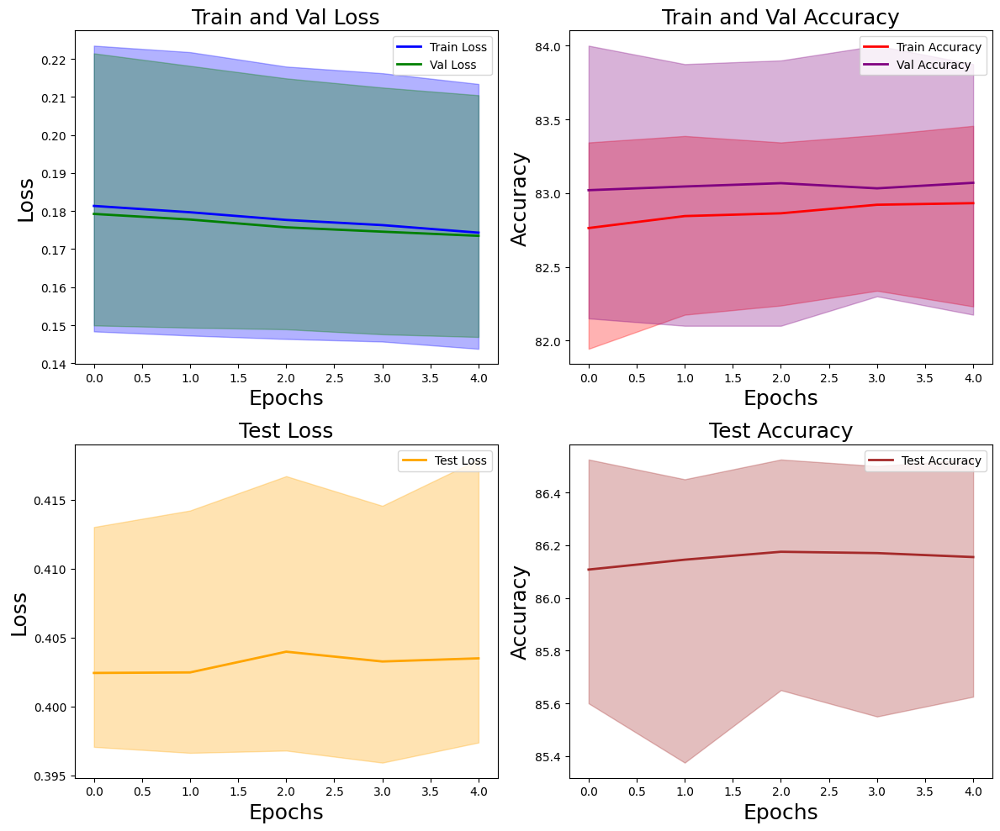

Data saved to t_revision_c10_resnet.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=5e-7,
    batch_size=256,
    num_epochs=5,
    method='t_revision',
    T_matrix=T_matrix,
    num_classes=4,
    optimizer_name='adam',
    times=10,
    model_name='resnet',
    csv_path='t_revision_c10_resnet.csv',
    )

resnet


Epoch 1 Validation: 100%|██████████| 125/125 [00:02<00:00, 59.91it/s]


Noisy Loss: 1.1695,Validation Loss: 0.7118, Accuracy: 63.17% (2527/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.78it/s]


Test Loss: 0.6849, Accuracy: 71.42% (2857/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.49it/s]


Noisy Loss: 1.1246,Validation Loss: 0.5841, Accuracy: 67.92% (2717/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 113.15it/s]


Test Loss: 0.5901, Accuracy: 75.80% (3032/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.06it/s]


Noisy Loss: 1.1142,Validation Loss: 0.5834, Accuracy: 69.42% (2777/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 110.88it/s]


Test Loss: 0.5149, Accuracy: 79.60% (3184/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 62.77it/s]


Noisy Loss: 1.1102,Validation Loss: 0.5603, Accuracy: 67.45% (2698/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 104.45it/s]


Test Loss: 0.6931, Accuracy: 75.10% (3004/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:02<00:00, 61.51it/s]


Noisy Loss: 1.0769,Validation Loss: 0.4684, Accuracy: 72.53% (2901/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 111.64it/s]


Test Loss: 0.4385, Accuracy: 82.78% (3311/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:02<00:00, 60.85it/s]


Noisy Loss: 1.0850,Validation Loss: 0.4926, Accuracy: 71.35% (2854/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 107.67it/s]


Test Loss: 0.4840, Accuracy: 82.47% (3299/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:02<00:00, 62.23it/s]


Noisy Loss: 1.0741,Validation Loss: 0.4366, Accuracy: 72.00% (2880/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 114.49it/s]


Test Loss: 0.4295, Accuracy: 83.12% (3325/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:02<00:00, 59.74it/s]


Noisy Loss: 1.0517,Validation Loss: 0.3876, Accuracy: 74.70% (2988/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 107.30it/s]


Test Loss: 0.3820, Accuracy: 85.08% (3403/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:02<00:00, 60.74it/s]


Noisy Loss: 1.0505,Validation Loss: 0.3709, Accuracy: 73.65% (2946/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 115.00it/s]


Test Loss: 0.4541, Accuracy: 84.35% (3374/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.83it/s]


Noisy Loss: 1.1057,Validation Loss: 0.5189, Accuracy: 65.97% (2639/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 102.85it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.7165, Accuracy: 76.83% (3073/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 110.27it/s]


Test Loss: 0.4541, Accuracy: 84.35% (3374/4000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.72it/s]


Noisy Loss: 1.2565,Validation Loss: 0.2518, Accuracy: 81.22% (3249/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.85it/s]


Test Loss: 0.4153, Accuracy: 84.60% (3384/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.75it/s]


Noisy Loss: 1.2563,Validation Loss: 0.2497, Accuracy: 81.33% (3253/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.03it/s]


Test Loss: 0.4138, Accuracy: 84.60% (3384/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.90it/s]


Noisy Loss: 1.2562,Validation Loss: 0.2495, Accuracy: 81.40% (3256/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.30it/s]


Test Loss: 0.4143, Accuracy: 84.70% (3388/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.82it/s]


Noisy Loss: 1.2562,Validation Loss: 0.2493, Accuracy: 81.25% (3250/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.43it/s]


Test Loss: 0.4127, Accuracy: 84.67% (3387/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.54it/s]


Noisy Loss: 1.2560,Validation Loss: 0.2477, Accuracy: 81.30% (3252/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.23it/s]


Test Loss: 0.4124, Accuracy: 84.62% (3385/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.63it/s]


Test Loss: 0.4124, Accuracy: 84.62% (3385/4000)
finished  1  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.92it/s]


Noisy Loss: 1.2545,Validation Loss: 0.2467, Accuracy: 81.75% (3270/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.96it/s]


Test Loss: 0.4130, Accuracy: 84.65% (3386/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.35it/s]


Noisy Loss: 1.2545,Validation Loss: 0.2461, Accuracy: 82.05% (3282/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.71it/s]


Test Loss: 0.4143, Accuracy: 84.70% (3388/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.65it/s]


Noisy Loss: 1.2548,Validation Loss: 0.2483, Accuracy: 81.65% (3266/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.93it/s]


Test Loss: 0.4123, Accuracy: 84.75% (3390/4000)


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.14it/s]


Noisy Loss: 1.2548,Validation Loss: 0.2482, Accuracy: 81.83% (3273/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.82it/s]


Test Loss: 0.4166, Accuracy: 84.65% (3386/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.79it/s]


Noisy Loss: 1.2546,Validation Loss: 0.2470, Accuracy: 81.85% (3274/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.86it/s]


Test Loss: 0.4137, Accuracy: 84.67% (3387/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.17it/s]


Test Loss: 0.4143, Accuracy: 84.70% (3388/4000)
finished  2  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.40it/s]


Noisy Loss: 1.2549,Validation Loss: 0.2510, Accuracy: 81.50% (3260/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.11it/s]


Test Loss: 0.4100, Accuracy: 84.75% (3390/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.81it/s]


Noisy Loss: 1.2549,Validation Loss: 0.2501, Accuracy: 81.60% (3264/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.79it/s]


Test Loss: 0.4118, Accuracy: 84.75% (3390/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.79it/s]


Noisy Loss: 1.2549,Validation Loss: 0.2494, Accuracy: 81.58% (3263/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.02it/s]


Test Loss: 0.4110, Accuracy: 84.72% (3389/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 10.01it/s]


Noisy Loss: 1.2548,Validation Loss: 0.2492, Accuracy: 81.55% (3262/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.72it/s]


Test Loss: 0.4111, Accuracy: 84.70% (3388/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.89it/s]


Noisy Loss: 1.2549,Validation Loss: 0.2497, Accuracy: 81.65% (3266/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.22it/s]


Test Loss: 0.4096, Accuracy: 84.88% (3395/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.82it/s]


Test Loss: 0.4111, Accuracy: 84.70% (3388/4000)
finished  3  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.72it/s]


Noisy Loss: 1.2551,Validation Loss: 0.2411, Accuracy: 81.12% (3245/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.55it/s]


Test Loss: 0.4072, Accuracy: 85.00% (3400/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.76it/s]


Noisy Loss: 1.2554,Validation Loss: 0.2414, Accuracy: 81.03% (3241/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.25it/s]


Test Loss: 0.4081, Accuracy: 84.72% (3389/4000)


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.84it/s]


Noisy Loss: 1.2553,Validation Loss: 0.2408, Accuracy: 81.10% (3244/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.21it/s]


Test Loss: 0.4085, Accuracy: 84.75% (3390/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00, 10.07it/s]


Noisy Loss: 1.2551,Validation Loss: 0.2386, Accuracy: 81.17% (3247/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.90it/s]


Test Loss: 0.4087, Accuracy: 84.90% (3396/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.73it/s]


Noisy Loss: 1.2551,Validation Loss: 0.2384, Accuracy: 81.08% (3243/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.27it/s]


Test Loss: 0.4075, Accuracy: 84.85% (3394/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.12it/s]


Test Loss: 0.4075, Accuracy: 84.85% (3394/4000)
finished  4  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.71it/s]


Noisy Loss: 1.2539,Validation Loss: 0.2404, Accuracy: 82.05% (3282/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.26it/s]


Test Loss: 0.4076, Accuracy: 84.90% (3396/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.38it/s]


Noisy Loss: 1.2538,Validation Loss: 0.2399, Accuracy: 82.05% (3282/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.11it/s]


Test Loss: 0.4069, Accuracy: 84.80% (3392/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.74it/s]


Noisy Loss: 1.2537,Validation Loss: 0.2393, Accuracy: 82.05% (3282/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.38it/s]


Test Loss: 0.4070, Accuracy: 84.83% (3393/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.79it/s]


Noisy Loss: 1.2539,Validation Loss: 0.2408, Accuracy: 82.03% (3281/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.53it/s]


Test Loss: 0.4037, Accuracy: 84.85% (3394/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.62it/s]


Noisy Loss: 1.2537,Validation Loss: 0.2392, Accuracy: 82.12% (3285/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.37it/s]


Test Loss: 0.4054, Accuracy: 84.97% (3399/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.05it/s]


Test Loss: 0.4054, Accuracy: 84.97% (3399/4000)
finished  5  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.79it/s]


Noisy Loss: 1.2536,Validation Loss: 0.2292, Accuracy: 82.30% (3292/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.20it/s]


Test Loss: 0.4062, Accuracy: 85.00% (3400/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.75it/s]


Noisy Loss: 1.2533,Validation Loss: 0.2307, Accuracy: 82.47% (3299/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.12it/s]


Test Loss: 0.4058, Accuracy: 84.92% (3397/4000)


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.81it/s]


Noisy Loss: 1.2533,Validation Loss: 0.2296, Accuracy: 82.40% (3296/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.83it/s]


Test Loss: 0.4067, Accuracy: 84.95% (3398/4000)


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.68it/s]


Noisy Loss: 1.2534,Validation Loss: 0.2282, Accuracy: 82.47% (3299/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.91it/s]


Test Loss: 0.4083, Accuracy: 84.97% (3399/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.74it/s]


Noisy Loss: 1.2532,Validation Loss: 0.2278, Accuracy: 82.55% (3302/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.24it/s]


Test Loss: 0.4074, Accuracy: 85.08% (3403/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.44it/s]


Test Loss: 0.4074, Accuracy: 85.08% (3403/4000)
finished  6  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.66it/s]


Noisy Loss: 1.2536,Validation Loss: 0.2231, Accuracy: 82.40% (3296/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.22it/s]


Test Loss: 0.4045, Accuracy: 84.92% (3397/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00, 10.03it/s]


Noisy Loss: 1.2536,Validation Loss: 0.2170, Accuracy: 82.33% (3293/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.60it/s]


Test Loss: 0.4056, Accuracy: 85.08% (3403/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.62it/s]


Noisy Loss: 1.2534,Validation Loss: 0.2255, Accuracy: 82.30% (3292/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.32it/s]


Test Loss: 0.4016, Accuracy: 84.92% (3397/4000)


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.68it/s]


Noisy Loss: 1.2533,Validation Loss: 0.2249, Accuracy: 82.42% (3297/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.46it/s]


Test Loss: 0.4019, Accuracy: 85.00% (3400/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.74it/s]


Noisy Loss: 1.2535,Validation Loss: 0.2247, Accuracy: 82.22% (3289/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.11it/s]


Test Loss: 0.4020, Accuracy: 85.10% (3404/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.11it/s]


Test Loss: 0.4056, Accuracy: 85.08% (3403/4000)
finished  7  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.84it/s]


Noisy Loss: 1.2530,Validation Loss: 0.2219, Accuracy: 82.12% (3285/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.23it/s]


Test Loss: 0.4033, Accuracy: 85.00% (3400/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.76it/s]


Noisy Loss: 1.2529,Validation Loss: 0.2196, Accuracy: 82.28% (3291/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.40it/s]


Test Loss: 0.4038, Accuracy: 85.17% (3407/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.82it/s]


Noisy Loss: 1.2530,Validation Loss: 0.2257, Accuracy: 82.25% (3290/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.22it/s]


Test Loss: 0.4035, Accuracy: 85.12% (3405/4000)


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.76it/s]


Noisy Loss: 1.2528,Validation Loss: 0.2172, Accuracy: 82.30% (3292/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.74it/s]


Test Loss: 0.4032, Accuracy: 85.20% (3408/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.36it/s]


Noisy Loss: 1.2527,Validation Loss: 0.2154, Accuracy: 82.42% (3297/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.92it/s]


Test Loss: 0.4038, Accuracy: 85.35% (3414/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.32it/s]


Test Loss: 0.4038, Accuracy: 85.35% (3414/4000)
finished  8  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.69it/s]


Noisy Loss: 1.2548,Validation Loss: 0.2361, Accuracy: 81.70% (3268/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.99it/s]


Test Loss: 0.4027, Accuracy: 85.17% (3407/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.70it/s]


Noisy Loss: 1.2546,Validation Loss: 0.2346, Accuracy: 81.78% (3271/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.06it/s]


Test Loss: 0.3993, Accuracy: 85.25% (3410/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.78it/s]


Noisy Loss: 1.2547,Validation Loss: 0.2349, Accuracy: 81.75% (3270/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.17it/s]


Test Loss: 0.4003, Accuracy: 85.17% (3407/4000)


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.80it/s]


Noisy Loss: 1.2546,Validation Loss: 0.2346, Accuracy: 81.88% (3275/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.96it/s]


Test Loss: 0.4026, Accuracy: 85.38% (3415/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.82it/s]


Noisy Loss: 1.2546,Validation Loss: 0.2346, Accuracy: 81.67% (3267/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.90it/s]


Test Loss: 0.3986, Accuracy: 85.20% (3408/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.58it/s]


Test Loss: 0.3993, Accuracy: 85.25% (3410/4000)
finished  9  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.79it/s]


Noisy Loss: 1.2527,Validation Loss: 0.2207, Accuracy: 82.58% (3303/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.29it/s]


Test Loss: 0.4006, Accuracy: 85.38% (3415/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.90it/s]


Noisy Loss: 1.2528,Validation Loss: 0.2205, Accuracy: 82.50% (3300/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 23.03it/s]


Test Loss: 0.4006, Accuracy: 85.25% (3410/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.57it/s]


Noisy Loss: 1.2530,Validation Loss: 0.2221, Accuracy: 82.40% (3296/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.79it/s]


Test Loss: 0.3977, Accuracy: 85.25% (3410/4000)


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.72it/s]


Noisy Loss: 1.2525,Validation Loss: 0.2188, Accuracy: 82.75% (3310/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.80it/s]


Test Loss: 0.4011, Accuracy: 85.28% (3411/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.77it/s]


Noisy Loss: 1.2528,Validation Loss: 0.2207, Accuracy: 82.45% (3298/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.80it/s]


Test Loss: 0.3981, Accuracy: 85.25% (3410/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.83it/s]


Test Loss: 0.4011, Accuracy: 85.28% (3411/4000)
finished  10  epoch
min_train_loss [0.25921642259945943, 0.24520679912160312, 0.24131407696635476, 0.24007159802648756, 0.23868398321053338, 0.23184387622371552, 0.2359169101904309, 0.2267434670338555, 0.2270308430232699, 0.22693893502628992]
min_val_loss [0.24770058505237103, 0.24611608684062958, 0.24915822315961123, 0.23836164455860853, 0.23920941352844238, 0.22784761432558298, 0.2169657478807494, 0.21538474829867482, 0.23455418646335602, 0.21879080403596163]
min_train_accuracy [81.6875, 81.58125, 81.80625, 82.01875, 81.8125, 81.69375, 81.95, 82.11875, 82.3625, 82.11875]
min_val_accuracy [81.3, 82.05, 81.55, 81.075, 82.125, 82.55, 82.325, 82.425, 81.775, 82.75]
min_train_noise_loss [0.9880718759128025, 0.9892092082235548, 0.9879062081140185, 0.9862829636013697, 0.9865442996933347, 0.9856492422875904, 0.9849336516289484, 0.9834221478492494, 0.9822679105259123, 0.9827977693270123]
min_val_noise_loss [1.2560285553336143, 1.2544522061944008

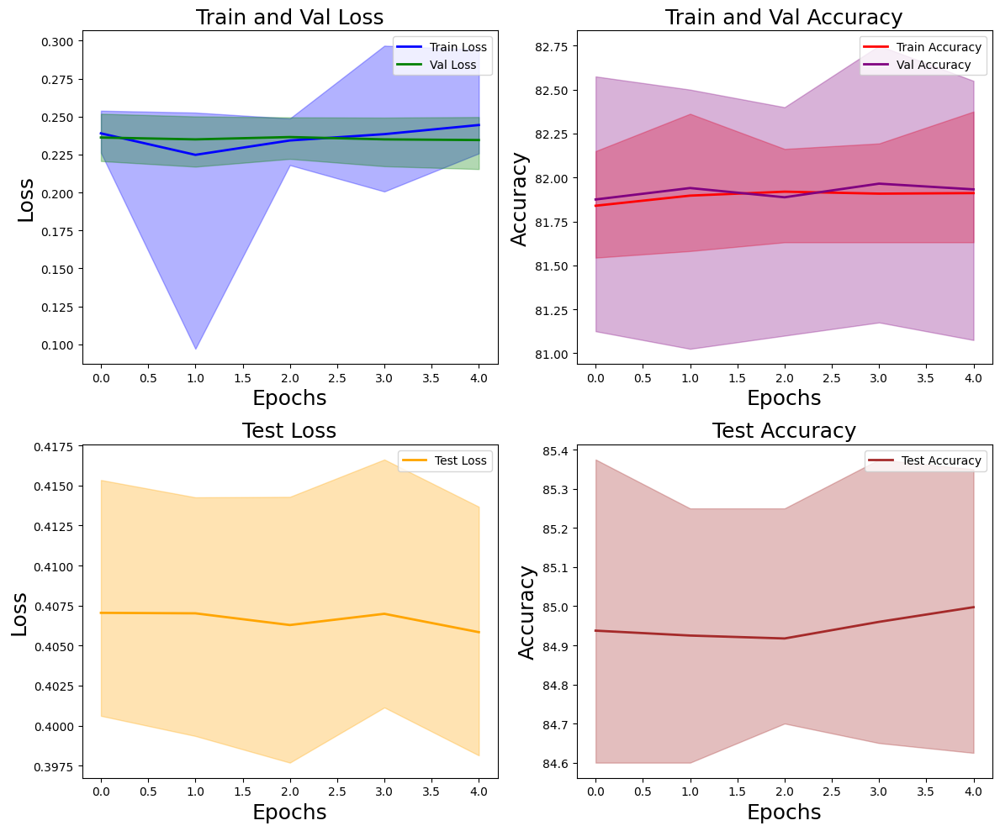

Data saved to t_revision_v2_c10_resnet.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=5e-7,
    batch_size=256,
    num_epochs=5,
    method='t_revision_v2',
    T_matrix=T_matrix,
    num_classes=4,
    optimizer_name='adam',
    times=10,
    model_name='resnet',
    csv_path='t_revision_v2_c10_resnet.csv',
    )

## MLP

### FashionMNIST0.3

In [ ]:
# Example T-Matrix (needs to be set according to your data)
T_matrix = np.array([
    [0.7, 0.3, 0.0, 0.0],
    [0.0, 0.7, 0.3, 0.0],
    [0.0, 0.0, 0.7, 0.3],
    [0.3, 0.0, 0.0, 0.7]
])

X_train_full=data_f3_X_tr
y_train_full=data_f3_S_tr
X_test=data_f3_X_ts
y_test=data_f3_Y_ts


mlp


Epoch 1 Validation: 100%|██████████| 38/38 [00:00<00:00, 49.60it/s]


Noisy Loss: 1.1371,Validation Loss: 0.7409, Accuracy: 66.48% (3191/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.96it/s]


Test Loss: 0.5068, Accuracy: 91.67% (3667/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 38/38 [00:00<00:00, 48.78it/s]


Noisy Loss: 1.1394,Validation Loss: 0.7477, Accuracy: 65.94% (3165/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.31it/s]


Test Loss: 0.5279, Accuracy: 91.60% (3664/4000)


Epoch 3 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.75it/s]


Noisy Loss: 1.1404,Validation Loss: 0.7340, Accuracy: 66.90% (3211/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.75it/s]


Test Loss: 0.5229, Accuracy: 92.95% (3718/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 38/38 [00:00<00:00, 47.77it/s]


Noisy Loss: 1.1328,Validation Loss: 0.7273, Accuracy: 66.31% (3183/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.92it/s]


Test Loss: 0.4942, Accuracy: 91.58% (3663/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 38/38 [00:00<00:00, 52.74it/s]


Noisy Loss: 1.1359,Validation Loss: 0.7189, Accuracy: 67.06% (3219/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 44.16it/s]


Test Loss: 0.5199, Accuracy: 93.15% (3726/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 38/38 [00:00<00:00, 49.26it/s]


Noisy Loss: 1.1315,Validation Loss: 0.7204, Accuracy: 67.04% (3218/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 44.37it/s]


Test Loss: 0.5012, Accuracy: 93.00% (3720/4000)


Epoch 7 Validation: 100%|██████████| 38/38 [00:00<00:00, 52.50it/s]


Noisy Loss: 1.1332,Validation Loss: 0.7266, Accuracy: 66.81% (3207/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.69it/s]


Test Loss: 0.4977, Accuracy: 92.95% (3718/4000)


Epoch 8 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.92it/s]


Noisy Loss: 1.1284,Validation Loss: 0.7177, Accuracy: 66.83% (3208/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 47.17it/s]


Test Loss: 0.4790, Accuracy: 93.58% (3743/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 38/38 [00:00<00:00, 49.97it/s]


Noisy Loss: 1.1295,Validation Loss: 0.7158, Accuracy: 67.35% (3233/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 47.45it/s]


Test Loss: 0.4836, Accuracy: 93.62% (3745/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 38/38 [00:00<00:00, 51.38it/s]


Noisy Loss: 1.1248,Validation Loss: 0.7179, Accuracy: 67.52% (3241/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.28it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(

Test Loss: 0.4684, Accuracy: 93.47% (3739/4000)


Testing: 100%|██████████| 32/32 [00:00<00:00, 42.88it/s]


Test Loss: 0.4836, Accuracy: 93.62% (3745/4000)
finished  1  epoch
mlp


Epoch 1 Validation: 100%|██████████| 38/38 [00:00<00:00, 52.12it/s]


Noisy Loss: 1.1412,Validation Loss: 0.7757, Accuracy: 65.48% (3143/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.87it/s]


Test Loss: 0.4944, Accuracy: 91.33% (3653/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.84it/s]


Noisy Loss: 1.1452,Validation Loss: 0.7537, Accuracy: 65.69% (3153/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.34it/s]


Test Loss: 0.5337, Accuracy: 91.70% (3668/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.78it/s]


Noisy Loss: 1.1418,Validation Loss: 0.7463, Accuracy: 65.69% (3153/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 44.71it/s]


Test Loss: 0.5278, Accuracy: 91.55% (3662/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 38/38 [00:00<00:00, 53.33it/s]


Noisy Loss: 1.1419,Validation Loss: 0.7529, Accuracy: 65.31% (3135/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.11it/s]


Test Loss: 0.5210, Accuracy: 92.62% (3705/4000)


Epoch 5 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.88it/s]


Noisy Loss: 1.1394,Validation Loss: 0.7472, Accuracy: 65.60% (3149/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.52it/s]


Test Loss: 0.5068, Accuracy: 92.45% (3698/4000)


Epoch 6 Validation: 100%|██████████| 38/38 [00:00<00:00, 51.43it/s]


Noisy Loss: 1.1274,Validation Loss: 0.7718, Accuracy: 65.33% (3136/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.24it/s]


Test Loss: 0.4568, Accuracy: 92.10% (3684/4000)


Epoch 7 Validation: 100%|██████████| 38/38 [00:00<00:00, 51.51it/s]


Noisy Loss: 1.1332,Validation Loss: 0.7485, Accuracy: 66.08% (3172/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.07it/s]


Test Loss: 0.4712, Accuracy: 93.33% (3733/4000)


Epoch 8 Validation: 100%|██████████| 38/38 [00:00<00:00, 48.32it/s]


Noisy Loss: 1.1334,Validation Loss: 0.7361, Accuracy: 65.75% (3156/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.17it/s]


Test Loss: 0.4909, Accuracy: 93.33% (3733/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 38/38 [00:00<00:00, 52.26it/s]


Noisy Loss: 1.1392,Validation Loss: 0.7536, Accuracy: 66.02% (3169/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.25it/s]


Test Loss: 0.5135, Accuracy: 93.20% (3728/4000)


Epoch 10 Validation: 100%|██████████| 38/38 [00:00<00:00, 52.64it/s]


Noisy Loss: 1.1380,Validation Loss: 0.7354, Accuracy: 66.00% (3168/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 47.10it/s]


Test Loss: 0.5121, Accuracy: 93.20% (3728/4000)
Saved Best Model


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.27it/s]


Test Loss: 0.5121, Accuracy: 93.20% (3728/4000)
finished  2  epoch
mlp


Epoch 1 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.58it/s]


Noisy Loss: 1.1502,Validation Loss: 0.7542, Accuracy: 65.52% (3145/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.83it/s]


Test Loss: 0.5606, Accuracy: 91.20% (3648/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.05it/s]


Noisy Loss: 1.1415,Validation Loss: 0.7520, Accuracy: 65.58% (3148/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 42.92it/s]


Test Loss: 0.5148, Accuracy: 90.62% (3625/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 38/38 [00:00<00:00, 51.54it/s]


Noisy Loss: 1.1236,Validation Loss: 0.7484, Accuracy: 66.35% (3185/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.32it/s]


Test Loss: 0.4275, Accuracy: 92.97% (3719/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.59it/s]


Noisy Loss: 1.1356,Validation Loss: 0.7477, Accuracy: 65.92% (3164/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.24it/s]


Test Loss: 0.4963, Accuracy: 91.88% (3675/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 38/38 [00:00<00:00, 51.42it/s]


Noisy Loss: 1.1412,Validation Loss: 0.7274, Accuracy: 66.25% (3180/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.09it/s]


Test Loss: 0.5356, Accuracy: 92.60% (3704/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 38/38 [00:00<00:00, 49.83it/s]


Noisy Loss: 1.1232,Validation Loss: 0.7295, Accuracy: 66.73% (3203/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 44.06it/s]


Test Loss: 0.4446, Accuracy: 93.42% (3737/4000)


Epoch 7 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.77it/s]


Noisy Loss: 1.1374,Validation Loss: 0.7260, Accuracy: 66.92% (3212/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.90it/s]


Test Loss: 0.5148, Accuracy: 93.30% (3732/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 38/38 [00:00<00:00, 52.98it/s]


Noisy Loss: 1.1265,Validation Loss: 0.7283, Accuracy: 66.81% (3207/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.33it/s]


Test Loss: 0.4651, Accuracy: 92.72% (3709/4000)


Epoch 9 Validation: 100%|██████████| 38/38 [00:00<00:00, 51.24it/s]


Noisy Loss: 1.1242,Validation Loss: 0.7286, Accuracy: 66.52% (3193/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.65it/s]


Test Loss: 0.4565, Accuracy: 92.78% (3711/4000)


Epoch 10 Validation: 100%|██████████| 38/38 [00:00<00:00, 51.36it/s]


Noisy Loss: 1.1358,Validation Loss: 0.7171, Accuracy: 66.56% (3195/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 42.82it/s]


Test Loss: 0.5066, Accuracy: 93.30% (3732/4000)
Saved Best Model


Testing: 100%|██████████| 32/32 [00:00<00:00, 44.83it/s]


Test Loss: 0.5066, Accuracy: 93.30% (3732/4000)
finished  3  epoch
mlp


Epoch 1 Validation: 100%|██████████| 38/38 [00:00<00:00, 49.72it/s]


Noisy Loss: 1.1570,Validation Loss: 0.7773, Accuracy: 65.15% (3127/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.04it/s]


Test Loss: 0.5890, Accuracy: 89.55% (3582/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 38/38 [00:00<00:00, 52.76it/s]


Noisy Loss: 1.1282,Validation Loss: 0.7485, Accuracy: 66.29% (3182/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 47.34it/s]


Test Loss: 0.4624, Accuracy: 91.88% (3675/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 38/38 [00:00<00:00, 51.93it/s]


Noisy Loss: 1.1352,Validation Loss: 0.7392, Accuracy: 66.40% (3187/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 43.83it/s]


Test Loss: 0.5126, Accuracy: 93.00% (3720/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 38/38 [00:00<00:00, 49.79it/s]


Noisy Loss: 1.1340,Validation Loss: 0.7275, Accuracy: 66.54% (3194/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 40.87it/s]


Test Loss: 0.5022, Accuracy: 93.45% (3738/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 38/38 [00:00<00:00, 49.73it/s]


Noisy Loss: 1.1572,Validation Loss: 0.7569, Accuracy: 66.17% (3176/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.87it/s]


Test Loss: 0.5955, Accuracy: 91.45% (3658/4000)


Epoch 6 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.12it/s]


Noisy Loss: 1.1387,Validation Loss: 0.7406, Accuracy: 66.71% (3202/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.00it/s]


Test Loss: 0.5386, Accuracy: 92.03% (3681/4000)


Epoch 7 Validation: 100%|██████████| 38/38 [00:00<00:00, 48.74it/s]


Noisy Loss: 1.1333,Validation Loss: 0.7228, Accuracy: 66.83% (3208/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.77it/s]


Test Loss: 0.4971, Accuracy: 93.70% (3748/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.22it/s]


Noisy Loss: 1.1421,Validation Loss: 0.7253, Accuracy: 66.92% (3212/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.22it/s]


Test Loss: 0.5444, Accuracy: 93.45% (3738/4000)


Epoch 9 Validation: 100%|██████████| 38/38 [00:00<00:00, 52.27it/s]


Noisy Loss: 1.1265,Validation Loss: 0.7267, Accuracy: 67.00% (3216/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.52it/s]


Test Loss: 0.4722, Accuracy: 93.78% (3751/4000)


Epoch 10 Validation: 100%|██████████| 38/38 [00:00<00:00, 51.80it/s]


Noisy Loss: 1.1253,Validation Loss: 0.7199, Accuracy: 66.90% (3211/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 47.29it/s]


Test Loss: 0.4740, Accuracy: 93.12% (3725/4000)
Saved Best Model


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.08it/s]


Test Loss: 0.4740, Accuracy: 93.12% (3725/4000)
finished  4  epoch
mlp


Epoch 1 Validation: 100%|██████████| 38/38 [00:00<00:00, 48.00it/s]


Noisy Loss: 1.1402,Validation Loss: 0.7457, Accuracy: 66.33% (3184/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.85it/s]


Test Loss: 0.5223, Accuracy: 90.88% (3635/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 38/38 [00:00<00:00, 49.25it/s]


Noisy Loss: 1.1501,Validation Loss: 0.7592, Accuracy: 65.06% (3123/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 44.96it/s]


Test Loss: 0.5761, Accuracy: 88.20% (3528/4000)


Epoch 3 Validation: 100%|██████████| 38/38 [00:00<00:00, 49.42it/s]


Noisy Loss: 1.1368,Validation Loss: 0.7358, Accuracy: 66.27% (3181/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 44.52it/s]


Test Loss: 0.5144, Accuracy: 92.17% (3687/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.00it/s]


Noisy Loss: 1.1417,Validation Loss: 0.7265, Accuracy: 66.54% (3194/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.22it/s]


Test Loss: 0.5472, Accuracy: 92.40% (3696/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.45it/s]


Noisy Loss: 1.1413,Validation Loss: 0.7279, Accuracy: 66.90% (3211/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.03it/s]


Test Loss: 0.5344, Accuracy: 93.28% (3731/4000)


Epoch 6 Validation: 100%|██████████| 38/38 [00:00<00:00, 52.60it/s]


Noisy Loss: 1.1349,Validation Loss: 0.7225, Accuracy: 66.96% (3214/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 43.78it/s]


Test Loss: 0.5280, Accuracy: 92.22% (3689/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 38/38 [00:00<00:00, 51.47it/s]


Noisy Loss: 1.1402,Validation Loss: 0.7293, Accuracy: 66.25% (3180/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.96it/s]


Test Loss: 0.5359, Accuracy: 91.85% (3674/4000)


Epoch 8 Validation: 100%|██████████| 38/38 [00:00<00:00, 49.40it/s]


Noisy Loss: 1.1280,Validation Loss: 0.7324, Accuracy: 66.90% (3211/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.24it/s]


Test Loss: 0.4728, Accuracy: 93.20% (3728/4000)


Epoch 9 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.78it/s]


Noisy Loss: 1.1333,Validation Loss: 0.7293, Accuracy: 66.62% (3198/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.29it/s]


Test Loss: 0.5098, Accuracy: 93.30% (3732/4000)


Epoch 10 Validation: 100%|██████████| 38/38 [00:00<00:00, 51.32it/s]


Noisy Loss: 1.1398,Validation Loss: 0.7469, Accuracy: 66.52% (3193/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.20it/s]


Test Loss: 0.5170, Accuracy: 92.17% (3687/4000)


Testing: 100%|██████████| 32/32 [00:00<00:00, 43.88it/s]


Test Loss: 0.5280, Accuracy: 92.22% (3689/4000)
finished  5  epoch
mlp


Epoch 1 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.87it/s]


Noisy Loss: 1.1557,Validation Loss: 0.7711, Accuracy: 64.46% (3094/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.48it/s]


Test Loss: 0.5778, Accuracy: 88.28% (3531/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.89it/s]


Noisy Loss: 1.1409,Validation Loss: 0.7550, Accuracy: 65.65% (3151/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.39it/s]


Test Loss: 0.5149, Accuracy: 91.20% (3648/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 38/38 [00:00<00:00, 51.57it/s]


Noisy Loss: 1.1450,Validation Loss: 0.7618, Accuracy: 61.50% (2952/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.78it/s]


Test Loss: 0.5478, Accuracy: 80.58% (3223/4000)


Epoch 4 Validation: 100%|██████████| 38/38 [00:00<00:00, 51.34it/s]


Noisy Loss: 1.1385,Validation Loss: 0.7310, Accuracy: 66.04% (3170/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 43.94it/s]


Test Loss: 0.5187, Accuracy: 92.15% (3686/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 38/38 [00:00<00:00, 51.18it/s]


Noisy Loss: 1.1334,Validation Loss: 0.7423, Accuracy: 65.92% (3164/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.98it/s]


Test Loss: 0.4847, Accuracy: 92.50% (3700/4000)


Epoch 6 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.06it/s]


Noisy Loss: 1.1356,Validation Loss: 0.7302, Accuracy: 66.56% (3195/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 43.83it/s]


Test Loss: 0.4979, Accuracy: 93.67% (3747/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 38/38 [00:00<00:00, 49.42it/s]


Noisy Loss: 1.1369,Validation Loss: 0.7279, Accuracy: 66.23% (3179/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 44.95it/s]


Test Loss: 0.5215, Accuracy: 92.92% (3717/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 38/38 [00:00<00:00, 51.75it/s]


Noisy Loss: 1.1381,Validation Loss: 0.7394, Accuracy: 66.21% (3178/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.31it/s]


Test Loss: 0.5132, Accuracy: 93.58% (3743/4000)


Epoch 9 Validation: 100%|██████████| 38/38 [00:00<00:00, 51.25it/s]


Noisy Loss: 1.1320,Validation Loss: 0.7296, Accuracy: 66.60% (3197/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 43.46it/s]


Test Loss: 0.5037, Accuracy: 92.70% (3708/4000)


Epoch 10 Validation: 100%|██████████| 38/38 [00:00<00:00, 48.67it/s]


Noisy Loss: 1.1315,Validation Loss: 0.7286, Accuracy: 66.56% (3195/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.96it/s]


Test Loss: 0.4853, Accuracy: 93.47% (3739/4000)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.13it/s]


Test Loss: 0.5215, Accuracy: 92.92% (3717/4000)
finished  6  epoch
mlp


Epoch 1 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.25it/s]


Noisy Loss: 1.1425,Validation Loss: 0.7462, Accuracy: 66.10% (3173/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.30it/s]


Test Loss: 0.5565, Accuracy: 89.40% (3576/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 38/38 [00:00<00:00, 49.79it/s]


Noisy Loss: 1.1416,Validation Loss: 0.7319, Accuracy: 67.46% (3238/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 44.29it/s]


Test Loss: 0.5454, Accuracy: 91.95% (3678/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 38/38 [00:00<00:00, 52.89it/s]


Noisy Loss: 1.1426,Validation Loss: 0.7320, Accuracy: 67.21% (3226/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.14it/s]


Test Loss: 0.5503, Accuracy: 91.30% (3652/4000)


Epoch 4 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.13it/s]


Noisy Loss: 1.1331,Validation Loss: 0.7143, Accuracy: 67.77% (3253/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.13it/s]


Test Loss: 0.5168, Accuracy: 92.70% (3708/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.83it/s]


Noisy Loss: 1.1261,Validation Loss: 0.7208, Accuracy: 67.69% (3249/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.80it/s]


Test Loss: 0.4865, Accuracy: 92.88% (3715/4000)


Epoch 6 Validation: 100%|██████████| 38/38 [00:00<00:00, 51.12it/s]


Noisy Loss: 1.1334,Validation Loss: 0.7289, Accuracy: 67.29% (3230/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 44.46it/s]


Test Loss: 0.5099, Accuracy: 93.03% (3721/4000)


Epoch 7 Validation: 100%|██████████| 38/38 [00:00<00:00, 48.42it/s]


Noisy Loss: 1.1367,Validation Loss: 0.7228, Accuracy: 67.31% (3231/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.24it/s]


Test Loss: 0.5293, Accuracy: 92.08% (3683/4000)


Epoch 8 Validation: 100%|██████████| 38/38 [00:00<00:00, 48.91it/s]


Noisy Loss: 1.1210,Validation Loss: 0.7155, Accuracy: 67.85% (3257/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.80it/s]


Test Loss: 0.4575, Accuracy: 93.75% (3750/4000)


Epoch 9 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.93it/s]


Noisy Loss: 1.1338,Validation Loss: 0.7205, Accuracy: 67.75% (3252/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 44.64it/s]


Test Loss: 0.5111, Accuracy: 93.17% (3727/4000)


Epoch 10 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.48it/s]


Noisy Loss: 1.1457,Validation Loss: 0.7309, Accuracy: 66.90% (3211/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 43.72it/s]


Test Loss: 0.5743, Accuracy: 92.80% (3712/4000)


Testing: 100%|██████████| 32/32 [00:00<00:00, 43.84it/s]


Test Loss: 0.5168, Accuracy: 92.70% (3708/4000)
finished  7  epoch
mlp


Epoch 1 Validation: 100%|██████████| 38/38 [00:00<00:00, 51.05it/s]


Noisy Loss: 1.1272,Validation Loss: 0.7607, Accuracy: 67.81% (3255/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.38it/s]


Test Loss: 0.4874, Accuracy: 92.15% (3686/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 38/38 [00:00<00:00, 51.75it/s]


Noisy Loss: 1.1393,Validation Loss: 0.7373, Accuracy: 67.62% (3246/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 44.15it/s]


Test Loss: 0.5378, Accuracy: 92.55% (3702/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.95it/s]


Noisy Loss: 1.1381,Validation Loss: 0.7568, Accuracy: 66.90% (3211/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.98it/s]


Test Loss: 0.5527, Accuracy: 90.72% (3629/4000)


Epoch 4 Validation: 100%|██████████| 38/38 [00:00<00:00, 48.84it/s]


Noisy Loss: 1.1296,Validation Loss: 0.7270, Accuracy: 67.90% (3259/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 44.79it/s]


Test Loss: 0.5110, Accuracy: 92.70% (3708/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.62it/s]


Noisy Loss: 1.1284,Validation Loss: 0.7183, Accuracy: 68.02% (3265/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 47.40it/s]


Test Loss: 0.4987, Accuracy: 93.15% (3726/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 38/38 [00:00<00:00, 49.94it/s]


Noisy Loss: 1.1366,Validation Loss: 0.7190, Accuracy: 67.77% (3253/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.01it/s]


Test Loss: 0.5385, Accuracy: 93.17% (3727/4000)


Epoch 7 Validation: 100%|██████████| 38/38 [00:00<00:00, 51.35it/s]


Noisy Loss: 1.1314,Validation Loss: 0.7207, Accuracy: 68.21% (3274/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 44.08it/s]


Test Loss: 0.5055, Accuracy: 92.53% (3701/4000)


Epoch 8 Validation: 100%|██████████| 38/38 [00:00<00:00, 51.07it/s]


Noisy Loss: 1.1410,Validation Loss: 0.7182, Accuracy: 68.17% (3272/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 44.07it/s]


Test Loss: 0.5702, Accuracy: 93.50% (3740/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.89it/s]


Noisy Loss: 1.1261,Validation Loss: 0.7056, Accuracy: 68.33% (3280/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.36it/s]


Test Loss: 0.4923, Accuracy: 93.83% (3753/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 38/38 [00:00<00:00, 51.97it/s]


Noisy Loss: 1.1251,Validation Loss: 0.7073, Accuracy: 67.71% (3250/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 47.38it/s]


Test Loss: 0.5050, Accuracy: 92.55% (3702/4000)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.54it/s]


Test Loss: 0.4923, Accuracy: 93.83% (3753/4000)
finished  8  epoch
mlp


Epoch 1 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.24it/s]


Noisy Loss: 1.1335,Validation Loss: 0.7543, Accuracy: 66.67% (3200/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 47.12it/s]


Test Loss: 0.5075, Accuracy: 91.55% (3662/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 38/38 [00:00<00:00, 49.11it/s]


Noisy Loss: 1.1264,Validation Loss: 0.7359, Accuracy: 66.96% (3214/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.31it/s]


Test Loss: 0.4729, Accuracy: 92.17% (3687/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 38/38 [00:00<00:00, 48.77it/s]


Noisy Loss: 1.1327,Validation Loss: 0.7300, Accuracy: 67.60% (3245/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.69it/s]


Test Loss: 0.4963, Accuracy: 92.53% (3701/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 38/38 [00:00<00:00, 49.31it/s]


Noisy Loss: 1.1370,Validation Loss: 0.7274, Accuracy: 67.17% (3224/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.84it/s]


Test Loss: 0.5371, Accuracy: 91.12% (3645/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 38/38 [00:00<00:00, 49.03it/s]


Noisy Loss: 1.1380,Validation Loss: 0.7341, Accuracy: 67.06% (3219/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.43it/s]


Test Loss: 0.5347, Accuracy: 92.62% (3705/4000)


Epoch 6 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.82it/s]


Noisy Loss: 1.1355,Validation Loss: 0.7311, Accuracy: 67.15% (3223/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.02it/s]


Test Loss: 0.5209, Accuracy: 92.70% (3708/4000)


Epoch 7 Validation: 100%|██████████| 38/38 [00:00<00:00, 48.44it/s]


Noisy Loss: 1.1255,Validation Loss: 0.7243, Accuracy: 67.60% (3245/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.68it/s]


Test Loss: 0.4728, Accuracy: 92.95% (3718/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 38/38 [00:00<00:00, 51.02it/s]


Noisy Loss: 1.1401,Validation Loss: 0.7519, Accuracy: 65.85% (3161/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.36it/s]


Test Loss: 0.5595, Accuracy: 88.53% (3541/4000)


Epoch 9 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.61it/s]


Noisy Loss: 1.1345,Validation Loss: 0.7225, Accuracy: 67.94% (3261/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.53it/s]


Test Loss: 0.5189, Accuracy: 93.65% (3746/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 38/38 [00:00<00:00, 48.98it/s]


Noisy Loss: 1.1246,Validation Loss: 0.7165, Accuracy: 67.73% (3251/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 44.37it/s]


Test Loss: 0.4712, Accuracy: 93.75% (3750/4000)
Saved Best Model


Testing: 100%|██████████| 32/32 [00:00<00:00, 42.43it/s]


Test Loss: 0.4712, Accuracy: 93.75% (3750/4000)
finished  9  epoch
mlp


Epoch 1 Validation: 100%|██████████| 38/38 [00:00<00:00, 52.23it/s]


Noisy Loss: 1.1480,Validation Loss: 0.7847, Accuracy: 64.83% (3112/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 44.79it/s]


Test Loss: 0.5216, Accuracy: 91.17% (3647/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.50it/s]


Noisy Loss: 1.1492,Validation Loss: 0.7631, Accuracy: 65.21% (3130/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 44.05it/s]


Test Loss: 0.5294, Accuracy: 92.33% (3693/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.99it/s]


Noisy Loss: 1.1435,Validation Loss: 0.7653, Accuracy: 64.77% (3109/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 43.68it/s]


Test Loss: 0.5247, Accuracy: 91.10% (3644/4000)


Epoch 4 Validation: 100%|██████████| 38/38 [00:00<00:00, 49.70it/s]


Noisy Loss: 1.1429,Validation Loss: 0.7533, Accuracy: 65.35% (3137/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 44.10it/s]


Test Loss: 0.5101, Accuracy: 93.00% (3720/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 38/38 [00:00<00:00, 51.02it/s]


Noisy Loss: 1.1368,Validation Loss: 0.7456, Accuracy: 65.90% (3163/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 47.19it/s]


Test Loss: 0.4836, Accuracy: 93.53% (3741/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 38/38 [00:00<00:00, 52.78it/s]


Noisy Loss: 1.1427,Validation Loss: 0.7393, Accuracy: 65.62% (3150/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 45.26it/s]


Test Loss: 0.5108, Accuracy: 93.22% (3729/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 38/38 [00:00<00:00, 50.69it/s]


Noisy Loss: 1.1346,Validation Loss: 0.7417, Accuracy: 65.67% (3152/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 43.89it/s]


Test Loss: 0.4746, Accuracy: 93.28% (3731/4000)


Epoch 8 Validation: 100%|██████████| 38/38 [00:00<00:00, 49.65it/s]


Noisy Loss: 1.1350,Validation Loss: 0.7397, Accuracy: 65.65% (3151/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 43.68it/s]


Test Loss: 0.4820, Accuracy: 93.45% (3738/4000)


Epoch 9 Validation: 100%|██████████| 38/38 [00:00<00:00, 49.68it/s]


Noisy Loss: 1.1331,Validation Loss: 0.7450, Accuracy: 65.81% (3159/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 44.25it/s]


Test Loss: 0.4731, Accuracy: 93.67% (3747/4000)


Epoch 10 Validation: 100%|██████████| 38/38 [00:00<00:00, 52.02it/s]


Noisy Loss: 1.1387,Validation Loss: 0.7358, Accuracy: 65.69% (3153/4800)


Testing: 100%|██████████| 32/32 [00:00<00:00, 46.25it/s]


Test Loss: 0.4912, Accuracy: 93.38% (3735/4000)
Saved Best Model


Testing: 100%|██████████| 32/32 [00:00<00:00, 44.13it/s]


Test Loss: 0.4912, Accuracy: 93.38% (3735/4000)
finished  10  epoch
min_train_loss [0.7204184965292613, 0.7178743429978689, 0.7195262932777404, 0.7192553253968557, 0.7320259956518809, 0.7287500476837159, 0.7426559221744538, 0.7244322820504506, 0.714991534948349, 0.7170167521635691]
min_val_loss [0.7158346034978565, 0.7354330326381483, 0.7170524518740805, 0.7199287587090543, 0.7225397840926522, 0.7279225917238938, 0.7142722481175473, 0.7055936926289609, 0.7165416400683554, 0.7357936783840782]
min_train_accuracy [66.79166666666667, 66.9375, 66.72916666666667, 66.84895833333333, 66.16666666666667, 66.33854166666667, 65.57291666666667, 66.45833333333333, 66.69791666666667, 66.94791666666667]
min_val_accuracy [67.35416666666667, 66.0, 66.5625, 66.89583333333333, 66.95833333333333, 66.22916666666667, 67.77083333333333, 68.33333333333333, 67.72916666666667, 65.6875]
min_train_noise_loss [1.1298705172538757, 1.1286350623766581, 1.128783856232961, 1.1296099392573038, 1.133878759543101, 1.131931

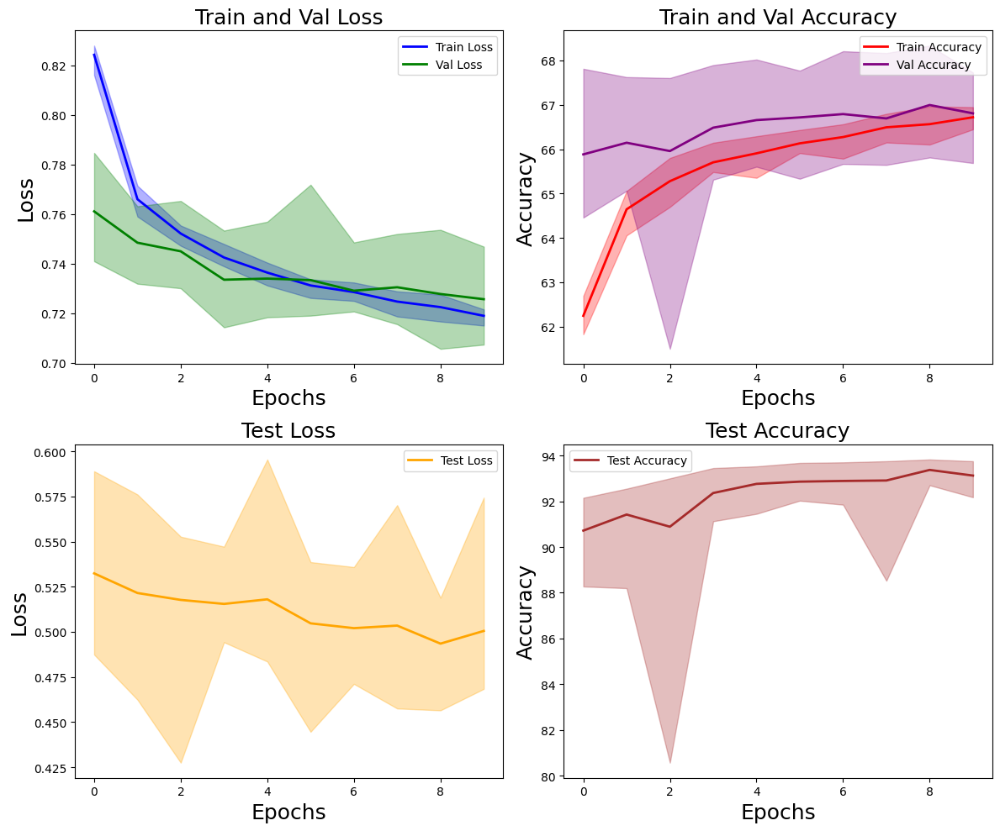

Data saved to baseline_f3_mlp.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=0.0005,
    batch_size=128,
    num_epochs=10,
    times=10,
    method='baseline',
    T_matrix=T_matrix,
    model_name='mlp',
    csv_path='baseline_f3_mlp.csv'
)

mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 160.25it/s]


Noisy Loss: 1.1382,Validation Loss: 0.7342, Accuracy: 66.31% (3183/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 153.10it/s]


Test Loss: 0.2392, Accuracy: 92.38% (3695/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 173.65it/s]


Noisy Loss: 1.1340,Validation Loss: 0.7245, Accuracy: 66.85% (3209/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 156.90it/s]


Test Loss: 0.2164, Accuracy: 92.58% (3703/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 161.98it/s]


Noisy Loss: 1.1329,Validation Loss: 0.7312, Accuracy: 66.77% (3205/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.42it/s]


Test Loss: 0.2077, Accuracy: 93.20% (3728/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 170.09it/s]


Noisy Loss: 1.1317,Validation Loss: 0.7198, Accuracy: 67.06% (3219/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 159.00it/s]


Test Loss: 0.2092, Accuracy: 93.35% (3734/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 166.19it/s]


Noisy Loss: 1.1300,Validation Loss: 0.7095, Accuracy: 67.17% (3224/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.87it/s]


Test Loss: 0.1965, Accuracy: 93.92% (3757/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 165.88it/s]


Noisy Loss: 1.1309,Validation Loss: 0.7190, Accuracy: 67.25% (3228/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.82it/s]


Test Loss: 0.2089, Accuracy: 93.42% (3737/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 177.07it/s]


Noisy Loss: 1.1274,Validation Loss: 0.7120, Accuracy: 67.42% (3236/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.57it/s]


Test Loss: 0.1960, Accuracy: 93.50% (3740/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 166.01it/s]


Noisy Loss: 1.1301,Validation Loss: 0.7321, Accuracy: 66.77% (3205/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 161.95it/s]


Test Loss: 0.2257, Accuracy: 93.53% (3741/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 174.06it/s]


Noisy Loss: 1.1312,Validation Loss: 0.7437, Accuracy: 66.88% (3210/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.77it/s]


Test Loss: 0.2365, Accuracy: 93.65% (3746/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 172.09it/s]


Noisy Loss: 1.1274,Validation Loss: 0.7095, Accuracy: 67.15% (3223/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 158.25it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.2179, Accuracy: 93.72% (3749/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 160.48it/s]


Test Loss: 0.1965, Accuracy: 93.92% (3757/4000)
finished  1  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 167.74it/s]


Noisy Loss: 1.1463,Validation Loss: 0.7732, Accuracy: 64.42% (3092/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.63it/s]


Test Loss: 0.2741, Accuracy: 91.28% (3651/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 169.35it/s]


Noisy Loss: 1.1378,Validation Loss: 0.7308, Accuracy: 65.88% (3162/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.40it/s]


Test Loss: 0.2151, Accuracy: 92.75% (3710/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 174.62it/s]


Noisy Loss: 1.1363,Validation Loss: 0.7282, Accuracy: 65.85% (3161/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 159.35it/s]


Test Loss: 0.2191, Accuracy: 93.15% (3726/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 163.02it/s]


Noisy Loss: 1.1377,Validation Loss: 0.7302, Accuracy: 65.90% (3163/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.84it/s]


Test Loss: 0.2137, Accuracy: 93.62% (3745/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 176.68it/s]


Noisy Loss: 1.1317,Validation Loss: 0.7195, Accuracy: 66.12% (3174/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 156.66it/s]


Test Loss: 0.2185, Accuracy: 93.90% (3756/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 161.42it/s]


Noisy Loss: 1.1320,Validation Loss: 0.7243, Accuracy: 66.19% (3177/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.72it/s]


Test Loss: 0.2213, Accuracy: 93.55% (3742/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 170.00it/s]


Noisy Loss: 1.1322,Validation Loss: 0.7182, Accuracy: 66.27% (3181/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.41it/s]


Test Loss: 0.2341, Accuracy: 93.58% (3743/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 163.31it/s]


Noisy Loss: 1.1298,Validation Loss: 0.7124, Accuracy: 66.77% (3205/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.35it/s]


Test Loss: 0.2249, Accuracy: 93.95% (3758/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 171.71it/s]


Noisy Loss: 1.1301,Validation Loss: 0.7103, Accuracy: 66.67% (3200/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 158.28it/s]


Test Loss: 0.2135, Accuracy: 94.35% (3774/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 166.09it/s]


Noisy Loss: 1.1317,Validation Loss: 0.7222, Accuracy: 66.44% (3189/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.39it/s]


Test Loss: 0.2257, Accuracy: 94.15% (3766/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.58it/s]


Test Loss: 0.2135, Accuracy: 94.35% (3774/4000)
finished  2  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 166.90it/s]


Noisy Loss: 1.1383,Validation Loss: 0.7295, Accuracy: 66.65% (3199/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.34it/s]


Test Loss: 0.2340, Accuracy: 92.33% (3693/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 170.01it/s]


Noisy Loss: 1.1419,Validation Loss: 0.7445, Accuracy: 66.25% (3180/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.76it/s]


Test Loss: 0.2616, Accuracy: 92.05% (3682/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 170.42it/s]


Noisy Loss: 1.1339,Validation Loss: 0.7140, Accuracy: 67.29% (3230/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.72it/s]


Test Loss: 0.2149, Accuracy: 93.50% (3740/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 167.54it/s]


Noisy Loss: 1.1317,Validation Loss: 0.7135, Accuracy: 66.94% (3213/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.56it/s]


Test Loss: 0.2217, Accuracy: 92.83% (3713/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 167.65it/s]


Noisy Loss: 1.1288,Validation Loss: 0.7180, Accuracy: 67.35% (3233/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.74it/s]


Test Loss: 0.2189, Accuracy: 93.53% (3741/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 168.55it/s]


Noisy Loss: 1.1261,Validation Loss: 0.7094, Accuracy: 67.77% (3253/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.83it/s]


Test Loss: 0.2118, Accuracy: 93.83% (3753/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 169.16it/s]


Noisy Loss: 1.1282,Validation Loss: 0.7068, Accuracy: 67.15% (3223/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 159.38it/s]


Test Loss: 0.2204, Accuracy: 93.65% (3746/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 164.32it/s]


Noisy Loss: 1.1270,Validation Loss: 0.7054, Accuracy: 67.54% (3242/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.07it/s]


Test Loss: 0.2313, Accuracy: 93.72% (3749/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.73it/s]


Noisy Loss: 1.1284,Validation Loss: 0.7076, Accuracy: 67.77% (3253/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.76it/s]


Test Loss: 0.1965, Accuracy: 93.70% (3748/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 174.81it/s]


Noisy Loss: 1.1281,Validation Loss: 0.7128, Accuracy: 67.38% (3234/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 159.19it/s]


Test Loss: 0.2108, Accuracy: 93.83% (3753/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.05it/s]


Test Loss: 0.2313, Accuracy: 93.72% (3749/4000)
finished  3  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 161.85it/s]


Noisy Loss: 1.1452,Validation Loss: 0.7468, Accuracy: 65.21% (3130/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.20it/s]


Test Loss: 0.2395, Accuracy: 92.65% (3706/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 177.05it/s]


Noisy Loss: 1.1350,Validation Loss: 0.7287, Accuracy: 66.00% (3168/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.20it/s]


Test Loss: 0.2113, Accuracy: 93.42% (3737/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.87it/s]


Noisy Loss: 1.1413,Validation Loss: 0.7612, Accuracy: 65.48% (3143/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.50it/s]


Test Loss: 0.2417, Accuracy: 93.08% (3723/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 174.15it/s]


Noisy Loss: 1.1375,Validation Loss: 0.7358, Accuracy: 66.19% (3177/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 164.19it/s]


Test Loss: 0.2117, Accuracy: 93.42% (3737/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.29it/s]


Noisy Loss: 1.1379,Validation Loss: 0.7296, Accuracy: 66.10% (3173/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.71it/s]


Test Loss: 0.2056, Accuracy: 93.90% (3756/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 166.42it/s]


Noisy Loss: 1.1333,Validation Loss: 0.7426, Accuracy: 66.33% (3184/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 161.81it/s]


Test Loss: 0.2338, Accuracy: 93.42% (3737/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 170.88it/s]


Noisy Loss: 1.1367,Validation Loss: 0.7351, Accuracy: 65.94% (3165/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 160.19it/s]


Test Loss: 0.2284, Accuracy: 92.88% (3715/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 171.26it/s]


Noisy Loss: 1.1297,Validation Loss: 0.7250, Accuracy: 66.25% (3180/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.35it/s]


Test Loss: 0.2029, Accuracy: 94.20% (3768/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 168.75it/s]


Noisy Loss: 1.1325,Validation Loss: 0.7294, Accuracy: 66.06% (3171/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.95it/s]


Test Loss: 0.2160, Accuracy: 93.35% (3734/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 179.01it/s]


Noisy Loss: 1.1335,Validation Loss: 0.7272, Accuracy: 66.00% (3168/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 158.11it/s]


Test Loss: 0.2225, Accuracy: 93.38% (3735/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 158.56it/s]


Test Loss: 0.2029, Accuracy: 94.20% (3768/4000)
finished  4  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 171.39it/s]


Noisy Loss: 1.1456,Validation Loss: 0.7470, Accuracy: 65.27% (3133/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.70it/s]


Test Loss: 0.2565, Accuracy: 91.78% (3671/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.68it/s]


Noisy Loss: 1.1335,Validation Loss: 0.7199, Accuracy: 66.56% (3195/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 159.35it/s]


Test Loss: 0.2005, Accuracy: 93.78% (3751/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 172.97it/s]


Noisy Loss: 1.1336,Validation Loss: 0.7383, Accuracy: 66.33% (3184/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 161.83it/s]


Test Loss: 0.2457, Accuracy: 93.33% (3733/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 159.83it/s]


Noisy Loss: 1.1299,Validation Loss: 0.7169, Accuracy: 66.71% (3202/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.93it/s]


Test Loss: 0.2115, Accuracy: 94.20% (3768/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 170.63it/s]


Noisy Loss: 1.1316,Validation Loss: 0.7211, Accuracy: 66.56% (3195/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 161.36it/s]


Test Loss: 0.2152, Accuracy: 93.28% (3731/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 167.19it/s]


Noisy Loss: 1.1298,Validation Loss: 0.7093, Accuracy: 66.58% (3196/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.74it/s]


Test Loss: 0.1985, Accuracy: 93.83% (3753/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 168.77it/s]


Noisy Loss: 1.1306,Validation Loss: 0.7498, Accuracy: 66.42% (3188/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.79it/s]


Test Loss: 0.2677, Accuracy: 93.10% (3724/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 171.78it/s]


Noisy Loss: 1.1304,Validation Loss: 0.7091, Accuracy: 66.56% (3195/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.04it/s]


Test Loss: 0.1949, Accuracy: 93.47% (3739/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 172.92it/s]


Noisy Loss: 1.1345,Validation Loss: 0.7576, Accuracy: 66.04% (3170/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 159.79it/s]


Test Loss: 0.2800, Accuracy: 93.40% (3736/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 167.32it/s]


Noisy Loss: 1.1306,Validation Loss: 0.7260, Accuracy: 66.54% (3194/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 161.92it/s]


Test Loss: 0.2202, Accuracy: 93.38% (3735/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.24it/s]


Test Loss: 0.1949, Accuracy: 93.47% (3739/4000)
finished  5  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 169.00it/s]


Noisy Loss: 1.1349,Validation Loss: 0.7291, Accuracy: 67.08% (3220/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 158.18it/s]


Test Loss: 0.2366, Accuracy: 92.03% (3681/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 168.00it/s]


Noisy Loss: 1.1274,Validation Loss: 0.7110, Accuracy: 68.00% (3264/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.78it/s]


Test Loss: 0.2146, Accuracy: 92.72% (3709/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 160.21it/s]


Noisy Loss: 1.1281,Validation Loss: 0.7189, Accuracy: 67.71% (3250/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.24it/s]


Test Loss: 0.2175, Accuracy: 93.33% (3733/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 178.46it/s]


Noisy Loss: 1.1294,Validation Loss: 0.7085, Accuracy: 67.98% (3263/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 160.69it/s]


Test Loss: 0.2138, Accuracy: 93.65% (3746/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 164.58it/s]


Noisy Loss: 1.1274,Validation Loss: 0.7121, Accuracy: 67.65% (3247/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.14it/s]


Test Loss: 0.2417, Accuracy: 91.97% (3679/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 171.85it/s]


Noisy Loss: 1.1240,Validation Loss: 0.7044, Accuracy: 68.46% (3286/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.28it/s]


Test Loss: 0.2056, Accuracy: 93.33% (3733/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 167.86it/s]


Noisy Loss: 1.1222,Validation Loss: 0.7047, Accuracy: 68.79% (3302/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.38it/s]


Test Loss: 0.2117, Accuracy: 93.58% (3743/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 171.73it/s]


Noisy Loss: 1.1215,Validation Loss: 0.7031, Accuracy: 68.54% (3290/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.48it/s]


Test Loss: 0.2192, Accuracy: 93.70% (3748/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 178.85it/s]


Noisy Loss: 1.1213,Validation Loss: 0.7050, Accuracy: 68.67% (3296/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 153.31it/s]


Test Loss: 0.2156, Accuracy: 93.72% (3749/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 172.11it/s]


Noisy Loss: 1.1204,Validation Loss: 0.7006, Accuracy: 68.42% (3284/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.71it/s]


Test Loss: 0.2004, Accuracy: 94.60% (3784/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 156.08it/s]


Test Loss: 0.2004, Accuracy: 94.60% (3784/4000)
finished  6  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 171.64it/s]


Noisy Loss: 1.1373,Validation Loss: 0.7464, Accuracy: 66.50% (3192/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.70it/s]


Test Loss: 0.2334, Accuracy: 91.88% (3675/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 164.12it/s]


Noisy Loss: 1.1357,Validation Loss: 0.7406, Accuracy: 66.83% (3208/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 160.80it/s]


Test Loss: 0.2294, Accuracy: 92.50% (3700/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 173.87it/s]


Noisy Loss: 1.1363,Validation Loss: 0.7345, Accuracy: 66.75% (3204/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 153.58it/s]


Test Loss: 0.2334, Accuracy: 92.67% (3707/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 167.45it/s]


Noisy Loss: 1.1296,Validation Loss: 0.7398, Accuracy: 67.00% (3216/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.37it/s]


Test Loss: 0.2327, Accuracy: 92.60% (3704/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 170.02it/s]


Noisy Loss: 1.1297,Validation Loss: 0.7296, Accuracy: 66.88% (3210/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.82it/s]


Test Loss: 0.2140, Accuracy: 93.10% (3724/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 154.82it/s]


Noisy Loss: 1.1292,Validation Loss: 0.7192, Accuracy: 67.31% (3231/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.18it/s]


Test Loss: 0.2118, Accuracy: 93.60% (3744/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 171.59it/s]


Noisy Loss: 1.1264,Validation Loss: 0.7149, Accuracy: 67.60% (3245/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.85it/s]


Test Loss: 0.1898, Accuracy: 93.90% (3756/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.80it/s]


Noisy Loss: 1.1313,Validation Loss: 0.7573, Accuracy: 67.00% (3216/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.27it/s]


Test Loss: 0.2397, Accuracy: 92.33% (3693/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 172.34it/s]


Noisy Loss: 1.1276,Validation Loss: 0.7254, Accuracy: 67.33% (3232/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.21it/s]


Test Loss: 0.1997, Accuracy: 93.78% (3751/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.00it/s]


Noisy Loss: 1.1253,Validation Loss: 0.7163, Accuracy: 67.50% (3240/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.50it/s]


Test Loss: 0.1988, Accuracy: 94.05% (3762/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.05it/s]


Test Loss: 0.1898, Accuracy: 93.90% (3756/4000)
finished  7  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 177.09it/s]


Noisy Loss: 1.1392,Validation Loss: 0.7351, Accuracy: 65.46% (3142/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 161.12it/s]


Test Loss: 0.2405, Accuracy: 91.75% (3670/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 163.56it/s]


Noisy Loss: 1.1422,Validation Loss: 0.7360, Accuracy: 66.19% (3177/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.93it/s]


Test Loss: 0.2315, Accuracy: 92.75% (3710/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 171.68it/s]


Noisy Loss: 1.1370,Validation Loss: 0.7386, Accuracy: 65.79% (3158/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.16it/s]


Test Loss: 0.2429, Accuracy: 93.00% (3720/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 173.27it/s]


Noisy Loss: 1.1392,Validation Loss: 0.7462, Accuracy: 64.94% (3117/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.33it/s]


Test Loss: 0.2664, Accuracy: 91.53% (3661/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 163.90it/s]


Noisy Loss: 1.1352,Validation Loss: 0.7199, Accuracy: 66.31% (3183/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.14it/s]


Test Loss: 0.2504, Accuracy: 93.83% (3753/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.30it/s]


Noisy Loss: 1.1317,Validation Loss: 0.7199, Accuracy: 66.40% (3187/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 158.98it/s]


Test Loss: 0.2205, Accuracy: 94.12% (3765/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 168.14it/s]


Noisy Loss: 1.1316,Validation Loss: 0.7123, Accuracy: 66.06% (3171/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 156.16it/s]


Test Loss: 0.2011, Accuracy: 93.95% (3758/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 166.14it/s]


Noisy Loss: 1.1309,Validation Loss: 0.7160, Accuracy: 66.06% (3171/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.83it/s]


Test Loss: 0.2038, Accuracy: 93.92% (3757/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 165.97it/s]


Noisy Loss: 1.1319,Validation Loss: 0.7289, Accuracy: 66.19% (3177/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 156.51it/s]


Test Loss: 0.1986, Accuracy: 93.65% (3746/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 173.84it/s]


Noisy Loss: 1.1346,Validation Loss: 0.7205, Accuracy: 65.83% (3160/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.41it/s]


Test Loss: 0.2021, Accuracy: 93.50% (3740/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.85it/s]


Test Loss: 0.2011, Accuracy: 93.95% (3758/4000)
finished  8  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 170.51it/s]


Noisy Loss: 1.1419,Validation Loss: 0.7391, Accuracy: 64.98% (3119/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.15it/s]


Test Loss: 0.2578, Accuracy: 91.30% (3652/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 169.23it/s]


Noisy Loss: 1.1352,Validation Loss: 0.7224, Accuracy: 66.52% (3193/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.51it/s]


Test Loss: 0.2247, Accuracy: 93.35% (3734/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 156.33it/s]


Noisy Loss: 1.1357,Validation Loss: 0.7265, Accuracy: 66.04% (3170/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.99it/s]


Test Loss: 0.2346, Accuracy: 92.58% (3703/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 164.14it/s]


Noisy Loss: 1.1328,Validation Loss: 0.7086, Accuracy: 66.88% (3210/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.30it/s]


Test Loss: 0.2267, Accuracy: 93.33% (3733/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 157.81it/s]


Noisy Loss: 1.1321,Validation Loss: 0.7131, Accuracy: 66.62% (3198/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.67it/s]


Test Loss: 0.2189, Accuracy: 92.78% (3711/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 156.80it/s]


Noisy Loss: 1.1291,Validation Loss: 0.7146, Accuracy: 66.54% (3194/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.48it/s]


Test Loss: 0.2070, Accuracy: 93.12% (3725/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.65it/s]


Noisy Loss: 1.1312,Validation Loss: 0.7152, Accuracy: 67.02% (3217/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.18it/s]


Test Loss: 0.2771, Accuracy: 93.50% (3740/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 170.43it/s]


Noisy Loss: 1.1317,Validation Loss: 0.7125, Accuracy: 66.48% (3191/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.23it/s]


Test Loss: 0.2652, Accuracy: 94.08% (3763/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 161.58it/s]


Noisy Loss: 1.1297,Validation Loss: 0.7107, Accuracy: 66.88% (3210/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.83it/s]


Test Loss: 0.1927, Accuracy: 94.65% (3786/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.91it/s]


Noisy Loss: 1.1306,Validation Loss: 0.7081, Accuracy: 66.75% (3204/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.94it/s]


Test Loss: 0.1869, Accuracy: 94.40% (3776/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.79it/s]


Test Loss: 0.1869, Accuracy: 94.40% (3776/4000)
finished  9  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 164.91it/s]


Noisy Loss: 1.1400,Validation Loss: 0.7360, Accuracy: 65.85% (3161/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.86it/s]


Test Loss: 0.2391, Accuracy: 92.50% (3700/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 169.35it/s]


Noisy Loss: 1.1353,Validation Loss: 0.7272, Accuracy: 66.04% (3170/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.49it/s]


Test Loss: 0.2176, Accuracy: 92.40% (3696/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 168.06it/s]


Noisy Loss: 1.1348,Validation Loss: 0.7276, Accuracy: 66.50% (3192/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.61it/s]


Test Loss: 0.2131, Accuracy: 93.67% (3747/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 166.68it/s]


Noisy Loss: 1.1326,Validation Loss: 0.7468, Accuracy: 66.38% (3186/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.52it/s]


Test Loss: 0.2628, Accuracy: 93.03% (3721/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 169.33it/s]


Noisy Loss: 1.1353,Validation Loss: 0.7350, Accuracy: 66.15% (3175/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.31it/s]


Test Loss: 0.2470, Accuracy: 92.22% (3689/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.59it/s]


Noisy Loss: 1.1299,Validation Loss: 0.7144, Accuracy: 66.44% (3189/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.86it/s]


Test Loss: 0.2123, Accuracy: 93.88% (3755/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 166.19it/s]


Noisy Loss: 1.1297,Validation Loss: 0.7205, Accuracy: 66.62% (3198/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 153.61it/s]


Test Loss: 0.2231, Accuracy: 93.95% (3758/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 157.74it/s]


Noisy Loss: 1.1297,Validation Loss: 0.7244, Accuracy: 66.96% (3214/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 153.03it/s]


Test Loss: 0.2474, Accuracy: 93.67% (3747/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 168.19it/s]


Noisy Loss: 1.1311,Validation Loss: 0.7334, Accuracy: 66.44% (3189/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.43it/s]


Test Loss: 0.2975, Accuracy: 93.92% (3757/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 150.55it/s]


Noisy Loss: 1.1307,Validation Loss: 0.7235, Accuracy: 66.42% (3188/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.58it/s]


Test Loss: 0.2101, Accuracy: 93.90% (3756/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.28it/s]


Test Loss: 0.2123, Accuracy: 93.88% (3755/4000)
finished  10  epoch
min_train_loss [0.7225423496961594, 0.7102350828051567, 0.7199819388985634, 0.7150186130901178, 0.7166627528270085, 0.7172773057222366, 0.7133392123381297, 0.7239032845695813, 0.7123382286727429, 0.7195159229636192]
min_val_loss [0.7094503764311473, 0.7102675131956736, 0.705377032160759, 0.7249773939450582, 0.709097627401352, 0.700641870101293, 0.714911097685496, 0.7123109616835912, 0.708087854385376, 0.7144342096646626]
min_train_accuracy [66.52604166666667, 67.16145833333333, 66.80208333333333, 67.07291666666667, 67.02083333333333, 66.578125, 66.74479166666667, 66.72916666666667, 66.88020833333333, 66.71875]
min_val_accuracy [67.16666666666667, 66.66666666666667, 67.54166666666667, 66.25, 66.5625, 68.41666666666667, 67.60416666666667, 66.0625, 66.75, 66.4375]
min_train_noise_loss [1.134118469953537, 1.129426851471265, 1.1323028004169464, 1.131016909678777, 1.131186251839002, 1.1324644774198531, 1.1309920901060104, 1.

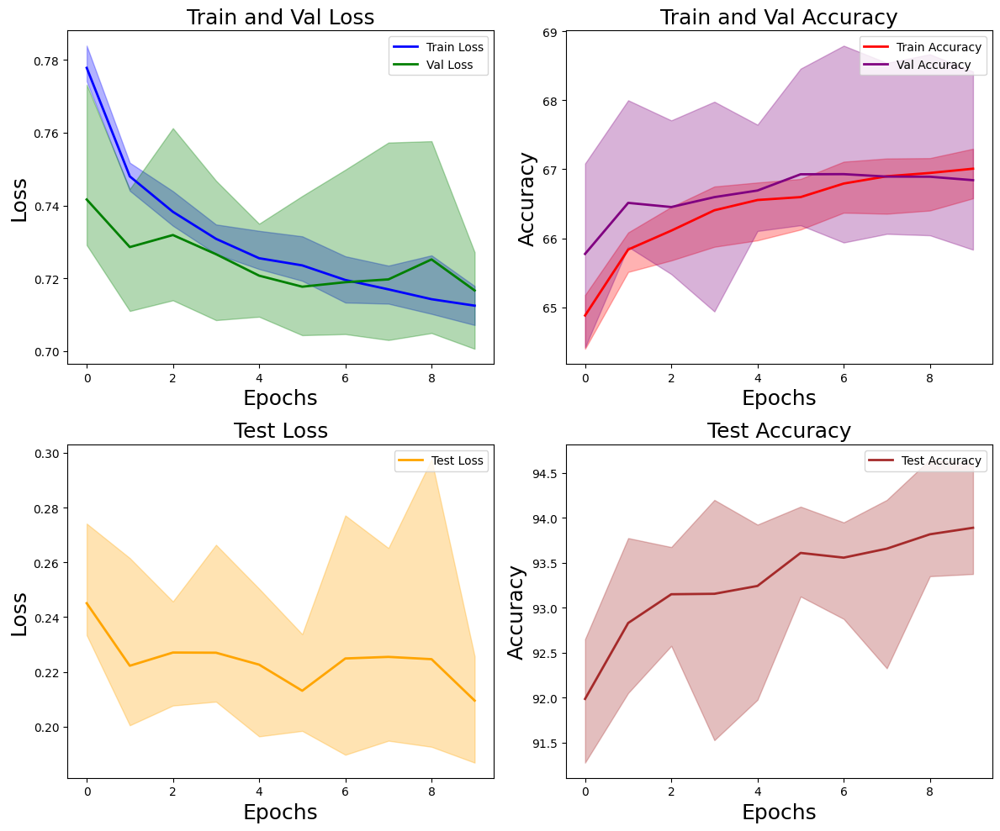

Data saved to forward_f3_mlp.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=0.0005,
    batch_size=32,
    num_epochs=10,
    times=10,
    method='forward',
    T_matrix=T_matrix,
    model_name='mlp',
    csv_path='forward_f3_mlp.csv'
)

mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 79.36it/s] 


Noisy Loss: 1.1425,Validation Loss: 0.2110, Accuracy: 65.31% (3135/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.90it/s]


Test Loss: 0.2546, Accuracy: 91.90% (3676/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.69it/s] 


Noisy Loss: 1.1475,Validation Loss: 0.2453, Accuracy: 65.50% (3144/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.00it/s]


Test Loss: 0.2483, Accuracy: 91.83% (3673/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.30it/s] 


Noisy Loss: 1.1372,Validation Loss: 0.1786, Accuracy: 66.02% (3169/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.82it/s]


Test Loss: 0.2106, Accuracy: 93.35% (3734/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.03it/s] 


Noisy Loss: 1.1375,Validation Loss: 0.1709, Accuracy: 65.77% (3157/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.93it/s]


Test Loss: 0.2248, Accuracy: 92.78% (3711/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.23it/s] 


Noisy Loss: 1.1364,Validation Loss: 0.1860, Accuracy: 66.12% (3174/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.70it/s]


Test Loss: 0.2017, Accuracy: 93.70% (3748/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 80.07it/s] 


Noisy Loss: 1.1369,Validation Loss: 0.1641, Accuracy: 65.69% (3153/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.16it/s]


Test Loss: 0.2415, Accuracy: 92.88% (3715/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.21it/s] 


Noisy Loss: 1.1355,Validation Loss: 0.1549, Accuracy: 66.02% (3169/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.58it/s]


Test Loss: 0.2320, Accuracy: 92.97% (3719/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.70it/s] 


Noisy Loss: 1.1624,Validation Loss: 0.2316, Accuracy: 60.56% (2907/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.38it/s]


Test Loss: 1.0569, Accuracy: 85.30% (3412/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.04it/s]


Noisy Loss: 1.1330,Validation Loss: 0.1887, Accuracy: 66.12% (3174/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.02it/s]


Test Loss: 0.2179, Accuracy: 93.97% (3759/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.60it/s] 


Noisy Loss: 1.1325,Validation Loss: 0.1562, Accuracy: 66.46% (3190/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.10it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.2305, Accuracy: 93.50% (3740/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.45it/s]


Test Loss: 0.2320, Accuracy: 92.97% (3719/4000)
finished  1  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.73it/s] 


Noisy Loss: 1.1356,Validation Loss: 0.2025, Accuracy: 66.67% (3200/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.22it/s]


Test Loss: 0.2325, Accuracy: 92.42% (3697/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.77it/s] 


Noisy Loss: 1.1389,Validation Loss: 0.2013, Accuracy: 66.96% (3214/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.93it/s]


Test Loss: 0.2321, Accuracy: 92.53% (3701/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.77it/s] 


Noisy Loss: 1.1355,Validation Loss: 0.1953, Accuracy: 66.75% (3204/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.57it/s]


Test Loss: 0.2364, Accuracy: 92.12% (3685/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.92it/s] 


Noisy Loss: 1.1315,Validation Loss: 0.1753, Accuracy: 66.90% (3211/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.80it/s]


Test Loss: 0.2186, Accuracy: 93.28% (3731/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 79.78it/s] 


Noisy Loss: 1.1336,Validation Loss: 0.1632, Accuracy: 67.10% (3221/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.92it/s]


Test Loss: 0.2530, Accuracy: 92.55% (3702/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.28it/s] 


Noisy Loss: 1.1311,Validation Loss: 0.1735, Accuracy: 67.38% (3234/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.75it/s]


Test Loss: 0.2177, Accuracy: 94.12% (3765/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.37it/s] 


Noisy Loss: 1.1300,Validation Loss: 0.1887, Accuracy: 67.29% (3230/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.16it/s]


Test Loss: 0.2248, Accuracy: 93.45% (3738/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 79.62it/s] 


Noisy Loss: 1.1384,Validation Loss: 0.2302, Accuracy: 66.00% (3168/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.95it/s]


Test Loss: 0.2529, Accuracy: 92.88% (3715/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.86it/s] 


Noisy Loss: 1.1281,Validation Loss: 0.1586, Accuracy: 67.25% (3228/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.52it/s]


Test Loss: 0.2198, Accuracy: 93.85% (3754/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.93it/s] 


Noisy Loss: 1.1281,Validation Loss: 0.1588, Accuracy: 67.21% (3226/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.13it/s]


Test Loss: 0.2357, Accuracy: 93.42% (3737/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.88it/s]


Test Loss: 0.2198, Accuracy: 93.85% (3754/4000)
finished  2  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 80.11it/s] 


Noisy Loss: 1.1450,Validation Loss: 0.2269, Accuracy: 65.56% (3147/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.06it/s]


Test Loss: 0.2421, Accuracy: 92.40% (3696/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 80.55it/s] 


Noisy Loss: 1.1368,Validation Loss: 0.1792, Accuracy: 66.02% (3169/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 156.92it/s]


Test Loss: 0.2416, Accuracy: 92.17% (3687/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.64it/s] 


Noisy Loss: 1.1388,Validation Loss: 0.2080, Accuracy: 66.25% (3180/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 153.33it/s]


Test Loss: 0.2170, Accuracy: 93.05% (3722/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.81it/s] 


Noisy Loss: 1.1397,Validation Loss: 0.2077, Accuracy: 65.73% (3155/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.59it/s]


Test Loss: 0.2919, Accuracy: 92.88% (3715/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.09it/s] 


Noisy Loss: 1.1360,Validation Loss: 0.1949, Accuracy: 66.19% (3177/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.79it/s]


Test Loss: 0.2470, Accuracy: 93.03% (3721/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 79.66it/s] 


Noisy Loss: 1.1379,Validation Loss: 0.1944, Accuracy: 66.06% (3171/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.47it/s]


Test Loss: 0.2421, Accuracy: 93.47% (3739/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.10it/s]


Noisy Loss: 1.1343,Validation Loss: 0.1876, Accuracy: 66.06% (3171/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.61it/s]


Test Loss: 0.2344, Accuracy: 93.67% (3747/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.76it/s] 


Noisy Loss: 1.1335,Validation Loss: 0.1787, Accuracy: 66.29% (3182/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 153.20it/s]


Test Loss: 0.2476, Accuracy: 93.72% (3749/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 82.05it/s] 


Noisy Loss: 1.1310,Validation Loss: 0.1576, Accuracy: 66.65% (3199/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.54it/s]


Test Loss: 0.2231, Accuracy: 93.88% (3755/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.38it/s] 


Noisy Loss: 1.1293,Validation Loss: 0.1452, Accuracy: 66.48% (3191/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.75it/s]


Test Loss: 0.2926, Accuracy: 93.88% (3755/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.36it/s]


Test Loss: 0.2926, Accuracy: 93.88% (3755/4000)
finished  3  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 79.68it/s] 


Noisy Loss: 1.1515,Validation Loss: 0.2866, Accuracy: 65.54% (3146/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.74it/s]


Test Loss: 0.2690, Accuracy: 91.70% (3668/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.17it/s]


Noisy Loss: 1.1347,Validation Loss: 0.1694, Accuracy: 66.38% (3186/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.59it/s]


Test Loss: 0.2220, Accuracy: 92.70% (3708/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.38it/s] 


Noisy Loss: 1.1348,Validation Loss: 0.1770, Accuracy: 66.42% (3188/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 153.70it/s]


Test Loss: 0.2194, Accuracy: 92.88% (3715/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.86it/s]


Noisy Loss: 1.1336,Validation Loss: 0.1803, Accuracy: 66.21% (3178/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 156.64it/s]


Test Loss: 0.2114, Accuracy: 93.03% (3721/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 79.36it/s] 


Noisy Loss: 1.1321,Validation Loss: 0.1719, Accuracy: 66.85% (3209/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.05it/s]


Test Loss: 0.2058, Accuracy: 93.12% (3725/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.95it/s]


Noisy Loss: 1.1337,Validation Loss: 0.1646, Accuracy: 66.62% (3198/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.64it/s]


Test Loss: 0.2054, Accuracy: 93.03% (3721/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.81it/s] 


Noisy Loss: 1.1331,Validation Loss: 0.1971, Accuracy: 67.02% (3217/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.26it/s]


Test Loss: 0.2060, Accuracy: 93.67% (3747/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.34it/s] 


Noisy Loss: 1.1317,Validation Loss: 0.1704, Accuracy: 66.88% (3210/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.57it/s]


Test Loss: 0.2073, Accuracy: 93.40% (3736/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 79.47it/s] 


Noisy Loss: 1.1288,Validation Loss: 0.1608, Accuracy: 67.12% (3222/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.79it/s]


Test Loss: 0.2096, Accuracy: 93.10% (3724/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.18it/s] 


Noisy Loss: 1.1275,Validation Loss: 0.1517, Accuracy: 67.04% (3218/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.82it/s]


Test Loss: 0.2046, Accuracy: 94.15% (3766/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.71it/s]


Test Loss: 0.2046, Accuracy: 94.15% (3766/4000)
finished  4  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.50it/s]


Noisy Loss: 1.1404,Validation Loss: 0.2112, Accuracy: 65.77% (3157/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 158.56it/s]


Test Loss: 0.2564, Accuracy: 91.17% (3647/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.34it/s]


Noisy Loss: 1.1354,Validation Loss: 0.1868, Accuracy: 65.88% (3162/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.04it/s]


Test Loss: 0.2368, Accuracy: 92.50% (3700/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.74it/s]


Noisy Loss: 1.1355,Validation Loss: 0.1865, Accuracy: 66.12% (3174/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.38it/s]


Test Loss: 0.2291, Accuracy: 92.67% (3707/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.29it/s] 


Noisy Loss: 1.1345,Validation Loss: 0.1808, Accuracy: 66.35% (3185/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.05it/s]


Test Loss: 0.2269, Accuracy: 92.95% (3718/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 81.47it/s] 


Noisy Loss: 1.1366,Validation Loss: 0.1888, Accuracy: 65.56% (3147/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.46it/s]


Test Loss: 0.2423, Accuracy: 91.62% (3665/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.42it/s]


Noisy Loss: 1.1310,Validation Loss: 0.1720, Accuracy: 66.65% (3199/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 153.68it/s]


Test Loss: 0.2031, Accuracy: 93.35% (3734/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.90it/s] 


Noisy Loss: 1.1334,Validation Loss: 0.1834, Accuracy: 66.35% (3185/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.43it/s]


Test Loss: 0.2133, Accuracy: 93.40% (3736/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.53it/s] 


Noisy Loss: 1.1314,Validation Loss: 0.1714, Accuracy: 66.02% (3169/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.97it/s]


Test Loss: 0.2060, Accuracy: 92.97% (3719/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.32it/s] 


Noisy Loss: 1.1280,Validation Loss: 0.1465, Accuracy: 67.02% (3217/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.84it/s]


Test Loss: 0.1879, Accuracy: 94.15% (3766/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.46it/s] 


Noisy Loss: 1.1294,Validation Loss: 0.1436, Accuracy: 66.44% (3189/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.93it/s]


Test Loss: 0.2027, Accuracy: 93.75% (3750/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.53it/s]


Test Loss: 0.2027, Accuracy: 93.75% (3750/4000)
finished  5  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.69it/s] 


Noisy Loss: 1.1398,Validation Loss: 0.2104, Accuracy: 66.27% (3181/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.72it/s]


Test Loss: 0.2359, Accuracy: 92.03% (3681/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.95it/s] 


Noisy Loss: 1.1429,Validation Loss: 0.2772, Accuracy: 65.94% (3165/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.91it/s]


Test Loss: 0.2411, Accuracy: 92.30% (3692/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.40it/s] 


Noisy Loss: 1.1341,Validation Loss: 0.1959, Accuracy: 66.79% (3206/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.72it/s]


Test Loss: 0.2209, Accuracy: 93.28% (3731/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.61it/s] 


Noisy Loss: 1.1333,Validation Loss: 0.1898, Accuracy: 67.10% (3221/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.69it/s]


Test Loss: 0.2274, Accuracy: 93.38% (3735/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.50it/s] 


Noisy Loss: 1.1318,Validation Loss: 0.1717, Accuracy: 67.04% (3218/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.98it/s]


Test Loss: 0.2422, Accuracy: 93.50% (3740/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.28it/s]


Noisy Loss: 1.1297,Validation Loss: 0.1644, Accuracy: 66.94% (3213/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.77it/s]


Test Loss: 0.2479, Accuracy: 93.38% (3735/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.91it/s] 


Noisy Loss: 1.1349,Validation Loss: 0.2020, Accuracy: 66.44% (3189/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.93it/s]


Test Loss: 0.2695, Accuracy: 93.05% (3722/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.07it/s] 


Noisy Loss: 1.1333,Validation Loss: 0.1881, Accuracy: 66.67% (3200/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 156.83it/s]


Test Loss: 0.2644, Accuracy: 93.50% (3740/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.30it/s]


Noisy Loss: 1.1339,Validation Loss: 0.1749, Accuracy: 66.52% (3193/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.93it/s]


Test Loss: 0.4990, Accuracy: 92.92% (3717/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.29it/s]


Noisy Loss: 1.1288,Validation Loss: 0.1571, Accuracy: 66.98% (3215/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.27it/s]


Test Loss: 0.2782, Accuracy: 94.15% (3766/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.75it/s]


Test Loss: 0.2782, Accuracy: 94.15% (3766/4000)
finished  6  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.63it/s] 


Noisy Loss: 1.1397,Validation Loss: 0.2243, Accuracy: 65.98% (3167/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.05it/s]


Test Loss: 0.2443, Accuracy: 91.92% (3677/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.71it/s]


Noisy Loss: 1.1415,Validation Loss: 0.2325, Accuracy: 66.44% (3189/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.48it/s]


Test Loss: 0.2482, Accuracy: 91.97% (3679/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 79.25it/s] 


Noisy Loss: 1.1402,Validation Loss: 0.2154, Accuracy: 66.75% (3204/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.13it/s]


Test Loss: 0.2315, Accuracy: 92.50% (3700/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.06it/s]


Noisy Loss: 1.1373,Validation Loss: 0.2198, Accuracy: 66.98% (3215/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.35it/s]


Test Loss: 0.2308, Accuracy: 93.47% (3739/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.37it/s]


Noisy Loss: 1.1311,Validation Loss: 0.1834, Accuracy: 67.02% (3217/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.92it/s]


Test Loss: 0.2246, Accuracy: 93.58% (3743/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.42it/s]


Noisy Loss: 1.1339,Validation Loss: 0.1981, Accuracy: 66.48% (3191/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.76it/s]


Test Loss: 0.2484, Accuracy: 92.35% (3694/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.38it/s] 


Noisy Loss: 1.1345,Validation Loss: 0.1815, Accuracy: 66.67% (3200/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.01it/s]


Test Loss: 0.2531, Accuracy: 92.88% (3715/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.85it/s]


Noisy Loss: 1.1292,Validation Loss: 0.1530, Accuracy: 66.96% (3214/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.37it/s]


Test Loss: 0.2294, Accuracy: 93.15% (3726/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.12it/s]


Noisy Loss: 1.1303,Validation Loss: 0.1881, Accuracy: 67.10% (3221/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.53it/s]


Test Loss: 0.2509, Accuracy: 93.25% (3730/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.54it/s] 


Noisy Loss: 1.1308,Validation Loss: 0.1650, Accuracy: 67.08% (3220/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 156.62it/s]


Test Loss: 0.2174, Accuracy: 93.67% (3747/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.65it/s]


Test Loss: 0.2294, Accuracy: 93.15% (3726/4000)
finished  7  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 81.60it/s] 


Noisy Loss: 1.1441,Validation Loss: 0.2334, Accuracy: 65.90% (3163/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.81it/s]


Test Loss: 0.2365, Accuracy: 92.50% (3700/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.02it/s]


Noisy Loss: 1.1426,Validation Loss: 0.2072, Accuracy: 65.08% (3124/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 156.94it/s]


Test Loss: 0.2501, Accuracy: 91.80% (3672/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 80.30it/s] 


Noisy Loss: 1.1374,Validation Loss: 0.1922, Accuracy: 66.23% (3179/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.07it/s]


Test Loss: 0.2089, Accuracy: 93.35% (3734/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.56it/s] 


Noisy Loss: 1.1408,Validation Loss: 0.2282, Accuracy: 65.71% (3154/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.41it/s]


Test Loss: 0.2468, Accuracy: 92.72% (3709/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 80.35it/s] 


Noisy Loss: 1.1325,Validation Loss: 0.1800, Accuracy: 66.46% (3190/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 153.36it/s]


Test Loss: 0.2806, Accuracy: 93.65% (3746/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 79.27it/s] 


Noisy Loss: 1.1325,Validation Loss: 0.1914, Accuracy: 66.12% (3174/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.56it/s]


Test Loss: 0.2213, Accuracy: 93.45% (3738/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 80.52it/s] 


Noisy Loss: 1.1339,Validation Loss: 0.1878, Accuracy: 66.10% (3173/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.29it/s]


Test Loss: 0.2084, Accuracy: 93.58% (3743/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 79.78it/s] 


Noisy Loss: 1.1371,Validation Loss: 0.1862, Accuracy: 65.81% (3159/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.57it/s]


Test Loss: 0.2620, Accuracy: 92.92% (3717/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.80it/s] 


Noisy Loss: 1.1315,Validation Loss: 0.1892, Accuracy: 66.56% (3195/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.46it/s]


Test Loss: 0.2379, Accuracy: 93.58% (3743/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.29it/s] 


Noisy Loss: 1.1316,Validation Loss: 0.1687, Accuracy: 66.31% (3183/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 156.20it/s]


Test Loss: 0.3097, Accuracy: 93.15% (3726/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.38it/s]


Test Loss: 0.3097, Accuracy: 93.15% (3726/4000)
finished  8  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.68it/s]


Noisy Loss: 1.1442,Validation Loss: 0.2220, Accuracy: 65.19% (3129/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.61it/s]


Test Loss: 0.2501, Accuracy: 91.45% (3658/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 79.97it/s] 


Noisy Loss: 1.1442,Validation Loss: 0.2256, Accuracy: 65.88% (3162/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.41it/s]


Test Loss: 0.2345, Accuracy: 92.08% (3683/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.39it/s] 


Noisy Loss: 1.1374,Validation Loss: 0.1941, Accuracy: 66.27% (3181/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.07it/s]


Test Loss: 0.2122, Accuracy: 93.45% (3738/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.88it/s] 


Noisy Loss: 1.1351,Validation Loss: 0.1806, Accuracy: 66.38% (3186/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.64it/s]


Test Loss: 0.2056, Accuracy: 93.50% (3740/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.60it/s] 


Noisy Loss: 1.1374,Validation Loss: 0.1917, Accuracy: 66.31% (3183/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.01it/s]


Test Loss: 0.2740, Accuracy: 92.55% (3702/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 80.06it/s] 


Noisy Loss: 1.1336,Validation Loss: 0.1892, Accuracy: 66.33% (3184/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 159.90it/s]


Test Loss: 0.2378, Accuracy: 93.58% (3743/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 80.57it/s] 


Noisy Loss: 1.1338,Validation Loss: 0.1920, Accuracy: 66.56% (3195/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.94it/s]


Test Loss: 0.2368, Accuracy: 93.35% (3734/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.67it/s] 


Noisy Loss: 1.1350,Validation Loss: 0.1887, Accuracy: 66.23% (3179/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.70it/s]


Test Loss: 0.2249, Accuracy: 93.47% (3739/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.05it/s] 


Noisy Loss: 1.1306,Validation Loss: 0.1454, Accuracy: 66.92% (3212/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.16it/s]


Test Loss: 0.2150, Accuracy: 93.45% (3738/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 80.27it/s] 


Noisy Loss: 1.1319,Validation Loss: 0.1700, Accuracy: 66.58% (3196/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.65it/s]


Test Loss: 0.2217, Accuracy: 93.25% (3730/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.32it/s]


Test Loss: 0.2150, Accuracy: 93.45% (3738/4000)
finished  9  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.09it/s] 


Noisy Loss: 1.1360,Validation Loss: 0.1972, Accuracy: 65.94% (3165/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.91it/s]


Test Loss: 0.2496, Accuracy: 91.58% (3663/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.62it/s] 


Noisy Loss: 1.1337,Validation Loss: 0.2035, Accuracy: 66.71% (3202/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.22it/s]


Test Loss: 0.2322, Accuracy: 93.35% (3734/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.91it/s] 


Noisy Loss: 1.1342,Validation Loss: 0.1800, Accuracy: 66.33% (3184/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 153.84it/s]


Test Loss: 0.2509, Accuracy: 91.97% (3679/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 80.70it/s] 


Noisy Loss: 1.1307,Validation Loss: 0.1915, Accuracy: 66.92% (3212/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.53it/s]


Test Loss: 0.2137, Accuracy: 93.28% (3731/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.46it/s]


Noisy Loss: 1.1312,Validation Loss: 0.1733, Accuracy: 67.00% (3216/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.98it/s]


Test Loss: 0.2098, Accuracy: 93.38% (3735/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 80.26it/s] 


Noisy Loss: 1.1309,Validation Loss: 0.1907, Accuracy: 67.17% (3224/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 156.74it/s]


Test Loss: 0.2098, Accuracy: 93.97% (3759/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.63it/s] 


Noisy Loss: 1.1303,Validation Loss: 0.1744, Accuracy: 66.96% (3214/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.67it/s]


Test Loss: 0.2133, Accuracy: 93.58% (3743/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.02it/s] 


Noisy Loss: 1.1286,Validation Loss: 0.1647, Accuracy: 67.06% (3219/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.75it/s]


Test Loss: 0.2095, Accuracy: 93.67% (3747/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 80.06it/s] 


Noisy Loss: 1.1271,Validation Loss: 0.1617, Accuracy: 67.00% (3216/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 153.77it/s]


Test Loss: 0.2316, Accuracy: 93.40% (3736/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.76it/s]


Noisy Loss: 1.1290,Validation Loss: 0.1551, Accuracy: 67.52% (3241/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 157.79it/s]


Test Loss: 0.2069, Accuracy: 93.75% (3750/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 153.48it/s]


Test Loss: 0.2069, Accuracy: 93.75% (3750/4000)
finished  10  epoch
min_train_loss [0.19113428493961693, 0.1740355686362212, 0.18207052941123644, 0.17913612378761173, 0.17435571880545467, 0.1782261536580821, 0.2012484105148663, 0.1803125180924932, 0.18310552177019418, 0.18296857428736985]
min_val_loss [0.15492901058867573, 0.1586218014607827, 0.14522645749151708, 0.15167239864667256, 0.14356911826257904, 0.15710667245090007, 0.152970449278752, 0.16865835569798945, 0.1454264268403252, 0.15506635564068952]
min_train_accuracy [66.83333333333333, 67.02083333333333, 66.97916666666667, 66.96875, 67.01041666666667, 66.953125, 66.109375, 67.015625, 66.96875, 66.75520833333333]
min_val_accuracy [66.02083333333333, 67.25, 66.47916666666667, 67.04166666666667, 66.4375, 66.97916666666667, 66.95833333333333, 66.3125, 66.91666666666667, 67.52083333333333]
min_train_noise_loss [1.1347724815209708, 1.1313020497560502, 1.1322187447547913, 1.1326312299569448, 1.1315656507015228, 1.1323068203528721, 1.13

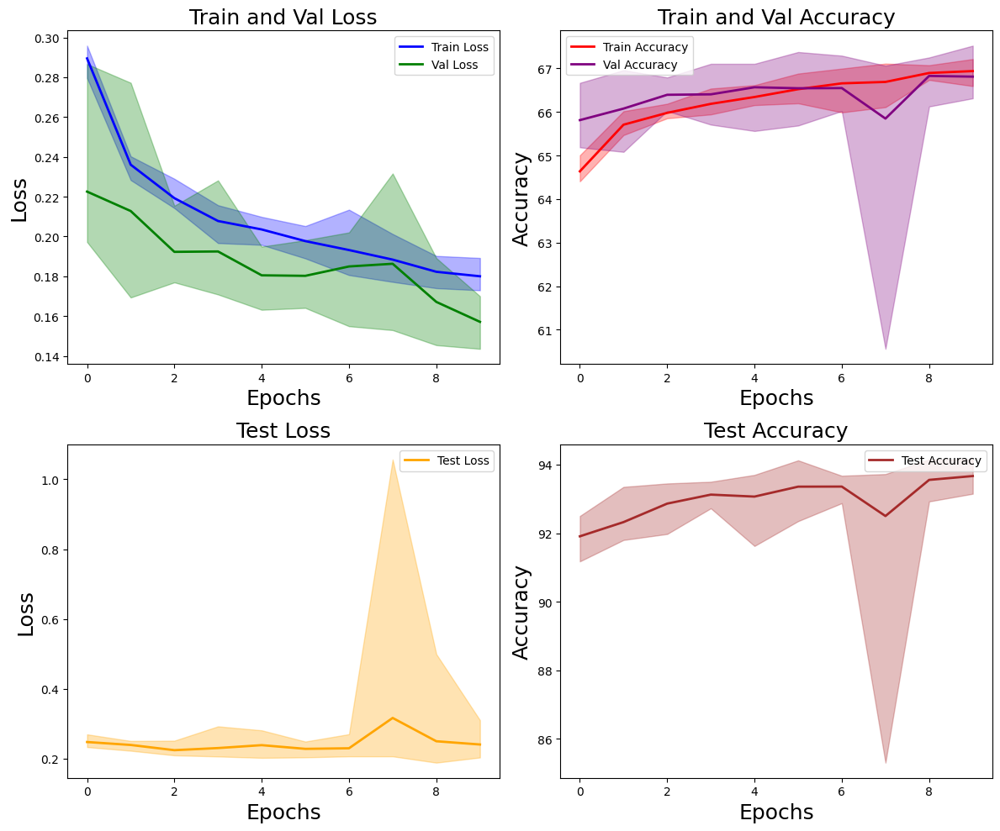

Data saved to importance_f3_mlp.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=0.0005,
    batch_size=32,
    num_epochs=10,
    times=10,
    method='importance',
    T_matrix=T_matrix,
    model_name='mlp',
    csv_path='importance_f3_mlp.csv'
)

mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.90it/s] 


Noisy Loss: 1.1435,Validation Loss: 0.2278, Accuracy: 65.27% (3133/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 158.98it/s]


Test Loss: 0.2336, Accuracy: 91.95% (3678/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 80.00it/s] 


Noisy Loss: 1.1396,Validation Loss: 0.2155, Accuracy: 65.92% (3164/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 153.08it/s]


Test Loss: 0.2164, Accuracy: 92.67% (3707/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 79.27it/s] 


Noisy Loss: 1.1428,Validation Loss: 0.2456, Accuracy: 65.08% (3124/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 155.41it/s]


Test Loss: 0.2857, Accuracy: 91.97% (3679/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.01it/s] 


Noisy Loss: 1.1415,Validation Loss: 0.2182, Accuracy: 65.73% (3155/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 159.60it/s]


Test Loss: 0.2374, Accuracy: 92.80% (3712/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 80.59it/s] 


Noisy Loss: 1.1401,Validation Loss: 0.2240, Accuracy: 65.50% (3144/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 153.25it/s]


Test Loss: 0.2445, Accuracy: 92.25% (3690/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.55it/s] 


Noisy Loss: 1.1373,Validation Loss: 0.1989, Accuracy: 65.98% (3167/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.25it/s]


Test Loss: 0.2197, Accuracy: 93.67% (3747/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 81.22it/s] 


Noisy Loss: 1.1397,Validation Loss: 0.2165, Accuracy: 66.08% (3172/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.20it/s]


Test Loss: 0.2267, Accuracy: 93.72% (3749/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.95it/s] 


Noisy Loss: 1.1350,Validation Loss: 0.2003, Accuracy: 66.17% (3176/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.67it/s]


Test Loss: 0.2381, Accuracy: 94.03% (3761/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.29it/s]


Noisy Loss: 1.1348,Validation Loss: 0.1671, Accuracy: 66.04% (3170/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.81it/s]


Test Loss: 0.3573, Accuracy: 92.83% (3713/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.78it/s] 


Noisy Loss: 1.1355,Validation Loss: 0.2147, Accuracy: 65.92% (3164/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.58it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.3692, Accuracy: 93.30% (3732/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.19it/s]


Test Loss: 0.3573, Accuracy: 92.83% (3713/4000)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.94it/s]


Noisy Loss: 1.3440,Validation Loss: 0.1589, Accuracy: 36.31% (1743/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.80it/s]


Test Loss: 0.2812, Accuracy: 92.83% (3713/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.66it/s]


Noisy Loss: 1.3439,Validation Loss: 0.1591, Accuracy: 36.21% (1738/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.49it/s]


Test Loss: 0.2527, Accuracy: 92.95% (3718/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.96it/s]


Noisy Loss: 1.3439,Validation Loss: 0.1576, Accuracy: 36.25% (1740/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.36it/s]


Test Loss: 0.2558, Accuracy: 92.95% (3718/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.79it/s]


Noisy Loss: 1.3438,Validation Loss: 0.1590, Accuracy: 36.42% (1748/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.93it/s]


Test Loss: 0.3218, Accuracy: 92.97% (3719/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.97it/s]


Noisy Loss: 1.3439,Validation Loss: 0.1634, Accuracy: 36.50% (1752/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.49it/s]


Test Loss: 0.3065, Accuracy: 93.08% (3723/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.11it/s]


Test Loss: 0.2558, Accuracy: 92.95% (3718/4000)
finished  1  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.71it/s]


Noisy Loss: 1.3442,Validation Loss: 0.1533, Accuracy: 36.52% (1753/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.02it/s]


Test Loss: 0.2544, Accuracy: 93.05% (3722/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.85it/s]


Noisy Loss: 1.3442,Validation Loss: 0.1511, Accuracy: 36.40% (1747/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.40it/s]


Test Loss: 0.3010, Accuracy: 92.90% (3716/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.13it/s]


Noisy Loss: 1.3442,Validation Loss: 0.1473, Accuracy: 36.27% (1741/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.82it/s]


Test Loss: 0.3211, Accuracy: 92.97% (3719/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.84it/s]


Noisy Loss: 1.3441,Validation Loss: 0.1476, Accuracy: 36.54% (1754/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.20it/s]


Test Loss: 0.3231, Accuracy: 92.80% (3712/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.10it/s]


Noisy Loss: 1.3441,Validation Loss: 0.1444, Accuracy: 36.52% (1753/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.59it/s]


Test Loss: 0.3231, Accuracy: 92.80% (3712/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.70it/s]


Test Loss: 0.3231, Accuracy: 92.80% (3712/4000)
finished  2  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.93it/s]


Noisy Loss: 1.3442,Validation Loss: 0.1488, Accuracy: 35.71% (1714/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.60it/s]


Test Loss: 0.2542, Accuracy: 92.90% (3716/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.22it/s]


Noisy Loss: 1.3442,Validation Loss: 0.1487, Accuracy: 35.44% (1701/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.24it/s]


Test Loss: 0.3053, Accuracy: 92.97% (3719/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.12it/s]


Noisy Loss: 1.3442,Validation Loss: 0.1389, Accuracy: 35.48% (1703/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.65it/s]


Test Loss: 0.2565, Accuracy: 92.80% (3712/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.03it/s]


Noisy Loss: 1.3442,Validation Loss: 0.1373, Accuracy: 35.48% (1703/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.10it/s]


Test Loss: 0.3093, Accuracy: 92.72% (3709/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.89it/s]


Noisy Loss: 1.3442,Validation Loss: 0.1384, Accuracy: 35.33% (1696/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.52it/s]


Test Loss: 0.3282, Accuracy: 92.80% (3712/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.71it/s]


Test Loss: 0.3093, Accuracy: 92.72% (3709/4000)
finished  3  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.97it/s]


Noisy Loss: 1.3440,Validation Loss: 0.1469, Accuracy: 36.02% (1729/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.34it/s]


Test Loss: 0.3330, Accuracy: 92.78% (3711/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.22it/s]


Noisy Loss: 1.3438,Validation Loss: 0.1473, Accuracy: 36.33% (1744/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.13it/s]


Test Loss: 0.3206, Accuracy: 92.88% (3715/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.09it/s]


Noisy Loss: 1.3439,Validation Loss: 0.1440, Accuracy: 35.85% (1721/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.86it/s]


Test Loss: 0.2713, Accuracy: 92.78% (3711/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.02it/s]


Noisy Loss: 1.3438,Validation Loss: 0.1455, Accuracy: 36.19% (1737/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.21it/s]


Test Loss: 0.2759, Accuracy: 92.83% (3713/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.03it/s]


Noisy Loss: 1.3439,Validation Loss: 0.1420, Accuracy: 35.81% (1719/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.03it/s]


Test Loss: 0.2592, Accuracy: 92.95% (3718/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.51it/s]


Test Loss: 0.2592, Accuracy: 92.95% (3718/4000)
finished  4  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.23it/s]


Noisy Loss: 1.3435,Validation Loss: 0.1357, Accuracy: 35.85% (1721/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.38it/s]


Test Loss: 0.2856, Accuracy: 92.85% (3714/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.13it/s]


Noisy Loss: 1.3434,Validation Loss: 0.1355, Accuracy: 35.92% (1724/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.52it/s]


Test Loss: 0.3036, Accuracy: 92.78% (3711/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.01it/s]


Noisy Loss: 1.3435,Validation Loss: 0.1340, Accuracy: 35.83% (1720/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.60it/s]


Test Loss: 0.2814, Accuracy: 92.83% (3713/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.85it/s]


Noisy Loss: 1.3435,Validation Loss: 0.1346, Accuracy: 35.81% (1719/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.73it/s]


Test Loss: 0.3206, Accuracy: 92.85% (3714/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.27it/s]


Noisy Loss: 1.3434,Validation Loss: 0.1320, Accuracy: 35.79% (1718/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.70it/s]


Test Loss: 0.2572, Accuracy: 92.85% (3714/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.52it/s]


Test Loss: 0.2572, Accuracy: 92.85% (3714/4000)
finished  5  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.98it/s]


Noisy Loss: 1.3434,Validation Loss: 0.1321, Accuracy: 36.38% (1746/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.62it/s]


Test Loss: 0.3275, Accuracy: 92.83% (3713/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.93it/s]


Noisy Loss: 1.3434,Validation Loss: 0.1328, Accuracy: 36.62% (1758/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.37it/s]


Test Loss: 0.2597, Accuracy: 92.72% (3709/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.97it/s]


Noisy Loss: 1.3434,Validation Loss: 0.1322, Accuracy: 36.38% (1746/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.55it/s]


Test Loss: 0.2902, Accuracy: 92.75% (3710/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.08it/s]


Noisy Loss: 1.3434,Validation Loss: 0.1324, Accuracy: 36.60% (1757/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.88it/s]


Test Loss: 0.2882, Accuracy: 92.75% (3710/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.14it/s]


Noisy Loss: 1.3433,Validation Loss: 0.1324, Accuracy: 36.54% (1754/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.98it/s]


Test Loss: 0.2584, Accuracy: 92.85% (3714/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.01it/s]


Test Loss: 0.3275, Accuracy: 92.83% (3713/4000)
finished  6  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.01it/s]


Noisy Loss: 1.3433,Validation Loss: 0.1231, Accuracy: 36.38% (1746/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.76it/s]


Test Loss: 0.2652, Accuracy: 92.72% (3709/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.01it/s]


Noisy Loss: 1.3433,Validation Loss: 0.1213, Accuracy: 36.27% (1741/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.93it/s]


Test Loss: 0.3040, Accuracy: 92.65% (3706/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.82it/s]


Noisy Loss: 1.3433,Validation Loss: 0.1236, Accuracy: 36.52% (1753/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.68it/s]


Test Loss: 0.2729, Accuracy: 92.78% (3711/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.06it/s]


Noisy Loss: 1.3433,Validation Loss: 0.1202, Accuracy: 36.33% (1744/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.60it/s]


Test Loss: 0.2943, Accuracy: 92.70% (3708/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.93it/s]


Noisy Loss: 1.3434,Validation Loss: 0.1207, Accuracy: 36.33% (1744/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.23it/s]


Test Loss: 0.3183, Accuracy: 92.65% (3706/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.20it/s]


Test Loss: 0.2943, Accuracy: 92.70% (3708/4000)
finished  7  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.84it/s]


Noisy Loss: 1.3434,Validation Loss: 0.1294, Accuracy: 36.40% (1747/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.22it/s]


Test Loss: 0.3372, Accuracy: 92.88% (3715/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.88it/s]


Noisy Loss: 1.3433,Validation Loss: 0.1240, Accuracy: 36.40% (1747/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.58it/s]


Test Loss: 0.3349, Accuracy: 92.85% (3714/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.85it/s]


Noisy Loss: 1.3432,Validation Loss: 0.1196, Accuracy: 36.29% (1742/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.07it/s]


Test Loss: 0.3340, Accuracy: 92.72% (3709/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.02it/s]


Noisy Loss: 1.3434,Validation Loss: 0.1210, Accuracy: 36.25% (1740/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.68it/s]


Test Loss: 0.3437, Accuracy: 92.78% (3711/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.91it/s]


Noisy Loss: 1.3433,Validation Loss: 0.1215, Accuracy: 36.40% (1747/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.79it/s]


Test Loss: 0.3360, Accuracy: 92.72% (3709/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.72it/s]


Test Loss: 0.3340, Accuracy: 92.72% (3709/4000)
finished  8  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.13it/s]


Noisy Loss: 1.3428,Validation Loss: 0.1218, Accuracy: 36.35% (1745/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.07it/s]


Test Loss: 0.2857, Accuracy: 92.65% (3706/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.75it/s]


Noisy Loss: 1.3427,Validation Loss: 0.1229, Accuracy: 36.58% (1756/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.96it/s]


Test Loss: 0.2864, Accuracy: 92.78% (3711/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.76it/s]


Noisy Loss: 1.3428,Validation Loss: 0.1227, Accuracy: 36.65% (1759/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.27it/s]


Test Loss: 0.2825, Accuracy: 92.72% (3709/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.52it/s]


Noisy Loss: 1.3428,Validation Loss: 0.1221, Accuracy: 36.69% (1761/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.13it/s]


Test Loss: 0.2833, Accuracy: 92.62% (3705/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.67it/s]


Noisy Loss: 1.3427,Validation Loss: 0.1207, Accuracy: 36.46% (1750/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.81it/s]


Test Loss: 0.2707, Accuracy: 92.80% (3712/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.53it/s]


Test Loss: 0.2707, Accuracy: 92.80% (3712/4000)
finished  9  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.11it/s]


Noisy Loss: 1.3435,Validation Loss: 0.1220, Accuracy: 36.15% (1735/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.44it/s]


Test Loss: 0.3022, Accuracy: 92.70% (3708/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.10it/s]


Noisy Loss: 1.3435,Validation Loss: 0.1238, Accuracy: 36.50% (1752/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.65it/s]


Test Loss: 0.3411, Accuracy: 92.65% (3706/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.62it/s]


Noisy Loss: 1.3434,Validation Loss: 0.1231, Accuracy: 36.38% (1746/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.85it/s]


Test Loss: 0.3405, Accuracy: 92.67% (3707/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.02it/s]


Noisy Loss: 1.3434,Validation Loss: 0.1215, Accuracy: 36.12% (1734/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.51it/s]


Test Loss: 0.3435, Accuracy: 92.75% (3710/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.10it/s]


Noisy Loss: 1.3434,Validation Loss: 0.1213, Accuracy: 36.42% (1748/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.83it/s]


Test Loss: 0.3371, Accuracy: 92.70% (3708/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.20it/s]


Test Loss: 0.3371, Accuracy: 92.70% (3708/4000)
finished  10  epoch
min_train_loss [0.16093598147233326, 0.16036478966474532, 0.15435192306836445, 0.14769522776206334, 0.14419721285502116, 0.14303927491108576, 0.14207641621430714, 0.13957016905148825, 0.13326442857583365, 0.1298538938164711]
min_val_loss [0.15758726588989558, 0.14441526955679843, 0.13726684098180972, 0.14196487045601794, 0.13197721148792066, 0.13212521374225616, 0.1201676396947158, 0.11960871909794055, 0.12065178548034869, 0.12125236619459956]
min_train_accuracy [36.53125, 36.755208333333336, 36.859375, 36.286458333333336, 36.234375, 36.270833333333336, 36.083333333333336, 36.010416666666664, 35.921875, 36.067708333333336]
min_val_accuracy [36.25, 36.520833333333336, 35.479166666666664, 35.8125, 35.791666666666664, 36.375, 36.333333333333336, 36.291666666666664, 36.458333333333336, 36.416666666666664]
min_train_noise_loss [1.3442524973551433, 1.344068562189738, 1.343917679786682, 1.3439421304066976, 1.343906086285909, 

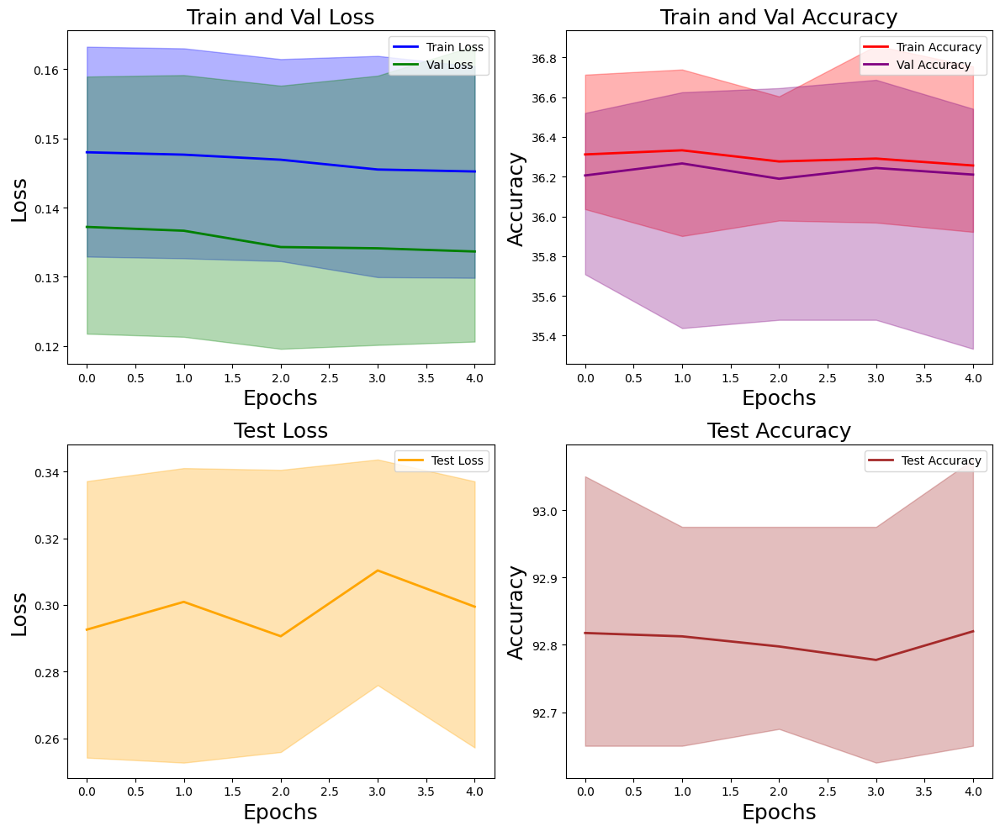

Data saved to t_revision_f3_mlp.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=5e-7,
    batch_size=256,
    num_epochs=5,
    method='t_revision',
    T_matrix=T_matrix,
    num_classes=4,
    optimizer_name='adam',
    times=10,
    model_name='mlp',
    csv_path='t_revision_f3_mlp.csv',
    estimate_T=False,)

mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.14it/s]


Noisy Loss: 1.1422,Validation Loss: 0.2235, Accuracy: 66.52% (3193/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 85.63it/s] 


Test Loss: 0.2383, Accuracy: 92.25% (3690/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 79.56it/s] 


Noisy Loss: 1.1346,Validation Loss: 0.2073, Accuracy: 66.77% (3205/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.27it/s]


Test Loss: 0.2230, Accuracy: 92.70% (3708/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.67it/s]


Noisy Loss: 1.1411,Validation Loss: 0.2191, Accuracy: 66.42% (3188/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.38it/s]


Test Loss: 0.2281, Accuracy: 92.45% (3698/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 79.25it/s] 


Noisy Loss: 1.1358,Validation Loss: 0.1981, Accuracy: 66.44% (3189/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.92it/s]


Test Loss: 0.2375, Accuracy: 91.97% (3679/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.03it/s] 


Noisy Loss: 1.1321,Validation Loss: 0.1948, Accuracy: 67.21% (3226/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.98it/s]


Test Loss: 0.2103, Accuracy: 93.75% (3750/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.38it/s]


Noisy Loss: 1.1325,Validation Loss: 0.1822, Accuracy: 66.77% (3205/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 153.85it/s]


Test Loss: 0.2232, Accuracy: 93.42% (3737/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.13it/s] 


Noisy Loss: 1.1319,Validation Loss: 0.1800, Accuracy: 66.75% (3204/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.30it/s]


Test Loss: 0.2855, Accuracy: 93.03% (3721/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.86it/s] 


Noisy Loss: 1.1312,Validation Loss: 0.1623, Accuracy: 66.62% (3198/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.45it/s]


Test Loss: 0.2445, Accuracy: 92.65% (3706/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.66it/s] 


Noisy Loss: 1.1290,Validation Loss: 0.1629, Accuracy: 67.21% (3226/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.65it/s]


Test Loss: 0.2163, Accuracy: 93.40% (3736/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.06it/s] 


Noisy Loss: 1.1326,Validation Loss: 0.2007, Accuracy: 66.90% (3211/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.23it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.2488, Accuracy: 92.85% (3714/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.79it/s]


Test Loss: 0.2445, Accuracy: 92.65% (3706/4000)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.80it/s]


Noisy Loss: 1.3090,Validation Loss: 0.1535, Accuracy: 67.56% (3243/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.11it/s]


Test Loss: 0.2228, Accuracy: 92.78% (3711/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.94it/s]


Noisy Loss: 1.3090,Validation Loss: 0.1539, Accuracy: 67.54% (3242/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.99it/s]


Test Loss: 0.2136, Accuracy: 92.85% (3714/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.81it/s]


Noisy Loss: 1.3091,Validation Loss: 0.1537, Accuracy: 67.58% (3244/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.51it/s]


Test Loss: 0.2242, Accuracy: 92.65% (3706/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.92it/s]


Noisy Loss: 1.3091,Validation Loss: 0.1558, Accuracy: 67.56% (3243/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.58it/s]


Test Loss: 0.2214, Accuracy: 92.70% (3708/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.88it/s]


Noisy Loss: 1.3091,Validation Loss: 0.1535, Accuracy: 67.56% (3243/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.84it/s]


Test Loss: 0.2184, Accuracy: 92.80% (3712/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.01it/s]


Test Loss: 0.2184, Accuracy: 92.80% (3712/4000)
finished  1  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.33it/s]


Noisy Loss: 1.3087,Validation Loss: 0.1569, Accuracy: 67.75% (3252/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.20it/s]


Test Loss: 0.2147, Accuracy: 92.67% (3707/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.88it/s]


Noisy Loss: 1.3086,Validation Loss: 0.1571, Accuracy: 67.94% (3261/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.37it/s]


Test Loss: 0.2140, Accuracy: 92.78% (3711/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.76it/s]


Noisy Loss: 1.3087,Validation Loss: 0.1602, Accuracy: 67.92% (3260/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.00it/s]


Test Loss: 0.2204, Accuracy: 92.75% (3710/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.92it/s]


Noisy Loss: 1.3087,Validation Loss: 0.1575, Accuracy: 67.81% (3255/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.39it/s]


Test Loss: 0.2160, Accuracy: 92.72% (3709/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.63it/s]


Noisy Loss: 1.3087,Validation Loss: 0.1614, Accuracy: 67.85% (3257/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.43it/s]


Test Loss: 0.2196, Accuracy: 92.67% (3707/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.96it/s]


Test Loss: 0.2147, Accuracy: 92.67% (3707/4000)
finished  2  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.01it/s]


Noisy Loss: 1.3089,Validation Loss: 0.1468, Accuracy: 67.69% (3249/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.14it/s]


Test Loss: 0.2228, Accuracy: 92.83% (3713/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.85it/s]


Noisy Loss: 1.3089,Validation Loss: 0.1464, Accuracy: 67.77% (3253/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.52it/s]


Test Loss: 0.2229, Accuracy: 92.78% (3711/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.75it/s]


Noisy Loss: 1.3089,Validation Loss: 0.1461, Accuracy: 67.60% (3245/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.23it/s]


Test Loss: 0.2258, Accuracy: 92.80% (3712/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.85it/s]


Noisy Loss: 1.3089,Validation Loss: 0.1465, Accuracy: 67.77% (3253/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.19it/s]


Test Loss: 0.2152, Accuracy: 92.75% (3710/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.44it/s]


Noisy Loss: 1.3089,Validation Loss: 0.1486, Accuracy: 67.62% (3246/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.77it/s]


Test Loss: 0.2263, Accuracy: 92.62% (3705/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.20it/s]


Test Loss: 0.2258, Accuracy: 92.80% (3712/4000)
finished  3  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.52it/s]


Noisy Loss: 1.3096,Validation Loss: 0.1509, Accuracy: 66.92% (3212/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.52it/s]


Test Loss: 0.2178, Accuracy: 92.78% (3711/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.77it/s]


Noisy Loss: 1.3096,Validation Loss: 0.1519, Accuracy: 66.94% (3213/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.75it/s]


Test Loss: 0.2180, Accuracy: 92.72% (3709/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.63it/s]


Noisy Loss: 1.3097,Validation Loss: 0.1468, Accuracy: 66.90% (3211/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.01it/s]


Test Loss: 0.2221, Accuracy: 92.65% (3706/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.67it/s]


Noisy Loss: 1.3097,Validation Loss: 0.1480, Accuracy: 66.98% (3215/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.38it/s]


Test Loss: 0.2148, Accuracy: 92.72% (3709/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.70it/s]


Noisy Loss: 1.3096,Validation Loss: 0.1503, Accuracy: 66.94% (3213/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.86it/s]


Test Loss: 0.2184, Accuracy: 92.75% (3710/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.70it/s]


Test Loss: 0.2221, Accuracy: 92.65% (3706/4000)
finished  4  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.66it/s]


Noisy Loss: 1.3096,Validation Loss: 0.1473, Accuracy: 67.02% (3217/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.27it/s]


Test Loss: 0.2250, Accuracy: 92.60% (3704/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.98it/s]


Noisy Loss: 1.3098,Validation Loss: 0.1485, Accuracy: 67.04% (3218/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.51it/s]


Test Loss: 0.2248, Accuracy: 92.67% (3707/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.45it/s]


Noisy Loss: 1.3097,Validation Loss: 0.1506, Accuracy: 66.94% (3213/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.39it/s]


Test Loss: 0.2250, Accuracy: 92.62% (3705/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.96it/s]


Noisy Loss: 1.3096,Validation Loss: 0.1548, Accuracy: 67.04% (3218/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.98it/s]


Test Loss: 0.2240, Accuracy: 92.62% (3705/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.83it/s]


Noisy Loss: 1.3096,Validation Loss: 0.1482, Accuracy: 66.98% (3215/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.11it/s]


Test Loss: 0.2202, Accuracy: 92.62% (3705/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.79it/s]


Test Loss: 0.2250, Accuracy: 92.60% (3704/4000)
finished  5  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.77it/s]


Noisy Loss: 1.3090,Validation Loss: 0.1489, Accuracy: 67.38% (3234/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.13it/s]


Test Loss: 0.2133, Accuracy: 92.90% (3716/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.77it/s]


Noisy Loss: 1.3090,Validation Loss: 0.1495, Accuracy: 67.29% (3230/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.09it/s]


Test Loss: 0.2181, Accuracy: 92.88% (3715/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.06it/s]


Noisy Loss: 1.3091,Validation Loss: 0.1478, Accuracy: 67.31% (3231/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.11it/s]


Test Loss: 0.2203, Accuracy: 92.70% (3708/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.90it/s]


Noisy Loss: 1.3090,Validation Loss: 0.1479, Accuracy: 67.35% (3233/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.76it/s]


Test Loss: 0.2125, Accuracy: 92.78% (3711/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.82it/s]


Noisy Loss: 1.3091,Validation Loss: 0.1479, Accuracy: 67.35% (3233/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.27it/s]


Test Loss: 0.2250, Accuracy: 92.67% (3707/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.68it/s]


Test Loss: 0.2203, Accuracy: 92.70% (3708/4000)
finished  6  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.89it/s]


Noisy Loss: 1.3110,Validation Loss: 0.1525, Accuracy: 66.15% (3175/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.20it/s]


Test Loss: 0.2237, Accuracy: 92.78% (3711/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.26it/s]


Noisy Loss: 1.3109,Validation Loss: 0.1649, Accuracy: 66.15% (3175/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.41it/s]


Test Loss: 0.2251, Accuracy: 92.70% (3708/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.88it/s]


Noisy Loss: 1.3109,Validation Loss: 0.1545, Accuracy: 66.21% (3178/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.87it/s]


Test Loss: 0.2231, Accuracy: 92.85% (3714/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.89it/s]


Noisy Loss: 1.3110,Validation Loss: 0.2489, Accuracy: 66.17% (3176/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.33it/s]


Test Loss: 0.2295, Accuracy: 92.75% (3710/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.69it/s]


Noisy Loss: 1.3110,Validation Loss: 0.1569, Accuracy: 66.00% (3168/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.79it/s]


Test Loss: 0.2194, Accuracy: 92.70% (3708/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.87it/s]


Test Loss: 0.2237, Accuracy: 92.78% (3711/4000)
finished  7  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.86it/s]


Noisy Loss: 1.3093,Validation Loss: 0.1444, Accuracy: 67.06% (3219/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.95it/s]


Test Loss: 0.2160, Accuracy: 92.78% (3711/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.65it/s]


Noisy Loss: 1.3092,Validation Loss: 0.1447, Accuracy: 67.06% (3219/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.02it/s]


Test Loss: 0.2092, Accuracy: 92.80% (3712/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.99it/s]


Noisy Loss: 1.3091,Validation Loss: 0.1448, Accuracy: 67.04% (3218/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.12it/s]


Test Loss: 0.2174, Accuracy: 92.80% (3712/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.81it/s]


Noisy Loss: 1.3092,Validation Loss: 0.1450, Accuracy: 67.06% (3219/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.41it/s]


Test Loss: 0.2142, Accuracy: 92.83% (3713/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.92it/s]


Noisy Loss: 1.3092,Validation Loss: 0.1437, Accuracy: 67.04% (3218/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.17it/s]


Test Loss: 0.2220, Accuracy: 92.78% (3711/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.76it/s]


Test Loss: 0.2220, Accuracy: 92.78% (3711/4000)
finished  8  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.85it/s]


Noisy Loss: 1.3084,Validation Loss: 0.1369, Accuracy: 67.90% (3259/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.88it/s]


Test Loss: 0.2181, Accuracy: 92.80% (3712/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.78it/s]


Noisy Loss: 1.3084,Validation Loss: 0.1388, Accuracy: 67.85% (3257/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 22.05it/s]


Test Loss: 0.2145, Accuracy: 92.75% (3710/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.71it/s]


Noisy Loss: 1.3084,Validation Loss: 0.1378, Accuracy: 67.88% (3258/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.94it/s]


Test Loss: 0.2202, Accuracy: 92.80% (3712/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.93it/s]


Noisy Loss: 1.3084,Validation Loss: 0.1395, Accuracy: 67.83% (3256/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.20it/s]


Test Loss: 0.2227, Accuracy: 92.78% (3711/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.98it/s]


Noisy Loss: 1.3084,Validation Loss: 0.1384, Accuracy: 67.79% (3254/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.75it/s]


Test Loss: 0.2214, Accuracy: 92.62% (3705/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.16it/s]


Test Loss: 0.2181, Accuracy: 92.80% (3712/4000)
finished  9  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.86it/s]


Noisy Loss: 1.3103,Validation Loss: 0.1493, Accuracy: 66.69% (3201/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.26it/s]


Test Loss: 0.2284, Accuracy: 92.70% (3708/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.86it/s]


Noisy Loss: 1.3102,Validation Loss: 0.1480, Accuracy: 66.67% (3200/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.43it/s]


Test Loss: 0.2234, Accuracy: 92.67% (3707/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.61it/s]


Noisy Loss: 1.3102,Validation Loss: 0.1483, Accuracy: 66.67% (3200/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.28it/s]


Test Loss: 0.2268, Accuracy: 92.80% (3712/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 11.02it/s]


Noisy Loss: 1.3103,Validation Loss: 0.1481, Accuracy: 66.67% (3200/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.36it/s]


Test Loss: 0.2187, Accuracy: 92.67% (3707/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.55it/s]


Noisy Loss: 1.3103,Validation Loss: 0.1486, Accuracy: 66.65% (3199/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.71it/s]


Test Loss: 0.2254, Accuracy: 92.65% (3706/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.52it/s]


Test Loss: 0.2234, Accuracy: 92.67% (3707/4000)
finished  10  epoch
min_train_loss [0.17466549401481946, 0.1670274402697881, 0.15957941949367524, 1.6449759061137834, 0.1764900823434194, 0.15678507482012113, 0.16386206388473512, 0.1468524506688118, 0.19346449608604113, 0.1832390789190928]
min_val_loss [0.15348053213797117, 0.15685122107204638, 0.1461421306196012, 0.14682797538606743, 0.14727972487085744, 0.1478445769140595, 0.15253830152122597, 0.14366030222491213, 0.1369270886245527, 0.1480316323669333]
min_train_accuracy [66.76041666666667, 66.66145833333333, 66.76041666666667, 67.078125, 66.76041666666667, 66.90625, 67.07291666666667, 66.90104166666667, 66.80729166666667, 67.171875]
min_val_accuracy [67.5625, 67.75, 67.60416666666667, 66.89583333333333, 67.02083333333333, 67.3125, 66.14583333333333, 67.04166666666667, 67.89583333333333, 66.66666666666667]
min_train_noise_loss [1.132067076365153, 1.1320536263783774, 1.1315496333440145, 1.1308680899937948, 1.1314980522791545, 1.1308186

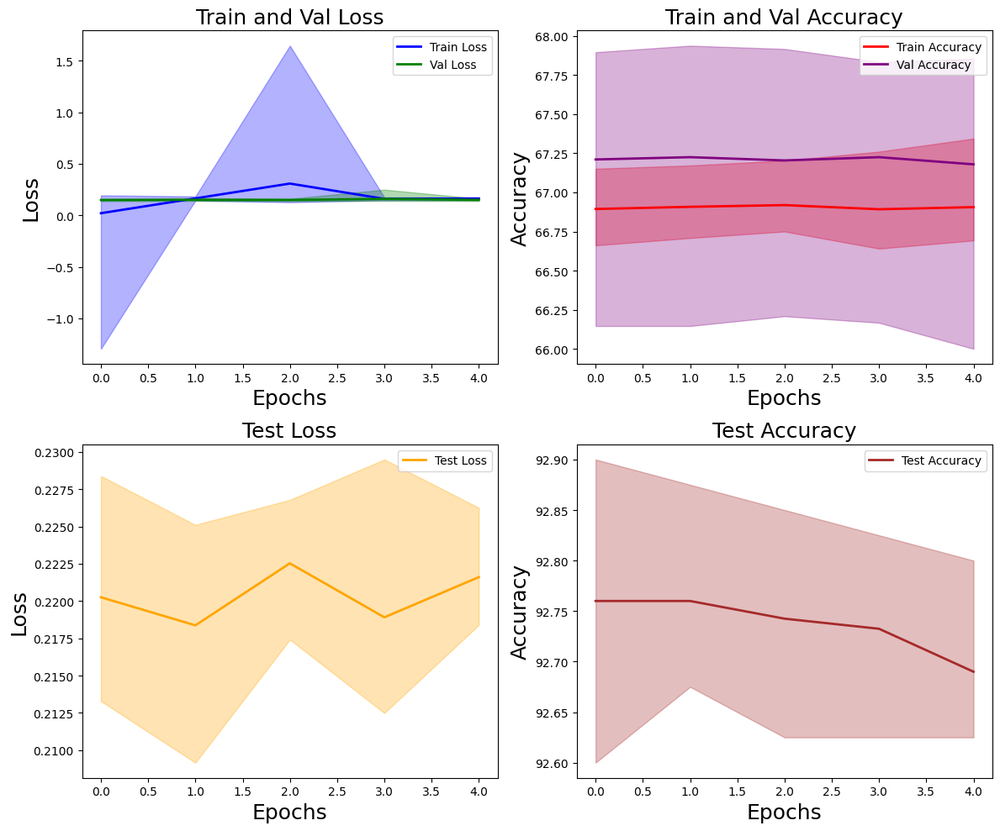

Data saved to t_revision_v2_f3_mlp.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=5e-7,
    batch_size=256,
    num_epochs=5,
    method='t_revision_v2',
    T_matrix=T_matrix,
    num_classes=4,
    optimizer_name='adam',
    times=10,
    model_name='mlp',
    csv_path='t_revision_v2_f3_mlp.csv',
    estimate_T=False,)

### FashionMNIST0.6

In [ ]:
T_matrix = np.array([
    [0.4, 0.2, 0.2, 0.2],
    [0.2, 0.4, 0.2, 0.2],
    [0.2, 0.2, 0.4, 0.2],
    [0.2, 0.2, 0.2, 0.4]
])
X_train_full=data_f6_X_tr
y_train_full=data_f6_S_tr
X_test=data_f6_X_ts
y_test=data_f6_Y_ts

mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 155.18it/s]


Noisy Loss: 1.3635,Validation Loss: 1.3685, Accuracy: 36.71% (1762/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.33it/s]


Test Loss: 0.9731, Accuracy: 85.53% (3421/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 166.56it/s]


Noisy Loss: 1.3688,Validation Loss: 1.3574, Accuracy: 36.71% (1762/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.67it/s]


Test Loss: 1.0480, Accuracy: 86.80% (3472/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.41it/s]


Noisy Loss: 1.3692,Validation Loss: 1.3561, Accuracy: 36.77% (1765/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.19it/s]


Test Loss: 1.0616, Accuracy: 85.10% (3404/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 167.37it/s]


Noisy Loss: 1.3692,Validation Loss: 1.3596, Accuracy: 36.65% (1759/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.56it/s]


Test Loss: 1.0389, Accuracy: 86.17% (3447/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 167.78it/s]


Noisy Loss: 1.3639,Validation Loss: 1.3576, Accuracy: 36.79% (1766/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.82it/s]


Test Loss: 0.9712, Accuracy: 88.65% (3546/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 166.44it/s]


Noisy Loss: 1.3701,Validation Loss: 1.3570, Accuracy: 36.29% (1742/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.03it/s]


Test Loss: 1.0603, Accuracy: 86.85% (3474/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 169.58it/s]


Noisy Loss: 1.3689,Validation Loss: 1.3572, Accuracy: 37.00% (1776/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.84it/s]


Test Loss: 1.0377, Accuracy: 89.50% (3580/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 156.20it/s]


Noisy Loss: 1.3673,Validation Loss: 1.3544, Accuracy: 37.02% (1777/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.97it/s]


Test Loss: 1.0198, Accuracy: 89.20% (3568/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 168.91it/s]


Noisy Loss: 1.3628,Validation Loss: 1.3594, Accuracy: 37.15% (1783/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.59it/s]


Test Loss: 0.9494, Accuracy: 89.42% (3577/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.87it/s]


Noisy Loss: 1.3660,Validation Loss: 1.3577, Accuracy: 37.40% (1795/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.51it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.9951, Accuracy: 88.58% (3543/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.64it/s]


Test Loss: 1.0198, Accuracy: 89.20% (3568/4000)
finished  1  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.25it/s]


Noisy Loss: 1.3710,Validation Loss: 1.3653, Accuracy: 35.08% (1684/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.07it/s]


Test Loss: 1.0762, Accuracy: 80.30% (3212/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 155.54it/s]


Noisy Loss: 1.3653,Validation Loss: 1.3672, Accuracy: 36.06% (1731/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.98it/s]


Test Loss: 0.9628, Accuracy: 84.92% (3397/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 167.58it/s]


Noisy Loss: 1.3724,Validation Loss: 1.3593, Accuracy: 36.44% (1749/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.98it/s]


Test Loss: 1.0950, Accuracy: 87.12% (3485/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 170.06it/s]


Noisy Loss: 1.3659,Validation Loss: 1.3558, Accuracy: 37.21% (1786/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.55it/s]


Test Loss: 0.9800, Accuracy: 89.50% (3580/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 164.68it/s]


Noisy Loss: 1.3656,Validation Loss: 1.3640, Accuracy: 36.83% (1768/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.18it/s]


Test Loss: 0.9657, Accuracy: 88.22% (3529/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 167.36it/s]


Noisy Loss: 1.3652,Validation Loss: 1.3626, Accuracy: 36.67% (1760/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.63it/s]


Test Loss: 0.9805, Accuracy: 88.28% (3531/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 150.96it/s]


Noisy Loss: 1.3697,Validation Loss: 1.3613, Accuracy: 35.46% (1702/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.09it/s]


Test Loss: 1.0503, Accuracy: 84.28% (3371/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 173.36it/s]


Noisy Loss: 1.3688,Validation Loss: 1.3566, Accuracy: 37.62% (1806/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.91it/s]


Test Loss: 1.0339, Accuracy: 89.83% (3593/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 149.60it/s]


Noisy Loss: 1.3742,Validation Loss: 1.3632, Accuracy: 35.79% (1718/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.70it/s]


Test Loss: 1.1288, Accuracy: 85.62% (3425/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.97it/s]


Noisy Loss: 1.3697,Validation Loss: 1.3663, Accuracy: 35.42% (1700/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.66it/s]


Test Loss: 1.0429, Accuracy: 81.92% (3277/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.98it/s]


Test Loss: 0.9800, Accuracy: 89.50% (3580/4000)
finished  2  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 157.23it/s]


Noisy Loss: 1.3709,Validation Loss: 1.3664, Accuracy: 35.52% (1705/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.79it/s]


Test Loss: 1.0876, Accuracy: 79.97% (3199/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 160.32it/s]


Noisy Loss: 1.3679,Validation Loss: 1.3575, Accuracy: 37.15% (1783/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.73it/s]


Test Loss: 1.0270, Accuracy: 88.78% (3551/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 160.83it/s]


Noisy Loss: 1.3679,Validation Loss: 1.3601, Accuracy: 36.71% (1762/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.78it/s]


Test Loss: 1.0215, Accuracy: 85.30% (3412/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 159.12it/s]


Noisy Loss: 1.3666,Validation Loss: 1.3571, Accuracy: 37.02% (1777/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.99it/s]


Test Loss: 1.0058, Accuracy: 87.67% (3507/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 156.91it/s]


Noisy Loss: 1.3716,Validation Loss: 1.3542, Accuracy: 36.85% (1769/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.89it/s]


Test Loss: 1.1045, Accuracy: 88.58% (3543/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 161.60it/s]


Noisy Loss: 1.3652,Validation Loss: 1.3551, Accuracy: 37.23% (1787/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.67it/s]


Test Loss: 0.9802, Accuracy: 88.62% (3545/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 173.81it/s]


Noisy Loss: 1.3659,Validation Loss: 1.3550, Accuracy: 37.33% (1792/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.20it/s]


Test Loss: 1.0002, Accuracy: 88.38% (3535/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 154.31it/s]


Noisy Loss: 1.3707,Validation Loss: 1.3619, Accuracy: 36.42% (1748/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.95it/s]


Test Loss: 1.0639, Accuracy: 85.10% (3404/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 165.16it/s]


Noisy Loss: 1.3681,Validation Loss: 1.3708, Accuracy: 36.27% (1741/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.31it/s]


Test Loss: 1.0239, Accuracy: 84.67% (3387/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 153.20it/s]


Noisy Loss: 1.3661,Validation Loss: 1.3590, Accuracy: 37.23% (1787/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.83it/s]


Test Loss: 0.9987, Accuracy: 88.62% (3545/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.86it/s]


Test Loss: 1.1045, Accuracy: 88.58% (3543/4000)
finished  3  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 168.37it/s]


Noisy Loss: 1.3735,Validation Loss: 1.3756, Accuracy: 32.96% (1582/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.37it/s]


Test Loss: 1.0927, Accuracy: 70.62% (2825/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.59it/s]


Noisy Loss: 1.3766,Validation Loss: 1.3690, Accuracy: 33.31% (1599/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.25it/s]


Test Loss: 1.1719, Accuracy: 70.85% (2834/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 171.73it/s]


Noisy Loss: 1.3675,Validation Loss: 1.3684, Accuracy: 36.56% (1755/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 154.68it/s]


Test Loss: 0.9810, Accuracy: 88.92% (3557/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 167.81it/s]


Noisy Loss: 1.3731,Validation Loss: 1.3636, Accuracy: 35.42% (1700/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.18it/s]


Test Loss: 1.0835, Accuracy: 85.05% (3402/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 160.35it/s]


Noisy Loss: 1.3698,Validation Loss: 1.3657, Accuracy: 35.75% (1716/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.30it/s]


Test Loss: 1.0287, Accuracy: 86.53% (3461/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 165.61it/s]


Noisy Loss: 1.3702,Validation Loss: 1.3725, Accuracy: 35.12% (1686/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.71it/s]


Test Loss: 1.0280, Accuracy: 83.00% (3320/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.41it/s]


Noisy Loss: 1.3709,Validation Loss: 1.3704, Accuracy: 36.02% (1729/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.82it/s]


Test Loss: 1.0356, Accuracy: 86.47% (3459/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 163.54it/s]


Noisy Loss: 1.3685,Validation Loss: 1.3665, Accuracy: 36.42% (1748/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.35it/s]


Test Loss: 1.0008, Accuracy: 88.17% (3527/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 152.72it/s]


Noisy Loss: 1.3687,Validation Loss: 1.3607, Accuracy: 37.00% (1776/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.81it/s]


Test Loss: 1.0087, Accuracy: 89.72% (3589/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 171.86it/s]


Noisy Loss: 1.3699,Validation Loss: 1.3647, Accuracy: 36.94% (1773/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.43it/s]


Test Loss: 1.0259, Accuracy: 89.80% (3592/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.33it/s]


Test Loss: 1.0087, Accuracy: 89.72% (3589/4000)
finished  4  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 156.59it/s]


Noisy Loss: 1.3710,Validation Loss: 1.3720, Accuracy: 34.58% (1660/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.94it/s]


Test Loss: 1.0729, Accuracy: 79.10% (3164/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 166.75it/s]


Noisy Loss: 1.3704,Validation Loss: 1.3590, Accuracy: 36.15% (1735/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.06it/s]


Test Loss: 1.0567, Accuracy: 86.42% (3457/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 159.58it/s]


Noisy Loss: 1.3729,Validation Loss: 1.3666, Accuracy: 35.73% (1715/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.21it/s]


Test Loss: 1.0859, Accuracy: 83.50% (3340/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 166.56it/s]


Noisy Loss: 1.3724,Validation Loss: 1.3673, Accuracy: 36.12% (1734/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.74it/s]


Test Loss: 1.0835, Accuracy: 85.42% (3417/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 160.77it/s]


Noisy Loss: 1.3668,Validation Loss: 1.3576, Accuracy: 36.88% (1770/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.23it/s]


Test Loss: 0.9864, Accuracy: 89.80% (3592/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 164.17it/s]


Noisy Loss: 1.3685,Validation Loss: 1.3653, Accuracy: 36.27% (1741/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.28it/s]


Test Loss: 1.0159, Accuracy: 87.97% (3519/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 168.26it/s]


Noisy Loss: 1.3703,Validation Loss: 1.3674, Accuracy: 35.71% (1714/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.92it/s]


Test Loss: 1.0508, Accuracy: 83.95% (3358/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.28it/s]


Noisy Loss: 1.3698,Validation Loss: 1.3612, Accuracy: 36.04% (1730/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.35it/s]


Test Loss: 1.0503, Accuracy: 86.15% (3446/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 166.20it/s]


Noisy Loss: 1.3701,Validation Loss: 1.3588, Accuracy: 36.29% (1742/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.55it/s]


Test Loss: 1.0487, Accuracy: 88.80% (3552/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 148.60it/s]


Noisy Loss: 1.3655,Validation Loss: 1.3586, Accuracy: 36.77% (1765/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.67it/s]


Test Loss: 0.9700, Accuracy: 90.80% (3632/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.10it/s]


Test Loss: 0.9864, Accuracy: 89.80% (3592/4000)
finished  5  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 161.16it/s]


Noisy Loss: 1.3716,Validation Loss: 1.3566, Accuracy: 36.40% (1747/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.15it/s]


Test Loss: 1.0994, Accuracy: 85.25% (3410/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 151.00it/s]


Noisy Loss: 1.3671,Validation Loss: 1.3542, Accuracy: 36.98% (1775/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.24it/s]


Test Loss: 1.0103, Accuracy: 89.10% (3564/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 164.44it/s]


Noisy Loss: 1.3680,Validation Loss: 1.3612, Accuracy: 36.31% (1743/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.45it/s]


Test Loss: 1.0228, Accuracy: 85.72% (3429/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 153.40it/s]


Noisy Loss: 1.3727,Validation Loss: 1.3684, Accuracy: 35.52% (1705/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.58it/s]


Test Loss: 1.0976, Accuracy: 81.62% (3265/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 160.02it/s]


Noisy Loss: 1.3678,Validation Loss: 1.3608, Accuracy: 37.19% (1785/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.53it/s]


Test Loss: 1.0162, Accuracy: 87.05% (3482/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 165.61it/s]


Noisy Loss: 1.3674,Validation Loss: 1.3578, Accuracy: 37.73% (1811/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.23it/s]


Test Loss: 1.0243, Accuracy: 88.97% (3559/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 166.66it/s]


Noisy Loss: 1.3707,Validation Loss: 1.3577, Accuracy: 37.35% (1793/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.26it/s]


Test Loss: 1.0687, Accuracy: 88.92% (3557/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 165.45it/s]


Noisy Loss: 1.3656,Validation Loss: 1.3559, Accuracy: 37.29% (1790/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.04it/s]


Test Loss: 0.9841, Accuracy: 88.88% (3555/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 169.69it/s]


Noisy Loss: 1.3689,Validation Loss: 1.3535, Accuracy: 37.25% (1788/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.97it/s]


Test Loss: 1.0487, Accuracy: 89.55% (3582/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 167.36it/s]


Noisy Loss: 1.3677,Validation Loss: 1.3664, Accuracy: 36.90% (1771/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.59it/s]


Test Loss: 1.0231, Accuracy: 85.80% (3432/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.20it/s]


Test Loss: 1.0487, Accuracy: 89.55% (3582/4000)
finished  6  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.58it/s]


Noisy Loss: 1.3660,Validation Loss: 1.3678, Accuracy: 35.35% (1697/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.87it/s]


Test Loss: 1.0077, Accuracy: 79.25% (3170/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 164.83it/s]


Noisy Loss: 1.3667,Validation Loss: 1.3639, Accuracy: 36.94% (1773/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.90it/s]


Test Loss: 0.9987, Accuracy: 87.17% (3487/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 154.57it/s]


Noisy Loss: 1.3683,Validation Loss: 1.3540, Accuracy: 36.94% (1773/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.61it/s]


Test Loss: 1.0344, Accuracy: 87.53% (3501/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 168.72it/s]


Noisy Loss: 1.3628,Validation Loss: 1.3576, Accuracy: 37.67% (1808/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.94it/s]


Test Loss: 0.9406, Accuracy: 89.58% (3583/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 157.70it/s]


Noisy Loss: 1.3654,Validation Loss: 1.3635, Accuracy: 36.58% (1756/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.35it/s]


Test Loss: 0.9746, Accuracy: 86.15% (3446/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 157.83it/s]


Noisy Loss: 1.3679,Validation Loss: 1.3549, Accuracy: 37.00% (1776/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.37it/s]


Test Loss: 1.0467, Accuracy: 87.30% (3492/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 163.40it/s]


Noisy Loss: 1.3651,Validation Loss: 1.3737, Accuracy: 36.48% (1751/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.34it/s]


Test Loss: 0.9818, Accuracy: 85.62% (3425/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 167.22it/s]


Noisy Loss: 1.3627,Validation Loss: 1.3589, Accuracy: 37.69% (1809/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.42it/s]


Test Loss: 0.9475, Accuracy: 88.80% (3552/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 159.96it/s]


Noisy Loss: 1.3679,Validation Loss: 1.3559, Accuracy: 37.40% (1795/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.74it/s]


Test Loss: 1.0345, Accuracy: 87.15% (3486/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.14it/s]


Noisy Loss: 1.3652,Validation Loss: 1.3580, Accuracy: 37.54% (1802/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.26it/s]


Test Loss: 0.9792, Accuracy: 88.58% (3543/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.14it/s]


Test Loss: 1.0344, Accuracy: 87.53% (3501/4000)
finished  7  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 163.52it/s]


Noisy Loss: 1.3704,Validation Loss: 1.3598, Accuracy: 36.46% (1750/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.21it/s]


Test Loss: 1.0820, Accuracy: 83.83% (3353/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 167.10it/s]


Noisy Loss: 1.3704,Validation Loss: 1.3618, Accuracy: 35.23% (1691/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.32it/s]


Test Loss: 1.0764, Accuracy: 77.20% (3088/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 165.48it/s]


Noisy Loss: 1.3670,Validation Loss: 1.3544, Accuracy: 37.58% (1804/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.63it/s]


Test Loss: 1.0193, Accuracy: 89.80% (3592/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 153.64it/s]


Noisy Loss: 1.3662,Validation Loss: 1.3511, Accuracy: 37.88% (1818/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.07it/s]


Test Loss: 1.0033, Accuracy: 90.60% (3624/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 157.14it/s]


Noisy Loss: 1.3693,Validation Loss: 1.3570, Accuracy: 37.17% (1784/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.16it/s]


Test Loss: 1.0534, Accuracy: 87.33% (3493/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 154.13it/s]


Noisy Loss: 1.3671,Validation Loss: 1.3528, Accuracy: 37.58% (1804/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.32it/s]


Test Loss: 1.0215, Accuracy: 87.50% (3500/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 168.53it/s]


Noisy Loss: 1.3728,Validation Loss: 1.3620, Accuracy: 37.17% (1784/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.35it/s]


Test Loss: 1.1117, Accuracy: 86.05% (3442/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.56it/s]


Noisy Loss: 1.3681,Validation Loss: 1.3501, Accuracy: 37.27% (1789/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.33it/s]


Test Loss: 1.0507, Accuracy: 88.90% (3556/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 163.44it/s]


Noisy Loss: 1.3686,Validation Loss: 1.3589, Accuracy: 37.33% (1792/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.33it/s]


Test Loss: 1.0261, Accuracy: 88.00% (3520/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.17it/s]


Noisy Loss: 1.3658,Validation Loss: 1.3585, Accuracy: 37.40% (1795/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.41it/s]


Test Loss: 0.9884, Accuracy: 89.62% (3585/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.26it/s]


Test Loss: 1.0507, Accuracy: 88.90% (3556/4000)
finished  8  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 163.30it/s]


Noisy Loss: 1.3682,Validation Loss: 1.3665, Accuracy: 36.44% (1749/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.03it/s]


Test Loss: 1.0125, Accuracy: 88.40% (3536/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 170.12it/s]


Noisy Loss: 1.3720,Validation Loss: 1.3652, Accuracy: 34.48% (1655/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.47it/s]


Test Loss: 1.0860, Accuracy: 79.72% (3189/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 166.18it/s]


Noisy Loss: 1.3677,Validation Loss: 1.3648, Accuracy: 37.02% (1777/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.04it/s]


Test Loss: 1.0088, Accuracy: 89.28% (3571/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 165.45it/s]


Noisy Loss: 1.3672,Validation Loss: 1.3718, Accuracy: 36.04% (1730/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.22it/s]


Test Loss: 0.9911, Accuracy: 85.92% (3437/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 153.39it/s]


Noisy Loss: 1.3702,Validation Loss: 1.3604, Accuracy: 35.90% (1723/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.35it/s]


Test Loss: 1.0485, Accuracy: 87.62% (3505/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 156.15it/s]


Noisy Loss: 1.3674,Validation Loss: 1.3633, Accuracy: 36.38% (1746/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.44it/s]


Test Loss: 0.9890, Accuracy: 89.08% (3563/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 157.24it/s]


Noisy Loss: 1.3733,Validation Loss: 1.3656, Accuracy: 34.81% (1671/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.96it/s]


Test Loss: 1.1134, Accuracy: 79.30% (3172/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 156.75it/s]


Noisy Loss: 1.3645,Validation Loss: 1.3728, Accuracy: 36.69% (1761/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.59it/s]


Test Loss: 0.9300, Accuracy: 87.92% (3517/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 155.78it/s]


Noisy Loss: 1.3683,Validation Loss: 1.3597, Accuracy: 36.73% (1763/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.23it/s]


Test Loss: 1.0314, Accuracy: 85.72% (3429/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.70it/s]


Noisy Loss: 1.3659,Validation Loss: 1.3644, Accuracy: 37.46% (1798/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.11it/s]


Test Loss: 0.9669, Accuracy: 89.83% (3593/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.73it/s]


Test Loss: 1.0314, Accuracy: 85.72% (3429/4000)
finished  9  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 161.62it/s]


Noisy Loss: 1.3625,Validation Loss: 1.3548, Accuracy: 37.60% (1805/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.65it/s]


Test Loss: 0.9948, Accuracy: 84.03% (3361/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 161.19it/s]


Noisy Loss: 1.3702,Validation Loss: 1.3645, Accuracy: 35.79% (1718/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.24it/s]


Test Loss: 1.0986, Accuracy: 72.35% (2894/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 161.22it/s]


Noisy Loss: 1.3621,Validation Loss: 1.3513, Accuracy: 37.48% (1799/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.54it/s]


Test Loss: 0.9785, Accuracy: 84.47% (3379/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 164.29it/s]


Noisy Loss: 1.3667,Validation Loss: 1.3500, Accuracy: 37.73% (1811/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.64it/s]


Test Loss: 1.0650, Accuracy: 81.22% (3249/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 153.93it/s]


Noisy Loss: 1.3651,Validation Loss: 1.3534, Accuracy: 36.29% (1742/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.34it/s]


Test Loss: 1.0305, Accuracy: 79.88% (3195/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 153.09it/s]


Noisy Loss: 1.3688,Validation Loss: 1.3475, Accuracy: 38.33% (1840/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.51it/s]


Test Loss: 1.0914, Accuracy: 86.90% (3476/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 167.26it/s]


Noisy Loss: 1.3688,Validation Loss: 1.3493, Accuracy: 37.10% (1781/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.20it/s]


Test Loss: 1.0896, Accuracy: 82.10% (3284/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 155.84it/s]


Noisy Loss: 1.3651,Validation Loss: 1.3474, Accuracy: 38.69% (1857/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.39it/s]


Test Loss: 1.0303, Accuracy: 89.47% (3579/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 164.09it/s]


Noisy Loss: 1.3654,Validation Loss: 1.3505, Accuracy: 38.67% (1856/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.98it/s]


Test Loss: 1.0313, Accuracy: 88.62% (3545/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.27it/s]


Noisy Loss: 1.3677,Validation Loss: 1.3455, Accuracy: 38.40% (1843/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.23it/s]


Test Loss: 1.0613, Accuracy: 89.05% (3562/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.91it/s]


Test Loss: 1.0613, Accuracy: 89.05% (3562/4000)
finished  10  epoch
min_train_loss [1.3496586388349534, 1.3580817204713822, 1.3558569157123566, 1.3482182933886846, 1.3536141862471898, 1.3496247732639313, 1.3605798103411992, 1.3489091360569, 1.3480091267824172, 1.3515314271052679]
min_val_loss [1.3544443519910176, 1.3557716878255208, 1.3541902279853821, 1.3606693450609844, 1.3575827765464783, 1.3534894704818725, 1.3539985346794128, 1.3501099602381388, 1.3596924924850464, 1.3455196078618368]
min_train_accuracy [37.354166666666664, 36.572916666666664, 36.911458333333336, 37.536458333333336, 36.942708333333336, 37.53125, 36.546875, 37.416666666666664, 37.953125, 37.364583333333336]
min_val_accuracy [37.020833333333336, 37.208333333333336, 36.854166666666664, 37.0, 36.875, 37.25, 36.9375, 37.270833333333336, 36.729166666666664, 38.395833333333336]
min_train_noise_loss [1.3653013143936794, 1.3674192970991135, 1.3667002262671788, 1.364691921075185, 1.3662608077128728, 1.3656182823578518, 1.36

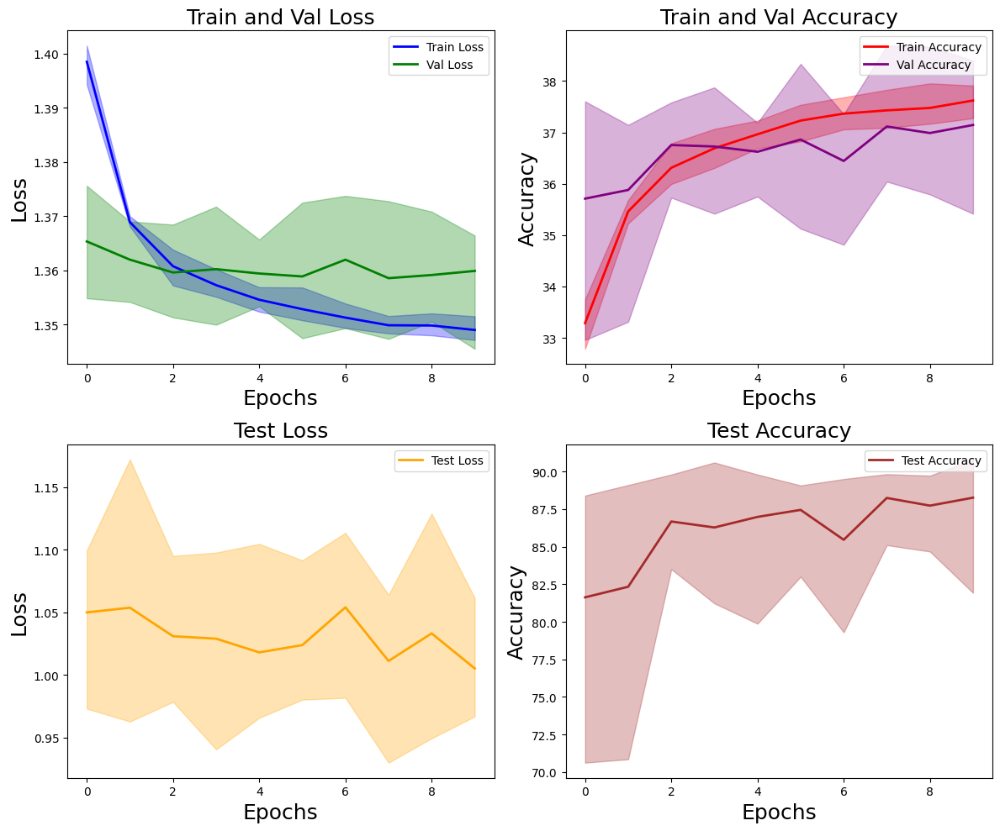

Data saved to baseline_f6_mlp.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=0.0005,
    batch_size=32,
    num_epochs=10,
    times=10,
    method='baseline',
    T_matrix=T_matrix,
    model_name='mlp',
    csv_path='baseline_f6_mlp.csv'
)

mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 159.11it/s]


Noisy Loss: 1.3656,Validation Loss: 1.3432, Accuracy: 37.69% (1809/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.73it/s]


Test Loss: 0.4094, Accuracy: 87.15% (3486/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 146.00it/s]


Noisy Loss: 1.3644,Validation Loss: 1.3397, Accuracy: 38.40% (1843/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.20it/s]


Test Loss: 0.3052, Accuracy: 90.53% (3621/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 154.65it/s]


Noisy Loss: 1.3637,Validation Loss: 1.3382, Accuracy: 38.48% (1847/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.77it/s]


Test Loss: 0.3267, Accuracy: 89.95% (3598/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 159.41it/s]


Noisy Loss: 1.3638,Validation Loss: 1.3389, Accuracy: 38.52% (1849/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.38it/s]


Test Loss: 0.2865, Accuracy: 91.42% (3657/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 160.29it/s]


Noisy Loss: 1.3642,Validation Loss: 1.3399, Accuracy: 38.33% (1840/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.82it/s]


Test Loss: 0.2797, Accuracy: 91.38% (3655/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 154.40it/s]


Noisy Loss: 1.3637,Validation Loss: 1.3376, Accuracy: 38.81% (1863/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.28it/s]


Test Loss: 0.3248, Accuracy: 90.55% (3622/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 153.82it/s]


Noisy Loss: 1.3642,Validation Loss: 1.3396, Accuracy: 38.31% (1839/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.69it/s]


Test Loss: 0.3364, Accuracy: 89.55% (3582/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 164.38it/s]


Noisy Loss: 1.3641,Validation Loss: 1.3397, Accuracy: 38.40% (1843/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.38it/s]


Test Loss: 0.3043, Accuracy: 90.85% (3634/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 163.01it/s]


Noisy Loss: 1.3645,Validation Loss: 1.3401, Accuracy: 38.38% (1842/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.93it/s]


Test Loss: 0.3147, Accuracy: 90.00% (3600/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.11it/s]


Noisy Loss: 1.3639,Validation Loss: 1.3393, Accuracy: 38.48% (1847/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.45it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.3025, Accuracy: 90.50% (3620/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.34it/s]


Test Loss: 0.3248, Accuracy: 90.55% (3622/4000)
finished  1  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 157.61it/s]


Noisy Loss: 1.3668,Validation Loss: 1.3475, Accuracy: 37.46% (1798/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.84it/s]


Test Loss: 0.3812, Accuracy: 87.62% (3505/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 164.88it/s]


Noisy Loss: 1.3657,Validation Loss: 1.3441, Accuracy: 37.67% (1808/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.20it/s]


Test Loss: 0.3281, Accuracy: 90.33% (3613/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 159.48it/s]


Noisy Loss: 1.3663,Validation Loss: 1.3456, Accuracy: 37.71% (1810/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.75it/s]


Test Loss: 0.3460, Accuracy: 88.45% (3538/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 159.34it/s]


Noisy Loss: 1.3659,Validation Loss: 1.3455, Accuracy: 37.65% (1807/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.54it/s]


Test Loss: 0.3374, Accuracy: 89.95% (3598/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 151.77it/s]


Noisy Loss: 1.3657,Validation Loss: 1.3450, Accuracy: 37.83% (1816/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.60it/s]


Test Loss: 0.3064, Accuracy: 90.38% (3615/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 159.25it/s]


Noisy Loss: 1.3653,Validation Loss: 1.3438, Accuracy: 37.75% (1812/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.38it/s]


Test Loss: 0.3103, Accuracy: 90.35% (3614/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 153.49it/s]


Noisy Loss: 1.3650,Validation Loss: 1.3438, Accuracy: 37.73% (1811/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.62it/s]


Test Loss: 0.3055, Accuracy: 90.78% (3631/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.63it/s]


Noisy Loss: 1.3666,Validation Loss: 1.3471, Accuracy: 37.29% (1790/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.53it/s]


Test Loss: 0.4069, Accuracy: 85.45% (3418/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 155.40it/s]


Noisy Loss: 1.3652,Validation Loss: 1.3442, Accuracy: 37.62% (1806/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.90it/s]


Test Loss: 0.2993, Accuracy: 90.58% (3623/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 160.68it/s]


Noisy Loss: 1.3677,Validation Loss: 1.3501, Accuracy: 36.29% (1742/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.88it/s]


Test Loss: 0.4337, Accuracy: 84.22% (3369/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.42it/s]


Test Loss: 0.3103, Accuracy: 90.35% (3614/4000)
finished  2  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 154.55it/s]


Noisy Loss: 1.3660,Validation Loss: 1.3446, Accuracy: 37.46% (1798/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.96it/s]


Test Loss: 0.3674, Accuracy: 88.00% (3520/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 160.41it/s]


Noisy Loss: 1.3652,Validation Loss: 1.3428, Accuracy: 38.04% (1826/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.88it/s]


Test Loss: 0.3163, Accuracy: 90.80% (3632/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 155.87it/s]


Noisy Loss: 1.3648,Validation Loss: 1.3421, Accuracy: 38.48% (1847/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.53it/s]


Test Loss: 0.2881, Accuracy: 91.35% (3654/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.11it/s]


Noisy Loss: 1.3651,Validation Loss: 1.3433, Accuracy: 37.96% (1822/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.58it/s]


Test Loss: 0.3386, Accuracy: 90.60% (3624/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 163.21it/s]


Noisy Loss: 1.3651,Validation Loss: 1.3425, Accuracy: 37.75% (1812/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.14it/s]


Test Loss: 0.3243, Accuracy: 88.90% (3556/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.93it/s]


Noisy Loss: 1.3659,Validation Loss: 1.3451, Accuracy: 37.12% (1782/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.21it/s]


Test Loss: 0.3310, Accuracy: 89.05% (3562/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 164.28it/s]


Noisy Loss: 1.3661,Validation Loss: 1.3447, Accuracy: 37.48% (1799/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 151.77it/s]


Test Loss: 0.3717, Accuracy: 88.75% (3550/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.33it/s]


Noisy Loss: 1.3665,Validation Loss: 1.3443, Accuracy: 37.56% (1803/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.33it/s]


Test Loss: 0.3666, Accuracy: 87.97% (3519/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 160.13it/s]


Noisy Loss: 1.3661,Validation Loss: 1.3462, Accuracy: 37.44% (1797/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.52it/s]


Test Loss: 0.3651, Accuracy: 88.78% (3551/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 155.65it/s]


Noisy Loss: 1.3646,Validation Loss: 1.3419, Accuracy: 38.12% (1830/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.89it/s]


Test Loss: 0.2645, Accuracy: 91.67% (3667/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 152.62it/s]


Test Loss: 0.2645, Accuracy: 91.67% (3667/4000)
finished  3  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 153.19it/s]


Noisy Loss: 1.3661,Validation Loss: 1.3450, Accuracy: 37.67% (1808/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.54it/s]


Test Loss: 0.3278, Accuracy: 89.38% (3575/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 151.05it/s]


Noisy Loss: 1.3653,Validation Loss: 1.3434, Accuracy: 38.04% (1826/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.77it/s]


Test Loss: 0.3157, Accuracy: 90.65% (3626/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 161.04it/s]


Noisy Loss: 1.3662,Validation Loss: 1.3453, Accuracy: 37.65% (1807/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.12it/s]


Test Loss: 0.3368, Accuracy: 89.00% (3560/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 147.05it/s]


Noisy Loss: 1.3659,Validation Loss: 1.3449, Accuracy: 37.56% (1803/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.46it/s]


Test Loss: 0.3288, Accuracy: 89.05% (3562/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 161.23it/s]


Noisy Loss: 1.3661,Validation Loss: 1.3454, Accuracy: 37.58% (1804/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.20it/s]


Test Loss: 0.3206, Accuracy: 89.85% (3594/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 153.02it/s]


Noisy Loss: 1.3655,Validation Loss: 1.3443, Accuracy: 37.90% (1819/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.66it/s]


Test Loss: 0.2984, Accuracy: 90.83% (3633/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 167.18it/s]


Noisy Loss: 1.3662,Validation Loss: 1.3459, Accuracy: 37.50% (1800/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.73it/s]


Test Loss: 0.3781, Accuracy: 87.90% (3516/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 149.74it/s]


Noisy Loss: 1.3653,Validation Loss: 1.3438, Accuracy: 37.79% (1814/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.27it/s]


Test Loss: 0.2998, Accuracy: 91.10% (3644/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 160.90it/s]


Noisy Loss: 1.3669,Validation Loss: 1.3468, Accuracy: 37.06% (1779/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.73it/s]


Test Loss: 0.3283, Accuracy: 89.42% (3577/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 156.08it/s]


Noisy Loss: 1.3655,Validation Loss: 1.3454, Accuracy: 37.58% (1804/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.08it/s]


Test Loss: 0.3669, Accuracy: 89.47% (3579/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.51it/s]


Test Loss: 0.3157, Accuracy: 90.65% (3626/4000)
finished  4  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 153.39it/s]


Noisy Loss: 1.3659,Validation Loss: 1.3423, Accuracy: 37.73% (1811/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.23it/s]


Test Loss: 0.3521, Accuracy: 89.00% (3560/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 154.31it/s]


Noisy Loss: 1.3645,Validation Loss: 1.3409, Accuracy: 38.29% (1838/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.08it/s]


Test Loss: 0.3503, Accuracy: 89.97% (3599/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 160.98it/s]


Noisy Loss: 1.3647,Validation Loss: 1.3402, Accuracy: 38.19% (1833/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.49it/s]


Test Loss: 0.3527, Accuracy: 89.95% (3598/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 164.28it/s]


Noisy Loss: 1.3650,Validation Loss: 1.3419, Accuracy: 38.17% (1832/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.30it/s]


Test Loss: 0.3600, Accuracy: 88.33% (3533/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.69it/s]


Noisy Loss: 1.3639,Validation Loss: 1.3384, Accuracy: 38.60% (1853/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.52it/s]


Test Loss: 0.3153, Accuracy: 90.50% (3620/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.25it/s]


Noisy Loss: 1.3636,Validation Loss: 1.3373, Accuracy: 38.77% (1861/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.23it/s]


Test Loss: 0.2919, Accuracy: 91.70% (3668/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.50it/s]


Noisy Loss: 1.3637,Validation Loss: 1.3383, Accuracy: 38.71% (1858/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.21it/s]


Test Loss: 0.2763, Accuracy: 92.22% (3689/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 156.48it/s]


Noisy Loss: 1.3652,Validation Loss: 1.3411, Accuracy: 38.06% (1827/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.63it/s]


Test Loss: 0.3574, Accuracy: 89.12% (3565/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 165.46it/s]


Noisy Loss: 1.3670,Validation Loss: 1.3447, Accuracy: 37.15% (1783/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.22it/s]


Test Loss: 0.4372, Accuracy: 83.90% (3356/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.87it/s]


Noisy Loss: 1.3634,Validation Loss: 1.3377, Accuracy: 38.88% (1866/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.52it/s]


Test Loss: 0.3109, Accuracy: 92.03% (3681/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.48it/s]


Test Loss: 0.2919, Accuracy: 91.70% (3668/4000)
finished  5  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 161.10it/s]


Noisy Loss: 1.3643,Validation Loss: 1.3402, Accuracy: 38.19% (1833/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.47it/s]


Test Loss: 0.3005, Accuracy: 90.53% (3621/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 163.64it/s]


Noisy Loss: 1.3643,Validation Loss: 1.3395, Accuracy: 38.50% (1848/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.10it/s]


Test Loss: 0.3180, Accuracy: 90.47% (3619/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 149.39it/s]


Noisy Loss: 1.3639,Validation Loss: 1.3386, Accuracy: 38.69% (1857/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.12it/s]


Test Loss: 0.2995, Accuracy: 90.90% (3636/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 161.64it/s]


Noisy Loss: 1.3640,Validation Loss: 1.3388, Accuracy: 38.67% (1856/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.71it/s]


Test Loss: 0.2952, Accuracy: 90.95% (3638/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 153.48it/s]


Noisy Loss: 1.3643,Validation Loss: 1.3399, Accuracy: 38.38% (1842/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.16it/s]


Test Loss: 0.3022, Accuracy: 90.33% (3613/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.28it/s]


Noisy Loss: 1.3637,Validation Loss: 1.3382, Accuracy: 38.90% (1867/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.58it/s]


Test Loss: 0.2938, Accuracy: 91.62% (3665/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 154.26it/s]


Noisy Loss: 1.3639,Validation Loss: 1.3401, Accuracy: 38.44% (1845/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.86it/s]


Test Loss: 0.3321, Accuracy: 89.80% (3592/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 154.80it/s]


Noisy Loss: 1.3650,Validation Loss: 1.3414, Accuracy: 38.21% (1834/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.08it/s]


Test Loss: 0.3316, Accuracy: 90.25% (3610/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 160.66it/s]


Noisy Loss: 1.3639,Validation Loss: 1.3396, Accuracy: 38.35% (1841/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.13it/s]


Test Loss: 0.3242, Accuracy: 90.45% (3618/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.57it/s]


Noisy Loss: 1.3638,Validation Loss: 1.3400, Accuracy: 38.56% (1851/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.32it/s]


Test Loss: 0.3236, Accuracy: 91.10% (3644/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.04it/s]


Test Loss: 0.2938, Accuracy: 91.62% (3665/4000)
finished  6  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 159.76it/s]


Noisy Loss: 1.3642,Validation Loss: 1.3396, Accuracy: 38.40% (1843/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.51it/s]


Test Loss: 0.3295, Accuracy: 89.85% (3594/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.23it/s]


Noisy Loss: 1.3630,Validation Loss: 1.3367, Accuracy: 39.12% (1878/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.13it/s]


Test Loss: 0.2954, Accuracy: 90.65% (3626/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 161.31it/s]


Noisy Loss: 1.3649,Validation Loss: 1.3402, Accuracy: 37.92% (1820/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.73it/s]


Test Loss: 0.3823, Accuracy: 85.62% (3425/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.03it/s]


Noisy Loss: 1.3635,Validation Loss: 1.3375, Accuracy: 38.88% (1866/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.98it/s]


Test Loss: 0.2779, Accuracy: 91.33% (3653/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 159.32it/s]


Noisy Loss: 1.3634,Validation Loss: 1.3371, Accuracy: 38.85% (1865/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 150.48it/s]


Test Loss: 0.2798, Accuracy: 90.78% (3631/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.04it/s]


Noisy Loss: 1.3632,Validation Loss: 1.3370, Accuracy: 38.60% (1853/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.04it/s]


Test Loss: 0.2919, Accuracy: 90.72% (3629/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 155.87it/s]


Noisy Loss: 1.3634,Validation Loss: 1.3366, Accuracy: 38.88% (1866/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.70it/s]


Test Loss: 0.2813, Accuracy: 90.97% (3639/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 150.35it/s]


Noisy Loss: 1.3633,Validation Loss: 1.3374, Accuracy: 39.06% (1875/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.11it/s]


Test Loss: 0.2611, Accuracy: 91.20% (3648/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 160.13it/s]


Noisy Loss: 1.3632,Validation Loss: 1.3362, Accuracy: 39.02% (1873/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.55it/s]


Test Loss: 0.2969, Accuracy: 90.45% (3618/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 149.83it/s]


Noisy Loss: 1.3631,Validation Loss: 1.3359, Accuracy: 38.85% (1865/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.44it/s]


Test Loss: 0.2894, Accuracy: 90.97% (3639/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.37it/s]


Test Loss: 0.2894, Accuracy: 90.97% (3639/4000)
finished  7  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 152.09it/s]


Noisy Loss: 1.3641,Validation Loss: 1.3373, Accuracy: 38.75% (1860/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.01it/s]


Test Loss: 0.3182, Accuracy: 90.12% (3605/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 150.91it/s]


Noisy Loss: 1.3651,Validation Loss: 1.3427, Accuracy: 37.98% (1823/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.74it/s]


Test Loss: 0.3772, Accuracy: 87.40% (3496/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 156.50it/s]


Noisy Loss: 1.3639,Validation Loss: 1.3365, Accuracy: 39.48% (1895/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.19it/s]


Test Loss: 0.3133, Accuracy: 89.30% (3572/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 151.50it/s]


Noisy Loss: 1.3639,Validation Loss: 1.3375, Accuracy: 38.81% (1863/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.35it/s]


Test Loss: 0.3197, Accuracy: 89.33% (3573/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.21it/s]


Noisy Loss: 1.3628,Validation Loss: 1.3350, Accuracy: 39.38% (1890/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.39it/s]


Test Loss: 0.3032, Accuracy: 90.40% (3616/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 158.13it/s]


Noisy Loss: 1.3640,Validation Loss: 1.3385, Accuracy: 38.81% (1863/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.25it/s]


Test Loss: 0.3492, Accuracy: 88.85% (3554/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 156.70it/s]


Noisy Loss: 1.3641,Validation Loss: 1.3389, Accuracy: 38.75% (1860/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.56it/s]


Test Loss: 0.3082, Accuracy: 89.92% (3597/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 161.44it/s]


Noisy Loss: 1.3634,Validation Loss: 1.3370, Accuracy: 38.67% (1856/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.36it/s]


Test Loss: 0.3400, Accuracy: 88.92% (3557/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 160.31it/s]


Noisy Loss: 1.3633,Validation Loss: 1.3381, Accuracy: 38.88% (1866/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.99it/s]


Test Loss: 0.3023, Accuracy: 90.85% (3634/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 165.30it/s]


Noisy Loss: 1.3641,Validation Loss: 1.3392, Accuracy: 38.65% (1855/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.34it/s]


Test Loss: 0.3264, Accuracy: 89.67% (3587/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.34it/s]


Test Loss: 0.3032, Accuracy: 90.40% (3616/4000)
finished  8  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 157.67it/s]


Noisy Loss: 1.3658,Validation Loss: 1.3435, Accuracy: 38.33% (1840/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.22it/s]


Test Loss: 0.3960, Accuracy: 88.20% (3528/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 161.78it/s]


Noisy Loss: 1.3654,Validation Loss: 1.3437, Accuracy: 37.85% (1817/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.99it/s]


Test Loss: 0.3408, Accuracy: 88.80% (3552/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.22it/s]


Noisy Loss: 1.3640,Validation Loss: 1.3399, Accuracy: 38.38% (1842/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.32it/s]


Test Loss: 0.3113, Accuracy: 90.65% (3626/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 157.82it/s]


Noisy Loss: 1.3642,Validation Loss: 1.3407, Accuracy: 38.12% (1830/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.11it/s]


Test Loss: 0.2746, Accuracy: 91.10% (3644/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 152.40it/s]


Noisy Loss: 1.3638,Validation Loss: 1.3396, Accuracy: 38.60% (1853/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.88it/s]


Test Loss: 0.3220, Accuracy: 90.08% (3603/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 155.91it/s]


Noisy Loss: 1.3641,Validation Loss: 1.3380, Accuracy: 38.75% (1860/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.36it/s]


Test Loss: 0.2844, Accuracy: 91.78% (3671/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 141.52it/s]


Noisy Loss: 1.3648,Validation Loss: 1.3404, Accuracy: 38.46% (1846/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.88it/s]


Test Loss: 0.3267, Accuracy: 90.38% (3615/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 153.17it/s]


Noisy Loss: 1.3639,Validation Loss: 1.3398, Accuracy: 38.60% (1853/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.30it/s]


Test Loss: 0.2849, Accuracy: 91.08% (3643/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 148.63it/s]


Noisy Loss: 1.3638,Validation Loss: 1.3388, Accuracy: 38.60% (1853/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.65it/s]


Test Loss: 0.2947, Accuracy: 91.55% (3662/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.47it/s]


Noisy Loss: 1.3640,Validation Loss: 1.3390, Accuracy: 38.40% (1843/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.71it/s]


Test Loss: 0.2855, Accuracy: 91.30% (3652/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.31it/s]


Test Loss: 0.2844, Accuracy: 91.78% (3671/4000)
finished  9  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:00<00:00, 150.21it/s]


Noisy Loss: 1.3654,Validation Loss: 1.3422, Accuracy: 37.65% (1807/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.51it/s]


Test Loss: 0.3920, Accuracy: 86.62% (3465/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.16it/s]


Noisy Loss: 1.3636,Validation Loss: 1.3368, Accuracy: 38.85% (1865/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.42it/s]


Test Loss: 0.2982, Accuracy: 90.95% (3638/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:00<00:00, 157.49it/s]


Noisy Loss: 1.3637,Validation Loss: 1.3376, Accuracy: 38.62% (1854/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.10it/s]


Test Loss: 0.3103, Accuracy: 90.40% (3616/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:00<00:00, 160.05it/s]


Noisy Loss: 1.3649,Validation Loss: 1.3407, Accuracy: 38.23% (1835/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.83it/s]


Test Loss: 0.3771, Accuracy: 87.33% (3493/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:00<00:00, 151.56it/s]


Noisy Loss: 1.3640,Validation Loss: 1.3385, Accuracy: 38.81% (1863/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.89it/s]


Test Loss: 0.3143, Accuracy: 90.08% (3603/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:00<00:00, 159.68it/s]


Noisy Loss: 1.3633,Validation Loss: 1.3371, Accuracy: 39.10% (1877/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.68it/s]


Test Loss: 0.3353, Accuracy: 89.58% (3583/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:00<00:00, 150.60it/s]


Noisy Loss: 1.3629,Validation Loss: 1.3362, Accuracy: 39.00% (1872/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.61it/s]


Test Loss: 0.2860, Accuracy: 91.35% (3654/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:00<00:00, 156.18it/s]


Noisy Loss: 1.3640,Validation Loss: 1.3393, Accuracy: 38.52% (1849/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.15it/s]


Test Loss: 0.3087, Accuracy: 89.45% (3578/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:00<00:00, 159.71it/s]


Noisy Loss: 1.3629,Validation Loss: 1.3367, Accuracy: 38.73% (1859/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.49it/s]


Test Loss: 0.3311, Accuracy: 90.88% (3635/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:00<00:00, 162.80it/s]


Noisy Loss: 1.3636,Validation Loss: 1.3380, Accuracy: 38.71% (1858/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.30it/s]


Test Loss: 0.3150, Accuracy: 90.72% (3629/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.95it/s]


Test Loss: 0.2860, Accuracy: 91.35% (3654/4000)
finished  10  epoch
min_train_loss [1.3424418000380198, 1.340242887735367, 1.3403712312380474, 1.343846445083618, 1.3426071427265802, 1.3423719378312429, 1.3407779190937679, 1.3426886981725692, 1.3417035011450449, 1.3420189251502355]
min_val_loss [1.33757879336675, 1.3437574076652528, 1.3419413034121195, 1.3434347836176554, 1.3372605125109354, 1.3381961019833883, 1.3359440914789835, 1.3350434796015422, 1.3380033532778421, 1.3362134647369386]
min_train_accuracy [37.927083333333336, 38.234375, 38.3125, 37.953125, 38.015625, 38.020833333333336, 38.213541666666664, 37.932291666666664, 38.161458333333336, 38.098958333333336]
min_val_accuracy [38.8125, 37.75, 38.125, 38.041666666666664, 38.770833333333336, 38.895833333333336, 38.854166666666664, 39.375, 38.75, 39.0]
min_train_noise_loss [1.3651047402620315, 1.3645946053663889, 1.3646214429537455, 1.3658903580904007, 1.3653701947132746, 1.3650843783219655, 1.3647473408778508, 1.3654010087251662,

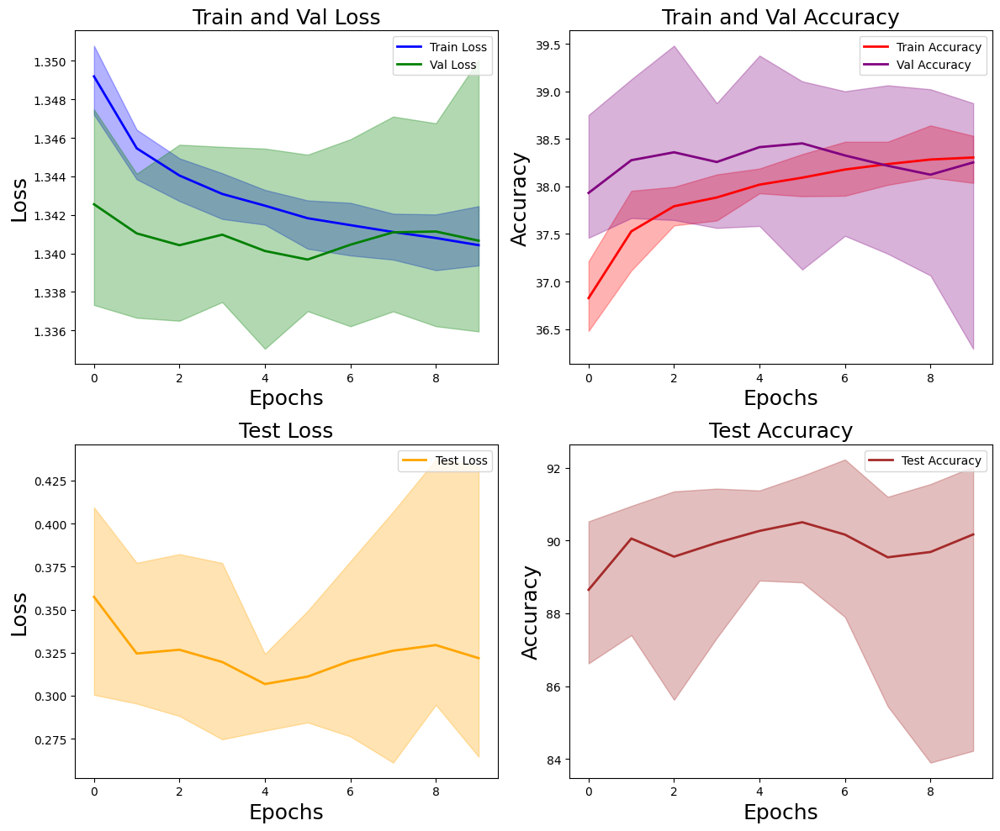

Data saved to forward_f6_mlp.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=0.0005,
    batch_size=32,
    num_epochs=10,
    times=10,
    method='forward',
    T_matrix=T_matrix,
    model_name='mlp',
    csv_path='forward_f6_mlp.csv'
)

mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.76it/s]


Noisy Loss: 1.3666,Validation Loss: 0.2135, Accuracy: 36.88% (1770/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.79it/s]


Test Loss: 0.3358, Accuracy: 88.85% (3554/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.45it/s] 


Noisy Loss: 1.3659,Validation Loss: 0.2312, Accuracy: 37.54% (1802/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 80.32it/s] 


Test Loss: 0.3036, Accuracy: 90.38% (3615/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.29it/s] 


Noisy Loss: 1.3657,Validation Loss: 0.2032, Accuracy: 37.58% (1804/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.43it/s]


Test Loss: 0.2744, Accuracy: 91.47% (3659/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.36it/s] 


Noisy Loss: 1.3659,Validation Loss: 0.2054, Accuracy: 37.62% (1806/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.27it/s]


Test Loss: 0.3047, Accuracy: 90.10% (3604/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.40it/s] 


Noisy Loss: 1.3656,Validation Loss: 0.1757, Accuracy: 37.67% (1808/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.26it/s]


Test Loss: 0.2798, Accuracy: 92.08% (3683/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.14it/s] 


Noisy Loss: 1.3658,Validation Loss: 0.1861, Accuracy: 37.29% (1790/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.48it/s]


Test Loss: 0.3403, Accuracy: 90.25% (3610/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.28it/s]


Noisy Loss: 1.3655,Validation Loss: 0.1648, Accuracy: 37.46% (1798/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.07it/s]


Test Loss: 0.3019, Accuracy: 91.67% (3667/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.05it/s] 


Noisy Loss: 1.3656,Validation Loss: 0.1756, Accuracy: 37.44% (1797/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.03it/s]


Test Loss: 0.3013, Accuracy: 91.10% (3644/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.62it/s] 


Noisy Loss: 1.3661,Validation Loss: 0.2012, Accuracy: 37.29% (1790/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.47it/s]


Test Loss: 0.3527, Accuracy: 89.12% (3565/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.03it/s] 


Noisy Loss: 1.3661,Validation Loss: 0.1957, Accuracy: 37.27% (1789/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.43it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.4075, Accuracy: 88.55% (3542/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.37it/s]


Test Loss: 0.3019, Accuracy: 91.67% (3667/4000)
finished  1  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.74it/s]


Noisy Loss: 1.3672,Validation Loss: 0.2892, Accuracy: 37.06% (1779/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.54it/s]


Test Loss: 0.3784, Accuracy: 88.55% (3542/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.25it/s] 


Noisy Loss: 1.3662,Validation Loss: 0.2504, Accuracy: 37.65% (1807/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.31it/s]


Test Loss: 0.3279, Accuracy: 90.12% (3605/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.78it/s] 


Noisy Loss: 1.3668,Validation Loss: 0.2433, Accuracy: 37.40% (1795/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.83it/s]


Test Loss: 0.4030, Accuracy: 87.90% (3516/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.68it/s] 


Noisy Loss: 1.3664,Validation Loss: 0.2490, Accuracy: 37.27% (1789/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.93it/s]


Test Loss: 0.3419, Accuracy: 90.05% (3602/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.81it/s] 


Noisy Loss: 1.3656,Validation Loss: 0.1986, Accuracy: 37.58% (1804/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.74it/s]


Test Loss: 0.2961, Accuracy: 90.10% (3604/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.21it/s]


Noisy Loss: 1.3658,Validation Loss: 0.1905, Accuracy: 37.58% (1804/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.10it/s]


Test Loss: 0.3410, Accuracy: 90.38% (3615/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.32it/s] 


Noisy Loss: 1.3663,Validation Loss: 0.1964, Accuracy: 37.15% (1783/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.36it/s]


Test Loss: 0.3696, Accuracy: 90.33% (3613/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.21it/s]


Noisy Loss: 1.3668,Validation Loss: 0.2299, Accuracy: 37.17% (1784/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.83it/s]


Test Loss: 0.4034, Accuracy: 88.78% (3551/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.50it/s] 


Noisy Loss: 1.3659,Validation Loss: 0.1936, Accuracy: 37.62% (1806/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.50it/s]


Test Loss: 0.3298, Accuracy: 91.40% (3656/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.60it/s]


Noisy Loss: 1.3657,Validation Loss: 0.1673, Accuracy: 37.69% (1809/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.31it/s]


Test Loss: 0.3264, Accuracy: 91.42% (3657/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.55it/s]


Test Loss: 0.3264, Accuracy: 91.42% (3657/4000)
finished  2  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.41it/s] 


Noisy Loss: 1.3667,Validation Loss: 0.3147, Accuracy: 37.60% (1805/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.32it/s]


Test Loss: 0.3257, Accuracy: 89.85% (3594/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.20it/s] 


Noisy Loss: 1.3658,Validation Loss: 0.2866, Accuracy: 37.71% (1810/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.06it/s]


Test Loss: 0.3436, Accuracy: 89.97% (3599/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.62it/s] 


Noisy Loss: 1.3660,Validation Loss: 0.2189, Accuracy: 37.33% (1792/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.76it/s]


Test Loss: 0.3765, Accuracy: 88.53% (3541/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.47it/s] 


Noisy Loss: 1.3652,Validation Loss: 0.1802, Accuracy: 37.62% (1806/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.87it/s]


Test Loss: 0.3470, Accuracy: 90.42% (3617/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.65it/s]


Noisy Loss: 1.3653,Validation Loss: 0.2341, Accuracy: 37.94% (1821/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.81it/s]


Test Loss: 0.3265, Accuracy: 90.85% (3634/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.43it/s] 


Noisy Loss: 1.3655,Validation Loss: 0.1919, Accuracy: 37.38% (1794/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.09it/s]


Test Loss: 0.3290, Accuracy: 90.12% (3605/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.99it/s]


Noisy Loss: 1.3652,Validation Loss: 0.1602, Accuracy: 37.58% (1804/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.60it/s]


Test Loss: 0.3431, Accuracy: 90.45% (3618/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.33it/s] 


Noisy Loss: 1.3653,Validation Loss: 0.2032, Accuracy: 37.77% (1813/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.05it/s]


Test Loss: 0.3297, Accuracy: 90.72% (3629/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 79.01it/s] 


Noisy Loss: 1.3657,Validation Loss: 0.1897, Accuracy: 37.29% (1790/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.74it/s]


Test Loss: 0.3688, Accuracy: 88.78% (3551/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.81it/s]


Noisy Loss: 1.3652,Validation Loss: 0.1953, Accuracy: 37.81% (1815/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.93it/s]


Test Loss: 0.3383, Accuracy: 90.33% (3613/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.03it/s]


Test Loss: 0.3431, Accuracy: 90.45% (3618/4000)
finished  3  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.32it/s] 


Noisy Loss: 1.3682,Validation Loss: 0.2601, Accuracy: 36.29% (1742/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.11it/s]


Test Loss: 0.3112, Accuracy: 89.92% (3597/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.43it/s]


Noisy Loss: 1.3679,Validation Loss: 0.2078, Accuracy: 36.25% (1740/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.60it/s]


Test Loss: 0.3439, Accuracy: 89.55% (3582/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.33it/s] 


Noisy Loss: 1.3677,Validation Loss: 0.2058, Accuracy: 36.46% (1750/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.38it/s]


Test Loss: 0.3130, Accuracy: 90.08% (3603/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.01it/s] 


Noisy Loss: 1.3670,Validation Loss: 0.1750, Accuracy: 36.73% (1763/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.75it/s]


Test Loss: 0.3277, Accuracy: 90.47% (3619/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.55it/s]


Noisy Loss: 1.3676,Validation Loss: 0.1822, Accuracy: 36.50% (1752/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.57it/s]


Test Loss: 0.3432, Accuracy: 89.67% (3587/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.61it/s] 


Noisy Loss: 1.3677,Validation Loss: 0.2360, Accuracy: 36.46% (1750/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.25it/s]


Test Loss: 0.3178, Accuracy: 90.42% (3617/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.82it/s] 


Noisy Loss: 1.3675,Validation Loss: 0.2296, Accuracy: 36.38% (1746/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.64it/s]


Test Loss: 0.3249, Accuracy: 90.45% (3618/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.02it/s] 


Noisy Loss: 1.3671,Validation Loss: 0.1689, Accuracy: 36.50% (1752/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.81it/s]


Test Loss: 0.3144, Accuracy: 90.50% (3620/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.90it/s] 


Noisy Loss: 1.3668,Validation Loss: 0.1641, Accuracy: 36.85% (1769/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.38it/s]


Test Loss: 0.3179, Accuracy: 90.88% (3635/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.60it/s] 


Noisy Loss: 1.3670,Validation Loss: 0.1579, Accuracy: 36.79% (1766/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.21it/s]


Test Loss: 0.3238, Accuracy: 91.78% (3671/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.43it/s]


Test Loss: 0.3238, Accuracy: 91.78% (3671/4000)
finished  4  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.43it/s] 


Noisy Loss: 1.3673,Validation Loss: 0.2974, Accuracy: 36.85% (1769/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.24it/s]


Test Loss: 0.3695, Accuracy: 88.00% (3520/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.71it/s] 


Noisy Loss: 1.3662,Validation Loss: 0.2341, Accuracy: 37.44% (1797/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.45it/s]


Test Loss: 0.2990, Accuracy: 89.75% (3590/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.66it/s] 


Noisy Loss: 1.3664,Validation Loss: 0.2013, Accuracy: 36.98% (1775/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.37it/s]


Test Loss: 0.3768, Accuracy: 90.17% (3607/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.67it/s] 


Noisy Loss: 1.3661,Validation Loss: 0.2087, Accuracy: 37.27% (1789/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.76it/s]


Test Loss: 0.2929, Accuracy: 91.00% (3640/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.00it/s] 


Noisy Loss: 1.3660,Validation Loss: 0.1858, Accuracy: 37.00% (1776/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.20it/s]


Test Loss: 0.2940, Accuracy: 90.72% (3629/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.63it/s] 


Noisy Loss: 1.3669,Validation Loss: 0.2451, Accuracy: 37.00% (1776/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.13it/s]


Test Loss: 0.3749, Accuracy: 88.15% (3526/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.76it/s] 


Noisy Loss: 1.3659,Validation Loss: 0.1855, Accuracy: 37.46% (1798/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.37it/s]


Test Loss: 0.3052, Accuracy: 91.20% (3648/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.25it/s] 


Noisy Loss: 1.3658,Validation Loss: 0.1824, Accuracy: 37.23% (1787/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.14it/s]


Test Loss: 0.2852, Accuracy: 91.38% (3655/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.62it/s] 


Noisy Loss: 1.3662,Validation Loss: 0.1937, Accuracy: 37.27% (1789/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.61it/s]


Test Loss: 0.3220, Accuracy: 90.45% (3618/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.85it/s] 


Noisy Loss: 1.3664,Validation Loss: 0.1783, Accuracy: 37.10% (1781/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.93it/s]


Test Loss: 0.3826, Accuracy: 89.60% (3584/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.03it/s]


Test Loss: 0.3826, Accuracy: 89.60% (3584/4000)
finished  5  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.00it/s] 


Noisy Loss: 1.3676,Validation Loss: 0.2762, Accuracy: 36.77% (1765/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.35it/s]


Test Loss: 0.3662, Accuracy: 88.72% (3549/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.37it/s] 


Noisy Loss: 1.3666,Validation Loss: 0.2299, Accuracy: 36.92% (1772/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.79it/s]


Test Loss: 0.3187, Accuracy: 89.28% (3571/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.24it/s]


Noisy Loss: 1.3663,Validation Loss: 0.1985, Accuracy: 37.40% (1795/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.27it/s]


Test Loss: 0.2930, Accuracy: 90.85% (3634/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.25it/s] 


Noisy Loss: 1.3666,Validation Loss: 0.2052, Accuracy: 37.12% (1782/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.66it/s]


Test Loss: 0.3145, Accuracy: 90.35% (3614/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.92it/s]


Noisy Loss: 1.3661,Validation Loss: 0.2098, Accuracy: 37.25% (1788/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.76it/s]


Test Loss: 0.2736, Accuracy: 90.78% (3631/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.54it/s] 


Noisy Loss: 1.3669,Validation Loss: 0.2028, Accuracy: 36.83% (1768/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.10it/s]


Test Loss: 0.4056, Accuracy: 87.85% (3514/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.10it/s] 


Noisy Loss: 1.3661,Validation Loss: 0.1923, Accuracy: 37.10% (1781/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.39it/s]


Test Loss: 0.3584, Accuracy: 89.05% (3562/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.26it/s] 


Noisy Loss: 1.3664,Validation Loss: 0.1948, Accuracy: 37.25% (1788/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.39it/s]


Test Loss: 0.3774, Accuracy: 89.17% (3567/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.26it/s] 


Noisy Loss: 1.3668,Validation Loss: 0.2193, Accuracy: 36.90% (1771/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.09it/s]


Test Loss: 0.4112, Accuracy: 88.20% (3528/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.52it/s]


Noisy Loss: 1.3656,Validation Loss: 0.1677, Accuracy: 37.40% (1795/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.63it/s]


Test Loss: 0.2846, Accuracy: 91.47% (3659/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.73it/s]


Test Loss: 0.2846, Accuracy: 91.47% (3659/4000)
finished  6  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.51it/s] 


Noisy Loss: 1.3657,Validation Loss: 0.3828, Accuracy: 38.31% (1839/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.82it/s]


Test Loss: 0.3273, Accuracy: 89.78% (3591/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.44it/s] 


Noisy Loss: 1.3646,Validation Loss: 0.2252, Accuracy: 38.23% (1835/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.77it/s]


Test Loss: 0.3154, Accuracy: 90.28% (3611/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.44it/s] 


Noisy Loss: 1.3651,Validation Loss: 0.2582, Accuracy: 38.27% (1837/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.81it/s]


Test Loss: 0.3567, Accuracy: 88.15% (3526/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.59it/s] 


Noisy Loss: 1.3656,Validation Loss: 0.2249, Accuracy: 37.73% (1811/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.38it/s]


Test Loss: 0.3592, Accuracy: 87.80% (3512/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.52it/s]


Noisy Loss: 1.3652,Validation Loss: 0.2630, Accuracy: 38.00% (1824/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.60it/s]


Test Loss: 0.3640, Accuracy: 88.08% (3523/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.43it/s] 


Noisy Loss: 1.3645,Validation Loss: 0.1957, Accuracy: 38.27% (1837/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.16it/s]


Test Loss: 0.3417, Accuracy: 88.88% (3555/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.10it/s]


Noisy Loss: 1.3642,Validation Loss: 0.1902, Accuracy: 38.38% (1842/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.04it/s]


Test Loss: 0.3383, Accuracy: 89.67% (3587/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.35it/s] 


Noisy Loss: 1.3643,Validation Loss: 0.1777, Accuracy: 38.46% (1846/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.45it/s]


Test Loss: 0.3416, Accuracy: 90.15% (3606/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.93it/s] 


Noisy Loss: 1.3642,Validation Loss: 0.1818, Accuracy: 38.15% (1831/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.53it/s]


Test Loss: 0.3374, Accuracy: 89.83% (3593/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.79it/s]


Noisy Loss: 1.3643,Validation Loss: 0.2023, Accuracy: 38.35% (1841/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.59it/s]


Test Loss: 0.3204, Accuracy: 90.28% (3611/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.42it/s]


Test Loss: 0.3416, Accuracy: 90.15% (3606/4000)
finished  7  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.93it/s] 


Noisy Loss: 1.3656,Validation Loss: 0.2926, Accuracy: 37.98% (1823/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.98it/s]


Test Loss: 0.3572, Accuracy: 89.05% (3562/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.33it/s] 


Noisy Loss: 1.3666,Validation Loss: 0.3865, Accuracy: 38.25% (1836/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.63it/s]


Test Loss: 0.4011, Accuracy: 87.38% (3495/4000)


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.27it/s] 


Noisy Loss: 1.3637,Validation Loss: 0.1865, Accuracy: 38.67% (1856/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.50it/s]


Test Loss: 0.2832, Accuracy: 91.38% (3655/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.38it/s] 


Noisy Loss: 1.3653,Validation Loss: 0.2702, Accuracy: 38.06% (1827/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.63it/s]


Test Loss: 0.3190, Accuracy: 90.08% (3603/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.49it/s] 


Noisy Loss: 1.3648,Validation Loss: 0.2550, Accuracy: 38.42% (1844/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.88it/s]


Test Loss: 0.2957, Accuracy: 90.00% (3600/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.95it/s] 


Noisy Loss: 1.3644,Validation Loss: 0.2322, Accuracy: 38.42% (1844/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.13it/s]


Test Loss: 0.2919, Accuracy: 91.40% (3656/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.33it/s] 


Noisy Loss: 1.3645,Validation Loss: 0.2046, Accuracy: 38.29% (1838/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.14it/s]


Test Loss: 0.3225, Accuracy: 89.55% (3582/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.06it/s] 


Noisy Loss: 1.3642,Validation Loss: 0.1912, Accuracy: 38.65% (1855/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.52it/s]


Test Loss: 0.3217, Accuracy: 90.50% (3620/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.18it/s] 


Noisy Loss: 1.3639,Validation Loss: 0.1662, Accuracy: 38.19% (1833/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.13it/s]


Test Loss: 0.3394, Accuracy: 90.65% (3626/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.86it/s] 


Noisy Loss: 1.3650,Validation Loss: 0.2099, Accuracy: 37.94% (1821/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.16it/s]


Test Loss: 0.3568, Accuracy: 89.40% (3576/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.90it/s]


Test Loss: 0.3394, Accuracy: 90.65% (3626/4000)
finished  8  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.35it/s] 


Noisy Loss: 1.3679,Validation Loss: 0.3189, Accuracy: 36.60% (1757/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.73it/s]


Test Loss: 0.4117, Accuracy: 86.03% (3441/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.80it/s] 


Noisy Loss: 1.3673,Validation Loss: 0.3037, Accuracy: 36.67% (1760/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.80it/s]


Test Loss: 0.3458, Accuracy: 89.03% (3561/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.25it/s] 


Noisy Loss: 1.3658,Validation Loss: 0.2103, Accuracy: 37.69% (1809/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.49it/s]


Test Loss: 0.3302, Accuracy: 89.75% (3590/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.94it/s] 


Noisy Loss: 1.3658,Validation Loss: 0.1941, Accuracy: 37.52% (1801/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.74it/s]


Test Loss: 0.3359, Accuracy: 89.90% (3596/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.44it/s]


Noisy Loss: 1.3655,Validation Loss: 0.2227, Accuracy: 37.83% (1816/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.58it/s]


Test Loss: 0.2942, Accuracy: 91.28% (3651/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.23it/s] 


Noisy Loss: 1.3655,Validation Loss: 0.1834, Accuracy: 37.69% (1809/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.17it/s]


Test Loss: 0.2864, Accuracy: 91.67% (3667/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.82it/s] 


Noisy Loss: 1.3655,Validation Loss: 0.1927, Accuracy: 37.75% (1812/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.92it/s]


Test Loss: 0.3136, Accuracy: 90.70% (3628/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.21it/s] 


Noisy Loss: 1.3665,Validation Loss: 0.2268, Accuracy: 37.35% (1793/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.67it/s]


Test Loss: 0.3302, Accuracy: 91.10% (3644/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.35it/s]


Noisy Loss: 1.3654,Validation Loss: 0.1740, Accuracy: 37.62% (1806/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.14it/s]


Test Loss: 0.2854, Accuracy: 91.72% (3669/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.62it/s]


Noisy Loss: 1.3653,Validation Loss: 0.1798, Accuracy: 37.67% (1808/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.44it/s]


Test Loss: 0.2727, Accuracy: 92.17% (3687/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.06it/s]


Test Loss: 0.2854, Accuracy: 91.72% (3669/4000)
finished  9  epoch
mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.92it/s]


Noisy Loss: 1.3643,Validation Loss: 0.3159, Accuracy: 38.81% (1863/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.89it/s]


Test Loss: 0.3200, Accuracy: 90.12% (3605/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.66it/s] 


Noisy Loss: 1.3644,Validation Loss: 0.2800, Accuracy: 38.69% (1857/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.68it/s]


Test Loss: 0.3589, Accuracy: 87.62% (3505/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.03it/s] 


Noisy Loss: 1.3627,Validation Loss: 0.1915, Accuracy: 39.23% (1883/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.68it/s]


Test Loss: 0.2717, Accuracy: 91.85% (3674/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.37it/s] 


Noisy Loss: 1.3635,Validation Loss: 0.2264, Accuracy: 38.67% (1856/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.04it/s]


Test Loss: 0.3004, Accuracy: 90.45% (3618/4000)


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.29it/s] 


Noisy Loss: 1.3632,Validation Loss: 0.2077, Accuracy: 38.88% (1866/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.87it/s]


Test Loss: 0.2604, Accuracy: 92.10% (3684/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.39it/s] 


Noisy Loss: 1.3629,Validation Loss: 0.1976, Accuracy: 39.19% (1881/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 143.76it/s]


Test Loss: 0.3286, Accuracy: 90.60% (3624/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.97it/s] 


Noisy Loss: 1.3635,Validation Loss: 0.1715, Accuracy: 38.54% (1850/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.32it/s]


Test Loss: 0.3431, Accuracy: 89.22% (3569/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.10it/s] 


Noisy Loss: 1.3630,Validation Loss: 0.1975, Accuracy: 39.10% (1877/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.06it/s]


Test Loss: 0.3043, Accuracy: 90.92% (3637/4000)


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.86it/s] 


Noisy Loss: 1.3637,Validation Loss: 0.2040, Accuracy: 38.52% (1849/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.00it/s]


Test Loss: 0.2924, Accuracy: 91.12% (3645/4000)


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.92it/s] 


Noisy Loss: 1.3633,Validation Loss: 0.2135, Accuracy: 38.88% (1866/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.84it/s]


Test Loss: 0.2984, Accuracy: 90.45% (3618/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 146.86it/s]


Test Loss: 0.3431, Accuracy: 89.22% (3569/4000)
finished  10  epoch
min_train_loss [0.2242390962007145, 0.1791368695224325, 0.1952583952868978, 0.1995158757517735, 0.18502944917728503, 0.19690886395672957, 0.24322315222894153, 0.2296048572845757, 0.22471748132879535, 0.25232133207842705]
min_val_loss [0.16481138929724692, 0.16733069529136022, 0.1602296823511521, 0.15789932092030842, 0.1782516956826051, 0.1676510622104009, 0.17770098716020585, 0.1661767056087653, 0.17396749553581078, 0.17148386833568413]
min_train_accuracy [38.682291666666664, 38.885416666666664, 38.604166666666664, 38.916666666666664, 38.817708333333336, 38.703125, 38.083333333333336, 38.760416666666664, 38.427083333333336, 38.166666666666664]
min_val_accuracy [37.458333333333336, 37.6875, 37.583333333333336, 36.791666666666664, 37.104166666666664, 37.395833333333336, 38.458333333333336, 38.1875, 37.625, 38.541666666666664]
min_train_noise_loss [1.3637395777304968, 1.3630830965439478, 1.36385169506073, 1.36308981577555

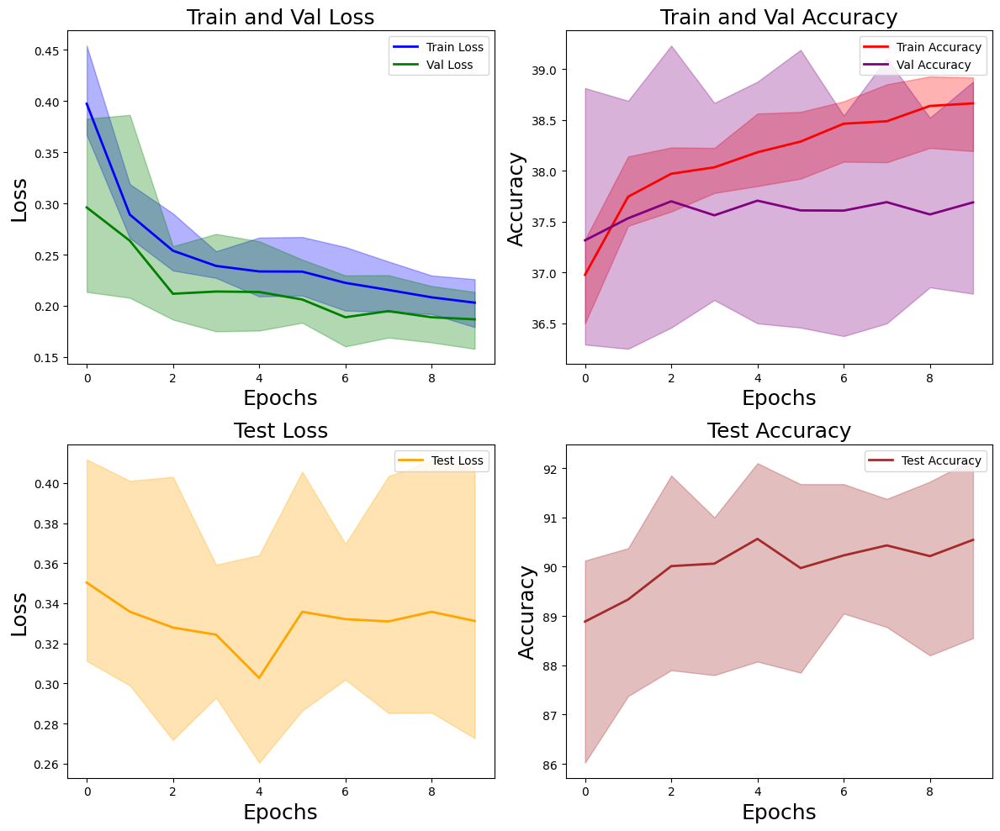

Data saved to importance_f6_mlp.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=0.0005,
    batch_size=32,
    num_epochs=10,
    times=10,
    method='importance',
    T_matrix=T_matrix,
    model_name='mlp',
    csv_path="importance_f6_mlp.csv"
)

mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.19it/s] 


Noisy Loss: 1.3670,Validation Loss: 0.2814, Accuracy: 37.23% (1787/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.80it/s]


Test Loss: 0.3268, Accuracy: 89.58% (3583/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 70.99it/s]


Noisy Loss: 1.3658,Validation Loss: 0.2010, Accuracy: 37.42% (1796/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.47it/s]


Test Loss: 0.2940, Accuracy: 91.90% (3676/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.58it/s]


Noisy Loss: 1.3664,Validation Loss: 0.2123, Accuracy: 37.31% (1791/4800)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.62it/s]


Test Loss: 0.3514, Accuracy: 89.65% (3586/4000)


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.37it/s] 


Noisy Loss: 1.3658,Validation Loss: 0.1737, Accuracy: 37.31% (1791/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 145.77it/s]


Test Loss: 0.3156, Accuracy: 91.10% (3644/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.85it/s]


Noisy Loss: 1.3661,Validation Loss: 0.1953, Accuracy: 37.31% (1791/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.98it/s]


Test Loss: 0.3205, Accuracy: 91.38% (3655/4000)


Epoch 6 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.42it/s] 


Noisy Loss: 1.3656,Validation Loss: 0.1723, Accuracy: 37.42% (1796/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.62it/s]


Test Loss: 0.3861, Accuracy: 90.10% (3604/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.42it/s] 


Noisy Loss: 1.3662,Validation Loss: 0.1672, Accuracy: 37.08% (1780/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.76it/s]


Test Loss: 0.3398, Accuracy: 90.15% (3606/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.91it/s] 


Noisy Loss: 1.3656,Validation Loss: 0.1663, Accuracy: 37.50% (1800/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.06it/s]


Test Loss: 0.3128, Accuracy: 91.45% (3658/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:01<00:00, 78.29it/s] 


Noisy Loss: 1.3656,Validation Loss: 0.1311, Accuracy: 37.27% (1789/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 149.08it/s]


Test Loss: 0.3321, Accuracy: 91.62% (3665/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:02<00:00, 74.09it/s] 


Noisy Loss: 1.3662,Validation Loss: 0.1767, Accuracy: 37.21% (1786/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.13it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.3572, Accuracy: 90.17% (3607/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 148.25it/s]


Test Loss: 0.3321, Accuracy: 91.62% (3665/4000)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.57it/s]


Noisy Loss: 1.3816,Validation Loss: 0.1401, Accuracy: 28.81% (1383/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.75it/s]


Test Loss: 0.3163, Accuracy: 91.53% (3661/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.60it/s]


Noisy Loss: 1.3816,Validation Loss: 0.1401, Accuracy: 28.88% (1386/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.24it/s]


Test Loss: 0.3171, Accuracy: 91.47% (3659/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.43it/s]


Noisy Loss: 1.3816,Validation Loss: 0.1383, Accuracy: 28.88% (1386/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.18it/s]


Test Loss: 0.3153, Accuracy: 91.60% (3664/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.27it/s]


Noisy Loss: 1.3815,Validation Loss: 0.1381, Accuracy: 28.83% (1384/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.01it/s]


Test Loss: 0.3138, Accuracy: 91.62% (3665/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.78it/s]


Noisy Loss: 1.3817,Validation Loss: 0.1366, Accuracy: 28.77% (1381/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.11it/s]


Test Loss: 0.3239, Accuracy: 91.60% (3664/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.82it/s]


Test Loss: 0.3239, Accuracy: 91.60% (3664/4000)
finished  1  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.53it/s]


Noisy Loss: 1.3824,Validation Loss: 0.1415, Accuracy: 28.56% (1371/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.49it/s]


Test Loss: 0.3238, Accuracy: 91.62% (3665/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.48it/s]


Noisy Loss: 1.3823,Validation Loss: 0.1405, Accuracy: 28.58% (1372/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.45it/s]


Test Loss: 0.3163, Accuracy: 91.60% (3664/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.50it/s]


Noisy Loss: 1.3823,Validation Loss: 0.1401, Accuracy: 28.58% (1372/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.47it/s]


Test Loss: 0.3174, Accuracy: 91.65% (3666/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.19it/s]


Noisy Loss: 1.3824,Validation Loss: 0.1399, Accuracy: 28.62% (1374/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.81it/s]


Test Loss: 0.3222, Accuracy: 91.58% (3663/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.55it/s]


Noisy Loss: 1.3824,Validation Loss: 0.1375, Accuracy: 28.58% (1372/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.74it/s]


Test Loss: 0.3197, Accuracy: 91.60% (3664/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.48it/s]


Test Loss: 0.3197, Accuracy: 91.60% (3664/4000)
finished  2  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.73it/s]


Noisy Loss: 1.3814,Validation Loss: 0.1365, Accuracy: 29.08% (1396/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.28it/s]


Test Loss: 0.3171, Accuracy: 91.58% (3663/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.46it/s]


Noisy Loss: 1.3814,Validation Loss: 0.1361, Accuracy: 29.08% (1396/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.30it/s]


Test Loss: 0.3165, Accuracy: 91.62% (3665/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.24it/s]


Noisy Loss: 1.3814,Validation Loss: 0.1351, Accuracy: 29.04% (1394/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.34it/s]


Test Loss: 0.3193, Accuracy: 91.60% (3664/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.42it/s]


Noisy Loss: 1.3814,Validation Loss: 0.1340, Accuracy: 29.00% (1392/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.65it/s]


Test Loss: 0.3147, Accuracy: 91.70% (3668/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.59it/s]


Noisy Loss: 1.3814,Validation Loss: 0.1336, Accuracy: 29.06% (1395/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.48it/s]


Test Loss: 0.3192, Accuracy: 91.55% (3662/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.00it/s]


Test Loss: 0.3192, Accuracy: 91.55% (3662/4000)
finished  3  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.54it/s]


Noisy Loss: 1.3796,Validation Loss: 0.1363, Accuracy: 30.42% (1460/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.95it/s]


Test Loss: 0.3193, Accuracy: 91.58% (3663/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.39it/s]


Noisy Loss: 1.3796,Validation Loss: 0.1336, Accuracy: 30.29% (1454/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.73it/s]


Test Loss: 0.3278, Accuracy: 91.50% (3660/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.70it/s]


Noisy Loss: 1.3796,Validation Loss: 0.1354, Accuracy: 30.35% (1457/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.76it/s]


Test Loss: 0.3187, Accuracy: 91.62% (3665/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.66it/s]


Noisy Loss: 1.3796,Validation Loss: 0.1337, Accuracy: 30.42% (1460/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.44it/s]


Test Loss: 0.3223, Accuracy: 91.58% (3663/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.47it/s]


Noisy Loss: 1.3796,Validation Loss: 0.1341, Accuracy: 30.33% (1456/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.30it/s]


Test Loss: 0.3175, Accuracy: 91.65% (3666/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.39it/s]


Test Loss: 0.3278, Accuracy: 91.50% (3660/4000)
finished  4  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.66it/s]


Noisy Loss: 1.3805,Validation Loss: 0.1328, Accuracy: 29.94% (1437/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.60it/s]


Test Loss: 0.3241, Accuracy: 91.58% (3663/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.55it/s]


Noisy Loss: 1.3805,Validation Loss: 0.1320, Accuracy: 29.90% (1435/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.31it/s]


Test Loss: 0.3255, Accuracy: 91.65% (3666/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.58it/s]


Noisy Loss: 1.3804,Validation Loss: 0.1308, Accuracy: 30.00% (1440/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.68it/s]


Test Loss: 0.3249, Accuracy: 91.62% (3665/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.81it/s]


Noisy Loss: 1.3805,Validation Loss: 0.1321, Accuracy: 29.98% (1439/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.10it/s]


Test Loss: 0.3215, Accuracy: 91.60% (3664/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.11it/s]


Noisy Loss: 1.3805,Validation Loss: 0.1285, Accuracy: 29.92% (1436/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.53it/s]


Test Loss: 0.3243, Accuracy: 91.65% (3666/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.61it/s]


Test Loss: 0.3243, Accuracy: 91.65% (3666/4000)
finished  5  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.64it/s]


Noisy Loss: 1.3811,Validation Loss: 0.1294, Accuracy: 28.83% (1384/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.68it/s]


Test Loss: 0.3265, Accuracy: 91.62% (3665/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.71it/s]


Noisy Loss: 1.3812,Validation Loss: 0.1289, Accuracy: 28.77% (1381/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.64it/s]


Test Loss: 0.3285, Accuracy: 91.58% (3663/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.68it/s]


Noisy Loss: 1.3811,Validation Loss: 0.1286, Accuracy: 28.85% (1385/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.01it/s]


Test Loss: 0.3233, Accuracy: 91.75% (3670/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.73it/s]


Noisy Loss: 1.3811,Validation Loss: 0.1297, Accuracy: 28.83% (1384/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.48it/s]


Test Loss: 0.3224, Accuracy: 91.65% (3666/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.35it/s]


Noisy Loss: 1.3811,Validation Loss: 0.1276, Accuracy: 28.88% (1386/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.36it/s]


Test Loss: 0.3286, Accuracy: 91.65% (3666/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.41it/s]


Test Loss: 0.3286, Accuracy: 91.65% (3666/4000)
finished  6  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.86it/s]


Noisy Loss: 1.3824,Validation Loss: 0.1328, Accuracy: 28.96% (1390/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.64it/s]


Test Loss: 0.3226, Accuracy: 91.70% (3668/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.75it/s]


Noisy Loss: 1.3824,Validation Loss: 0.1302, Accuracy: 28.92% (1388/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.37it/s]


Test Loss: 0.3276, Accuracy: 91.67% (3667/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.48it/s]


Noisy Loss: 1.3825,Validation Loss: 0.1309, Accuracy: 28.85% (1385/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.92it/s]


Test Loss: 0.3279, Accuracy: 91.65% (3666/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.76it/s]


Noisy Loss: 1.3825,Validation Loss: 0.1321, Accuracy: 28.90% (1387/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.70it/s]


Test Loss: 0.3226, Accuracy: 91.67% (3667/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.72it/s]


Noisy Loss: 1.3824,Validation Loss: 0.1306, Accuracy: 28.90% (1387/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.03it/s]


Test Loss: 0.3251, Accuracy: 91.70% (3668/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.64it/s]


Test Loss: 0.3276, Accuracy: 91.67% (3667/4000)
finished  7  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.85it/s]


Noisy Loss: 1.3814,Validation Loss: 0.1251, Accuracy: 29.25% (1404/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.81it/s]


Test Loss: 0.3242, Accuracy: 91.70% (3668/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.47it/s]


Noisy Loss: 1.3815,Validation Loss: 0.1241, Accuracy: 29.12% (1398/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.89it/s]


Test Loss: 0.3256, Accuracy: 91.65% (3666/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.27it/s]


Noisy Loss: 1.3814,Validation Loss: 0.1251, Accuracy: 29.27% (1405/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.98it/s]


Test Loss: 0.3221, Accuracy: 91.67% (3667/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.39it/s]


Noisy Loss: 1.3814,Validation Loss: 0.1236, Accuracy: 29.27% (1405/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.77it/s]


Test Loss: 0.3233, Accuracy: 91.80% (3672/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.68it/s]


Noisy Loss: 1.3814,Validation Loss: 0.1244, Accuracy: 29.25% (1404/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.53it/s]


Test Loss: 0.3220, Accuracy: 91.75% (3670/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.35it/s]


Test Loss: 0.3233, Accuracy: 91.80% (3672/4000)
finished  8  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.53it/s]


Noisy Loss: 1.3800,Validation Loss: 0.1273, Accuracy: 30.23% (1451/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.52it/s]


Test Loss: 0.3231, Accuracy: 91.70% (3668/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.26it/s]


Noisy Loss: 1.3799,Validation Loss: 0.1256, Accuracy: 30.27% (1453/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.05it/s]


Test Loss: 0.3295, Accuracy: 91.75% (3670/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.07it/s]


Noisy Loss: 1.3799,Validation Loss: 0.1263, Accuracy: 30.33% (1456/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.46it/s]


Test Loss: 0.3244, Accuracy: 91.75% (3670/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.61it/s]


Noisy Loss: 1.3799,Validation Loss: 0.1259, Accuracy: 30.29% (1454/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.96it/s]


Test Loss: 0.3257, Accuracy: 91.75% (3670/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.35it/s]


Noisy Loss: 1.3800,Validation Loss: 0.1247, Accuracy: 30.21% (1450/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 21.07it/s]


Test Loss: 0.3272, Accuracy: 91.70% (3668/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.44it/s]


Test Loss: 0.3272, Accuracy: 91.70% (3668/4000)
finished  9  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.32it/s]


Noisy Loss: 1.3798,Validation Loss: 0.1202, Accuracy: 30.17% (1448/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.03it/s]


Test Loss: 0.3328, Accuracy: 91.65% (3666/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.84it/s]


Noisy Loss: 1.3797,Validation Loss: 0.1195, Accuracy: 30.19% (1449/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.73it/s]


Test Loss: 0.3391, Accuracy: 91.50% (3660/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.61it/s]


Noisy Loss: 1.3797,Validation Loss: 0.1195, Accuracy: 30.19% (1449/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.94it/s]


Test Loss: 0.3364, Accuracy: 91.62% (3665/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.68it/s]


Noisy Loss: 1.3797,Validation Loss: 0.1190, Accuracy: 30.17% (1448/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.77it/s]


Test Loss: 0.3328, Accuracy: 91.62% (3665/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.73it/s]


Noisy Loss: 1.3797,Validation Loss: 0.1177, Accuracy: 30.17% (1448/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.04it/s]


Test Loss: 0.3395, Accuracy: 91.55% (3662/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.18it/s]


Test Loss: 0.3395, Accuracy: 91.55% (3662/4000)
finished  10  epoch
min_train_loss [0.1571348324418068, 0.14868027925491334, 0.14517018208901086, 0.1436170749862989, 0.14044139117002488, 0.13762570371230443, 0.1369616600871086, 0.13467354665199915, 0.13176728636026383, 0.12855124086141587]
min_val_loss [0.13658230908607183, 0.13748996234253832, 0.1335631028601998, 0.133618837124423, 0.12850796431303024, 0.12762248712150673, 0.13018920194161565, 0.12357335576885625, 0.12473024427890778, 0.11770360485503548]
min_train_accuracy [29.6875, 29.661458333333332, 29.661458333333332, 29.182291666666668, 29.322916666666668, 29.651041666666668, 29.635416666666668, 29.46875, 29.125, 29.28125]
min_val_accuracy [28.770833333333332, 28.583333333333332, 29.0625, 30.291666666666668, 29.916666666666668, 28.875, 28.916666666666668, 29.270833333333332, 30.208333333333332, 30.166666666666668]
min_train_noise_loss [1.381037138303121, 1.380831111272176, 1.3810073550542195, 1.3815236028035482, 1.38136017004648

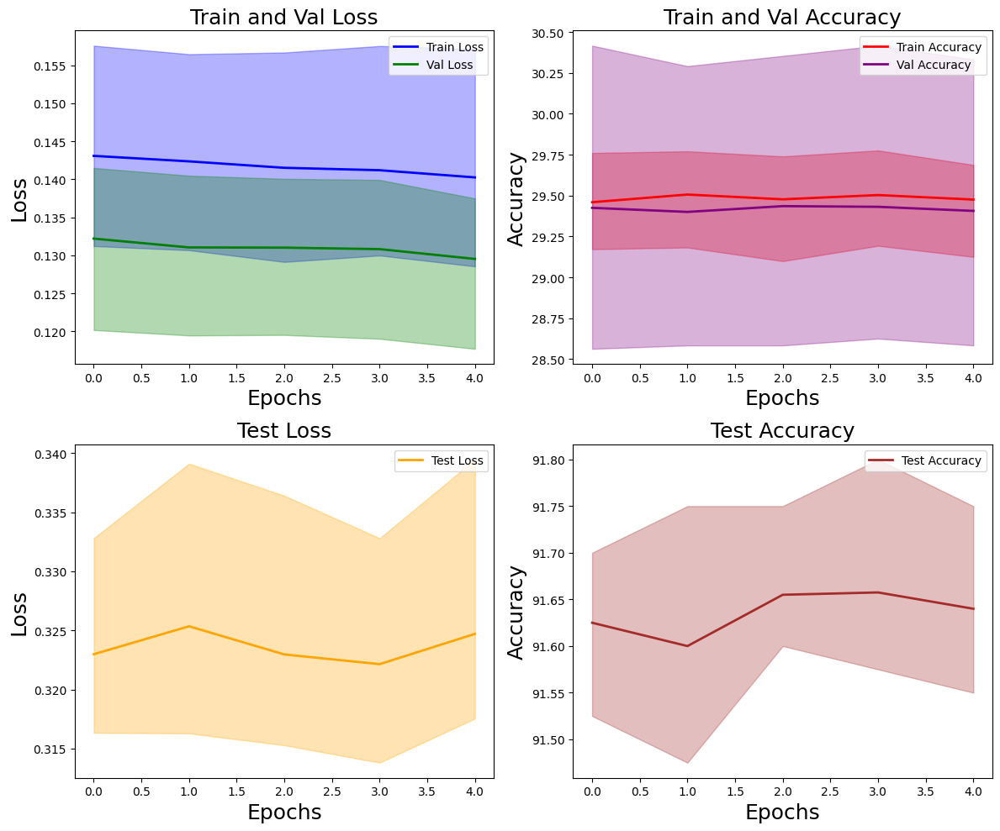

Data saved to t_revision_f6_mlp.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=5e-7,
    batch_size=256,
    num_epochs=5,
    method='t_revision',
    T_matrix=T_matrix,
    num_classes=4,
    optimizer_name='adam',
    times=10,
    model_name='mlp',
    csv_path='t_revision_f6_mlp.csv',
    )

mlp


Epoch 1 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.95it/s] 


Noisy Loss: 1.3669,Validation Loss: 0.3348, Accuracy: 37.21% (1786/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.45it/s]


Test Loss: 0.4138, Accuracy: 85.45% (3418/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 150/150 [00:02<00:00, 69.39it/s]


Noisy Loss: 1.3655,Validation Loss: 0.2952, Accuracy: 37.98% (1823/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 147.03it/s]


Test Loss: 0.3575, Accuracy: 88.58% (3543/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 150/150 [00:02<00:00, 73.14it/s] 


Noisy Loss: 1.3653,Validation Loss: 0.2732, Accuracy: 38.40% (1843/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.96it/s]


Test Loss: 0.3062, Accuracy: 90.70% (3628/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.81it/s] 


Noisy Loss: 1.3645,Validation Loss: 0.2053, Accuracy: 38.29% (1838/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.88it/s]


Test Loss: 0.3451, Accuracy: 91.08% (3643/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 150/150 [00:01<00:00, 77.23it/s] 


Noisy Loss: 1.3642,Validation Loss: 0.2033, Accuracy: 38.54% (1850/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.81it/s]


Test Loss: 0.3435, Accuracy: 90.95% (3638/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 150/150 [00:02<00:00, 72.69it/s] 


Noisy Loss: 1.3643,Validation Loss: 0.2142, Accuracy: 38.48% (1847/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.39it/s]


Test Loss: 0.2875, Accuracy: 91.65% (3666/4000)


Epoch 7 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.70it/s] 


Noisy Loss: 1.3648,Validation Loss: 0.2261, Accuracy: 38.19% (1833/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.59it/s]


Test Loss: 0.3463, Accuracy: 90.05% (3602/4000)


Epoch 8 Validation: 100%|██████████| 150/150 [00:01<00:00, 75.98it/s]


Noisy Loss: 1.3642,Validation Loss: 0.1934, Accuracy: 38.44% (1845/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.68it/s]


Test Loss: 0.3019, Accuracy: 91.17% (3647/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 150/150 [00:02<00:00, 71.71it/s]


Noisy Loss: 1.3641,Validation Loss: 0.1912, Accuracy: 38.31% (1839/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.91it/s]


Test Loss: 0.3129, Accuracy: 90.55% (3622/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 150/150 [00:01<00:00, 76.52it/s] 


Noisy Loss: 1.3651,Validation Loss: 0.2195, Accuracy: 37.98% (1823/4800)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.69it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.3618, Accuracy: 89.47% (3579/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.81it/s]


Test Loss: 0.3129, Accuracy: 90.55% (3622/4000)


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.70it/s]


Noisy Loss: 1.3791,Validation Loss: 0.1818, Accuracy: 39.62% (1902/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.87it/s]


Test Loss: 0.3037, Accuracy: 90.72% (3629/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.63it/s]


Noisy Loss: 1.3791,Validation Loss: 0.1794, Accuracy: 39.69% (1905/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.66it/s]


Test Loss: 0.3031, Accuracy: 90.75% (3630/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.45it/s]


Noisy Loss: 1.3791,Validation Loss: 0.1801, Accuracy: 39.67% (1904/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.93it/s]


Test Loss: 0.3022, Accuracy: 90.88% (3635/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.30it/s]


Noisy Loss: 1.3791,Validation Loss: 0.1777, Accuracy: 39.56% (1899/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.30it/s]


Test Loss: 0.3001, Accuracy: 90.85% (3634/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.54it/s]


Noisy Loss: 1.3791,Validation Loss: 0.1771, Accuracy: 39.60% (1901/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.59it/s]


Test Loss: 0.2962, Accuracy: 91.00% (3640/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.87it/s]


Test Loss: 0.2962, Accuracy: 91.00% (3640/4000)
finished  1  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.40it/s]


Noisy Loss: 1.3801,Validation Loss: 0.1812, Accuracy: 37.54% (1802/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.75it/s]


Test Loss: 0.2989, Accuracy: 91.10% (3644/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.62it/s]


Noisy Loss: 1.3801,Validation Loss: 0.1789, Accuracy: 37.54% (1802/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.37it/s]


Test Loss: 0.3010, Accuracy: 90.83% (3633/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.44it/s]


Noisy Loss: 1.3801,Validation Loss: 0.1775, Accuracy: 37.56% (1803/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.92it/s]


Test Loss: 0.3013, Accuracy: 90.80% (3632/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.39it/s]


Noisy Loss: 1.3801,Validation Loss: 0.1764, Accuracy: 37.54% (1802/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.98it/s]


Test Loss: 0.2955, Accuracy: 91.20% (3648/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.52it/s]


Noisy Loss: 1.3801,Validation Loss: 0.1760, Accuracy: 37.56% (1803/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.27it/s]


Test Loss: 0.2984, Accuracy: 91.05% (3642/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.77it/s]


Test Loss: 0.2984, Accuracy: 91.05% (3642/4000)
finished  2  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.51it/s]


Noisy Loss: 1.3790,Validation Loss: 0.1685, Accuracy: 39.81% (1911/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.75it/s]


Test Loss: 0.2961, Accuracy: 91.08% (3643/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.45it/s]


Noisy Loss: 1.3790,Validation Loss: 0.1668, Accuracy: 39.77% (1909/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.29it/s]


Test Loss: 0.2973, Accuracy: 91.12% (3645/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.55it/s]


Noisy Loss: 1.3790,Validation Loss: 0.1646, Accuracy: 39.77% (1909/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.15it/s]


Test Loss: 0.2993, Accuracy: 91.17% (3647/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.74it/s]


Noisy Loss: 1.3790,Validation Loss: 0.1660, Accuracy: 39.77% (1909/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.69it/s]


Test Loss: 0.2970, Accuracy: 91.22% (3649/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00,  9.98it/s]


Noisy Loss: 1.3790,Validation Loss: 0.1652, Accuracy: 39.83% (1912/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.22it/s]


Test Loss: 0.2958, Accuracy: 91.17% (3647/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.11it/s]


Test Loss: 0.2993, Accuracy: 91.17% (3647/4000)
finished  3  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.74it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1680, Accuracy: 38.83% (1864/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.75it/s]


Test Loss: 0.2959, Accuracy: 91.15% (3646/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.48it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1666, Accuracy: 38.88% (1866/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.82it/s]


Test Loss: 0.2950, Accuracy: 91.30% (3652/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.43it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1656, Accuracy: 38.85% (1865/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.13it/s]


Test Loss: 0.2990, Accuracy: 91.15% (3646/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.53it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1655, Accuracy: 38.83% (1864/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.26it/s]


Test Loss: 0.2966, Accuracy: 91.30% (3652/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.48it/s]


Noisy Loss: 1.3795,Validation Loss: 0.1643, Accuracy: 38.85% (1865/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.84it/s]


Test Loss: 0.2945, Accuracy: 91.30% (3652/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.40it/s]


Test Loss: 0.2945, Accuracy: 91.30% (3652/4000)
finished  4  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.71it/s]


Noisy Loss: 1.3796,Validation Loss: 0.1683, Accuracy: 38.46% (1846/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.16it/s]


Test Loss: 0.2997, Accuracy: 91.17% (3647/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.53it/s]


Noisy Loss: 1.3796,Validation Loss: 0.1698, Accuracy: 38.60% (1853/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.15it/s]


Test Loss: 0.2970, Accuracy: 91.17% (3647/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.78it/s]


Noisy Loss: 1.3796,Validation Loss: 0.1676, Accuracy: 38.58% (1852/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.70it/s]


Test Loss: 0.2963, Accuracy: 91.28% (3651/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.36it/s]


Noisy Loss: 1.3796,Validation Loss: 0.1655, Accuracy: 38.60% (1853/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.55it/s]


Test Loss: 0.2985, Accuracy: 91.22% (3649/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.03it/s]


Noisy Loss: 1.3796,Validation Loss: 0.1681, Accuracy: 38.54% (1850/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.64it/s]


Test Loss: 0.2930, Accuracy: 91.35% (3654/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.49it/s]


Test Loss: 0.2985, Accuracy: 91.22% (3649/4000)
finished  5  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.80it/s]


Noisy Loss: 1.3794,Validation Loss: 0.1619, Accuracy: 38.85% (1865/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.87it/s]


Test Loss: 0.2941, Accuracy: 91.38% (3655/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.59it/s]


Noisy Loss: 1.3794,Validation Loss: 0.1608, Accuracy: 38.85% (1865/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.59it/s]


Test Loss: 0.2962, Accuracy: 91.35% (3654/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.31it/s]


Noisy Loss: 1.3794,Validation Loss: 0.1588, Accuracy: 38.88% (1866/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.68it/s]


Test Loss: 0.2947, Accuracy: 91.35% (3654/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.90it/s]


Noisy Loss: 1.3794,Validation Loss: 0.1590, Accuracy: 38.90% (1867/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.47it/s]


Test Loss: 0.2944, Accuracy: 91.42% (3657/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.44it/s]


Noisy Loss: 1.3794,Validation Loss: 0.1585, Accuracy: 38.90% (1867/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.88it/s]


Test Loss: 0.2947, Accuracy: 91.38% (3655/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.56it/s]


Test Loss: 0.2947, Accuracy: 91.38% (3655/4000)
finished  6  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.81it/s]


Noisy Loss: 1.3793,Validation Loss: 0.1656, Accuracy: 39.06% (1875/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.01it/s]


Test Loss: 0.2926, Accuracy: 91.33% (3653/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.65it/s]


Noisy Loss: 1.3793,Validation Loss: 0.1649, Accuracy: 39.06% (1875/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.39it/s]


Test Loss: 0.2899, Accuracy: 91.53% (3661/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.54it/s]


Noisy Loss: 1.3793,Validation Loss: 0.1640, Accuracy: 39.08% (1876/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.03it/s]


Test Loss: 0.2903, Accuracy: 91.58% (3663/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.62it/s]


Noisy Loss: 1.3793,Validation Loss: 0.1621, Accuracy: 39.25% (1884/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.46it/s]


Test Loss: 0.2959, Accuracy: 91.40% (3656/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.43it/s]


Noisy Loss: 1.3793,Validation Loss: 0.1628, Accuracy: 38.88% (1866/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.83it/s]


Test Loss: 0.2965, Accuracy: 91.42% (3657/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.34it/s]


Test Loss: 0.2959, Accuracy: 91.40% (3656/4000)
finished  7  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.32it/s]


Noisy Loss: 1.3793,Validation Loss: 0.1557, Accuracy: 39.25% (1884/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.68it/s]


Test Loss: 0.2927, Accuracy: 91.45% (3658/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.79it/s]


Noisy Loss: 1.3793,Validation Loss: 0.1552, Accuracy: 39.23% (1883/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.25it/s]


Test Loss: 0.2909, Accuracy: 91.55% (3662/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.60it/s]


Noisy Loss: 1.3793,Validation Loss: 0.1541, Accuracy: 39.21% (1882/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.65it/s]


Test Loss: 0.2913, Accuracy: 91.53% (3661/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.68it/s]


Noisy Loss: 1.3793,Validation Loss: 0.1552, Accuracy: 39.17% (1880/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.70it/s]


Test Loss: 0.2935, Accuracy: 91.42% (3657/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.44it/s]


Noisy Loss: 1.3792,Validation Loss: 0.1543, Accuracy: 39.23% (1883/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.92it/s]


Test Loss: 0.2877, Accuracy: 91.58% (3663/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.15it/s]


Test Loss: 0.2913, Accuracy: 91.53% (3661/4000)
finished  8  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.70it/s]


Noisy Loss: 1.3792,Validation Loss: 0.1510, Accuracy: 39.40% (1891/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.53it/s]


Test Loss: 0.2952, Accuracy: 91.45% (3658/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.45it/s]


Noisy Loss: 1.3792,Validation Loss: 0.1525, Accuracy: 39.38% (1890/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.60it/s]


Test Loss: 0.2896, Accuracy: 91.60% (3664/4000)


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.81it/s]


Noisy Loss: 1.3792,Validation Loss: 0.1507, Accuracy: 39.40% (1891/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.34it/s]


Test Loss: 0.2943, Accuracy: 91.45% (3658/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.54it/s]


Noisy Loss: 1.3792,Validation Loss: 0.1511, Accuracy: 39.38% (1890/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.66it/s]


Test Loss: 0.2919, Accuracy: 91.45% (3658/4000)


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.34it/s]


Noisy Loss: 1.3792,Validation Loss: 0.1487, Accuracy: 39.35% (1889/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.82it/s]


Test Loss: 0.2943, Accuracy: 91.38% (3655/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.41it/s]


Test Loss: 0.2943, Accuracy: 91.38% (3655/4000)
finished  9  epoch


Epoch 1 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.22it/s]


Noisy Loss: 1.3790,Validation Loss: 0.1577, Accuracy: 39.65% (1903/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.70it/s]


Test Loss: 0.2925, Accuracy: 91.47% (3659/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.64it/s]


Noisy Loss: 1.3790,Validation Loss: 0.1555, Accuracy: 39.56% (1899/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.56it/s]


Test Loss: 0.2914, Accuracy: 91.58% (3663/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.61it/s]


Noisy Loss: 1.3790,Validation Loss: 0.1563, Accuracy: 39.69% (1905/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.83it/s]


Test Loss: 0.2901, Accuracy: 91.60% (3664/4000)


Epoch 4 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.49it/s]


Noisy Loss: 1.3790,Validation Loss: 0.1541, Accuracy: 39.60% (1901/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.47it/s]


Test Loss: 0.2923, Accuracy: 91.58% (3663/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 19/19 [00:01<00:00, 10.09it/s]


Noisy Loss: 1.3790,Validation Loss: 0.1548, Accuracy: 39.65% (1903/4800)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.55it/s]


Test Loss: 0.2892, Accuracy: 91.65% (3666/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 20.19it/s]


Test Loss: 0.2923, Accuracy: 91.58% (3663/4000)
finished  10  epoch
min_train_loss [0.1908647147814433, 0.1839326650897662, 0.18221343735853832, 0.17763712763786316, 0.172715705037117, 0.16888137231270473, 0.1644240669409434, 0.16517998824516933, 0.16160376777251562, 0.15697688182195027]
min_val_loss [0.17713622513570285, 0.1759932739169974, 0.1645656420212043, 0.1642780617663735, 0.16549138489522433, 0.1585120327378574, 0.16205796128825137, 0.15407170825882963, 0.14868041049492986, 0.1540839370144041]
min_train_accuracy [38.713541666666664, 39.234375, 38.6875, 38.942708333333336, 38.989583333333336, 39.036458333333336, 38.90625, 38.869791666666664, 38.932291666666664, 38.822916666666664]
min_val_accuracy [39.604166666666664, 37.5625, 39.770833333333336, 38.854166666666664, 38.604166666666664, 38.895833333333336, 39.25, 39.208333333333336, 39.354166666666664, 39.604166666666664]
min_train_noise_loss [1.363293504714966, 1.3622305425008139, 1.3631296014785768, 1.3626077047983804, 1.36257

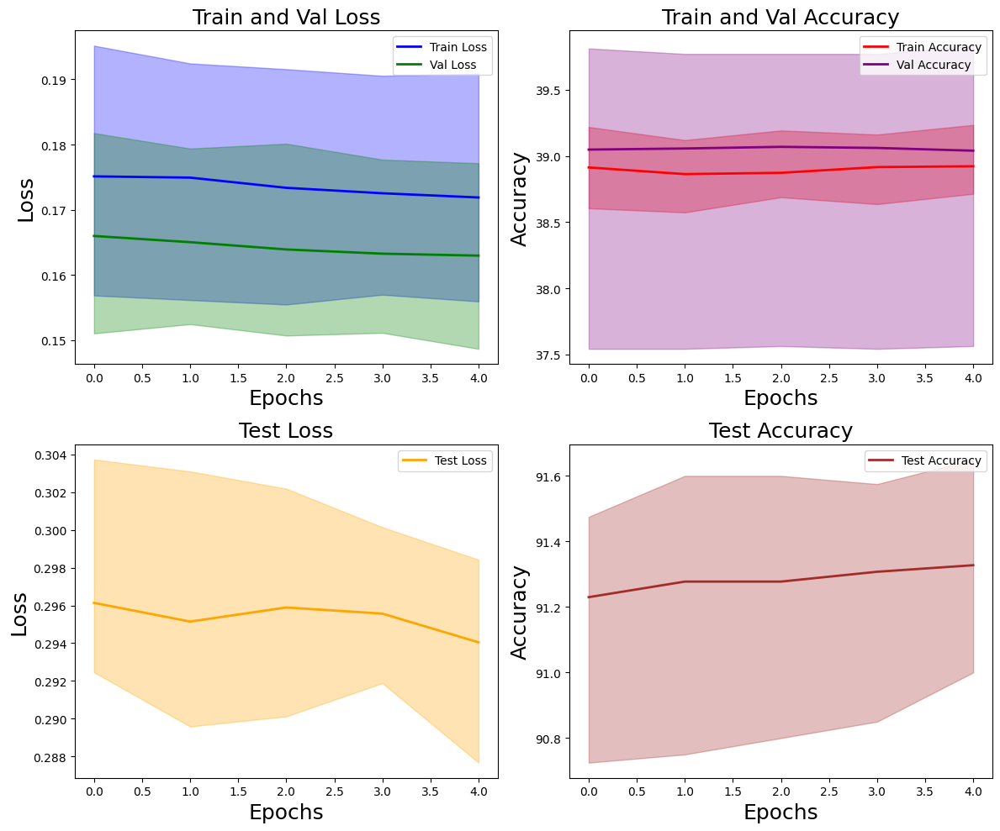

Data saved to t_revision_v2_f6_mlp.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=5e-7,
    batch_size=256,
    num_epochs=5,
    method='t_revision_v2',
    T_matrix=T_matrix,
    num_classes=4,
    optimizer_name='adam',
    times=10,
    model_name='mlp',
    csv_path='t_revision_v2_f6_mlp.csv',
    )

### CIFAR10

In [ ]:
T_matrix = np.array([
 [9.52139080e-01, 3.86619456e-02, 5.37598040e-03, 3.82294622e-03],
 [1.18309450e-04, 8.60177219e-01, 1.39142320e-01, 5.62156376e-04],
 [2.76456047e-02, 9.84724145e-04, 9.51853216e-01, 1.95164680e-02],
 [7.55449161e-02, 1.50617501e-02, 1.49769271e-02, 8.94416392e-01]
])
T_matrix = mean_matrix_cifar
print(T_matrix)
X_train_full = data_c10_X_tr
y_train_full = data_c10_S_tr
X_test = data_c10_X_ts
y_test = data_c10_Y_ts

[[0.88578737 0.09624667 0.00779205 0.01017386]
 [0.00580611 0.90526044 0.08999731 0.        ]
 [0.0030428  0.         0.92190444 0.07856871]
 [0.09064659 0.         0.02474496 0.8854081 ]]


mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 138.08it/s]


Noisy Loss: 1.2587,Validation Loss: 1.1524, Accuracy: 54.12% (2165/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.45it/s]


Test Loss: 1.0175, Accuracy: 60.90% (2436/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.06it/s]


Noisy Loss: 1.2405,Validation Loss: 1.1252, Accuracy: 56.50% (2260/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.93it/s]


Test Loss: 0.9623, Accuracy: 63.52% (2541/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 141.62it/s]


Noisy Loss: 1.2329,Validation Loss: 1.1572, Accuracy: 56.30% (2252/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.77it/s]


Test Loss: 0.9471, Accuracy: 64.25% (2570/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 137.15it/s]


Noisy Loss: 1.2366,Validation Loss: 1.2779, Accuracy: 55.20% (2208/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.41it/s]


Test Loss: 0.9754, Accuracy: 62.83% (2513/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.07it/s]


Noisy Loss: 1.2414,Validation Loss: 1.2402, Accuracy: 55.50% (2220/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.85it/s]


Test Loss: 1.0063, Accuracy: 60.90% (2436/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 138.96it/s]


Noisy Loss: 1.2437,Validation Loss: 1.5382, Accuracy: 55.33% (2213/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.25it/s]


Test Loss: 1.0457, Accuracy: 61.60% (2464/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 139.89it/s]


Noisy Loss: 1.2304,Validation Loss: 1.6717, Accuracy: 59.12% (2365/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.56it/s]


Test Loss: 1.0958, Accuracy: 65.58% (2623/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 138.82it/s]


Noisy Loss: 1.2321,Validation Loss: 1.4649, Accuracy: 57.30% (2292/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.68it/s]


Test Loss: 1.0948, Accuracy: 65.05% (2602/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 123.73it/s]


Noisy Loss: 1.2334,Validation Loss: 1.5887, Accuracy: 57.38% (2295/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.92it/s]


Test Loss: 1.2561, Accuracy: 64.80% (2592/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.78it/s]


Noisy Loss: 1.2166,Validation Loss: 1.6540, Accuracy: 59.83% (2393/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.80it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 1.1564, Accuracy: 66.78% (2671/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 144.11it/s]


Test Loss: 0.9623, Accuracy: 63.52% (2541/4000)
finished  1  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 139.19it/s]


Noisy Loss: 1.2433,Validation Loss: 1.1352, Accuracy: 54.27% (2171/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.11it/s]


Test Loss: 0.9756, Accuracy: 62.50% (2500/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.44it/s]


Noisy Loss: 1.2476,Validation Loss: 1.0924, Accuracy: 55.30% (2212/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.56it/s]


Test Loss: 0.9398, Accuracy: 64.55% (2582/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.43it/s]


Noisy Loss: 1.2379,Validation Loss: 1.1009, Accuracy: 56.05% (2242/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.29it/s]


Test Loss: 0.9494, Accuracy: 64.45% (2578/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 138.63it/s]


Noisy Loss: 1.2312,Validation Loss: 1.0678, Accuracy: 57.12% (2285/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.01it/s]


Test Loss: 0.9612, Accuracy: 66.05% (2642/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 138.45it/s]


Noisy Loss: 1.2372,Validation Loss: 1.0923, Accuracy: 57.62% (2305/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.12it/s]


Test Loss: 0.9408, Accuracy: 66.03% (2641/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 129.33it/s]


Noisy Loss: 1.2305,Validation Loss: 1.1913, Accuracy: 56.73% (2269/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.11it/s]


Test Loss: 0.9842, Accuracy: 64.03% (2561/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.42it/s]


Noisy Loss: 1.2221,Validation Loss: 1.3203, Accuracy: 56.33% (2253/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.10it/s]


Test Loss: 1.1185, Accuracy: 64.58% (2583/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.31it/s]


Noisy Loss: 1.2298,Validation Loss: 1.8663, Accuracy: 57.27% (2291/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.95it/s]


Test Loss: 1.2415, Accuracy: 65.75% (2630/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 138.98it/s]


Noisy Loss: 1.2280,Validation Loss: 1.5215, Accuracy: 57.38% (2295/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.48it/s]


Test Loss: 1.4465, Accuracy: 65.50% (2620/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 139.73it/s]


Noisy Loss: 1.2281,Validation Loss: 1.2745, Accuracy: 55.75% (2230/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.48it/s]


Test Loss: 1.3059, Accuracy: 64.08% (2563/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.68it/s]


Test Loss: 0.9612, Accuracy: 66.05% (2642/4000)
finished  2  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 138.55it/s]


Noisy Loss: 1.2378,Validation Loss: 1.1259, Accuracy: 55.90% (2236/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.04it/s]


Test Loss: 0.9700, Accuracy: 62.02% (2481/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 139.40it/s]


Noisy Loss: 1.2462,Validation Loss: 1.1219, Accuracy: 55.67% (2227/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.82it/s]


Test Loss: 0.9802, Accuracy: 62.05% (2482/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 130.70it/s]


Noisy Loss: 1.2309,Validation Loss: 1.1571, Accuracy: 56.83% (2273/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.60it/s]


Test Loss: 1.0207, Accuracy: 64.88% (2595/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.23it/s]


Noisy Loss: 1.2363,Validation Loss: 1.0989, Accuracy: 57.45% (2298/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.87it/s]


Test Loss: 0.9432, Accuracy: 65.15% (2606/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.59it/s]


Noisy Loss: 1.2299,Validation Loss: 1.1099, Accuracy: 57.20% (2288/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.58it/s]


Test Loss: 0.9526, Accuracy: 64.55% (2582/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.43it/s]


Noisy Loss: 1.2445,Validation Loss: 1.0950, Accuracy: 56.98% (2279/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.86it/s]


Test Loss: 0.9666, Accuracy: 63.58% (2543/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 137.81it/s]


Noisy Loss: 1.2209,Validation Loss: 1.0652, Accuracy: 58.62% (2345/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.84it/s]


Test Loss: 0.8933, Accuracy: 67.55% (2702/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 138.31it/s]


Noisy Loss: 1.2206,Validation Loss: 1.2105, Accuracy: 57.92% (2317/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.91it/s]


Test Loss: 0.9113, Accuracy: 66.22% (2649/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 138.74it/s]


Noisy Loss: 1.2204,Validation Loss: 1.2161, Accuracy: 58.45% (2338/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.55it/s]


Test Loss: 0.9613, Accuracy: 66.47% (2659/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 129.23it/s]


Noisy Loss: 1.2369,Validation Loss: 1.6674, Accuracy: 55.70% (2228/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.71it/s]


Test Loss: 1.2315, Accuracy: 64.00% (2560/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.22it/s]


Test Loss: 0.8933, Accuracy: 67.55% (2702/4000)
finished  3  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 138.07it/s]


Noisy Loss: 1.2473,Validation Loss: 1.0948, Accuracy: 54.38% (2175/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.71it/s]


Test Loss: 0.9924, Accuracy: 61.48% (2459/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 137.64it/s]


Noisy Loss: 1.2338,Validation Loss: 1.1097, Accuracy: 54.67% (2187/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.65it/s]


Test Loss: 0.9845, Accuracy: 61.33% (2453/4000)


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.19it/s]


Noisy Loss: 1.2778,Validation Loss: 2.4627, Accuracy: 51.75% (2070/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.31it/s]


Test Loss: 2.3573, Accuracy: 56.42% (2257/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 140.35it/s]


Noisy Loss: 1.2224,Validation Loss: 1.0675, Accuracy: 57.73% (2309/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.25it/s]


Test Loss: 0.9542, Accuracy: 63.92% (2557/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 131.83it/s]


Noisy Loss: 1.2320,Validation Loss: 1.0836, Accuracy: 57.95% (2318/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.33it/s]


Test Loss: 0.9418, Accuracy: 64.40% (2576/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 141.27it/s]


Noisy Loss: 1.2497,Validation Loss: 1.1850, Accuracy: 55.33% (2213/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.77it/s]


Test Loss: 1.0338, Accuracy: 60.95% (2438/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 134.88it/s]


Noisy Loss: 1.2209,Validation Loss: 1.0431, Accuracy: 59.75% (2390/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.39it/s]


Test Loss: 0.9387, Accuracy: 67.35% (2694/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 143.01it/s]


Noisy Loss: 1.2240,Validation Loss: 1.1240, Accuracy: 58.83% (2353/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.52it/s]


Test Loss: 0.9653, Accuracy: 67.45% (2698/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 141.90it/s]


Noisy Loss: 1.2622,Validation Loss: 1.3311, Accuracy: 49.83% (1993/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.14it/s]


Test Loss: 1.2347, Accuracy: 53.95% (2158/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 137.42it/s]


Noisy Loss: 1.2318,Validation Loss: 1.5502, Accuracy: 58.35% (2334/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.54it/s]


Test Loss: 1.0596, Accuracy: 65.67% (2627/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.73it/s]


Test Loss: 0.9387, Accuracy: 67.35% (2694/4000)
finished  4  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 137.85it/s]


Noisy Loss: 1.2563,Validation Loss: 1.1173, Accuracy: 53.65% (2146/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.01it/s]


Test Loss: 0.9994, Accuracy: 60.55% (2422/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 137.20it/s]


Noisy Loss: 1.2475,Validation Loss: 1.0996, Accuracy: 55.27% (2211/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.30it/s]


Test Loss: 0.9685, Accuracy: 62.50% (2500/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 139.65it/s]


Noisy Loss: 1.2327,Validation Loss: 1.0865, Accuracy: 56.85% (2274/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.28it/s]


Test Loss: 0.9322, Accuracy: 64.83% (2593/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.11it/s]


Noisy Loss: 1.2280,Validation Loss: 1.1016, Accuracy: 58.50% (2340/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.08it/s]


Test Loss: 0.9131, Accuracy: 65.97% (2639/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 140.31it/s]


Noisy Loss: 1.2306,Validation Loss: 1.1251, Accuracy: 58.55% (2342/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.52it/s]


Test Loss: 0.9310, Accuracy: 66.90% (2676/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 133.71it/s]


Noisy Loss: 1.2275,Validation Loss: 1.0975, Accuracy: 59.15% (2366/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.01it/s]


Test Loss: 0.9226, Accuracy: 67.10% (2684/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 139.77it/s]


Noisy Loss: 1.2136,Validation Loss: 1.1835, Accuracy: 59.23% (2369/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.64it/s]


Test Loss: 0.9648, Accuracy: 66.85% (2674/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 140.37it/s]


Noisy Loss: 1.2327,Validation Loss: 1.8644, Accuracy: 56.90% (2276/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.58it/s]


Test Loss: 1.6331, Accuracy: 64.55% (2582/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 133.84it/s]


Noisy Loss: 1.2267,Validation Loss: 1.2933, Accuracy: 57.70% (2308/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.18it/s]


Test Loss: 0.9439, Accuracy: 65.78% (2631/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.50it/s]


Noisy Loss: 1.2143,Validation Loss: 1.3428, Accuracy: 60.05% (2402/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.47it/s]


Test Loss: 0.9436, Accuracy: 67.72% (2709/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.00it/s]


Test Loss: 0.9322, Accuracy: 64.83% (2593/4000)
finished  5  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 131.87it/s]


Noisy Loss: 1.2480,Validation Loss: 1.1229, Accuracy: 53.95% (2158/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.31it/s]


Test Loss: 1.0000, Accuracy: 60.30% (2412/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 134.17it/s]


Noisy Loss: 1.2426,Validation Loss: 1.0788, Accuracy: 54.77% (2191/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.34it/s]


Test Loss: 0.9508, Accuracy: 63.35% (2534/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.30it/s]


Noisy Loss: 1.2260,Validation Loss: 1.0856, Accuracy: 56.30% (2252/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.00it/s]


Test Loss: 0.9526, Accuracy: 63.38% (2535/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 139.22it/s]


Noisy Loss: 1.2530,Validation Loss: 1.1659, Accuracy: 53.92% (2157/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.86it/s]


Test Loss: 1.0393, Accuracy: 59.52% (2381/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.23it/s]


Noisy Loss: 1.2266,Validation Loss: 1.0898, Accuracy: 57.83% (2313/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.29it/s]


Test Loss: 0.9342, Accuracy: 65.28% (2611/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 128.27it/s]


Noisy Loss: 1.2244,Validation Loss: 1.0865, Accuracy: 57.27% (2291/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.05it/s]


Test Loss: 0.9148, Accuracy: 65.88% (2635/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.60it/s]


Noisy Loss: 1.2170,Validation Loss: 1.0957, Accuracy: 57.17% (2287/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.81it/s]


Test Loss: 0.9513, Accuracy: 64.83% (2593/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 134.10it/s]


Noisy Loss: 1.2326,Validation Loss: 1.1429, Accuracy: 55.17% (2207/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.94it/s]


Test Loss: 1.0242, Accuracy: 60.70% (2428/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 137.63it/s]


Noisy Loss: 1.2134,Validation Loss: 1.0915, Accuracy: 58.45% (2338/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.53it/s]


Test Loss: 0.9281, Accuracy: 66.28% (2651/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 138.64it/s]


Noisy Loss: 1.2194,Validation Loss: 1.2241, Accuracy: 57.85% (2314/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.56it/s]


Test Loss: 1.0798, Accuracy: 65.40% (2616/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.49it/s]


Test Loss: 0.9508, Accuracy: 63.35% (2534/4000)
finished  6  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.65it/s]


Noisy Loss: 1.2445,Validation Loss: 1.0945, Accuracy: 56.05% (2242/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.65it/s]


Test Loss: 0.9654, Accuracy: 63.38% (2535/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 138.90it/s]


Noisy Loss: 1.2459,Validation Loss: 1.0766, Accuracy: 56.17% (2247/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.63it/s]


Test Loss: 0.9632, Accuracy: 62.58% (2503/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 130.97it/s]


Noisy Loss: 1.2471,Validation Loss: 1.1015, Accuracy: 55.45% (2218/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.60it/s]


Test Loss: 0.9751, Accuracy: 62.15% (2486/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 137.94it/s]


Noisy Loss: 1.2404,Validation Loss: 1.1135, Accuracy: 56.83% (2273/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.56it/s]


Test Loss: 0.9832, Accuracy: 62.38% (2495/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 131.01it/s]


Noisy Loss: 1.2253,Validation Loss: 1.0937, Accuracy: 58.52% (2341/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.13it/s]


Test Loss: 0.9302, Accuracy: 66.42% (2657/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 133.25it/s]


Noisy Loss: 1.2315,Validation Loss: 1.1999, Accuracy: 58.65% (2346/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.52it/s]


Test Loss: 1.0060, Accuracy: 66.25% (2650/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 141.92it/s]


Noisy Loss: 1.2254,Validation Loss: 1.1334, Accuracy: 56.77% (2271/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.72it/s]


Test Loss: 0.9855, Accuracy: 64.80% (2592/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 130.78it/s]


Noisy Loss: 1.2157,Validation Loss: 1.1127, Accuracy: 59.38% (2375/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.48it/s]


Test Loss: 0.8854, Accuracy: 66.72% (2669/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 132.54it/s]


Noisy Loss: 1.2161,Validation Loss: 1.1277, Accuracy: 59.27% (2371/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.69it/s]


Test Loss: 0.9140, Accuracy: 67.03% (2681/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.81it/s]


Noisy Loss: 1.2330,Validation Loss: 1.4260, Accuracy: 55.75% (2230/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.09it/s]


Test Loss: 1.0410, Accuracy: 61.42% (2457/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.39it/s]


Test Loss: 0.9632, Accuracy: 62.58% (2503/4000)
finished  7  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 141.30it/s]


Noisy Loss: 1.2459,Validation Loss: 1.1075, Accuracy: 54.52% (2181/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.31it/s]


Test Loss: 0.9868, Accuracy: 62.08% (2483/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 133.02it/s]


Noisy Loss: 1.2433,Validation Loss: 1.0946, Accuracy: 54.77% (2191/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.24it/s]


Test Loss: 0.9590, Accuracy: 62.95% (2518/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 133.33it/s]


Noisy Loss: 1.2764,Validation Loss: 1.2982, Accuracy: 50.12% (2005/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.49it/s]


Test Loss: 1.2484, Accuracy: 55.60% (2224/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 133.45it/s]


Noisy Loss: 1.2317,Validation Loss: 1.1204, Accuracy: 57.12% (2285/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.75it/s]


Test Loss: 0.9954, Accuracy: 65.70% (2628/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 133.93it/s]


Noisy Loss: 1.2326,Validation Loss: 1.0869, Accuracy: 57.75% (2310/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.29it/s]


Test Loss: 1.0336, Accuracy: 64.92% (2597/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 128.55it/s]


Noisy Loss: 1.2327,Validation Loss: 1.1080, Accuracy: 58.00% (2320/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.82it/s]


Test Loss: 1.0197, Accuracy: 64.53% (2581/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 130.23it/s]


Noisy Loss: 1.2182,Validation Loss: 1.1051, Accuracy: 57.05% (2282/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.35it/s]


Test Loss: 0.9797, Accuracy: 64.95% (2598/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 137.61it/s]


Noisy Loss: 1.2239,Validation Loss: 1.0668, Accuracy: 59.23% (2369/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.12it/s]


Test Loss: 1.0827, Accuracy: 66.15% (2646/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.25it/s]


Noisy Loss: 1.2383,Validation Loss: 1.1036, Accuracy: 57.08% (2283/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.84it/s]


Test Loss: 1.0546, Accuracy: 63.95% (2558/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.97it/s]


Noisy Loss: 1.2434,Validation Loss: 1.3871, Accuracy: 54.38% (2175/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.03it/s]


Test Loss: 1.4566, Accuracy: 60.62% (2425/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.31it/s]


Test Loss: 1.0827, Accuracy: 66.15% (2646/4000)
finished  8  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 132.56it/s]


Noisy Loss: 1.2635,Validation Loss: 1.1513, Accuracy: 53.42% (2137/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.19it/s]


Test Loss: 1.0028, Accuracy: 59.27% (2371/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 132.81it/s]


Noisy Loss: 1.2574,Validation Loss: 1.1417, Accuracy: 52.17% (2087/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.72it/s]


Test Loss: 1.0229, Accuracy: 58.12% (2325/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.49it/s]


Noisy Loss: 1.2563,Validation Loss: 1.1211, Accuracy: 53.60% (2144/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.93it/s]


Test Loss: 1.0041, Accuracy: 60.12% (2405/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 129.66it/s]


Noisy Loss: 1.2296,Validation Loss: 1.0923, Accuracy: 58.45% (2338/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.91it/s]


Test Loss: 0.9207, Accuracy: 66.55% (2662/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 134.48it/s]


Noisy Loss: 1.2299,Validation Loss: 1.1252, Accuracy: 58.83% (2353/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.48it/s]


Test Loss: 0.9275, Accuracy: 65.53% (2621/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 138.54it/s]


Noisy Loss: 1.2367,Validation Loss: 1.1102, Accuracy: 57.95% (2318/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.57it/s]


Test Loss: 0.9414, Accuracy: 65.30% (2612/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 125.32it/s]


Noisy Loss: 1.2235,Validation Loss: 1.0907, Accuracy: 59.15% (2366/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.19it/s]


Test Loss: 0.8910, Accuracy: 67.80% (2712/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 140.95it/s]


Noisy Loss: 1.2223,Validation Loss: 1.1641, Accuracy: 57.10% (2284/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.65it/s]


Test Loss: 0.9856, Accuracy: 64.55% (2582/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 130.83it/s]


Noisy Loss: 1.2273,Validation Loss: 1.1236, Accuracy: 58.40% (2336/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.97it/s]


Test Loss: 1.0159, Accuracy: 65.10% (2604/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.17it/s]


Noisy Loss: 1.2197,Validation Loss: 1.2101, Accuracy: 58.62% (2345/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.35it/s]


Test Loss: 1.0317, Accuracy: 66.60% (2664/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.11it/s]


Test Loss: 0.8910, Accuracy: 67.80% (2712/4000)
finished  9  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 126.77it/s]


Noisy Loss: 1.2560,Validation Loss: 1.1427, Accuracy: 52.83% (2113/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.86it/s]


Test Loss: 1.0181, Accuracy: 58.67% (2347/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.02it/s]


Noisy Loss: 1.2347,Validation Loss: 1.1161, Accuracy: 56.02% (2241/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.53it/s]


Test Loss: 0.9390, Accuracy: 64.03% (2561/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 131.82it/s]


Noisy Loss: 1.2358,Validation Loss: 1.1219, Accuracy: 57.23% (2289/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.32it/s]


Test Loss: 0.9344, Accuracy: 64.67% (2587/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.28it/s]


Noisy Loss: 1.2394,Validation Loss: 1.1660, Accuracy: 58.65% (2346/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.36it/s]


Test Loss: 0.9470, Accuracy: 66.72% (2669/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.90it/s]


Noisy Loss: 1.2240,Validation Loss: 1.1353, Accuracy: 58.55% (2342/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.62it/s]


Test Loss: 0.9287, Accuracy: 66.40% (2656/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.50it/s]


Noisy Loss: 1.2394,Validation Loss: 1.1865, Accuracy: 56.55% (2262/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.07it/s]


Test Loss: 0.9507, Accuracy: 63.60% (2544/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.23it/s]


Noisy Loss: 1.2178,Validation Loss: 1.1933, Accuracy: 59.20% (2368/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.20it/s]


Test Loss: 0.9521, Accuracy: 67.12% (2685/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 125.86it/s]


Noisy Loss: 1.2108,Validation Loss: 1.1515, Accuracy: 58.92% (2357/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.74it/s]


Test Loss: 0.9134, Accuracy: 67.08% (2683/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 138.40it/s]


Noisy Loss: 1.2097,Validation Loss: 1.1266, Accuracy: 58.58% (2343/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.88it/s]


Test Loss: 0.9084, Accuracy: 65.62% (2625/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 137.37it/s]


Noisy Loss: 1.2191,Validation Loss: 1.1256, Accuracy: 58.02% (2321/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.56it/s]


Test Loss: 0.9229, Accuracy: 66.40% (2656/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.52it/s]


Test Loss: 0.9390, Accuracy: 64.03% (2561/4000)
finished  10  epoch
min_train_loss [1.1029592229127885, 1.0713909364938736, 1.0342730678319931, 1.0535496814250946, 1.076822041273117, 1.1050039516687393, 1.1103327732086181, 1.0326575874090194, 1.0329572643041611, 1.1082184706926346]
min_val_loss [1.1252070207595826, 1.0677783756256103, 1.0651764373779298, 1.0430852336883545, 1.0865184264183045, 1.0787906379699708, 1.0766452851295472, 1.066782982826233, 1.090697720527649, 1.1161498126983642]
min_train_accuracy [54.25625, 56.11875, 57.8, 57.525, 56.00625, 54.6125, 53.8625, 57.71875, 58.0, 54.85]
min_val_accuracy [56.5, 57.125, 58.625, 59.75, 56.85, 54.775, 56.175, 59.225, 59.15, 56.025]
min_train_noise_loss [1.2472550106048583, 1.2352973721027374, 1.223137705564499, 1.2285182466506959, 1.2382723088264465, 1.2465941116809844, 1.2492041110992431, 1.2213157477378844, 1.220525584936142, 1.2479076030254364]
min_val_noise_loss [1.2404777774810791, 1.2312122621536254, 1.2209107580184937, 1.22088

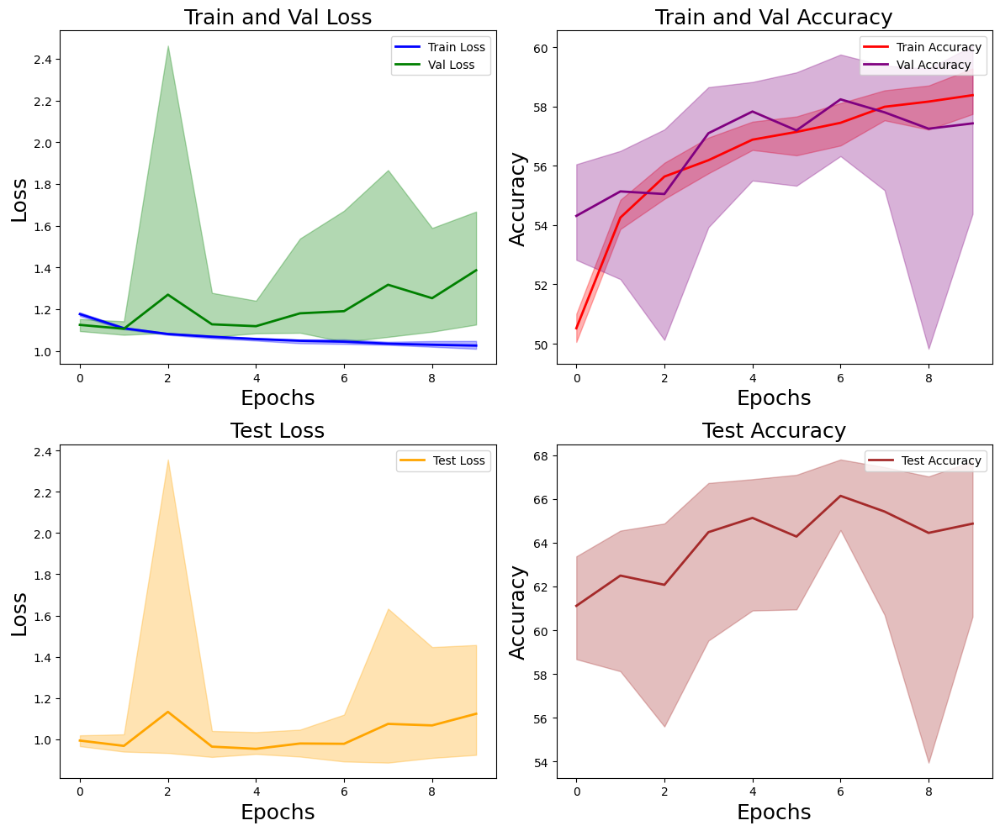

Data saved to baseline_c10_mlp.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=0.0005,
    batch_size=32,
    num_epochs=10,
    times=10,
    method='baseline',
    T_matrix=T_matrix,
    csv_path='baseline_c10_mlp.csv',
    model_name='mlp',
)

mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 133.58it/s]


Noisy Loss: 1.2492,Validation Loss: 1.1275, Accuracy: 52.73% (2109/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.22it/s]


Test Loss: 0.9937, Accuracy: 60.12% (2405/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 128.85it/s]


Noisy Loss: 1.2290,Validation Loss: 1.0726, Accuracy: 56.92% (2277/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.83it/s]


Test Loss: 0.9251, Accuracy: 65.03% (2601/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 137.19it/s]


Noisy Loss: 1.2343,Validation Loss: 1.0798, Accuracy: 55.73% (2229/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.14it/s]


Test Loss: 0.9513, Accuracy: 63.23% (2529/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.50it/s]


Noisy Loss: 1.2550,Validation Loss: 1.1672, Accuracy: 51.02% (2041/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.95it/s]


Test Loss: 1.0450, Accuracy: 56.90% (2276/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.61it/s]


Noisy Loss: 1.2201,Validation Loss: 1.0551, Accuracy: 56.98% (2279/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.46it/s]


Test Loss: 0.9418, Accuracy: 65.75% (2630/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 133.50it/s]


Noisy Loss: 1.2214,Validation Loss: 1.0529, Accuracy: 56.50% (2260/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.15it/s]


Test Loss: 0.9185, Accuracy: 65.50% (2620/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.02it/s]


Noisy Loss: 1.2103,Validation Loss: 1.0347, Accuracy: 58.92% (2357/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.84it/s]


Test Loss: 0.8968, Accuracy: 67.30% (2692/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 132.46it/s]


Noisy Loss: 1.2255,Validation Loss: 1.0729, Accuracy: 56.12% (2245/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.00it/s]


Test Loss: 1.0220, Accuracy: 63.85% (2554/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 126.07it/s]


Noisy Loss: 1.2133,Validation Loss: 1.0319, Accuracy: 58.75% (2350/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.25it/s]


Test Loss: 0.8669, Accuracy: 68.33% (2733/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.29it/s]


Noisy Loss: 1.2195,Validation Loss: 1.0420, Accuracy: 57.35% (2294/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.50it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.9117, Accuracy: 65.60% (2624/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.48it/s]


Test Loss: 0.8669, Accuracy: 68.33% (2733/4000)
finished  1  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 130.69it/s]


Noisy Loss: 1.2281,Validation Loss: 1.0606, Accuracy: 56.60% (2264/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.60it/s]


Test Loss: 0.9207, Accuracy: 63.77% (2551/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 133.68it/s]


Noisy Loss: 1.2332,Validation Loss: 1.0670, Accuracy: 55.55% (2222/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.08it/s]


Test Loss: 0.9765, Accuracy: 61.08% (2443/4000)


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 137.87it/s]


Noisy Loss: 1.2407,Validation Loss: 1.0851, Accuracy: 56.55% (2262/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.84it/s]


Test Loss: 0.9804, Accuracy: 63.95% (2558/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.61it/s]


Noisy Loss: 1.2301,Validation Loss: 1.0679, Accuracy: 56.15% (2246/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.90it/s]


Test Loss: 0.9422, Accuracy: 63.77% (2551/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 133.67it/s]


Noisy Loss: 1.2175,Validation Loss: 1.0347, Accuracy: 58.20% (2328/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.57it/s]


Test Loss: 0.9884, Accuracy: 65.00% (2600/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 133.90it/s]


Noisy Loss: 1.2060,Validation Loss: 1.0217, Accuracy: 58.20% (2328/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.80it/s]


Test Loss: 0.8956, Accuracy: 67.30% (2692/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 134.31it/s]


Noisy Loss: 1.2138,Validation Loss: 1.0274, Accuracy: 57.95% (2318/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.16it/s]


Test Loss: 0.9190, Accuracy: 65.17% (2607/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 125.72it/s]


Noisy Loss: 1.2067,Validation Loss: 1.0194, Accuracy: 58.48% (2339/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.42it/s]


Test Loss: 0.9307, Accuracy: 65.45% (2618/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.21it/s]


Noisy Loss: 1.2130,Validation Loss: 1.0300, Accuracy: 57.83% (2313/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.10it/s]


Test Loss: 0.9283, Accuracy: 65.60% (2624/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 138.63it/s]


Noisy Loss: 1.2145,Validation Loss: 1.0490, Accuracy: 57.38% (2295/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.38it/s]


Test Loss: 0.9550, Accuracy: 65.38% (2615/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.85it/s]


Test Loss: 0.9307, Accuracy: 65.45% (2618/4000)
finished  2  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 132.73it/s]


Noisy Loss: 1.2410,Validation Loss: 1.0889, Accuracy: 55.30% (2212/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.36it/s]


Test Loss: 0.9312, Accuracy: 63.67% (2547/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.78it/s]


Noisy Loss: 1.2346,Validation Loss: 1.0678, Accuracy: 57.08% (2283/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.64it/s]


Test Loss: 0.9067, Accuracy: 65.38% (2615/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 133.69it/s]


Noisy Loss: 1.2459,Validation Loss: 1.0988, Accuracy: 54.10% (2164/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.63it/s]


Test Loss: 0.9594, Accuracy: 61.98% (2479/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.36it/s]


Noisy Loss: 1.2292,Validation Loss: 1.0708, Accuracy: 54.12% (2165/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.25it/s]


Test Loss: 0.9384, Accuracy: 63.70% (2548/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 123.41it/s]


Noisy Loss: 1.2201,Validation Loss: 1.0654, Accuracy: 56.48% (2259/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.62it/s]


Test Loss: 0.8942, Accuracy: 65.33% (2613/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 131.99it/s]


Noisy Loss: 1.2225,Validation Loss: 1.0517, Accuracy: 57.55% (2302/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.86it/s]


Test Loss: 1.0059, Accuracy: 67.12% (2685/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 126.90it/s]


Noisy Loss: 1.2119,Validation Loss: 1.0365, Accuracy: 58.67% (2347/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.93it/s]


Test Loss: 0.8577, Accuracy: 67.45% (2698/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 130.36it/s]


Noisy Loss: 1.2138,Validation Loss: 1.0655, Accuracy: 58.80% (2352/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.95it/s]


Test Loss: 1.0074, Accuracy: 67.25% (2690/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 132.06it/s]


Noisy Loss: 1.2158,Validation Loss: 1.0518, Accuracy: 58.58% (2343/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.25it/s]


Test Loss: 1.0279, Accuracy: 67.80% (2712/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 129.60it/s]


Noisy Loss: 1.2132,Validation Loss: 1.0441, Accuracy: 58.75% (2350/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.90it/s]


Test Loss: 0.8965, Accuracy: 68.12% (2725/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.58it/s]


Test Loss: 0.8577, Accuracy: 67.45% (2698/4000)
finished  3  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 131.41it/s]


Noisy Loss: 1.2454,Validation Loss: 1.1114, Accuracy: 53.05% (2122/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.16it/s]


Test Loss: 1.0023, Accuracy: 60.17% (2407/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 134.34it/s]


Noisy Loss: 1.2259,Validation Loss: 1.0478, Accuracy: 56.92% (2277/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.80it/s]


Test Loss: 0.9277, Accuracy: 65.47% (2619/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 132.98it/s]


Noisy Loss: 1.2170,Validation Loss: 1.0514, Accuracy: 57.67% (2307/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.59it/s]


Test Loss: 0.9614, Accuracy: 65.90% (2636/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 132.68it/s]


Noisy Loss: 1.2186,Validation Loss: 1.0464, Accuracy: 58.38% (2335/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.65it/s]


Test Loss: 0.9162, Accuracy: 65.70% (2628/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 129.88it/s]


Noisy Loss: 1.2148,Validation Loss: 1.0496, Accuracy: 57.98% (2319/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.68it/s]


Test Loss: 0.9074, Accuracy: 66.45% (2658/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 124.75it/s]


Noisy Loss: 1.2148,Validation Loss: 1.0293, Accuracy: 59.75% (2390/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.18it/s]


Test Loss: 1.0056, Accuracy: 67.17% (2687/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 133.32it/s]


Noisy Loss: 1.2056,Validation Loss: 1.0513, Accuracy: 59.33% (2373/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.52it/s]


Test Loss: 1.0270, Accuracy: 67.83% (2713/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 130.38it/s]


Noisy Loss: 1.2005,Validation Loss: 1.0063, Accuracy: 59.80% (2392/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.95it/s]


Test Loss: 0.8827, Accuracy: 67.78% (2711/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.10it/s]


Noisy Loss: 1.2125,Validation Loss: 1.0473, Accuracy: 57.92% (2317/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.89it/s]


Test Loss: 0.9326, Accuracy: 66.28% (2651/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.77it/s]


Noisy Loss: 1.2087,Validation Loss: 1.0244, Accuracy: 59.33% (2373/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 141.27it/s]


Test Loss: 0.8867, Accuracy: 67.12% (2685/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.01it/s]


Test Loss: 0.8827, Accuracy: 67.78% (2711/4000)
finished  4  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 137.32it/s]


Noisy Loss: 1.2454,Validation Loss: 1.1008, Accuracy: 55.05% (2202/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.29it/s]


Test Loss: 0.9588, Accuracy: 61.90% (2476/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.82it/s]


Noisy Loss: 1.2450,Validation Loss: 1.1143, Accuracy: 54.73% (2189/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.85it/s]


Test Loss: 0.9872, Accuracy: 62.15% (2486/4000)


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 130.40it/s]


Noisy Loss: 1.2403,Validation Loss: 1.1022, Accuracy: 55.98% (2239/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.80it/s]


Test Loss: 0.9753, Accuracy: 63.20% (2528/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 134.15it/s]


Noisy Loss: 1.2215,Validation Loss: 1.0417, Accuracy: 58.77% (2351/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.29it/s]


Test Loss: 0.9140, Accuracy: 66.75% (2670/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 129.11it/s]


Noisy Loss: 1.2205,Validation Loss: 1.0702, Accuracy: 56.95% (2278/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.24it/s]


Test Loss: 0.9410, Accuracy: 66.53% (2661/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 138.75it/s]


Noisy Loss: 1.2189,Validation Loss: 1.0597, Accuracy: 57.83% (2313/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 142.12it/s]


Test Loss: 0.9808, Accuracy: 66.35% (2654/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.61it/s]


Noisy Loss: 1.2182,Validation Loss: 1.0794, Accuracy: 56.70% (2268/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.79it/s]


Test Loss: 0.9525, Accuracy: 64.90% (2596/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 134.51it/s]


Noisy Loss: 1.2209,Validation Loss: 1.0409, Accuracy: 58.33% (2333/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.10it/s]


Test Loss: 0.9205, Accuracy: 67.88% (2715/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 133.38it/s]


Noisy Loss: 1.2248,Validation Loss: 1.0690, Accuracy: 57.77% (2311/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.55it/s]


Test Loss: 0.9866, Accuracy: 65.25% (2610/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.47it/s]


Noisy Loss: 1.2123,Validation Loss: 1.0350, Accuracy: 58.73% (2349/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.10it/s]


Test Loss: 1.1832, Accuracy: 66.85% (2674/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.45it/s]


Test Loss: 1.1832, Accuracy: 66.85% (2674/4000)
finished  5  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 128.29it/s]


Noisy Loss: 1.2504,Validation Loss: 1.1299, Accuracy: 51.92% (2077/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.76it/s]


Test Loss: 1.0073, Accuracy: 58.05% (2322/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 133.16it/s]


Noisy Loss: 1.2340,Validation Loss: 1.0694, Accuracy: 55.40% (2216/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.40it/s]


Test Loss: 0.9271, Accuracy: 63.33% (2533/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 138.52it/s]


Noisy Loss: 1.2238,Validation Loss: 1.0697, Accuracy: 57.52% (2301/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.07it/s]


Test Loss: 0.9578, Accuracy: 64.50% (2580/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 132.95it/s]


Noisy Loss: 1.2223,Validation Loss: 1.0390, Accuracy: 58.90% (2356/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.34it/s]


Test Loss: 0.9290, Accuracy: 67.00% (2680/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.28it/s]


Noisy Loss: 1.2224,Validation Loss: 1.0488, Accuracy: 57.40% (2296/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.61it/s]


Test Loss: 0.9244, Accuracy: 65.25% (2610/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 133.52it/s]


Noisy Loss: 1.2039,Validation Loss: 1.0210, Accuracy: 59.75% (2390/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.25it/s]


Test Loss: 0.9047, Accuracy: 68.67% (2747/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 131.28it/s]


Noisy Loss: 1.2218,Validation Loss: 1.0529, Accuracy: 56.80% (2272/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.12it/s]


Test Loss: 1.0264, Accuracy: 64.72% (2589/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 132.47it/s]


Noisy Loss: 1.2152,Validation Loss: 1.0471, Accuracy: 57.98% (2319/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.33it/s]


Test Loss: 1.0255, Accuracy: 66.42% (2657/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 125.92it/s]


Noisy Loss: 1.2040,Validation Loss: 1.0191, Accuracy: 58.80% (2352/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.52it/s]


Test Loss: 1.0506, Accuracy: 67.72% (2709/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 133.08it/s]


Noisy Loss: 1.2123,Validation Loss: 1.0230, Accuracy: 59.08% (2363/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.78it/s]


Test Loss: 2.1342, Accuracy: 67.45% (2698/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.71it/s]


Test Loss: 1.0506, Accuracy: 67.72% (2709/4000)
finished  6  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 127.10it/s]


Noisy Loss: 1.2306,Validation Loss: 1.0473, Accuracy: 57.50% (2300/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.04it/s]


Test Loss: 0.9236, Accuracy: 63.98% (2559/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 131.76it/s]


Noisy Loss: 1.2318,Validation Loss: 1.1153, Accuracy: 55.08% (2203/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.86it/s]


Test Loss: 1.0628, Accuracy: 60.42% (2417/4000)


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 130.08it/s]


Noisy Loss: 1.2371,Validation Loss: 1.0756, Accuracy: 56.10% (2244/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.03it/s]


Test Loss: 0.9682, Accuracy: 62.95% (2518/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.32it/s]


Noisy Loss: 1.2113,Validation Loss: 1.0316, Accuracy: 57.67% (2307/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.37it/s]


Test Loss: 0.9239, Accuracy: 66.38% (2655/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 124.95it/s]


Noisy Loss: 1.2076,Validation Loss: 1.0453, Accuracy: 57.83% (2313/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.00it/s]


Test Loss: 0.9766, Accuracy: 65.20% (2608/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 132.26it/s]


Noisy Loss: 1.1970,Validation Loss: 1.0067, Accuracy: 59.12% (2365/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.40it/s]


Test Loss: 0.9737, Accuracy: 65.83% (2633/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.28it/s]


Noisy Loss: 1.2109,Validation Loss: 1.0140, Accuracy: 59.40% (2376/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.63it/s]


Test Loss: 0.9385, Accuracy: 66.42% (2657/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 128.25it/s]


Noisy Loss: 1.2111,Validation Loss: 1.0278, Accuracy: 59.23% (2369/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.17it/s]


Test Loss: 0.9890, Accuracy: 66.72% (2669/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 136.64it/s]


Noisy Loss: 1.2050,Validation Loss: 1.0040, Accuracy: 59.58% (2383/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.25it/s]


Test Loss: 0.9386, Accuracy: 67.60% (2704/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 126.63it/s]


Noisy Loss: 1.1947,Validation Loss: 1.0067, Accuracy: 60.98% (2439/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.64it/s]


Test Loss: 0.9531, Accuracy: 69.67% (2787/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.14it/s]


Test Loss: 0.9386, Accuracy: 67.60% (2704/4000)
finished  7  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 129.96it/s]


Noisy Loss: 1.2416,Validation Loss: 1.0689, Accuracy: 57.02% (2281/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.44it/s]


Test Loss: 0.9304, Accuracy: 63.85% (2554/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 133.27it/s]


Noisy Loss: 1.2322,Validation Loss: 1.0867, Accuracy: 55.17% (2207/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.29it/s]


Test Loss: 0.9490, Accuracy: 63.05% (2522/4000)


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 134.70it/s]


Noisy Loss: 1.2555,Validation Loss: 1.1562, Accuracy: 51.27% (2051/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.92it/s]


Test Loss: 1.0269, Accuracy: 58.48% (2339/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 130.73it/s]


Noisy Loss: 1.2140,Validation Loss: 1.0528, Accuracy: 57.80% (2312/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.59it/s]


Test Loss: 0.9487, Accuracy: 64.72% (2589/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 129.28it/s]


Noisy Loss: 1.2132,Validation Loss: 1.0076, Accuracy: 59.92% (2397/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.34it/s]


Test Loss: 0.8561, Accuracy: 67.62% (2705/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 131.45it/s]


Noisy Loss: 1.2241,Validation Loss: 1.0332, Accuracy: 58.12% (2325/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.44it/s]


Test Loss: 0.9139, Accuracy: 65.95% (2638/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 128.28it/s]


Noisy Loss: 1.2114,Validation Loss: 1.0276, Accuracy: 59.00% (2360/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.41it/s]


Test Loss: 0.9356, Accuracy: 67.03% (2681/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 131.49it/s]


Noisy Loss: 1.2038,Validation Loss: 0.9992, Accuracy: 60.00% (2400/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.40it/s]


Test Loss: 0.9957, Accuracy: 68.28% (2731/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 128.47it/s]


Noisy Loss: 1.2369,Validation Loss: 1.1737, Accuracy: 53.80% (2152/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.45it/s]


Test Loss: 1.4451, Accuracy: 58.65% (2346/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 131.82it/s]


Noisy Loss: 1.2089,Validation Loss: 1.0252, Accuracy: 57.35% (2294/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.35it/s]


Test Loss: 1.0663, Accuracy: 64.40% (2576/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.68it/s]


Test Loss: 0.9957, Accuracy: 68.28% (2731/4000)
finished  8  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 133.44it/s]


Noisy Loss: 1.2397,Validation Loss: 1.0807, Accuracy: 55.83% (2233/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.73it/s]


Test Loss: 0.9432, Accuracy: 61.95% (2478/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.94it/s]


Noisy Loss: 1.2644,Validation Loss: 1.1406, Accuracy: 49.27% (1971/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.38it/s]


Test Loss: 1.0453, Accuracy: 55.40% (2216/4000)


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 132.52it/s]


Noisy Loss: 1.2333,Validation Loss: 1.1019, Accuracy: 54.77% (2191/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.18it/s]


Test Loss: 0.9691, Accuracy: 62.35% (2494/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 130.55it/s]


Noisy Loss: 1.2233,Validation Loss: 1.0684, Accuracy: 56.25% (2250/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.29it/s]


Test Loss: 0.9182, Accuracy: 64.65% (2586/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.51it/s]


Noisy Loss: 1.2175,Validation Loss: 1.0594, Accuracy: 57.75% (2310/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.93it/s]


Test Loss: 0.9280, Accuracy: 65.85% (2634/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 125.72it/s]


Noisy Loss: 1.2209,Validation Loss: 1.0661, Accuracy: 58.20% (2328/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.44it/s]


Test Loss: 0.9635, Accuracy: 67.20% (2688/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 131.74it/s]


Noisy Loss: 1.2082,Validation Loss: 1.0523, Accuracy: 59.83% (2393/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.29it/s]


Test Loss: 1.1792, Accuracy: 67.92% (2717/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 128.10it/s]


Noisy Loss: 1.2084,Validation Loss: 1.0601, Accuracy: 59.58% (2383/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.54it/s]


Test Loss: 0.8961, Accuracy: 67.83% (2713/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 133.42it/s]


Noisy Loss: 1.2068,Validation Loss: 1.0666, Accuracy: 59.27% (2371/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.15it/s]


Test Loss: 0.9862, Accuracy: 66.55% (2662/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 134.41it/s]


Noisy Loss: 1.2143,Validation Loss: 1.0988, Accuracy: 58.27% (2331/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.22it/s]


Test Loss: 1.2969, Accuracy: 65.38% (2615/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.46it/s]


Test Loss: 1.1792, Accuracy: 67.92% (2717/4000)
finished  9  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:00<00:00, 135.35it/s]


Noisy Loss: 1.2400,Validation Loss: 1.0999, Accuracy: 54.92% (2197/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.76it/s]


Test Loss: 0.9359, Accuracy: 63.80% (2552/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:00<00:00, 131.08it/s]


Noisy Loss: 1.2330,Validation Loss: 1.0902, Accuracy: 54.48% (2179/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.23it/s]


Test Loss: 0.9242, Accuracy: 62.80% (2512/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:00<00:00, 129.91it/s]


Noisy Loss: 1.2363,Validation Loss: 1.0697, Accuracy: 55.98% (2239/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.73it/s]


Test Loss: 0.9119, Accuracy: 65.12% (2605/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:00<00:00, 132.50it/s]


Noisy Loss: 1.2289,Validation Loss: 1.0569, Accuracy: 56.52% (2261/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.42it/s]


Test Loss: 0.9280, Accuracy: 66.95% (2678/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:00<00:00, 127.60it/s]


Noisy Loss: 1.2292,Validation Loss: 1.0901, Accuracy: 54.52% (2181/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 139.30it/s]


Test Loss: 0.9369, Accuracy: 64.30% (2572/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:00<00:00, 134.36it/s]


Noisy Loss: 1.2238,Validation Loss: 1.0565, Accuracy: 57.75% (2310/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.40it/s]


Test Loss: 0.9246, Accuracy: 65.53% (2621/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:00<00:00, 130.16it/s]


Noisy Loss: 1.2188,Validation Loss: 1.0519, Accuracy: 56.88% (2275/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.59it/s]


Test Loss: 0.8726, Accuracy: 66.12% (2645/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:00<00:00, 129.86it/s]


Noisy Loss: 1.2080,Validation Loss: 1.0328, Accuracy: 58.02% (2321/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.62it/s]


Test Loss: 0.9717, Accuracy: 67.92% (2717/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:00<00:00, 131.69it/s]


Noisy Loss: 1.2210,Validation Loss: 1.0863, Accuracy: 55.98% (2239/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.02it/s]


Test Loss: 0.9341, Accuracy: 65.30% (2612/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:00<00:00, 128.59it/s]


Noisy Loss: 1.2115,Validation Loss: 1.0189, Accuracy: 58.55% (2342/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.59it/s]


Test Loss: 0.8085, Accuracy: 68.75% (2750/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.36it/s]


Test Loss: 0.8085, Accuracy: 68.75% (2750/4000)
finished  10  epoch
min_train_loss [1.0108334228992462, 1.02544231235981, 1.018332495570183, 1.0087199538946152, 1.0112227679491044, 1.0107920056581496, 1.0312769132852555, 1.0131375576257706, 1.0211761968135833, 0.9874188095331192]
min_val_loss [1.0318552021980285, 1.0194434552192688, 1.0365215878486633, 1.0062664012908935, 1.0349536671638488, 1.0191079931259155, 1.0039773416519164, 0.9991783566474914, 1.0522940106391907, 1.0189021434783936]
min_train_accuracy [59.06875, 58.29375, 58.41875, 59.1625, 58.65625, 58.64375, 57.85, 58.4875, 58.29375, 60.08125]
min_val_accuracy [58.75, 58.475, 58.675, 59.8, 58.725, 58.8, 59.575, 60.0, 59.825, 58.55]
min_train_noise_loss [1.2067307748794556, 1.2112193238735198, 1.2118818156719209, 1.2067472901344298, 1.2089183385372162, 1.2072583222389222, 1.2170495295524597, 1.2092741494178771, 1.2117408471107483, 1.1961023919582368]
min_val_noise_loss [1.2133110275268555, 1.2066713571548462, 1.2119079084396363

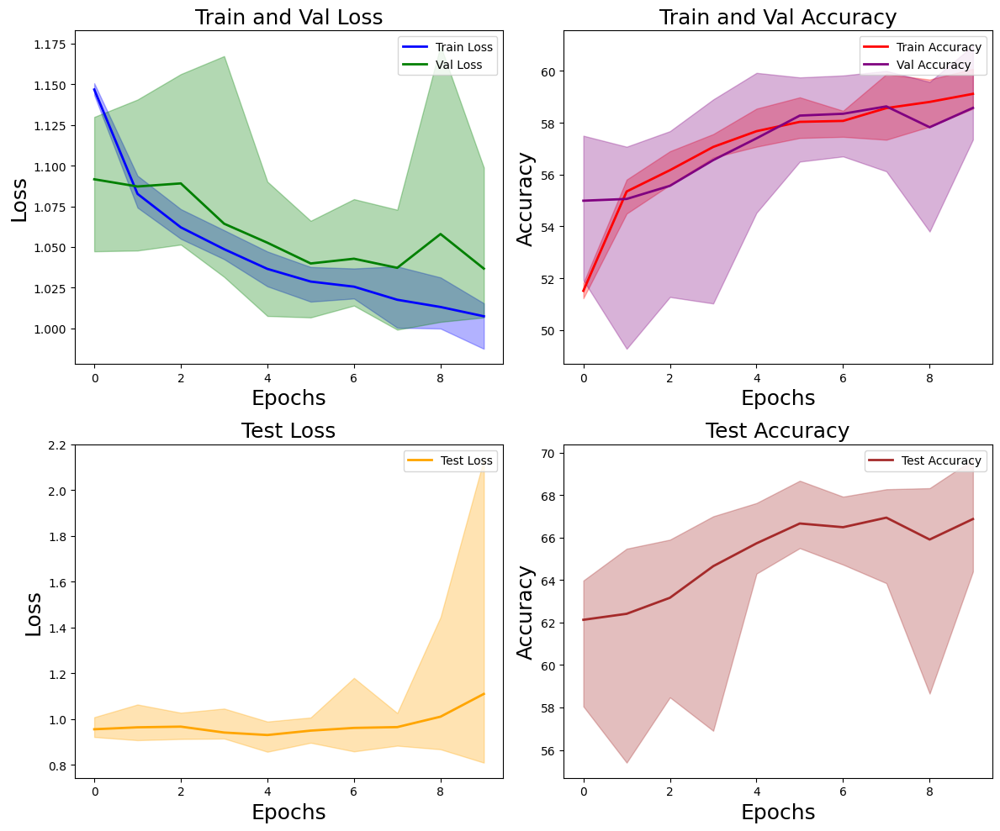

Data saved to forward_c10_mlp.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=0.0005,
    batch_size=32,
    num_epochs=10,
    times=10,
    method='forward',
    T_matrix=T_matrix,
    model_name='mlp',
    csv_path='forward_c10_mlp.csv',
)

mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 68.02it/s]


Noisy Loss: 1.2477,Validation Loss: 0.9690, Accuracy: 56.50% (2260/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.58it/s]


Test Loss: 0.9476, Accuracy: 64.30% (2572/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.36it/s] 


Noisy Loss: 1.2376,Validation Loss: 0.9418, Accuracy: 55.83% (2233/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.93it/s]


Test Loss: 0.9232, Accuracy: 63.73% (2549/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 70.99it/s] 


Noisy Loss: 1.2258,Validation Loss: 0.9054, Accuracy: 57.85% (2314/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.28it/s]


Test Loss: 0.8799, Accuracy: 65.97% (2639/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.86it/s] 


Noisy Loss: 1.2169,Validation Loss: 0.8860, Accuracy: 58.55% (2342/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.72it/s]


Test Loss: 0.8600, Accuracy: 67.28% (2691/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 70.88it/s] 


Noisy Loss: 1.2138,Validation Loss: 0.8877, Accuracy: 58.45% (2338/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.40it/s]


Test Loss: 0.8844, Accuracy: 66.55% (2662/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.32it/s] 


Noisy Loss: 1.2398,Validation Loss: 0.9601, Accuracy: 56.10% (2244/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.72it/s]


Test Loss: 0.9489, Accuracy: 63.98% (2559/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 66.20it/s]


Noisy Loss: 1.2253,Validation Loss: 0.9214, Accuracy: 57.20% (2288/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.66it/s]


Test Loss: 0.9252, Accuracy: 66.50% (2660/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 66.86it/s]


Noisy Loss: 1.2200,Validation Loss: 0.9013, Accuracy: 57.38% (2295/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.25it/s]


Test Loss: 0.9178, Accuracy: 65.35% (2614/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.00it/s] 


Noisy Loss: 1.2089,Validation Loss: 0.8642, Accuracy: 59.10% (2364/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.04it/s]


Test Loss: 1.0022, Accuracy: 66.95% (2678/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 66.55it/s] 


Noisy Loss: 1.2032,Validation Loss: 0.8421, Accuracy: 59.90% (2396/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.98it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 0.9239, Accuracy: 67.95% (2718/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.93it/s]


Test Loss: 0.9239, Accuracy: 67.95% (2718/4000)
finished  1  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 64.06it/s]


Noisy Loss: 1.2461,Validation Loss: 0.9683, Accuracy: 54.62% (2185/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.73it/s]


Test Loss: 0.9473, Accuracy: 62.58% (2503/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 71.95it/s] 


Noisy Loss: 1.2400,Validation Loss: 0.9500, Accuracy: 55.83% (2233/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.43it/s]


Test Loss: 0.9228, Accuracy: 64.17% (2567/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 70.73it/s] 


Noisy Loss: 1.2250,Validation Loss: 0.9017, Accuracy: 56.62% (2265/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.17it/s]


Test Loss: 0.8938, Accuracy: 65.50% (2620/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 70.14it/s] 


Noisy Loss: 1.2389,Validation Loss: 0.9671, Accuracy: 53.98% (2159/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.27it/s]


Test Loss: 1.0204, Accuracy: 61.77% (2471/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 70.82it/s] 


Noisy Loss: 1.2204,Validation Loss: 0.9003, Accuracy: 57.02% (2281/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.30it/s]


Test Loss: 0.8998, Accuracy: 66.28% (2651/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 66.41it/s]


Noisy Loss: 1.2096,Validation Loss: 0.8491, Accuracy: 58.33% (2333/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.06it/s]


Test Loss: 0.9295, Accuracy: 67.05% (2682/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.41it/s] 


Noisy Loss: 1.2169,Validation Loss: 0.8769, Accuracy: 58.48% (2339/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.20it/s]


Test Loss: 0.8724, Accuracy: 67.47% (2699/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.74it/s] 


Noisy Loss: 1.2114,Validation Loss: 0.8657, Accuracy: 58.52% (2341/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.14it/s]


Test Loss: 0.9024, Accuracy: 67.05% (2682/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 66.24it/s]


Noisy Loss: 1.2214,Validation Loss: 0.8848, Accuracy: 56.85% (2274/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.95it/s]


Test Loss: 1.1221, Accuracy: 65.58% (2623/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 70.92it/s] 


Noisy Loss: 1.2180,Validation Loss: 0.8760, Accuracy: 57.25% (2290/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.66it/s]


Test Loss: 1.0458, Accuracy: 66.40% (2656/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.37it/s]


Test Loss: 0.9295, Accuracy: 67.05% (2682/4000)
finished  2  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.70it/s]


Noisy Loss: 1.2406,Validation Loss: 0.9538, Accuracy: 55.98% (2239/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.68it/s]


Test Loss: 0.9478, Accuracy: 61.23% (2449/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 67.65it/s] 


Noisy Loss: 1.2309,Validation Loss: 0.9177, Accuracy: 55.98% (2239/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.83it/s]


Test Loss: 0.9131, Accuracy: 65.00% (2600/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 68.42it/s]


Noisy Loss: 1.2363,Validation Loss: 0.9367, Accuracy: 54.25% (2170/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.10it/s]


Test Loss: 1.0183, Accuracy: 60.73% (2429/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 68.29it/s] 


Noisy Loss: 1.2169,Validation Loss: 0.8776, Accuracy: 58.45% (2338/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.01it/s]


Test Loss: 0.9224, Accuracy: 67.20% (2688/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 65.15it/s] 


Noisy Loss: 1.2134,Validation Loss: 0.8804, Accuracy: 59.55% (2382/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.65it/s]


Test Loss: 0.9181, Accuracy: 66.92% (2677/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.89it/s] 


Noisy Loss: 1.2077,Validation Loss: 0.8451, Accuracy: 57.70% (2308/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.40it/s]


Test Loss: 0.9655, Accuracy: 65.70% (2628/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 70.22it/s] 


Noisy Loss: 1.2073,Validation Loss: 0.8447, Accuracy: 59.80% (2392/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.07it/s]


Test Loss: 0.8658, Accuracy: 67.58% (2703/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 71.16it/s] 


Noisy Loss: 1.2395,Validation Loss: 0.9336, Accuracy: 54.27% (2171/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.28it/s]


Test Loss: 0.9940, Accuracy: 59.35% (2374/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.84it/s] 


Noisy Loss: 1.2148,Validation Loss: 0.8773, Accuracy: 59.12% (2365/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 140.33it/s]


Test Loss: 0.9804, Accuracy: 66.33% (2653/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.17it/s] 


Noisy Loss: 1.2118,Validation Loss: 0.8554, Accuracy: 59.40% (2376/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.25it/s]


Test Loss: 0.8951, Accuracy: 67.25% (2690/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.85it/s]


Test Loss: 0.8658, Accuracy: 67.58% (2703/4000)
finished  3  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 71.53it/s] 


Noisy Loss: 1.2402,Validation Loss: 0.9455, Accuracy: 56.62% (2265/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.89it/s]


Test Loss: 0.9266, Accuracy: 64.20% (2568/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 68.14it/s] 


Noisy Loss: 1.2310,Validation Loss: 0.9167, Accuracy: 56.33% (2253/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.65it/s]


Test Loss: 0.9563, Accuracy: 65.35% (2614/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 67.69it/s] 


Noisy Loss: 1.2372,Validation Loss: 0.9418, Accuracy: 54.45% (2178/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.87it/s]


Test Loss: 1.0518, Accuracy: 60.23% (2409/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 70.15it/s] 


Noisy Loss: 1.2367,Validation Loss: 0.9375, Accuracy: 56.52% (2261/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.59it/s]


Test Loss: 0.9602, Accuracy: 64.70% (2588/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 70.38it/s] 


Noisy Loss: 1.2176,Validation Loss: 0.8594, Accuracy: 57.27% (2291/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.22it/s]


Test Loss: 0.9271, Accuracy: 66.47% (2659/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 67.92it/s]


Noisy Loss: 1.2133,Validation Loss: 0.8589, Accuracy: 58.38% (2335/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.91it/s]


Test Loss: 0.9179, Accuracy: 66.62% (2665/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 65.92it/s] 


Noisy Loss: 1.2271,Validation Loss: 0.9003, Accuracy: 57.55% (2302/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.73it/s]


Test Loss: 1.0385, Accuracy: 66.55% (2662/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 68.27it/s] 


Noisy Loss: 1.2079,Validation Loss: 0.8512, Accuracy: 59.10% (2364/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.71it/s]


Test Loss: 1.0108, Accuracy: 68.05% (2722/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 66.24it/s] 


Noisy Loss: 1.2129,Validation Loss: 0.8686, Accuracy: 57.25% (2290/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.41it/s]


Test Loss: 0.9205, Accuracy: 66.80% (2672/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 68.59it/s] 


Noisy Loss: 1.2087,Validation Loss: 0.8485, Accuracy: 58.08% (2323/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.89it/s]


Test Loss: 1.0389, Accuracy: 66.47% (2659/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.91it/s]


Test Loss: 1.0389, Accuracy: 66.47% (2659/4000)
finished  4  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 66.50it/s]


Noisy Loss: 1.2416,Validation Loss: 0.9491, Accuracy: 55.40% (2216/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.70it/s]


Test Loss: 0.9650, Accuracy: 61.23% (2449/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 70.87it/s] 


Noisy Loss: 1.2286,Validation Loss: 0.9156, Accuracy: 57.55% (2302/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.76it/s]


Test Loss: 0.8918, Accuracy: 65.03% (2601/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 71.01it/s] 


Noisy Loss: 1.2216,Validation Loss: 0.8898, Accuracy: 57.02% (2281/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.01it/s]


Test Loss: 0.9535, Accuracy: 65.47% (2619/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 71.15it/s] 


Noisy Loss: 1.2277,Validation Loss: 0.9073, Accuracy: 57.55% (2302/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.40it/s]


Test Loss: 0.9472, Accuracy: 64.00% (2560/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 65.42it/s]


Noisy Loss: 1.2180,Validation Loss: 0.8754, Accuracy: 58.95% (2358/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.80it/s]


Test Loss: 0.8715, Accuracy: 67.03% (2681/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.13it/s]


Noisy Loss: 1.2254,Validation Loss: 0.8956, Accuracy: 57.48% (2299/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.75it/s]


Test Loss: 0.8948, Accuracy: 65.88% (2635/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 68.33it/s] 


Noisy Loss: 1.2083,Validation Loss: 0.8445, Accuracy: 59.48% (2379/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.01it/s]


Test Loss: 0.9157, Accuracy: 68.15% (2726/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 68.46it/s] 


Noisy Loss: 1.1955,Validation Loss: 0.8030, Accuracy: 60.30% (2412/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.64it/s]


Test Loss: 0.8905, Accuracy: 67.85% (2714/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.30it/s] 


Noisy Loss: 1.2116,Validation Loss: 0.8485, Accuracy: 58.52% (2341/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.96it/s]


Test Loss: 0.9693, Accuracy: 66.97% (2679/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 65.95it/s] 


Noisy Loss: 1.2133,Validation Loss: 0.8744, Accuracy: 57.85% (2314/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.36it/s]


Test Loss: 1.0703, Accuracy: 64.60% (2584/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.44it/s]


Test Loss: 0.8905, Accuracy: 67.85% (2714/4000)
finished  5  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.15it/s] 


Noisy Loss: 1.2651,Validation Loss: 1.0012, Accuracy: 50.25% (2010/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.26it/s]


Test Loss: 1.0398, Accuracy: 56.40% (2256/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 68.54it/s] 


Noisy Loss: 1.2345,Validation Loss: 0.9361, Accuracy: 55.52% (2221/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.90it/s]


Test Loss: 0.9649, Accuracy: 63.00% (2520/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 67.50it/s] 


Noisy Loss: 1.2251,Validation Loss: 0.8878, Accuracy: 56.52% (2261/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.06it/s]


Test Loss: 0.9526, Accuracy: 63.40% (2536/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 67.92it/s] 


Noisy Loss: 1.2305,Validation Loss: 0.9127, Accuracy: 58.05% (2322/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.46it/s]


Test Loss: 0.9045, Accuracy: 66.65% (2666/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 70.38it/s] 


Noisy Loss: 1.2142,Validation Loss: 0.8944, Accuracy: 58.90% (2356/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.78it/s]


Test Loss: 0.9104, Accuracy: 66.53% (2661/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 68.29it/s]


Noisy Loss: 1.2097,Validation Loss: 0.8543, Accuracy: 60.12% (2405/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.24it/s]


Test Loss: 0.9326, Accuracy: 66.58% (2663/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 68.16it/s]


Noisy Loss: 1.2093,Validation Loss: 0.8557, Accuracy: 59.80% (2392/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.01it/s]


Test Loss: 1.0674, Accuracy: 67.00% (2680/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.54it/s] 


Noisy Loss: 1.2141,Validation Loss: 0.8612, Accuracy: 58.20% (2328/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.85it/s]


Test Loss: 1.0326, Accuracy: 65.38% (2615/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 66.14it/s] 


Noisy Loss: 1.2026,Validation Loss: 0.8386, Accuracy: 60.17% (2407/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.99it/s]


Test Loss: 0.8436, Accuracy: 67.20% (2688/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.38it/s] 


Noisy Loss: 1.2164,Validation Loss: 0.8751, Accuracy: 59.55% (2382/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.85it/s]


Test Loss: 0.8558, Accuracy: 67.45% (2698/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.09it/s]


Test Loss: 0.8436, Accuracy: 67.20% (2688/4000)
finished  6  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 66.77it/s] 


Noisy Loss: 1.2375,Validation Loss: 0.9456, Accuracy: 56.83% (2273/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 132.00it/s]


Test Loss: 0.9337, Accuracy: 62.90% (2516/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 65.85it/s]


Noisy Loss: 1.2375,Validation Loss: 0.9326, Accuracy: 56.62% (2265/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.66it/s]


Test Loss: 0.9179, Accuracy: 63.27% (2531/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.14it/s] 


Noisy Loss: 1.2175,Validation Loss: 0.8983, Accuracy: 58.00% (2320/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.13it/s]


Test Loss: 0.9278, Accuracy: 64.58% (2583/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.17it/s]


Noisy Loss: 1.2157,Validation Loss: 0.8945, Accuracy: 58.33% (2333/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.19it/s]


Test Loss: 0.9611, Accuracy: 65.45% (2618/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 68.07it/s] 


Noisy Loss: 1.2213,Validation Loss: 0.9022, Accuracy: 58.38% (2335/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.85it/s]


Test Loss: 1.0211, Accuracy: 64.92% (2597/4000)


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 71.67it/s] 


Noisy Loss: 1.1989,Validation Loss: 0.8478, Accuracy: 61.38% (2455/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.37it/s]


Test Loss: 0.8934, Accuracy: 69.15% (2766/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 68.97it/s] 


Noisy Loss: 1.2010,Validation Loss: 0.8468, Accuracy: 60.45% (2418/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.86it/s]


Test Loss: 0.9829, Accuracy: 67.22% (2689/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 62.90it/s]


Noisy Loss: 1.2142,Validation Loss: 0.8682, Accuracy: 58.83% (2353/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.03it/s]


Test Loss: 1.0095, Accuracy: 65.62% (2625/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.60it/s] 


Noisy Loss: 1.2075,Validation Loss: 0.8591, Accuracy: 59.02% (2361/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.05it/s]


Test Loss: 1.0544, Accuracy: 65.33% (2613/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 67.04it/s]


Noisy Loss: 1.2019,Validation Loss: 0.8283, Accuracy: 60.50% (2420/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.64it/s]


Test Loss: 0.9742, Accuracy: 67.70% (2708/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.51it/s]


Test Loss: 0.9742, Accuracy: 67.70% (2708/4000)
finished  7  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 66.83it/s]


Noisy Loss: 1.2583,Validation Loss: 1.0120, Accuracy: 50.95% (2038/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.71it/s]


Test Loss: 0.9857, Accuracy: 59.98% (2399/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 67.40it/s]


Noisy Loss: 1.2299,Validation Loss: 0.9189, Accuracy: 58.10% (2324/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.86it/s]


Test Loss: 0.9191, Accuracy: 65.47% (2619/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 70.83it/s] 


Noisy Loss: 1.2419,Validation Loss: 0.9812, Accuracy: 53.00% (2120/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.54it/s]


Test Loss: 1.0002, Accuracy: 60.00% (2400/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 70.98it/s] 


Noisy Loss: 1.2315,Validation Loss: 0.9463, Accuracy: 55.35% (2214/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.79it/s]


Test Loss: 0.9216, Accuracy: 63.62% (2545/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.80it/s] 


Noisy Loss: 1.2275,Validation Loss: 0.9054, Accuracy: 58.02% (2321/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.87it/s]


Test Loss: 0.9553, Accuracy: 66.83% (2673/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.34it/s] 


Noisy Loss: 1.2267,Validation Loss: 0.8910, Accuracy: 57.65% (2306/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.04it/s]


Test Loss: 0.9027, Accuracy: 66.15% (2646/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 67.35it/s] 


Noisy Loss: 1.2188,Validation Loss: 0.8897, Accuracy: 59.05% (2362/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.61it/s]


Test Loss: 0.8876, Accuracy: 67.28% (2691/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.52it/s] 


Noisy Loss: 1.2119,Validation Loss: 0.8663, Accuracy: 59.20% (2368/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.63it/s]


Test Loss: 1.1185, Accuracy: 65.95% (2638/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.86it/s]


Noisy Loss: 1.2096,Validation Loss: 0.8535, Accuracy: 58.92% (2357/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.28it/s]


Test Loss: 1.2294, Accuracy: 67.30% (2692/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.62it/s] 


Noisy Loss: 1.2152,Validation Loss: 0.8710, Accuracy: 57.85% (2314/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.02it/s]


Test Loss: 0.9607, Accuracy: 65.12% (2605/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.88it/s]


Test Loss: 1.2294, Accuracy: 67.30% (2692/4000)
finished  8  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.41it/s] 


Noisy Loss: 1.2510,Validation Loss: 0.9580, Accuracy: 52.70% (2108/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.46it/s]


Test Loss: 0.9972, Accuracy: 59.88% (2395/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.87it/s] 


Noisy Loss: 1.2531,Validation Loss: 0.9793, Accuracy: 52.30% (2092/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.18it/s]


Test Loss: 1.0240, Accuracy: 58.38% (2335/4000)


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 67.88it/s] 


Noisy Loss: 1.2263,Validation Loss: 0.9016, Accuracy: 57.60% (2304/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.55it/s]


Test Loss: 0.9102, Accuracy: 66.67% (2667/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 67.90it/s] 


Noisy Loss: 1.2352,Validation Loss: 0.9451, Accuracy: 56.25% (2250/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.42it/s]


Test Loss: 1.0100, Accuracy: 63.60% (2544/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.62it/s] 


Noisy Loss: 1.2150,Validation Loss: 0.8595, Accuracy: 57.65% (2306/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.07it/s]


Test Loss: 1.0248, Accuracy: 64.15% (2566/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.31it/s] 


Noisy Loss: 1.2188,Validation Loss: 0.8870, Accuracy: 57.90% (2316/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.91it/s]


Test Loss: 1.0262, Accuracy: 66.08% (2643/4000)


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 66.58it/s]


Noisy Loss: 1.2114,Validation Loss: 0.8529, Accuracy: 58.92% (2357/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 138.77it/s]


Test Loss: 0.9228, Accuracy: 68.70% (2748/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 70.96it/s] 


Noisy Loss: 1.2167,Validation Loss: 0.8846, Accuracy: 58.48% (2339/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.91it/s]


Test Loss: 0.9199, Accuracy: 67.25% (2690/4000)


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 68.02it/s]


Noisy Loss: 1.2103,Validation Loss: 0.8514, Accuracy: 58.70% (2348/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.58it/s]


Test Loss: 0.9610, Accuracy: 66.50% (2660/4000)
Saved Best Model


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 66.52it/s] 


Noisy Loss: 1.2137,Validation Loss: 0.8644, Accuracy: 59.83% (2393/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.64it/s]


Test Loss: 1.1390, Accuracy: 67.22% (2689/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.39it/s]


Test Loss: 0.9610, Accuracy: 66.50% (2660/4000)
finished  9  epoch
mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.16it/s] 


Noisy Loss: 1.2433,Validation Loss: 0.9698, Accuracy: 53.85% (2154/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.06it/s]


Test Loss: 0.9868, Accuracy: 60.90% (2436/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 66.85it/s]


Noisy Loss: 1.2328,Validation Loss: 0.9216, Accuracy: 57.83% (2313/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.81it/s]


Test Loss: 0.9295, Accuracy: 65.42% (2617/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 68.34it/s] 


Noisy Loss: 1.2276,Validation Loss: 0.9411, Accuracy: 56.83% (2273/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 125.94it/s]


Test Loss: 1.0003, Accuracy: 64.10% (2564/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 67.46it/s] 


Noisy Loss: 1.2233,Validation Loss: 0.9102, Accuracy: 57.98% (2319/4000)


Testing: 100%|██████████| 125/125 [00:01<00:00, 122.67it/s]


Test Loss: 0.9338, Accuracy: 64.90% (2596/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.97it/s]


Noisy Loss: 1.2236,Validation Loss: 0.8955, Accuracy: 58.08% (2323/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.39it/s]


Test Loss: 0.9589, Accuracy: 65.80% (2632/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 66.94it/s]


Noisy Loss: 1.2134,Validation Loss: 0.8651, Accuracy: 59.65% (2386/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.45it/s]


Test Loss: 0.9936, Accuracy: 67.17% (2687/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.55it/s] 


Noisy Loss: 1.2155,Validation Loss: 0.8700, Accuracy: 59.10% (2364/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.74it/s]


Test Loss: 0.9154, Accuracy: 67.30% (2692/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.46it/s]


Noisy Loss: 1.2082,Validation Loss: 0.8601, Accuracy: 59.00% (2360/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.74it/s]


Test Loss: 1.0473, Accuracy: 66.75% (2670/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 68.18it/s] 


Noisy Loss: 1.2227,Validation Loss: 0.8877, Accuracy: 57.70% (2308/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.09it/s]


Test Loss: 1.1383, Accuracy: 63.85% (2554/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 67.31it/s]


Noisy Loss: 1.2096,Validation Loss: 0.8484, Accuracy: 60.92% (2437/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 136.18it/s]


Test Loss: 1.1080, Accuracy: 68.35% (2734/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 129.35it/s]


Test Loss: 1.1080, Accuracy: 68.35% (2734/4000)
finished  10  epoch
min_train_loss [0.853615821480751, 0.8622355262041091, 0.8670460304021835, 0.8529443457126618, 0.8565252033472062, 0.8824142677783966, 0.8479100413322449, 0.874905737400055, 0.8509840424060822, 0.8679586772918702]
min_val_loss [0.8421472609043121, 0.8490664925575256, 0.8446791887283325, 0.8484548177719117, 0.8030117998123169, 0.8386018381118775, 0.8283209185600281, 0.8534979982376099, 0.8514099946022033, 0.8484270262718201]
min_train_accuracy [59.14375, 59.09375, 58.2375, 58.85625, 59.3125, 57.9125, 59.15, 58.5875, 59.3375, 58.90625]
min_val_accuracy [59.9, 58.325, 59.8, 58.075, 60.3, 60.175, 60.5, 58.925, 58.7, 60.925]
min_train_noise_loss [1.206623232126236, 1.2101444163322448, 1.2114287567138673, 1.2072935421466828, 1.2074053130149842, 1.2169049482345582, 1.20589865899086, 1.2130397102832795, 1.2055379750728608, 1.2104342398643493]
min_val_noise_loss [1.2032377958297729, 1.209565878868103, 1.2073422842025756, 1.2087

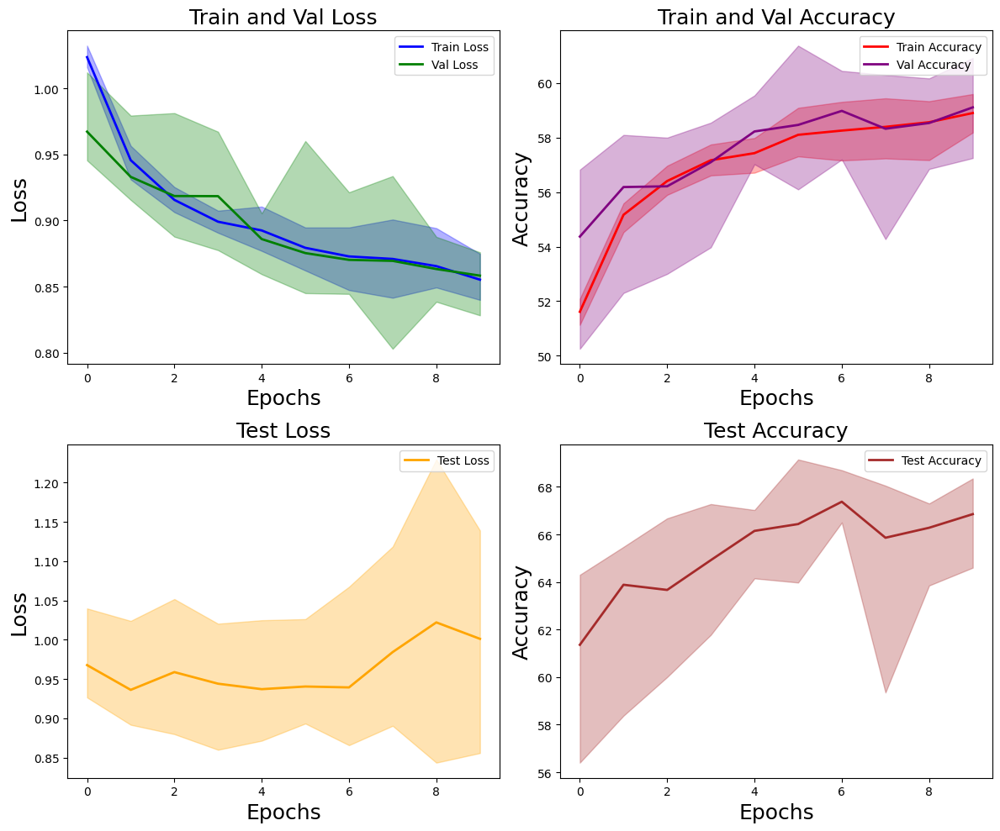

Data saved to importance_c10_mlp.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=0.0005,
    batch_size=32,
    num_epochs=10,
    times=10,
    method='importance',
    T_matrix=T_matrix,
    model_name='mlp',
    csv_path='importance_c10_mlp.csv',
)

mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 71.24it/s] 


Noisy Loss: 1.2493,Validation Loss: 0.9706, Accuracy: 55.65% (2226/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 137.38it/s]


Test Loss: 0.9448, Accuracy: 63.02% (2521/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 66.09it/s]


Noisy Loss: 1.2335,Validation Loss: 0.9200, Accuracy: 56.55% (2262/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.74it/s]


Test Loss: 0.9343, Accuracy: 64.65% (2586/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 66.88it/s] 


Noisy Loss: 1.2221,Validation Loss: 0.8868, Accuracy: 58.30% (2332/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.94it/s]


Test Loss: 0.9285, Accuracy: 65.55% (2622/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 66.64it/s]


Noisy Loss: 1.2308,Validation Loss: 0.9071, Accuracy: 56.33% (2253/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.84it/s]


Test Loss: 0.9270, Accuracy: 63.15% (2526/4000)


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 66.66it/s] 


Noisy Loss: 1.2102,Validation Loss: 0.8581, Accuracy: 57.30% (2292/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.59it/s]


Test Loss: 0.8824, Accuracy: 67.30% (2692/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 68.86it/s] 


Noisy Loss: 1.2111,Validation Loss: 0.8536, Accuracy: 58.02% (2321/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.99it/s]


Test Loss: 0.9918, Accuracy: 65.95% (2638/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.20it/s] 


Noisy Loss: 1.2040,Validation Loss: 0.8388, Accuracy: 59.45% (2378/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.19it/s]


Test Loss: 0.8481, Accuracy: 68.05% (2722/4000)
Saved Best Model


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 68.38it/s]


Noisy Loss: 1.2000,Validation Loss: 0.8135, Accuracy: 60.52% (2421/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 135.33it/s]


Test Loss: 0.8447, Accuracy: 69.15% (2766/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 66.41it/s]


Noisy Loss: 1.2121,Validation Loss: 0.8736, Accuracy: 59.35% (2374/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.51it/s]


Test Loss: 0.9014, Accuracy: 67.53% (2701/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 68.25it/s] 


Noisy Loss: 1.2331,Validation Loss: 0.8801, Accuracy: 54.08% (2163/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.61it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 1.4706, Accuracy: 62.23% (2489/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.26it/s]


Test Loss: 0.8447, Accuracy: 69.15% (2766/4000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.55it/s]


Noisy Loss: 1.3219,Validation Loss: 0.8570, Accuracy: 56.73% (2269/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.45it/s]


Test Loss: 0.8186, Accuracy: 68.40% (2736/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.72it/s]


Noisy Loss: 1.3219,Validation Loss: 0.8531, Accuracy: 57.15% (2286/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.46it/s]


Test Loss: 0.8201, Accuracy: 68.15% (2726/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.46it/s]


Noisy Loss: 1.3216,Validation Loss: 0.8509, Accuracy: 57.23% (2289/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.72it/s]


Test Loss: 0.8169, Accuracy: 68.62% (2745/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.35it/s]


Noisy Loss: 1.3211,Validation Loss: 0.8438, Accuracy: 56.95% (2278/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.79it/s]


Test Loss: 0.8139, Accuracy: 68.60% (2744/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.63it/s]


Noisy Loss: 1.3218,Validation Loss: 0.8528, Accuracy: 56.88% (2275/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.27it/s]


Test Loss: 0.8113, Accuracy: 68.53% (2741/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.90it/s]


Test Loss: 0.8139, Accuracy: 68.60% (2744/4000)
finished  1  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.25it/s]


Noisy Loss: 1.3219,Validation Loss: 0.8458, Accuracy: 56.33% (2253/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.17it/s]


Test Loss: 0.8293, Accuracy: 68.58% (2743/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.58it/s]


Noisy Loss: 1.3220,Validation Loss: 0.8462, Accuracy: 56.17% (2247/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.04it/s]


Test Loss: 0.8316, Accuracy: 68.38% (2735/4000)


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.71it/s]


Noisy Loss: 1.3220,Validation Loss: 0.8453, Accuracy: 56.77% (2271/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.36it/s]


Test Loss: 0.8248, Accuracy: 68.25% (2730/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.66it/s]


Noisy Loss: 1.3221,Validation Loss: 0.8445, Accuracy: 56.38% (2255/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.84it/s]


Test Loss: 0.8255, Accuracy: 68.40% (2736/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.63it/s]


Noisy Loss: 1.3213,Validation Loss: 0.8347, Accuracy: 56.58% (2263/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.72it/s]


Test Loss: 0.8307, Accuracy: 68.70% (2748/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.74it/s]


Test Loss: 0.8307, Accuracy: 68.70% (2748/4000)
finished  2  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.55it/s]


Noisy Loss: 1.3204,Validation Loss: 0.8420, Accuracy: 58.15% (2326/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.95it/s]


Test Loss: 0.8256, Accuracy: 68.12% (2725/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.57it/s]


Noisy Loss: 1.3194,Validation Loss: 0.8300, Accuracy: 58.25% (2330/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.68it/s]


Test Loss: 0.8340, Accuracy: 68.60% (2744/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.74it/s]


Noisy Loss: 1.3196,Validation Loss: 0.8283, Accuracy: 58.33% (2333/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.09it/s]


Test Loss: 0.8276, Accuracy: 68.22% (2729/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.42it/s]


Noisy Loss: 1.3198,Validation Loss: 0.8309, Accuracy: 58.35% (2334/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.46it/s]


Test Loss: 0.8097, Accuracy: 68.40% (2736/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.77it/s]


Noisy Loss: 1.3194,Validation Loss: 0.8246, Accuracy: 58.42% (2337/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.81it/s]


Test Loss: 0.8193, Accuracy: 68.20% (2728/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.12it/s]


Test Loss: 0.8193, Accuracy: 68.20% (2728/4000)
finished  3  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.47it/s]


Noisy Loss: 1.3184,Validation Loss: 0.8140, Accuracy: 56.95% (2278/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.08it/s]


Test Loss: 0.8260, Accuracy: 68.40% (2736/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.55it/s]


Noisy Loss: 1.3189,Validation Loss: 0.8195, Accuracy: 57.00% (2280/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.74it/s]


Test Loss: 0.8183, Accuracy: 68.30% (2732/4000)


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.48it/s]


Noisy Loss: 1.3183,Validation Loss: 0.8072, Accuracy: 57.08% (2283/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.99it/s]


Test Loss: 0.8125, Accuracy: 68.47% (2739/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.65it/s]


Noisy Loss: 1.3183,Validation Loss: 0.8087, Accuracy: 57.10% (2284/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.90it/s]


Test Loss: 0.8288, Accuracy: 68.45% (2738/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.55it/s]


Noisy Loss: 1.3181,Validation Loss: 0.8080, Accuracy: 56.98% (2279/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.79it/s]


Test Loss: 0.8314, Accuracy: 68.50% (2740/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.23it/s]


Test Loss: 0.8125, Accuracy: 68.47% (2739/4000)
finished  4  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.64it/s]


Noisy Loss: 1.3218,Validation Loss: 0.8275, Accuracy: 57.15% (2286/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.93it/s]


Test Loss: 0.8297, Accuracy: 68.33% (2733/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.56it/s]


Noisy Loss: 1.3215,Validation Loss: 0.8295, Accuracy: 57.05% (2282/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.87it/s]


Test Loss: 0.8178, Accuracy: 68.25% (2730/4000)


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.61it/s]


Noisy Loss: 1.3219,Validation Loss: 0.8250, Accuracy: 57.27% (2291/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.24it/s]


Test Loss: 0.8171, Accuracy: 68.10% (2724/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.64it/s]


Noisy Loss: 1.3215,Validation Loss: 0.8228, Accuracy: 57.30% (2292/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.43it/s]


Test Loss: 0.8214, Accuracy: 68.17% (2727/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.57it/s]


Noisy Loss: 1.3215,Validation Loss: 0.8194, Accuracy: 57.33% (2293/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.65it/s]


Test Loss: 0.8193, Accuracy: 68.40% (2736/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.58it/s]


Test Loss: 0.8193, Accuracy: 68.40% (2736/4000)
finished  5  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.62it/s]


Noisy Loss: 1.3182,Validation Loss: 0.8052, Accuracy: 58.08% (2323/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.42it/s]


Test Loss: 0.8142, Accuracy: 68.20% (2728/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.45it/s]


Noisy Loss: 1.3173,Validation Loss: 0.7958, Accuracy: 57.92% (2317/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.76it/s]


Test Loss: 0.8288, Accuracy: 68.55% (2742/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.21it/s]


Noisy Loss: 1.3173,Validation Loss: 0.7943, Accuracy: 57.92% (2317/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.54it/s]


Test Loss: 0.8170, Accuracy: 68.47% (2739/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.53it/s]


Noisy Loss: 1.3181,Validation Loss: 0.8024, Accuracy: 58.15% (2326/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.10it/s]


Test Loss: 0.8149, Accuracy: 68.40% (2736/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.44it/s]


Noisy Loss: 1.3172,Validation Loss: 0.7922, Accuracy: 58.10% (2324/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.68it/s]


Test Loss: 0.8287, Accuracy: 68.38% (2735/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.49it/s]


Test Loss: 0.8287, Accuracy: 68.38% (2735/4000)
finished  6  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.70it/s]


Noisy Loss: 1.3180,Validation Loss: 0.8015, Accuracy: 57.90% (2316/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.87it/s]


Test Loss: 0.8179, Accuracy: 68.38% (2735/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.76it/s]


Noisy Loss: 1.3181,Validation Loss: 0.8012, Accuracy: 58.08% (2323/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.96it/s]


Test Loss: 0.8293, Accuracy: 68.22% (2729/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.57it/s]


Noisy Loss: 1.3173,Validation Loss: 0.7977, Accuracy: 57.45% (2298/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.72it/s]


Test Loss: 0.8115, Accuracy: 68.53% (2741/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.67it/s]


Noisy Loss: 1.3173,Validation Loss: 0.7947, Accuracy: 57.77% (2311/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.02it/s]


Test Loss: 0.8180, Accuracy: 68.55% (2742/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.45it/s]


Noisy Loss: 1.3182,Validation Loss: 0.7972, Accuracy: 58.15% (2326/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.28it/s]


Test Loss: 0.8183, Accuracy: 68.12% (2725/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.95it/s]


Test Loss: 0.8180, Accuracy: 68.55% (2742/4000)
finished  7  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.73it/s]


Noisy Loss: 1.3202,Validation Loss: 0.7922, Accuracy: 56.62% (2265/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.32it/s]


Test Loss: 0.8238, Accuracy: 68.10% (2724/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.43it/s]


Noisy Loss: 1.3207,Validation Loss: 0.7997, Accuracy: 56.55% (2262/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.84it/s]


Test Loss: 0.8129, Accuracy: 68.42% (2737/4000)


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.81it/s]


Noisy Loss: 1.3204,Validation Loss: 0.7898, Accuracy: 56.67% (2267/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.97it/s]


Test Loss: 0.8261, Accuracy: 68.03% (2721/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.02it/s]


Noisy Loss: 1.3202,Validation Loss: 0.7934, Accuracy: 56.67% (2267/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.44it/s]


Test Loss: 0.8164, Accuracy: 68.53% (2741/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  8.90it/s]


Noisy Loss: 1.3202,Validation Loss: 0.7903, Accuracy: 56.70% (2268/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.17it/s]


Test Loss: 0.8233, Accuracy: 68.12% (2725/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.36it/s]


Test Loss: 0.8261, Accuracy: 68.03% (2721/4000)
finished  8  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.50it/s]


Noisy Loss: 1.3203,Validation Loss: 0.7974, Accuracy: 57.92% (2317/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.90it/s]


Test Loss: 0.8230, Accuracy: 68.10% (2724/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.16it/s]


Noisy Loss: 1.3205,Validation Loss: 0.7939, Accuracy: 58.00% (2320/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.05it/s]


Test Loss: 0.8183, Accuracy: 68.55% (2742/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.69it/s]


Noisy Loss: 1.3204,Validation Loss: 0.7913, Accuracy: 58.12% (2325/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.32it/s]


Test Loss: 0.8281, Accuracy: 68.22% (2729/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.43it/s]


Noisy Loss: 1.3206,Validation Loss: 0.7933, Accuracy: 58.33% (2333/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.46it/s]


Test Loss: 0.8259, Accuracy: 68.42% (2737/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.67it/s]


Noisy Loss: 1.3202,Validation Loss: 0.7864, Accuracy: 58.35% (2334/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.24it/s]


Test Loss: 0.8285, Accuracy: 68.00% (2720/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.10it/s]


Test Loss: 0.8285, Accuracy: 68.00% (2720/4000)
finished  9  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.80it/s]


Noisy Loss: 1.3201,Validation Loss: 0.7766, Accuracy: 57.33% (2293/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.93it/s]


Test Loss: 0.8321, Accuracy: 68.22% (2729/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.57it/s]


Noisy Loss: 1.3198,Validation Loss: 0.7711, Accuracy: 57.45% (2298/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.09it/s]


Test Loss: 0.8321, Accuracy: 68.30% (2732/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.45it/s]


Noisy Loss: 1.3200,Validation Loss: 0.7771, Accuracy: 57.55% (2302/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.43it/s]


Test Loss: 0.8176, Accuracy: 68.38% (2735/4000)


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.53it/s]


Noisy Loss: 1.3197,Validation Loss: 0.7708, Accuracy: 57.33% (2293/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.63it/s]


Test Loss: 0.8262, Accuracy: 68.25% (2730/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.45it/s]


Noisy Loss: 1.3200,Validation Loss: 0.7737, Accuracy: 57.23% (2289/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.69it/s]


Test Loss: 0.8267, Accuracy: 68.33% (2733/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.09it/s]


Test Loss: 0.8262, Accuracy: 68.25% (2730/4000)
finished  10  epoch
min_train_loss [0.8685584654883732, 0.8543137784988161, 0.8461897306972079, 0.84204929310178, 0.8303052716785007, 0.8216279735640873, 0.8125446419867258, 0.802638674539233, 0.7893333113382733, 0.7861189331327166]
min_val_loss [0.8437530025839806, 0.8347479663789272, 0.8245698399841785, 0.8071515969932079, 0.8193943873047829, 0.7921859547495842, 0.7946588732302189, 0.7897694669663906, 0.7863777726888657, 0.7707779407501221]
min_train_accuracy [54.525, 55.05, 54.8375, 55.175, 55.2125, 54.85, 55.23125, 55.74375, 55.80625, 56.1]
min_val_accuracy [56.95, 56.575, 58.425, 57.075, 57.325, 58.1, 57.775, 56.675, 58.35, 57.325]
min_train_noise_loss [1.3256479804477994, 1.324772108168829, 1.3250564412465171, 1.324374721163795, 1.3240496620299325, 1.3237916136544847, 1.3236313377107893, 1.3224062087043884, 1.3215516446128723, 1.3218790652259949]
min_val_noise_loss [1.321143202483654, 1.321326456964016, 1.31935915350914, 1.318294368

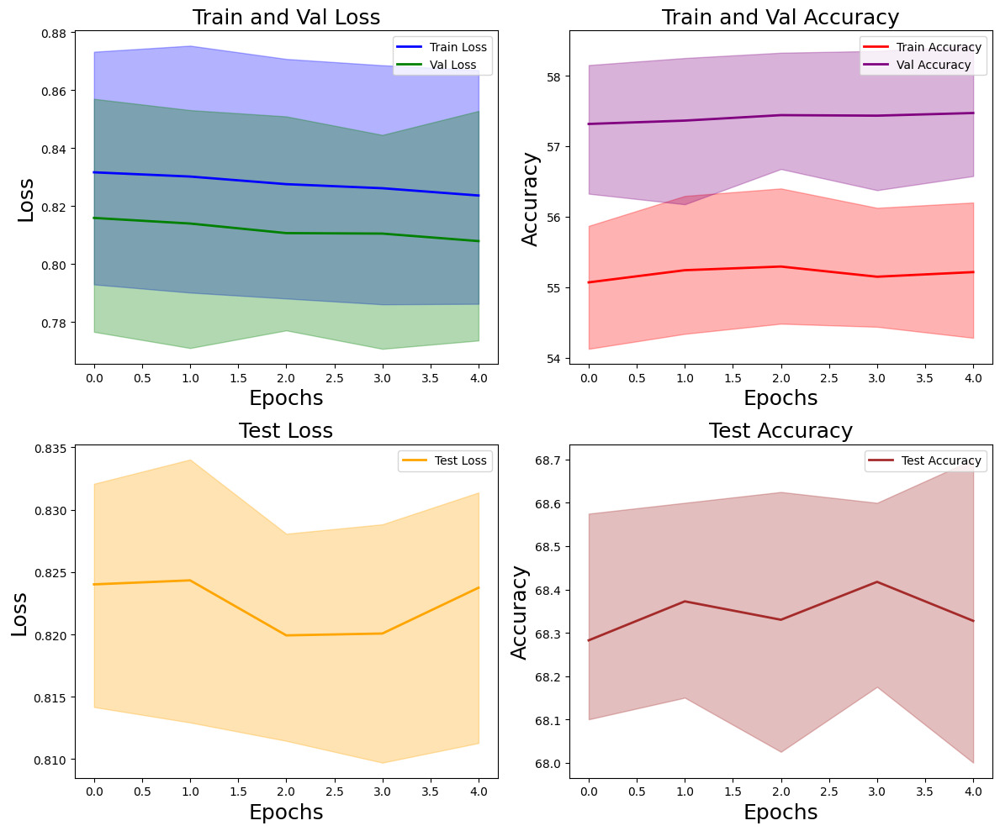

Data saved to t_revision_c10_mlp.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=5e-7,
    batch_size=256,
    num_epochs=5,
    method='t_revision',
    T_matrix=T_matrix,
    num_classes=4,
    optimizer_name='adam',
    times=10,
    model_name='mlp',
    csv_path='t_revision_c10_mlp.csv',
    )

mlp


Epoch 1 Validation: 100%|██████████| 125/125 [00:01<00:00, 68.75it/s] 


Noisy Loss: 1.2490,Validation Loss: 0.9718, Accuracy: 54.27% (2171/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.05it/s]


Test Loss: 0.9497, Accuracy: 62.20% (2488/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.62it/s]


Noisy Loss: 1.2384,Validation Loss: 0.9226, Accuracy: 55.40% (2216/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 133.56it/s]


Test Loss: 0.9429, Accuracy: 62.92% (2517/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 125/125 [00:01<00:00, 68.52it/s] 


Noisy Loss: 1.2353,Validation Loss: 0.9237, Accuracy: 55.65% (2226/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 128.24it/s]


Test Loss: 0.9346, Accuracy: 63.42% (2537/4000)


Epoch 4 Validation: 100%|██████████| 125/125 [00:01<00:00, 65.52it/s]


Noisy Loss: 1.2200,Validation Loss: 0.8985, Accuracy: 56.52% (2261/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 126.48it/s]


Test Loss: 0.9451, Accuracy: 66.10% (2644/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 125/125 [00:01<00:00, 65.01it/s]


Noisy Loss: 1.2193,Validation Loss: 0.8812, Accuracy: 58.25% (2330/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.52it/s]


Test Loss: 0.9673, Accuracy: 65.33% (2613/4000)
Saved Best Model


Epoch 6 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.40it/s] 


Noisy Loss: 1.2190,Validation Loss: 0.8636, Accuracy: 58.73% (2349/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 127.39it/s]


Test Loss: 0.9414, Accuracy: 66.17% (2647/4000)
Saved Best Model


Epoch 7 Validation: 100%|██████████| 125/125 [00:01<00:00, 69.46it/s] 


Noisy Loss: 1.2154,Validation Loss: 0.8798, Accuracy: 57.42% (2297/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 134.43it/s]


Test Loss: 0.9427, Accuracy: 65.97% (2639/4000)


Epoch 8 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.18it/s]


Noisy Loss: 1.2083,Validation Loss: 0.8530, Accuracy: 57.62% (2305/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.83it/s]


Test Loss: 1.0672, Accuracy: 66.92% (2677/4000)
Saved Best Model


Epoch 9 Validation: 100%|██████████| 125/125 [00:01<00:00, 63.80it/s]


Noisy Loss: 1.2242,Validation Loss: 0.8966, Accuracy: 56.48% (2259/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 130.01it/s]


Test Loss: 1.0112, Accuracy: 66.03% (2641/4000)


Epoch 10 Validation: 100%|██████████| 125/125 [00:01<00:00, 68.25it/s] 


Noisy Loss: 1.2049,Validation Loss: 0.8424, Accuracy: 58.92% (2357/4000)


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.56it/s]
<ipython-input-14-809adadbd286>:155: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.lo

Test Loss: 1.0076, Accuracy: 67.05% (2682/4000)
Saved Best Model


Testing: 100%|██████████| 125/125 [00:00<00:00, 131.07it/s]


Test Loss: 1.0076, Accuracy: 67.05% (2682/4000)


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.02it/s]


Noisy Loss: 1.3224,Validation Loss: 0.8040, Accuracy: 62.02% (2481/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.26it/s]


Test Loss: 0.8958, Accuracy: 68.05% (2722/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.75it/s]


Noisy Loss: 1.3216,Validation Loss: 0.7968, Accuracy: 61.95% (2478/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.64it/s]


Test Loss: 0.9168, Accuracy: 67.90% (2716/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.43it/s]


Noisy Loss: 1.3224,Validation Loss: 0.8046, Accuracy: 61.77% (2471/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.28it/s]


Test Loss: 0.8999, Accuracy: 67.78% (2711/4000)


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.55it/s]


Noisy Loss: 1.3229,Validation Loss: 0.8086, Accuracy: 61.92% (2477/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.17it/s]


Test Loss: 0.8901, Accuracy: 67.97% (2719/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.47it/s]


Noisy Loss: 1.3236,Validation Loss: 0.8147, Accuracy: 61.88% (2475/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.29it/s]


Test Loss: 0.8913, Accuracy: 67.65% (2706/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.55it/s]


Test Loss: 0.9168, Accuracy: 67.90% (2716/4000)
finished  1  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.38it/s]


Noisy Loss: 1.3259,Validation Loss: 0.8315, Accuracy: 60.05% (2402/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.60it/s]


Test Loss: 0.8880, Accuracy: 67.83% (2713/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.43it/s]


Noisy Loss: 1.3254,Validation Loss: 0.8298, Accuracy: 60.23% (2409/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.93it/s]


Test Loss: 0.9183, Accuracy: 67.80% (2712/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.31it/s]


Noisy Loss: 1.3253,Validation Loss: 0.8261, Accuracy: 60.27% (2411/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.06it/s]


Test Loss: 0.9146, Accuracy: 68.08% (2723/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.65it/s]


Noisy Loss: 1.3249,Validation Loss: 0.7918, Accuracy: 60.17% (2407/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.19it/s]


Test Loss: 0.9024, Accuracy: 67.78% (2711/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.26it/s]


Noisy Loss: 1.3257,Validation Loss: 0.8279, Accuracy: 60.38% (2415/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.71it/s]


Test Loss: 0.9261, Accuracy: 68.17% (2727/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 17.88it/s]


Test Loss: 0.9024, Accuracy: 67.78% (2711/4000)
finished  2  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.53it/s]


Noisy Loss: 1.3245,Validation Loss: 0.8231, Accuracy: 60.85% (2434/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.40it/s]


Test Loss: 0.8898, Accuracy: 67.67% (2707/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.48it/s]


Noisy Loss: 1.3249,Validation Loss: 0.8222, Accuracy: 61.20% (2448/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.64it/s]


Test Loss: 0.8878, Accuracy: 67.90% (2716/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.45it/s]


Noisy Loss: 1.3245,Validation Loss: 0.8224, Accuracy: 60.98% (2439/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.68it/s]


Test Loss: 0.9046, Accuracy: 67.97% (2719/4000)


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.33it/s]


Noisy Loss: 1.3252,Validation Loss: 0.8260, Accuracy: 60.98% (2439/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 17.82it/s]


Test Loss: 0.9020, Accuracy: 67.90% (2716/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.58it/s]


Noisy Loss: 1.3247,Validation Loss: 0.8227, Accuracy: 60.90% (2436/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.66it/s]


Test Loss: 0.9063, Accuracy: 67.88% (2715/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.69it/s]


Test Loss: 0.8878, Accuracy: 67.90% (2716/4000)
finished  3  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.70it/s]


Noisy Loss: 1.3221,Validation Loss: 0.7973, Accuracy: 62.15% (2486/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.38it/s]


Test Loss: 0.9279, Accuracy: 67.85% (2714/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.35it/s]


Noisy Loss: 1.3224,Validation Loss: 0.8007, Accuracy: 61.85% (2474/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.31it/s]


Test Loss: 0.9151, Accuracy: 67.90% (2716/4000)


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.06it/s]


Noisy Loss: 1.3226,Validation Loss: 0.8015, Accuracy: 61.83% (2473/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.93it/s]


Test Loss: 0.9163, Accuracy: 67.85% (2714/4000)


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.54it/s]


Noisy Loss: 1.3235,Validation Loss: 0.8078, Accuracy: 61.95% (2478/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.69it/s]


Test Loss: 0.9243, Accuracy: 68.28% (2731/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.62it/s]


Noisy Loss: 1.3227,Validation Loss: 0.8023, Accuracy: 61.75% (2470/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.16it/s]


Test Loss: 0.9270, Accuracy: 67.95% (2718/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 17.85it/s]


Test Loss: 0.9279, Accuracy: 67.85% (2714/4000)
finished  4  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.55it/s]


Noisy Loss: 1.3235,Validation Loss: 0.7992, Accuracy: 61.45% (2458/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.85it/s]


Test Loss: 0.8931, Accuracy: 68.17% (2727/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.26it/s]


Noisy Loss: 1.3243,Validation Loss: 0.8062, Accuracy: 61.55% (2462/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.21it/s]


Test Loss: 0.9115, Accuracy: 67.83% (2713/4000)


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.67it/s]


Noisy Loss: 1.3240,Validation Loss: 0.8063, Accuracy: 61.35% (2454/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.50it/s]


Test Loss: 0.8835, Accuracy: 68.08% (2723/4000)


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.47it/s]


Noisy Loss: 1.3250,Validation Loss: 0.8160, Accuracy: 61.42% (2457/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.50it/s]


Test Loss: 0.8847, Accuracy: 67.70% (2708/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  8.96it/s]


Noisy Loss: 1.3241,Validation Loss: 0.8057, Accuracy: 61.38% (2455/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 17.68it/s]


Test Loss: 0.8956, Accuracy: 68.12% (2725/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.19it/s]


Test Loss: 0.8931, Accuracy: 68.17% (2727/4000)
finished  5  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.51it/s]


Noisy Loss: 1.3216,Validation Loss: 0.8099, Accuracy: 62.42% (2497/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.51it/s]


Test Loss: 0.9383, Accuracy: 67.92% (2717/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.46it/s]


Noisy Loss: 1.3225,Validation Loss: 0.8105, Accuracy: 62.02% (2481/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.26it/s]


Test Loss: 0.9075, Accuracy: 67.88% (2715/4000)


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.46it/s]


Noisy Loss: 1.3220,Validation Loss: 0.8059, Accuracy: 62.38% (2495/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.12it/s]


Test Loss: 0.8913, Accuracy: 67.88% (2715/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.39it/s]


Noisy Loss: 1.3218,Validation Loss: 0.8071, Accuracy: 62.42% (2497/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.56it/s]


Test Loss: 0.9164, Accuracy: 67.85% (2714/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.16it/s]


Noisy Loss: 1.3222,Validation Loss: 0.8150, Accuracy: 62.12% (2485/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.86it/s]


Test Loss: 0.9120, Accuracy: 67.45% (2698/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.00it/s]


Test Loss: 0.8913, Accuracy: 67.88% (2715/4000)
finished  6  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.68it/s]


Noisy Loss: 1.3262,Validation Loss: 0.8352, Accuracy: 60.10% (2404/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.29it/s]


Test Loss: 0.8928, Accuracy: 67.92% (2717/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.34it/s]


Noisy Loss: 1.3260,Validation Loss: 0.8332, Accuracy: 60.17% (2407/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 17.85it/s]


Test Loss: 0.8913, Accuracy: 67.83% (2713/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.19it/s]


Noisy Loss: 1.3263,Validation Loss: 0.8237, Accuracy: 60.05% (2402/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.66it/s]


Test Loss: 0.9124, Accuracy: 68.00% (2720/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.44it/s]


Noisy Loss: 1.3267,Validation Loss: 0.8395, Accuracy: 60.35% (2414/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.31it/s]


Test Loss: 0.9047, Accuracy: 68.08% (2723/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.21it/s]


Noisy Loss: 1.3261,Validation Loss: 0.8347, Accuracy: 60.10% (2404/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.36it/s]


Test Loss: 0.9058, Accuracy: 67.83% (2713/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 19.16it/s]


Test Loss: 0.9124, Accuracy: 68.00% (2720/4000)
finished  7  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.26it/s]


Noisy Loss: 1.3224,Validation Loss: 0.7937, Accuracy: 62.65% (2506/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.27it/s]


Test Loss: 0.8825, Accuracy: 68.15% (2726/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  8.88it/s]


Noisy Loss: 1.3225,Validation Loss: 0.7953, Accuracy: 62.65% (2506/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 17.45it/s]


Test Loss: 0.8916, Accuracy: 67.90% (2716/4000)


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.45it/s]


Noisy Loss: 1.3222,Validation Loss: 0.7917, Accuracy: 62.40% (2496/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.65it/s]


Test Loss: 0.8942, Accuracy: 68.25% (2730/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.51it/s]


Noisy Loss: 1.3219,Validation Loss: 0.7895, Accuracy: 62.45% (2498/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.41it/s]


Test Loss: 0.9017, Accuracy: 68.15% (2726/4000)
Saved Best Model


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.58it/s]


Noisy Loss: 1.3217,Validation Loss: 0.7882, Accuracy: 62.33% (2493/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.73it/s]


Test Loss: 0.8971, Accuracy: 68.15% (2726/4000)
Saved Best Model


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.01it/s]


Test Loss: 0.8971, Accuracy: 68.15% (2726/4000)
finished  8  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.55it/s]


Noisy Loss: 1.3242,Validation Loss: 0.8052, Accuracy: 61.27% (2451/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.48it/s]


Test Loss: 0.9233, Accuracy: 67.78% (2711/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.50it/s]


Noisy Loss: 1.3235,Validation Loss: 0.7992, Accuracy: 61.42% (2457/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.86it/s]


Test Loss: 0.8766, Accuracy: 68.25% (2730/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.43it/s]


Noisy Loss: 1.3244,Validation Loss: 0.8074, Accuracy: 61.27% (2451/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.31it/s]


Test Loss: 0.8878, Accuracy: 67.95% (2718/4000)


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.29it/s]


Noisy Loss: 1.3241,Validation Loss: 0.8033, Accuracy: 61.23% (2449/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.08it/s]


Test Loss: 0.8972, Accuracy: 68.25% (2730/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.33it/s]


Noisy Loss: 1.3240,Validation Loss: 0.8024, Accuracy: 61.35% (2454/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.42it/s]


Test Loss: 0.8918, Accuracy: 68.08% (2723/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.68it/s]


Test Loss: 0.8766, Accuracy: 68.25% (2730/4000)
finished  9  epoch


Epoch 1 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.64it/s]


Noisy Loss: 1.3236,Validation Loss: 0.8099, Accuracy: 60.67% (2427/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.05it/s]


Test Loss: 0.8933, Accuracy: 68.08% (2723/4000)
Saved Best Model


Epoch 2 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.31it/s]


Noisy Loss: 1.3234,Validation Loss: 0.8097, Accuracy: 60.80% (2432/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.69it/s]


Test Loss: 0.9038, Accuracy: 68.08% (2723/4000)
Saved Best Model


Epoch 3 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.64it/s]


Noisy Loss: 1.3235,Validation Loss: 0.8089, Accuracy: 60.85% (2434/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.99it/s]


Test Loss: 0.8982, Accuracy: 68.25% (2730/4000)
Saved Best Model


Epoch 4 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.07it/s]


Noisy Loss: 1.3235,Validation Loss: 0.8098, Accuracy: 60.90% (2436/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 17.73it/s]


Test Loss: 0.8886, Accuracy: 67.95% (2718/4000)


Epoch 5 Validation: 100%|██████████| 16/16 [00:01<00:00,  9.48it/s]


Noisy Loss: 1.3236,Validation Loss: 0.8092, Accuracy: 61.05% (2442/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.32it/s]


Test Loss: 0.8960, Accuracy: 68.22% (2729/4000)


Testing: 100%|██████████| 16/16 [00:00<00:00, 18.25it/s]


Test Loss: 0.8982, Accuracy: 68.25% (2730/4000)
finished  10  epoch
min_train_loss [0.8466002950592647, 0.8446750726018634, 0.8431069813077412, 0.8785439152566213, 0.8282016539384448, 0.8433553103416686, 0.8343396735569787, 0.7186858322885301, 0.8381686040333339, 0.8398943855648949]
min_val_loss [0.7968481592833996, 0.7917723264545202, 0.8221910856664181, 0.797255776822567, 0.799169696867466, 0.8058889545500278, 0.8236952759325504, 0.7882411405444145, 0.7992403581738472, 0.808926310390234]
min_train_accuracy [59.15, 59.2, 59.5, 59.36875, 59.3625, 59.0875, 59.64375, 59.375, 59.76875, 59.8375]
min_val_accuracy [61.95, 60.175, 61.2, 62.15, 61.45, 62.375, 60.05, 62.325, 61.425, 60.85]
min_train_noise_loss [1.207129088659135, 1.205155298823402, 1.2052516691268436, 1.205177002482944, 1.2052192574455625, 1.20594018413907, 1.20233706822471, 1.2044120175497872, 1.2034447022846766, 1.202181136797345]
min_val_noise_loss [1.3215588927268982, 1.3249137327075005, 1.3248722702264786, 1.32214836776256

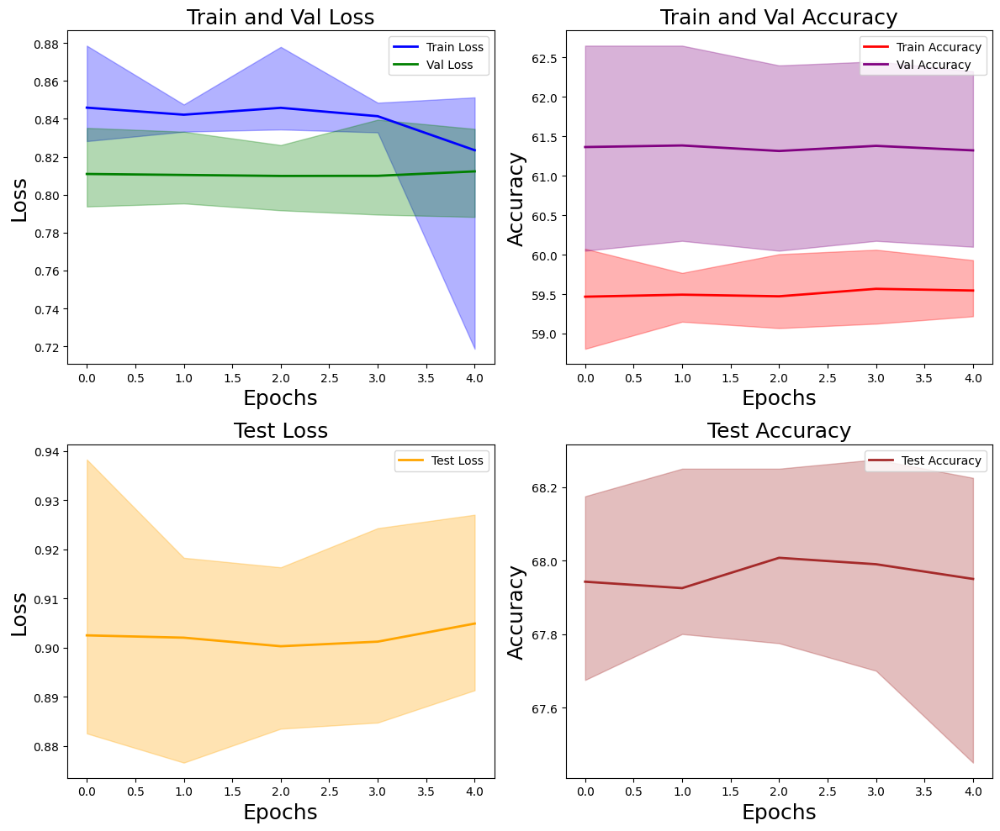

Data saved to t_revision_v2_c10_mlp.csv


In [ ]:
do_experiment(
    X_train_full,
    y_train_full,
    X_test,
    y_test,
    learning_rate=5e-7,
    batch_size=256,
    num_epochs=5,
    method='t_revision_v2',
    T_matrix=T_matrix,
    num_classes=4,
    optimizer_name='adam',
    times=10,
    model_name='mlp',
    csv_path='t_revision_v2_c10_mlp.csv',
    )


## Results Collection

In [ ]:
import os
import pandas as pd

# List of file names
csv_files = [
    'baseline_c10_resnet.csv',
    'forward_c10_resnet.csv',
    'importance_c10_resnet.csv',
    't_revision_c10_resnet.csv',
    'baseline_f3_resnet.csv',
    'forward_f3_resnet.csv',
    'importance_f3_resnet.csv',
    't_revision_f3_resnet.csv',
    'baseline_f6_resnet.csv',
    'forward_f6_resnet.csv',
    'importance_f6_resnet.csv',
    't_revision_f6_resnet.csv',
    'baseline_c10_mlp.csv',
    'forward_c10_mlp.csv',
    'importance_c10_mlp.csv',
    't_revision_c10_mlp.csv',
    'baseline_f3_mlp.csv',
    'forward_f3_mlp.csv',
    'importance_f3_mlp.csv',
    't_revision_f3_mlp.csv',
    'baseline_f6_mlp.csv',
    'forward_f6_mlp.csv',
    'importance_f6_mlp.csv',
    't_revision_f6_mlp.csv',
    't_revision_v2_c10_resnet.csv',
    't_revision_v2_f3_resnet.csv',
    't_revision_v2_f6_resnet.csv',
    't_revision_v2_c10_mlp.csv',
    't_revision_v2_f3_mlp.csv',
    't_revision_v2_f6_mlp.csv',
]

# columns to keep
columns_to_keep = [
    'min_train_loss_mean', 'min_train_loss_std', 'min_val_loss_mean',
    'min_val_loss_std', 'min_train_accuracy_mean', 'min_train_accuracy_std',
    'min_val_accuracy_mean', 'min_val_accuracy_std', 'min_test_loss_mean',
    'min_test_loss_std', 'min_test_accuracy_mean', 'min_test_accuracy_std'
]

# Create an empty DataFrame to store the results
result_df = pd.DataFrame(columns=columns_to_keep)

# Traverse CSV files
for file in csv_files:
    if os.path.exists(file):
        # Read CSV file and retain specific columns
        df = pd.read_csv(file)

        # Ensure that the columns to be retained exist in the CSV file
        if all(col in df.columns for col in columns_to_keep):
            df_selected = df[columns_to_keep]

            # Remove the file name suffix and use it as a line index
            file_name = os.path.splitext(file)[0]

            # Add data to the result DataFrame
            result_df.loc[file_name] = df_selected.iloc[0]  # Assuming each file in these columns has only one row of data
        else:
            print(f"{file} does not contain all required columns.")
    else:
        print(f'{file} not found')

# Save the final result as a CSV file
output_csv = 'summary_results.csv'
result_df.to_csv(output_csv, index=True)

print(f'Results saved to {output_csv}')


Results saved to summary_results.csv


In [ ]:
import os
import shutil


# define new folder name
new_folder = '5328_Assignment'
csv_files.append(output_csv)
# Create a new folder (if it doesn't exist)
if not os.path.exists(new_folder):
    os.makedirs(new_folder)

# Move all CSV files to a new folder
for file in csv_files:
    if os.path.exists(file):
        shutil.copy(file, os.path.join(new_folder, file))
        print(f'{file} moved to {new_folder}')
    else:
        print(f'{file} not found')

print("All files moved successfully!")


baseline_c10_resnet.csv moved to 5328_Assignment
forward_c10_resnet.csv moved to 5328_Assignment
importance_c10_resnet.csv moved to 5328_Assignment
t_revision_c10_resnet.csv moved to 5328_Assignment
baseline_f3_resnet.csv moved to 5328_Assignment
forward_f3_resnet.csv moved to 5328_Assignment
importance_f3_resnet.csv moved to 5328_Assignment
t_revision_f3_resnet.csv moved to 5328_Assignment
baseline_f6_resnet.csv moved to 5328_Assignment
forward_f6_resnet.csv moved to 5328_Assignment
importance_f6_resnet.csv moved to 5328_Assignment
t_revision_f6_resnet.csv moved to 5328_Assignment
baseline_c10_mlp.csv moved to 5328_Assignment
forward_c10_mlp.csv moved to 5328_Assignment
importance_c10_mlp.csv moved to 5328_Assignment
t_revision_c10_mlp.csv moved to 5328_Assignment
baseline_f3_mlp.csv moved to 5328_Assignment
forward_f3_mlp.csv moved to 5328_Assignment
importance_f3_mlp.csv moved to 5328_Assignment
t_revision_f3_mlp.csv moved to 5328_Assignment
baseline_f6_mlp.csv moved to 5328_Assignm

In [ ]:
!zip -r 5328_Assignment.zip 5328_Assignment

  adding: 5328_Assignment/ (stored 0%)
  adding: 5328_Assignment/t_revision_v2_f6_mlp.csv (deflated 62%)
  adding: 5328_Assignment/t_revision_f6_resnet.csv (deflated 62%)
  adding: 5328_Assignment/summary_results.csv (deflated 54%)
  adding: 5328_Assignment/baseline_f3_mlp.csv (deflated 61%)
  adding: 5328_Assignment/baseline_c10_mlp.csv (deflated 58%)
  adding: 5328_Assignment/forward_f3_mlp.csv (deflated 61%)
  adding: 5328_Assignment/importance_c10_resnet.csv (deflated 58%)
  adding: 5328_Assignment/baseline_c10_resnet.csv (deflated 58%)
  adding: 5328_Assignment/t_revision_f3_resnet.csv (deflated 62%)
  adding: 5328_Assignment/t_revision_f3_mlp.csv (deflated 61%)
  adding: 5328_Assignment/t_revision_v2_c10_mlp.csv (deflated 59%)
  adding: 5328_Assignment/importance_c10_mlp.csv (deflated 59%)
  adding: 5328_Assignment/forward_f6_mlp.csv (deflated 60%)
  adding: 5328_Assignment/importance_f6_mlp.csv (deflated 62%)
  adding: 5328_Assignment/importance_f3_resnet.csv (deflated 61%)
  ad

In [ ]:
from google.colab import files

files.download('5328_Assignment.zip')

# Plot
You need to make sure the 5328_Assignment.zip is in the workspace,If not you need to go to the following link to download
https://drive.google.com/file/d/19_ui2U6TvpzguuhgmOJegvJKDJX0LnYS/view?usp=sharing

In [ ]:
!unzip 5328_Assignment.zip

Archive:  5328_Assignment.zip
   creating: 5328_Assignment/
  inflating: 5328_Assignment/baseline_c10_mlp.csv  
  inflating: 5328_Assignment/baseline_c10_resnet.csv  
  inflating: 5328_Assignment/baseline_f3_mlp.csv  
  inflating: 5328_Assignment/baseline_f3_resnet.csv  
  inflating: 5328_Assignment/baseline_f6_mlp.csv  
  inflating: 5328_Assignment/baseline_f6_resnet.csv  
  inflating: 5328_Assignment/forward_c10_mlp.csv  
  inflating: 5328_Assignment/forward_c10_resnet.csv  
  inflating: 5328_Assignment/forward_f3_mlp.csv  
  inflating: 5328_Assignment/forward_f3_resnet.csv  
  inflating: 5328_Assignment/forward_f6_mlp.csv  
  inflating: 5328_Assignment/forward_f6_resnet.csv  
  inflating: 5328_Assignment/importance_c10_mlp.csv  
  inflating: 5328_Assignment/importance_c10_resnet.csv  
  inflating: 5328_Assignment/importance_f3_mlp.csv  
  inflating: 5328_Assignment/importance_f3_resnet.csv  
  inflating: 5328_Assignment/importance_f6_mlp.csv  
  inflating: 5328_Assignment/importance

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
path='/content/5328_Assignment'
os.chdir(path)
baseline_c10_resnet=pd.read_csv('baseline_c10_resnet.csv')
forward_c10_resnet=pd.read_csv('forward_c10_resnet.csv')
importance_c10_resnet=pd.read_csv('importance_c10_resnet.csv')
t_revision_c10_resnet=pd.read_csv('t_revision_c10_resnet.csv')
t_revision_v2_c10_resnet=pd.read_csv('t_revision_v2_c10_resnet.csv')


baseline_f3_resnet=pd.read_csv('baseline_f3_resnet.csv')
forward_f3_resnet=pd.read_csv('forward_f3_resnet.csv')
importance_f3_resnet=pd.read_csv('importance_f3_resnet.csv')
t_revision_f3_resnet=pd.read_csv('t_revision_f3_resnet.csv')
t_revision_v2_f3_resnet=pd.read_csv('t_revision_v2_f3_resnet.csv')

baseline_f6_resnet=pd.read_csv('baseline_f6_resnet.csv')
forward_f6_resnet=pd.read_csv('forward_f6_resnet.csv')
importance_f6_resnet=pd.read_csv('importance_f6_resnet.csv')
t_revision_f6_resnet=pd.read_csv('t_revision_f6_resnet.csv')
t_revision_v2_f6_resnet=pd.read_csv('t_revision_v2_f6_resnet.csv')

baseline_c10_mlp=pd.read_csv('baseline_c10_mlp.csv')
forward_c10_mlp=pd.read_csv('forward_c10_mlp.csv')
importance_c10_mlp=pd.read_csv('importance_c10_mlp.csv')
t_revision_c10_mlp=pd.read_csv('t_revision_c10_mlp.csv')
t_revision_v2_c10_mlp=pd.read_csv('t_revision_v2_c10_mlp.csv')

baseline_f3_mlp=pd.read_csv('baseline_f3_mlp.csv')
forward_f3_mlp=pd.read_csv('forward_f3_mlp.csv')
importance_f3_mlp=pd.read_csv('importance_f3_mlp.csv')
t_revision_f3_mlp=pd.read_csv('t_revision_f3_mlp.csv')
t_revision_v2_f3_mlp=pd.read_csv('t_revision_v2_f3_mlp.csv')

baseline_f6_mlp=pd.read_csv('baseline_f6_mlp.csv')
forward_f6_mlp=pd.read_csv('forward_f6_mlp.csv')
importance_f6_mlp=pd.read_csv('importance_f6_mlp.csv')
t_revision_f6_mlp=pd.read_csv('t_revision_f6_mlp.csv')
t_revision_v2_f6_mlp=pd.read_csv('t_revision_v2_f6_mlp.csv')

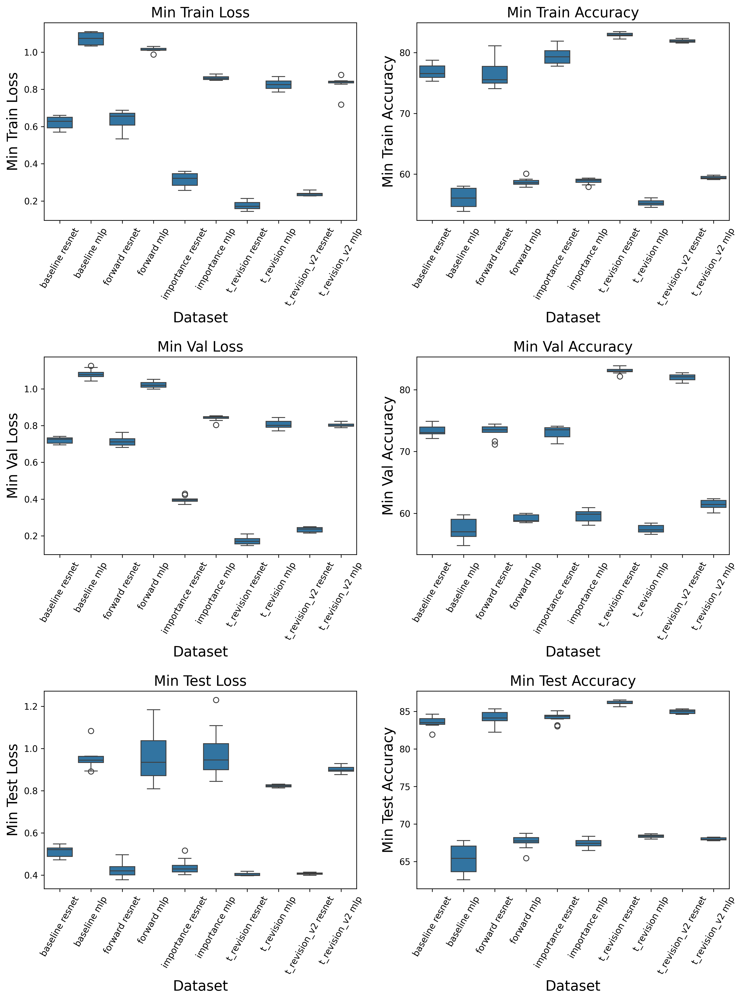

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Encapsulated drawing box diagram function
def plot_boxplots(df_list, columns, labels, title="Boxplots of Cifar10"):
    """
    Draw multiple box plots of df on one plot, with a layout of 2 columns and 3 rows, and display the same column data of multiple DataFrames in each plot.

    Parameters:
    df_list: A list containing multiple DataFrames.
    columns: List of column names (6 column names) that need to be drawn for the box plot.
    labels: a list of labels corresponding to df_list, used to display on the x-axis of the box diagram.
    """
    # Create a subgraph layout with 2 columns and 3 rows
    fig, axes = plt.subplots(3, 2, figsize=(12, 16), dpi=300)
    axes = axes.flatten()  # Flatten the axes object

    # Set font size for all text elements to 16
    plt.rcParams.update({'font.size': 16})

    # Traverse each column name and draw the corresponding boxplot
    for i, col in enumerate(columns):
        # Modify column name to remove underscores and capitalize each word
        col_label = col.replace('_', ' ').title()

        # Collect col column data from each DataFrame and add a label to distinguish DataFrames
        plot_data = []
        for j, df in enumerate(df_list):
            temp_df = df[[col]].copy()
            temp_df['Dataset'] = labels[j]  # Use the provided labels directly
            plot_data.append(temp_df)

        # Combine all data together
        combined_data = pd.concat(plot_data)

        # Draw a box plot
        sns.boxplot(x='Dataset', y=col, data=combined_data, ax=axes[i])
        axes[i].set_title(f'{col_label}', fontsize=16)  # Set modified column name as title for each subplot
        axes[i].tick_params(axis='x', rotation=60)  # Rotate the x-axis label to prevent overlap
        axes[i].set_xlabel("Dataset", fontsize=16)  # Explicitly set x-axis label
        axes[i].set_ylabel(col_label, fontsize=16)  # Explicitly set y-axis label to modified column name

    # Adjust layout
    plt.tight_layout()

    # Display image
    plt.show()



labels = ['baseline resnet',
          'baseline mlp',
          'forward resnet',
          'forward mlp',
          'importance resnet',
          'importance mlp',
          't_revision resnet',
          't_revision mlp',
          "t_revision_v2 resnet",
          "t_revision_v2 mlp",
          ]  # Replace x-axis label




df_list = [baseline_c10_resnet,
           baseline_c10_mlp,
           forward_c10_resnet,
           forward_c10_mlp,
           importance_c10_resnet,
           importance_c10_mlp,
           t_revision_c10_resnet,
           t_revision_c10_mlp,
           t_revision_v2_c10_resnet,
           t_revision_v2_c10_mlp,
           ]
columns = ['min_train_loss', 'min_train_accuracy','min_val_loss', 'min_val_accuracy', 'min_test_loss', 'min_test_accuracy']
plot_boxplots(df_list, columns, labels,title="Boxplots of Cifar10")


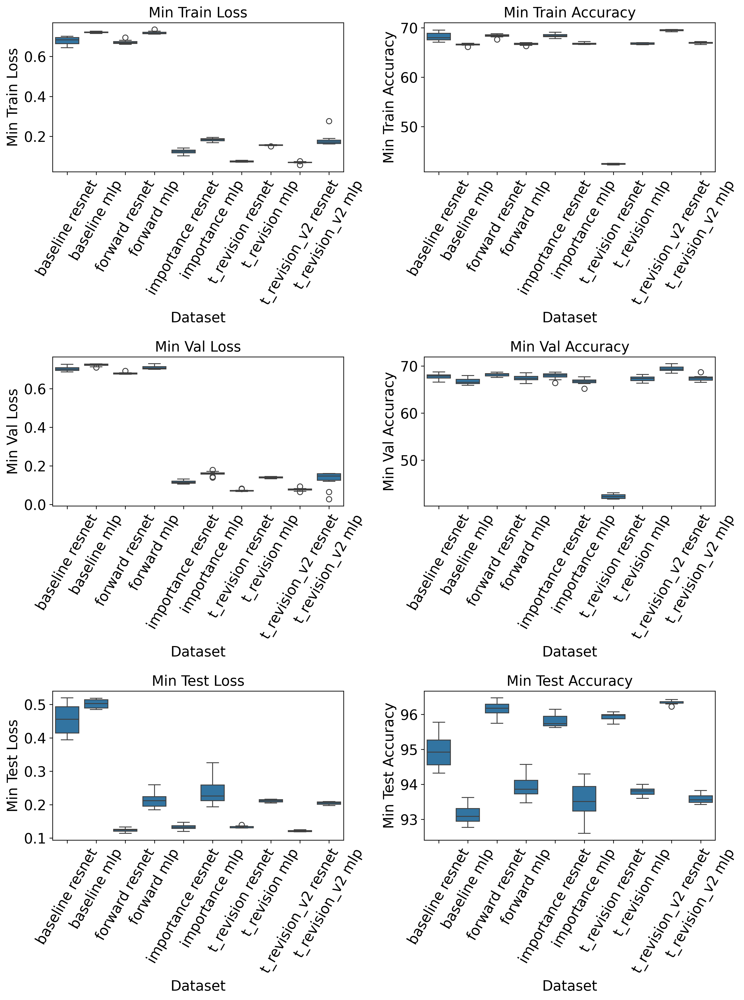

In [ ]:
df_list = [baseline_f3_resnet,
           baseline_f3_mlp,
           forward_f3_resnet,
           forward_f3_mlp,
           importance_f3_resnet,
           importance_f3_mlp,
           t_revision_f3_resnet,
           t_revision_f3_mlp,
           t_revision_v2_f3_resnet,
           t_revision_v2_f3_mlp
           ]
columns = ['min_train_loss', 'min_train_accuracy','min_val_loss', 'min_val_accuracy', 'min_test_loss', 'min_test_accuracy']
plot_boxplots(df_list, columns, labels,title="Boxplots of FashionMNIST0.3")

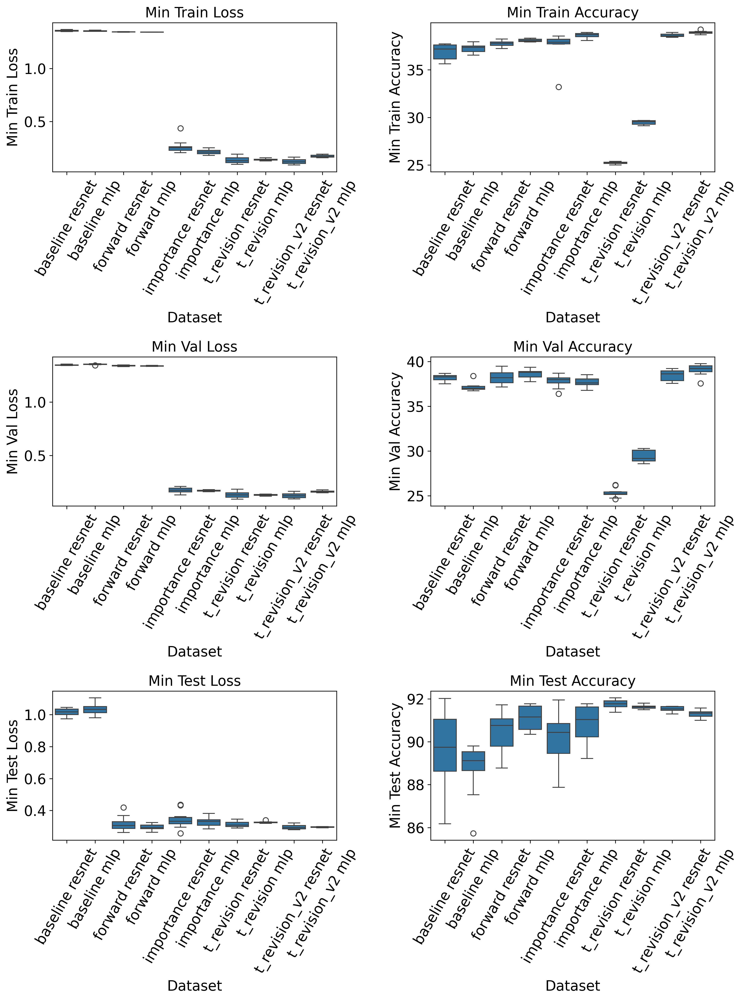

In [ ]:
df_list = [baseline_f6_resnet,
           baseline_f6_mlp,
           forward_f6_resnet,
           forward_f6_mlp,
           importance_f6_resnet,
           importance_f6_mlp,
           t_revision_f6_resnet,
           t_revision_f6_mlp,
           t_revision_v2_f6_resnet,
           t_revision_v2_f6_mlp,
           ]
columns = ['min_train_loss', 'min_train_accuracy','min_val_loss', 'min_val_accuracy', 'min_test_loss', 'min_test_accuracy']
plot_boxplots(df_list, columns, labels,title="Boxplots of FashionMNIST0.6")